In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt

from cavity_solver_outlet import solve_flow
from UNet3_outlet import UNet, conv_loss
from dataset_creator import CavityFlowDataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from samples import get_samples, get_training_data
from torch.utils import data
import time

import os

gpu_no = '1' # or '1'
os.environ["CUDA_VISIBLE_DEVICES"] = gpu_no

In [2]:
dtype = torch.cuda.FloatTensor
filename = 'NSmixed_8-32w0331.pth'

unet_outlet = UNet(dtype, img_size=32).type(dtype)
#     print(unet)
optimizer = optim.Adam(unet_outlet.parameters(), lr = 2e-5)
checkpoint = torch.load(filename)
unet_outlet.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
unet_outlet.eval()


UNet(
  (encoding_layers): ModuleList(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (2): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  )
  (encoding_BN): ModuleList(
    (0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (decoding_layers): ModuleList(
    (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride

In [3]:
size = 32
START_IN = 5
END_IN = 25
U0 = 0.25
V0 = 0.25
u0_vector = np.zeros((1,size))
v0_vector = np.zeros((1,size))

u0_vector[0, START_IN :END_IN ] = U0
v0_vector[0, START_IN :END_IN ] = V0
u = np.zeros((size, size))
v = np.zeros((size, size))
p = np.zeros((size, size)) 
L = 1 # dimensionless LX / LX
H = 1 # dimensionless LY / LX
dx = L / (size - 1)
dy = H / (size - 1)
CFL = 0.04
dt = CFL * min(dx , dy)
RE = 20
START_OUT = 22
END_OUT = 30
usol, vsol, psol = solve_flow(5000, size, size, u, v, dt, dx, dy, p, u0 = u0_vector, v0=v0_vector, start_outlet = START_OUT, end_outlet = END_OUT )

In [3]:
# plt.imshow(usol)
TEST_S = torch.zeros(1,3,size, size)
TEST_S[:,0,:,:] = torch.from_numpy(usol)
TEST_S[:,1,:,:] = torch.from_numpy(vsol)
TEST_S[:,2,:,:] = torch.from_numpy(psol)

INI = torch.zeros(1,3,size, size)
u = np.zeros((size, size))
v = np.zeros((size, size))
p = np.zeros((size, size)) 
uini, vini, pini = solve_flow(1, size, size, u, v, dt, dx, dy, p, u0 = u0_vector, v0=v0_vector, start_outlet = START_OUT, end_outlet = END_OUT )
INI[:,0,:,:] = torch.from_numpy(uini)
INI[:,1,:,:] = torch.from_numpy(vini)
INI[:,2,:,:] = torch.from_numpy(pini)
dtype = torch.FloatTensor
get_loss = conv_loss(dtype = dtype)
get_loss(INI.detach(), TEST_S)

In [4]:
dtype = torch.FloatTensor
get_loss = conv_loss(dtype = dtype)
get_loss(INI.detach(), TEST_S)


tensor(1.2160e-06)

In [34]:
P_b = ((1/dt/(2*h)*( (U[:,:,1:-1, 2:] - U[:,:,1:-1, 0:-2])+(V[:,:,2:, 1:-1] - V[:,:,0:-2, 1:-1]) ) -
    ((U[:,:,1:-1, 2:] - U[:,:,1:-1, 0:-2]) / (2*h))**2 -
    2*((U[:,:,2:, 1:-1] - U[:,:,0:-2, 1:-1]) / 2/h * (V[:,:,1:-1, 2:] - V[:,:,1:-1, 0:-2]) /2/ h)-
    ((V[:,:,2:, 1:-1] - V[:,:,0:-2, 1:-1]) / (2*h))**2))
P_b *= (+1/4*h**2)

P_neum = (P[:,:,:, -1] - P[:,:,:,-2]).abs().mean()
P_neum += (P[:,:,0, :] - P[:,:,1, :]).abs().mean() 
P_neum += (P[:,:,:, 0] - P[:,:,:, 1]).abs().mean() 

Velocity_neum = 10 * ( output[:, 0:2, -1, start_outlet:end_outlet] - output[:, 0:2, -2, start_outlet:end_outlet] ).abs().mean()

output[:, 0:2, -2, start_outlet-1:end_outlet+1]

tensor([[[ 0.1551,  0.2078,  0.1681,  0.1426,  0.1097,  0.0769,  0.0427,
           0.0110, -0.0275, -0.0266],
         [ 0.2108,  0.3369,  0.4124,  0.4497,  0.4595,  0.4446,  0.4056,
           0.3410,  0.2447,  0.1084]]])

In [14]:
def dataset_creater(domain_size, velocity_mag = 0.5, early_time_steps = 500, num_samples = 2048):
    
    size = domain_size
    num_nodes = 100
    lidVecList = np.linspace(0, velocity_mag, num_nodes)
    

    L = 1 # dimensionless LX / LX
    H = 1 # dimensionless LY / LX
    dx = L / (size - 1)
    dy = H / (size - 1)
    CFL = 0.04
    dt = CFL * min(dx , dy)
    RE = 20
    FlowData = torch.zeros((num_samples,3,size,size))
    
    # Get num_samples samples randomly from the UV mesh grid 
    indices = np.random.choice(range(0,num_nodes*num_nodes), num_samples, replace = False)
#     START_OUT = 1
#     END_OUT = 3
    for k in range(0,num_samples):
        u = np.zeros((size, size))
        v = np.zeros((size, size))
        p = np.zeros((size, size))
        
        indU, indV = np.unravel_index(indices[k], (num_nodes,num_nodes)) # convert the random number to indices
        U0 = lidVecList[indU]
        V0 = lidVecList[indV]
        
#         start_node = np.random.randint(1,domain_size - 1)
#         end_node = np.random.randint(start_node, domain_size)
        
        u0_vector = np.zeros((1,size))
        v0_vector = np.zeros((1,size))
        u0_vector[0, :] = U0
        v0_vector[0, :] = V0

        usol, vsol, psol = solve_flow(early_time_steps, size, size, u, v, dt, dx, dy, p, u0 = U0, v0=V0 )
        FlowData[k,0:1,:,:] = torch.from_numpy(usol) # Channel 0
        FlowData[k,1:2,:,:] = torch.from_numpy(vsol) # Channel 1
        FlowData[k,2:3,:,:] = torch.from_numpy(psol) # Channel 2
#         pini = np.zeros((size, size))
#         pini[0,:] = 0.01
#         FlowData[k,2:3,:,:] = torch.from_numpy(psol)
        
    torch.save(FlowData, 'FlowData_UV_0331_warm_mixed8.pt')
    
#     return FlowData

In [16]:
np.random.randint(1,7)

5

In [2]:
# dataset_creater(8)
B = torch.load('FlowData_UV_0331_warm_mixed8.pt')
C = F.interpolate(B, size=(32, 32), mode ='bilinear')
D = F.interpolate(B, size=(32, 32), mode = "nearest")

/opt/anaconda3/2019.07/lib/python3.7/site-packages/torch/nn/functional.py:2479: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


/opt/anaconda3/2019.07/lib/python3.7/site-packages/torch/nn/functional.py:2479: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


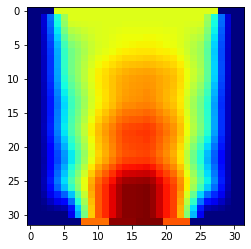

In [34]:
# plt.imshow(D[4,0,:,:].numpy())
# torch.save(C, 'FlowData_UV_0324_warm_mixed32.pt')
Upsampled = torch.zeros(2048, 3, 32, 32)
Upsampled[:,:,1:-1,1:-1] = C[:,:,1:-1,1:-1]

Upsampled[:,:,0,:] = D[:,:,0,:]
Upsampled[:,:,-1,:] = D[:,:,-1,:]
Upsampled[:,:,:,0] = D[:,:,:,0]
Upsampled[:,:,:,-1] = D[:,:,:,-1]
plt.imshow(Upsampled[4,1,:,:].numpy(), cmap = "jet")
# torch.save(Upsampled, 'FlowData_UV_0331_warm_mixed32.pt')

In [28]:
Upsampled[4,1,0,:]

tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040,
        0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040,
        0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040, 0.4040,
        0.4040, 0.0000, 0.0000, 0.0000, 0.0000])

In [24]:
L = 1 # dimensionless LX / LX
H = 1 # dimensionless LY / LX
size = 32
dx = L / (size - 1)
dy = H / (size - 1)
CFL = 0.04
dt = CFL * min(dx , dy)
RE = 20
u = np.zeros((size, size))
v = np.zeros((size, size))
U0 = Upsampled[4,0,0,:].numpy()
V0 = Upsampled[4,1,0,:].numpy()
p = np.zeros((size, size))
usol, vsol, psol = solve_flow(5000, 32, 32, u, v, dt, dx, dy, p, u0 = U0, v0=V0 )


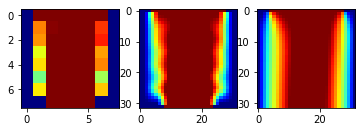

In [33]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
ax1.imshow(B[4,1,:,:].numpy(), vmin = 0, vmax = 0.4,cmap = "jet")
ax2.imshow(Upsampled[4,1,:,:].numpy(), vmin = 0, vmax = 0.4, cmap = "jet")
ax3.imshow(vsol, vmin = 0, vmax = 0.4, cmap = "jet")

In [29]:
vsol[0,:]

array([0.       , 0.       , 0.       , 0.       , 0.4040404, 0.4040404,
       0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.4040404,
       0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.4040404,
       0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.4040404,
       0.4040404, 0.4040404, 0.4040404, 0.4040404, 0.       , 0.       ,
       0.       , 0.       ])

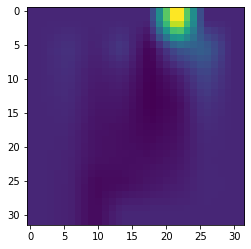

In [5]:
C = torch.load('FlowData_UV_0324_warm_mixed32.pt')
plt.imshow(C[1,0,:,:].numpy())

In [ ]:
F.interpolate(B[0, :, :, :], size=(32, 32, 32), mode='bilinear')

In [8]:
B[0,0,0,:]

tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0909, 0.0909, 0.0909, 0.0909, 0.0909, 0.0909,
        0.0909, 0.0909, 0.0000, 0.0000, 0.0000])

#  PRECHECK Solution loss

In [2]:
Upsampled = torch.load('FlowData_UV_0331_warm_mixed32.pt')
u0_vector = Upsampled[10,0,0,:].detach().cpu().numpy()
v0_vector = Upsampled[10,1,0,:].detach().cpu().numpy()

size = 32
u = np.zeros((size, size))
v = np.zeros((size, size))
p = np.zeros((size, size)) 
L = 1
H = 1
dx = L / (size - 1)
dy = H / (size - 1)
CFL = 0.04
dt = CFL * min(dx , dy)
RE = 20

sol_u, sol_v, sol_p =solve_flow(5000, 32, 32, u, v, dt, dx, dy, p, u0=u0_vector, v0=v0_vector )
dtype = torch.FloatTensor
get_loss = conv_loss(dtype = dtype)
SOL = torch.zeros(1,3,32,32)
SOL[:,0,:,:] = torch.from_numpy(sol_u).unsqueeze(0).unsqueeze(0)
SOL[:,1,:,:] = torch.from_numpy(sol_v).unsqueeze(0).unsqueeze(0)
SOL[:,2,:,:] = torch.from_numpy(sol_p).unsqueeze(0).unsqueeze(0)

get_loss(Upsampled[10:11,:,:,:], SOL)

(tensor(1.7062e-06), 0.0, 0.0, 0.0)

# Training

In [4]:
loss_hist = []
flow_dataset = CavityFlowDataset(root_dir='./', flowfile = 'FlowData_UV_0331_warm_mixed32.pt')
dataloader = data.DataLoader(flow_dataset, batch_size = 32,
                        shuffle=True, num_workers=2)
dtype = torch.cuda.FloatTensor
get_loss = conv_loss(dtype = dtype)
# # unet_outlet = UNet(dtype = dtype, img_size = 32).type(dtype)
# # optimizer = optim.Adam(unet_outlet.parameters(), lr = 4e-5)

for epoch in range(1,70000):
    for S in dataloader:
        img = S.requires_grad_(True).type(dtype)
        output = unet_outlet(img)
#         print(get_loss(img, img))
        loss, bd_loss, p_neum, v_neum = get_loss(img.detach(), output)
#         print(loss)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print("epoch ", epoch, "loss ", float(loss.detach()))
    print("boundary loss:", bd_loss, "Neumann Loss:", p_neum, v_neum)
    loss_hist.append(float(loss.detach()))
    del loss
    if (epoch % 10000) == 0:
        torch.save({
                    'epoch': epoch,
                    'model_state_dict': unet_outlet.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    }, 'NSmixed_warm0401-8-32_{}.pth'.format(epoch))

epoch  1 loss  3.352278470993042
boundary loss: 0.322782039642334 Neumann Loss: 0.005082597024738789 0.023180142045021057
epoch  2 loss  2.5107555389404297
boundary loss: 0.2216223180294037 Neumann Loss: 0.010720286518335342 0.08077119290828705
epoch  3 loss  1.8230152130126953
boundary loss: 0.14127950370311737 Neumann Loss: 0.019045967608690262 0.1256900578737259
epoch  4 loss  1.4346369504928589
boundary loss: 0.10684370994567871 Neumann Loss: 0.02216588519513607 0.05688872188329697
epoch  5 loss  1.1238569021224976
boundary loss: 0.08171816170215607 Neumann Loss: 0.022440176457166672 0.01793970912694931
epoch  6 loss  1.0010038614273071
boundary loss: 0.07213252782821655 Neumann Loss: 0.023027047514915466 0.014853455126285553
epoch  7 loss  0.9372824430465698
boundary loss: 0.06679324060678482 Neumann Loss: 0.022045355290174484 0.013510843738913536
epoch  8 loss  0.8160198330879211
boundary loss: 0.05656363070011139 Neumann Loss: 0.020465193316340446 0.012045789510011673
epoch  9 l

epoch  66 loss  0.2268604338169098
boundary loss: 0.00850896816700697 Neumann Loss: 0.0020413282327353954 0.002383742481470108
epoch  67 loss  0.19541241228580475
boundary loss: 0.006735536269843578 Neumann Loss: 0.0015758119989186525 0.0020204042084515095
epoch  68 loss  0.210002601146698
boundary loss: 0.006965045817196369 Neumann Loss: 0.0018853790825232863 0.002511601895093918
epoch  69 loss  0.21205994486808777
boundary loss: 0.007296334952116013 Neumann Loss: 0.0016942487563937902 0.002137321513146162
epoch  70 loss  0.2133263647556305
boundary loss: 0.006970565300434828 Neumann Loss: 0.0017863174434751272 0.0019196888897567987
epoch  71 loss  0.21475274860858917
boundary loss: 0.007418794557452202 Neumann Loss: 0.0017218029825016856 0.0019874561112374067
epoch  72 loss  0.21149234473705292
boundary loss: 0.006971849128603935 Neumann Loss: 0.0018286339472979307 0.002106051193550229
epoch  73 loss  0.20101965963840485
boundary loss: 0.00613787304610014 Neumann Loss: 0.001631174702

epoch  130 loss  0.169779971241951
boundary loss: 0.0041344924829900265 Neumann Loss: 0.0014042636612430215 0.001623014104552567
epoch  131 loss  0.16836534440517426
boundary loss: 0.004016099497675896 Neumann Loss: 0.00149854167830199 0.0020272559486329556
epoch  132 loss  0.13876867294311523
boundary loss: 0.0034716418012976646 Neumann Loss: 0.0012060063891112804 0.0017314557917416096
epoch  133 loss  0.14890296757221222
boundary loss: 0.0033775228075683117 Neumann Loss: 0.0013377716531977057 0.001561589539051056
epoch  134 loss  0.13748066127300262
boundary loss: 0.0033966158516705036 Neumann Loss: 0.0014040402602404356 0.0018947181524708867
epoch  135 loss  0.15501487255096436
boundary loss: 0.0034860465675592422 Neumann Loss: 0.0013055767631158233 0.0015207382384687662
epoch  136 loss  0.13756109774112701
boundary loss: 0.0032405774109065533 Neumann Loss: 0.0012224758975207806 0.001626045210286975
epoch  137 loss  0.13292360305786133
boundary loss: 0.003339940682053566 Neumann Los

epoch  193 loss  0.11621636152267456
boundary loss: 0.0026585194282233715 Neumann Loss: 0.0009775852086022496 0.0011476284125819802
epoch  194 loss  0.10892699658870697
boundary loss: 0.0024116758722811937 Neumann Loss: 0.0009609347325749695 0.0011405147379264235
epoch  195 loss  0.11586175113916397
boundary loss: 0.002575887134298682 Neumann Loss: 0.0010281502036377788 0.0011483840644359589
epoch  196 loss  0.1279786229133606
boundary loss: 0.0029152415227144957 Neumann Loss: 0.001162746804766357 0.0013190940953791142
epoch  197 loss  0.11261329054832458
boundary loss: 0.002676320029422641 Neumann Loss: 0.0010499847121536732 0.0011474916245788336
epoch  198 loss  0.10951635986566544
boundary loss: 0.002370968461036682 Neumann Loss: 0.0009819571860134602 0.0010723212035372853
epoch  199 loss  0.11154038459062576
boundary loss: 0.0024736919440329075 Neumann Loss: 0.0009357676608487964 0.0010843765921890736
epoch  200 loss  0.1169985681772232
boundary loss: 0.0024197313468903303 Neumann 

epoch  256 loss  0.15681709349155426
boundary loss: 0.0020806174725294113 Neumann Loss: 0.001080501126125455 0.001929205609485507
epoch  257 loss  0.14198702573776245
boundary loss: 0.0021757616195827723 Neumann Loss: 0.0010165065759792924 0.0017389050917699933
epoch  258 loss  0.13960787653923035
boundary loss: 0.0020453613251447678 Neumann Loss: 0.0010953833116218448 0.002016789047047496
epoch  259 loss  0.14192615449428558
boundary loss: 0.002533051883801818 Neumann Loss: 0.0008899988606572151 0.0016357933636754751
epoch  260 loss  0.1299067884683609
boundary loss: 0.0018937981221824884 Neumann Loss: 0.0009022554149851203 0.001539618824608624
epoch  261 loss  0.14819225668907166
boundary loss: 0.001900184084661305 Neumann Loss: 0.0008021765388548374 0.0019927057437598705
epoch  262 loss  0.12276331335306168
boundary loss: 0.0019119477365165949 Neumann Loss: 0.0009269479778595269 0.001480562030337751
epoch  263 loss  0.12042321264743805
boundary loss: 0.002043727319687605 Neumann Los

epoch  319 loss  0.09007811546325684
boundary loss: 0.0016019803006201982 Neumann Loss: 0.000722637225408107 0.0010131008457392454
epoch  320 loss  0.10220056772232056
boundary loss: 0.0017016861820593476 Neumann Loss: 0.0008600674336776137 0.0010628473246470094
epoch  321 loss  0.10102330148220062
boundary loss: 0.0018980230670422316 Neumann Loss: 0.000850379467010498 0.0011009834706783295
epoch  322 loss  0.10254329442977905
boundary loss: 0.001750680268742144 Neumann Loss: 0.0008022803231142461 0.0011784036178141832
epoch  323 loss  0.10188514739274979
boundary loss: 0.0019740669522434473 Neumann Loss: 0.0007873228751122952 0.0013196573127061129
epoch  324 loss  0.09664436429738998
boundary loss: 0.0017242564354091883 Neumann Loss: 0.0007404988282360137 0.0010332310339435935
epoch  325 loss  0.10124556720256805
boundary loss: 0.001897900947369635 Neumann Loss: 0.00074450031388551 0.0011216882849112153
epoch  326 loss  0.09227611869573593
boundary loss: 0.0018276890041306615 Neumann 

epoch  382 loss  0.08345624059438705
boundary loss: 0.001543660182505846 Neumann Loss: 0.0006098864250816405 0.0008537076064385474
epoch  383 loss  0.08773641288280487
boundary loss: 0.0016990496078506112 Neumann Loss: 0.0007501022191718221 0.0008688235539011657
epoch  384 loss  0.08509129285812378
boundary loss: 0.0014381075743585825 Neumann Loss: 0.0006909716175869107 0.0008276384905911982
epoch  385 loss  0.09666874259710312
boundary loss: 0.001983138732612133 Neumann Loss: 0.0007731511723250151 0.0008927545277401805
epoch  386 loss  0.08883604407310486
boundary loss: 0.001658849185332656 Neumann Loss: 0.0007523277890868485 0.0009914350230246782
epoch  387 loss  0.09098438918590546
boundary loss: 0.0017802115762606263 Neumann Loss: 0.0006927243666723371 0.0009109927341341972
epoch  388 loss  0.09380296617746353
boundary loss: 0.0017383946105837822 Neumann Loss: 0.0007259101839736104 0.0008625910268165171
epoch  389 loss  0.08652329444885254
boundary loss: 0.0016495591262355447 Neuma

epoch  445 loss  0.09028651565313339
boundary loss: 0.0014411804731935263 Neumann Loss: 0.0006354316137731075 0.0007208379684016109
epoch  446 loss  0.09237401187419891
boundary loss: 0.0014901909744367003 Neumann Loss: 0.0006946506910026073 0.0007950251456350088
epoch  447 loss  0.08669169992208481
boundary loss: 0.0014791120775043964 Neumann Loss: 0.0007278561824932694 0.000991634908132255
epoch  448 loss  0.07957832515239716
boundary loss: 0.0014686922077089548 Neumann Loss: 0.0006009523058310151 0.0009363372810184956
epoch  449 loss  0.07955840229988098
boundary loss: 0.0014058981323614717 Neumann Loss: 0.0006007977644912899 0.0007466012611985207
epoch  450 loss  0.09605024755001068
boundary loss: 0.001407993258908391 Neumann Loss: 0.0007467727409675717 0.0009866110049188137
epoch  451 loss  0.09411031007766724
boundary loss: 0.0018121437169611454 Neumann Loss: 0.0007901196950115263 0.0008627802017144859
epoch  452 loss  0.11128605157136917
boundary loss: 0.0015685127582401037 Neum

epoch  508 loss  0.07527295500040054
boundary loss: 0.00143698591273278 Neumann Loss: 0.0005911655025556684 0.0007220502593554556
epoch  509 loss  0.07831212878227234
boundary loss: 0.0016857635928317904 Neumann Loss: 0.0005352000007405877 0.0008225901983678341
epoch  510 loss  0.07243508100509644
boundary loss: 0.0013051547575742006 Neumann Loss: 0.0005212550750002265 0.0005853748880326748
epoch  511 loss  0.07922952622175217
boundary loss: 0.0014716720907017589 Neumann Loss: 0.0006035367259755731 0.0006779364193789661
epoch  512 loss  0.08025024831295013
boundary loss: 0.0013794570695608854 Neumann Loss: 0.0005964712472632527 0.0006885744514875114
epoch  513 loss  0.06746428459882736
boundary loss: 0.0013162408722564578 Neumann Loss: 0.0005711351986974478 0.0005590918008238077
epoch  514 loss  0.07902082800865173
boundary loss: 0.0013451892882585526 Neumann Loss: 0.0006133073475211859 0.0006550983525812626
epoch  515 loss  0.07746540755033493
boundary loss: 0.001225230167619884 Neuma

epoch  571 loss  0.09675876796245575
boundary loss: 0.001313088578172028 Neumann Loss: 0.0007199181709438562 0.00110628770198673
epoch  572 loss  0.07494881749153137
boundary loss: 0.0010582383256405592 Neumann Loss: 0.000601109815761447 0.0009024057071655989
epoch  573 loss  0.08705954998731613
boundary loss: 0.0013048986438661814 Neumann Loss: 0.0006180544150993228 0.0009670434519648552
epoch  574 loss  0.07652245461940765
boundary loss: 0.001096417778171599 Neumann Loss: 0.0006014143582433462 0.0006270421436056495
epoch  575 loss  0.07796448469161987
boundary loss: 0.0013502653455361724 Neumann Loss: 0.0005536958924494684 0.00066633231472224
epoch  576 loss  0.08269497752189636
boundary loss: 0.00171776139177382 Neumann Loss: 0.0006967795779928565 0.0006850127829238772
epoch  577 loss  0.07696791738271713
boundary loss: 0.0011430112645030022 Neumann Loss: 0.0005370629369281232 0.000661766913253814
epoch  578 loss  0.07132667303085327
boundary loss: 0.0011535190278664231 Neumann Loss

epoch  634 loss  0.08077091723680496
boundary loss: 0.001419887994416058 Neumann Loss: 0.0006215624744072556 0.0006397858960554004
epoch  635 loss  0.0685233622789383
boundary loss: 0.00120086211245507 Neumann Loss: 0.0005062428535893559 0.0005978684057481587
epoch  636 loss  0.07126904278993607
boundary loss: 0.0010454239090904593 Neumann Loss: 0.0005713346181437373 0.0007157251820899546
epoch  637 loss  0.07116442173719406
boundary loss: 0.0010757455602288246 Neumann Loss: 0.0005690522957593203 0.0007220172556117177
epoch  638 loss  0.06524457037448883
boundary loss: 0.0010887871030718088 Neumann Loss: 0.0005133242812007666 0.0007412823615595698
epoch  639 loss  0.07569153606891632
boundary loss: 0.0011678185546770692 Neumann Loss: 0.0005702368216589093 0.0008728722459636629
epoch  640 loss  0.07539093494415283
boundary loss: 0.0011612835805863142 Neumann Loss: 0.0005547496257349849 0.0007240479462780058
epoch  641 loss  0.07423431426286697
boundary loss: 0.001133415149524808 Neumann

epoch  697 loss  0.06378306448459625
boundary loss: 0.0010063631925731897 Neumann Loss: 0.0004975899937562644 0.0006791678606532514
epoch  698 loss  0.05998606979846954
boundary loss: 0.0009938118746504188 Neumann Loss: 0.00048517913091927767 0.0005547674372792244
epoch  699 loss  0.06609535217285156
boundary loss: 0.0010939283529296517 Neumann Loss: 0.00046476139687001705 0.0005396263441070914
epoch  700 loss  0.06507188081741333
boundary loss: 0.0010838439920917153 Neumann Loss: 0.0005154788377694786 0.0006098285666666925
epoch  701 loss  0.060210220515728
boundary loss: 0.0009257049532607198 Neumann Loss: 0.0004607808659784496 0.0006449950160458684
epoch  702 loss  0.06136177480220795
boundary loss: 0.0010947133414447308 Neumann Loss: 0.0005548149347305298 0.0006462415913119912
epoch  703 loss  0.06255339086055756
boundary loss: 0.0010669351322576404 Neumann Loss: 0.0005291284178383648 0.0006663176463916898
epoch  704 loss  0.06795346736907959
boundary loss: 0.0011603625025600195 Ne

epoch  760 loss  0.06419847160577774
boundary loss: 0.0010417262092232704 Neumann Loss: 0.00046937030856497586 0.0006164033547975123
epoch  761 loss  0.06958013772964478
boundary loss: 0.0010912163415923715 Neumann Loss: 0.0005424723494797945 0.0008211294189095497
epoch  762 loss  0.06661663949489594
boundary loss: 0.0009404901647940278 Neumann Loss: 0.000567316310480237 0.000923872459679842
epoch  763 loss  0.06816466897726059
boundary loss: 0.001023554359562695 Neumann Loss: 0.0004949845606461167 0.0006024512113071978
epoch  764 loss  0.07383209466934204
boundary loss: 0.001265025814063847 Neumann Loss: 0.0005607898347079754 0.0007049920386634767
epoch  765 loss  0.06101135537028313
boundary loss: 0.0009165909723378718 Neumann Loss: 0.0004649301990866661 0.0005049133906140924
epoch  766 loss  0.07776337116956711
boundary loss: 0.0011656282003968954 Neumann Loss: 0.0004798373847734183 0.001015259651467204
epoch  767 loss  0.06384484469890594
boundary loss: 0.0010217695962637663 Neuman

epoch  823 loss  0.06465920805931091
boundary loss: 0.0010959288338199258 Neumann Loss: 0.0005392197053879499 0.0005869324086233974
epoch  824 loss  0.06663892418146133
boundary loss: 0.0010652286000549793 Neumann Loss: 0.00040919656748883426 0.0005373323801904917
epoch  825 loss  0.06260766088962555
boundary loss: 0.0012403856962919235 Neumann Loss: 0.00045664480421692133 0.0005719850887544453
epoch  826 loss  0.06456058472394943
boundary loss: 0.0010510650463402271 Neumann Loss: 0.0004704702296294272 0.0005691873375326395
epoch  827 loss  0.06074243783950806
boundary loss: 0.0009902841411530972 Neumann Loss: 0.00045641540782526135 0.0005784101667813957
epoch  828 loss  0.06323573738336563
boundary loss: 0.001045024604536593 Neumann Loss: 0.00043745600851252675 0.0005231313989497721
epoch  829 loss  0.059654444456100464
boundary loss: 0.0009467704221606255 Neumann Loss: 0.00046913797268643975 0.0004903058870695531
epoch  830 loss  0.061778225004673004
boundary loss: 0.0009994760621339

epoch  886 loss  0.05743231251835823
boundary loss: 0.0008972034556791186 Neumann Loss: 0.00043510922114364803 0.0005188013892620802
epoch  887 loss  0.06698472797870636
boundary loss: 0.0010365445632487535 Neumann Loss: 0.00044551867176778615 0.0005492839263752103
epoch  888 loss  0.06358251720666885
boundary loss: 0.001006509643048048 Neumann Loss: 0.0004048774135299027 0.0004069270798936486
epoch  889 loss  0.0640680193901062
boundary loss: 0.0009675530018284917 Neumann Loss: 0.00045753465383313596 0.0005828842404298484
epoch  890 loss  0.058840781450271606
boundary loss: 0.0009489166550338268 Neumann Loss: 0.0004834749852307141 0.0005793275777250528
epoch  891 loss  0.06770956516265869
boundary loss: 0.0009722028626129031 Neumann Loss: 0.0004594290512613952 0.0006437863921746612
epoch  892 loss  0.06842204928398132
boundary loss: 0.0010532018495723605 Neumann Loss: 0.0004350316012278199 0.0006250747246667743
epoch  893 loss  0.06245599687099457
boundary loss: 0.000859945488628 Neum

epoch  949 loss  0.0778917670249939
boundary loss: 0.0009536033612675965 Neumann Loss: 0.0006009240169078112 0.0007725459872744977
epoch  950 loss  0.06980611383914948
boundary loss: 0.0009367985185235739 Neumann Loss: 0.00042612594552338123 0.000543748028576374
epoch  951 loss  0.0779983252286911
boundary loss: 0.000992947956547141 Neumann Loss: 0.0004965158295817673 0.0006950746173970401
epoch  952 loss  0.09089651703834534
boundary loss: 0.0010168240405619144 Neumann Loss: 0.00048756509204395115 0.0010706745088100433
epoch  953 loss  0.08326222747564316
boundary loss: 0.0012446959735825658 Neumann Loss: 0.00047812802949920297 0.0008909009047783911
epoch  954 loss  0.07686233520507812
boundary loss: 0.000978546915575862 Neumann Loss: 0.0005449712625704706 0.0006431823712773621
epoch  955 loss  0.08583228290081024
boundary loss: 0.0009660216164775193 Neumann Loss: 0.0006210560677573085 0.00091035186778754
epoch  956 loss  0.07786785066127777
boundary loss: 0.00094258674653247 Neumann 

epoch  1012 loss  0.05866178870201111
boundary loss: 0.0009512400138191879 Neumann Loss: 0.00043732166523113847 0.00047356425784528255
epoch  1013 loss  0.05576575547456741
boundary loss: 0.0008695613360032439 Neumann Loss: 0.00040464388439431787 0.0004347591893747449
epoch  1014 loss  0.051819488406181335
boundary loss: 0.0009106846409849823 Neumann Loss: 0.00041559984674677253 0.0004489015555009246
epoch  1015 loss  0.06280728429555893
boundary loss: 0.0008849635487422347 Neumann Loss: 0.00045951586798764765 0.0005482790875248611
epoch  1016 loss  0.06191449239850044
boundary loss: 0.0009592428687028587 Neumann Loss: 0.0004085408872924745 0.000555348233319819
epoch  1017 loss  0.05980892851948738
boundary loss: 0.0009474183316342533 Neumann Loss: 0.00038015947211533785 0.00047078108764253557
epoch  1018 loss  0.0588732548058033
boundary loss: 0.0008814227767288685 Neumann Loss: 0.00042641343316063285 0.000506556301843375
epoch  1019 loss  0.07802362740039825
boundary loss: 0.00096415

epoch  1074 loss  0.0715598613023758
boundary loss: 0.000684897240716964 Neumann Loss: 0.00046953000128269196 0.0008532453794032335
epoch  1075 loss  0.07932420819997787
boundary loss: 0.00097878638189286 Neumann Loss: 0.00044345369678922 0.0009459545835852623
epoch  1076 loss  0.07022688537836075
boundary loss: 0.000890149618498981 Neumann Loss: 0.0006424566963687539 0.0009006611653603613
epoch  1077 loss  0.06543369591236115
boundary loss: 0.0008548328187316656 Neumann Loss: 0.0005670522805303335 0.0006895472179166973
epoch  1078 loss  0.061728619039058685
boundary loss: 0.0008995577809400856 Neumann Loss: 0.0004721835139207542 0.000709354761056602
epoch  1079 loss  0.05906558781862259
boundary loss: 0.0008484090212732553 Neumann Loss: 0.00043277262011542916 0.0006241819937713444
epoch  1080 loss  0.06552739441394806
boundary loss: 0.0009508535149507225 Neumann Loss: 0.0006026800838299096 0.0006395082455128431
epoch  1081 loss  0.07550739496946335
boundary loss: 0.0009239961509592831

epoch  1136 loss  0.06656796485185623
boundary loss: 0.0009565274231135845 Neumann Loss: 0.0005406923010013998 0.000769810751080513
epoch  1137 loss  0.07685074955224991
boundary loss: 0.0009534128475934267 Neumann Loss: 0.0004877151222899556 0.0007735291728749871
epoch  1138 loss  0.07154531031847
boundary loss: 0.000798782508354634 Neumann Loss: 0.000526323972735554 0.0009231693693436682
epoch  1139 loss  0.07147039473056793
boundary loss: 0.0007477200124412775 Neumann Loss: 0.0004915834870189428 0.0007621324621140957
epoch  1140 loss  0.07628020644187927
boundary loss: 0.000870406860485673 Neumann Loss: 0.0005217399448156357 0.0006763137644156814
epoch  1141 loss  0.06845371425151825
boundary loss: 0.0007594022317789495 Neumann Loss: 0.0004260761779733002 0.0008062657434493303
epoch  1142 loss  0.083170585334301
boundary loss: 0.0008835985790938139 Neumann Loss: 0.0004242374561727047 0.000729216611944139
epoch  1143 loss  0.07354863733053207
boundary loss: 0.0008114760275930166 Neum

epoch  1198 loss  0.08151499927043915
boundary loss: 0.0008905879221856594 Neumann Loss: 0.00045836839126423 0.0009577590972185135
epoch  1199 loss  0.06932753324508667
boundary loss: 0.0007426904630847275 Neumann Loss: 0.0006079287268221378 0.0008229612139984965
epoch  1200 loss  0.0809871032834053
boundary loss: 0.0007826959481462836 Neumann Loss: 0.00048218772280961275 0.0007988996803760529
epoch  1201 loss  0.067475825548172
boundary loss: 0.0007686896715313196 Neumann Loss: 0.0004097796918358654 0.0008320675115101039
epoch  1202 loss  0.0650046095252037
boundary loss: 0.0008180991280823946 Neumann Loss: 0.0004992036847397685 0.0007519895443692803
epoch  1203 loss  0.07245635986328125
boundary loss: 0.0008602861780673265 Neumann Loss: 0.00045765144750475883 0.0008840690134093165
epoch  1204 loss  0.070175901055336
boundary loss: 0.000827477895654738 Neumann Loss: 0.0004894708399660885 0.0007318794960156083
epoch  1205 loss  0.08148350566625595
boundary loss: 0.0008438043878413737 N

epoch  1260 loss  0.07438972592353821
boundary loss: 0.0008375858888030052 Neumann Loss: 0.0005365790566429496 0.000865618116222322
epoch  1261 loss  0.060899220407009125
boundary loss: 0.0007737487321719527 Neumann Loss: 0.0004693620721809566 0.0007947183912619948
epoch  1262 loss  0.059952616691589355
boundary loss: 0.0008106190944090486 Neumann Loss: 0.0005018634255975485 0.0005370351136662066
epoch  1263 loss  0.053743548691272736
boundary loss: 0.0007484451634809375 Neumann Loss: 0.00036416741204448044 0.00043986772652715445
epoch  1264 loss  0.05933258309960365
boundary loss: 0.000779019552282989 Neumann Loss: 0.0003749801544472575 0.0005553705850616097
epoch  1265 loss  0.05188778042793274
boundary loss: 0.0009006531909108162 Neumann Loss: 0.00037806338514201343 0.0003978277090936899
epoch  1266 loss  0.052237674593925476
boundary loss: 0.0007185084978118539 Neumann Loss: 0.0003627674304880202 0.0004647383757401258
epoch  1267 loss  0.05041627958416939
boundary loss: 0.000790515

epoch  1322 loss  0.06347646564245224
boundary loss: 0.0008545070304535329 Neumann Loss: 0.00046217991621233523 0.000706154853105545
epoch  1323 loss  0.05819109454751015
boundary loss: 0.0008921491680666804 Neumann Loss: 0.000369407469406724 0.000538607535418123
epoch  1324 loss  0.05215724557638168
boundary loss: 0.000824732705950737 Neumann Loss: 0.0003589811094570905 0.000378704717149958
epoch  1325 loss  0.05125563219189644
boundary loss: 0.0007919374038465321 Neumann Loss: 0.00036753970198333263 0.00038910924922674894
epoch  1326 loss  0.05040501430630684
boundary loss: 0.0007689964841119945 Neumann Loss: 0.0003379263507667929 0.0004317742132116109
epoch  1327 loss  0.0485905185341835
boundary loss: 0.0007491991855204105 Neumann Loss: 0.0003505838685669005 0.0003737039223778993
epoch  1328 loss  0.052742548286914825
boundary loss: 0.0008043698035180569 Neumann Loss: 0.0003755358047783375 0.0005425104172900319
epoch  1329 loss  0.054491035640239716
boundary loss: 0.000895995646715

epoch  1384 loss  0.07154715061187744
boundary loss: 0.0007748531643301249 Neumann Loss: 0.0003712884208653122 0.0006535123102366924
epoch  1385 loss  0.06257577985525131
boundary loss: 0.0006414952804334462 Neumann Loss: 0.0003770328767132014 0.0005243500927463174
epoch  1386 loss  0.06370696425437927
boundary loss: 0.0007928250124678016 Neumann Loss: 0.0005129063501954079 0.0007701409631408751
epoch  1387 loss  0.054144758731126785
boundary loss: 0.0007764869369566441 Neumann Loss: 0.00037048300146125257 0.0004413670103531331
epoch  1388 loss  0.0503564178943634
boundary loss: 0.0007694786181673408 Neumann Loss: 0.0003319047682452947 0.00036906846798956394
epoch  1389 loss  0.04770680516958237
boundary loss: 0.0007282698643393815 Neumann Loss: 0.000359604338882491 0.0003728898009285331
epoch  1390 loss  0.047172896564006805
boundary loss: 0.000676525931339711 Neumann Loss: 0.00038915761979296803 0.0003964326169807464
epoch  1391 loss  0.055666327476501465
boundary loss: 0.00099672691

epoch  1446 loss  0.07504899799823761
boundary loss: 0.0008902227273210883 Neumann Loss: 0.000511455349624157 0.0007035081507638097
epoch  1447 loss  0.07662840932607651
boundary loss: 0.0007699687848798931 Neumann Loss: 0.0005128674092702568 0.0008497274247929454
epoch  1448 loss  0.07661095261573792
boundary loss: 0.0008878654334694147 Neumann Loss: 0.00042322088847868145 0.0006339244428090751
epoch  1449 loss  0.08041910082101822
boundary loss: 0.0006975051946938038 Neumann Loss: 0.0004155046190135181 0.0008000776870176196
epoch  1450 loss  0.06461970508098602
boundary loss: 0.0007042846409603953 Neumann Loss: 0.00047060323413461447 0.0009120883769355714
epoch  1451 loss  0.06876014918088913
boundary loss: 0.0006689954316243529 Neumann Loss: 0.00037622201489284635 0.0005548701155930758
epoch  1452 loss  0.06323771178722382
boundary loss: 0.0007197705563157797 Neumann Loss: 0.0004361737228464335 0.0006553083076141775
epoch  1453 loss  0.0654262900352478
boundary loss: 0.0006579987239

epoch  1508 loss  0.06652859598398209
boundary loss: 0.0007520031649619341 Neumann Loss: 0.0004278919368516654 0.0006859686691313982
epoch  1509 loss  0.05806976929306984
boundary loss: 0.0006948692025616765 Neumann Loss: 0.00041359831811860204 0.0005509629845619202
epoch  1510 loss  0.06224764510989189
boundary loss: 0.0007948603597469628 Neumann Loss: 0.0003869406064040959 0.0005405722768045962
epoch  1511 loss  0.0645810142159462
boundary loss: 0.0007189364405348897 Neumann Loss: 0.00038845729432068765 0.0006879744469188154
epoch  1512 loss  0.062443673610687256
boundary loss: 0.0006379700498655438 Neumann Loss: 0.0004129784647375345 0.0006503488402813673
epoch  1513 loss  0.06230191886425018
boundary loss: 0.0007896595634520054 Neumann Loss: 0.00041719875298440456 0.0006472502136602998
epoch  1514 loss  0.05166180059313774
boundary loss: 0.0008355296449735761 Neumann Loss: 0.00039961066795513034 0.0005865441053174436
epoch  1515 loss  0.06018754094839096
boundary loss: 0.0008698937

epoch  1570 loss  0.0652415007352829
boundary loss: 0.0007996191270649433 Neumann Loss: 0.0005306302336975932 0.0007422036142088473
epoch  1571 loss  0.072936050593853
boundary loss: 0.0007316372939385474 Neumann Loss: 0.00042653127457015216 0.0007291492656804621
epoch  1572 loss  0.06008951738476753
boundary loss: 0.000711627013515681 Neumann Loss: 0.00048018249799497426 0.0006840309360995889
epoch  1573 loss  0.06460127979516983
boundary loss: 0.0007462867652066052 Neumann Loss: 0.0005454649217426777 0.0006574105937033892
epoch  1574 loss  0.058422595262527466
boundary loss: 0.000726649072021246 Neumann Loss: 0.0003941828908864409 0.0006229879800230265
epoch  1575 loss  0.06919368356466293
boundary loss: 0.0007115454063750803 Neumann Loss: 0.0004109337751287967 0.0009300530655309558
epoch  1576 loss  0.055330801755189896
boundary loss: 0.0006992828566581011 Neumann Loss: 0.000382924044970423 0.0005382366362027824
epoch  1577 loss  0.06167227774858475
boundary loss: 0.0006874446989968

epoch  1632 loss  0.05309005454182625
boundary loss: 0.000627163506578654 Neumann Loss: 0.0003888015344273299 0.0005475161597132683
epoch  1633 loss  0.05589462071657181
boundary loss: 0.0006167301908135414 Neumann Loss: 0.0004486634279601276 0.0006007241318002343
epoch  1634 loss  0.05635666847229004
boundary loss: 0.0006490438827313483 Neumann Loss: 0.00043529472895897925 0.0007625860744155943
epoch  1635 loss  0.06305110454559326
boundary loss: 0.0006699972436763346 Neumann Loss: 0.0005194452241994441 0.0006211798754520714
epoch  1636 loss  0.06399592012166977
boundary loss: 0.0005959550035186112 Neumann Loss: 0.00040662437095306814 0.0007066605612635612
epoch  1637 loss  0.05580351501703262
boundary loss: 0.0008625156478956342 Neumann Loss: 0.000407956016715616 0.0007021017372608185
epoch  1638 loss  0.06050000712275505
boundary loss: 0.0008646202040836215 Neumann Loss: 0.0004746273043565452 0.0006576726445928216
epoch  1639 loss  0.06425464153289795
boundary loss: 0.00072973337955

epoch  1694 loss  0.06458389014005661
boundary loss: 0.0007249510381370783 Neumann Loss: 0.0005416992353275418 0.0006704996339976788
epoch  1695 loss  0.056505654007196426
boundary loss: 0.0007501591462641954 Neumann Loss: 0.00039264190127141774 0.0005463548004627228
epoch  1696 loss  0.054774679243564606
boundary loss: 0.0008626512135379016 Neumann Loss: 0.00039765838300809264 0.0005805768305435777
epoch  1697 loss  0.054288968443870544
boundary loss: 0.0007753877434879541 Neumann Loss: 0.00044242781586945057 0.00037463015178218484
epoch  1698 loss  0.0506105050444603
boundary loss: 0.000675296236295253 Neumann Loss: 0.0003434636164456606 0.0005429080920293927
epoch  1699 loss  0.06290331482887268
boundary loss: 0.0006326226866804063 Neumann Loss: 0.00045804292312823236 0.0006671505980193615
epoch  1700 loss  0.07671370357275009
boundary loss: 0.0006558784516528249 Neumann Loss: 0.0004346358764450997 0.0007660927949473262
epoch  1701 loss  0.06498391181230545
boundary loss: 0.00062646

epoch  1756 loss  0.05667216330766678
boundary loss: 0.0007577904616482556 Neumann Loss: 0.0004759185540024191 0.0006748856976628304
epoch  1757 loss  0.05155138671398163
boundary loss: 0.0005939080729149282 Neumann Loss: 0.0003687946009449661 0.00048208795487880707
epoch  1758 loss  0.06518654525279999
boundary loss: 0.0006217763875611126 Neumann Loss: 0.0003510875685606152 0.0006098446319811046
epoch  1759 loss  0.06445670127868652
boundary loss: 0.0006710067391395569 Neumann Loss: 0.00046357803512364626 0.0007750882650725543
epoch  1760 loss  0.060797318816185
boundary loss: 0.000615232449490577 Neumann Loss: 0.0003529390087351203 0.0006294396007433534
epoch  1761 loss  0.06626460701227188
boundary loss: 0.0007833714480511844 Neumann Loss: 0.00034425780177116394 0.0006676273769699037
epoch  1762 loss  0.06264758110046387
boundary loss: 0.0007263150764629245 Neumann Loss: 0.0003361220587976277 0.0005409279838204384
epoch  1763 loss  0.060713306069374084
boundary loss: 0.0007313182577

epoch  1818 loss  0.04528892785310745
boundary loss: 0.0007099612266756594 Neumann Loss: 0.00045270868577063084 0.000455652509117499
epoch  1819 loss  0.0435262992978096
boundary loss: 0.0006721951067447662 Neumann Loss: 0.0003406832693144679 0.0003530344401951879
epoch  1820 loss  0.04380527883768082
boundary loss: 0.000689603213686496 Neumann Loss: 0.00036475685192272067 0.0004201799165457487
epoch  1821 loss  0.04791621118783951
boundary loss: 0.0006804435979574919 Neumann Loss: 0.00037766597233712673 0.0004837261512875557
epoch  1822 loss  0.052312351763248444
boundary loss: 0.0006490289233624935 Neumann Loss: 0.000498610083013773 0.0005135510000400245
epoch  1823 loss  0.05233323574066162
boundary loss: 0.0006093954434618354 Neumann Loss: 0.0004723712627310306 0.0006553150014951825
epoch  1824 loss  0.050068389624357224
boundary loss: 0.0006628421251662076 Neumann Loss: 0.0004412964335642755 0.0005238054436631501
epoch  1825 loss  0.04811149835586548
boundary loss: 0.0006049667717

epoch  1880 loss  0.06174902245402336
boundary loss: 0.0006462747696787119 Neumann Loss: 0.0004153423069510609 0.0007507266709581017
epoch  1881 loss  0.05016636848449707
boundary loss: 0.0005347862606868148 Neumann Loss: 0.0004399808240123093 0.0006201390642672777
epoch  1882 loss  0.05280264839529991
boundary loss: 0.0006856158142909408 Neumann Loss: 0.00041096031782217324 0.0004927710979245603
epoch  1883 loss  0.04270848259329796
boundary loss: 0.0006632347940467298 Neumann Loss: 0.0003677858039736748 0.00044813266140408814
epoch  1884 loss  0.05025555565953255
boundary loss: 0.0006296243518590927 Neumann Loss: 0.0003023553581442684 0.0004798629670403898
epoch  1885 loss  0.05128001049160957
boundary loss: 0.0007828500238247216 Neumann Loss: 0.0003987441014032811 0.0004165946156717837
epoch  1886 loss  0.05466504022479057
boundary loss: 0.0007112862076610327 Neumann Loss: 0.000499397050589323 0.00047878798795863986
epoch  1887 loss  0.06619700789451599
boundary loss: 0.000578376813

epoch  1942 loss  0.06720741838216782
boundary loss: 0.0006160279153846204 Neumann Loss: 0.00041082818643189967 0.0007436646264977753
epoch  1943 loss  0.06086675450205803
boundary loss: 0.0007556379423476756 Neumann Loss: 0.0004374967247713357 0.0005460760439746082
epoch  1944 loss  0.05872666835784912
boundary loss: 0.0007112300372682512 Neumann Loss: 0.00041653693187981844 0.0006998882163316011
epoch  1945 loss  0.05999254435300827
boundary loss: 0.0008161551668308675 Neumann Loss: 0.0004489915445446968 0.0006407673936337233
epoch  1946 loss  0.048310890793800354
boundary loss: 0.0005933753564022481 Neumann Loss: 0.0004104754189029336 0.0004789757076650858
epoch  1947 loss  0.050435177981853485
boundary loss: 0.0006022658199071884 Neumann Loss: 0.0004450214037206024 0.0004299215506762266
epoch  1948 loss  0.05076278746128082
boundary loss: 0.000634905241895467 Neumann Loss: 0.0004416154115460813 0.0006123908096924424
epoch  1949 loss  0.04452042281627655
boundary loss: 0.00057814060

epoch  2004 loss  0.05255715176463127
boundary loss: 0.0007523336680606008 Neumann Loss: 0.00043573128641583025 0.0004649607290048152
epoch  2005 loss  0.05446295440196991
boundary loss: 0.0006506768986582756 Neumann Loss: 0.0003958485322073102 0.000489440222736448
epoch  2006 loss  0.05954553186893463
boundary loss: 0.0006446326151490211 Neumann Loss: 0.0004590373137034476 0.0006856419495306909
epoch  2007 loss  0.06102980300784111
boundary loss: 0.0005831775488331914 Neumann Loss: 0.00034055078867822886 0.0005100251873955131
epoch  2008 loss  0.058420609682798386
boundary loss: 0.0006830883212387562 Neumann Loss: 0.0003361250273883343 0.0007112404564395547
epoch  2009 loss  0.058673515915870667
boundary loss: 0.000704438250977546 Neumann Loss: 0.000430578162195161 0.00046339063555933535
epoch  2010 loss  0.06630947440862656
boundary loss: 0.000674639770295471 Neumann Loss: 0.0003782707790378481 0.0006440866272896528
epoch  2011 loss  0.06609851121902466
boundary loss: 0.0006457364652

epoch  2066 loss  0.05326296016573906
boundary loss: 0.0006209013517946005 Neumann Loss: 0.0004793005937244743 0.0005410670419223607
epoch  2067 loss  0.05547831207513809
boundary loss: 0.0005406371201388538 Neumann Loss: 0.0004638413665816188 0.0007120643276721239
epoch  2068 loss  0.05906613543629646
boundary loss: 0.0006649346323683858 Neumann Loss: 0.0003744418208952993 0.000658543489407748
epoch  2069 loss  0.05852143093943596
boundary loss: 0.0005720537155866623 Neumann Loss: 0.00036129087675362825 0.0007703908486291766
epoch  2070 loss  0.05034615099430084
boundary loss: 0.0005901153199374676 Neumann Loss: 0.00045351896551437676 0.0005428658332675695
epoch  2071 loss  0.04538944736123085
boundary loss: 0.0005289909895509481 Neumann Loss: 0.0004175732610747218 0.0005588562926277518
epoch  2072 loss  0.061567533761262894
boundary loss: 0.0007108199642971158 Neumann Loss: 0.0004349818918853998 0.0007862753700464964
epoch  2073 loss  0.06214888021349907
boundary loss: 0.000526982941

epoch  2128 loss  0.055390309542417526
boundary loss: 0.0005486873560585082 Neumann Loss: 0.0003687060088850558 0.00046680838568136096
epoch  2129 loss  0.058809779584407806
boundary loss: 0.0006721429526805878 Neumann Loss: 0.000458532536868006 0.000645211199298501
epoch  2130 loss  0.05050243064761162
boundary loss: 0.0006901074666529894 Neumann Loss: 0.0004935310571454465 0.0005072165513411164
epoch  2131 loss  0.04938701540231705
boundary loss: 0.0005902660777792335 Neumann Loss: 0.0003270884044468403 0.0005099695408716798
epoch  2132 loss  0.05040207877755165
boundary loss: 0.0006725058774463832 Neumann Loss: 0.00040796436951495707 0.000522850954439491
epoch  2133 loss  0.06179158017039299
boundary loss: 0.0006303770933300257 Neumann Loss: 0.0004306276678107679 0.0006680840160697699
epoch  2134 loss  0.05875629559159279
boundary loss: 0.0006445155013352633 Neumann Loss: 0.0003617553738877177 0.0005402492242865264
epoch  2135 loss  0.06799955666065216
boundary loss: 0.0006879706634

epoch  2190 loss  0.04727402701973915
boundary loss: 0.0006702748360112309 Neumann Loss: 0.00031590391881763935 0.00038421599310822785
epoch  2191 loss  0.04127729311585426
boundary loss: 0.0006437600241042674 Neumann Loss: 0.00031089456751942635 0.000311043462716043
epoch  2192 loss  0.054332099854946136
boundary loss: 0.000602251966483891 Neumann Loss: 0.0005122459260746837 0.0006318441010080278
epoch  2193 loss  0.06927726417779922
boundary loss: 0.0005705884541384876 Neumann Loss: 0.0004738926363643259 0.0007322645979002118
epoch  2194 loss  0.05422031506896019
boundary loss: 0.0005452919867821038 Neumann Loss: 0.0003796772798523307 0.0005124123999848962
epoch  2195 loss  0.06419022381305695
boundary loss: 0.0005284404032863677 Neumann Loss: 0.0003179924678988755 0.0006079296581447124
epoch  2196 loss  0.05318993330001831
boundary loss: 0.0006442792946472764 Neumann Loss: 0.0003494703269097954 0.000526479328982532
epoch  2197 loss  0.052404843270778656
boundary loss: 0.000617352430

epoch  2252 loss  0.06176486238837242
boundary loss: 0.0007805917994119227 Neumann Loss: 0.00041768536902964115 0.0005848223227076232
epoch  2253 loss  0.05233437195420265
boundary loss: 0.0006177980685606599 Neumann Loss: 0.0004442365316208452 0.0005374481552280486
epoch  2254 loss  0.06139899790287018
boundary loss: 0.000667891523335129 Neumann Loss: 0.0004968222929164767 0.0008728646207600832
epoch  2255 loss  0.05417937785387039
boundary loss: 0.0005509553011506796 Neumann Loss: 0.000394047616282478 0.0007469088304787874
epoch  2256 loss  0.0493411161005497
boundary loss: 0.0005100280977785587 Neumann Loss: 0.0004081045335624367 0.0005887997685931623
epoch  2257 loss  0.05239128693938255
boundary loss: 0.0006298999069258571 Neumann Loss: 0.00036449008621275425 0.0005993813974782825
epoch  2258 loss  0.0542583167552948
boundary loss: 0.0007287503103725612 Neumann Loss: 0.00036956940311938524 0.0005747778341174126
epoch  2259 loss  0.047478608787059784
boundary loss: 0.00057753105647

epoch  2314 loss  0.03570128604769707
boundary loss: 0.0005043556448072195 Neumann Loss: 0.0003356034867465496 0.00034679705277085304
epoch  2315 loss  0.039616841822862625
boundary loss: 0.0004978207289241254 Neumann Loss: 0.00031326606404036283 0.00041490368312224746
epoch  2316 loss  0.04335372895002365
boundary loss: 0.0005884552956558764 Neumann Loss: 0.0004161798569839448 0.0004969561123289168
epoch  2317 loss  0.04333741217851639
boundary loss: 0.0005574183305725455 Neumann Loss: 0.00034555280581116676 0.0003877216950058937
epoch  2318 loss  0.054504819214344025
boundary loss: 0.0005135276587679982 Neumann Loss: 0.00042431592009961605 0.0005402622045949101
epoch  2319 loss  0.049515318125486374
boundary loss: 0.00047861860366538167 Neumann Loss: 0.0003591295680962503 0.0006331852055154741
epoch  2320 loss  0.0565008781850338
boundary loss: 0.0006237725610844791 Neumann Loss: 0.0004409335379023105 0.0005628113867715001
epoch  2321 loss  0.0587397925555706
boundary loss: 0.0006058

epoch  2376 loss  0.05367668345570564
boundary loss: 0.0005194381810724735 Neumann Loss: 0.0003334539651405066 0.0004068113339599222
epoch  2377 loss  0.05120905488729477
boundary loss: 0.0005044012796133757 Neumann Loss: 0.0004165284044574946 0.0005523058352991939
epoch  2378 loss  0.056331705302000046
boundary loss: 0.0006638356717303395 Neumann Loss: 0.0003994870639871806 0.000821463530883193
epoch  2379 loss  0.05167912319302559
boundary loss: 0.0005743451183661819 Neumann Loss: 0.0003985801595263183 0.0006214487948454916
epoch  2380 loss  0.048116084188222885
boundary loss: 0.0005313430447131395 Neumann Loss: 0.0003466359921731055 0.0006847834447398782
epoch  2381 loss  0.049714501947164536
boundary loss: 0.0005762557266280055 Neumann Loss: 0.0004922410589642823 0.00045261060586199164
epoch  2382 loss  0.05253712087869644
boundary loss: 0.0005294672446325421 Neumann Loss: 0.00041042655357159674 0.0005504392320290208
epoch  2383 loss  0.05708907172083855
boundary loss: 0.0006183009

epoch  2438 loss  0.056729987263679504
boundary loss: 0.0005787741392850876 Neumann Loss: 0.0003801142447628081 0.0006032689125277102
epoch  2439 loss  0.05005022883415222
boundary loss: 0.0005583376623690128 Neumann Loss: 0.0004775878041982651 0.0005801962106488645
epoch  2440 loss  0.04936404526233673
boundary loss: 0.0005753531004302204 Neumann Loss: 0.00038885921821929514 0.0005201503518037498
epoch  2441 loss  0.05922676622867584
boundary loss: 0.0006017814739607275 Neumann Loss: 0.00037365418393164873 0.0005657341098412871
epoch  2442 loss  0.04850338026881218
boundary loss: 0.0005373727763071656 Neumann Loss: 0.0003870964574161917 0.0003948527737520635
epoch  2443 loss  0.0551445409655571
boundary loss: 0.0006153398426249623 Neumann Loss: 0.00036357418866828084 0.00048479170072823763
epoch  2444 loss  0.044160280376672745
boundary loss: 0.0005173203535377979 Neumann Loss: 0.00034765040618367493 0.00041946786222979426
epoch  2445 loss  0.05172811821103096
boundary loss: 0.0006295

epoch  2500 loss  0.047274164855480194
boundary loss: 0.0005148815689608455 Neumann Loss: 0.0003454338002484292 0.0006225050310604274
epoch  2501 loss  0.048238735646009445
boundary loss: 0.0006656185141764581 Neumann Loss: 0.00036187347723171115 0.000461470743175596
epoch  2502 loss  0.052435245364904404
boundary loss: 0.0005497221136465669 Neumann Loss: 0.0002961356658488512 0.0005291103734634817
epoch  2503 loss  0.057380326092243195
boundary loss: 0.000556646496988833 Neumann Loss: 0.0003519798628985882 0.0005613390821963549
epoch  2504 loss  0.052872635424137115
boundary loss: 0.0005262243212200701 Neumann Loss: 0.00043986705713905394 0.0007100774673745036
epoch  2505 loss  0.05462922528386116
boundary loss: 0.0004956679767929018 Neumann Loss: 0.00045991939259693027 0.0007173338672146201
epoch  2506 loss  0.05762047320604324
boundary loss: 0.000603670603595674 Neumann Loss: 0.00041347945807501674 0.0006283622933551669
epoch  2507 loss  0.05319086089730263
boundary loss: 0.00051580

epoch  2562 loss  0.04819938540458679
boundary loss: 0.00056956842308864 Neumann Loss: 0.0003880942822434008 0.0006111559923738241
epoch  2563 loss  0.05455280467867851
boundary loss: 0.0005737860919907689 Neumann Loss: 0.0004927980480715632 0.0005682429182343185
epoch  2564 loss  0.04924919456243515
boundary loss: 0.0005709326360374689 Neumann Loss: 0.0003781442064791918 0.0006297353538684547
epoch  2565 loss  0.059663884341716766
boundary loss: 0.0005155281978659332 Neumann Loss: 0.0003976909501943737 0.0007379022426903248
epoch  2566 loss  0.06146803870797157
boundary loss: 0.0005945939919911325 Neumann Loss: 0.00033049320336431265 0.0007529492722824216
epoch  2567 loss  0.04488612711429596
boundary loss: 0.0004933448508381844 Neumann Loss: 0.0004196403024252504 0.0005210586823523045
epoch  2568 loss  0.04191510006785393
boundary loss: 0.000580853724386543 Neumann Loss: 0.00034105946542695165 0.0005107688484713435
epoch  2569 loss  0.04159945994615555
boundary loss: 0.00052648695418

epoch  2624 loss  0.05808433145284653
boundary loss: 0.0004743985191453248 Neumann Loss: 0.00038115191273391247 0.0005229645757935941
epoch  2625 loss  0.050513800233602524
boundary loss: 0.0004072638985235244 Neumann Loss: 0.00041054768371395767 0.0004793172120116651
epoch  2626 loss  0.04773883894085884
boundary loss: 0.000450910214567557 Neumann Loss: 0.00038887932896614075 0.00052579992916435
epoch  2627 loss  0.051016610115766525
boundary loss: 0.0005939388065598905 Neumann Loss: 0.00033198122400790453 0.0005558041157200933
epoch  2628 loss  0.04862403869628906
boundary loss: 0.0005941489362157881 Neumann Loss: 0.00044653587974607944 0.00038817577296867967
epoch  2629 loss  0.040250785648822784
boundary loss: 0.0005629165098071098 Neumann Loss: 0.0003050442901439965 0.0003337399975862354
epoch  2630 loss  0.036513522267341614
boundary loss: 0.0004843413771595806 Neumann Loss: 0.0003415886021684855 0.00043134906445629895
epoch  2631 loss  0.05032121390104294
boundary loss: 0.000449

epoch  2686 loss  0.049458201974630356
boundary loss: 0.0005645824130624533 Neumann Loss: 0.00032297713914886117 0.0004900378407910466
epoch  2687 loss  0.043849457055330276
boundary loss: 0.00048593629617244005 Neumann Loss: 0.0003538358141668141 0.0004311222583055496
epoch  2688 loss  0.05061962455511093
boundary loss: 0.0005057686939835548 Neumann Loss: 0.0004491371219046414 0.0006533486302942038
epoch  2689 loss  0.05556672438979149
boundary loss: 0.0006820965791121125 Neumann Loss: 0.00044589320896193385 0.0004912093281745911
epoch  2690 loss  0.05040549859404564
boundary loss: 0.0005239916499704123 Neumann Loss: 0.0005229998496361077 0.0006954444106668234
epoch  2691 loss  0.04814905673265457
boundary loss: 0.0005536114913411438 Neumann Loss: 0.00037122092908248305 0.0007100233342498541
epoch  2692 loss  0.04376031830906868
boundary loss: 0.0005068742320872843 Neumann Loss: 0.00044818720198236406 0.0004854104481637478
epoch  2693 loss  0.04822072386741638
boundary loss: 0.0005767

epoch  2748 loss  0.0495426245033741
boundary loss: 0.0005253501585684717 Neumann Loss: 0.0003469835501164198 0.0004055819008499384
epoch  2749 loss  0.055074431002140045
boundary loss: 0.0004766539786942303 Neumann Loss: 0.00028265954460948706 0.0005979620036669075
epoch  2750 loss  0.04891504719853401
boundary loss: 0.0004711500951088965 Neumann Loss: 0.0003327171434648335 0.0005666210781782866
epoch  2751 loss  0.05544016510248184
boundary loss: 0.0004337146528996527 Neumann Loss: 0.0003456080157775432 0.0005668220692314208
epoch  2752 loss  0.05675975978374481
boundary loss: 0.0005190038937143981 Neumann Loss: 0.00035256199771538377 0.0005092822248116136
epoch  2753 loss  0.048155952244997025
boundary loss: 0.0005039199022576213 Neumann Loss: 0.0002995189279317856 0.0004632761119864881
epoch  2754 loss  0.04966696724295616
boundary loss: 0.0005664762575179338 Neumann Loss: 0.000349678099155426 0.0005540306447073817
epoch  2755 loss  0.046499356627464294
boundary loss: 0.00056761805

epoch  2810 loss  0.0428900420665741
boundary loss: 0.0006378709222190082 Neumann Loss: 0.0004048937698826194 0.00045826396672055125
epoch  2811 loss  0.03942493721842766
boundary loss: 0.0004756124399136752 Neumann Loss: 0.0003690684388857335 0.0003706042480189353
epoch  2812 loss  0.058063630014657974
boundary loss: 0.0005585391772910953 Neumann Loss: 0.0004230591293890029 0.0006313755875453353
epoch  2813 loss  0.05679333209991455
boundary loss: 0.0005005320999771357 Neumann Loss: 0.00047507762792520225 0.0005698541062884033
epoch  2814 loss  0.052568864077329636
boundary loss: 0.0004932222072966397 Neumann Loss: 0.00034948711981996894 0.00048195652198046446
epoch  2815 loss  0.057780902832746506
boundary loss: 0.0006007585907354951 Neumann Loss: 0.00045088364277035 0.0006732973270118237
epoch  2816 loss  0.054191552102565765
boundary loss: 0.00044837684254162014 Neumann Loss: 0.0003726161376107484 0.0007306461920961738
epoch  2817 loss  0.049855511635541916
boundary loss: 0.0005932

epoch  2872 loss  0.04065358638763428
boundary loss: 0.00044507294660434127 Neumann Loss: 0.00041669863276183605 0.0004513842868618667
epoch  2873 loss  0.049070052802562714
boundary loss: 0.0004171660984866321 Neumann Loss: 0.0003525285283103585 0.0005801375373266637
epoch  2874 loss  0.04744318127632141
boundary loss: 0.0004836022271774709 Neumann Loss: 0.00036900004488416016 0.00046639167703688145
epoch  2875 loss  0.054083798080682755
boundary loss: 0.0005376937915571034 Neumann Loss: 0.00047804383211769164 0.0006412244401872158
epoch  2876 loss  0.04915369674563408
boundary loss: 0.00044799677561968565 Neumann Loss: 0.0003378874680493027 0.00048327160766348243
epoch  2877 loss  0.0446988083422184
boundary loss: 0.0005103602888993919 Neumann Loss: 0.0002911221527028829 0.00047514738980680704
epoch  2878 loss  0.055951084941625595
boundary loss: 0.0004900589701719582 Neumann Loss: 0.00043757579987868667 0.000475092267151922
epoch  2879 loss  0.048749640583992004
boundary loss: 0.000

epoch  2934 loss  0.04794131964445114
boundary loss: 0.0005061545525677502 Neumann Loss: 0.0003803286817856133 0.0005665603093802929
epoch  2935 loss  0.05109098181128502
boundary loss: 0.0004597512015607208 Neumann Loss: 0.0005239903694018722 0.00048323895316570997
epoch  2936 loss  0.051708344370126724
boundary loss: 0.0005187630886211991 Neumann Loss: 0.0003479509905446321 0.0005052994820289314
epoch  2937 loss  0.04517357796430588
boundary loss: 0.0004922674270346761 Neumann Loss: 0.0004028986149933189 0.000463298027170822
epoch  2938 loss  0.055979173630476
boundary loss: 0.0005377345951274037 Neumann Loss: 0.0003807082830462605 0.0005155053222551942
epoch  2939 loss  0.04793516546487808
boundary loss: 0.0004942534724250436 Neumann Loss: 0.0003605622914619744 0.0005189432995393872
epoch  2940 loss  0.04558771848678589
boundary loss: 0.0004616593068931252 Neumann Loss: 0.0003145765804219991 0.0006130380788818002
epoch  2941 loss  0.04135226458311081
boundary loss: 0.000494552659802

epoch  2996 loss  0.04846583306789398
boundary loss: 0.0005271689151413739 Neumann Loss: 0.00030682061333209276 0.0005175697733648121
epoch  2997 loss  0.04796169325709343
boundary loss: 0.0005508828326128423 Neumann Loss: 0.0003337198286317289 0.0004393866693135351
epoch  2998 loss  0.04726559668779373
boundary loss: 0.000498139183036983 Neumann Loss: 0.0004220027185510844 0.0006106712389737368
epoch  2999 loss  0.048710886389017105
boundary loss: 0.0005345613462850451 Neumann Loss: 0.0004194146895315498 0.0005831514718011022
epoch  3000 loss  0.04537738114595413
boundary loss: 0.000513127539306879 Neumann Loss: 0.00039029159233905375 0.0005355420289561152
epoch  3001 loss  0.0478147454559803
boundary loss: 0.0005410474259406328 Neumann Loss: 0.0004015567246824503 0.0004897353937849402
epoch  3002 loss  0.045917920768260956
boundary loss: 0.0004442988720256835 Neumann Loss: 0.00033955846447497606 0.0006699158111587167
epoch  3003 loss  0.04858972504734993
boundary loss: 0.000510955287

epoch  3058 loss  0.04046964272856712
boundary loss: 0.0004990947199985385 Neumann Loss: 0.00046422137529589236 0.0004122950485907495
epoch  3059 loss  0.045961543917655945
boundary loss: 0.0005259743775241077 Neumann Loss: 0.00038992357440292835 0.0005456194630824029
epoch  3060 loss  0.0488230437040329
boundary loss: 0.00044969641021452844 Neumann Loss: 0.0004668279434554279 0.00047266174806281924
epoch  3061 loss  0.05387212336063385
boundary loss: 0.00046149996342137456 Neumann Loss: 0.0003088322118856013 0.0005444641574285924
epoch  3062 loss  0.05010223388671875
boundary loss: 0.00044680616701953113 Neumann Loss: 0.0004080507787875831 0.0005942852003499866
epoch  3063 loss  0.05016757547855377
boundary loss: 0.0005737061728723347 Neumann Loss: 0.00034178222995251417 0.0004793024272657931
epoch  3064 loss  0.05220433697104454
boundary loss: 0.0004516121407505125 Neumann Loss: 0.0002557965344749391 0.0004764115437865257
epoch  3065 loss  0.04916340112686157
boundary loss: 0.0005075

epoch  3120 loss  0.051990654319524765
boundary loss: 0.0005256700678728521 Neumann Loss: 0.00041259193676523864 0.000596539699472487
epoch  3121 loss  0.044877249747514725
boundary loss: 0.00040293269557878375 Neumann Loss: 0.0003904828627128154 0.000520499364938587
epoch  3122 loss  0.046088337898254395
boundary loss: 0.0004895901074633002 Neumann Loss: 0.0004050004354212433 0.000498841458465904
epoch  3123 loss  0.054877832531929016
boundary loss: 0.0005465887952595949 Neumann Loss: 0.000341771257808432 0.0005357573973014951
epoch  3124 loss  0.04775438457727432
boundary loss: 0.0004123157705180347 Neumann Loss: 0.0002804131363518536 0.0006597504252567887
epoch  3125 loss  0.04760267585515976
boundary loss: 0.00045115294051356614 Neumann Loss: 0.00033683323999866843 0.0006825607270002365
epoch  3126 loss  0.041217491030693054
boundary loss: 0.0004429867840372026 Neumann Loss: 0.00036804104456678033 0.000469085993245244
epoch  3127 loss  0.04667861759662628
boundary loss: 0.000466307

epoch  3182 loss  0.033817749470472336
boundary loss: 0.00039892896893434227 Neumann Loss: 0.0003131115809082985 0.00035427280818112195
epoch  3183 loss  0.0353257916867733
boundary loss: 0.0004995376220904291 Neumann Loss: 0.000315476325340569 0.0003855072718579322
epoch  3184 loss  0.04522750526666641
boundary loss: 0.0004699602723121643 Neumann Loss: 0.00046554268919862807 0.0004159912350587547
epoch  3185 loss  0.05825573578476906
boundary loss: 0.0005810747970826924 Neumann Loss: 0.00037981674540787935 0.0006961252074688673
epoch  3186 loss  0.05445324629545212
boundary loss: 0.0004983806284144521 Neumann Loss: 0.000317809812258929 0.0007263603038154542
epoch  3187 loss  0.050170719623565674
boundary loss: 0.0004700935969594866 Neumann Loss: 0.00031758303521201015 0.0005992082296870649
epoch  3188 loss  0.0514044351875782
boundary loss: 0.00048733717994764447 Neumann Loss: 0.00041918360511772335 0.0005869963788427413
epoch  3189 loss  0.05759873986244202
boundary loss: 0.000453123

epoch  3244 loss  0.04623732715845108
boundary loss: 0.000526926654856652 Neumann Loss: 0.00045915486407466233 0.0005422736867330968
epoch  3245 loss  0.04591630399227142
boundary loss: 0.0004921110230498016 Neumann Loss: 0.00034013751428574324 0.0004690237110480666
epoch  3246 loss  0.05267956107854843
boundary loss: 0.0005152446683496237 Neumann Loss: 0.00034249896998517215 0.0006255003390833735
epoch  3247 loss  0.04399390518665314
boundary loss: 0.0005365930846892297 Neumann Loss: 0.00032870296854525805 0.0005008947919122875
epoch  3248 loss  0.047542277723550797
boundary loss: 0.0005280974437482655 Neumann Loss: 0.000315141020109877 0.0005070295301266015
epoch  3249 loss  0.04276229441165924
boundary loss: 0.0005355173489078879 Neumann Loss: 0.0004547976132016629 0.0005183686735108495
epoch  3250 loss  0.053735289722681046
boundary loss: 0.0004924763343296945 Neumann Loss: 0.0004336638085078448 0.0005167261115275323
epoch  3251 loss  0.04655785858631134
boundary loss: 0.0004426216

epoch  3306 loss  0.0495852530002594
boundary loss: 0.0004442392964847386 Neumann Loss: 0.00042314990423619747 0.0007577179931104183
epoch  3307 loss  0.03967144340276718
boundary loss: 0.00042229966493323445 Neumann Loss: 0.0003718291409313679 0.0005252045812085271
epoch  3308 loss  0.04161395877599716
boundary loss: 0.0004196330555714667 Neumann Loss: 0.0003819810808636248 0.00044406706001609564
epoch  3309 loss  0.054818108677864075
boundary loss: 0.0005464915302582085 Neumann Loss: 0.0003433049423620105 0.0005443085101433098
epoch  3310 loss  0.0441538505256176
boundary loss: 0.00040432673995383084 Neumann Loss: 0.0004208762547932565 0.0005966448225080967
epoch  3311 loss  0.04764817655086517
boundary loss: 0.000422668585088104 Neumann Loss: 0.0003047806676477194 0.0004602863627951592
epoch  3312 loss  0.0415232814848423
boundary loss: 0.0004565278650261462 Neumann Loss: 0.00031978514743968844 0.0004257005057297647
epoch  3313 loss  0.047361623495817184
boundary loss: 0.00047390538

epoch  3368 loss  0.04480546712875366
boundary loss: 0.00043110555270686746 Neumann Loss: 0.00033357535721734166 0.000619115075096488
epoch  3369 loss  0.04793979227542877
boundary loss: 0.0005458320956677198 Neumann Loss: 0.0004476167378015816 0.0004232750798109919
epoch  3370 loss  0.04070461541414261
boundary loss: 0.000441335781943053 Neumann Loss: 0.00033304147655144334 0.00035355909494683146
epoch  3371 loss  0.04161292314529419
boundary loss: 0.00042678177123889327 Neumann Loss: 0.0003961475449614227 0.0005310839624144137
epoch  3372 loss  0.05085856840014458
boundary loss: 0.0004586254362948239 Neumann Loss: 0.0003775327350012958 0.0005439746892079711
epoch  3373 loss  0.05057845264673233
boundary loss: 0.0004895051824860275 Neumann Loss: 0.00038300242158584297 0.0005308791878633201
epoch  3374 loss  0.04483838379383087
boundary loss: 0.00043375539826229215 Neumann Loss: 0.00036955720861442387 0.00040337242535315454
epoch  3375 loss  0.049005188047885895
boundary loss: 0.000474

epoch  3430 loss  0.03618655726313591
boundary loss: 0.0004084045358467847 Neumann Loss: 0.0004034715238958597 0.0004468930419534445
epoch  3431 loss  0.0483708530664444
boundary loss: 0.0004987881402485073 Neumann Loss: 0.000263321737293154 0.00038124166894704103
epoch  3432 loss  0.04627104848623276
boundary loss: 0.00045047883759252727 Neumann Loss: 0.0004107817658223212 0.0004897043108940125
epoch  3433 loss  0.05097874999046326
boundary loss: 0.0004872948629781604 Neumann Loss: 0.00041738079744391143 0.0005344129749573767
epoch  3434 loss  0.0392380952835083
boundary loss: 0.00034315077937208116 Neumann Loss: 0.0003784530272241682 0.0006423408049158752
epoch  3435 loss  0.041478876024484634
boundary loss: 0.00042527751065790653 Neumann Loss: 0.00035297722206451 0.0005393442115746439
epoch  3436 loss  0.04188365861773491
boundary loss: 0.00041415650048293173 Neumann Loss: 0.00037151205469854176 0.0005452578770928085
epoch  3437 loss  0.05377398803830147
boundary loss: 0.00052741362

epoch  3492 loss  0.043782927095890045
boundary loss: 0.00048354052705690265 Neumann Loss: 0.0005643980111926794 0.0004005349474027753
epoch  3493 loss  0.04281335324048996
boundary loss: 0.00044377759331837296 Neumann Loss: 0.0003292837645858526 0.0004527989949565381
epoch  3494 loss  0.045621588826179504
boundary loss: 0.00036529655335471034 Neumann Loss: 0.0003483205218799412 0.0005008490406908095
epoch  3495 loss  0.0474952757358551
boundary loss: 0.0004189135506749153 Neumann Loss: 0.0003657123015727848 0.0005999183631502092
epoch  3496 loss  0.049576614052057266
boundary loss: 0.0004760685551445931 Neumann Loss: 0.00040557244210503995 0.00048460191464982927
epoch  3497 loss  0.04213893786072731
boundary loss: 0.0003743607667274773 Neumann Loss: 0.00045868614688515663 0.0005033145425841212
epoch  3498 loss  0.045146308839321136
boundary loss: 0.00045355549082159996 Neumann Loss: 0.0003149943077005446 0.00045180789311416447
epoch  3499 loss  0.039824631065130234
boundary loss: 0.00

epoch  3554 loss  0.045164551585912704
boundary loss: 0.0004412624111864716 Neumann Loss: 0.0002962807775475085 0.0005049504688940942
epoch  3555 loss  0.04494893178343773
boundary loss: 0.00038144472637213767 Neumann Loss: 0.00035183303407393396 0.0005474333884194493
epoch  3556 loss  0.04658283293247223
boundary loss: 0.0004411270492710173 Neumann Loss: 0.0003345921286381781 0.0005277822492644191
epoch  3557 loss  0.04590067267417908
boundary loss: 0.00041269155917689204 Neumann Loss: 0.0003610612475313246 0.0005670380196534097
epoch  3558 loss  0.04645610228180885
boundary loss: 0.00047726024058647454 Neumann Loss: 0.000353841605829075 0.0005451136967167258
epoch  3559 loss  0.05336584523320198
boundary loss: 0.0005171906086616218 Neumann Loss: 0.0003915167471859604 0.0007175555219873786
epoch  3560 loss  0.041076648980379105
boundary loss: 0.00041692625381983817 Neumann Loss: 0.00040352463838644326 0.00039806467248126864
epoch  3561 loss  0.03954534977674484
boundary loss: 0.000483

epoch  3616 loss  0.043479420244693756
boundary loss: 0.00045529979979619384 Neumann Loss: 0.0005191813688725233 0.0006436037947423756
epoch  3617 loss  0.04066303372383118
boundary loss: 0.00044628471368923783 Neumann Loss: 0.0003319139941595495 0.00042689539259299636
epoch  3618 loss  0.04404766112565994
boundary loss: 0.0004487436672206968 Neumann Loss: 0.0003580794727895409 0.0005248698289506137
epoch  3619 loss  0.04508884251117706
boundary loss: 0.00046418647980317473 Neumann Loss: 0.0003463918110355735 0.0004225056036375463
epoch  3620 loss  0.040812358260154724
boundary loss: 0.0004842959460802376 Neumann Loss: 0.0003188254777342081 0.00047946724225766957
epoch  3621 loss  0.04395632818341255
boundary loss: 0.00041335768764838576 Neumann Loss: 0.0003749609459191561 0.0005355599569156766
epoch  3622 loss  0.04434173181653023
boundary loss: 0.00048555308603681624 Neumann Loss: 0.0003888393403030932 0.00044954183977097273
epoch  3623 loss  0.03716304898262024
boundary loss: 0.0004

epoch  3678 loss  0.04376283288002014
boundary loss: 0.0004099360667169094 Neumann Loss: 0.00037376885302364826 0.0005731325945816934
epoch  3679 loss  0.045796267688274384
boundary loss: 0.0004450968699529767 Neumann Loss: 0.00040438209543935955 0.0004947541165165603
epoch  3680 loss  0.047577451914548874
boundary loss: 0.0004564444534480572 Neumann Loss: 0.00047416810411959887 0.0006629907293245196
epoch  3681 loss  0.04269309714436531
boundary loss: 0.00043591740541160107 Neumann Loss: 0.0003495423006825149 0.00044895571772940457
epoch  3682 loss  0.04821733012795448
boundary loss: 0.0003703934489749372 Neumann Loss: 0.00038378810859285295 0.0005555030074901879
epoch  3683 loss  0.04967181012034416
boundary loss: 0.0005010022432543337 Neumann Loss: 0.00041676778346300125 0.0005745329544879496
epoch  3684 loss  0.046116944402456284
boundary loss: 0.00039866461884230375 Neumann Loss: 0.00038883794331923127 0.0005249232635833323
epoch  3685 loss  0.043717142194509506
boundary loss: 0.0

epoch  3739 loss  0.033909525722265244
boundary loss: 0.00045824242988601327 Neumann Loss: 0.000301262887660414 0.00030283830710686743
epoch  3740 loss  0.03484219312667847
boundary loss: 0.00038109239540062845 Neumann Loss: 0.000352319359080866 0.0003535053110681474
epoch  3741 loss  0.044109903275966644
boundary loss: 0.00044447684194892645 Neumann Loss: 0.00043438083957880735 0.00038326223148033023
epoch  3742 loss  0.03684259206056595
boundary loss: 0.0004787674988619983 Neumann Loss: 0.00034391621011309326 0.00029977341182529926
epoch  3743 loss  0.04865138605237007
boundary loss: 0.00042227344238199294 Neumann Loss: 0.0003607535036280751 0.0005390267469920218
epoch  3744 loss  0.0537274070084095
boundary loss: 0.00043569726403802633 Neumann Loss: 0.0003292376350145787 0.0007177568040788174
epoch  3745 loss  0.038285329937934875
boundary loss: 0.00045920483535155654 Neumann Loss: 0.0003499205340631306 0.00041357733425684273
epoch  3746 loss  0.04751310124993324
boundary loss: 0.00

epoch  3801 loss  0.04312052205204964
boundary loss: 0.0003950771351810545 Neumann Loss: 0.0005850763991475105 0.00046784462756477296
epoch  3802 loss  0.04135552793741226
boundary loss: 0.00039435148937627673 Neumann Loss: 0.0003060847520828247 0.00044627086026594043
epoch  3803 loss  0.04797060787677765
boundary loss: 0.0004967109998688102 Neumann Loss: 0.00031160557409748435 0.0005203860928304493
epoch  3804 loss  0.042931124567985535
boundary loss: 0.00039642181945964694 Neumann Loss: 0.0003402353613637388 0.0007044965168461204
epoch  3805 loss  0.038258474320173264
boundary loss: 0.00035337195731699467 Neumann Loss: 0.00035170919727534056 0.00037007193895988166
epoch  3806 loss  0.04311903566122055
boundary loss: 0.0004634662764146924 Neumann Loss: 0.0003577606985345483 0.0003818889963440597
epoch  3807 loss  0.04870938882231712
boundary loss: 0.00045362685341387987 Neumann Loss: 0.00039749263669364154 0.0006104935891926289
epoch  3808 loss  0.05011071637272835
boundary loss: 0.00

epoch  3862 loss  0.03893795982003212
boundary loss: 0.0004619002575054765 Neumann Loss: 0.0003768938477151096 0.0005114336963742971
epoch  3863 loss  0.038097672164440155
boundary loss: 0.0004254838568158448 Neumann Loss: 0.0003201013314537704 0.0004481497744563967
epoch  3864 loss  0.03837454319000244
boundary loss: 0.00041754634003154933 Neumann Loss: 0.0003715490747708827 0.0004566461138892919
epoch  3865 loss  0.045064058154821396
boundary loss: 0.0003723708214238286 Neumann Loss: 0.0003561419725883752 0.0003821543650701642
epoch  3866 loss  0.05053160712122917
boundary loss: 0.0004998288350179791 Neumann Loss: 0.0003189209382981062 0.000516914704348892
epoch  3867 loss  0.046925876289606094
boundary loss: 0.00037036489811725914 Neumann Loss: 0.0003676643827930093 0.0006176901515573263
epoch  3868 loss  0.04838290065526962
boundary loss: 0.0004019596381112933 Neumann Loss: 0.0003865967155434191 0.000470205006422475
epoch  3869 loss  0.04315105080604553
boundary loss: 0.00043298362

epoch  3924 loss  0.04016628488898277
boundary loss: 0.0004215169174131006 Neumann Loss: 0.0003322931006550789 0.0005180418957024813
epoch  3925 loss  0.04771453142166138
boundary loss: 0.00039326227852143347 Neumann Loss: 0.0003967368393205106 0.0005937922396697104
epoch  3926 loss  0.04741961881518364
boundary loss: 0.0004402663907967508 Neumann Loss: 0.00038460211362689734 0.0006439309217967093
epoch  3927 loss  0.04670096933841705
boundary loss: 0.0003834718372672796 Neumann Loss: 0.0004122651880607009 0.0005155799444764853
epoch  3928 loss  0.049593642354011536
boundary loss: 0.00046718973317183554 Neumann Loss: 0.0003467313654255122 0.0006894135731272399
epoch  3929 loss  0.043936941772699356
boundary loss: 0.00043835031101480126 Neumann Loss: 0.00038019148632884026 0.0004364298074506223
epoch  3930 loss  0.04477676749229431
boundary loss: 0.0005101667484268546 Neumann Loss: 0.000333810574375093 0.000423398450948298
epoch  3931 loss  0.04143509641289711
boundary loss: 0.000388010

epoch  3986 loss  0.04209982603788376
boundary loss: 0.0004953719326294959 Neumann Loss: 0.00047110969899222255 0.00042641162872314453
epoch  3987 loss  0.04335620254278183
boundary loss: 0.0004070264403708279 Neumann Loss: 0.000269906799076125 0.00047171543701551855
epoch  3988 loss  0.047418806701898575
boundary loss: 0.000390774046536535 Neumann Loss: 0.00031567932455800474 0.0005514930817298591
epoch  3989 loss  0.040375009179115295
boundary loss: 0.0004266975447535515 Neumann Loss: 0.000375783652998507 0.0004730073851533234
epoch  3990 loss  0.04433099180459976
boundary loss: 0.0005077356472611427 Neumann Loss: 0.0003969341341871768 0.00041059174691326916
epoch  3991 loss  0.044439252465963364
boundary loss: 0.00042358814971521497 Neumann Loss: 0.0003680609806906432 0.00044226061436347663
epoch  3992 loss  0.03996996581554413
boundary loss: 0.00042778864735737443 Neumann Loss: 0.0004269271157681942 0.0004155790666118264
epoch  3993 loss  0.03974418342113495
boundary loss: 0.000388

epoch  4048 loss  0.04228358715772629
boundary loss: 0.0003324543940834701 Neumann Loss: 0.000304513203445822 0.00048681325279176235
epoch  4049 loss  0.03963964432477951
boundary loss: 0.0003830507630482316 Neumann Loss: 0.00033454736694693565 0.0004313500539865345
epoch  4050 loss  0.04344412684440613
boundary loss: 0.00048181135207414627 Neumann Loss: 0.0004079637583345175 0.0005924178403802216
epoch  4051 loss  0.04382532835006714
boundary loss: 0.00038133171619847417 Neumann Loss: 0.00043296237709000707 0.0005855151684954762
epoch  4052 loss  0.04275501146912575
boundary loss: 0.0004167994193267077 Neumann Loss: 0.00034563717781566083 0.00044536159839481115
epoch  4053 loss  0.04076908528804779
boundary loss: 0.0003745048597920686 Neumann Loss: 0.0004797745496034622 0.0006007322808727622
epoch  4054 loss  0.03623528778553009
boundary loss: 0.00041468540439382195 Neumann Loss: 0.0004080182407051325 0.0003294388297945261
epoch  4055 loss  0.03679872304201126
boundary loss: 0.0003694

epoch  4110 loss  0.04656651243567467
boundary loss: 0.00043725932482630014 Neumann Loss: 0.00034502934431657195 0.0005726703093387187
epoch  4111 loss  0.04188074916601181
boundary loss: 0.0003897600108757615 Neumann Loss: 0.00036087699118070304 0.000516897183842957
epoch  4112 loss  0.04537038132548332
boundary loss: 0.0003732447512447834 Neumann Loss: 0.0003732080804184079 0.000570266623981297
epoch  4113 loss  0.04290151968598366
boundary loss: 0.00041328472434543073 Neumann Loss: 0.00038116559153422713 0.0005155924591235816
epoch  4114 loss  0.04141569510102272
boundary loss: 0.00036556506529450417 Neumann Loss: 0.00037403078749775887 0.0004471653373911977
epoch  4115 loss  0.04274063557386398
boundary loss: 0.00039442151319235563 Neumann Loss: 0.00037518813041970134 0.0006058331346139312
epoch  4116 loss  0.04050822556018829
boundary loss: 0.0004443820798769593 Neumann Loss: 0.00033368964795954525 0.0005236686556600034
epoch  4117 loss  0.04706523194909096
boundary loss: 0.000422

epoch  4172 loss  0.04223719611763954
boundary loss: 0.0003932448453269899 Neumann Loss: 0.00038087012944743037 0.00045149531797505915
epoch  4173 loss  0.03745243698358536
boundary loss: 0.00036500528221949935 Neumann Loss: 0.0003287482541054487 0.0005559048149734735
epoch  4174 loss  0.03972348943352699
boundary loss: 0.00047851717681623995 Neumann Loss: 0.0004118297656532377 0.0004017413011752069
epoch  4175 loss  0.04751930758357048
boundary loss: 0.0003739012172445655 Neumann Loss: 0.0003373085637576878 0.0005830227164551616
epoch  4176 loss  0.049679726362228394
boundary loss: 0.00040265629650093615 Neumann Loss: 0.00033617642475292087 0.0004607425653375685
epoch  4177 loss  0.045991867780685425
boundary loss: 0.0004005116643384099 Neumann Loss: 0.00034341937862336636 0.00050674460362643
epoch  4178 loss  0.03682614117860794
boundary loss: 0.00035679410211741924 Neumann Loss: 0.0005536709213629365 0.0005073412321507931
epoch  4179 loss  0.03649616986513138
boundary loss: 0.000443

epoch  4234 loss  0.04658261314034462
boundary loss: 0.0004511949955485761 Neumann Loss: 0.00031161546939983964 0.0005847145803272724
epoch  4235 loss  0.05174225941300392
boundary loss: 0.00047327461652457714 Neumann Loss: 0.0003766394220292568 0.0006000156863592565
epoch  4236 loss  0.04674392566084862
boundary loss: 0.0003665846888907254 Neumann Loss: 0.0002664462081156671 0.0004952763556502759
epoch  4237 loss  0.035525739192962646
boundary loss: 0.0003991626144852489 Neumann Loss: 0.0003385674499440938 0.00031676352955400944
epoch  4238 loss  0.03978176787495613
boundary loss: 0.0003818246186710894 Neumann Loss: 0.0003552849520929158 0.00047922253725118935
epoch  4239 loss  0.0465477779507637
boundary loss: 0.0003755927027668804 Neumann Loss: 0.00035904417745769024 0.00047000194899737835
epoch  4240 loss  0.04147287458181381
boundary loss: 0.00037179875653237104 Neumann Loss: 0.0004764087498188019 0.0004397205775603652
epoch  4241 loss  0.04025169461965561
boundary loss: 0.0004368

epoch  4296 loss  0.04179789125919342
boundary loss: 0.000399205629946664 Neumann Loss: 0.0003460708830971271 0.0005441547255031765
epoch  4297 loss  0.039940785616636276
boundary loss: 0.00035159429535269737 Neumann Loss: 0.000349829118931666 0.00045800275984220207
epoch  4298 loss  0.048368923366069794
boundary loss: 0.0003803265863098204 Neumann Loss: 0.0003023225290235132 0.00046208154526539147
epoch  4299 loss  0.04357600212097168
boundary loss: 0.00033076939871534705 Neumann Loss: 0.0003532878472469747 0.0005382401868700981
epoch  4300 loss  0.03850071132183075
boundary loss: 0.00043884318438358605 Neumann Loss: 0.0003679668006952852 0.0003951225080527365
epoch  4301 loss  0.04303788021206856
boundary loss: 0.00043364649172872305 Neumann Loss: 0.00044022739166393876 0.000368426030036062
epoch  4302 loss  0.03834790363907814
boundary loss: 0.0003665523254312575 Neumann Loss: 0.0003023063763976097 0.0004496717010624707
epoch  4303 loss  0.045170120894908905
boundary loss: 0.0004607

epoch  4358 loss  0.04322430491447449
boundary loss: 0.00033638166496530175 Neumann Loss: 0.000259238964645192 0.0006038956344127655
epoch  4359 loss  0.04466554522514343
boundary loss: 0.0004090611182618886 Neumann Loss: 0.0004246941243764013 0.0005254679708741605
epoch  4360 loss  0.04072577506303787
boundary loss: 0.00036118674324825406 Neumann Loss: 0.00040586519753560424 0.0005788870039395988
epoch  4361 loss  0.04085977002978325
boundary loss: 0.0003592303255572915 Neumann Loss: 0.00032637512777000666 0.00041507300920784473
epoch  4362 loss  0.04316599667072296
boundary loss: 0.00032141810515895486 Neumann Loss: 0.00035724102053791285 0.0006240286165848374
epoch  4363 loss  0.041551537811756134
boundary loss: 0.0004441203782334924 Neumann Loss: 0.00033895322121679783 0.0004088012792635709
epoch  4364 loss  0.038381654769182205
boundary loss: 0.00036881151027046144 Neumann Loss: 0.00048019958194345236 0.00042023404967039824
epoch  4365 loss  0.04148515313863754
boundary loss: 0.00

epoch  4419 loss  0.03760111331939697
boundary loss: 0.00041619216790422797 Neumann Loss: 0.0004043587832711637 0.0004417845339048654
epoch  4420 loss  0.04022613912820816
boundary loss: 0.0004159181844443083 Neumann Loss: 0.00029782598721794784 0.00039885344449430704
epoch  4421 loss  0.033494699746370316
boundary loss: 0.00035769317764788866 Neumann Loss: 0.00034538822364993393 0.0003499467275105417
epoch  4422 loss  0.04209532216191292
boundary loss: 0.0003172334691043943 Neumann Loss: 0.00040954272844828665 0.0004794665437657386
epoch  4423 loss  0.03869762271642685
boundary loss: 0.0003702211834024638 Neumann Loss: 0.000297043239697814 0.0005465714493766427
epoch  4424 loss  0.04495272785425186
boundary loss: 0.00036245930823497474 Neumann Loss: 0.0004341956810094416 0.0005145769100636244
epoch  4425 loss  0.044126514345407486
boundary loss: 0.0003648372949101031 Neumann Loss: 0.00036117396666668355 0.00048168719513341784
epoch  4426 loss  0.036622386425733566
boundary loss: 0.000

epoch  4480 loss  0.04251580312848091
boundary loss: 0.0003806268214248121 Neumann Loss: 0.0005260368343442678 0.0004362308536656201
epoch  4481 loss  0.04252954199910164
boundary loss: 0.0003510777314659208 Neumann Loss: 0.00043013785034418106 0.00045411725295707583
epoch  4482 loss  0.039327237755060196
boundary loss: 0.0003384630545042455 Neumann Loss: 0.00040102971252053976 0.0004764205659739673
epoch  4483 loss  0.044005751609802246
boundary loss: 0.0003410907811485231 Neumann Loss: 0.00041569085442461073 0.000516207714099437
epoch  4484 loss  0.040501732379198074
boundary loss: 0.0004140415112487972 Neumann Loss: 0.000344566855346784 0.00043977220775559545
epoch  4485 loss  0.03458542004227638
boundary loss: 0.0003542624763213098 Neumann Loss: 0.0003820604761131108 0.00028860324528068304
epoch  4486 loss  0.039375726133584976
boundary loss: 0.0003063674666918814 Neumann Loss: 0.00026843551313504577 0.00043859321158379316
epoch  4487 loss  0.044844403862953186
boundary loss: 0.000

epoch  4541 loss  0.03804082050919533
boundary loss: 0.0003775131772272289 Neumann Loss: 0.00038215413223952055 0.00041065766708925366
epoch  4542 loss  0.0390353761613369
boundary loss: 0.0004176414804533124 Neumann Loss: 0.00031880958704277873 0.0005069003673270345
epoch  4543 loss  0.04145985096693039
boundary loss: 0.000470732687972486 Neumann Loss: 0.00030067801708355546 0.0004611286276485771
epoch  4544 loss  0.04540276154875755
boundary loss: 0.00039379787631332874 Neumann Loss: 0.00031060108449310064 0.0004798057780135423
epoch  4545 loss  0.043049611151218414
boundary loss: 0.0003616558969952166 Neumann Loss: 0.0005419992376118898 0.0005703578353859484
epoch  4546 loss  0.037119071930646896
boundary loss: 0.0003714243648573756 Neumann Loss: 0.0004151796456426382 0.0006127480883151293
epoch  4547 loss  0.03786955028772354
boundary loss: 0.0003452294913586229 Neumann Loss: 0.000355237047187984 0.00046348170144483447
epoch  4548 loss  0.03959890082478523
boundary loss: 0.00046717

epoch  4603 loss  0.041159190237522125
boundary loss: 0.0003672144957818091 Neumann Loss: 0.0004058768099639565 0.00048325007082894444
epoch  4604 loss  0.04444228485226631
boundary loss: 0.00033074052771553397 Neumann Loss: 0.00030133561813272536 0.0005867827567271888
epoch  4605 loss  0.040276218205690384
boundary loss: 0.0003920916933566332 Neumann Loss: 0.0004449219850357622 0.0006086912471801043
epoch  4606 loss  0.037944868206977844
boundary loss: 0.0003559278848115355 Neumann Loss: 0.00031252834014594555 0.0004145156417507678
epoch  4607 loss  0.036321256309747696
boundary loss: 0.0003242051461711526 Neumann Loss: 0.00031146511901170015 0.0005499761318787932
epoch  4608 loss  0.033695071935653687
boundary loss: 0.00032503443071618676 Neumann Loss: 0.0003183864464517683 0.0004340539453551173
epoch  4609 loss  0.04292141646146774
boundary loss: 0.00044395000440999866 Neumann Loss: 0.00034266989678144455 0.0005566350882872939
epoch  4610 loss  0.03680112212896347
boundary loss: 0.0

epoch  4665 loss  0.041738759726285934
boundary loss: 0.0003176343161612749 Neumann Loss: 0.00028012230177409947 0.00048613158287480474
epoch  4666 loss  0.04281485453248024
boundary loss: 0.00033374206395819783 Neumann Loss: 0.000431538705015555 0.0005584765458479524
epoch  4667 loss  0.03624391928315163
boundary loss: 0.0003605173551477492 Neumann Loss: 0.0004972254391759634 0.00036202830960974097
epoch  4668 loss  0.035738229751586914
boundary loss: 0.0003390433266758919 Neumann Loss: 0.00029979110695421696 0.0003570826957002282
epoch  4669 loss  0.04301108792424202
boundary loss: 0.00039803661638870835 Neumann Loss: 0.0004009065160062164 0.0005566099425777793
epoch  4670 loss  0.046807270497083664
boundary loss: 0.00039703352376818657 Neumann Loss: 0.0003659224312286824 0.0005147553165443242
epoch  4671 loss  0.03796251863241196
boundary loss: 0.00041208043694496155 Neumann Loss: 0.0003650150611065328 0.00044861980131827295
epoch  4672 loss  0.03811729699373245
boundary loss: 0.000

epoch  4727 loss  0.03639518469572067
boundary loss: 0.0003477305290289223 Neumann Loss: 0.0004345528141129762 0.0005142032168805599
epoch  4728 loss  0.042326003313064575
boundary loss: 0.0003143642679788172 Neumann Loss: 0.00029943959088996053 0.0004846553783863783
epoch  4729 loss  0.03824372589588165
boundary loss: 0.00032935733906924725 Neumann Loss: 0.0003519861784297973 0.00041195889934897423
epoch  4730 loss  0.040572114288806915
boundary loss: 0.00036056156386621296 Neumann Loss: 0.00037028297083452344 0.0005779452039860189
epoch  4731 loss  0.03648088127374649
boundary loss: 0.00038615844096057117 Neumann Loss: 0.00035107112489640713 0.00045587040949612856
epoch  4732 loss  0.0391668826341629
boundary loss: 0.00031423941254615784 Neumann Loss: 0.00030821323161944747 0.0004925739485770464
epoch  4733 loss  0.03740168362855911
boundary loss: 0.00033594240085221827 Neumann Loss: 0.0003025985788553953 0.00037592335138469934
epoch  4734 loss  0.04383353143930435
boundary loss: 0.0

epoch  4789 loss  0.03591061010956764
boundary loss: 0.0003754312638193369 Neumann Loss: 0.0005205097841098905 0.0005306858220137656
epoch  4790 loss  0.03938854858279228
boundary loss: 0.0003707681316882372 Neumann Loss: 0.000297142774797976 0.00055094895651564
epoch  4791 loss  0.04090002924203873
boundary loss: 0.0003344009746797383 Neumann Loss: 0.00029447555425576866 0.00048207814688794315
epoch  4792 loss  0.04190307483077049
boundary loss: 0.0003379070549272001 Neumann Loss: 0.00033353277831338346 0.000431888154707849
epoch  4793 loss  0.04027304798364639
boundary loss: 0.00033323009847663343 Neumann Loss: 0.0004129166482016444 0.0004893908044323325
epoch  4794 loss  0.04286075010895729
boundary loss: 0.00040696418727748096 Neumann Loss: 0.0003164301160722971 0.0004308655043132603
epoch  4795 loss  0.04025644436478615
boundary loss: 0.0003732365439645946 Neumann Loss: 0.0003995529841631651 0.00043508020462468266
epoch  4796 loss  0.04796047508716583
boundary loss: 0.000402749137

epoch  4851 loss  0.03718515858054161
boundary loss: 0.00032597468816675246 Neumann Loss: 0.00048729986883699894 0.0003922191681340337
epoch  4852 loss  0.03394830971956253
boundary loss: 0.0003383929724805057 Neumann Loss: 0.0003160987398587167 0.0005698585882782936
epoch  4853 loss  0.04318040981888771
boundary loss: 0.00039785957778804004 Neumann Loss: 0.0002935880038421601 0.0004855652223341167
epoch  4854 loss  0.04019685834646225
boundary loss: 0.00031484468490816653 Neumann Loss: 0.0003261554811615497 0.0005618294235318899
epoch  4855 loss  0.04360935837030411
boundary loss: 0.00037539441836997867 Neumann Loss: 0.00042100061546079814 0.0004842581111006439
epoch  4856 loss  0.04389166086912155
boundary loss: 0.00029013847233727574 Neumann Loss: 0.00037046035868115723 0.0005105730379000306
epoch  4857 loss  0.03806221857666969
boundary loss: 0.00030088023049756885 Neumann Loss: 0.0003540289180818945 0.00040000624721869826
epoch  4858 loss  0.03739519044756889
boundary loss: 0.0003

epoch  4913 loss  0.03756482154130936
boundary loss: 0.00031935135484673083 Neumann Loss: 0.0003907446807716042 0.0003845707979053259
epoch  4914 loss  0.04182876646518707
boundary loss: 0.0003419741115067154 Neumann Loss: 0.00035690434742718935 0.0005785670364275575
epoch  4915 loss  0.03852831944823265
boundary loss: 0.00033669249387457967 Neumann Loss: 0.0004060440114699304 0.0005533923977054656
epoch  4916 loss  0.03909601643681526
boundary loss: 0.0003637771005742252 Neumann Loss: 0.00034920667530968785 0.0004108455323148519
epoch  4917 loss  0.03778429329395294
boundary loss: 0.0003728532756213099 Neumann Loss: 0.0003647349658422172 0.0005519783007912338
epoch  4918 loss  0.034957949072122574
boundary loss: 0.0003658812493085861 Neumann Loss: 0.00039577001007273793 0.00035681494046002626
epoch  4919 loss  0.03337395191192627
boundary loss: 0.00032497980282641947 Neumann Loss: 0.0003953107516281307 0.0005268132663331926
epoch  4920 loss  0.03819020837545395
boundary loss: 0.000359

epoch  4975 loss  0.03984041512012482
boundary loss: 0.0003519891179166734 Neumann Loss: 0.0003281853860244155 0.0005012756446376443
epoch  4976 loss  0.03479163721203804
boundary loss: 0.00031901284819468856 Neumann Loss: 0.0003590041014831513 0.00039746903348714113
epoch  4977 loss  0.039378318935632706
boundary loss: 0.0003264479455538094 Neumann Loss: 0.0004324434557929635 0.0004780240706168115
epoch  4978 loss  0.03489053621888161
boundary loss: 0.00032983734854497015 Neumann Loss: 0.0003565908409655094 0.0003957889275625348
epoch  4979 loss  0.037705663591623306
boundary loss: 0.00034392415545880795 Neumann Loss: 0.0004007982206530869 0.0004074326134286821
epoch  4980 loss  0.04250693693757057
boundary loss: 0.00037956939195282757 Neumann Loss: 0.00039781094528734684 0.0004945462569594383
epoch  4981 loss  0.04176158457994461
boundary loss: 0.0003836319665424526 Neumann Loss: 0.00037258188240230083 0.0004724247264675796
epoch  4982 loss  0.04076169431209564
boundary loss: 0.00033

epoch  5036 loss  0.040129102766513824
boundary loss: 0.00033643122878856957 Neumann Loss: 0.0003272914909757674 0.000447979400632903
epoch  5037 loss  0.04293455183506012
boundary loss: 0.00046656487393192947 Neumann Loss: 0.0004266436444595456 0.00047925941180437803
epoch  5038 loss  0.04030333086848259
boundary loss: 0.0003405722673051059 Neumann Loss: 0.0004101268423255533 0.0004999464144930243
epoch  5039 loss  0.03715899959206581
boundary loss: 0.0003413339436519891 Neumann Loss: 0.0003183302469551563 0.0004982774262316525
epoch  5040 loss  0.03482856974005699
boundary loss: 0.00029009737772867084 Neumann Loss: 0.00035175299854017794 0.0004407486703712493
epoch  5041 loss  0.04185880720615387
boundary loss: 0.00030854239594191313 Neumann Loss: 0.00031935953302308917 0.0004892312572337687
epoch  5042 loss  0.03762441501021385
boundary loss: 0.00041188718751072884 Neumann Loss: 0.0003834835079032928 0.00039009799365885556
epoch  5043 loss  0.04392296075820923
boundary loss: 0.00030

epoch  5098 loss  0.043136514723300934
boundary loss: 0.00035503553226590157 Neumann Loss: 0.0003800833655986935 0.0005413249600678682
epoch  5099 loss  0.033106785267591476
boundary loss: 0.00029583153082057834 Neumann Loss: 0.00032531970646232367 0.00042685921653173864
epoch  5100 loss  0.035264238715171814
boundary loss: 0.0003120511828456074 Neumann Loss: 0.00031871141982264817 0.0005299864569678903
epoch  5101 loss  0.048459604382514954
boundary loss: 0.0003786798333749175 Neumann Loss: 0.00038061043596826494 0.000570479838643223
epoch  5102 loss  0.03599292412400246
boundary loss: 0.00032586418092250824 Neumann Loss: 0.00034274288918823004 0.0004076042678207159
epoch  5103 loss  0.03745421767234802
boundary loss: 0.00032666476909071207 Neumann Loss: 0.0003053236287087202 0.00046464428305625916
epoch  5104 loss  0.03464573249220848
boundary loss: 0.0003674121107906103 Neumann Loss: 0.00039577859570272267 0.0004570478922687471
epoch  5105 loss  0.03509935364127159
boundary loss: 0.

epoch  5160 loss  0.03417006507515907
boundary loss: 0.0003208560519851744 Neumann Loss: 0.00033975677797570825 0.0005708606913685799
epoch  5161 loss  0.03435370698571205
boundary loss: 0.0003244610270485282 Neumann Loss: 0.0003138021857012063 0.0002865804999601096
epoch  5162 loss  0.03724955767393112
boundary loss: 0.0003971828846260905 Neumann Loss: 0.00044037026236765087 0.00041891157161444426
epoch  5163 loss  0.04059470444917679
boundary loss: 0.00035200256388634443 Neumann Loss: 0.00031587417470291257 0.0005364618264138699
epoch  5164 loss  0.037359364330768585
boundary loss: 0.00034987780964002013 Neumann Loss: 0.0003904926124960184 0.0005258327000774443
epoch  5165 loss  0.04189406707882881
boundary loss: 0.00034606835106387734 Neumann Loss: 0.00029761545010842383 0.000490568287204951
epoch  5166 loss  0.03494461625814438
boundary loss: 0.00025744218146428466 Neumann Loss: 0.000337606092216447 0.0004257801338098943
epoch  5167 loss  0.031223095953464508
boundary loss: 0.00042

epoch  5221 loss  0.036681197583675385
boundary loss: 0.0003650276630651206 Neumann Loss: 0.0003258033248130232 0.00047907987027429044
epoch  5222 loss  0.04110673815011978
boundary loss: 0.0003401545691303909 Neumann Loss: 0.0002995036484207958 0.0005783740198239684
epoch  5223 loss  0.029476843774318695
boundary loss: 0.00033971708035096526 Neumann Loss: 0.00034859261359088123 0.00030947779305279255
epoch  5224 loss  0.03448248282074928
boundary loss: 0.00038459955248981714 Neumann Loss: 0.00036300180363468826 0.0003408578340895474
epoch  5225 loss  0.03084718994796276
boundary loss: 0.0003211272705812007 Neumann Loss: 0.00043583387741819024 0.00037796172546222806
epoch  5226 loss  0.038777340203523636
boundary loss: 0.00032784129143692553 Neumann Loss: 0.00033011334016919136 0.0005021665710955858
epoch  5227 loss  0.040242794901132584
boundary loss: 0.0003434126265347004 Neumann Loss: 0.000273620942607522 0.0006065898342058063
epoch  5228 loss  0.043199580162763596
boundary loss: 0.

epoch  5283 loss  0.043042462319135666
boundary loss: 0.00034586316905915737 Neumann Loss: 0.0003654829924926162 0.0006569555262103677
epoch  5284 loss  0.03807865083217621
boundary loss: 0.00032224421738646924 Neumann Loss: 0.0004483847878873348 0.00046656696940772235
epoch  5285 loss  0.03646407276391983
boundary loss: 0.00044867678661830723 Neumann Loss: 0.0004042363434564322 0.00044881508802063763
epoch  5286 loss  0.0322217121720314
boundary loss: 0.0002904293651226908 Neumann Loss: 0.00035179342376068234 0.000497418106533587
epoch  5287 loss  0.037380509078502655
boundary loss: 0.00039200426544994116 Neumann Loss: 0.00030797088402323425 0.0005041224067099392
epoch  5288 loss  0.04069286212325096
boundary loss: 0.00030428875470533967 Neumann Loss: 0.00035070162266492844 0.0005057027447037399
epoch  5289 loss  0.03906611353158951
boundary loss: 0.0003207121917512268 Neumann Loss: 0.00038324709748849273 0.0005259841564111412
epoch  5290 loss  0.0469600073993206
boundary loss: 0.0003

epoch  5344 loss  0.03624465689063072
boundary loss: 0.00030749966390430927 Neumann Loss: 0.00030590384267270565 0.0004181835101917386
epoch  5345 loss  0.031070105731487274
boundary loss: 0.00029504892881959677 Neumann Loss: 0.0003609988489188254 0.00040047994116321206
epoch  5346 loss  0.033030956983566284
boundary loss: 0.0003122554626315832 Neumann Loss: 0.0003416124964132905 0.0004075768811162561
epoch  5347 loss  0.045470673590898514
boundary loss: 0.0003470060182735324 Neumann Loss: 0.000294833502266556 0.0004898387705907226
epoch  5348 loss  0.045556969940662384
boundary loss: 0.0003321976400911808 Neumann Loss: 0.0003522333863656968 0.0006074000848457217
epoch  5349 loss  0.035560958087444305
boundary loss: 0.0003123518545180559 Neumann Loss: 0.00033556018024683 0.0004495074681472033
epoch  5350 loss  0.033729951828718185
boundary loss: 0.0003851759247481823 Neumann Loss: 0.00030057894764468074 0.000425275502493605
epoch  5351 loss  0.035006776452064514
boundary loss: 0.000317

epoch  5405 loss  0.03754737600684166
boundary loss: 0.00032879135687835515 Neumann Loss: 0.00040689753950573504 0.0004749786457978189
epoch  5406 loss  0.0390782468020916
boundary loss: 0.0003226784465368837 Neumann Loss: 0.0005032968474552035 0.0005579495336860418
epoch  5407 loss  0.03443095088005066
boundary loss: 0.00033854524372145534 Neumann Loss: 0.0005594934336841106 0.0004976496566087008
epoch  5408 loss  0.042737916111946106
boundary loss: 0.00031579501228407025 Neumann Loss: 0.00041165045695379376 0.0005369816208258271
epoch  5409 loss  0.034220315515995026
boundary loss: 0.00033374293707311153 Neumann Loss: 0.0004577064828481525 0.00042375794146209955
epoch  5410 loss  0.03530993312597275
boundary loss: 0.00030186737421900034 Neumann Loss: 0.0003646484110504389 0.0004160037497058511
epoch  5411 loss  0.034326184540987015
boundary loss: 0.0002845558919943869 Neumann Loss: 0.000264155853074044 0.0004719998687505722
epoch  5412 loss  0.036709729582071304
boundary loss: 0.0003

epoch  5467 loss  0.034815214574337006
boundary loss: 0.0003293626068625599 Neumann Loss: 0.00035090610617771745 0.00043769634794443846
epoch  5468 loss  0.03166621923446655
boundary loss: 0.0003277809009887278 Neumann Loss: 0.00033013889333233237 0.00038796302396804094
epoch  5469 loss  0.03266428783535957
boundary loss: 0.0003649172722361982 Neumann Loss: 0.0003243699611630291 0.0005131957586854696
epoch  5470 loss  0.030681967735290527
boundary loss: 0.00031019459129311144 Neumann Loss: 0.00025788345374166965 0.0003334462526254356
epoch  5471 loss  0.03908076137304306
boundary loss: 0.00037837307900190353 Neumann Loss: 0.0003282857360318303 0.0005664018099196255
epoch  5472 loss  0.03770327940583229
boundary loss: 0.00031195179326459765 Neumann Loss: 0.00033611085382290184 0.00046508433297276497
epoch  5473 loss  0.04130933806300163
boundary loss: 0.00033623637864366174 Neumann Loss: 0.0003457512066233903 0.0005400108057074249
epoch  5474 loss  0.0367431566119194
boundary loss: 0.00

epoch  5528 loss  0.03801910579204559
boundary loss: 0.00030057848198339343 Neumann Loss: 0.0004616842488758266 0.0005501661216840148
epoch  5529 loss  0.03560509532690048
boundary loss: 0.00029876327607780695 Neumann Loss: 0.00035338441375643015 0.0005036302609369159
epoch  5530 loss  0.036293596029281616
boundary loss: 0.0003265919513069093 Neumann Loss: 0.0003280851524323225 0.0005132199730724096
epoch  5531 loss  0.039509013295173645
boundary loss: 0.0003120102337561548 Neumann Loss: 0.0003131396952085197 0.00048271240666508675
epoch  5532 loss  0.031256724148988724
boundary loss: 0.0003152749559376389 Neumann Loss: 0.00029841577634215355 0.0003976676962338388
epoch  5533 loss  0.03306492045521736
boundary loss: 0.0003563988138921559 Neumann Loss: 0.0004159622476436198 0.00044905836693942547
epoch  5534 loss  0.03747246414422989
boundary loss: 0.00034868280636146665 Neumann Loss: 0.0004427187086548656 0.00038320940802805126
epoch  5535 loss  0.03875976428389549
boundary loss: 0.000

epoch  5590 loss  0.03809027746319771
boundary loss: 0.00032542712870053947 Neumann Loss: 0.00031763844890519977 0.0005249885143712163
epoch  5591 loss  0.02823479473590851
boundary loss: 0.0003090017125941813 Neumann Loss: 0.00047104101395234466 0.00036878325045108795
epoch  5592 loss  0.02993406541645527
boundary loss: 0.00027920061256736517 Neumann Loss: 0.00033248175168409944 0.0005379828508011997
epoch  5593 loss  0.040931448340415955
boundary loss: 0.0003402430156711489 Neumann Loss: 0.00036381324753165245 0.0005596062983386219
epoch  5594 loss  0.038190923631191254
boundary loss: 0.00033681103377602994 Neumann Loss: 0.0003855199902318418 0.0004860479093622416
epoch  5595 loss  0.040011122822761536
boundary loss: 0.00030534720281139016 Neumann Loss: 0.0003288555017206818 0.0005140231805853546
epoch  5596 loss  0.03327402099967003
boundary loss: 0.00033398051164112985 Neumann Loss: 0.0003911676467396319 0.000469955091830343
epoch  5597 loss  0.0409095473587513
boundary loss: 0.000

epoch  5651 loss  0.042049434036016464
boundary loss: 0.0003189471608493477 Neumann Loss: 0.00036877530510537326 0.0005083689466118813
epoch  5652 loss  0.035720814019441605
boundary loss: 0.00034316800883971155 Neumann Loss: 0.00041128945304080844 0.00046120144543237984
epoch  5653 loss  0.03884526342153549
boundary loss: 0.00033133759279735386 Neumann Loss: 0.000419082265580073 0.00046881043817847967
epoch  5654 loss  0.040336836129426956
boundary loss: 0.0003215379547327757 Neumann Loss: 0.0005520418635569513 0.000509098987095058
epoch  5655 loss  0.03428362309932709
boundary loss: 0.00029449042631313205 Neumann Loss: 0.0003791721537709236 0.0005886271828785539
epoch  5656 loss  0.04135160893201828
boundary loss: 0.0003153261495754123 Neumann Loss: 0.00031960263731889427 0.0005143926828168333
epoch  5657 loss  0.029845762997865677
boundary loss: 0.0003644772223196924 Neumann Loss: 0.00029186002211645246 0.0003561153425835073
epoch  5658 loss  0.03260302171111107
boundary loss: 0.000

epoch  5713 loss  0.03932596370577812
boundary loss: 0.0003555870789568871 Neumann Loss: 0.00029838664340786636 0.0005128220072947443
epoch  5714 loss  0.03827304020524025
boundary loss: 0.00038385443622246385 Neumann Loss: 0.00034342630533501506 0.00045926254824735224
epoch  5715 loss  0.03410136699676514
boundary loss: 0.00029980309773236513 Neumann Loss: 0.00028901887708343565 0.000505308504216373
epoch  5716 loss  0.03081459552049637
boundary loss: 0.00031850452069193125 Neumann Loss: 0.0003085342177655548 0.0003775898367166519
epoch  5717 loss  0.03367852047085762
boundary loss: 0.00029934741905890405 Neumann Loss: 0.0004958184435963631 0.0004047955444548279
epoch  5718 loss  0.0287083238363266
boundary loss: 0.0002687778614927083 Neumann Loss: 0.0002840473025571555 0.0003147109237033874
epoch  5719 loss  0.03575785830616951
boundary loss: 0.0002651482936926186 Neumann Loss: 0.0003526931977830827 0.0004521086812019348
epoch  5720 loss  0.042362600564956665
boundary loss: 0.0002969

epoch  5775 loss  0.03497689962387085
boundary loss: 0.00033204961800947785 Neumann Loss: 0.0003458486753515899 0.0004886302049271762
epoch  5776 loss  0.03711281344294548
boundary loss: 0.00031482396298088133 Neumann Loss: 0.0002776537439785898 0.0004505491815507412
epoch  5777 loss  0.04478226229548454
boundary loss: 0.00035447144182398915 Neumann Loss: 0.0002764335658866912 0.000552732904907316
epoch  5778 loss  0.04151007533073425
boundary loss: 0.00033126259222626686 Neumann Loss: 0.0004263668379280716 0.0005457310471683741
epoch  5779 loss  0.04041985049843788
boundary loss: 0.0003673433675430715 Neumann Loss: 0.00036899105180054903 0.0006567495292983949
epoch  5780 loss  0.03529568761587143
boundary loss: 0.0002997435221914202 Neumann Loss: 0.0003653435851447284 0.0004396652220748365
epoch  5781 loss  0.04377450421452522
boundary loss: 0.00030549202347174287 Neumann Loss: 0.0002727060636971146 0.0005592123488895595
epoch  5782 loss  0.042018212378025055
boundary loss: 0.00030051

epoch  5836 loss  0.03440715745091438
boundary loss: 0.00034446429344825447 Neumann Loss: 0.00053543655667454 0.0003799125552177429
epoch  5837 loss  0.034044329077005386
boundary loss: 0.0002940578560810536 Neumann Loss: 0.00028210115851834416 0.00038006476825103164
epoch  5838 loss  0.03265628591179848
boundary loss: 0.00028691146872006357 Neumann Loss: 0.00042524089803919196 0.0003799035039264709
epoch  5839 loss  0.024653440341353416
boundary loss: 0.0002668528468348086 Neumann Loss: 0.0003169667033944279 0.0003416093531996012
epoch  5840 loss  0.02625841274857521
boundary loss: 0.00031618966022506356 Neumann Loss: 0.0003096102736890316 0.00030799489468336105
epoch  5841 loss  0.03262224420905113
boundary loss: 0.00032202264992520213 Neumann Loss: 0.0002788337878882885 0.0004422040656208992
epoch  5842 loss  0.031536348164081573
boundary loss: 0.0002997449482791126 Neumann Loss: 0.0003047215868718922 0.0003502549370750785
epoch  5843 loss  0.032813746482133865
boundary loss: 0.0002

epoch  5898 loss  0.04103298857808113
boundary loss: 0.00030495348619297147 Neumann Loss: 0.0002689512912184 0.0005759125924669206
epoch  5899 loss  0.03497537225484848
boundary loss: 0.000266703253146261 Neumann Loss: 0.0003488925576675683 0.0005119706620462239
epoch  5900 loss  0.04310228303074837
boundary loss: 0.0002686162188183516 Neumann Loss: 0.0003229784779250622 0.0006367593305185437
epoch  5901 loss  0.04200682416558266
boundary loss: 0.0003434140235185623 Neumann Loss: 0.00032277480931952596 0.0005692596896551549
epoch  5902 loss  0.042718030512332916
boundary loss: 0.00034749580663628876 Neumann Loss: 0.0003083295887336135 0.00048479167162440717
epoch  5903 loss  0.03254685178399086
boundary loss: 0.000257075676927343 Neumann Loss: 0.00029117806116119027 0.0003791003255173564
epoch  5904 loss  0.033201731741428375
boundary loss: 0.00033409084426239133 Neumann Loss: 0.00041429069824516773 0.00042041370761580765
epoch  5905 loss  0.034178219735622406
boundary loss: 0.00032872

epoch  5959 loss  0.03545164316892624
boundary loss: 0.00032000584178604186 Neumann Loss: 0.00032195833045989275 0.0005217724828980863
epoch  5960 loss  0.039460863918066025
boundary loss: 0.00030628161039203405 Neumann Loss: 0.00028445187490433455 0.0005405364790931344
epoch  5961 loss  0.03707349672913551
boundary loss: 0.0003233673924114555 Neumann Loss: 0.0004332725948188454 0.000548731884919107
epoch  5962 loss  0.03825785964727402
boundary loss: 0.00029889270081184804 Neumann Loss: 0.00033202662598341703 0.00047302021994255483
epoch  5963 loss  0.03507713973522186
boundary loss: 0.0002987167099490762 Neumann Loss: 0.0003661345108412206 0.0004811770922970027
epoch  5964 loss  0.03642101213335991
boundary loss: 0.00034594140015542507 Neumann Loss: 0.0003279663505963981 0.00040248825098387897
epoch  5965 loss  0.03394114598631859
boundary loss: 0.00030012556817382574 Neumann Loss: 0.0003069924423471093 0.0004310821823310107
epoch  5966 loss  0.03562185540795326
boundary loss: 0.0003

epoch  6021 loss  0.03676696866750717
boundary loss: 0.0002661381149664521 Neumann Loss: 0.00039743230445310473 0.0004662263672798872
epoch  6022 loss  0.03890315443277359
boundary loss: 0.00035424192901700735 Neumann Loss: 0.0004405711079016328 0.0003582992940209806
epoch  6023 loss  0.03355950117111206
boundary loss: 0.0002611482050269842 Neumann Loss: 0.00045026178122498095 0.0004737535782624036
epoch  6024 loss  0.03341122344136238
boundary loss: 0.0003548887325450778 Neumann Loss: 0.0003688598517328501 0.000404351856559515
epoch  6025 loss  0.03686729446053505
boundary loss: 0.0002735560410656035 Neumann Loss: 0.0003199110506102443 0.00047490361612290144
epoch  6026 loss  0.03321857377886772
boundary loss: 0.00037417004932649434 Neumann Loss: 0.00028034165734425187 0.0003783019201364368
epoch  6027 loss  0.0384862907230854
boundary loss: 0.0003159447223879397 Neumann Loss: 0.0003584357618819922 0.0004720152646768838
epoch  6028 loss  0.03308427333831787
boundary loss: 0.0002941861

epoch  6082 loss  0.03185754269361496
boundary loss: 0.0003455512342043221 Neumann Loss: 0.00030966271879151464 0.000411653338233009
epoch  6083 loss  0.03444674611091614
boundary loss: 0.0002861308166757226 Neumann Loss: 0.0003346886660438031 0.0005335131427273154
epoch  6084 loss  0.032719988375902176
boundary loss: 0.0002949439804069698 Neumann Loss: 0.0003637206391431391 0.00044690968934446573
epoch  6085 loss  0.03497505187988281
boundary loss: 0.000269803567789495 Neumann Loss: 0.00035918192588724196 0.0003767090674955398
epoch  6086 loss  0.03870265185832977
boundary loss: 0.0003115077852271497 Neumann Loss: 0.00029714516131207347 0.0006605953676626086
epoch  6087 loss  0.03729640692472458
boundary loss: 0.0003499040612950921 Neumann Loss: 0.0003893844550475478 0.00041441552457399666
epoch  6088 loss  0.03511243686079979
boundary loss: 0.00036465341690927744 Neumann Loss: 0.00041645881719887257 0.0004140989331062883
epoch  6089 loss  0.038493167608976364
boundary loss: 0.0003105

epoch  6144 loss  0.030873745679855347
boundary loss: 0.0002745449892245233 Neumann Loss: 0.00033934187376871705 0.00034766242606565356
epoch  6145 loss  0.03122214786708355
boundary loss: 0.00028506381204351783 Neumann Loss: 0.0002882600820157677 0.0003446847549639642
epoch  6146 loss  0.0352611243724823
boundary loss: 0.0003644630778580904 Neumann Loss: 0.0003317556984256953 0.0004326451744418591
epoch  6147 loss  0.03772711381316185
boundary loss: 0.00027380470419302583 Neumann Loss: 0.0003626578254625201 0.0004915903555229306
epoch  6148 loss  0.03563696891069412
boundary loss: 0.0003710084711201489 Neumann Loss: 0.0005100549315102398 0.00035302923060953617
epoch  6149 loss  0.03459187597036362
boundary loss: 0.0003168441471643746 Neumann Loss: 0.0004344494082033634 0.00041228471673093736
epoch  6150 loss  0.03348980471491814
boundary loss: 0.0002958442782983184 Neumann Loss: 0.0004230831691529602 0.000332177325617522
epoch  6151 loss  0.037058666348457336
boundary loss: 0.00027781

epoch  6205 loss  0.032860200852155685
boundary loss: 0.0002963556908071041 Neumann Loss: 0.00032229311182163656 0.00047187210293486714
epoch  6206 loss  0.03445320203900337
boundary loss: 0.0002903448767028749 Neumann Loss: 0.0002976121031679213 0.00048449847963638604
epoch  6207 loss  0.03211437165737152
boundary loss: 0.00025291135534644127 Neumann Loss: 0.00028678105445578694 0.0004138856893405318
epoch  6208 loss  0.03706682100892067
boundary loss: 0.0003898308495990932 Neumann Loss: 0.000349014182575047 0.000521812413353473
epoch  6209 loss  0.03093189001083374
boundary loss: 0.00028331211069598794 Neumann Loss: 0.0004015900776721537 0.0003957921580877155
epoch  6210 loss  0.03941209614276886
boundary loss: 0.000302519416436553 Neumann Loss: 0.00032782607013359666 0.0004403096390888095
epoch  6211 loss  0.03105444647371769
boundary loss: 0.000300528306979686 Neumann Loss: 0.00031290430342778563 0.0003466808993835002
epoch  6212 loss  0.03525175154209137
boundary loss: 0.000280910

epoch  6266 loss  0.03680293634533882
boundary loss: 0.00032961354008875787 Neumann Loss: 0.00033065269235521555 0.0004095608601346612
epoch  6267 loss  0.035267140716314316
boundary loss: 0.00027099577710032463 Neumann Loss: 0.0002660040627233684 0.00045583368046209216
epoch  6268 loss  0.03051411546766758
boundary loss: 0.0002689777174964547 Neumann Loss: 0.000346426764735952 0.0003709317825268954
epoch  6269 loss  0.032653018832206726
boundary loss: 0.00029450972215272486 Neumann Loss: 0.00030810426687821746 0.0004201933625154197
epoch  6270 loss  0.04169953241944313
boundary loss: 0.00031945237424224615 Neumann Loss: 0.00028060172917321324 0.0006068359944038093
epoch  6271 loss  0.03690478578209877
boundary loss: 0.00034447055077180266 Neumann Loss: 0.0003834303352050483 0.0004660323029384017
epoch  6272 loss  0.03322654962539673
boundary loss: 0.0002847859577741474 Neumann Loss: 0.0002787011326290667 0.00043074123095721006
epoch  6273 loss  0.03974912688136101
boundary loss: 0.000

epoch  6328 loss  0.030077479779720306
boundary loss: 0.00024946584017015994 Neumann Loss: 0.00028151835431344807 0.00036060670390725136
epoch  6329 loss  0.02976273186504841
boundary loss: 0.00031751603819429874 Neumann Loss: 0.00040328229079023004 0.0003984036738984287
epoch  6330 loss  0.04060736671090126
boundary loss: 0.0002879563544411212 Neumann Loss: 0.00030985649209469557 0.0005873668123967946
epoch  6331 loss  0.028229616582393646
boundary loss: 0.00031265756115317345 Neumann Loss: 0.00027690466959029436 0.00031687418231740594
epoch  6332 loss  0.03293789178133011
boundary loss: 0.0003053461841773242 Neumann Loss: 0.0005020254175178707 0.0003975224099121988
epoch  6333 loss  0.029827820137143135
boundary loss: 0.00031677339575253427 Neumann Loss: 0.0002858830848708749 0.0003547143132891506
epoch  6334 loss  0.03737522289156914
boundary loss: 0.0002954228548333049 Neumann Loss: 0.00026693142717704177 0.000473480555228889
epoch  6335 loss  0.03196471557021141
boundary loss: 0.0

epoch  6390 loss  0.037019968032836914
boundary loss: 0.0003089650417678058 Neumann Loss: 0.0004354781412985176 0.0005118130357004702
epoch  6391 loss  0.04217997565865517
boundary loss: 0.00030067760962992907 Neumann Loss: 0.000282206543488428 0.0006662211380898952
epoch  6392 loss  0.03766626492142677
boundary loss: 0.00031298614339902997 Neumann Loss: 0.00028039515018463135 0.0004752806562464684
epoch  6393 loss  0.03806928172707558
boundary loss: 0.00033527641789987683 Neumann Loss: 0.0003100363537669182 0.00039899724652059376
epoch  6394 loss  0.03607236221432686
boundary loss: 0.0003115179715678096 Neumann Loss: 0.0003071195096708834 0.0004752996319439262
epoch  6395 loss  0.02788642793893814
boundary loss: 0.00037000913289375603 Neumann Loss: 0.0003441807930357754 0.00032564462162554264
epoch  6396 loss  0.039589639753103256
boundary loss: 0.0003719941305462271 Neumann Loss: 0.000331857125274837 0.0007079821662046015
epoch  6397 loss  0.042532894760370255
boundary loss: 0.000309

epoch  6451 loss  0.03673117235302925
boundary loss: 0.0003188634873367846 Neumann Loss: 0.0004447495157364756 0.00046391552314162254
epoch  6452 loss  0.02412240207195282
boundary loss: 0.0002665615174919367 Neumann Loss: 0.0002735499292612076 0.0002601554151624441
epoch  6453 loss  0.03183440864086151
boundary loss: 0.00026427663397043943 Neumann Loss: 0.0003075651475228369 0.00043900826130993664
epoch  6454 loss  0.037943560630083084
boundary loss: 0.0003165437374264002 Neumann Loss: 0.00040969857946038246 0.0005404900875873864
epoch  6455 loss  0.027598712593317032
boundary loss: 0.00024661485804244876 Neumann Loss: 0.00031730812042951584 0.0003321419353596866
epoch  6456 loss  0.032041192054748535
boundary loss: 0.00029222926241345704 Neumann Loss: 0.00037909793900325894 0.0004567955620586872
epoch  6457 loss  0.03315240144729614
boundary loss: 0.0002625571796670556 Neumann Loss: 0.00027356314240023494 0.00030913326190784574
epoch  6458 loss  0.037013452500104904
boundary loss: 0.

epoch  6512 loss  0.03376198932528496
boundary loss: 0.0002955975360237062 Neumann Loss: 0.00025845534401014447 0.0004521811206359416
epoch  6513 loss  0.03769973665475845
boundary loss: 0.0002660364843904972 Neumann Loss: 0.00031370078795589507 0.000561670633032918
epoch  6514 loss  0.044162821024656296
boundary loss: 0.00029572343919426203 Neumann Loss: 0.00028517976170405746 0.00047636250383220613
epoch  6515 loss  0.025760404765605927
boundary loss: 0.0002693554270081222 Neumann Loss: 0.000305126333842054 0.0002754625747911632
epoch  6516 loss  0.030756263062357903
boundary loss: 0.0002739856718108058 Neumann Loss: 0.0003248393186368048 0.0004331522504799068
epoch  6517 loss  0.034739669412374496
boundary loss: 0.0003261434903834015 Neumann Loss: 0.0005423193797469139 0.0005319980555213988
epoch  6518 loss  0.03748612850904465
boundary loss: 0.0003636665642261505 Neumann Loss: 0.00032113230554386973 0.0005174105754122138
epoch  6519 loss  0.03596411645412445
boundary loss: 0.000288

epoch  6574 loss  0.03941856324672699
boundary loss: 0.0002967941982205957 Neumann Loss: 0.0003559027682058513 0.000577868428081274
epoch  6575 loss  0.029902243986725807
boundary loss: 0.00031511325505562127 Neumann Loss: 0.00026688154321163893 0.000407467654440552
epoch  6576 loss  0.03213350102305412
boundary loss: 0.00026337127201259136 Neumann Loss: 0.00031469768146052957 0.0003205009561497718
epoch  6577 loss  0.033210497349500656
boundary loss: 0.0003261580422986299 Neumann Loss: 0.00036386726424098015 0.0004983219550922513
epoch  6578 loss  0.03673105686903
boundary loss: 0.0002955055679194629 Neumann Loss: 0.00031925973598845303 0.00048389675794169307
epoch  6579 loss  0.03643915057182312
boundary loss: 0.0002870640601031482 Neumann Loss: 0.00029749685199931264 0.0004982857499271631
epoch  6580 loss  0.03284895792603493
boundary loss: 0.00027765665436163545 Neumann Loss: 0.0003613615990616381 0.000382783793611452
epoch  6581 loss  0.03394715487957001
boundary loss: 0.000292236

epoch  6636 loss  0.03767452761530876
boundary loss: 0.0003311425098218024 Neumann Loss: 0.00026558409444987774 0.00047533263568766415
epoch  6637 loss  0.04287673905491829
boundary loss: 0.00027384041459299624 Neumann Loss: 0.0003045215562451631 0.0005218799924477935
epoch  6638 loss  0.03830481320619583
boundary loss: 0.0002549202472437173 Neumann Loss: 0.000505737611092627 0.0004734956019092351
epoch  6639 loss  0.028544163331389427
boundary loss: 0.0002773450396489352 Neumann Loss: 0.0003808662004303187 0.0003922358446288854
epoch  6640 loss  0.03341704234480858
boundary loss: 0.00030569694354198873 Neumann Loss: 0.00036785946576856077 0.00043399471906013787
epoch  6641 loss  0.033908993005752563
boundary loss: 0.0002621890162117779 Neumann Loss: 0.00037852447712793946 0.0004802742041647434
epoch  6642 loss  0.031681884080171585
boundary loss: 0.00023829549900256097 Neumann Loss: 0.0002796960761770606 0.00042868126183748245
epoch  6643 loss  0.03524867817759514
boundary loss: 0.000

epoch  6697 loss  0.031710878014564514
boundary loss: 0.0002703472273424268 Neumann Loss: 0.00032443105010315776 0.00043472135439515114
epoch  6698 loss  0.03534041345119476
boundary loss: 0.0002641805331222713 Neumann Loss: 0.0004168713348917663 0.0004933517193421721
epoch  6699 loss  0.029936937615275383
boundary loss: 0.00024995411513373256 Neumann Loss: 0.0003550241235643625 0.0004336838610470295
epoch  6700 loss  0.032487593591213226
boundary loss: 0.00030970433726906776 Neumann Loss: 0.00025710981572046876 0.00038983969716355205
epoch  6701 loss  0.033932849764823914
boundary loss: 0.00029508789884857833 Neumann Loss: 0.0002907346352003515 0.0005260346224531531
epoch  6702 loss  0.028593838214874268
boundary loss: 0.00027812758344225585 Neumann Loss: 0.0003380955895408988 0.0003248677821829915
epoch  6703 loss  0.02623242884874344
boundary loss: 0.0002443304401822388 Neumann Loss: 0.0003930667298845947 0.00028234143974259496
epoch  6704 loss  0.03603888675570488
boundary loss: 0.

epoch  6759 loss  0.03968919813632965
boundary loss: 0.0002675121941138059 Neumann Loss: 0.0002891801414079964 0.0005392994498834014
epoch  6760 loss  0.03185177966952324
boundary loss: 0.00029900402296334505 Neumann Loss: 0.0003597133618313819 0.0003808443434536457
epoch  6761 loss  0.03790802136063576
boundary loss: 0.00030563375912606716 Neumann Loss: 0.00033281411742791533 0.0005154790123924613
epoch  6762 loss  0.03403240814805031
boundary loss: 0.00031123016378842294 Neumann Loss: 0.0003507118672132492 0.00042217079317197204
epoch  6763 loss  0.034526944160461426
boundary loss: 0.0002839641529135406 Neumann Loss: 0.00039580551674589515 0.0004933970049023628
epoch  6764 loss  0.030793970450758934
boundary loss: 0.0002957021933980286 Neumann Loss: 0.0003875348484143615 0.0003968756936956197
epoch  6765 loss  0.03350452333688736
boundary loss: 0.00029333040583878756 Neumann Loss: 0.00032219605054706335 0.00044425399391911924
epoch  6766 loss  0.03424254059791565
boundary loss: 0.000

epoch  6820 loss  0.038044318556785583
boundary loss: 0.0002911357441917062 Neumann Loss: 0.00030892406357452273 0.0004745437763631344
epoch  6821 loss  0.03434956073760986
boundary loss: 0.0002761753275990486 Neumann Loss: 0.00035721599124372005 0.0004333864198997617
epoch  6822 loss  0.033247772604227066
boundary loss: 0.0003040347364731133 Neumann Loss: 0.0003484017215669155 0.0003763185231946409
epoch  6823 loss  0.028423620387911797
boundary loss: 0.0002940300910267979 Neumann Loss: 0.0003698367509059608 0.0004351944662630558
epoch  6824 loss  0.03000861220061779
boundary loss: 0.0003352050844114274 Neumann Loss: 0.00044532076572068036 0.0003806004242505878
epoch  6825 loss  0.026037296280264854
boundary loss: 0.0003205797402188182 Neumann Loss: 0.0003329229075461626 0.00027703173691406846
epoch  6826 loss  0.025495465844869614
boundary loss: 0.00030877796234562993 Neumann Loss: 0.00025661001564003527 0.0002893228374887258
epoch  6827 loss  0.037905361503362656
boundary loss: 0.00

epoch  6881 loss  0.03765306994318962
boundary loss: 0.00030094041721895337 Neumann Loss: 0.00032651060610078275 0.0004387175722513348
epoch  6882 loss  0.036312658339738846
boundary loss: 0.00034447165671736 Neumann Loss: 0.0003003820893354714 0.00040367801557295024
epoch  6883 loss  0.03693858161568642
boundary loss: 0.00032784449285827577 Neumann Loss: 0.00031985112582333386 0.00043382809963077307
epoch  6884 loss  0.04298996552824974
boundary loss: 0.0002939477562904358 Neumann Loss: 0.00038358240271918476 0.0003612913133110851
epoch  6885 loss  0.037116557359695435
boundary loss: 0.00029376690508797765 Neumann Loss: 0.0003358559333719313 0.0004962500534020364
epoch  6886 loss  0.04108774662017822
boundary loss: 0.00024319271324202418 Neumann Loss: 0.0003027571365237236 0.0005720311892218888
epoch  6887 loss  0.03532285988330841
boundary loss: 0.0002533778315410018 Neumann Loss: 0.00036026546149514616 0.0004414793511386961
epoch  6888 loss  0.03160902112722397
boundary loss: 0.0003

epoch  6943 loss  0.03163539990782738
boundary loss: 0.0002722672652453184 Neumann Loss: 0.0003308936720713973 0.0004419805482029915
epoch  6944 loss  0.03784061223268509
boundary loss: 0.0002508274046704173 Neumann Loss: 0.00038337623118422925 0.000425451435148716
epoch  6945 loss  0.03238833323121071
boundary loss: 0.0002677535521797836 Neumann Loss: 0.00030938623240217566 0.0004305336042307317
epoch  6946 loss  0.034052010625600815
boundary loss: 0.0002523681614547968 Neumann Loss: 0.0004528368008323014 0.0004856719169765711
epoch  6947 loss  0.03218509256839752
boundary loss: 0.00030644211801700294 Neumann Loss: 0.000375795119907707 0.0004581360553856939
epoch  6948 loss  0.03157518059015274
boundary loss: 0.00028735026717185974 Neumann Loss: 0.0002946864697150886 0.0004378319135867059
epoch  6949 loss  0.029130691662430763
boundary loss: 0.00027224363293498755 Neumann Loss: 0.000434374698670581 0.00042881190893240273
epoch  6950 loss  0.03547971695661545
boundary loss: 0.000287648

epoch  7005 loss  0.0312148779630661
boundary loss: 0.0002633028198033571 Neumann Loss: 0.0003579686745069921 0.0003862932790070772
epoch  7006 loss  0.02999575063586235
boundary loss: 0.00029516525682993233 Neumann Loss: 0.00034195202169939876 0.00030742926173843443
epoch  7007 loss  0.030854225158691406
boundary loss: 0.00029136662487871945 Neumann Loss: 0.00031156043405644596 0.0004039259802084416
epoch  7008 loss  0.03130320832133293
boundary loss: 0.00028786525945179164 Neumann Loss: 0.0002956065582111478 0.00034991142456419766
epoch  7009 loss  0.02945641614496708
boundary loss: 0.0002438427327433601 Neumann Loss: 0.00032583792926743627 0.0003237166674807668
epoch  7010 loss  0.027405928820371628
boundary loss: 0.00030116838752292097 Neumann Loss: 0.00024703043163754046 0.0003514415002427995
epoch  7011 loss  0.028868185356259346
boundary loss: 0.00024357227084692568 Neumann Loss: 0.00038828703691251576 0.0003932543331757188
epoch  7012 loss  0.03268367424607277
boundary loss: 0.

epoch  7066 loss  0.0358385294675827
boundary loss: 0.00030568608781322837 Neumann Loss: 0.00043105517397634685 0.00045000037061981857
epoch  7067 loss  0.03435910493135452
boundary loss: 0.0002612308890093118 Neumann Loss: 0.00039382532122544944 0.0004067138070240617
epoch  7068 loss  0.035256873816251755
boundary loss: 0.00032084010308608413 Neumann Loss: 0.0003579039475880563 0.0004441728233359754
epoch  7069 loss  0.03572142869234085
boundary loss: 0.0002749472332652658 Neumann Loss: 0.0003217182238586247 0.0005599107826128602
epoch  7070 loss  0.03360158950090408
boundary loss: 0.00033485895255580544 Neumann Loss: 0.0002982849255204201 0.00042417377699166536
epoch  7071 loss  0.03656893968582153
boundary loss: 0.0002890154137276113 Neumann Loss: 0.0002832355385180563 0.00046942115295678377
epoch  7072 loss  0.03703562170267105
boundary loss: 0.0003012897213920951 Neumann Loss: 0.0004003607027698308 0.0004979164223186672
epoch  7073 loss  0.03339258208870888
boundary loss: 0.000277

epoch  7128 loss  0.035395655781030655
boundary loss: 0.00026403466472402215 Neumann Loss: 0.0002695545263122767 0.0004212995117995888
epoch  7129 loss  0.03392304480075836
boundary loss: 0.00027554965345188975 Neumann Loss: 0.0002857594517990947 0.0004586938885040581
epoch  7130 loss  0.03504673019051552
boundary loss: 0.00023625974426977336 Neumann Loss: 0.00029454322066158056 0.0005517873214557767
epoch  7131 loss  0.033891238272190094
boundary loss: 0.00025424029445275664 Neumann Loss: 0.0003195108729414642 0.0005173708777874708
epoch  7132 loss  0.03573659434914589
boundary loss: 0.0002846016432158649 Neumann Loss: 0.0002920797560364008 0.0005306966486386955
epoch  7133 loss  0.03620314225554466
boundary loss: 0.00032778645982034504 Neumann Loss: 0.00036127539351582527 0.0004716054245363921
epoch  7134 loss  0.026919879019260406
boundary loss: 0.00022702083515468985 Neumann Loss: 0.0003194217279087752 0.00028792369994334877
epoch  7135 loss  0.03131938725709915
boundary loss: 0.00

epoch  7189 loss  0.03857669606804848
boundary loss: 0.00028824846958741546 Neumann Loss: 0.00043641863157972693 0.0005525347660295665
epoch  7190 loss  0.03574921935796738
boundary loss: 0.0002725092926993966 Neumann Loss: 0.0003140972403343767 0.00047354117850773036
epoch  7191 loss  0.027503063902258873
boundary loss: 0.0002786906552501023 Neumann Loss: 0.0003052119864150882 0.00037367240292951465
epoch  7192 loss  0.035398900508880615
boundary loss: 0.0002747284306678921 Neumann Loss: 0.0003154714358970523 0.0005206438363529742
epoch  7193 loss  0.030025161802768707
boundary loss: 0.0003059067530557513 Neumann Loss: 0.0003436966799199581 0.00038400100311264396
epoch  7194 loss  0.03245355933904648
boundary loss: 0.00026741265901364386 Neumann Loss: 0.0004402201739139855 0.0004137864743825048
epoch  7195 loss  0.0319490022957325
boundary loss: 0.0003030023071914911 Neumann Loss: 0.0003701616369653493 0.0004935896722599864
epoch  7196 loss  0.032338742166757584
boundary loss: 0.00027

epoch  7250 loss  0.03216122090816498
boundary loss: 0.00025239441310986876 Neumann Loss: 0.000375390489352867 0.0005591463414020836
epoch  7251 loss  0.039941079914569855
boundary loss: 0.0002675504074431956 Neumann Loss: 0.00033251725835725665 0.0006233250023797154
epoch  7252 loss  0.03269059211015701
boundary loss: 0.0002523734583519399 Neumann Loss: 0.0003317558439448476 0.0005130202625878155
epoch  7253 loss  0.030112700536847115
boundary loss: 0.0002636242425069213 Neumann Loss: 0.0003607353428378701 0.0003372306819073856
epoch  7254 loss  0.031048813834786415
boundary loss: 0.00028858581208623946 Neumann Loss: 0.00030167095246724784 0.0004478360351640731
epoch  7255 loss  0.03224821016192436
boundary loss: 0.00026179716223850846 Neumann Loss: 0.0002494463697075844 0.0003976818989031017
epoch  7256 loss  0.03214883804321289
boundary loss: 0.00027691619470715523 Neumann Loss: 0.00027968763606622815 0.0004496051406022161
epoch  7257 loss  0.03255985677242279
boundary loss: 0.00026

epoch  7311 loss  0.03312084451317787
boundary loss: 0.00030746072297915816 Neumann Loss: 0.00034688544110395014 0.00048690492985770106
epoch  7312 loss  0.029753386974334717
boundary loss: 0.00024045025929808617 Neumann Loss: 0.00032531862962059677 0.00037699195672757924
epoch  7313 loss  0.03424982354044914
boundary loss: 0.00025880662724375725 Neumann Loss: 0.00026872995658777654 0.0005065719597041607
epoch  7314 loss  0.034539904445409775
boundary loss: 0.0003039923030883074 Neumann Loss: 0.000417067960370332 0.0005462812841869891
epoch  7315 loss  0.03147703781723976
boundary loss: 0.00025012160767801106 Neumann Loss: 0.0003738093073479831 0.000514811254106462
epoch  7316 loss  0.031707823276519775
boundary loss: 0.00028923750505782664 Neumann Loss: 0.00043203000677749515 0.00039178301813080907
epoch  7317 loss  0.03340769186615944
boundary loss: 0.00029254850232973695 Neumann Loss: 0.0003067880170419812 0.0004649101465474814
epoch  7318 loss  0.03391890972852707
boundary loss: 0.

epoch  7372 loss  0.0309847891330719
boundary loss: 0.00023446502746082842 Neumann Loss: 0.0002991003275383264 0.00048156417324207723
epoch  7373 loss  0.03395330533385277
boundary loss: 0.0003030925872735679 Neumann Loss: 0.0005325613892637193 0.0004997417563572526
epoch  7374 loss  0.033378589898347855
boundary loss: 0.00027794711058959365 Neumann Loss: 0.0003122822381556034 0.00041497452184557915
epoch  7375 loss  0.036184217780828476
boundary loss: 0.00031981844222173095 Neumann Loss: 0.0004058201448060572 0.0004198744136374444
epoch  7376 loss  0.0377657413482666
boundary loss: 0.00026521849213168025 Neumann Loss: 0.00032782420748844743 0.0005261604092083871
epoch  7377 loss  0.032564252614974976
boundary loss: 0.00027722775121219456 Neumann Loss: 0.0002831611200235784 0.0005261597689241171
epoch  7378 loss  0.030405089259147644
boundary loss: 0.00024920934811234474 Neumann Loss: 0.0002923234715126455 0.00043291173642501235
epoch  7379 loss  0.03151417151093483
boundary loss: 0.00

epoch  7434 loss  0.03472679480910301
boundary loss: 0.0002597551792860031 Neumann Loss: 0.0003113762359134853 0.00041282412712462246
epoch  7435 loss  0.034832123667001724
boundary loss: 0.00027063037850894034 Neumann Loss: 0.00032571167685091496 0.00040460802847519517
epoch  7436 loss  0.032616179436445236
boundary loss: 0.0002740997006185353 Neumann Loss: 0.0002941593120340258 0.0005207367357797921
epoch  7437 loss  0.03344020992517471
boundary loss: 0.00024925987236201763 Neumann Loss: 0.0002963697479572147 0.0005207456415519118
epoch  7438 loss  0.02635345421731472
boundary loss: 0.0002792721788864583 Neumann Loss: 0.0003854910610243678 0.0004644975415430963
epoch  7439 loss  0.03208118677139282
boundary loss: 0.0002636627177707851 Neumann Loss: 0.0002899127721320838 0.000425131234806031
epoch  7440 loss  0.03590366616845131
boundary loss: 0.00024644972290843725 Neumann Loss: 0.0004934855969622731 0.0005096302484162152
epoch  7441 loss  0.04020596668124199
boundary loss: 0.0003159

epoch  7495 loss  0.032471995800733566
boundary loss: 0.000277869519777596 Neumann Loss: 0.00041553840856067836 0.00043550258851610124
epoch  7496 loss  0.033150993287563324
boundary loss: 0.00025827804347500205 Neumann Loss: 0.00039128895150497556 0.00037173921009525657
epoch  7497 loss  0.030962882563471794
boundary loss: 0.0002766134566627443 Neumann Loss: 0.00031309909536503255 0.0004437648458406329
epoch  7498 loss  0.03303873538970947
boundary loss: 0.0002808324061334133 Neumann Loss: 0.0003975532599724829 0.00048313438310287893
epoch  7499 loss  0.03906635567545891
boundary loss: 0.0002567731717135757 Neumann Loss: 0.00029649585485458374 0.0005961565184406936
epoch  7500 loss  0.034494686871767044
boundary loss: 0.0002901161788031459 Neumann Loss: 0.000311106676235795 0.0003961281618103385
epoch  7501 loss  0.03387108072638512
boundary loss: 0.0002842192188836634 Neumann Loss: 0.00026314734714105725 0.00043481867760419846
epoch  7502 loss  0.03515547513961792
boundary loss: 0.00

epoch  7556 loss  0.03066820092499256
boundary loss: 0.0002869505842681974 Neumann Loss: 0.00030359256197698414 0.0005360018694773316
epoch  7557 loss  0.0320989266037941
boundary loss: 0.00027452234644442797 Neumann Loss: 0.0003594907757360488 0.0003680694499053061
epoch  7558 loss  0.034451376646757126
boundary loss: 0.00029497622745111585 Neumann Loss: 0.0003135731676593423 0.0004286827752366662
epoch  7559 loss  0.032698310911655426
boundary loss: 0.0002671454567462206 Neumann Loss: 0.0002802969829645008 0.0004835628787986934
epoch  7560 loss  0.03778739646077156
boundary loss: 0.00025538133922964334 Neumann Loss: 0.00035274933907203376 0.000550348311662674
epoch  7561 loss  0.033268388360738754
boundary loss: 0.00027633877471089363 Neumann Loss: 0.00025348094641231 0.00036226672818884254
epoch  7562 loss  0.03304903581738472
boundary loss: 0.00023826152028050274 Neumann Loss: 0.0004110146255698055 0.00045531283831223845
epoch  7563 loss  0.03278904780745506
boundary loss: 0.000263

epoch  7617 loss  0.031587421894073486
boundary loss: 0.00029511674074456096 Neumann Loss: 0.0003643638046924025 0.0003148075775243342
epoch  7618 loss  0.03547878935933113
boundary loss: 0.0002619707665871829 Neumann Loss: 0.00027779649826698005 0.0005475773941725492
epoch  7619 loss  0.03264554217457771
boundary loss: 0.0002907447633333504 Neumann Loss: 0.00042352505261078477 0.0003544607316143811
epoch  7620 loss  0.0412653423845768
boundary loss: 0.0002620290033519268 Neumann Loss: 0.00029136985540390015 0.0004791714309249073
epoch  7621 loss  0.04075700044631958
boundary loss: 0.00029059051303192973 Neumann Loss: 0.00034489406971260905 0.0005381054943427444
epoch  7622 loss  0.04892326891422272
boundary loss: 0.00024935833062045276 Neumann Loss: 0.00028918226598761976 0.0005311605054885149
epoch  7623 loss  0.03074655309319496
boundary loss: 0.00028092297725379467 Neumann Loss: 0.00041494035394862294 0.0004397738666739315
epoch  7624 loss  0.022737372666597366
boundary loss: 0.000

epoch  7678 loss  0.03569488599896431
boundary loss: 0.00025067184469662607 Neumann Loss: 0.0003834094968624413 0.0005819981452077627
epoch  7679 loss  0.03274271637201309
boundary loss: 0.0002448857994750142 Neumann Loss: 0.000301646621664986 0.0003784305299632251
epoch  7680 loss  0.03420684114098549
boundary loss: 0.0002793867024593055 Neumann Loss: 0.0003926733916159719 0.00033611099934205413
epoch  7681 loss  0.029119856655597687
boundary loss: 0.0002682254125829786 Neumann Loss: 0.00028159000794403255 0.0003881928860209882
epoch  7682 loss  0.03314363211393356
boundary loss: 0.00029166360036469996 Neumann Loss: 0.0003011703956872225 0.0004913600860163569
epoch  7683 loss  0.03216182067990303
boundary loss: 0.0002946282911580056 Neumann Loss: 0.0002810182922985405 0.0003605412784963846
epoch  7684 loss  0.03187798336148262
boundary loss: 0.00025725335581228137 Neumann Loss: 0.00025830898084677756 0.0005007765139453113
epoch  7685 loss  0.03529173135757446
boundary loss: 0.00028409

epoch  7739 loss  0.033645231276750565
boundary loss: 0.00023911792959552258 Neumann Loss: 0.0004343111359048635 0.00041054736357182264
epoch  7740 loss  0.03131214529275894
boundary loss: 0.0002681041369214654 Neumann Loss: 0.00022469970281235874 0.0005146529292687774
epoch  7741 loss  0.030254436656832695
boundary loss: 0.00023728280211798847 Neumann Loss: 0.00028987909900024533 0.0003859202261082828
epoch  7742 loss  0.02726644091308117
boundary loss: 0.0002700353797990829 Neumann Loss: 0.0003047262434847653 0.00034397453418932855
epoch  7743 loss  0.03092796355485916
boundary loss: 0.00023531727492809296 Neumann Loss: 0.0005243026535026729 0.0004071344155818224
epoch  7744 loss  0.03218497708439827
boundary loss: 0.0002806624979712069 Neumann Loss: 0.00037308293394744396 0.00043518783058971167
epoch  7745 loss  0.041590820997953415
boundary loss: 0.00029335630824789405 Neumann Loss: 0.0002957632823381573 0.0005701999762095511
epoch  7746 loss  0.04071192443370819
boundary loss: 0.0

epoch  7800 loss  0.03590569272637367
boundary loss: 0.00024029042106121778 Neumann Loss: 0.00033173110568895936 0.00038479967042803764
epoch  7801 loss  0.024350497871637344
boundary loss: 0.0002499669208191335 Neumann Loss: 0.0003324481367599219 0.0002943864674307406
epoch  7802 loss  0.022761963307857513
boundary loss: 0.00024027377367019653 Neumann Loss: 0.0003173312870785594 0.0002972627989947796
epoch  7803 loss  0.03564044460654259
boundary loss: 0.0002763313241302967 Neumann Loss: 0.00032602285500615835 0.0005303155048750341
epoch  7804 loss  0.035780731588602066
boundary loss: 0.000211191683774814 Neumann Loss: 0.00032549872412346303 0.0005295650917105377
epoch  7805 loss  0.03637968376278877
boundary loss: 0.0002727937535382807 Neumann Loss: 0.00027323284302838147 0.00047305741463787854
epoch  7806 loss  0.03585530072450638
boundary loss: 0.0002752566069830209 Neumann Loss: 0.0003220016078557819 0.00045261159539222717
epoch  7807 loss  0.03167854622006416
boundary loss: 0.000

epoch  7861 loss  0.031701475381851196
boundary loss: 0.0002948346664197743 Neumann Loss: 0.0003125827934127301 0.00033225363586097956
epoch  7862 loss  0.03216118738055229
boundary loss: 0.00024346067220903933 Neumann Loss: 0.0003350728075020015 0.0005340851494111121
epoch  7863 loss  0.029835965484380722
boundary loss: 0.00020490096358116716 Neumann Loss: 0.0002825588162522763 0.0004450144188012928
epoch  7864 loss  0.02873498946428299
boundary loss: 0.00026944090495817363 Neumann Loss: 0.00026879567303694785 0.0005129138007760048
epoch  7865 loss  0.026631109416484833
boundary loss: 0.00024873283109627664 Neumann Loss: 0.0003490391536615789 0.00048518390394747257
epoch  7866 loss  0.031726397573947906
boundary loss: 0.00025494195870123804 Neumann Loss: 0.00029398073093034327 0.00039635549183003604
epoch  7867 loss  0.035020601004362106
boundary loss: 0.00025808243663050234 Neumann Loss: 0.00038875636528246105 0.0005106931203044951
epoch  7868 loss  0.029720481485128403
boundary loss

epoch  7922 loss  0.023338615894317627
boundary loss: 0.0002415039634797722 Neumann Loss: 0.00028853851836174726 0.00022748636547476053
epoch  7923 loss  0.03286994993686676
boundary loss: 0.00024183804634958506 Neumann Loss: 0.00031918255263008177 0.00035135739017277956
epoch  7924 loss  0.038473550230264664
boundary loss: 0.00023460430384147912 Neumann Loss: 0.00034122614306397736 0.000492634775582701
epoch  7925 loss  0.029300794005393982
boundary loss: 0.00022358563728630543 Neumann Loss: 0.0003538982418831438 0.0004809427773579955
epoch  7926 loss  0.027613719925284386
boundary loss: 0.0002677210432011634 Neumann Loss: 0.000282093184068799 0.00029496895149350166
epoch  7927 loss  0.029160916805267334
boundary loss: 0.00024735223269090056 Neumann Loss: 0.0003112144477199763 0.0004376666620373726
epoch  7928 loss  0.025334017351269722
boundary loss: 0.0002603000320959836 Neumann Loss: 0.000359031226253137 0.000294442375889048
epoch  7929 loss  0.02630149945616722
boundary loss: 0.00

epoch  7983 loss  0.029088687151670456
boundary loss: 0.00025876681320369244 Neumann Loss: 0.00030624045757576823 0.0003645115648396313
epoch  7984 loss  0.02939513884484768
boundary loss: 0.0002585111069492996 Neumann Loss: 0.0003446878690738231 0.00040586109389550984
epoch  7985 loss  0.029191695153713226
boundary loss: 0.0002361520892009139 Neumann Loss: 0.0003230010042898357 0.0003585010999813676
epoch  7986 loss  0.04069700837135315
boundary loss: 0.0002306387759745121 Neumann Loss: 0.000370640103938058 0.0005317430477589369
epoch  7987 loss  0.03833504021167755
boundary loss: 0.00028641647077165544 Neumann Loss: 0.0003687600255943835 0.000424949947046116
epoch  7988 loss  0.030467910692095757
boundary loss: 0.0002990187786053866 Neumann Loss: 0.0003383108414709568 0.0003386391035746783
epoch  7989 loss  0.03280891478061676
boundary loss: 0.0002506760647520423 Neumann Loss: 0.0004240219132043421 0.0005467220908030868
epoch  7990 loss  0.029530975967645645
boundary loss: 0.00026548

epoch  8044 loss  0.03300268575549126
boundary loss: 0.0002497115347068757 Neumann Loss: 0.00029943636036477983 0.0004471387364901602
epoch  8045 loss  0.03511829301714897
boundary loss: 0.0002586495247669518 Neumann Loss: 0.0002987152256537229 0.0005057335365563631
epoch  8046 loss  0.032951049506664276
boundary loss: 0.00030616787262260914 Neumann Loss: 0.00026464229449629784 0.0004606662259902805
epoch  8047 loss  0.024963168427348137
boundary loss: 0.00024675109307281673 Neumann Loss: 0.0002949043409898877 0.00032387743704020977
epoch  8048 loss  0.02712102420628071
boundary loss: 0.00022442560293711722 Neumann Loss: 0.00036735861795023084 0.0004372152325231582
epoch  8049 loss  0.029890170320868492
boundary loss: 0.00021820234542246908 Neumann Loss: 0.00030800269450992346 0.0004155800270382315
epoch  8050 loss  0.03367995098233223
boundary loss: 0.00023917747603263706 Neumann Loss: 0.00048693548887968063 0.0005018144729547203
epoch  8051 loss  0.03330354765057564
boundary loss: 0.

epoch  8105 loss  0.03413613885641098
boundary loss: 0.00024640001356601715 Neumann Loss: 0.0003191082796547562 0.00047627920866943896
epoch  8106 loss  0.02979310415685177
boundary loss: 0.00023206265177577734 Neumann Loss: 0.0003741186228580773 0.00042027761810459197
epoch  8107 loss  0.03484511375427246
boundary loss: 0.0003154388687107712 Neumann Loss: 0.0003274033369962126 0.0005092385108582675
epoch  8108 loss  0.03585146740078926
boundary loss: 0.00025633792392909527 Neumann Loss: 0.00031283742282539606 0.0004493754240684211
epoch  8109 loss  0.03784996643662453
boundary loss: 0.0002664803760126233 Neumann Loss: 0.00033936311956495047 0.00044866916141472757
epoch  8110 loss  0.034304775297641754
boundary loss: 0.00025273585924878716 Neumann Loss: 0.0003430405631661415 0.000489280850160867
epoch  8111 loss  0.03271667659282684
boundary loss: 0.00019554770551621914 Neumann Loss: 0.0003056249115616083 0.0005058848764747381
epoch  8112 loss  0.03466906026005745
boundary loss: 0.0002

epoch  8166 loss  0.028266672044992447
boundary loss: 0.00021892965014558285 Neumann Loss: 0.0003420096472837031 0.00043418401037342846
epoch  8167 loss  0.03087364137172699
boundary loss: 0.00027012036298401654 Neumann Loss: 0.00036671990528702736 0.000504123920109123
epoch  8168 loss  0.03190184757113457
boundary loss: 0.0002594906254671514 Neumann Loss: 0.00028660468524321914 0.0004211447958368808
epoch  8169 loss  0.026972927153110504
boundary loss: 0.0002014823694480583 Neumann Loss: 0.0003425780450925231 0.0003541373007465154
epoch  8170 loss  0.028743460774421692
boundary loss: 0.00022614507179241627 Neumann Loss: 0.00027890107594430447 0.000470196595415473
epoch  8171 loss  0.027200518175959587
boundary loss: 0.0002662150654941797 Neumann Loss: 0.0003807281027548015 0.000289417861495167
epoch  8172 loss  0.030063865706324577
boundary loss: 0.0002863461268134415 Neumann Loss: 0.0003146533854305744 0.0004252972430549562
epoch  8173 loss  0.032212141901254654
boundary loss: 0.0002

epoch  8227 loss  0.02734549716114998
boundary loss: 0.00024518981808796525 Neumann Loss: 0.0003220381331630051 0.0003752540796995163
epoch  8228 loss  0.030107181519269943
boundary loss: 0.00024055654648691416 Neumann Loss: 0.0002895363140851259 0.0003915162233170122
epoch  8229 loss  0.03389149159193039
boundary loss: 0.0002599169674795121 Neumann Loss: 0.0004146684077568352 0.00043764535803347826
epoch  8230 loss  0.02844306454062462
boundary loss: 0.0002415261697024107 Neumann Loss: 0.00041787480586208403 0.0004536530177574605
epoch  8231 loss  0.02623681351542473
boundary loss: 0.00025723662110976875 Neumann Loss: 0.0002941660350188613 0.0004346386413089931
epoch  8232 loss  0.030156780034303665
boundary loss: 0.0002569638018030673 Neumann Loss: 0.00042855480569414794 0.0005477865342982113
epoch  8233 loss  0.03041367046535015
boundary loss: 0.00024015086819417775 Neumann Loss: 0.0002897873637266457 0.000456269015558064
epoch  8234 loss  0.032425206154584885
boundary loss: 0.00020

epoch  8288 loss  0.026900867000222206
boundary loss: 0.0002653198898769915 Neumann Loss: 0.0002821267698891461 0.0003455264959484339
epoch  8289 loss  0.027717530727386475
boundary loss: 0.0002629465307109058 Neumann Loss: 0.00035177834797650576 0.0003477338468655944
epoch  8290 loss  0.035443130880594254
boundary loss: 0.00024484877940267324 Neumann Loss: 0.00033406083821319044 0.0005564010934904218
epoch  8291 loss  0.028058256953954697
boundary loss: 0.0002698709140531719 Neumann Loss: 0.0004589495074469596 0.0005397002096287906
epoch  8292 loss  0.028387732803821564
boundary loss: 0.0002702873316593468 Neumann Loss: 0.0003284136182628572 0.00041967531433328986
epoch  8293 loss  0.034513719379901886
boundary loss: 0.00025322369765490294 Neumann Loss: 0.0002753479639068246 0.00041617549140937626
epoch  8294 loss  0.03741574287414551
boundary loss: 0.0002397326024947688 Neumann Loss: 0.0003778602695092559 0.000660015270113945
epoch  8295 loss  0.02980663813650608
boundary loss: 0.000

epoch  8349 loss  0.03232027217745781
boundary loss: 0.0003049731603823602 Neumann Loss: 0.00040653953328728676 0.0004539840738289058
epoch  8350 loss  0.036872781813144684
boundary loss: 0.00025139303761534393 Neumann Loss: 0.00031251192558556795 0.0004853966529481113
epoch  8351 loss  0.03701864555478096
boundary loss: 0.00022649172751698643 Neumann Loss: 0.00030264718225225806 0.0004822244227398187
epoch  8352 loss  0.02700101211667061
boundary loss: 0.0002411179302725941 Neumann Loss: 0.00035621944698505104 0.0004567459400277585
epoch  8353 loss  0.027887744829058647
boundary loss: 0.00022424607595894486 Neumann Loss: 0.0004402439808472991 0.00037490384420379996
epoch  8354 loss  0.028521211817860603
boundary loss: 0.0003283550322521478 Neumann Loss: 0.00038346892688423395 0.00042902451241388917
epoch  8355 loss  0.031227201223373413
boundary loss: 0.0002752346044871956 Neumann Loss: 0.00039021068369038403 0.0004074498428963125
epoch  8356 loss  0.031221341341733932
boundary loss: 

epoch  8410 loss  0.0296443123370409
boundary loss: 0.00022393149265553802 Neumann Loss: 0.0003171979042235762 0.0002790910075418651
epoch  8411 loss  0.025997687131166458
boundary loss: 0.00021980394376441836 Neumann Loss: 0.0003558837925083935 0.00032357743475586176
epoch  8412 loss  0.03209928795695305
boundary loss: 0.00021007293253205717 Neumann Loss: 0.0003185138921253383 0.0005424611736088991
epoch  8413 loss  0.03571159392595291
boundary loss: 0.00022209505550563335 Neumann Loss: 0.00031832416425459087 0.0005451400647871196
epoch  8414 loss  0.038260675966739655
boundary loss: 0.0002508741745259613 Neumann Loss: 0.00043035083217546344 0.0004979969235137105
epoch  8415 loss  0.034437377005815506
boundary loss: 0.00024113792460411787 Neumann Loss: 0.0003253907198086381 0.00038925837725400925
epoch  8416 loss  0.032654307782649994
boundary loss: 0.0002952835930045694 Neumann Loss: 0.00024228556139860302 0.00043488352093845606
epoch  8417 loss  0.02849503420293331
boundary loss: 0.

epoch  8471 loss  0.03723163530230522
boundary loss: 0.00024905279860831797 Neumann Loss: 0.00039809936424717307 0.0005949496990069747
epoch  8472 loss  0.03046906366944313
boundary loss: 0.00026688011712394655 Neumann Loss: 0.0003813699004240334 0.0003605831298045814
epoch  8473 loss  0.03567703813314438
boundary loss: 0.000271186581812799 Neumann Loss: 0.00030418671667575836 0.000424615980591625
epoch  8474 loss  0.02892591618001461
boundary loss: 0.00029407834517769516 Neumann Loss: 0.0002785982214845717 0.00032371943234466016
epoch  8475 loss  0.027871148660779
boundary loss: 0.0002527878968976438 Neumann Loss: 0.0003506444627419114 0.0003910249506589025
epoch  8476 loss  0.03185543417930603
boundary loss: 0.00025524030206725 Neumann Loss: 0.0003500613383948803 0.0004733471432700753
epoch  8477 loss  0.03739471733570099
boundary loss: 0.00022200234525371343 Neumann Loss: 0.0003286070132162422 0.0006068230723030865
epoch  8478 loss  0.03299949690699577
boundary loss: 0.0002394285547

epoch  8532 loss  0.03709845617413521
boundary loss: 0.00024076664703898132 Neumann Loss: 0.00032765150535851717 0.0005249310052022338
epoch  8533 loss  0.03444969654083252
boundary loss: 0.0002285488590132445 Neumann Loss: 0.0004067147383466363 0.0004169359744992107
epoch  8534 loss  0.025770120322704315
boundary loss: 0.00024447496980428696 Neumann Loss: 0.0002340489299967885 0.0003291369357611984
epoch  8535 loss  0.029196616262197495
boundary loss: 0.00020557950483635068 Neumann Loss: 0.0002646627544891089 0.00041577976662665606
epoch  8536 loss  0.030632570385932922
boundary loss: 0.00030975209665484726 Neumann Loss: 0.000369002518709749 0.00036500307032838464
epoch  8537 loss  0.029481999576091766
boundary loss: 0.00023050670279189944 Neumann Loss: 0.000284900248516351 0.0003528313245624304
epoch  8538 loss  0.023480823263525963
boundary loss: 0.00024193213903345168 Neumann Loss: 0.00031949812546372414 0.0003659332578536123
epoch  8539 loss  0.03263641148805618
boundary loss: 0.0

epoch  8593 loss  0.027885515242815018
boundary loss: 0.00021554261911660433 Neumann Loss: 0.0003340640396345407 0.0004614823847077787
epoch  8594 loss  0.025453563779592514
boundary loss: 0.0002503282157704234 Neumann Loss: 0.00029406003886833787 0.00028691929765045643
epoch  8595 loss  0.025821495801210403
boundary loss: 0.0002457515802234411 Neumann Loss: 0.0003115042927674949 0.0003088459197897464
epoch  8596 loss  0.030168745666742325
boundary loss: 0.0002505855809431523 Neumann Loss: 0.00029995027580298483 0.0005728426040150225
epoch  8597 loss  0.030460650101304054
boundary loss: 0.0002655385760590434 Neumann Loss: 0.00024489089264534414 0.00034688765299506485
epoch  8598 loss  0.030492842197418213
boundary loss: 0.00023040173982735723 Neumann Loss: 0.0003562016354408115 0.000491909624543041
epoch  8599 loss  0.029277294874191284
boundary loss: 0.00023016330669634044 Neumann Loss: 0.0003269620065111667 0.0005354692111723125
epoch  8600 loss  0.03420630842447281
boundary loss: 0.

epoch  8654 loss  0.03084978461265564
boundary loss: 0.000281301123322919 Neumann Loss: 0.0003248037537559867 0.0004801533941645175
epoch  8655 loss  0.030957253649830818
boundary loss: 0.00024427822791039944 Neumann Loss: 0.00030391273321583867 0.0004421192570589483
epoch  8656 loss  0.0262855663895607
boundary loss: 0.0002177669812226668 Neumann Loss: 0.00032639928394928575 0.00029221881413832307
epoch  8657 loss  0.025987211614847183
boundary loss: 0.00024407138698734343 Neumann Loss: 0.00040477252332493663 0.0003514537529554218
epoch  8658 loss  0.03147469460964203
boundary loss: 0.00023798021720722318 Neumann Loss: 0.0003549440880306065 0.0004167432780377567
epoch  8659 loss  0.03447042033076286
boundary loss: 0.0002467205049470067 Neumann Loss: 0.00026681896997615695 0.0004152808687649667
epoch  8660 loss  0.024379001930356026
boundary loss: 0.00021065380133222789 Neumann Loss: 0.0004479080089367926 0.0003734495840035379
epoch  8661 loss  0.024203645065426826
boundary loss: 0.000

epoch  8715 loss  0.024282049387693405
boundary loss: 0.00022869175882078707 Neumann Loss: 0.00033379660453647375 0.00026673119282349944
epoch  8716 loss  0.03280610218644142
boundary loss: 0.00021299163927324116 Neumann Loss: 0.00024125912750605494 0.0005349295097403228
epoch  8717 loss  0.0342215932905674
boundary loss: 0.00023650263028685004 Neumann Loss: 0.000405332597438246 0.0004388998495414853
epoch  8718 loss  0.036228179931640625
boundary loss: 0.00024972768733277917 Neumann Loss: 0.0004206284647807479 0.0004948610439896584
epoch  8719 loss  0.04050009697675705
boundary loss: 0.0002936414966825396 Neumann Loss: 0.0002817510685417801 0.00048499120748601854
epoch  8720 loss  0.03433394432067871
boundary loss: 0.00023770812549628317 Neumann Loss: 0.00037072482518851757 0.0004493162559811026
epoch  8721 loss  0.032529328018426895
boundary loss: 0.00022337881091516465 Neumann Loss: 0.0003713241021614522 0.0005284496583044529
epoch  8722 loss  0.03699503093957901
boundary loss: 0.00

epoch  8776 loss  0.03851974755525589
boundary loss: 0.00023854899336583912 Neumann Loss: 0.00029220065334811807 0.0005060352268628776
epoch  8777 loss  0.03681717440485954
boundary loss: 0.00025070211268030107 Neumann Loss: 0.00044968209112994373 0.0006277847569435835
epoch  8778 loss  0.030911637470126152
boundary loss: 0.0002302729117218405 Neumann Loss: 0.00032898393692448735 0.0004712013469543308
epoch  8779 loss  0.037649206817150116
boundary loss: 0.0002592451637610793 Neumann Loss: 0.0002918632235378027 0.0006960418540984392
epoch  8780 loss  0.031084123998880386
boundary loss: 0.00023452818277291954 Neumann Loss: 0.0003529698878992349 0.00043523061322048306
epoch  8781 loss  0.03164912387728691
boundary loss: 0.0002331896685063839 Neumann Loss: 0.00041807425441220403 0.00041331382817588747
epoch  8782 loss  0.028267987072467804
boundary loss: 0.000209505480597727 Neumann Loss: 0.00041179603431373835 0.0003133587306365371
epoch  8783 loss  0.03527233749628067
boundary loss: 0.0

epoch  8837 loss  0.030129339545965195
boundary loss: 0.00023950818285811692 Neumann Loss: 0.00029915827326476574 0.0003966778749600053
epoch  8838 loss  0.027302801609039307
boundary loss: 0.00022114012972451746 Neumann Loss: 0.0003558452008292079 0.0003081241447944194
epoch  8839 loss  0.028822652995586395
boundary loss: 0.00022541276121046394 Neumann Loss: 0.00038619202678091824 0.0005358736380003393
epoch  8840 loss  0.028622355312108994
boundary loss: 0.0002054391661658883 Neumann Loss: 0.00029675476253032684 0.0003708922886289656
epoch  8841 loss  0.033751554787158966
boundary loss: 0.00025689066387712955 Neumann Loss: 0.0003214393509551883 0.00044168648310005665
epoch  8842 loss  0.032990455627441406
boundary loss: 0.00026422570226714015 Neumann Loss: 0.0003180287894792855 0.0003558856842573732
epoch  8843 loss  0.023660216480493546
boundary loss: 0.00020825646060984582 Neumann Loss: 0.0003495836863294244 0.0003582608187571168
epoch  8844 loss  0.02850334160029888
boundary loss:

epoch  8898 loss  0.025678427889943123
boundary loss: 0.0002453341439832002 Neumann Loss: 0.00027217910974286497 0.00033615133725106716
epoch  8899 loss  0.027742808684706688
boundary loss: 0.00024617856252007186 Neumann Loss: 0.00026506566791795194 0.00034224556293338537
epoch  8900 loss  0.026754647493362427
boundary loss: 0.00020753228454850614 Neumann Loss: 0.00041033426532521844 0.00035363281494937837
epoch  8901 loss  0.03018013946712017
boundary loss: 0.00023197673726826906 Neumann Loss: 0.0003205876564607024 0.0004940461949445307
epoch  8902 loss  0.02810649387538433
boundary loss: 0.00022387965873349458 Neumann Loss: 0.00035715766716748476 0.0005461337859742343
epoch  8903 loss  0.0291819516569376
boundary loss: 0.00027023322763852775 Neumann Loss: 0.00033974176039919257 0.0003988597891293466
epoch  8904 loss  0.030144961550831795
boundary loss: 0.00024255228345282376 Neumann Loss: 0.0003964517964050174 0.0004968791035935283
epoch  8905 loss  0.0344209298491478
boundary loss: 

epoch  8959 loss  0.030020790174603462
boundary loss: 0.00021447667677421123 Neumann Loss: 0.0002185033226851374 0.0005055064102634788
epoch  8960 loss  0.029960302636027336
boundary loss: 0.00024844391737133265 Neumann Loss: 0.00030286278342828155 0.0005407525459304452
epoch  8961 loss  0.03904231637716293
boundary loss: 0.0002106833562720567 Neumann Loss: 0.000355307332938537 0.00042189148371107876
epoch  8962 loss  0.033026207238435745
boundary loss: 0.00021360217942856252 Neumann Loss: 0.0002891972253564745 0.0004706941545009613
epoch  8963 loss  0.027959726750850677
boundary loss: 0.00020800044876523316 Neumann Loss: 0.0004410177643876523 0.0003419957647565752
epoch  8964 loss  0.031269386410713196
boundary loss: 0.00022557548072654754 Neumann Loss: 0.00029643072048202157 0.00041988430893979967
epoch  8965 loss  0.02686144784092903
boundary loss: 0.00024861330166459084 Neumann Loss: 0.00035756739089265466 0.0004056630132254213
epoch  8966 loss  0.02951841801404953
boundary loss: 0

epoch  9020 loss  0.02779257670044899
boundary loss: 0.00021201586059760302 Neumann Loss: 0.00028635357739403844 0.000329896982293576
epoch  9021 loss  0.029956074431538582
boundary loss: 0.0002207512006862089 Neumann Loss: 0.0002863435074687004 0.0005061794072389603
epoch  9022 loss  0.03169944882392883
boundary loss: 0.0002520939742680639 Neumann Loss: 0.0002566153707448393 0.0005437703803181648
epoch  9023 loss  0.031060373410582542
boundary loss: 0.0002693656424526125 Neumann Loss: 0.00031630066223442554 0.0004067267582286149
epoch  9024 loss  0.025937305763363838
boundary loss: 0.00024291886074934155 Neumann Loss: 0.00032365787774324417 0.0004443925281520933
epoch  9025 loss  0.028454596176743507
boundary loss: 0.00020052469335496426 Neumann Loss: 0.00031459471210837364 0.0003479760489426553
epoch  9026 loss  0.02703828737139702
boundary loss: 0.00020858347124885768 Neumann Loss: 0.0004377802833914757 0.0004509426071308553
epoch  9027 loss  0.029601717367768288
boundary loss: 0.00

epoch  9081 loss  0.026928074657917023
boundary loss: 0.00025085933157242835 Neumann Loss: 0.0003141714259982109 0.00032835808815434575
epoch  9082 loss  0.030216624960303307
boundary loss: 0.00021331512834876776 Neumann Loss: 0.00028858555015176535 0.0005156003753654659
epoch  9083 loss  0.034245628863573074
boundary loss: 0.00024223217042163014 Neumann Loss: 0.0005082843126729131 0.0004100305959582329
epoch  9084 loss  0.023985788226127625
boundary loss: 0.00025017638108693063 Neumann Loss: 0.00031118342303670943 0.0003167496179230511
epoch  9085 loss  0.0324690043926239
boundary loss: 0.00026146977324970067 Neumann Loss: 0.0003184023662470281 0.0003844797611236572
epoch  9086 loss  0.0318802110850811
boundary loss: 0.00025631723110564053 Neumann Loss: 0.00036383920814841986 0.0005313455476425588
epoch  9087 loss  0.02999171055853367
boundary loss: 0.00021173141431063414 Neumann Loss: 0.00029225938487797976 0.0005524020525626838
epoch  9088 loss  0.02932560071349144
boundary loss: 0.

epoch  9142 loss  0.030394231900572777
boundary loss: 0.0002762276853900403 Neumann Loss: 0.00024182350898627192 0.0003986603405792266
epoch  9143 loss  0.03607913851737976
boundary loss: 0.0002652510011103004 Neumann Loss: 0.000373866583686322 0.00048547342885285616
epoch  9144 loss  0.027846788987517357
boundary loss: 0.0001997539948206395 Neumann Loss: 0.0004018331237602979 0.00046639132779091597
epoch  9145 loss  0.0352155901491642
boundary loss: 0.0002326176327187568 Neumann Loss: 0.0003272330213803798 0.00043644936522468925
epoch  9146 loss  0.029628627002239227
boundary loss: 0.0002712189743760973 Neumann Loss: 0.0003287066938355565 0.00044674435048364103
epoch  9147 loss  0.03217009827494621
boundary loss: 0.0002544519957154989 Neumann Loss: 0.0003458848805166781 0.0004988519940525293
epoch  9148 loss  0.03465846925973892
boundary loss: 0.0002797791676130146 Neumann Loss: 0.0003614722809288651 0.0004596883081831038
epoch  9149 loss  0.03368466719985008
boundary loss: 0.00026680

epoch  9203 loss  0.033576879650354385
boundary loss: 0.00019184077973477542 Neumann Loss: 0.000360280042514205 0.0004957939963787794
epoch  9204 loss  0.024529140442609787
boundary loss: 0.00018163348431698978 Neumann Loss: 0.00033038397668860853 0.0005013985210098326
epoch  9205 loss  0.02840886265039444
boundary loss: 0.00024987655342556536 Neumann Loss: 0.0003324330027680844 0.0004869133699685335
epoch  9206 loss  0.03274223208427429
boundary loss: 0.00021072084200568497 Neumann Loss: 0.0003659916983451694 0.0005561354337260127
epoch  9207 loss  0.02920999936759472
boundary loss: 0.0002409645967418328 Neumann Loss: 0.000417230068705976 0.0004220175032969564
epoch  9208 loss  0.023827115073800087
boundary loss: 0.0002099263947457075 Neumann Loss: 0.00030897045508027077 0.00033422865089960396
epoch  9209 loss  0.029103703796863556
boundary loss: 0.00025958678452298045 Neumann Loss: 0.0003114999271929264 0.00042302801739424467
epoch  9210 loss  0.03216065838932991
boundary loss: 0.000

epoch  9264 loss  0.038436878472566605
boundary loss: 0.0002130064822267741 Neumann Loss: 0.0002872215409297496 0.0005018646479584277
epoch  9265 loss  0.03088238090276718
boundary loss: 0.00023682272876612842 Neumann Loss: 0.0003810060734394938 0.0003822791331913322
epoch  9266 loss  0.0313853919506073
boundary loss: 0.00023766767117194831 Neumann Loss: 0.00025194056797772646 0.00041900743963196874
epoch  9267 loss  0.030912237241864204
boundary loss: 0.00028026525978930295 Neumann Loss: 0.00035218754783272743 0.0003919276059605181
epoch  9268 loss  0.02844329923391342
boundary loss: 0.0002496406086720526 Neumann Loss: 0.00028356059920042753 0.0004699706914834678
epoch  9269 loss  0.03273209556937218
boundary loss: 0.0002579881402198225 Neumann Loss: 0.00029355991864576936 0.00043231702875345945
epoch  9270 loss  0.028032580390572548
boundary loss: 0.00022996313055045903 Neumann Loss: 0.0003145313821732998 0.0004072170122526586
epoch  9271 loss  0.024793822318315506
boundary loss: 0.0

epoch  9325 loss  0.031789813190698624
boundary loss: 0.0002308093971805647 Neumann Loss: 0.00022954956511966884 0.0004292031517252326
epoch  9326 loss  0.027926770970225334
boundary loss: 0.00024920611758716404 Neumann Loss: 0.00031859229784458876 0.00034534995211288333
epoch  9327 loss  0.028405699878931046
boundary loss: 0.00018400102271698415 Neumann Loss: 0.0003365779703017324 0.0004529349389486015
epoch  9328 loss  0.030219290405511856
boundary loss: 0.0002066108863800764 Neumann Loss: 0.000402358069550246 0.0006767457816749811
epoch  9329 loss  0.029859408736228943
boundary loss: 0.0002364572137594223 Neumann Loss: 0.00031388099887408316 0.00041718699503690004
epoch  9330 loss  0.033375583589076996
boundary loss: 0.00026232306845486164 Neumann Loss: 0.00035001756623387337 0.0004896383034065366
epoch  9331 loss  0.02989848703145981
boundary loss: 0.00022728409385308623 Neumann Loss: 0.0003111908445134759 0.0005037676310166717
epoch  9332 loss  0.02758457325398922
boundary loss: 0

epoch  9386 loss  0.03072187304496765
boundary loss: 0.0002362914092373103 Neumann Loss: 0.0003039155271835625 0.0004872912832070142
epoch  9387 loss  0.029331669211387634
boundary loss: 0.000260506640188396 Neumann Loss: 0.0002986341714859009 0.000407007901230827
epoch  9388 loss  0.02808237075805664
boundary loss: 0.000231035883189179 Neumann Loss: 0.0003117441083304584 0.0005319229676388204
epoch  9389 loss  0.028145866468548775
boundary loss: 0.0002410123561276123 Neumann Loss: 0.00035266971099190414 0.00041361607145518064
epoch  9390 loss  0.022927146404981613
boundary loss: 0.00022032076958566904 Neumann Loss: 0.00040750994230620563 0.0003181663923896849
epoch  9391 loss  0.02686382830142975
boundary loss: 0.0002288092509843409 Neumann Loss: 0.0003028965147677809 0.0003126253723166883
epoch  9392 loss  0.030445972457528114
boundary loss: 0.00021107326028868556 Neumann Loss: 0.00040170818101614714 0.0004160328535363078
epoch  9393 loss  0.030607102438807487
boundary loss: 0.000209

epoch  9447 loss  0.03320813179016113
boundary loss: 0.00018705378170125186 Neumann Loss: 0.00032479563378728926 0.0005154582904651761
epoch  9448 loss  0.028751419857144356
boundary loss: 0.00022421653557103127 Neumann Loss: 0.00024057942209765315 0.00037059132591821253
epoch  9449 loss  0.02963772788643837
boundary loss: 0.00024930588551796973 Neumann Loss: 0.00033079972490668297 0.00043660367373377085
epoch  9450 loss  0.03142882138490677
boundary loss: 0.00020391767611727118 Neumann Loss: 0.00025781220756471157 0.0005086643504910171
epoch  9451 loss  0.029751259833574295
boundary loss: 0.0002574986719992012 Neumann Loss: 0.0003140405169688165 0.0005725291557610035
epoch  9452 loss  0.02433360181748867
boundary loss: 0.00020069793390575796 Neumann Loss: 0.00024540701997466385 0.0004577765939757228
epoch  9453 loss  0.01989377662539482
boundary loss: 0.00020675815176218748 Neumann Loss: 0.0003182126674801111 0.0002702652127481997
epoch  9454 loss  0.027097538113594055
boundary loss: 

epoch  9508 loss  0.018700266256928444
boundary loss: 0.0001795414136722684 Neumann Loss: 0.00021186989033594728 0.00029653648380190134
epoch  9509 loss  0.020686764270067215
boundary loss: 0.00019301980501040816 Neumann Loss: 0.00029852750594727695 0.0002889801107812673
epoch  9510 loss  0.025451088324189186
boundary loss: 0.00021539287990890443 Neumann Loss: 0.00022797289420850575 0.00030049096676521003
epoch  9511 loss  0.030434580519795418
boundary loss: 0.00020595344540197402 Neumann Loss: 0.0003997676249127835 0.0005880824173800647
epoch  9512 loss  0.02918975055217743
boundary loss: 0.0002129959175363183 Neumann Loss: 0.0003043767937924713 0.00030994811095297337
epoch  9513 loss  0.02816249616444111
boundary loss: 0.00024658857728354633 Neumann Loss: 0.00032538329833187163 0.00039790384471416473
epoch  9514 loss  0.03748411685228348
boundary loss: 0.00027397338999435306 Neumann Loss: 0.00032510081655345857 0.0005470292526297271
epoch  9515 loss  0.03245022892951965
boundary loss

epoch  9569 loss  0.02898573875427246
boundary loss: 0.00024620298063382506 Neumann Loss: 0.0005406459094956517 0.00043946353252977133
epoch  9570 loss  0.031611815094947815
boundary loss: 0.0002627621288411319 Neumann Loss: 0.0003624020318966359 0.0004521217488218099
epoch  9571 loss  0.026795359328389168
boundary loss: 0.00023843589588068426 Neumann Loss: 0.00030854594660922885 0.00044932373566552997
epoch  9572 loss  0.030716948211193085
boundary loss: 0.0002135833929060027 Neumann Loss: 0.00030726141994819045 0.00045314402086660266
epoch  9573 loss  0.026614859700202942
boundary loss: 0.00026520530809648335 Neumann Loss: 0.0002870492171496153 0.00028895362629555166
epoch  9574 loss  0.028372982516884804
boundary loss: 0.0001877536269603297 Neumann Loss: 0.0002686152292881161 0.0004660108534153551
epoch  9575 loss  0.030372969806194305
boundary loss: 0.00020426444825716317 Neumann Loss: 0.0003600619384087622 0.0004464180092327297
epoch  9576 loss  0.023811370134353638
boundary loss:

epoch  9630 loss  0.026183050125837326
boundary loss: 0.00022243784042075276 Neumann Loss: 0.0002921472187153995 0.0004291452351026237
epoch  9631 loss  0.030570311471819878
boundary loss: 0.00021164410281926394 Neumann Loss: 0.0003406452015042305 0.0004995436174795032
epoch  9632 loss  0.028136152774095535
boundary loss: 0.00026204323512502015 Neumann Loss: 0.0003176469763275236 0.00044776865979656577
epoch  9633 loss  0.024390356615185738
boundary loss: 0.00019692069326993078 Neumann Loss: 0.00033960293512791395 0.000470526545541361
epoch  9634 loss  0.031113408505916595
boundary loss: 0.00023643537133466452 Neumann Loss: 0.00039543589809909463 0.0004214069340378046
epoch  9635 loss  0.02652617171406746
boundary loss: 0.0002825530827976763 Neumann Loss: 0.00032928588916547596 0.00039904264849610627
epoch  9636 loss  0.027258962392807007
boundary loss: 0.00021563615882769227 Neumann Loss: 0.0003463482134975493 0.00045076434616930783
epoch  9637 loss  0.03282294422388077
boundary loss:

epoch  9691 loss  0.02775978296995163
boundary loss: 0.00022531382273882627 Neumann Loss: 0.0002469754545018077 0.0004378308658488095
epoch  9692 loss  0.025592219084501266
boundary loss: 0.00021107876091264188 Neumann Loss: 0.00027724282699637115 0.00041643131407909095
epoch  9693 loss  0.032135140150785446
boundary loss: 0.00024257699260488153 Neumann Loss: 0.000336165219778195 0.00042976904660463333
epoch  9694 loss  0.02784585952758789
boundary loss: 0.00027187299565412104 Neumann Loss: 0.00041641556890681386 0.0003352602361701429
epoch  9695 loss  0.03800123929977417
boundary loss: 0.00022211078612599522 Neumann Loss: 0.0003292466572020203 0.00047363521298393607
epoch  9696 loss  0.03528040274977684
boundary loss: 0.00021435139933601022 Neumann Loss: 0.00032124266726896167 0.0004932570154778659
epoch  9697 loss  0.03543557599186897
boundary loss: 0.00025726109743118286 Neumann Loss: 0.00031481325277127326 0.0005407707649283111
epoch  9698 loss  0.02793479710817337
boundary loss: 0

epoch  9752 loss  0.02684236690402031
boundary loss: 0.00022417004220187664 Neumann Loss: 0.00031150647555477917 0.0004082426894456148
epoch  9753 loss  0.03286144509911537
boundary loss: 0.00022976282343734056 Neumann Loss: 0.00035934188053943217 0.0005440139793790877
epoch  9754 loss  0.03189323842525482
boundary loss: 0.00023262464674189687 Neumann Loss: 0.0002553961821831763 0.0004244052688591182
epoch  9755 loss  0.027296680957078934
boundary loss: 0.00023759050236549228 Neumann Loss: 0.000319203594699502 0.0005256060394458473
epoch  9756 loss  0.03328569233417511
boundary loss: 0.00022650224855169654 Neumann Loss: 0.0003142347850371152 0.0003952696279156953
epoch  9757 loss  0.018927952274680138
boundary loss: 0.00021770197781734169 Neumann Loss: 0.0003120851470157504 0.0002999774005729705
epoch  9758 loss  0.025054849684238434
boundary loss: 0.00022792826348450035 Neumann Loss: 0.00039301655488088727 0.00038831084384582937
epoch  9759 loss  0.03345070034265518
boundary loss: 0.0

epoch  9813 loss  0.02782636508345604
boundary loss: 0.00020578349358402193 Neumann Loss: 0.0003670227306429297 0.00037105896626599133
epoch  9814 loss  0.02579786628484726
boundary loss: 0.0002516403910703957 Neumann Loss: 0.0004342816537246108 0.0003431227814871818
epoch  9815 loss  0.0268170814961195
boundary loss: 0.00022193050244823098 Neumann Loss: 0.00031368949566967785 0.0004562171525321901
epoch  9816 loss  0.03118125908076763
boundary loss: 0.00021675508469343185 Neumann Loss: 0.0003269514418207109 0.000540752022061497
epoch  9817 loss  0.030173568055033684
boundary loss: 0.00021686946274712682 Neumann Loss: 0.00043199845822528005 0.00048823346151039004
epoch  9818 loss  0.026217864826321602
boundary loss: 0.0002160763251595199 Neumann Loss: 0.0004389815148897469 0.00048296150634996593
epoch  9819 loss  0.02964542806148529
boundary loss: 0.00024379634123761207 Neumann Loss: 0.0003462542954366654 0.00041783013148233294
epoch  9820 loss  0.024489928036928177
boundary loss: 0.00

epoch  9874 loss  0.03359075263142586
boundary loss: 0.00025124463718384504 Neumann Loss: 0.00029298083973117173 0.0004971493617631495
epoch  9875 loss  0.027427613735198975
boundary loss: 0.000192873616470024 Neumann Loss: 0.00026544163119979203 0.0005698517779819667
epoch  9876 loss  0.027466364204883575
boundary loss: 0.00018351856851950288 Neumann Loss: 0.0003959591849707067 0.00044078746577724814
epoch  9877 loss  0.03288920968770981
boundary loss: 0.00023706081265117973 Neumann Loss: 0.0003077050787396729 0.0003970257821492851
epoch  9878 loss  0.02667805552482605
boundary loss: 0.00021548087534029037 Neumann Loss: 0.00037039321614429355 0.0003751545154955238
epoch  9879 loss  0.02337738312780857
boundary loss: 0.00020281053730286658 Neumann Loss: 0.00030377483926713467 0.00036285174428485334
epoch  9880 loss  0.0249369814991951
boundary loss: 0.00022617208014708012 Neumann Loss: 0.00030454504303634167 0.000329585891449824
epoch  9881 loss  0.02703261934220791
boundary loss: 0.00

epoch  9935 loss  0.033790767192840576
boundary loss: 0.0002474173379596323 Neumann Loss: 0.0003984810900874436 0.000521747802849859
epoch  9936 loss  0.029387693852186203
boundary loss: 0.00022588414140045643 Neumann Loss: 0.000303128530504182 0.0004236350650899112
epoch  9937 loss  0.03197942301630974
boundary loss: 0.0002074721414828673 Neumann Loss: 0.00037235452327877283 0.0005981284775771201
epoch  9938 loss  0.02912326343357563
boundary loss: 0.00024359990493394434 Neumann Loss: 0.0003565792285371572 0.0004009794211015105
epoch  9939 loss  0.026444729417562485
boundary loss: 0.00023780389165040106 Neumann Loss: 0.000361379177775234 0.0004276455147191882
epoch  9940 loss  0.02694973349571228
boundary loss: 0.00019974520546384156 Neumann Loss: 0.0003325397556181997 0.0003826685715466738
epoch  9941 loss  0.023969396948814392
boundary loss: 0.0002409204316791147 Neumann Loss: 0.0002833661565091461 0.0003856876865029335
epoch  9942 loss  0.029852813109755516
boundary loss: 0.0002427

epoch  9996 loss  0.02602452039718628
boundary loss: 0.00020619030692614615 Neumann Loss: 0.0003180056228302419 0.00043392274528741837
epoch  9997 loss  0.026716914027929306
boundary loss: 0.0002387408458162099 Neumann Loss: 0.00037076385342516005 0.0004412675043568015
epoch  9998 loss  0.027573803439736366
boundary loss: 0.00022151158191263676 Neumann Loss: 0.0004011955752503127 0.00035221574944444
epoch  9999 loss  0.029907168820500374
boundary loss: 0.00023670290829613805 Neumann Loss: 0.00026073865592479706 0.0004871193668805063
epoch  10000 loss  0.027772651985287666
boundary loss: 0.0002160220901714638 Neumann Loss: 0.0003711000899784267 0.0004938602796755731
epoch  10001 loss  0.02921215444803238
boundary loss: 0.00025334168458357453 Neumann Loss: 0.00024891344946809113 0.0004829214885830879
epoch  10002 loss  0.034957654774188995
boundary loss: 0.00023728134692646563 Neumann Loss: 0.0003175377787556499 0.00048254983266815543
epoch  10003 loss  0.030599720776081085
boundary loss

epoch  10057 loss  0.031152162700891495
boundary loss: 0.00020650404621846974 Neumann Loss: 0.00029330351389944553 0.0005347381811589003
epoch  10058 loss  0.02501901425421238
boundary loss: 0.00021696387557312846 Neumann Loss: 0.0003178256447426975 0.0004804653872270137
epoch  10059 loss  0.02562042325735092
boundary loss: 0.00023919381783343852 Neumann Loss: 0.00032595155062153935 0.00044496526243165135
epoch  10060 loss  0.028472300618886948
boundary loss: 0.00021494898828677833 Neumann Loss: 0.0003290032036602497 0.00042897462844848633
epoch  10061 loss  0.032087888568639755
boundary loss: 0.00021329197625163943 Neumann Loss: 0.0003938764566555619 0.0004114790353924036
epoch  10062 loss  0.021419866010546684
boundary loss: 0.00020102056441828609 Neumann Loss: 0.00026754121063277125 0.0003313782508485019
epoch  10063 loss  0.025030460208654404
boundary loss: 0.0002541680878493935 Neumann Loss: 0.0004260730347596109 0.0003947460791096091
epoch  10064 loss  0.02709301933646202
boundar

epoch  10118 loss  0.029281867668032646
boundary loss: 0.00021630625997204334 Neumann Loss: 0.000322162639349699 0.0005300958873704076
epoch  10119 loss  0.028670886531472206
boundary loss: 0.00019209142192266881 Neumann Loss: 0.00026551869814284146 0.00035188370384275913
epoch  10120 loss  0.020761433988809586
boundary loss: 0.00020455039339140058 Neumann Loss: 0.0003907273930963129 0.00027427574968896806
epoch  10121 loss  0.02911631390452385
boundary loss: 0.00021165391081012785 Neumann Loss: 0.0002867106522899121 0.00041739465086720884
epoch  10122 loss  0.024771759286522865
boundary loss: 0.00022873934358358383 Neumann Loss: 0.00031904171919450164 0.0004203523858450353
epoch  10123 loss  0.021084513515233994
boundary loss: 0.00019512779545038939 Neumann Loss: 0.00024726198171265423 0.0002970739733427763
epoch  10124 loss  0.026675492525100708
boundary loss: 0.00022572808666154742 Neumann Loss: 0.0004106667765881866 0.00034330342896282673
epoch  10125 loss  0.030409758910536766
bou

epoch  10179 loss  0.02383207529783249
boundary loss: 0.00020492446492426097 Neumann Loss: 0.0003377671237103641 0.0003497246070764959
epoch  10180 loss  0.026419129222631454
boundary loss: 0.00022110212012194097 Neumann Loss: 0.0003534218412823975 0.00038595031946897507
epoch  10181 loss  0.025215843692421913
boundary loss: 0.00023994479852262884 Neumann Loss: 0.0003102720947936177 0.0004713610978797078
epoch  10182 loss  0.02829435095191002
boundary loss: 0.0002085076121147722 Neumann Loss: 0.0002877886581700295 0.00041342031909152865
epoch  10183 loss  0.02184118516743183
boundary loss: 0.00020656900596804917 Neumann Loss: 0.0003683803079184145 0.00035456399200484157
epoch  10184 loss  0.027777567505836487
boundary loss: 0.0002278572355862707 Neumann Loss: 0.00039389816811308265 0.00036338105564936996
epoch  10185 loss  0.029629386961460114
boundary loss: 0.00024314066104125232 Neumann Loss: 0.00040464280755259097 0.0003672218299470842
epoch  10186 loss  0.02929602935910225
boundary

epoch  10240 loss  0.03457579016685486
boundary loss: 0.0002624566259328276 Neumann Loss: 0.00031274626962840557 0.0004610384057741612
epoch  10241 loss  0.027647480368614197
boundary loss: 0.000197277229744941 Neumann Loss: 0.0004017374594695866 0.00040710013126954436
epoch  10242 loss  0.027753617614507675
boundary loss: 0.00021799355454277247 Neumann Loss: 0.000292070530122146 0.0005325154634192586
epoch  10243 loss  0.023334713652729988
boundary loss: 0.0002226227370556444 Neumann Loss: 0.00040152581641450524 0.0004335409903433174
epoch  10244 loss  0.026344330981373787
boundary loss: 0.0002571342047303915 Neumann Loss: 0.000278998602880165 0.0003432813100516796
epoch  10245 loss  0.021455639973282814
boundary loss: 0.00021196369198150933 Neumann Loss: 0.00031634021434001625 0.00035723921610042453
epoch  10246 loss  0.027888335287570953
boundary loss: 0.0002091187343467027 Neumann Loss: 0.00038494064938277006 0.0004716924740932882
epoch  10247 loss  0.027762213721871376
boundary lo

epoch  10301 loss  0.025754397734999657
boundary loss: 0.00020838173804804683 Neumann Loss: 0.0002957022516056895 0.000407811370678246
epoch  10302 loss  0.027632609009742737
boundary loss: 0.0001978564978344366 Neumann Loss: 0.0002518440305721015 0.0005011475295759737
epoch  10303 loss  0.03259224072098732
boundary loss: 0.00023215216060634702 Neumann Loss: 0.00040122473728843033 0.00042318523628637195
epoch  10304 loss  0.02281246893107891
boundary loss: 0.00022324456949718297 Neumann Loss: 0.0003561595513019711 0.0003066679055336863
epoch  10305 loss  0.023060597479343414
boundary loss: 0.000250093056820333 Neumann Loss: 0.000490525970235467 0.0003264560946263373
epoch  10306 loss  0.029848838225007057
boundary loss: 0.0002808512363117188 Neumann Loss: 0.00043562910286709666 0.0005055885994806886
epoch  10307 loss  0.02543192356824875
boundary loss: 0.00021839402324985713 Neumann Loss: 0.0002874487836379558 0.00033739747595973313
epoch  10308 loss  0.02901292033493519
boundary loss:

epoch  10362 loss  0.027199145406484604
boundary loss: 0.00018227192049380392 Neumann Loss: 0.00029483294929377735 0.00038601685082539916
epoch  10363 loss  0.0318216010928154
boundary loss: 0.00022817010176368058 Neumann Loss: 0.00039190403185784817 0.00046089812531135976
epoch  10364 loss  0.03182000294327736
boundary loss: 0.00023860865621827543 Neumann Loss: 0.00031889992533251643 0.0005638708244077861
epoch  10365 loss  0.023592211306095123
boundary loss: 0.00022204637934919447 Neumann Loss: 0.0003030755906365812 0.0002712674904614687
epoch  10366 loss  0.022134022787213326
boundary loss: 0.00017795921303331852 Neumann Loss: 0.0002739931223914027 0.0003157100873067975
epoch  10367 loss  0.021663520485162735
boundary loss: 0.0002171901724068448 Neumann Loss: 0.00037876146961934865 0.0003516977885738015
epoch  10368 loss  0.024764562025666237
boundary loss: 0.00021680949430447072 Neumann Loss: 0.00035366450902074575 0.00039415148785337806
epoch  10369 loss  0.027134736999869347
boun

epoch  10423 loss  0.024974459782242775
boundary loss: 0.00021432366338558495 Neumann Loss: 0.00029587693279609084 0.00033957650884985924
epoch  10424 loss  0.02494184486567974
boundary loss: 0.00023467218852601945 Neumann Loss: 0.0002579944266472012 0.00037529724068008363
epoch  10425 loss  0.0231219120323658
boundary loss: 0.000235946528846398 Neumann Loss: 0.000310811388771981 0.00044629399781115353
epoch  10426 loss  0.03161120414733887
boundary loss: 0.00022017231094650924 Neumann Loss: 0.0002785341930575669 0.0004277845146134496
epoch  10427 loss  0.03160221874713898
boundary loss: 0.0002048611786449328 Neumann Loss: 0.0003295087371952832 0.0005555344978347421
epoch  10428 loss  0.02803058922290802
boundary loss: 0.00022448926756624132 Neumann Loss: 0.0003114574356004596 0.00042710499837994576
epoch  10429 loss  0.032747406512498856
boundary loss: 0.000237085681874305 Neumann Loss: 0.00033562444150447845 0.00045882666017860174
epoch  10430 loss  0.03286384791135788
boundary loss:

epoch  10484 loss  0.025039363652467728
boundary loss: 0.00022782167070545256 Neumann Loss: 0.00038303289329633117 0.0003842174482997507
epoch  10485 loss  0.022900843992829323
boundary loss: 0.00022129272110760212 Neumann Loss: 0.0003855792456306517 0.00034349405905231833
epoch  10486 loss  0.03064686432480812
boundary loss: 0.0002478957176208496 Neumann Loss: 0.00036996282869949937 0.0003994229482486844
epoch  10487 loss  0.03261242434382439
boundary loss: 0.00023707078071311116 Neumann Loss: 0.0004544014227576554 0.0005132418591529131
epoch  10488 loss  0.024036962538957596
boundary loss: 0.00022793939569965005 Neumann Loss: 0.00033624761272221804 0.00037758713006041944
epoch  10489 loss  0.02331620827317238
boundary loss: 0.0002184801414841786 Neumann Loss: 0.0002843971597030759 0.0004081814840901643
epoch  10490 loss  0.03198251128196716
boundary loss: 0.0002396392374066636 Neumann Loss: 0.0002836844068951905 0.0004310901858843863
epoch  10491 loss  0.026473838835954666
boundary l

epoch  10545 loss  0.031089624390006065
boundary loss: 0.00019359194266144186 Neumann Loss: 0.00021793661289848387 0.0004196629743091762
epoch  10546 loss  0.026668362319469452
boundary loss: 0.00022035030997358263 Neumann Loss: 0.000324221677146852 0.000546574592590332
epoch  10547 loss  0.0227761622518301
boundary loss: 0.00020595378009602427 Neumann Loss: 0.0003044655895791948 0.00035120354732498527
epoch  10548 loss  0.026400066912174225
boundary loss: 0.00021325791021808982 Neumann Loss: 0.00038149981992319226 0.0003792810603044927
epoch  10549 loss  0.023333098739385605
boundary loss: 0.0002300567866768688 Neumann Loss: 0.00037543888902291656 0.00030615541618317366
epoch  10550 loss  0.025411441922187805
boundary loss: 0.0002302486973349005 Neumann Loss: 0.00038648064946755767 0.0004357658908702433
epoch  10551 loss  0.03173290938138962
boundary loss: 0.00024788297014310956 Neumann Loss: 0.00038218445843085647 0.00047675846144557
epoch  10552 loss  0.031027236953377724
boundary l

epoch  10606 loss  0.022511223331093788
boundary loss: 0.0002106668835040182 Neumann Loss: 0.0003374353691469878 0.0004098915378563106
epoch  10607 loss  0.02975243330001831
boundary loss: 0.00022144689864944667 Neumann Loss: 0.00037976744351908565 0.00036165601341053843
epoch  10608 loss  0.02896941639482975
boundary loss: 0.0002287818060722202 Neumann Loss: 0.00028314863448031247 0.0004380283644422889
epoch  10609 loss  0.02993915043771267
boundary loss: 0.00021534660481847823 Neumann Loss: 0.0003462351451162249 0.00040143306250683963
epoch  10610 loss  0.02827535942196846
boundary loss: 0.0002125445898855105 Neumann Loss: 0.0003336012887302786 0.000535440631210804
epoch  10611 loss  0.024973776191473007
boundary loss: 0.0002196561254095286 Neumann Loss: 0.0003141687484458089 0.000332997995428741
epoch  10612 loss  0.025443188846111298
boundary loss: 0.00024422022397629917 Neumann Loss: 0.0002911831543315202 0.00044685250031761825
epoch  10613 loss  0.027837110683321953
boundary loss

epoch  10667 loss  0.02243710123002529
boundary loss: 0.0002458366216160357 Neumann Loss: 0.00028576754266396165 0.000402350997319445
epoch  10668 loss  0.021891910582780838
boundary loss: 0.00019819042063318193 Neumann Loss: 0.00026609294582158327 0.00031980971107259393
epoch  10669 loss  0.02401917427778244
boundary loss: 0.00021379686950240284 Neumann Loss: 0.00037579445051960647 0.00030457423417828977
epoch  10670 loss  0.023589707911014557
boundary loss: 0.00023794718435965478 Neumann Loss: 0.0004292732337489724 0.00032822907087393105
epoch  10671 loss  0.022052336484193802
boundary loss: 0.00021200078481342643 Neumann Loss: 0.0003397370164748281 0.0003267255669925362
epoch  10672 loss  0.02812386117875576
boundary loss: 0.00020721238979604095 Neumann Loss: 0.0004350670787971467 0.0005106299067847431
epoch  10673 loss  0.028647195547819138
boundary loss: 0.00020806945394724607 Neumann Loss: 0.0003876200062222779 0.0005477082449942827
epoch  10674 loss  0.029536832123994827
boundar

epoch  10728 loss  0.025209061801433563
boundary loss: 0.0002027158043347299 Neumann Loss: 0.0003568328102119267 0.00037819045246578753
epoch  10729 loss  0.027308732271194458
boundary loss: 0.00019093157607130706 Neumann Loss: 0.00031973764998838305 0.0005279746255837381
epoch  10730 loss  0.031713563948869705
boundary loss: 0.00025086733512580395 Neumann Loss: 0.0002934386138804257 0.000441779411630705
epoch  10731 loss  0.027870772406458855
boundary loss: 0.00020775970187969506 Neumann Loss: 0.00035616056993603706 0.00038549493183381855
epoch  10732 loss  0.02799881435930729
boundary loss: 0.00023119754041545093 Neumann Loss: 0.00033284659730270505 0.0005725818919017911
epoch  10733 loss  0.03633928298950195
boundary loss: 0.00025108925183303654 Neumann Loss: 0.00030305638210847974 0.0004310732474550605
epoch  10734 loss  0.022811487317085266
boundary loss: 0.00022508998517878354 Neumann Loss: 0.0003542885242495686 0.0003346014709677547
epoch  10735 loss  0.025024164468050003
bounda

epoch  10789 loss  0.025298399850726128
boundary loss: 0.0001841252960730344 Neumann Loss: 0.0003582632925827056 0.0005584816681221128
epoch  10790 loss  0.034697748720645905
boundary loss: 0.00021808840392623097 Neumann Loss: 0.0002917872043326497 0.0005489106406457722
epoch  10791 loss  0.028643105179071426
boundary loss: 0.00019452687411103398 Neumann Loss: 0.00030821055406704545 0.00044381560292094946
epoch  10792 loss  0.02238256298005581
boundary loss: 0.00022493427968584 Neumann Loss: 0.00035487182321958244 0.00042260007467120886
epoch  10793 loss  0.020030930638313293
boundary loss: 0.00019034661818295717 Neumann Loss: 0.0003777388483285904 0.00036371711757965386
epoch  10794 loss  0.03487461060285568
boundary loss: 0.00021257938351482153 Neumann Loss: 0.00043329683830961585 0.0005747629329562187
epoch  10795 loss  0.026308372616767883
boundary loss: 0.00023061891261022538 Neumann Loss: 0.0002463916316628456 0.0004324809124227613
epoch  10796 loss  0.02401314117014408
boundary 

epoch  10850 loss  0.036552637815475464
boundary loss: 0.0002409852168057114 Neumann Loss: 0.000292181852273643 0.000528106524143368
epoch  10851 loss  0.029712697491049767
boundary loss: 0.00021888266201131046 Neumann Loss: 0.0003760715189855546 0.00043654043111018836
epoch  10852 loss  0.028460530564188957
boundary loss: 0.00019701867131516337 Neumann Loss: 0.00024203327484428883 0.000515397812705487
epoch  10853 loss  0.028127027675509453
boundary loss: 0.00021327543072402477 Neumann Loss: 0.000319089915137738 0.0003783757274504751
epoch  10854 loss  0.02617255412042141
boundary loss: 0.0002201866009272635 Neumann Loss: 0.0003797090030275285 0.0003131371340714395
epoch  10855 loss  0.0267535001039505
boundary loss: 0.0002079316764138639 Neumann Loss: 0.0003314019413664937 0.0003084904165007174
epoch  10856 loss  0.020633632317185402
boundary loss: 0.00021867320174351335 Neumann Loss: 0.00036951841320842505 0.0002942604769486934
epoch  10857 loss  0.02481900341808796
boundary loss: 0

epoch  10911 loss  0.026279641315340996
boundary loss: 0.00020701208268292248 Neumann Loss: 0.00030659022741019726 0.0005561719299294055
epoch  10912 loss  0.027324575930833817
boundary loss: 0.0002294958394486457 Neumann Loss: 0.00041591410990804434 0.00043228999129496515
epoch  10913 loss  0.03128034621477127
boundary loss: 0.00018843816360458732 Neumann Loss: 0.00022144202375784516 0.0007406534859910607
epoch  10914 loss  0.02252456173300743
boundary loss: 0.00023030128795653582 Neumann Loss: 0.0003816438838839531 0.0003284252597950399
epoch  10915 loss  0.02902248129248619
boundary loss: 0.0002464194258209318 Neumann Loss: 0.00028594842297025025 0.0004281630099285394
epoch  10916 loss  0.02851484715938568
boundary loss: 0.00020526829757727683 Neumann Loss: 0.00037862075259909034 0.0003928990918211639
epoch  10917 loss  0.02811075933277607
boundary loss: 0.00022724526934325695 Neumann Loss: 0.0003473953402135521 0.0003807911416515708
epoch  10918 loss  0.025742460042238235
boundary 

epoch  10972 loss  0.020922336727380753
boundary loss: 0.00020238598517607898 Neumann Loss: 0.0002793102466966957 0.00031047058291733265
epoch  10973 loss  0.023418033495545387
boundary loss: 0.00020360479538794607 Neumann Loss: 0.00026031583547592163 0.00043357143294997513
epoch  10974 loss  0.02942390739917755
boundary loss: 0.00022207340225577354 Neumann Loss: 0.00038050542934797704 0.0004161832621321082
epoch  10975 loss  0.01941114291548729
boundary loss: 0.00019748923659790307 Neumann Loss: 0.0003131842822767794 0.00024784362176433206
epoch  10976 loss  0.02726675383746624
boundary loss: 0.00023396158940158784 Neumann Loss: 0.0003037360729649663 0.0004575345665216446
epoch  10977 loss  0.02615772746503353
boundary loss: 0.0002424247213639319 Neumann Loss: 0.00034507911186665297 0.00040899746818467975
epoch  10978 loss  0.020521577447652817
boundary loss: 0.000230684585403651 Neumann Loss: 0.0003225489635951817 0.00035857962211593986
epoch  10979 loss  0.028787657618522644
boundar

epoch  11033 loss  0.024084120988845825
boundary loss: 0.00019432473345659673 Neumann Loss: 0.0003112931444775313 0.00047568546142429113
epoch  11034 loss  0.02718149684369564
boundary loss: 0.00025663955602794886 Neumann Loss: 0.0003181440697517246 0.000353759853169322
epoch  11035 loss  0.026529941707849503
boundary loss: 0.00021444115554913878 Neumann Loss: 0.0004179022216703743 0.0003002920129802078
epoch  11036 loss  0.0317743755877018
boundary loss: 0.00022608524886891246 Neumann Loss: 0.0003382681170478463 0.0004601646214723587
epoch  11037 loss  0.02803863026201725
boundary loss: 0.0002282431087223813 Neumann Loss: 0.00031725139706395566 0.0003916225687135011
epoch  11038 loss  0.02574620395898819
boundary loss: 0.0002064231812255457 Neumann Loss: 0.0003578540636226535 0.0003414214588701725
epoch  11039 loss  0.028988072648644447
boundary loss: 0.00020037080685142428 Neumann Loss: 0.0005012104520574212 0.0003456558915786445
epoch  11040 loss  0.025636691600084305
boundary loss:

epoch  11094 loss  0.019314777106046677
boundary loss: 0.00020295452850405127 Neumann Loss: 0.0004022522480227053 0.0002507308963686228
epoch  11095 loss  0.030034249648451805
boundary loss: 0.00023667361529078335 Neumann Loss: 0.00030737806810066104 0.00038745312485843897
epoch  11096 loss  0.03073868900537491
boundary loss: 0.00022952591825742275 Neumann Loss: 0.0003490264934953302 0.00048657343722879887
epoch  11097 loss  0.02945007011294365
boundary loss: 0.0002328425762243569 Neumann Loss: 0.00029898816137574613 0.0005032182089053094
epoch  11098 loss  0.029153870418667793
boundary loss: 0.00020800900529138744 Neumann Loss: 0.00030603952473029494 0.0004710184584837407
epoch  11099 loss  0.03738480806350708
boundary loss: 0.00021938512509223074 Neumann Loss: 0.000291247182758525 0.000596037192735821
epoch  11100 loss  0.027722619473934174
boundary loss: 0.00020743603818118572 Neumann Loss: 0.00028200342785567045 0.0005526073509827256
epoch  11101 loss  0.024068361148238182
boundary

epoch  11155 loss  0.019651297479867935
boundary loss: 0.00020787295943591744 Neumann Loss: 0.000435260939411819 0.00022976903710514307
epoch  11156 loss  0.02593664638698101
boundary loss: 0.00023124586732592434 Neumann Loss: 0.00044694863026961684 0.00037624008837156
epoch  11157 loss  0.020467881113290787
boundary loss: 0.00021350529277697206 Neumann Loss: 0.00025848730001598597 0.00024485093308612704
epoch  11158 loss  0.02339806966483593
boundary loss: 0.00020694009435828775 Neumann Loss: 0.0002892989432439208 0.0005207627546042204
epoch  11159 loss  0.030803751200437546
boundary loss: 0.00022126969997771084 Neumann Loss: 0.0003462193126324564 0.0005234493874013424
epoch  11160 loss  0.02513311058282852
boundary loss: 0.0002230866957688704 Neumann Loss: 0.0004956356715410948 0.0004134930204600096
epoch  11161 loss  0.026579055935144424
boundary loss: 0.00018369589815847576 Neumann Loss: 0.0002642442414071411 0.00035123591078445315
epoch  11162 loss  0.02250770479440689
boundary lo

epoch  11216 loss  0.025036923587322235
boundary loss: 0.00018372133490629494 Neumann Loss: 0.00035988091258332133 0.0003004897153005004
epoch  11217 loss  0.023592939600348473
boundary loss: 0.000182916279300116 Neumann Loss: 0.00031241701799444854 0.00029600533889606595
epoch  11218 loss  0.019613852724432945
boundary loss: 0.00019695986702572554 Neumann Loss: 0.00033288635313510895 0.00028595636831596494
epoch  11219 loss  0.03237098827958107
boundary loss: 0.00021310726879164577 Neumann Loss: 0.00037034653360024095 0.0005203901091590524
epoch  11220 loss  0.03130675107240677
boundary loss: 0.00020599050913006067 Neumann Loss: 0.00030539906583726406 0.0004205243894830346
epoch  11221 loss  0.02795911207795143
boundary loss: 0.0001993592595681548 Neumann Loss: 0.0002858481020666659 0.0004648852627724409
epoch  11222 loss  0.0236428901553154
boundary loss: 0.00020814860181417316 Neumann Loss: 0.00037456321297213435 0.0004591163888107985
epoch  11223 loss  0.024233464151620865
boundary

epoch  11277 loss  0.02674323134124279
boundary loss: 0.00022586050909012556 Neumann Loss: 0.00031583092641085386 0.0004331414820626378
epoch  11278 loss  0.022994618862867355
boundary loss: 0.00017951795598492026 Neumann Loss: 0.0002410563756711781 0.0004193223430775106
epoch  11279 loss  0.03113457001745701
boundary loss: 0.0002153857349185273 Neumann Loss: 0.0003563850768841803 0.00046982630738057196
epoch  11280 loss  0.025448298081755638
boundary loss: 0.00019022334890905768 Neumann Loss: 0.00021780948736704886 0.00038694447721354663
epoch  11281 loss  0.02612014301121235
boundary loss: 0.00020302239863667637 Neumann Loss: 0.00024004423175938427 0.00032933609327301383
epoch  11282 loss  0.028522826731204987
boundary loss: 0.00019952552975155413 Neumann Loss: 0.00037703546695411205 0.0004456035094335675
epoch  11283 loss  0.02291867509484291
boundary loss: 0.0002019838138949126 Neumann Loss: 0.00037224218249320984 0.00039098039269447327
epoch  11284 loss  0.02418261393904686
bounda

epoch  11338 loss  0.022711139172315598
boundary loss: 0.00019584526307880878 Neumann Loss: 0.0004011909768451005 0.0003611641295719892
epoch  11339 loss  0.0291056539863348
boundary loss: 0.00022070578415878117 Neumann Loss: 0.0004503189993556589 0.00040192005690187216
epoch  11340 loss  0.029085742309689522
boundary loss: 0.00018888946215156466 Neumann Loss: 0.0003158185281790793 0.0005267687956802547
epoch  11341 loss  0.021088361740112305
boundary loss: 0.00018181322957389057 Neumann Loss: 0.00032942648977041245 0.00032904575346037745
epoch  11342 loss  0.02304619736969471
boundary loss: 0.0002026522852247581 Neumann Loss: 0.000283273053355515 0.0003310251922812313
epoch  11343 loss  0.020442092791199684
boundary loss: 0.00021707869018428028 Neumann Loss: 0.0004412853450048715 0.00028163709794171154
epoch  11344 loss  0.03133763000369072
boundary loss: 0.00022977779735811055 Neumann Loss: 0.0003330214531160891 0.0005319184274412692
epoch  11345 loss  0.02534794807434082
boundary lo

epoch  11399 loss  0.02034236118197441
boundary loss: 0.00020219912403263152 Neumann Loss: 0.00021336083591450006 0.0002735487651079893
epoch  11400 loss  0.024819079786539078
boundary loss: 0.00023048603907227516 Neumann Loss: 0.0003149012627545744 0.0003315346548333764
epoch  11401 loss  0.025135226547718048
boundary loss: 0.0001923486270243302 Neumann Loss: 0.0002463609562255442 0.0004119728982914239
epoch  11402 loss  0.030126331374049187
boundary loss: 0.0001974142505787313 Neumann Loss: 0.0002825365518219769 0.0005619711009785533
epoch  11403 loss  0.028542397543787956
boundary loss: 0.00018292706226930022 Neumann Loss: 0.0003015585825778544 0.00042350980220362544
epoch  11404 loss  0.024271076545119286
boundary loss: 0.00022041104966774583 Neumann Loss: 0.0002716075105126947 0.0004231975181028247
epoch  11405 loss  0.031619422137737274
boundary loss: 0.00019551282457541674 Neumann Loss: 0.0004623858258128166 0.0005302350036799908
epoch  11406 loss  0.025953922420740128
boundary 

epoch  11460 loss  0.023179078474640846
boundary loss: 0.00019295573292765766 Neumann Loss: 0.00025647375150583684 0.0004802404437214136
epoch  11461 loss  0.025711482390761375
boundary loss: 0.0002261705230921507 Neumann Loss: 0.00032521074172109365 0.00048377818893641233
epoch  11462 loss  0.026583530008792877
boundary loss: 0.0001816897711250931 Neumann Loss: 0.0002637081779539585 0.0003759641549549997
epoch  11463 loss  0.02703636698424816
boundary loss: 0.00023186914040707052 Neumann Loss: 0.00043147947872057557 0.0005512871430255473
epoch  11464 loss  0.026121634989976883
boundary loss: 0.00020972969650756568 Neumann Loss: 0.0005283996579237282 0.00038697998388670385
epoch  11465 loss  0.027032770216464996
boundary loss: 0.00021109945373609662 Neumann Loss: 0.000323172309435904 0.0003420732100494206
epoch  11466 loss  0.02610747516155243
boundary loss: 0.00021506528719328344 Neumann Loss: 0.00033090903889387846 0.0006965787033550441
epoch  11467 loss  0.02462039887905121
boundary

epoch  11521 loss  0.023177621886134148
boundary loss: 0.0001934677711687982 Neumann Loss: 0.00028734520310536027 0.0004695228999480605
epoch  11522 loss  0.031486209481954575
boundary loss: 0.00020159792620688677 Neumann Loss: 0.00039890469633974135 0.0005167716299183667
epoch  11523 loss  0.024568898603320122
boundary loss: 0.00023554186918772757 Neumann Loss: 0.000346787681337446 0.0004248264594934881
epoch  11524 loss  0.031461648643016815
boundary loss: 0.0002049743343377486 Neumann Loss: 0.00027887607575394213 0.00044753251131623983
epoch  11525 loss  0.027263695374131203
boundary loss: 0.00020672622486017644 Neumann Loss: 0.0002603800385259092 0.00034847817732952535
epoch  11526 loss  0.03560520336031914
boundary loss: 0.00021984847262501717 Neumann Loss: 0.00031827238854020834 0.00044729284127242863
epoch  11527 loss  0.02597171813249588
boundary loss: 0.0002168820210499689 Neumann Loss: 0.00032161342096515 0.00034795040846802294
epoch  11528 loss  0.025088079273700714
boundary

epoch  11582 loss  0.022837886586785316
boundary loss: 0.00022450606047641486 Neumann Loss: 0.0002851513272617012 0.0004472214204724878
epoch  11583 loss  0.031477801501750946
boundary loss: 0.0002163109165849164 Neumann Loss: 0.00039590802043676376 0.00042015768121927977
epoch  11584 loss  0.019424736499786377
boundary loss: 0.000219558656681329 Neumann Loss: 0.00024380665854550898 0.000330749579006806
epoch  11585 loss  0.027080951258540154
boundary loss: 0.0001914745953399688 Neumann Loss: 0.0003803487925324589 0.0005073873908258975
epoch  11586 loss  0.02442944422364235
boundary loss: 0.0002175179251935333 Neumann Loss: 0.0004935063770972192 0.0004938987549394369
epoch  11587 loss  0.02113717794418335
boundary loss: 0.00020840551587752998 Neumann Loss: 0.00026172574143856764 0.00043112001731060445
epoch  11588 loss  0.024237772449851036
boundary loss: 0.00020021549426019192 Neumann Loss: 0.0003843864833470434 0.00037371236248873174
epoch  11589 loss  0.025130311027169228
boundary l

epoch  11643 loss  0.025026140734553337
boundary loss: 0.00020848739950452 Neumann Loss: 0.0003322330885566771 0.00036455600638873875
epoch  11644 loss  0.03051525354385376
boundary loss: 0.00017902292893268168 Neumann Loss: 0.00029534962959587574 0.00046023676986806095
epoch  11645 loss  0.027149803936481476
boundary loss: 0.00019949645502492785 Neumann Loss: 0.0003444980538915843 0.0004995052004233003
epoch  11646 loss  0.02109285071492195
boundary loss: 0.0001985203562071547 Neumann Loss: 0.0003787591413129121 0.00025576987536624074
epoch  11647 loss  0.023061050102114677
boundary loss: 0.0002153624373022467 Neumann Loss: 0.00038104382110759616 0.00029057354549877346
epoch  11648 loss  0.02354138344526291
boundary loss: 0.00018776729120872915 Neumann Loss: 0.00047088717110455036 0.00033877044916152954
epoch  11649 loss  0.02598445676267147
boundary loss: 0.00020381913054734468 Neumann Loss: 0.0002752944128587842 0.00038755149580538273
epoch  11650 loss  0.025404872372746468
boundary

epoch  11704 loss  0.028168978169560432
boundary loss: 0.00023503947886638343 Neumann Loss: 0.0003812841314356774 0.00035791515256278217
epoch  11705 loss  0.025973020121455193
boundary loss: 0.00019409190281294286 Neumann Loss: 0.00035445968387648463 0.00043847018969245255
epoch  11706 loss  0.029205752536654472
boundary loss: 0.000189766229595989 Neumann Loss: 0.0003669772995635867 0.0005385827971622348
epoch  11707 loss  0.030361605808138847
boundary loss: 0.000195585802430287 Neumann Loss: 0.00031203770777210593 0.0005176487029530108
epoch  11708 loss  0.02581469714641571
boundary loss: 0.00024026258324738592 Neumann Loss: 0.0003598480543587357 0.0004481148789636791
epoch  11709 loss  0.029508529230952263
boundary loss: 0.00020247005159035325 Neumann Loss: 0.00028118104091845453 0.00043563160579651594
epoch  11710 loss  0.03588109090924263
boundary loss: 0.0001989369047805667 Neumann Loss: 0.0003093304403591901 0.000566516479011625
epoch  11711 loss  0.025066252797842026
boundary l

epoch  11765 loss  0.025370780378580093
boundary loss: 0.0002195718407165259 Neumann Loss: 0.00036044427542947233 0.00034912629052996635
epoch  11766 loss  0.021686609834432602
boundary loss: 0.0002118033735314384 Neumann Loss: 0.0003688393044285476 0.0002618029247969389
epoch  11767 loss  0.022649580612778664
boundary loss: 0.00021602900233119726 Neumann Loss: 0.0003353409410919994 0.0004078565980307758
epoch  11768 loss  0.020583026111125946
boundary loss: 0.00017145862511824816 Neumann Loss: 0.00030718129710294306 0.000335104763507843
epoch  11769 loss  0.022629540413618088
boundary loss: 0.00020424788817763329 Neumann Loss: 0.0005074242362752557 0.0004351837851572782
epoch  11770 loss  0.024911178275942802
boundary loss: 0.0002174491382902488 Neumann Loss: 0.0003638959024101496 0.000554952013771981
epoch  11771 loss  0.028067696839571
boundary loss: 0.0002063137071672827 Neumann Loss: 0.0003254479088354856 0.0005157794221304357
epoch  11772 loss  0.024570904672145844
boundary loss:

epoch  11826 loss  0.028733033686876297
boundary loss: 0.0002274050348205492 Neumann Loss: 0.00030307198176160455 0.0004936605109833181
epoch  11827 loss  0.028927143663167953
boundary loss: 0.00022013076522853225 Neumann Loss: 0.0004133565234951675 0.0004587219445966184
epoch  11828 loss  0.02585570700466633
boundary loss: 0.00020760696497745812 Neumann Loss: 0.00036752154119312763 0.0004875498416367918
epoch  11829 loss  0.03189081698656082
boundary loss: 0.0002251182886539027 Neumann Loss: 0.00037046143552288413 0.0004517516936175525
epoch  11830 loss  0.030047090724110603
boundary loss: 0.0001935036270879209 Neumann Loss: 0.0004558685759548098 0.0005084550939500332
epoch  11831 loss  0.02751760184764862
boundary loss: 0.00021079363068565726 Neumann Loss: 0.00036364607512950897 0.000499723304528743
epoch  11832 loss  0.023393740877509117
boundary loss: 0.0001732613891363144 Neumann Loss: 0.00030710306600667536 0.0003789629554376006
epoch  11833 loss  0.024305017665028572
boundary lo

epoch  11887 loss  0.02685564011335373
boundary loss: 0.00022569572320207953 Neumann Loss: 0.000327565852785483 0.0003820184792857617
epoch  11888 loss  0.030261574313044548
boundary loss: 0.00020804640371352434 Neumann Loss: 0.0003815570380538702 0.0004408597305882722
epoch  11889 loss  0.027626147493720055
boundary loss: 0.000245823961449787 Neumann Loss: 0.00027835724176838994 0.000515000952873379
epoch  11890 loss  0.02569609507918358
boundary loss: 0.00020517819211818278 Neumann Loss: 0.0003331646148581058 0.0004042208893224597
epoch  11891 loss  0.024857454001903534
boundary loss: 0.00020518181554507464 Neumann Loss: 0.00044977018842473626 0.0004323013126850128
epoch  11892 loss  0.025195788592100143
boundary loss: 0.00021426148305181414 Neumann Loss: 0.00025512988213449717 0.0004164759302511811
epoch  11893 loss  0.02430766075849533
boundary loss: 0.00018971455574501306 Neumann Loss: 0.00028388405917212367 0.0002625764755066484
epoch  11894 loss  0.022053491324186325
boundary lo

epoch  11948 loss  0.029253697022795677
boundary loss: 0.00022253167117014527 Neumann Loss: 0.0003028492792509496 0.0006635660538449883
epoch  11949 loss  0.027131007984280586
boundary loss: 0.0001820955512812361 Neumann Loss: 0.00037464749766513705 0.00051592051750049
epoch  11950 loss  0.029315520077943802
boundary loss: 0.0001729091163724661 Neumann Loss: 0.0002854506892617792 0.0005100644775666296
epoch  11951 loss  0.02200586535036564
boundary loss: 0.00020556779054459184 Neumann Loss: 0.00025202007964253426 0.00041250186040997505
epoch  11952 loss  0.02138819918036461
boundary loss: 0.00022046008962206542 Neumann Loss: 0.00035964377457275987 0.0003069568192586303
epoch  11953 loss  0.018856247887015343
boundary loss: 0.00019439405878074467 Neumann Loss: 0.00032978522358462214 0.0003094185085501522
epoch  11954 loss  0.026083987206220627
boundary loss: 0.00022117240587249398 Neumann Loss: 0.00034706463338807225 0.0005180524894967675
epoch  11955 loss  0.02676108106970787
boundary 

epoch  12009 loss  0.02374422177672386
boundary loss: 0.0001881820644484833 Neumann Loss: 0.0003317220543976873 0.00038273315294645727
epoch  12010 loss  0.024882586672902107
boundary loss: 0.00021800308604724705 Neumann Loss: 0.00042733916779980063 0.0003516782890073955
epoch  12011 loss  0.02639434114098549
boundary loss: 0.0001863647485151887 Neumann Loss: 0.0004449983825907111 0.0003760642430279404
epoch  12012 loss  0.027362149208784103
boundary loss: 0.00019946458633057773 Neumann Loss: 0.0002775554312393069 0.0004351547977421433
epoch  12013 loss  0.02704598940908909
boundary loss: 0.00021874693629797548 Neumann Loss: 0.0002614229160826653 0.00048152473755180836
epoch  12014 loss  0.021261289715766907
boundary loss: 0.00020511826733127236 Neumann Loss: 0.0003926226927433163 0.00037257731310091913
epoch  12015 loss  0.01972176507115364
boundary loss: 0.0001850807893788442 Neumann Loss: 0.00026887457352131605 0.0002739063638728112
epoch  12016 loss  0.02178637869656086
boundary lo

epoch  12070 loss  0.02631298080086708
boundary loss: 0.00024068888160400093 Neumann Loss: 0.0002935195225290954 0.0007161797257140279
epoch  12071 loss  0.021785935387015343
boundary loss: 0.0002107551699737087 Neumann Loss: 0.00029502928373403847 0.00044638023246079683
epoch  12072 loss  0.018934715539216995
boundary loss: 0.00019355160475242883 Neumann Loss: 0.0002801117079798132 0.000262432120507583
epoch  12073 loss  0.021912265568971634
boundary loss: 0.0002122362784575671 Neumann Loss: 0.0002836828352883458 0.00035719163133762777
epoch  12074 loss  0.027015002444386482
boundary loss: 0.00018839685071725398 Neumann Loss: 0.00030015379888936877 0.00046621079673059285
epoch  12075 loss  0.02434026636183262
boundary loss: 0.00021053339878562838 Neumann Loss: 0.00031045990181155503 0.00044496398186311126
epoch  12076 loss  0.022939538583159447
boundary loss: 0.0001969011063920334 Neumann Loss: 0.0003549858811311424 0.0003331716579850763
epoch  12077 loss  0.02042265236377716
boundary

epoch  12131 loss  0.024643151089549065
boundary loss: 0.00021221284987404943 Neumann Loss: 0.00030552654061466455 0.0004196130612399429
epoch  12132 loss  0.020313406363129616
boundary loss: 0.0002497581881470978 Neumann Loss: 0.0003458281862549484 0.00029441172955557704
epoch  12133 loss  0.02259102836251259
boundary loss: 0.00019633864576462656 Neumann Loss: 0.0003448038187343627 0.00034593831514939666
epoch  12134 loss  0.023704243823885918
boundary loss: 0.00017926489817909896 Neumann Loss: 0.0002791178412735462 0.0005269378889352083
epoch  12135 loss  0.0216816458851099
boundary loss: 0.00021819421090185642 Neumann Loss: 0.00034886086359620094 0.0003519649035297334
epoch  12136 loss  0.018673770129680634
boundary loss: 0.00022505884408019483 Neumann Loss: 0.0003045318298973143 0.00025813019601628184
epoch  12137 loss  0.023635178804397583
boundary loss: 0.00021263305097818375 Neumann Loss: 0.00028698137612082064 0.00039745302638038993
epoch  12138 loss  0.020329520106315613
bound

epoch  12192 loss  0.020286746323108673
boundary loss: 0.00020910819876007736 Neumann Loss: 0.000389536697184667 0.00031900970498099923
epoch  12193 loss  0.02729041315615177
boundary loss: 0.00018101917521562427 Neumann Loss: 0.0004196626250632107 0.0005924574797973037
epoch  12194 loss  0.026814326643943787
boundary loss: 0.00019191214232705534 Neumann Loss: 0.0004827198281418532 0.00039987280615605414
epoch  12195 loss  0.02738705649971962
boundary loss: 0.0001904942182591185 Neumann Loss: 0.0003219979116693139 0.0005057057132944465
epoch  12196 loss  0.02742743119597435
boundary loss: 0.00020567717729136348 Neumann Loss: 0.0003326837904751301 0.0005540522979572415
epoch  12197 loss  0.030255291610956192
boundary loss: 0.00018725846894085407 Neumann Loss: 0.0003872513771057129 0.0004086800618097186
epoch  12198 loss  0.027910131961107254
boundary loss: 0.00024153621052391827 Neumann Loss: 0.00045579596189782023 0.00040032799006439745
epoch  12199 loss  0.019266650080680847
boundary 

epoch  12253 loss  0.02382928505539894
boundary loss: 0.00018328989972360432 Neumann Loss: 0.00039772153832018375 0.0004715182585641742
epoch  12254 loss  0.018579350784420967
boundary loss: 0.0001735878613544628 Neumann Loss: 0.0002583610184956342 0.0003737261868081987
epoch  12255 loss  0.026925254613161087
boundary loss: 0.00021259189816191792 Neumann Loss: 0.00038706904160790145 0.0005707062082365155
epoch  12256 loss  0.02222522348165512
boundary loss: 0.00022780218569096178 Neumann Loss: 0.0003947992227040231 0.00034505355870351195
epoch  12257 loss  0.024064721539616585
boundary loss: 0.00018778970115818083 Neumann Loss: 0.00031272193882614374 0.0003936425782740116
epoch  12258 loss  0.022538552060723305
boundary loss: 0.0001944567629834637 Neumann Loss: 0.0002762782387435436 0.00038434803718701005
epoch  12259 loss  0.03060290776193142
boundary loss: 0.00019749457715079188 Neumann Loss: 0.00039738661143928766 0.0004940474173054099
epoch  12260 loss  0.029794158414006233
boundar

epoch  12314 loss  0.026028398424386978
boundary loss: 0.0002359774080105126 Neumann Loss: 0.0002446831203997135 0.00042506976751610637
epoch  12315 loss  0.0369640477001667
boundary loss: 0.0002488007303327322 Neumann Loss: 0.00027095526456832886 0.0005431625759229064
epoch  12316 loss  0.026297984644770622
boundary loss: 0.00026411950238980353 Neumann Loss: 0.0004181721596978605 0.0003864180180244148
epoch  12317 loss  0.02496761456131935
boundary loss: 0.0001986369607038796 Neumann Loss: 0.0004829957615584135 0.0003700247034430504
epoch  12318 loss  0.0276467427611351
boundary loss: 0.00020215164113324136 Neumann Loss: 0.00025730865309014916 0.00044930068543180823
epoch  12319 loss  0.02942165546119213
boundary loss: 0.00020307835075072944 Neumann Loss: 0.0003591225540731102 0.00045441294787451625
epoch  12320 loss  0.022953907027840614
boundary loss: 0.00021036552789155394 Neumann Loss: 0.0003912060346920043 0.00035948550794273615
epoch  12321 loss  0.021194174885749817
boundary lo

epoch  12375 loss  0.032006990164518356
boundary loss: 0.00021898486011195928 Neumann Loss: 0.00028307343018241227 0.0006115937139838934
epoch  12376 loss  0.02403360605239868
boundary loss: 0.00021321160602383316 Neumann Loss: 0.000347924797097221 0.0004170934553258121
epoch  12377 loss  0.02498089149594307
boundary loss: 0.00018257403280586004 Neumann Loss: 0.0003998603206127882 0.0003803090949077159
epoch  12378 loss  0.020618831738829613
boundary loss: 0.00021694893075618893 Neumann Loss: 0.00032294850097969174 0.0003156009188387543
epoch  12379 loss  0.022488778457045555
boundary loss: 0.0001780877646524459 Neumann Loss: 0.00047483318485319614 0.0003865324833896011
epoch  12380 loss  0.019459372386336327
boundary loss: 0.00021363107953220606 Neumann Loss: 0.0003161434724461287 0.00024166173534467816
epoch  12381 loss  0.02244308590888977
boundary loss: 0.00021222277428023517 Neumann Loss: 0.00033823883859440684 0.0003583058714866638
epoch  12382 loss  0.02475663274526596
boundary 

epoch  12436 loss  0.027646344155073166
boundary loss: 0.0002348207781324163 Neumann Loss: 0.0003536966978572309 0.000380640005460009
epoch  12437 loss  0.030024930834770203
boundary loss: 0.00023298704763874412 Neumann Loss: 0.0002779696951620281 0.0004463168734218925
epoch  12438 loss  0.027804486453533173
boundary loss: 0.00017572798242326826 Neumann Loss: 0.0002823284885380417 0.0005419323570095003
epoch  12439 loss  0.029887855052947998
boundary loss: 0.00019658950623124838 Neumann Loss: 0.00027761838282458484 0.00041915904148481786
epoch  12440 loss  0.02710455283522606
boundary loss: 0.00019595374760683626 Neumann Loss: 0.0004003686481155455 0.0004087658890057355
epoch  12441 loss  0.022628361359238625
boundary loss: 0.00022686582815367728 Neumann Loss: 0.00045127328485250473 0.00039002622361294925
epoch  12442 loss  0.02829422801733017
boundary loss: 0.00021554413251578808 Neumann Loss: 0.00028173625469207764 0.0004896476748399436
epoch  12443 loss  0.018649041652679443
boundar

epoch  12497 loss  0.023532919585704803
boundary loss: 0.00019988129497505724 Neumann Loss: 0.00034606485860422254 0.0004315811675041914
epoch  12498 loss  0.03181137517094612
boundary loss: 0.00022590636217501014 Neumann Loss: 0.00035078125074505806 0.0005079350667074323
epoch  12499 loss  0.026109714061021805
boundary loss: 0.00019353136303834617 Neumann Loss: 0.00026815658202394843 0.00045677111484110355
epoch  12500 loss  0.031476520001888275
boundary loss: 0.00019771975348703563 Neumann Loss: 0.0002723121433518827 0.0005293027497828007
epoch  12501 loss  0.02741163782775402
boundary loss: 0.00018124560301657766 Neumann Loss: 0.0002896515652537346 0.0004733828827738762
epoch  12502 loss  0.02887990139424801
boundary loss: 0.00023649878858122975 Neumann Loss: 0.00035958189982920885 0.0004287282354198396
epoch  12503 loss  0.034743014723062515
boundary loss: 0.00021321873646229506 Neumann Loss: 0.0003686182899400592 0.0007083485834300518
epoch  12504 loss  0.026151560246944427
bounda

epoch  12558 loss  0.027082078158855438
boundary loss: 0.0002527173492126167 Neumann Loss: 0.00037864147452637553 0.0005026631406508386
epoch  12559 loss  0.021366143599152565
boundary loss: 0.00022550055291503668 Neumann Loss: 0.0002980396384373307 0.00034101790515705943
epoch  12560 loss  0.021480083465576172
boundary loss: 0.00016357412096112967 Neumann Loss: 0.00030341598903760314 0.0004868190153501928
epoch  12561 loss  0.018691707402467728
boundary loss: 0.0002037963131442666 Neumann Loss: 0.0003564491344150156 0.00032342621125280857
epoch  12562 loss  0.02132573351264
boundary loss: 0.00021776565699838102 Neumann Loss: 0.0003261880192440003 0.00037809606874361634
epoch  12563 loss  0.02548855170607567
boundary loss: 0.00020597994443960488 Neumann Loss: 0.00041084937402047217 0.0004160149837844074
epoch  12564 loss  0.03003755398094654
boundary loss: 0.0002237768203485757 Neumann Loss: 0.0003578406176529825 0.0004704625753220171
epoch  12565 loss  0.032007575035095215
boundary lo

epoch  12619 loss  0.026370389387011528
boundary loss: 0.00018224146333523095 Neumann Loss: 0.0003769306349568069 0.0005213941913098097
epoch  12620 loss  0.02366090752184391
boundary loss: 0.00016519168275408447 Neumann Loss: 0.0002561816945672035 0.0004083462408743799
epoch  12621 loss  0.023295661434531212
boundary loss: 0.00022445060312747955 Neumann Loss: 0.0002986835315823555 0.000395317270886153
epoch  12622 loss  0.025316379964351654
boundary loss: 0.00020350392151158303 Neumann Loss: 0.0002643195912241936 0.0004951240262016654
epoch  12623 loss  0.029546689242124557
boundary loss: 0.00023100923863239586 Neumann Loss: 0.0003347629099152982 0.0003761278640013188
epoch  12624 loss  0.02406206727027893
boundary loss: 0.00020610869978554547 Neumann Loss: 0.0003245487459935248 0.0004936192999593914
epoch  12625 loss  0.02098233811557293
boundary loss: 0.0001848445099312812 Neumann Loss: 0.000418590207118541 0.00045292035792954266
epoch  12626 loss  0.027642635628581047
boundary loss

epoch  12680 loss  0.02274056151509285
boundary loss: 0.0001830181572586298 Neumann Loss: 0.0003298588562756777 0.00037288814201019704
epoch  12681 loss  0.02223140187561512
boundary loss: 0.00017717236187309027 Neumann Loss: 0.00033681292552500963 0.00041331033571623266
epoch  12682 loss  0.02193491905927658
boundary loss: 0.00018916200497187674 Neumann Loss: 0.0003641459043137729 0.0003109598474111408
epoch  12683 loss  0.025233687832951546
boundary loss: 0.00019885372603312135 Neumann Loss: 0.00037420832086354494 0.0004242480208631605
epoch  12684 loss  0.024869060143828392
boundary loss: 0.00021031196229159832 Neumann Loss: 0.00037069973768666387 0.00043850019574165344
epoch  12685 loss  0.023472843691706657
boundary loss: 0.00021519250003620982 Neumann Loss: 0.0003895487170666456 0.0004400757607072592
epoch  12686 loss  0.023214781656861305
boundary loss: 0.00018670133431442082 Neumann Loss: 0.00030831326148472726 0.00036624231142923236
epoch  12687 loss  0.019152529537677765
boun

epoch  12741 loss  0.02412339113652706
boundary loss: 0.00021510326769202948 Neumann Loss: 0.00034668916487134993 0.0003407297481317073
epoch  12742 loss  0.01835176721215248
boundary loss: 0.00018440032727085054 Neumann Loss: 0.00026288788649253547 0.00034714204957708716
epoch  12743 loss  0.018439818173646927
boundary loss: 0.00018922387971542776 Neumann Loss: 0.00028777483385056257 0.0004438104515429586
epoch  12744 loss  0.01982150971889496
boundary loss: 0.00018584792269393802 Neumann Loss: 0.00041557266376912594 0.00031457238947041333
epoch  12745 loss  0.026351599022746086
boundary loss: 0.00019931138376705348 Neumann Loss: 0.00036667994572781026 0.0005396638880483806
epoch  12746 loss  0.024530131369829178
boundary loss: 0.00020142021821811795 Neumann Loss: 0.0003483034379314631 0.00034262685221619904
epoch  12747 loss  0.03151874989271164
boundary loss: 0.00020730179676320404 Neumann Loss: 0.0003513655683491379 0.00042003419366665184
epoch  12748 loss  0.028682250529527664
bou

epoch  12802 loss  0.030271140858530998
boundary loss: 0.00021658799960277975 Neumann Loss: 0.00026715092826634645 0.00037208874709904194
epoch  12803 loss  0.026593461632728577
boundary loss: 0.00021852247300557792 Neumann Loss: 0.0003582843637559563 0.00041859247721731663
epoch  12804 loss  0.02350594475865364
boundary loss: 0.00017783144721761346 Neumann Loss: 0.00029386853566393256 0.0004636817902792245
epoch  12805 loss  0.023884300142526627
boundary loss: 0.00022266981250140816 Neumann Loss: 0.00040647832793183625 0.00032361637568101287
epoch  12806 loss  0.021569591015577316
boundary loss: 0.00018794400966726243 Neumann Loss: 0.00038438610499724746 0.00030597843579016626
epoch  12807 loss  0.02416202425956726
boundary loss: 0.00021595534053631127 Neumann Loss: 0.00032807374373078346 0.00041846101521514356
epoch  12808 loss  0.017648832872509956
boundary loss: 0.00019425644131843 Neumann Loss: 0.00032005651155486703 0.00025557479239068925
epoch  12809 loss  0.02367594465613365
bo

epoch  12863 loss  0.025228898972272873
boundary loss: 0.00022093119332566857 Neumann Loss: 0.00027847554883919656 0.0004022224457003176
epoch  12864 loss  0.024414192885160446
boundary loss: 0.00023096901713870466 Neumann Loss: 0.00028342189034447074 0.00031218965887092054
epoch  12865 loss  0.02639390528202057
boundary loss: 0.00018172705313190818 Neumann Loss: 0.0004194486828055233 0.00047445998643524945
epoch  12866 loss  0.01747269369661808
boundary loss: 0.00016841944307088852 Neumann Loss: 0.00034534992300905287 0.0002677476732060313
epoch  12867 loss  0.027524754405021667
boundary loss: 0.00017740536713972688 Neumann Loss: 0.0003030168591067195 0.0005396962515078485
epoch  12868 loss  0.024278562515974045
boundary loss: 0.00018001938587985933 Neumann Loss: 0.0003118354070466012 0.00040124787483364344
epoch  12869 loss  0.023972928524017334
boundary loss: 0.00021531060338020325 Neumann Loss: 0.0003278901567682624 0.0004244013980496675
epoch  12870 loss  0.02706473506987095
bound

epoch  12924 loss  0.021557826548814774
boundary loss: 0.00018582670600153506 Neumann Loss: 0.0004526602278929204 0.00032494054175913334
epoch  12925 loss  0.022012479603290558
boundary loss: 0.0001745018525980413 Neumann Loss: 0.00041993381455540657 0.00043615064350888133
epoch  12926 loss  0.020914161577820778
boundary loss: 0.00021227587421890348 Neumann Loss: 0.0005304268561303616 0.0003451730590313673
epoch  12927 loss  0.0213861595839262
boundary loss: 0.00020378311455715448 Neumann Loss: 0.00030584412161260843 0.0004202852142043412
epoch  12928 loss  0.022934773936867714
boundary loss: 0.00018331178580410779 Neumann Loss: 0.0003497690777294338 0.00035986184957437217
epoch  12929 loss  0.026989804580807686
boundary loss: 0.00015970900130923837 Neumann Loss: 0.0004334570840001106 0.0005966602475382388
epoch  12930 loss  0.02050171047449112
boundary loss: 0.00017274284618906677 Neumann Loss: 0.0003741908585652709 0.0003411301295273006
epoch  12931 loss  0.026600684970617294
boundar

epoch  12985 loss  0.02761395089328289
boundary loss: 0.0001915419561555609 Neumann Loss: 0.0003202598891220987 0.0004759421572089195
epoch  12986 loss  0.025131352245807648
boundary loss: 0.00018548991647548974 Neumann Loss: 0.0003695953346323222 0.0005345218814909458
epoch  12987 loss  0.024594970047473907
boundary loss: 0.00019376276759430766 Neumann Loss: 0.00026076281210407615 0.0004952460876666009
epoch  12988 loss  0.02318119816482067
boundary loss: 0.0002090424532070756 Neumann Loss: 0.0005343584343791008 0.00036193447886034846
epoch  12989 loss  0.026521675288677216
boundary loss: 0.00022052900749258697 Neumann Loss: 0.00026969960890710354 0.0004390634421724826
epoch  12990 loss  0.020546305924654007
boundary loss: 0.0001793744886526838 Neumann Loss: 0.00036839491804130375 0.00026061254902742803
epoch  12991 loss  0.022460000589489937
boundary loss: 0.00023342319764196873 Neumann Loss: 0.0002740893396548927 0.0003322673146612942
epoch  12992 loss  0.021402910351753235
boundary

epoch  13046 loss  0.021463828161358833
boundary loss: 0.00020678646978922188 Neumann Loss: 0.0002888401213567704 0.00041198183316737413
epoch  13047 loss  0.03131728991866112
boundary loss: 0.00022451173572335392 Neumann Loss: 0.00047316993004642427 0.00046421511797234416
epoch  13048 loss  0.02358676679432392
boundary loss: 0.00021579265012405813 Neumann Loss: 0.00026131077902391553 0.00029523097327910364
epoch  13049 loss  0.028740575537085533
boundary loss: 0.00019893597345799208 Neumann Loss: 0.0002576031838543713 0.00045596653944812715
epoch  13050 loss  0.0294010229408741
boundary loss: 0.0001975644554477185 Neumann Loss: 0.0003157623577862978 0.0005191996460780501
epoch  13051 loss  0.019133133813738823
boundary loss: 0.00017592214862816036 Neumann Loss: 0.0003016288683284074 0.0003755638317670673
epoch  13052 loss  0.02498672902584076
boundary loss: 0.0002054996439255774 Neumann Loss: 0.00033446607994847 0.0004425966471899301
epoch  13053 loss  0.027954980731010437
boundary lo

epoch  13107 loss  0.024768603965640068
boundary loss: 0.00020210530783515424 Neumann Loss: 0.0003282614634372294 0.00033200267353095114
epoch  13108 loss  0.030593661591410637
boundary loss: 0.00017524551367387176 Neumann Loss: 0.0003373876679688692 0.0004894578596577048
epoch  13109 loss  0.02143476903438568
boundary loss: 0.0001937233901116997 Neumann Loss: 0.0004290463402867317 0.00033245564554817975
epoch  13110 loss  0.029675262048840523
boundary loss: 0.00022987250122241676 Neumann Loss: 0.0003206723486073315 0.0005190137308090925
epoch  13111 loss  0.020194748416543007
boundary loss: 0.00019940007769037038 Neumann Loss: 0.00028535319142974913 0.0002957351098302752
epoch  13112 loss  0.02526669204235077
boundary loss: 0.00023396372853312641 Neumann Loss: 0.0003690932353492826 0.00031581538496538997
epoch  13113 loss  0.02128216251730919
boundary loss: 0.00017876015044748783 Neumann Loss: 0.0002394396287854761 0.00039776580524630845
epoch  13114 loss  0.024513311684131622
boundar

epoch  13168 loss  0.029035016894340515
boundary loss: 0.0002074805088341236 Neumann Loss: 0.0002974912349600345 0.0004884732770733535
epoch  13169 loss  0.023517688736319542
boundary loss: 0.00022321459255181253 Neumann Loss: 0.0004499959759414196 0.00032233214005827904
epoch  13170 loss  0.028809189796447754
boundary loss: 0.00018903247837442905 Neumann Loss: 0.0002633379481267184 0.0005388229037635028
epoch  13171 loss  0.024682359769940376
boundary loss: 0.00021942226157989353 Neumann Loss: 0.00027228594990447164 0.000437298760516569
epoch  13172 loss  0.022368526086211205
boundary loss: 0.00021913988166488707 Neumann Loss: 0.000420775031670928 0.0003772123600356281
epoch  13173 loss  0.02403070032596588
boundary loss: 0.00021330072195269167 Neumann Loss: 0.00044365180656313896 0.0004429845721460879
epoch  13174 loss  0.01966095343232155
boundary loss: 0.00016919439076445997 Neumann Loss: 0.00024562288308516145 0.0003518429002724588
epoch  13175 loss  0.029216965660452843
boundary 

epoch  13229 loss  0.020296145230531693
boundary loss: 0.00019278857507742941 Neumann Loss: 0.0002592469099909067 0.0005038761883042753
epoch  13230 loss  0.01922842115163803
boundary loss: 0.00018412370991427451 Neumann Loss: 0.0002852985344361514 0.0002820595691446215
epoch  13231 loss  0.021138956770300865
boundary loss: 0.00018780279788188636 Neumann Loss: 0.00037239736411720514 0.00038002029759809375
epoch  13232 loss  0.019508257508277893
boundary loss: 0.00017062568804249167 Neumann Loss: 0.00029481411911547184 0.00036280773929320276
epoch  13233 loss  0.029324280098080635
boundary loss: 0.00017574199591763318 Neumann Loss: 0.00035427705734036863 0.0005107707693241537
epoch  13234 loss  0.026762206107378006
boundary loss: 0.0001907569239847362 Neumann Loss: 0.0002877968654502183 0.0006182043580338359
epoch  13235 loss  0.029078524559736252
boundary loss: 0.0002016674552578479 Neumann Loss: 0.0003726730355992913 0.00044656568206846714
epoch  13236 loss  0.024335553869605064
bound

epoch  13290 loss  0.019008668139576912
boundary loss: 0.00018617809109855443 Neumann Loss: 0.00028306120657362044 0.00045608350774273276
epoch  13291 loss  0.021952861919999123
boundary loss: 0.000202921248273924 Neumann Loss: 0.0002694508875720203 0.00038066698471084237
epoch  13292 loss  0.02138889953494072
boundary loss: 0.00021614355500787497 Neumann Loss: 0.00031081930501386523 0.00040984307997860014
epoch  13293 loss  0.024357382208108902
boundary loss: 0.00020222298917360604 Neumann Loss: 0.00029722764156758785 0.0003913089167326689
epoch  13294 loss  0.027157055214047432
boundary loss: 0.0001782360632205382 Neumann Loss: 0.0002789255522657186 0.0003689166915137321
epoch  13295 loss  0.018432598561048508
boundary loss: 0.00017542619025334716 Neumann Loss: 0.0002845747221726924 0.00038667189073748887
epoch  13296 loss  0.025333426892757416
boundary loss: 0.00020844140090048313 Neumann Loss: 0.000349558365996927 0.00040125742089003325
epoch  13297 loss  0.017390280961990356
bound

epoch  13351 loss  0.023000819608569145
boundary loss: 0.00018134506535716355 Neumann Loss: 0.000377313990611583 0.0003906044876202941
epoch  13352 loss  0.021828409284353256
boundary loss: 0.00020028461585752666 Neumann Loss: 0.0003749979368876666 0.0004436885064933449
epoch  13353 loss  0.02235955372452736
boundary loss: 0.00019752309890463948 Neumann Loss: 0.00045648461673408747 0.0002995520771946758
epoch  13354 loss  0.018705004826188087
boundary loss: 0.00017214655235875398 Neumann Loss: 0.00034463260089978576 0.00027831821353174746
epoch  13355 loss  0.033445194363594055
boundary loss: 0.00020388694247230887 Neumann Loss: 0.0003030946245416999 0.0004396344593260437
epoch  13356 loss  0.028866518288850784
boundary loss: 0.0001969907316379249 Neumann Loss: 0.00036193145206198096 0.000811933190561831
epoch  13357 loss  0.01831018552184105
boundary loss: 0.00019166647689417005 Neumann Loss: 0.0002262911293655634 0.0003266389248892665
epoch  13358 loss  0.03345264866948128
boundary l

epoch  13412 loss  0.024898387491703033
boundary loss: 0.00022024322242941707 Neumann Loss: 0.00042590335942804813 0.0003817632095888257
epoch  13413 loss  0.025219902396202087
boundary loss: 0.0001985151757253334 Neumann Loss: 0.0002880186657421291 0.0004412169801071286
epoch  13414 loss  0.016719145700335503
boundary loss: 0.00019287460600025952 Neumann Loss: 0.0003073233528994024 0.0002578291459940374
epoch  13415 loss  0.01953963004052639
boundary loss: 0.0002074084768537432 Neumann Loss: 0.00046425239997915924 0.00024984197807498276
epoch  13416 loss  0.02062356472015381
boundary loss: 0.00024291808949783444 Neumann Loss: 0.0003967531956732273 0.0003285581187810749
epoch  13417 loss  0.018532561138272285
boundary loss: 0.00017096147348638624 Neumann Loss: 0.00036150883533991873 0.00036742212250828743
epoch  13418 loss  0.020045068114995956
boundary loss: 0.0002090654306812212 Neumann Loss: 0.0004263967275619507 0.000340303813572973
epoch  13419 loss  0.02464376762509346
boundary l

epoch  13473 loss  0.029451731592416763
boundary loss: 0.0002309230767423287 Neumann Loss: 0.00035734701668843627 0.0005668411613442004
epoch  13474 loss  0.025077616795897484
boundary loss: 0.00018476895638741553 Neumann Loss: 0.00038013557787053287 0.00045012286864221096
epoch  13475 loss  0.02362789399921894
boundary loss: 0.00022325929603539407 Neumann Loss: 0.00021628293325193226 0.00031171576119959354
epoch  13476 loss  0.020080657675862312
boundary loss: 0.00018848384206648916 Neumann Loss: 0.0003532241680659354 0.0003447977069299668
epoch  13477 loss  0.024058714509010315
boundary loss: 0.00015997164882719517 Neumann Loss: 0.00034541485365480185 0.0006006296025589108
epoch  13478 loss  0.023460589349269867
boundary loss: 0.00019495160086080432 Neumann Loss: 0.0003359335823915899 0.00043073034612461925
epoch  13479 loss  0.023618653416633606
boundary loss: 0.00019618417718447745 Neumann Loss: 0.000397196359699592 0.0003215613542124629
epoch  13480 loss  0.02256683073937893
bound

epoch  13534 loss  0.03596324473619461
boundary loss: 0.00020406671683304012 Neumann Loss: 0.0003841817087959498 0.000630413880571723
epoch  13535 loss  0.02360377460718155
boundary loss: 0.00020762180793099105 Neumann Loss: 0.0005240036407485604 0.00038693848182447255
epoch  13536 loss  0.0198508333414793
boundary loss: 0.00019986819825135171 Neumann Loss: 0.00035396558814682066 0.00032141676638275385
epoch  13537 loss  0.022636249661445618
boundary loss: 0.0002204378688475117 Neumann Loss: 0.00046720801037736237 0.00036506284959614277
epoch  13538 loss  0.027965059503912926
boundary loss: 0.0001814357819966972 Neumann Loss: 0.0003663020033854991 0.0004274893435649574
epoch  13539 loss  0.029047271236777306
boundary loss: 0.00017956852389033884 Neumann Loss: 0.0002803978859446943 0.0005202900501899421
epoch  13540 loss  0.020086847245693207
boundary loss: 0.00018647644901648164 Neumann Loss: 0.0003631453146226704 0.00036094614188186824
epoch  13541 loss  0.020958028733730316
boundary 

epoch  13595 loss  0.020715121179819107
boundary loss: 0.00017529469914734364 Neumann Loss: 0.0002403636317467317 0.0004146283317822963
epoch  13596 loss  0.0282774418592453
boundary loss: 0.0002094245865009725 Neumann Loss: 0.00037108545075170696 0.0004607774317264557
epoch  13597 loss  0.023221146315336227
boundary loss: 0.0001799326273612678 Neumann Loss: 0.00034470035461708903 0.0004426476953085512
epoch  13598 loss  0.0241208765655756
boundary loss: 0.000175337670953013 Neumann Loss: 0.00033082731533795595 0.00037704649730585515
epoch  13599 loss  0.02363261766731739
boundary loss: 0.00022168245050124824 Neumann Loss: 0.00040089714457280934 0.0004101302765775472
epoch  13600 loss  0.027697082608938217
boundary loss: 0.00018028850900009274 Neumann Loss: 0.0004288998316042125 0.0005282964557409286
epoch  13601 loss  0.02339530736207962
boundary loss: 0.00020229359506629407 Neumann Loss: 0.00027617037994787097 0.0003115770232398063
epoch  13602 loss  0.02183804288506508
boundary loss

epoch  13656 loss  0.029109448194503784
boundary loss: 0.00018706146511249244 Neumann Loss: 0.0003318600356578827 0.0005243947962298989
epoch  13657 loss  0.027299078181385994
boundary loss: 0.00020477495854720473 Neumann Loss: 0.00032227643532678485 0.00042195379501208663
epoch  13658 loss  0.024626512080430984
boundary loss: 0.00021406076848506927 Neumann Loss: 0.0002717426104936749 0.0004423860809765756
epoch  13659 loss  0.02305305376648903
boundary loss: 0.0002154017856810242 Neumann Loss: 0.0003269578446634114 0.0003232185263186693
epoch  13660 loss  0.018581273034214973
boundary loss: 0.00018055463442578912 Neumann Loss: 0.00030246598180383444 0.0003019163850694895
epoch  13661 loss  0.022959284484386444
boundary loss: 0.0002240099129267037 Neumann Loss: 0.00023744265490677208 0.00040080779581330717
epoch  13662 loss  0.022915739566087723
boundary loss: 0.00018001912394538522 Neumann Loss: 0.0003035703266505152 0.000396559335058555
epoch  13663 loss  0.02809778042137623
boundary

epoch  13717 loss  0.019771531224250793
boundary loss: 0.0001998656225623563 Neumann Loss: 0.00027192363631911576 0.00035315254353918135
epoch  13718 loss  0.02138749323785305
boundary loss: 0.00019751876243390143 Neumann Loss: 0.00042220851173624396 0.0004313348326832056
epoch  13719 loss  0.026498418301343918
boundary loss: 0.0002127122861566022 Neumann Loss: 0.00036350329173728824 0.0003886499907821417
epoch  13720 loss  0.020303215831518173
boundary loss: 0.0002086293970933184 Neumann Loss: 0.00036213238490745425 0.00036606990033760667
epoch  13721 loss  0.02025456540286541
boundary loss: 0.0001894602901302278 Neumann Loss: 0.0004485432291403413 0.00038953026523813605
epoch  13722 loss  0.023626385256648064
boundary loss: 0.0001767887151800096 Neumann Loss: 0.00040619930950924754 0.0004364662163425237
epoch  13723 loss  0.02461143583059311
boundary loss: 0.00018123883637599647 Neumann Loss: 0.00040091536357067525 0.000530179706402123
epoch  13724 loss  0.02388284169137478
boundary 

epoch  13778 loss  0.026190135627985
boundary loss: 0.00021282612578943372 Neumann Loss: 0.0004447618266567588 0.0004973996547050774
epoch  13779 loss  0.024693015962839127
boundary loss: 0.00019830101518891752 Neumann Loss: 0.0002898414677474648 0.0004758776631206274
epoch  13780 loss  0.02050791122019291
boundary loss: 0.00020911762840114534 Neumann Loss: 0.00043947657104581594 0.00030497537227347493
epoch  13781 loss  0.02199399471282959
boundary loss: 0.00019168452126905322 Neumann Loss: 0.0002551496436353773 0.0003414677921682596
epoch  13782 loss  0.018894467502832413
boundary loss: 0.0001839720061980188 Neumann Loss: 0.0004310094518586993 0.0004120611120015383
epoch  13783 loss  0.025702297687530518
boundary loss: 0.00020154289086349308 Neumann Loss: 0.0003647834528237581 0.0004744915058836341
epoch  13784 loss  0.027303464710712433
boundary loss: 0.00020686227071564645 Neumann Loss: 0.00037074994179420173 0.0005990960635244846
epoch  13785 loss  0.020647244527935982
boundary lo

epoch  13839 loss  0.026373641565442085
boundary loss: 0.00020590178610291332 Neumann Loss: 0.00032436614856123924 0.000418974959757179
epoch  13840 loss  0.022218165919184685
boundary loss: 0.00017377485346514732 Neumann Loss: 0.0002720342017710209 0.0004202084965072572
epoch  13841 loss  0.02507680468261242
boundary loss: 0.0001955030020326376 Neumann Loss: 0.0003124298818875104 0.00043983396608382463
epoch  13842 loss  0.028386345133185387
boundary loss: 0.0002101226127706468 Neumann Loss: 0.00028353434754535556 0.0004667865578085184
epoch  13843 loss  0.022768795490264893
boundary loss: 0.0001786328648449853 Neumann Loss: 0.00046828718041069806 0.00030506408074870706
epoch  13844 loss  0.02732675150036812
boundary loss: 0.00021930939692538232 Neumann Loss: 0.000414286827435717 0.0003461225423961878
epoch  13845 loss  0.020024655386805534
boundary loss: 0.0001920865470310673 Neumann Loss: 0.000344650587067008 0.0003794333024416119
epoch  13846 loss  0.025760876014828682
boundary los

epoch  13900 loss  0.021828966215252876
boundary loss: 0.00017163154552690685 Neumann Loss: 0.00025030696997419 0.0003049889928661287
epoch  13901 loss  0.020972084254026413
boundary loss: 0.0002062784624285996 Neumann Loss: 0.00027203172794543207 0.00040031864773482084
epoch  13902 loss  0.018420139327645302
boundary loss: 0.00017513128113932908 Neumann Loss: 0.00041701397276483476 0.0002838317886926234
epoch  13903 loss  0.02457348443567753
boundary loss: 0.00018293061293661594 Neumann Loss: 0.000252378114964813 0.0005701114423573017
epoch  13904 loss  0.029629884287714958
boundary loss: 0.000197967718122527 Neumann Loss: 0.0002884076675400138 0.0004906061221845448
epoch  13905 loss  0.029870642349123955
boundary loss: 0.00020121813577134162 Neumann Loss: 0.0003461406158749014 0.0004949831636622548
epoch  13906 loss  0.02894330769777298
boundary loss: 0.0001961353118531406 Neumann Loss: 0.0005490611074492335 0.000525410461705178
epoch  13907 loss  0.021741487085819244
boundary loss: 

epoch  13961 loss  0.016807081177830696
boundary loss: 0.00018032366642728448 Neumann Loss: 0.0003580453048925847 0.000324622611515224
epoch  13962 loss  0.018916016444563866
boundary loss: 0.00017474096966907382 Neumann Loss: 0.0002989766071550548 0.0003906353667844087
epoch  13963 loss  0.021878086030483246
boundary loss: 0.00020695901184808463 Neumann Loss: 0.00034477049484848976 0.00038740155287086964
epoch  13964 loss  0.0195151474326849
boundary loss: 0.00017550827760715038 Neumann Loss: 0.0003115758881904185 0.00037706363946199417
epoch  13965 loss  0.015918610617518425
boundary loss: 0.00017033520271070302 Neumann Loss: 0.000241550849750638 0.0003152992867399007
epoch  13966 loss  0.023562578484416008
boundary loss: 0.00021165155339986086 Neumann Loss: 0.0002769347629509866 0.0004249087942298502
epoch  13967 loss  0.022172361612319946
boundary loss: 0.0001778580481186509 Neumann Loss: 0.0003081092145293951 0.00038756022695451975
epoch  13968 loss  0.020241480320692062
boundary 

epoch  14022 loss  0.019235700368881226
boundary loss: 0.0001998882507905364 Neumann Loss: 0.00026046455604955554 0.000295402598567307
epoch  14023 loss  0.02473766729235649
boundary loss: 0.00019448691455181688 Neumann Loss: 0.000375002040527761 0.00039333890890702605
epoch  14024 loss  0.01954110898077488
boundary loss: 0.0002240469038952142 Neumann Loss: 0.00027709969435818493 0.0003850587527267635
epoch  14025 loss  0.018824217841029167
boundary loss: 0.00017948623280972242 Neumann Loss: 0.00028877778095193207 0.00034719088580459356
epoch  14026 loss  0.023313917219638824
boundary loss: 0.0001741865708027035 Neumann Loss: 0.00044653599616140127 0.00047930481377989054
epoch  14027 loss  0.024430012330412865
boundary loss: 0.00022225726570468396 Neumann Loss: 0.0005893076304346323 0.0005833564791828394
epoch  14028 loss  0.0225918497890234
boundary loss: 0.0001994854537770152 Neumann Loss: 0.00043600393109954894 0.0003639460483100265
epoch  14029 loss  0.022314194589853287
boundary l

epoch  14083 loss  0.028630485758185387
boundary loss: 0.000187777477549389 Neumann Loss: 0.0003329997416585684 0.00036762849777005613
epoch  14084 loss  0.023309458047151566
boundary loss: 0.00017991848289966583 Neumann Loss: 0.00026568054454401135 0.00042628616211004555
epoch  14085 loss  0.02155107818543911
boundary loss: 0.00017658968863543123 Neumann Loss: 0.00023300835164263844 0.0003783858264796436
epoch  14086 loss  0.029926784336566925
boundary loss: 0.00021939455473329872 Neumann Loss: 0.0003487713111098856 0.0006374202203005552
epoch  14087 loss  0.026803739368915558
boundary loss: 0.0002226024225819856 Neumann Loss: 0.00031159448553808033 0.00043652247404679656
epoch  14088 loss  0.023850874975323677
boundary loss: 0.00020369015692267567 Neumann Loss: 0.0003636047476902604 0.0003672597522381693
epoch  14089 loss  0.019441574811935425
boundary loss: 0.00020763635984621942 Neumann Loss: 0.00028038601158186793 0.0003057714784517884
epoch  14090 loss  0.020755082368850708
bound

epoch  14144 loss  0.030626632273197174
boundary loss: 0.00019062310457229614 Neumann Loss: 0.0003489689261186868 0.00047064514365047216
epoch  14145 loss  0.03265146538615227
boundary loss: 0.00021404086146503687 Neumann Loss: 0.00031188642606139183 0.0005098871188238263
epoch  14146 loss  0.021169308573007584
boundary loss: 0.00018864189041778445 Neumann Loss: 0.0003334778011776507 0.0005181348533369601
epoch  14147 loss  0.02315649576485157
boundary loss: 0.00023674088879488409 Neumann Loss: 0.0003646337427198887 0.00048404207336716354
epoch  14148 loss  0.021438488736748695
boundary loss: 0.00019397884898353368 Neumann Loss: 0.00035715667763724923 0.00031591765582561493
epoch  14149 loss  0.0211668498814106
boundary loss: 0.00021912259398959577 Neumann Loss: 0.0003474441764410585 0.0002973838709294796
epoch  14150 loss  0.021613147109746933
boundary loss: 0.00018565022037364542 Neumann Loss: 0.000361752841854468 0.00033743144012987614
epoch  14151 loss  0.028246363624930382
boundar

epoch  14205 loss  0.024622835218906403
boundary loss: 0.00018226388783659786 Neumann Loss: 0.00035450863651931286 0.00043556635500863194
epoch  14206 loss  0.023410256952047348
boundary loss: 0.00021942464809399098 Neumann Loss: 0.0003380134585313499 0.00037912718835286796
epoch  14207 loss  0.029591422528028488
boundary loss: 0.0001842969941208139 Neumann Loss: 0.00027686255634762347 0.0004917582264170051
epoch  14208 loss  0.018987560644745827
boundary loss: 0.00020328853861428797 Neumann Loss: 0.0002639312588144094 0.0004091806767974049
epoch  14209 loss  0.02572624757885933
boundary loss: 0.00019481299386825413 Neumann Loss: 0.00028400818700902164 0.00043046841165050864
epoch  14210 loss  0.025406137108802795
boundary loss: 0.00017844006652012467 Neumann Loss: 0.0003178012266289443 0.0004505473480094224
epoch  14211 loss  0.02901751548051834
boundary loss: 0.00017177908739540726 Neumann Loss: 0.0003212501178495586 0.0005630856612697244
epoch  14212 loss  0.024263685569167137
bound

epoch  14266 loss  0.02106834016740322
boundary loss: 0.00019349277135916054 Neumann Loss: 0.00029072549659758806 0.0004944171523675323
epoch  14267 loss  0.01970631256699562
boundary loss: 0.00021014967933297157 Neumann Loss: 0.00038999010575935245 0.0003635707253124565
epoch  14268 loss  0.016523703932762146
boundary loss: 0.0001830951077863574 Neumann Loss: 0.000324335356708616 0.0003060765448026359
epoch  14269 loss  0.020725581794977188
boundary loss: 0.0001778194127837196 Neumann Loss: 0.00049427809426561 0.0004820410395041108
epoch  14270 loss  0.02643088810145855
boundary loss: 0.00018352696497458965 Neumann Loss: 0.00040117473690770566 0.0004505532269831747
epoch  14271 loss  0.02223045565187931
boundary loss: 0.00016627254080958664 Neumann Loss: 0.0003258511424064636 0.00034922000486403704
epoch  14272 loss  0.02082616277039051
boundary loss: 0.00018375797662883997 Neumann Loss: 0.00035255070542916656 0.0003518523299135268
epoch  14273 loss  0.029846597462892532
boundary loss

epoch  14327 loss  0.019929924979805946
boundary loss: 0.0001889893173938617 Neumann Loss: 0.00035008357372134924 0.00037220556987449527
epoch  14328 loss  0.021515607833862305
boundary loss: 0.00018638558685779572 Neumann Loss: 0.00030772952595725656 0.0003471660311333835
epoch  14329 loss  0.023195916786789894
boundary loss: 0.00022515600721817464 Neumann Loss: 0.0003255290794186294 0.00048302547656930983
epoch  14330 loss  0.026082633063197136
boundary loss: 0.00021666516840923578 Neumann Loss: 0.000421270786318928 0.0007602103869430721
epoch  14331 loss  0.018636567518115044
boundary loss: 0.00018485210603103042 Neumann Loss: 0.0003482528845779598 0.0005098411347717047
epoch  14332 loss  0.031053651124238968
boundary loss: 0.00020838873751927167 Neumann Loss: 0.0003122610505670309 0.00048433576012030244
epoch  14333 loss  0.02178299054503441
boundary loss: 0.0001845694350777194 Neumann Loss: 0.0003059239243157208 0.00041365649667568505
epoch  14334 loss  0.02348838746547699
boundar

epoch  14388 loss  0.02455282397568226
boundary loss: 0.00017949141329154372 Neumann Loss: 0.00031985618988983333 0.0005030379397794604
epoch  14389 loss  0.023708060383796692
boundary loss: 0.00018309384176973253 Neumann Loss: 0.00033080531284213066 0.00045206703362055123
epoch  14390 loss  0.0197888296097517
boundary loss: 0.00018582050688564777 Neumann Loss: 0.000257557665463537 0.00031941867200657725
epoch  14391 loss  0.024102427065372467
boundary loss: 0.0002153153473045677 Neumann Loss: 0.0003375807427801192 0.000391528126783669
epoch  14392 loss  0.01691749319434166
boundary loss: 0.00018323610129300505 Neumann Loss: 0.00032294756965711713 0.0002817572094500065
epoch  14393 loss  0.02123437449336052
boundary loss: 0.0001643140276428312 Neumann Loss: 0.000297817459795624 0.00037858024006709456
epoch  14394 loss  0.03056410513818264
boundary loss: 0.00016151358431670815 Neumann Loss: 0.00032667306368239224 0.0007294691749848425
epoch  14395 loss  0.02039504610002041
boundary loss

epoch  14449 loss  0.01827569678425789
boundary loss: 0.0001774948905222118 Neumann Loss: 0.0002764388336800039 0.00032190518686547875
epoch  14450 loss  0.023261889815330505
boundary loss: 0.0002364773245062679 Neumann Loss: 0.00028704165015369654 0.0003737351216841489
epoch  14451 loss  0.019303176552057266
boundary loss: 0.0002028325543506071 Neumann Loss: 0.00029782281490042806 0.0002957601682282984
epoch  14452 loss  0.026529651135206223
boundary loss: 0.00018905987963080406 Neumann Loss: 0.00047224562149494886 0.00040682865073904395
epoch  14453 loss  0.023950763046741486
boundary loss: 0.00018611675477586687 Neumann Loss: 0.00034343713195994496 0.000393327500205487
epoch  14454 loss  0.023567108437418938
boundary loss: 0.00019315941608510911 Neumann Loss: 0.0003383419243618846 0.0005718305474147201
epoch  14455 loss  0.028633469715714455
boundary loss: 0.00018029488273896277 Neumann Loss: 0.00035601266426965594 0.0006752269109711051
epoch  14456 loss  0.029167387634515762
bounda

epoch  14510 loss  0.023228447884321213
boundary loss: 0.0001833532442105934 Neumann Loss: 0.00025396503042429686 0.00040329498006030917
epoch  14511 loss  0.02078259550035
boundary loss: 0.0001763549807947129 Neumann Loss: 0.00033734168391674757 0.00041528779547661543
epoch  14512 loss  0.017742905765771866
boundary loss: 0.00016518044867552817 Neumann Loss: 0.00024912855587899685 0.0003560773911885917
epoch  14513 loss  0.022474119439721107
boundary loss: 0.00018844514852389693 Neumann Loss: 0.00022640492534264922 0.0004286455805413425
epoch  14514 loss  0.0189665537327528
boundary loss: 0.00018816276860889047 Neumann Loss: 0.00021489986102096736 0.00034262568806298077
epoch  14515 loss  0.01939409226179123
boundary loss: 0.00017357064643874764 Neumann Loss: 0.0002541536232456565 0.00039557827403768897
epoch  14516 loss  0.02213716134428978
boundary loss: 0.00019630575843621045 Neumann Loss: 0.0003971934784203768 0.0004103560058865696
epoch  14517 loss  0.01922549121081829
boundary l

epoch  14571 loss  0.02393132448196411
boundary loss: 0.00017893959011416882 Neumann Loss: 0.0002538819098845124 0.00048246144433505833
epoch  14572 loss  0.02699599787592888
boundary loss: 0.00019498830079101026 Neumann Loss: 0.0003174219455104321 0.0004776640562340617
epoch  14573 loss  0.017827553674578667
boundary loss: 0.00016188606969080865 Neumann Loss: 0.00027792202308773994 0.0003094724961556494
epoch  14574 loss  0.019873708486557007
boundary loss: 0.00021925396868027747 Neumann Loss: 0.0002799297799356282 0.00040458820876665413
epoch  14575 loss  0.024635637179017067
boundary loss: 0.00021839901455678046 Neumann Loss: 0.00036330384318716824 0.0004935375181958079
epoch  14576 loss  0.019573699682950974
boundary loss: 0.00018062489107251167 Neumann Loss: 0.000260531174717471 0.00035305580240674317
epoch  14577 loss  0.023899877443909645
boundary loss: 0.00022688289755024016 Neumann Loss: 0.0003062060568481684 0.00038833575672470033
epoch  14578 loss  0.02778787724673748
bounda

epoch  14632 loss  0.019481709226965904
boundary loss: 0.00016300486458931118 Neumann Loss: 0.0003439013962633908 0.00033649642136879265
epoch  14633 loss  0.029278097674250603
boundary loss: 0.00024326660786755383 Neumann Loss: 0.0003062114119529724 0.00044018588960170746
epoch  14634 loss  0.0243193618953228
boundary loss: 0.00017797190230339766 Neumann Loss: 0.00031172321178019047 0.0005197844584472477
epoch  14635 loss  0.022663384675979614
boundary loss: 0.00018517505668569356 Neumann Loss: 0.00031541063799522817 0.000412878260249272
epoch  14636 loss  0.020787080749869347
boundary loss: 0.0001921067014336586 Neumann Loss: 0.00039060221752151847 0.00032384716905653477
epoch  14637 loss  0.02761193737387657
boundary loss: 0.00019888240785803646 Neumann Loss: 0.00031216954812407494 0.000397391413571313
epoch  14638 loss  0.020733259618282318
boundary loss: 0.00017840138752944767 Neumann Loss: 0.00031166913686320186 0.0005408750148490071
epoch  14639 loss  0.021811271086335182
bounda

epoch  14693 loss  0.019166944548487663
boundary loss: 0.00015103387704584748 Neumann Loss: 0.00023780588526278734 0.0004207306483294815
epoch  14694 loss  0.022877061739563942
boundary loss: 0.00016449732356704772 Neumann Loss: 0.0002701152116060257 0.0004929116694256663
epoch  14695 loss  0.01788407564163208
boundary loss: 0.0001805391802918166 Neumann Loss: 0.0003277905925642699 0.00038854614831507206
epoch  14696 loss  0.021197646856307983
boundary loss: 0.00017022606334649026 Neumann Loss: 0.00025863456539809704 0.0003962710907217115
epoch  14697 loss  0.021377913653850555
boundary loss: 0.00017765010125003755 Neumann Loss: 0.0003703467082232237 0.0004167700244579464
epoch  14698 loss  0.021623438224196434
boundary loss: 0.00015768740558996797 Neumann Loss: 0.0002922241110354662 0.0004568551084958017
epoch  14699 loss  0.024586796760559082
boundary loss: 0.0001954980252776295 Neumann Loss: 0.00039838877273723483 0.00040539365727454424
epoch  14700 loss  0.019074244424700737
bounda

epoch  14754 loss  0.0196616780012846
boundary loss: 0.0002009680902119726 Neumann Loss: 0.000374078459572047 0.00030313379829749465
epoch  14755 loss  0.022437185049057007
boundary loss: 0.00016192320617847145 Neumann Loss: 0.0003507581423036754 0.0005542732542380691
epoch  14756 loss  0.01831970363855362
boundary loss: 0.000180104369064793 Neumann Loss: 0.0003411434590816498 0.0003775808436330408
epoch  14757 loss  0.020323259755969048
boundary loss: 0.00019348041678313166 Neumann Loss: 0.00031543950899504125 0.00034476275322958827
epoch  14758 loss  0.021323811262845993
boundary loss: 0.00014622366870753467 Neumann Loss: 0.0003185888344887644 0.0002801625232677907
epoch  14759 loss  0.017743557691574097
boundary loss: 0.00018358630768489093 Neumann Loss: 0.00023492082254961133 0.00022368300415109843
epoch  14760 loss  0.023717032745480537
boundary loss: 0.00021107813518028706 Neumann Loss: 0.0003334486682433635 0.0003466252819634974
epoch  14761 loss  0.01823905110359192
boundary lo

epoch  14815 loss  0.019075054675340652
boundary loss: 0.00019666802836582065 Neumann Loss: 0.00038519385270774364 0.0004404580104164779
epoch  14816 loss  0.022913817316293716
boundary loss: 0.00016882261843420565 Neumann Loss: 0.0003767499583773315 0.0004711553920060396
epoch  14817 loss  0.024846183136105537
boundary loss: 0.00017509634199086577 Neumann Loss: 0.00024308409774675965 0.0004391734837554395
epoch  14818 loss  0.020696453750133514
boundary loss: 0.0001970891171367839 Neumann Loss: 0.00045752484584227204 0.0002828052965924144
epoch  14819 loss  0.01823393814265728
boundary loss: 0.00019256061932537705 Neumann Loss: 0.00037891470128670335 0.0003543825005181134
epoch  14820 loss  0.019137725234031677
boundary loss: 0.00018401045235805213 Neumann Loss: 0.00037005823105573654 0.0002910912153311074
epoch  14821 loss  0.022389791905879974
boundary loss: 0.0001616548834135756 Neumann Loss: 0.0004118418146390468 0.0003129490651190281
epoch  14822 loss  0.022905860096216202
bounda

epoch  14876 loss  0.023179467767477036
boundary loss: 0.00017143989680334926 Neumann Loss: 0.0004276908584870398 0.0005335505702532828
epoch  14877 loss  0.030110366642475128
boundary loss: 0.00019053697178605944 Neumann Loss: 0.000335214426741004 0.000419792952015996
epoch  14878 loss  0.02053033746778965
boundary loss: 0.00019259205146227032 Neumann Loss: 0.0002482020063325763 0.0004174084751866758
epoch  14879 loss  0.02009495161473751
boundary loss: 0.00019210376194678247 Neumann Loss: 0.00026354051078669727 0.0002976595424115658
epoch  14880 loss  0.021553149446845055
boundary loss: 0.00016916745516937226 Neumann Loss: 0.0003507477813400328 0.0004107948625460267
epoch  14881 loss  0.02756534330546856
boundary loss: 0.00020104082068428397 Neumann Loss: 0.00028027742519043386 0.0005232192925177515
epoch  14882 loss  0.0206673052161932
boundary loss: 0.0001793505362002179 Neumann Loss: 0.00028350731008686125 0.0004164912970736623
epoch  14883 loss  0.019758101552724838
boundary loss

epoch  14937 loss  0.021036185324192047
boundary loss: 0.0001658655673963949 Neumann Loss: 0.00040503760101273656 0.000276818813290447
epoch  14938 loss  0.019392723217606544
boundary loss: 0.00016382732428610325 Neumann Loss: 0.00024962707539089024 0.0003217524499632418
epoch  14939 loss  0.024538839235901833
boundary loss: 0.0001965401170309633 Neumann Loss: 0.0003439240390434861 0.0003706194111146033
epoch  14940 loss  0.02270231395959854
boundary loss: 0.00017747498350217938 Neumann Loss: 0.0003277290961705148 0.0005132605438120663
epoch  14941 loss  0.023078404366970062
boundary loss: 0.00019317047554068267 Neumann Loss: 0.00032669788924977183 0.0003895193221978843
epoch  14942 loss  0.02715899795293808
boundary loss: 0.00019553964375518262 Neumann Loss: 0.0002637236611917615 0.0005127747426740825
epoch  14943 loss  0.01583968475461006
boundary loss: 0.00017113461217377335 Neumann Loss: 0.00034631683956831694 0.0002897430385928601
epoch  14944 loss  0.021268555894494057
boundary l

epoch  14998 loss  0.019174665212631226
boundary loss: 0.00017280285828746855 Neumann Loss: 0.0002477608504705131 0.00044977135257795453
epoch  14999 loss  0.021919967606663704
boundary loss: 0.0001798408484319225 Neumann Loss: 0.00023822212824597955 0.0004391846596263349
epoch  15000 loss  0.022950012236833572
boundary loss: 0.0001769113150658086 Neumann Loss: 0.0003561283810995519 0.0005218454170972109
epoch  15001 loss  0.026128556579351425
boundary loss: 0.0001800432219170034 Neumann Loss: 0.00034322350984439254 0.0005212704418227077
epoch  15002 loss  0.024222876876592636
boundary loss: 0.00017282756743952632 Neumann Loss: 0.00027007702738046646 0.00046573171857744455
epoch  15003 loss  0.022418631240725517
boundary loss: 0.000171384570421651 Neumann Loss: 0.00038738566217944026 0.0005174842081032693
epoch  15004 loss  0.028188368305563927
boundary loss: 0.00019054303993470967 Neumann Loss: 0.0003254313487559557 0.0006172325811348855
epoch  15005 loss  0.016140824183821678
boundar

epoch  15059 loss  0.02393398992717266
boundary loss: 0.00018280571384821087 Neumann Loss: 0.00029059662483632565 0.0004743770114146173
epoch  15060 loss  0.017017260193824768
boundary loss: 0.00016739769489504397 Neumann Loss: 0.00037331238854676485 0.00033190546673722565
epoch  15061 loss  0.02265586331486702
boundary loss: 0.00018351749167777598 Neumann Loss: 0.00026482611428946257 0.00040827016346156597
epoch  15062 loss  0.017917204648256302
boundary loss: 0.00014541996642947197 Neumann Loss: 0.0003465406480245292 0.0002782703668344766
epoch  15063 loss  0.029681410640478134
boundary loss: 0.00016042932111304253 Neumann Loss: 0.0004066279507242143 0.0006827821489423513
epoch  15064 loss  0.019992632791399956
boundary loss: 0.00018834549700841308 Neumann Loss: 0.00026675217668525875 0.00033190054818987846
epoch  15065 loss  0.020581873133778572
boundary loss: 0.00016928162949625403 Neumann Loss: 0.00031922178459353745 0.00037216400960460305
epoch  15066 loss  0.023946143686771393
b

epoch  15120 loss  0.019780322909355164
boundary loss: 0.00016528574633412063 Neumann Loss: 0.00030950718792155385 0.0005861534154973924
epoch  15121 loss  0.020052123814821243
boundary loss: 0.00017376421601511538 Neumann Loss: 0.00034055320429615676 0.0003209774731658399
epoch  15122 loss  0.02503465674817562
boundary loss: 0.00019884540233761072 Neumann Loss: 0.0002978657139465213 0.00048176312702707946
epoch  15123 loss  0.019787725061178207
boundary loss: 0.0001729839714244008 Neumann Loss: 0.00034860026789829135 0.00037565742968581617
epoch  15124 loss  0.02291608229279518
boundary loss: 0.00015586995868943632 Neumann Loss: 0.00033843592973425984 0.0003999760956503451
epoch  15125 loss  0.018150122836232185
boundary loss: 0.0001701790897641331 Neumann Loss: 0.00040260524838231504 0.00034078172757290304
epoch  15126 loss  0.01733064465224743
boundary loss: 0.0001692626829026267 Neumann Loss: 0.00026056007482111454 0.0002489232283551246
epoch  15127 loss  0.017636597156524658
bound

epoch  15181 loss  0.024052178487181664
boundary loss: 0.00017646403284743428 Neumann Loss: 0.0004618355887942016 0.0003786417655646801
epoch  15182 loss  0.03341175988316536
boundary loss: 0.00017048523295670748 Neumann Loss: 0.0002924633154179901 0.0005964009324088693
epoch  15183 loss  0.023824958130717278
boundary loss: 0.00018279168580193073 Neumann Loss: 0.0002886805450543761 0.0004699817218352109
epoch  15184 loss  0.02423509769141674
boundary loss: 0.00017013536125887185 Neumann Loss: 0.00035712949465960264 0.0005930137704126537
epoch  15185 loss  0.018211528658866882
boundary loss: 0.00017378691700287163 Neumann Loss: 0.0003363765135873109 0.00036832073237746954
epoch  15186 loss  0.02739398367702961
boundary loss: 0.00020173918164800853 Neumann Loss: 0.00045433995546773076 0.0005512011703103781
epoch  15187 loss  0.024257736280560493
boundary loss: 0.00016537446936126798 Neumann Loss: 0.0003024527395609766 0.000404130551032722
epoch  15188 loss  0.020636219531297684
boundary 

epoch  15242 loss  0.0260726660490036
boundary loss: 0.0002008444134844467 Neumann Loss: 0.00030987587524577975 0.0005009702290408313
epoch  15243 loss  0.02455141209065914
boundary loss: 0.000191057741176337 Neumann Loss: 0.0003008980711456388 0.00044046726543456316
epoch  15244 loss  0.019668098539114
boundary loss: 0.00018440934945829213 Neumann Loss: 0.000351264257915318 0.0003356132947374135
epoch  15245 loss  0.0247949305921793
boundary loss: 0.0001828093227231875 Neumann Loss: 0.0004118584911338985 0.0004784132761415094
epoch  15246 loss  0.02476065419614315
boundary loss: 0.00019301928114145994 Neumann Loss: 0.0003341768169775605 0.00034333570511080325
epoch  15247 loss  0.030302420258522034
boundary loss: 0.00018828688189387321 Neumann Loss: 0.0004138537042308599 0.00039160644519142807
epoch  15248 loss  0.02296045422554016
boundary loss: 0.00017127348110079765 Neumann Loss: 0.0005535749369300902 0.00046122109051793814
epoch  15249 loss  0.01939162239432335
boundary loss: 0.00

epoch  15303 loss  0.023444345220923424
boundary loss: 0.00016954605234786868 Neumann Loss: 0.0004201139381621033 0.00040518821333535016
epoch  15304 loss  0.01786145009100437
boundary loss: 0.00019711896311491728 Neumann Loss: 0.00027073087403550744 0.0003041810414288193
epoch  15305 loss  0.01948695443570614
boundary loss: 0.00018124602502211928 Neumann Loss: 0.0002686979132704437 0.0003381886926945299
epoch  15306 loss  0.027239983901381493
boundary loss: 0.0001909362617880106 Neumann Loss: 0.00039349982398562133 0.0005808930145576596
epoch  15307 loss  0.025276493281126022
boundary loss: 0.0001933729217853397 Neumann Loss: 0.0002539170964155346 0.0006012906669639051
epoch  15308 loss  0.022259119898080826
boundary loss: 0.00018402925343252718 Neumann Loss: 0.0004378203011583537 0.0004629725299309939
epoch  15309 loss  0.021179266273975372
boundary loss: 0.000185591823537834 Neumann Loss: 0.0002734173904173076 0.0003393352380953729
epoch  15310 loss  0.01676330342888832
boundary los

epoch  15364 loss  0.021656325086951256
boundary loss: 0.00016278804105240852 Neumann Loss: 0.0003908762591890991 0.00042266331729479134
epoch  15365 loss  0.021964682266116142
boundary loss: 0.0001941095688380301 Neumann Loss: 0.00033405539579689503 0.0004075273755006492
epoch  15366 loss  0.020598357543349266
boundary loss: 0.000181157753104344 Neumann Loss: 0.000403002806706354 0.0003416336257942021
epoch  15367 loss  0.020948296412825584
boundary loss: 0.00018168415408581495 Neumann Loss: 0.00032359876786358654 0.00036509818164631724
epoch  15368 loss  0.01787003129720688
boundary loss: 0.0001607533049536869 Neumann Loss: 0.00045038587995804846 0.000346319837262854
epoch  15369 loss  0.016615236178040504
boundary loss: 0.00015993308625184 Neumann Loss: 0.00021073402604088187 0.00031701079569756985
epoch  15370 loss  0.025187060236930847
boundary loss: 0.00017920286336448044 Neumann Loss: 0.000381503370590508 0.0004056525358464569
epoch  15371 loss  0.030095990747213364
boundary los

epoch  15425 loss  0.02479330450296402
boundary loss: 0.00016647686425130814 Neumann Loss: 0.00030786183197051287 0.000525862502399832
epoch  15426 loss  0.025116395205259323
boundary loss: 0.00016951371799223125 Neumann Loss: 0.0003270133165642619 0.0004586869617924094
epoch  15427 loss  0.02603830210864544
boundary loss: 0.0001718485145829618 Neumann Loss: 0.0003035586851183325 0.0004671366768889129
epoch  15428 loss  0.021554483100771904
boundary loss: 0.00015574974531773478 Neumann Loss: 0.00025586530682630837 0.0005549140623770654
epoch  15429 loss  0.02097013220191002
boundary loss: 0.00017823389498516917 Neumann Loss: 0.0003587406245060265 0.0004160042153671384
epoch  15430 loss  0.021560948342084885
boundary loss: 0.00015612052811775357 Neumann Loss: 0.00034524998045526445 0.00041589653119444847
epoch  15431 loss  0.020393650978803635
boundary loss: 0.00016666312876623124 Neumann Loss: 0.00029195036040619016 0.0004630045441444963
epoch  15432 loss  0.026595888659358025
boundary

epoch  15486 loss  0.01671791449189186
boundary loss: 0.00016713098739273846 Neumann Loss: 0.00031095510348677635 0.0002948561741504818
epoch  15487 loss  0.020736029371619225
boundary loss: 0.00017098855460062623 Neumann Loss: 0.0003532036207616329 0.00044392928248271346
epoch  15488 loss  0.023324625566601753
boundary loss: 0.00020311292610131204 Neumann Loss: 0.0004097510827705264 0.00041849579429253936
epoch  15489 loss  0.024802662432193756
boundary loss: 0.0001728020142763853 Neumann Loss: 0.0002458918606862426 0.0005338768824003637
epoch  15490 loss  0.02290896140038967
boundary loss: 0.0001791398535715416 Neumann Loss: 0.00030228676041588187 0.0005125104216858745
epoch  15491 loss  0.02191224694252014
boundary loss: 0.00021033141820225865 Neumann Loss: 0.0002958733239211142 0.0004392852424643934
epoch  15492 loss  0.025579165667295456
boundary loss: 0.00019819046428892761 Neumann Loss: 0.0003371264028828591 0.0004453897417988628
epoch  15493 loss  0.016277316957712173
boundary 

epoch  15547 loss  0.021193018183112144
boundary loss: 0.00019115148461423814 Neumann Loss: 0.00029911843012087047 0.000524973904248327
epoch  15548 loss  0.021556464955210686
boundary loss: 0.0001799615129129961 Neumann Loss: 0.0003254779439885169 0.00041508159483782947
epoch  15549 loss  0.019551893696188927
boundary loss: 0.00018225671374239028 Neumann Loss: 0.00029985737637616694 0.0003856258699670434
epoch  15550 loss  0.01998749002814293
boundary loss: 0.00019116487237624824 Neumann Loss: 0.0003139871114399284 0.0003999874461442232
epoch  15551 loss  0.022229032590985298
boundary loss: 0.0001778358273440972 Neumann Loss: 0.0003558227908797562 0.0003199217899236828
epoch  15552 loss  0.024890365079045296
boundary loss: 0.0001634963700780645 Neumann Loss: 0.0002796237822622061 0.00041974836494773626
epoch  15553 loss  0.027366701513528824
boundary loss: 0.00017281988402828574 Neumann Loss: 0.0003286914434283972 0.0004213130450807512
epoch  15554 loss  0.014381108805537224
boundary 

epoch  15608 loss  0.01974555477499962
boundary loss: 0.00018801429541781545 Neumann Loss: 0.00033424582215957344 0.000416802242398262
epoch  15609 loss  0.02484639175236225
boundary loss: 0.00016367933130823076 Neumann Loss: 0.0004993935581296682 0.0006838141707703471
epoch  15610 loss  0.01907595619559288
boundary loss: 0.00015834863006602973 Neumann Loss: 0.00032033308525569737 0.0004332443932071328
epoch  15611 loss  0.02786424569785595
boundary loss: 0.00019422569312155247 Neumann Loss: 0.00030367288854904473 0.0004892215947620571
epoch  15612 loss  0.021578460931777954
boundary loss: 0.00014561765419784933 Neumann Loss: 0.00024605501675978303 0.0005396142951212823
epoch  15613 loss  0.021824734285473824
boundary loss: 0.0001682027941569686 Neumann Loss: 0.0003157355822622776 0.0004900384228676558
epoch  15614 loss  0.02290496788918972
boundary loss: 0.00018581721815280616 Neumann Loss: 0.00024859371478669345 0.0004823305062018335
epoch  15615 loss  0.02025613933801651
boundary lo

epoch  15669 loss  0.02446071431040764
boundary loss: 0.00017503916751593351 Neumann Loss: 0.00035978067899122834 0.0005586650222539902
epoch  15670 loss  0.018196823075413704
boundary loss: 0.00015672348672524095 Neumann Loss: 0.00022687346790917218 0.0002998600830323994
epoch  15671 loss  0.026915397495031357
boundary loss: 0.00014873001782689244 Neumann Loss: 0.0003358755784574896 0.0005133208469487727
epoch  15672 loss  0.020109428092837334
boundary loss: 0.0001997211220441386 Neumann Loss: 0.0003614431479945779 0.0004027574905194342
epoch  15673 loss  0.017512919381260872
boundary loss: 0.0001571515604155138 Neumann Loss: 0.00031966259120963514 0.0004109669243916869
epoch  15674 loss  0.01796620525419712
boundary loss: 0.0001539928198326379 Neumann Loss: 0.00033673926373012364 0.0003847588668577373
epoch  15675 loss  0.02578992396593094
boundary loss: 0.00015192959108389914 Neumann Loss: 0.0004109228611923754 0.0006313266349025071
epoch  15676 loss  0.02539581060409546
boundary lo

epoch  15730 loss  0.02007700502872467
boundary loss: 0.00021070812363177538 Neumann Loss: 0.00032932349131442606 0.0003141828055959195
epoch  15731 loss  0.027296926826238632
boundary loss: 0.00017078028758987784 Neumann Loss: 0.00048614194383844733 0.00038121998659335077
epoch  15732 loss  0.025418927893042564
boundary loss: 0.00016150664305314422 Neumann Loss: 0.00025332870427519083 0.0004798444570042193
epoch  15733 loss  0.021054208278656006
boundary loss: 0.00017919065430760384 Neumann Loss: 0.00031612656312063336 0.000525728682987392
epoch  15734 loss  0.01758473366498947
boundary loss: 0.00018051755614578724 Neumann Loss: 0.0003453477693255991 0.00033358344808220863
epoch  15735 loss  0.02369917742908001
boundary loss: 0.00017693478730507195 Neumann Loss: 0.0003314943169243634 0.00045075666275806725
epoch  15736 loss  0.015934988856315613
boundary loss: 0.00018788385204970837 Neumann Loss: 0.0002880565298255533 0.0003149855765514076
epoch  15737 loss  0.023427018895745277
bound

epoch  15791 loss  0.016997957602143288
boundary loss: 0.00016143135144375265 Neumann Loss: 0.00046030530938878655 0.00030343010439537466
epoch  15792 loss  0.01862424984574318
boundary loss: 0.0001929652935359627 Neumann Loss: 0.0004443564685061574 0.000254119629971683
epoch  15793 loss  0.020789634436368942
boundary loss: 0.00016465270891785622 Neumann Loss: 0.0002657633740454912 0.0003820784331765026
epoch  15794 loss  0.02679526060819626
boundary loss: 0.00017095702060032636 Neumann Loss: 0.0005013295449316502 0.0004378391313366592
epoch  15795 loss  0.025844398885965347
boundary loss: 0.00017134998051915318 Neumann Loss: 0.00031168549321591854 0.000569191004615277
epoch  15796 loss  0.018405059352517128
boundary loss: 0.00015990382235031575 Neumann Loss: 0.0003326176665723324 0.00039789287257008255
epoch  15797 loss  0.02707563154399395
boundary loss: 0.0001734568359097466 Neumann Loss: 0.0003570583648979664 0.0006661487859673798
epoch  15798 loss  0.021486684679985046
boundary lo

epoch  15852 loss  0.022560903802514076
boundary loss: 0.000208597382879816 Neumann Loss: 0.00032619794365018606 0.0004346852074377239
epoch  15853 loss  0.021579226478934288
boundary loss: 0.00017840669897850603 Neumann Loss: 0.00041202374268323183 0.00037779213744215667
epoch  15854 loss  0.021323634311556816
boundary loss: 0.00019799337314907461 Neumann Loss: 0.0003026412450708449 0.000416173308622092
epoch  15855 loss  0.027510927990078926
boundary loss: 0.00016010762192308903 Neumann Loss: 0.00031334327650256455 0.0006854147650301456
epoch  15856 loss  0.019557779654860497
boundary loss: 0.00016967357078101486 Neumann Loss: 0.000277563784038648 0.0004891337011940777
epoch  15857 loss  0.022837499156594276
boundary loss: 0.00014485404244624078 Neumann Loss: 0.00024763139663264155 0.0003241660597268492
epoch  15858 loss  0.021582959219813347
boundary loss: 0.0001682615402387455 Neumann Loss: 0.0005303403595462441 0.0003937278233934194
epoch  15859 loss  0.020183656364679337
boundary

epoch  15913 loss  0.020594818517565727
boundary loss: 0.00017435845802538097 Neumann Loss: 0.00035794827272184193 0.0004300325526855886
epoch  15914 loss  0.019979875534772873
boundary loss: 0.0001529239525552839 Neumann Loss: 0.00030909228371456265 0.00041354753193445504
epoch  15915 loss  0.021916678175330162
boundary loss: 0.0001721985317999497 Neumann Loss: 0.0003105823998339474 0.0004802113398909569
epoch  15916 loss  0.02010170929133892
boundary loss: 0.00016169811715371907 Neumann Loss: 0.0002402234385954216 0.0003046163765247911
epoch  15917 loss  0.019702255725860596
boundary loss: 0.00016529120330233127 Neumann Loss: 0.0004857368767261505 0.00034081912599503994
epoch  15918 loss  0.01490701548755169
boundary loss: 0.00015818304382264614 Neumann Loss: 0.00032869732240214944 0.00027680452330969274
epoch  15919 loss  0.023800212889909744
boundary loss: 0.00018871085194405168 Neumann Loss: 0.0002927706518676132 0.0005086000892333686
epoch  15920 loss  0.023034662008285522
bounda

epoch  15974 loss  0.022398915141820908
boundary loss: 0.00015838624676689506 Neumann Loss: 0.00029681253363378346 0.0004950245493091643
epoch  15975 loss  0.022557681426405907
boundary loss: 0.00016426471120212227 Neumann Loss: 0.00039031438063830137 0.00047315380652435124
epoch  15976 loss  0.0203584972769022
boundary loss: 0.00015866043395362794 Neumann Loss: 0.00046130226110108197 0.00031296777888201177
epoch  15977 loss  0.01681062951683998
boundary loss: 0.00015850356430746615 Neumann Loss: 0.0003849019412882626 0.0003710501187015325
epoch  15978 loss  0.017729992046952248
boundary loss: 0.00016944963135756552 Neumann Loss: 0.00024724635295569897 0.00041339051676914096
epoch  15979 loss  0.019583269953727722
boundary loss: 0.00018293302855454385 Neumann Loss: 0.0002755872847046703 0.00031912318081595004
epoch  15980 loss  0.019169514998793602
boundary loss: 0.00016809167573228478 Neumann Loss: 0.0003167578252032399 0.0003741091932170093
epoch  15981 loss  0.02738075889647007
boun

epoch  16035 loss  0.02375154197216034
boundary loss: 0.00015627039829269052 Neumann Loss: 0.00030840374529361725 0.000488407036755234
epoch  16036 loss  0.02212517336010933
boundary loss: 0.00016067978867795318 Neumann Loss: 0.0003410308563616127 0.0005132341757416725
epoch  16037 loss  0.02475966326892376
boundary loss: 0.00018722131790127605 Neumann Loss: 0.000357730605173856 0.00045259890612214804
epoch  16038 loss  0.013629700057208538
boundary loss: 0.00016601142124272883 Neumann Loss: 0.0002717775059863925 0.0003008805215358734
epoch  16039 loss  0.024542877450585365
boundary loss: 0.00019478274043649435 Neumann Loss: 0.0004133419715799391 0.000585940491873771
epoch  16040 loss  0.01991519145667553
boundary loss: 0.00019054653239436448 Neumann Loss: 0.000279672269243747 0.00033984275069087744
epoch  16041 loss  0.021325504407286644
boundary loss: 0.00016087983385659754 Neumann Loss: 0.0002791768638417125 0.00037094432627782226
epoch  16042 loss  0.01871226727962494
boundary loss

epoch  16096 loss  0.01828591898083687
boundary loss: 0.0001734950055833906 Neumann Loss: 0.0002284251677338034 0.0003632775624282658
epoch  16097 loss  0.021118121221661568
boundary loss: 0.00017897423822432756 Neumann Loss: 0.00037427572533488274 0.0005001791287213564
epoch  16098 loss  0.016126297414302826
boundary loss: 0.00015563442138954997 Neumann Loss: 0.0003124305803794414 0.0003178420593030751
epoch  16099 loss  0.019078128039836884
boundary loss: 0.00016463393694721162 Neumann Loss: 0.0002807110722642392 0.0004204295400995761
epoch  16100 loss  0.018794989213347435
boundary loss: 0.0001750367518980056 Neumann Loss: 0.0002856045321095735 0.00032439990900456905
epoch  16101 loss  0.021984796971082687
boundary loss: 0.00019890733528882265 Neumann Loss: 0.0003906969213858247 0.0004082632949575782
epoch  16102 loss  0.023176224902272224
boundary loss: 0.000159613904543221 Neumann Loss: 0.0002715837035793811 0.0005166403716430068
epoch  16103 loss  0.017179667949676514
boundary lo

epoch  16157 loss  0.02336948551237583
boundary loss: 0.00018170563271269202 Neumann Loss: 0.0003758151433430612 0.00044925668044015765
epoch  16158 loss  0.020215101540088654
boundary loss: 0.00018262892263010144 Neumann Loss: 0.00035087383002974093 0.00046775658847764134
epoch  16159 loss  0.018867895007133484
boundary loss: 0.00014678508159704506 Neumann Loss: 0.00027525925543159246 0.00032990489853546023
epoch  16160 loss  0.027309231460094452
boundary loss: 0.00017080086399801075 Neumann Loss: 0.0003952722472604364 0.0004880119813606143
epoch  16161 loss  0.019243352115154266
boundary loss: 0.00016613451589364558 Neumann Loss: 0.00022563064703717828 0.0003347687888890505
epoch  16162 loss  0.02280445024371147
boundary loss: 0.0001808700180845335 Neumann Loss: 0.00031992042204365134 0.0004211811756249517
epoch  16163 loss  0.018540438264608383
boundary loss: 0.0001514058094471693 Neumann Loss: 0.0003430075594224036 0.0004089807334821671
epoch  16164 loss  0.020814845338463783
bound

epoch  16218 loss  0.02064100280404091
boundary loss: 0.0001842182973632589 Neumann Loss: 0.0002704282524064183 0.0003187177935615182
epoch  16219 loss  0.017490113154053688
boundary loss: 0.00015114695997908711 Neumann Loss: 0.00044080778025090694 0.000333474890794605
epoch  16220 loss  0.019606798887252808
boundary loss: 0.00014293477579485625 Neumann Loss: 0.00034774839878082275 0.00043894469854421914
epoch  16221 loss  0.01865159347653389
boundary loss: 0.00019020974286831915 Neumann Loss: 0.00041691563092172146 0.0004490206192713231
epoch  16222 loss  0.023792710155248642
boundary loss: 0.000163896445883438 Neumann Loss: 0.00030320690711960196 0.0004039137565996498
epoch  16223 loss  0.017566386610269547
boundary loss: 0.00017405961989425123 Neumann Loss: 0.0002501705603208393 0.00035612023202702403
epoch  16224 loss  0.02246052399277687
boundary loss: 0.00014463353727478534 Neumann Loss: 0.00033970311051234603 0.0005129798664711416
epoch  16225 loss  0.02658000960946083
boundary 

epoch  16279 loss  0.018715238198637962
boundary loss: 0.00016333936946466565 Neumann Loss: 0.0003692343016155064 0.00034446085919626057
epoch  16280 loss  0.021635454148054123
boundary loss: 0.00015475349209737033 Neumann Loss: 0.00029699073638767004 0.000559187144972384
epoch  16281 loss  0.03564589470624924
boundary loss: 0.00016019909526221454 Neumann Loss: 0.00038103279075585306 0.0005858380463905632
epoch  16282 loss  0.018387673422694206
boundary loss: 0.00018225218809675425 Neumann Loss: 0.0002872939221560955 0.00040054635610431433
epoch  16283 loss  0.018567247316241264
boundary loss: 0.00016589682491030544 Neumann Loss: 0.0003226374101359397 0.00025304939481429756
epoch  16284 loss  0.018507538363337517
boundary loss: 0.00021781303803436458 Neumann Loss: 0.0003832629299722612 0.00037776166573166847
epoch  16285 loss  0.01620878279209137
boundary loss: 0.00018224013911094517 Neumann Loss: 0.00029247323982417583 0.0003584624209906906
epoch  16286 loss  0.018184591084718704
boun

epoch  16340 loss  0.019883660599589348
boundary loss: 0.00018751659081317484 Neumann Loss: 0.0003013077948708087 0.0003699950175359845
epoch  16341 loss  0.021884765475988388
boundary loss: 0.00020300304458942264 Neumann Loss: 0.0003355787193868309 0.0004450590058695525
epoch  16342 loss  0.026199979707598686
boundary loss: 0.00014136993559077382 Neumann Loss: 0.00027401925763115287 0.0003992802812717855
epoch  16343 loss  0.019969841465353966
boundary loss: 0.00019275049271527678 Neumann Loss: 0.0002833068137988448 0.0004253918305039406
epoch  16344 loss  0.017896953970193863
boundary loss: 0.00016756202967371792 Neumann Loss: 0.00030699328635819256 0.0003284566628281027
epoch  16345 loss  0.019434219226241112
boundary loss: 0.00016724670422263443 Neumann Loss: 0.00034679798409342766 0.00037287009763531387
epoch  16346 loss  0.021149393171072006
boundary loss: 0.00018039418500848114 Neumann Loss: 0.0002949652262032032 0.0005365008255466819
epoch  16347 loss  0.023383749648928642
boun

epoch  16401 loss  0.02101081982254982
boundary loss: 0.0002012202312471345 Neumann Loss: 0.00043813916272483766 0.0004444609221536666
epoch  16402 loss  0.01762387342751026
boundary loss: 0.00015315621567424387 Neumann Loss: 0.00022826404892839491 0.000262960500549525
epoch  16403 loss  0.019325189292430878
boundary loss: 0.00015910036745481193 Neumann Loss: 0.0003303225093986839 0.00036870251642540097
epoch  16404 loss  0.021872300654649734
boundary loss: 0.00014075786748435348 Neumann Loss: 0.00034406615304760635 0.0003564258513506502
epoch  16405 loss  0.018683673813939095
boundary loss: 0.00015121835167519748 Neumann Loss: 0.0002646945067681372 0.0005691809928975999
epoch  16406 loss  0.023984132334589958
boundary loss: 0.00018316577188670635 Neumann Loss: 0.00026583659928292036 0.0003712963662110269
epoch  16407 loss  0.018130825832486153
boundary loss: 0.00015312209143303335 Neumann Loss: 0.0002617748687043786 0.0003611204738263041
epoch  16408 loss  0.01860322244465351
boundary

epoch  16462 loss  0.01772722788155079
boundary loss: 0.00014000406372360885 Neumann Loss: 0.0003546544467099011 0.00027634092839434743
epoch  16463 loss  0.019336320459842682
boundary loss: 0.00017295125871896744 Neumann Loss: 0.0003372710198163986 0.00031960790511220694
epoch  16464 loss  0.029909051954746246
boundary loss: 0.00018024019664153457 Neumann Loss: 0.000330345646943897 0.0004482695658225566
epoch  16465 loss  0.018473869189620018
boundary loss: 0.00015453372907359153 Neumann Loss: 0.00028568500420078635 0.00029292397084645927
epoch  16466 loss  0.020724928006529808
boundary loss: 0.00017018344078678638 Neumann Loss: 0.0003285676066298038 0.000395191484130919
epoch  16467 loss  0.034805044531822205
boundary loss: 0.00016624046838842332 Neumann Loss: 0.00038894900353625417 0.0006186877144500613
epoch  16468 loss  0.02940886840224266
boundary loss: 0.0001894524903036654 Neumann Loss: 0.0003505758650135249 0.0005886011640541255
epoch  16469 loss  0.017394710332155228
boundary

epoch  16523 loss  0.01902264729142189
boundary loss: 0.00015161109331529588 Neumann Loss: 0.00037180405342951417 0.00042195632704533637
epoch  16524 loss  0.02391761913895607
boundary loss: 0.00016514738672412932 Neumann Loss: 0.000704913109075278 0.00048458229866810143
epoch  16525 loss  0.018175333738327026
boundary loss: 0.0001940379006555304 Neumann Loss: 0.00040400054422207177 0.00034174384200014174
epoch  16526 loss  0.017878996208310127
boundary loss: 0.00015233992598950863 Neumann Loss: 0.00032956048380583525 0.00034591343137435615
epoch  16527 loss  0.01808357425034046
boundary loss: 0.0001589198800502345 Neumann Loss: 0.0003357136738486588 0.00045934139052405953
epoch  16528 loss  0.01824546605348587
boundary loss: 0.00016409865929745138 Neumann Loss: 0.0003187052789144218 0.0003360232221893966
epoch  16529 loss  0.0184442438185215
boundary loss: 0.00015359933604486287 Neumann Loss: 0.00028410469531081617 0.00048061617417261004
epoch  16530 loss  0.023161159828305244
boundar

epoch  16584 loss  0.02126309648156166
boundary loss: 0.0001698983833193779 Neumann Loss: 0.00033329453435726464 0.0005250825197435915
epoch  16585 loss  0.02472727932035923
boundary loss: 0.0001642605639062822 Neumann Loss: 0.00035549362655729055 0.0005164779722690582
epoch  16586 loss  0.02006353810429573
boundary loss: 0.00016921767382882535 Neumann Loss: 0.0003391224017832428 0.0005679648602381349
epoch  16587 loss  0.02121913619339466
boundary loss: 0.00016688890173099935 Neumann Loss: 0.00039647918310947716 0.0004512747109401971
epoch  16588 loss  0.018271170556545258
boundary loss: 0.0001457846665289253 Neumann Loss: 0.0002818733046296984 0.0004276802355889231
epoch  16589 loss  0.018649397417902946
boundary loss: 0.00015198966138996184 Neumann Loss: 0.0003351421910338104 0.00031125202076509595
epoch  16590 loss  0.017885863780975342
boundary loss: 0.0001617786183487624 Neumann Loss: 0.0002559803833719343 0.00043011302477680147
epoch  16591 loss  0.021903283894062042
boundary lo

epoch  16645 loss  0.016820784658193588
boundary loss: 0.00017504263087175786 Neumann Loss: 0.00035761165781877935 0.0003221801307518035
epoch  16646 loss  0.019633322954177856
boundary loss: 0.00017080556426662952 Neumann Loss: 0.00025498014292679727 0.0005758196348324418
epoch  16647 loss  0.017931051552295685
boundary loss: 0.00013298382691573352 Neumann Loss: 0.00024668307742103934 0.0003513056435622275
epoch  16648 loss  0.021450459957122803
boundary loss: 0.0001510581496404484 Neumann Loss: 0.0003593525616452098 0.00038238702109083533
epoch  16649 loss  0.02644958719611168
boundary loss: 0.00017404105165041983 Neumann Loss: 0.0003903899632859975 0.0004921323270536959
epoch  16650 loss  0.024584060534834862
boundary loss: 0.0001627480232855305 Neumann Loss: 0.0004257066175341606 0.00028773213853128254
epoch  16651 loss  0.02571921981871128
boundary loss: 0.00016686806338839233 Neumann Loss: 0.00034210062585771084 0.0005509908660314977
epoch  16652 loss  0.01568347029387951
boundar

epoch  16706 loss  0.02708055078983307
boundary loss: 0.0001842548226704821 Neumann Loss: 0.00026111991610378027 0.0004111636080779135
epoch  16707 loss  0.016971256583929062
boundary loss: 0.00015698802599217743 Neumann Loss: 0.0003380195703357458 0.0003845985629595816
epoch  16708 loss  0.02123243734240532
boundary loss: 0.0001856788876466453 Neumann Loss: 0.0002739817136898637 0.00032973624183796346
epoch  16709 loss  0.01902894489467144
boundary loss: 0.00020861696975771338 Neumann Loss: 0.0003499718150123954 0.00035778427263721824
epoch  16710 loss  0.02642033062875271
boundary loss: 0.00016989337746053934 Neumann Loss: 0.0003090142854489386 0.00039121287409216166
epoch  16711 loss  0.02286813221871853
boundary loss: 0.00019676293595694005 Neumann Loss: 0.00025011831894516945 0.0004760475130751729
epoch  16712 loss  0.025645870715379715
boundary loss: 0.000203929899726063 Neumann Loss: 0.00031532419961877167 0.0006435007089748979
epoch  16713 loss  0.016748392954468727
boundary lo

epoch  16767 loss  0.018596112728118896
boundary loss: 0.00019308621995151043 Neumann Loss: 0.00031062139896675944 0.0004177656373940408
epoch  16768 loss  0.02364581823348999
boundary loss: 0.00017688430671114475 Neumann Loss: 0.00033549583167769015 0.000343697756761685
epoch  16769 loss  0.018432995304465294
boundary loss: 0.00017680686141829938 Neumann Loss: 0.0003159792104270309 0.0003228416608180851
epoch  16770 loss  0.02338256500661373
boundary loss: 0.0001311099622398615 Neumann Loss: 0.00036679962067864835 0.00046869588550180197
epoch  16771 loss  0.01620595157146454
boundary loss: 0.0001478546910220757 Neumann Loss: 0.00035113966441713274 0.0003222118830308318
epoch  16772 loss  0.019648214802145958
boundary loss: 0.00018213667499367148 Neumann Loss: 0.00040330522460862994 0.0004354330594651401
epoch  16773 loss  0.017892438918352127
boundary loss: 0.00016695853264536709 Neumann Loss: 0.0003537554875947535 0.0003140750923193991
epoch  16774 loss  0.020834967494010925
boundary

epoch  16828 loss  0.026440227404236794
boundary loss: 0.0001391210244037211 Neumann Loss: 0.00029413471929728985 0.0004323138273321092
epoch  16829 loss  0.01735851541161537
boundary loss: 0.00015142408665269613 Neumann Loss: 0.00031015611602924764 0.00037125987000763416
epoch  16830 loss  0.017309600487351418
boundary loss: 0.00015584289212711155 Neumann Loss: 0.0003597616741899401 0.0003892989770974964
epoch  16831 loss  0.025269705802202225
boundary loss: 0.0001612677879165858 Neumann Loss: 0.0002906279405578971 0.0005354674649424851
epoch  16832 loss  0.018094172701239586
boundary loss: 0.0001506178523413837 Neumann Loss: 0.00025357981212437153 0.00043123055365867913
epoch  16833 loss  0.01854988932609558
boundary loss: 0.00014707251102663577 Neumann Loss: 0.0003326745063532144 0.00027500599389895797
epoch  16834 loss  0.021539200097322464
boundary loss: 0.0001635417138459161 Neumann Loss: 0.00041895886533893645 0.00039689306868240237
epoch  16835 loss  0.018706807866692543
bounda

epoch  16889 loss  0.01566806435585022
boundary loss: 0.00015041121514514089 Neumann Loss: 0.00028673873748630285 0.0002986251492984593
epoch  16890 loss  0.021655697375535965
boundary loss: 0.00016704361769370735 Neumann Loss: 0.00032338680466637015 0.00043659075163304806
epoch  16891 loss  0.020615946501493454
boundary loss: 0.0001415893784724176 Neumann Loss: 0.00030173303093761206 0.0006725679850205779
epoch  16892 loss  0.023281294852495193
boundary loss: 0.0001774108677636832 Neumann Loss: 0.00040826687472872436 0.0004128516302444041
epoch  16893 loss  0.01805221475660801
boundary loss: 0.0001585857680765912 Neumann Loss: 0.0003244550316594541 0.0004560731758829206
epoch  16894 loss  0.015445852652192116
boundary loss: 0.00018389386241324246 Neumann Loss: 0.0003252753522247076 0.00032535684294998646
epoch  16895 loss  0.02413514070212841
boundary loss: 0.0001605881261639297 Neumann Loss: 0.00041509041329845786 0.0005692325066775084
epoch  16896 loss  0.020925022661685944
boundary

epoch  16950 loss  0.017596399411559105
boundary loss: 0.00016451907868031412 Neumann Loss: 0.00030752408201806247 0.0003324145800434053
epoch  16951 loss  0.015298385173082352
boundary loss: 0.00015643936058040708 Neumann Loss: 0.0002426983992336318 0.0002883402048610151
epoch  16952 loss  0.02076636254787445
boundary loss: 0.00014860552619211376 Neumann Loss: 0.00035095514613203704 0.0003955643915105611
epoch  16953 loss  0.014607750810682774
boundary loss: 0.00015697869821451604 Neumann Loss: 0.00027281660004518926 0.00032929249573498964
epoch  16954 loss  0.017140228301286697
boundary loss: 0.00015711151354480535 Neumann Loss: 0.0003151830460410565 0.00029485279810614884
epoch  16955 loss  0.019006701186299324
boundary loss: 0.00017088960157707334 Neumann Loss: 0.00035041035152971745 0.0003067408688366413
epoch  16956 loss  0.021860452368855476
boundary loss: 0.00016685972514096648 Neumann Loss: 0.0004483699449338019 0.00035552855115383863
epoch  16957 loss  0.01799071952700615
bou

epoch  17011 loss  0.02289930172264576
boundary loss: 0.00017487467266619205 Neumann Loss: 0.00022367859492078424 0.0004509059654083103
epoch  17012 loss  0.02216518484055996
boundary loss: 0.00016120885265991092 Neumann Loss: 0.0003119315078947693 0.00045918580144643784
epoch  17013 loss  0.022663580253720284
boundary loss: 0.00017313918215222657 Neumann Loss: 0.00034017354482784867 0.000504602212458849
epoch  17014 loss  0.019866520538926125
boundary loss: 0.0001463665976189077 Neumann Loss: 0.00039655057480558753 0.0005006015999242663
epoch  17015 loss  0.020820992067456245
boundary loss: 0.0001773360709194094 Neumann Loss: 0.0002789673744700849 0.0003940426977351308
epoch  17016 loss  0.02408314310014248
boundary loss: 0.0001679929264355451 Neumann Loss: 0.0003306114231236279 0.0005103853764012456
epoch  17017 loss  0.02023954875767231
boundary loss: 0.00019206164870411158 Neumann Loss: 0.0003341027186252177 0.0003368390607647598
epoch  17018 loss  0.01820509321987629
boundary loss

epoch  17072 loss  0.01677555777132511
boundary loss: 0.00018887330952566117 Neumann Loss: 0.00031837818096391857 0.0003752035554498434
epoch  17073 loss  0.015917591750621796
boundary loss: 0.00017509335884824395 Neumann Loss: 0.00031717674573883414 0.0002457989030517638
epoch  17074 loss  0.018353693187236786
boundary loss: 0.00014430347073357552 Neumann Loss: 0.00030032891663722694 0.00042590455268509686
epoch  17075 loss  0.021242324262857437
boundary loss: 0.0001477075566072017 Neumann Loss: 0.00027921926812268794 0.00034404947655275464
epoch  17076 loss  0.020260052755475044
boundary loss: 0.00016377295833081007 Neumann Loss: 0.0003625055542215705 0.0003800225385930389
epoch  17077 loss  0.01978255808353424
boundary loss: 0.00017730414401739836 Neumann Loss: 0.0003674520121421665 0.0003432142548263073
epoch  17078 loss  0.02250026725232601
boundary loss: 0.00016625350690446794 Neumann Loss: 0.0003522047773003578 0.0004955428303219378
epoch  17079 loss  0.018311992287635803
bounda

epoch  17133 loss  0.021995829418301582
boundary loss: 0.00015025705215521157 Neumann Loss: 0.0003806285676546395 0.00039476132951676846
epoch  17134 loss  0.019460678100585938
boundary loss: 0.00014925471623428166 Neumann Loss: 0.0002855808415915817 0.0004619047394953668
epoch  17135 loss  0.022502118721604347
boundary loss: 0.00016606210556346923 Neumann Loss: 0.0003367488970980048 0.0004004312795586884
epoch  17136 loss  0.025005565956234932
boundary loss: 0.00016856251750141382 Neumann Loss: 0.00035000729258172214 0.00044589757453650236
epoch  17137 loss  0.023806940764188766
boundary loss: 0.0001652013452257961 Neumann Loss: 0.0003298176743555814 0.00046107068192213774
epoch  17138 loss  0.024826645851135254
boundary loss: 0.00014597174595110118 Neumann Loss: 0.00034432223765179515 0.0004786719218827784
epoch  17139 loss  0.022193556651473045
boundary loss: 0.00015428238839376718 Neumann Loss: 0.0003068980877287686 0.00042482785647735
epoch  17140 loss  0.020529916509985924
bounda

epoch  17194 loss  0.02099907025694847
boundary loss: 0.00016891369887162 Neumann Loss: 0.00029818544862791896 0.0005977057153359056
epoch  17195 loss  0.014652928337454796
boundary loss: 0.00014378075138665736 Neumann Loss: 0.00021638594625983387 0.00042455026414245367
epoch  17196 loss  0.01969504915177822
boundary loss: 0.00015990233805496246 Neumann Loss: 0.00043116978486068547 0.00026360241463407874
epoch  17197 loss  0.015624074265360832
boundary loss: 0.00015554798301309347 Neumann Loss: 0.0002444599522277713 0.00032648182241246104
epoch  17198 loss  0.016670266166329384
boundary loss: 0.00018942462338600308 Neumann Loss: 0.00024249841226264834 0.0002485761360730976
epoch  17199 loss  0.017953896895051003
boundary loss: 0.00017511865007691085 Neumann Loss: 0.00040456216083839536 0.00031252839835360646
epoch  17200 loss  0.019236614927649498
boundary loss: 0.0001553526526549831 Neumann Loss: 0.000334080628817901 0.0005008702864870429
epoch  17201 loss  0.01932593248784542
boundar

epoch  17255 loss  0.016330339014530182
boundary loss: 0.0001332004612777382 Neumann Loss: 0.0004129451117478311 0.0002731375861912966
epoch  17256 loss  0.022569872438907623
boundary loss: 0.00017056998331099749 Neumann Loss: 0.0003633290180005133 0.00048425019485875964
epoch  17257 loss  0.018501145765185356
boundary loss: 0.00015780670219101012 Neumann Loss: 0.00028111322899349034 0.0002936764503829181
epoch  17258 loss  0.01731581799685955
boundary loss: 0.00015860996791161597 Neumann Loss: 0.00024897593539208174 0.0003518250014167279
epoch  17259 loss  0.01796666346490383
boundary loss: 0.00016057179891504347 Neumann Loss: 0.0003157149476464838 0.0004899115301668644
epoch  17260 loss  0.019608601927757263
boundary loss: 0.0001490549766458571 Neumann Loss: 0.00034494660212658346 0.00034809214412234724
epoch  17261 loss  0.017360342666506767
boundary loss: 0.00015080698358360678 Neumann Loss: 0.0002744235680438578 0.0005294576985761523
epoch  17262 loss  0.02219386398792267
boundary

epoch  17316 loss  0.016444070264697075
boundary loss: 0.0001459534978494048 Neumann Loss: 0.0002503807481843978 0.000372672249795869
epoch  17317 loss  0.018649369478225708
boundary loss: 0.00011900860408786684 Neumann Loss: 0.00038315096753649414 0.00041194711229763925
epoch  17318 loss  0.023573169484734535
boundary loss: 0.0001453301520086825 Neumann Loss: 0.00041181701817549765 0.000451604719273746
epoch  17319 loss  0.02346014976501465
boundary loss: 0.0001476383622502908 Neumann Loss: 0.00029912960599176586 0.0006731166504323483
epoch  17320 loss  0.01914977841079235
boundary loss: 0.00019322294974699616 Neumann Loss: 0.0003417752159293741 0.0004648972535505891
epoch  17321 loss  0.01986241713166237
boundary loss: 0.00018891700892709196 Neumann Loss: 0.0002927077002823353 0.00033917574910447
epoch  17322 loss  0.02188890054821968
boundary loss: 0.00016428230446763337 Neumann Loss: 0.0003305558057036251 0.0003786085871979594
epoch  17323 loss  0.030131841078400612
boundary loss: 

epoch  17377 loss  0.025791700929403305
boundary loss: 0.00015356161748059094 Neumann Loss: 0.0003527834196574986 0.0005293539143167436
epoch  17378 loss  0.016711216419935226
boundary loss: 0.0001427307288395241 Neumann Loss: 0.00032662737066857517 0.0003049364313483238
epoch  17379 loss  0.022876542061567307
boundary loss: 0.00015322765102609992 Neumann Loss: 0.00034577568294480443 0.0004872294084634632
epoch  17380 loss  0.01792886108160019
boundary loss: 0.00013778834545519203 Neumann Loss: 0.00025809017824940383 0.0003621199866756797
epoch  17381 loss  0.020772481337189674
boundary loss: 0.00014901621034368873 Neumann Loss: 0.0003351835475768894 0.0004598507657647133
epoch  17382 loss  0.021289624273777008
boundary loss: 0.00016379130829591304 Neumann Loss: 0.000324008782627061 0.0004509406862780452
epoch  17383 loss  0.019834453240036964
boundary loss: 0.0001615601941011846 Neumann Loss: 0.0003375702945049852 0.0004777875146828592
epoch  17384 loss  0.020499954000115395
boundary 

epoch  17438 loss  0.021761054173111916
boundary loss: 0.00013486512762028724 Neumann Loss: 0.0002439315867377445 0.0004115635238122195
epoch  17439 loss  0.01901758834719658
boundary loss: 0.0001684588351054117 Neumann Loss: 0.00030058680567890406 0.0003671602171380073
epoch  17440 loss  0.015267607755959034
boundary loss: 0.0001867770915850997 Neumann Loss: 0.0002765798708423972 0.00035447237314656377
epoch  17441 loss  0.01887631230056286
boundary loss: 0.00015656562754884362 Neumann Loss: 0.00031303742434829473 0.0002853203332051635
epoch  17442 loss  0.018227972090244293
boundary loss: 0.00016209874593187124 Neumann Loss: 0.000310170347802341 0.000489546568132937
epoch  17443 loss  0.01995985582470894
boundary loss: 0.00015952694229781628 Neumann Loss: 0.00043420185102149844 0.0002642608596943319
epoch  17444 loss  0.020992347970604897
boundary loss: 0.00016968727868515998 Neumann Loss: 0.0002902818378061056 0.00037247518775984645
epoch  17445 loss  0.01860072650015354
boundary lo

epoch  17499 loss  0.018624912947416306
boundary loss: 0.0001641925482545048 Neumann Loss: 0.0002582924207672477 0.00040432921377941966
epoch  17500 loss  0.01871829479932785
boundary loss: 0.00015109808009583503 Neumann Loss: 0.0002419769298285246 0.0005227357614785433
epoch  17501 loss  0.02096705697476864
boundary loss: 0.00012984409113414586 Neumann Loss: 0.00023759115720167756 0.00039395608473569155
epoch  17502 loss  0.019147319719195366
boundary loss: 0.0001639460533624515 Neumann Loss: 0.0003062882460653782 0.00046105770161375403
epoch  17503 loss  0.018964126706123352
boundary loss: 0.00015771262405905873 Neumann Loss: 0.00044000177877023816 0.000352556467987597
epoch  17504 loss  0.020770953968167305
boundary loss: 0.00014520896365866065 Neumann Loss: 0.0003282781399320811 0.0005895448848605156
epoch  17505 loss  0.02277783676981926
boundary loss: 0.00014138477854430676 Neumann Loss: 0.0002809375582728535 0.0004750975640490651
epoch  17506 loss  0.019084956496953964
boundary 

epoch  17560 loss  0.02359042316675186
boundary loss: 0.00017948813911061734 Neumann Loss: 0.0003195050812792033 0.00038991947076283395
epoch  17561 loss  0.018393687903881073
boundary loss: 0.0001445695961592719 Neumann Loss: 0.00021978307631798089 0.00032202136935666203
epoch  17562 loss  0.017118768766522408
boundary loss: 0.00018087695934809744 Neumann Loss: 0.00028207479044795036 0.0002722818753682077
epoch  17563 loss  0.020031461492180824
boundary loss: 0.0001531397138023749 Neumann Loss: 0.000282489403616637 0.0004155659698881209
epoch  17564 loss  0.021689776331186295
boundary loss: 0.00014556119276676327 Neumann Loss: 0.000321671599522233 0.0005415638443082571
epoch  17565 loss  0.01720394380390644
boundary loss: 0.00015126034850254655 Neumann Loss: 0.0002400690282229334 0.0003643070231191814
epoch  17566 loss  0.016429081559181213
boundary loss: 0.00015145065844990313 Neumann Loss: 0.00030452944338321686 0.00030028782202862203
epoch  17567 loss  0.01599126309156418
boundary 

epoch  17621 loss  0.018610011786222458
boundary loss: 0.0001938357891049236 Neumann Loss: 0.0003529991372488439 0.0003893065149895847
epoch  17622 loss  0.01899975724518299
boundary loss: 0.00015525711933150887 Neumann Loss: 0.0003313720808364451 0.00039548228960484266
epoch  17623 loss  0.02821335382759571
boundary loss: 0.00017441164527554065 Neumann Loss: 0.00035823031794279814 0.0005076099187135696
epoch  17624 loss  0.019228417426347733
boundary loss: 0.0001727358903735876 Neumann Loss: 0.00028863450279459357 0.0003995447186753154
epoch  17625 loss  0.026495639234781265
boundary loss: 0.00016745021275710315 Neumann Loss: 0.00028307249885983765 0.0005598634597845376
epoch  17626 loss  0.01725595071911812
boundary loss: 0.00014623571769334376 Neumann Loss: 0.0002471209445502609 0.00039652950363233685
epoch  17627 loss  0.01914193108677864
boundary loss: 0.00017342009232379496 Neumann Loss: 0.0002800007350742817 0.0005368400015868247
epoch  17628 loss  0.021424392238259315
boundary 

epoch  17682 loss  0.020509839057922363
boundary loss: 0.00015851417265366763 Neumann Loss: 0.0004392366681713611 0.000366515654604882
epoch  17683 loss  0.023154430091381073
boundary loss: 0.00015018574777059257 Neumann Loss: 0.0002830912999343127 0.0004673783842008561
epoch  17684 loss  0.021513251587748528
boundary loss: 0.00014552100037690252 Neumann Loss: 0.0003273746115155518 0.0004897087346762419
epoch  17685 loss  0.0149015998467803
boundary loss: 0.00015370876644738019 Neumann Loss: 0.00024199624022003263 0.00022083464136812836
epoch  17686 loss  0.01879447139799595
boundary loss: 0.0001608405727893114 Neumann Loss: 0.00025565826217643917 0.0003272967878729105
epoch  17687 loss  0.021640121936798096
boundary loss: 0.00017677241703495383 Neumann Loss: 0.00037103629438206553 0.0004021453787572682
epoch  17688 loss  0.016570430248975754
boundary loss: 0.00015459746646229178 Neumann Loss: 0.00035932031460106373 0.00036071473732590675
epoch  17689 loss  0.02030159719288349
boundary

epoch  17743 loss  0.017598524689674377
boundary loss: 0.00016806827625259757 Neumann Loss: 0.0002561022120062262 0.00036719668423756957
epoch  17744 loss  0.018602166324853897
boundary loss: 0.00016690781922079623 Neumann Loss: 0.0003361185663379729 0.0002705110237002373
epoch  17745 loss  0.025576656684279442
boundary loss: 0.00014015017950441688 Neumann Loss: 0.00046165063395164907 0.00038495141780003905
epoch  17746 loss  0.017279649153351784
boundary loss: 0.00014547709724865854 Neumann Loss: 0.00030237779719755054 0.0003842006844934076
epoch  17747 loss  0.01778426207602024
boundary loss: 0.0001636710367165506 Neumann Loss: 0.00043368793558329344 0.00034826862975023687
epoch  17748 loss  0.022636454552412033
boundary loss: 0.00015469270874746144 Neumann Loss: 0.00028478135936893523 0.0005055274814367294
epoch  17749 loss  0.017578674480319023
boundary loss: 0.00014757388271391392 Neumann Loss: 0.00028488904354162514 0.00039237740566022694
epoch  17750 loss  0.019606010988354683
b

epoch  17804 loss  0.021080877631902695
boundary loss: 0.00017790382844395936 Neumann Loss: 0.000272468343609944 0.00041488761780783534
epoch  17805 loss  0.021174093708395958
boundary loss: 0.00016998828505165875 Neumann Loss: 0.00024846900487318635 0.00040092732524499297
epoch  17806 loss  0.019641008228063583
boundary loss: 0.00013444622163660824 Neumann Loss: 0.00039241177728399634 0.0005495647201314569
epoch  17807 loss  0.021349560469388962
boundary loss: 0.00016709188639651984 Neumann Loss: 0.00022325862664729357 0.00046430330257862806
epoch  17808 loss  0.017897041514515877
boundary loss: 0.0001499926729593426 Neumann Loss: 0.00038955200579948723 0.0003030755906365812
epoch  17809 loss  0.018058840185403824
boundary loss: 0.0001647976750973612 Neumann Loss: 0.00025316260871477425 0.00048750173300504684
epoch  17810 loss  0.01707283966243267
boundary loss: 0.0001490354334237054 Neumann Loss: 0.00043504280620254576 0.0003566424420569092
epoch  17811 loss  0.01742120273411274
boun

epoch  17865 loss  0.021119436249136925
boundary loss: 0.00014452944742515683 Neumann Loss: 0.0003276948118582368 0.00035643362207338214
epoch  17866 loss  0.02057454362511635
boundary loss: 0.00018708905554376543 Neumann Loss: 0.00038455508183687925 0.0003134808212053031
epoch  17867 loss  0.025450868532061577
boundary loss: 0.0001659495901549235 Neumann Loss: 0.00031326376483775675 0.0004755722766276449
epoch  17868 loss  0.01792391762137413
boundary loss: 0.00015925418119877577 Neumann Loss: 0.0004726313636638224 0.0003195086610503495
epoch  17869 loss  0.025493424385786057
boundary loss: 0.00015851731586735696 Neumann Loss: 0.0002930033951997757 0.00040606310358271003
epoch  17870 loss  0.017313338816165924
boundary loss: 0.00014115469821263105 Neumann Loss: 0.00029463734244927764 0.0003997213498223573
epoch  17871 loss  0.01906963437795639
boundary loss: 0.0001308505452470854 Neumann Loss: 0.00025159321376122534 0.0004277382977306843
epoch  17872 loss  0.01937897689640522
boundary

epoch  17926 loss  0.018946219235658646
boundary loss: 0.00012909351789858192 Neumann Loss: 0.00027868611505255103 0.00039460748666897416
epoch  17927 loss  0.018822768703103065
boundary loss: 0.0001597139344085008 Neumann Loss: 0.00032549898605793715 0.00029039266519248486
epoch  17928 loss  0.01858558878302574
boundary loss: 0.0001874896406661719 Neumann Loss: 0.0002603486645966768 0.0003199581697117537
epoch  17929 loss  0.023080896586179733
boundary loss: 0.000153161512571387 Neumann Loss: 0.00036493080551736057 0.0004537790082395077
epoch  17930 loss  0.018063973635435104
boundary loss: 0.00015178287867456675 Neumann Loss: 0.0003355635853949934 0.00033529740176163614
epoch  17931 loss  0.015516762621700764
boundary loss: 0.00014202884631231427 Neumann Loss: 0.00022396448184736073 0.0002475718210916966
epoch  17932 loss  0.017266981303691864
boundary loss: 0.00014882047253195196 Neumann Loss: 0.0003275832859799266 0.0003253736940678209
epoch  17933 loss  0.019307691603899002
bounda

epoch  17987 loss  0.021869158372282982
boundary loss: 0.00015946397616062313 Neumann Loss: 0.0003084745549131185 0.0003854415554087609
epoch  17988 loss  0.015156772918999195
boundary loss: 0.00015553453704342246 Neumann Loss: 0.0003993992868345231 0.0002769904094748199
epoch  17989 loss  0.01664203219115734
boundary loss: 0.0001554019545437768 Neumann Loss: 0.00029738666489720345 0.00034498347667977214
epoch  17990 loss  0.017955008894205093
boundary loss: 0.00012170965783298016 Neumann Loss: 0.0002536107203923166 0.00026284524938091636
epoch  17991 loss  0.024485435336828232
boundary loss: 0.0001456740137655288 Neumann Loss: 0.00029117631493136287 0.0004964704276062548
epoch  17992 loss  0.020565945655107498
boundary loss: 0.00013104580284561962 Neumann Loss: 0.0003394951345399022 0.0006088850786909461
epoch  17993 loss  0.022353243082761765
boundary loss: 0.0001652973733143881 Neumann Loss: 0.00027289928402751684 0.00033669930417090654
epoch  17994 loss  0.023245520889759064
bounda

epoch  18048 loss  0.02136380225419998
boundary loss: 0.00015263822569977492 Neumann Loss: 0.00026181686553172767 0.00047896787873469293
epoch  18049 loss  0.019598256796598434
boundary loss: 0.00017401734658051282 Neumann Loss: 0.0003102129849139601 0.00039582321187481284
epoch  18050 loss  0.030037734657526016
boundary loss: 0.00016154919285327196 Neumann Loss: 0.00035246502375230193 0.000406949024181813
epoch  18051 loss  0.013838071376085281
boundary loss: 0.00013400180614553392 Neumann Loss: 0.00025188399013131857 0.0002669398090802133
epoch  18052 loss  0.017250534147024155
boundary loss: 0.00014665415801573545 Neumann Loss: 0.000320912164170295 0.0002935245865955949
epoch  18053 loss  0.019360555335879326
boundary loss: 0.0001369715464534238 Neumann Loss: 0.0002544770250096917 0.00031399051658809185
epoch  18054 loss  0.026038330048322678
boundary loss: 0.0001723117457004264 Neumann Loss: 0.00027506815968081355 0.0005844590486958623
epoch  18055 loss  0.020357908681035042
bounda

epoch  18109 loss  0.022111648693680763
boundary loss: 0.00015976348367985338 Neumann Loss: 0.00026184823946096003 0.0004374964628368616
epoch  18110 loss  0.019555427134037018
boundary loss: 0.00016087778203655034 Neumann Loss: 0.0002925964945461601 0.00040399926365353167
epoch  18111 loss  0.026647057384252548
boundary loss: 0.00015526742208749056 Neumann Loss: 0.00047120454837568104 0.0003557973832357675
epoch  18112 loss  0.022142626345157623
boundary loss: 0.00016944925300776958 Neumann Loss: 0.0003834037052001804 0.0005700761103071272
epoch  18113 loss  0.018732300028204918
boundary loss: 0.00015396553499158472 Neumann Loss: 0.0003795495140366256 0.0003890699299518019
epoch  18114 loss  0.01843569427728653
boundary loss: 0.00013291402137838304 Neumann Loss: 0.000277812679996714 0.000376164069166407
epoch  18115 loss  0.017259584739804268
boundary loss: 0.00014886551070958376 Neumann Loss: 0.0002576151746325195 0.00031035568099468946
epoch  18116 loss  0.023119982331991196
boundar

epoch  18170 loss  0.027969522401690483
boundary loss: 0.00014082524285186082 Neumann Loss: 0.00029349245596677065 0.0005681930342689157
epoch  18171 loss  0.020043976604938507
boundary loss: 0.0001601737894816324 Neumann Loss: 0.00034682935802266 0.0003589968546293676
epoch  18172 loss  0.02725982293486595
boundary loss: 0.00014649468357674778 Neumann Loss: 0.00021431897766888142 0.00048544490709900856
epoch  18173 loss  0.021230729296803474
boundary loss: 0.0001585381105542183 Neumann Loss: 0.000372727052308619 0.0003606467798817903
epoch  18174 loss  0.020639153197407722
boundary loss: 0.0001656480599194765 Neumann Loss: 0.00034203959512524307 0.0004309699288569391
epoch  18175 loss  0.022575775161385536
boundary loss: 0.00016021958435885608 Neumann Loss: 0.00035681098233908415 0.0005454343627206981
epoch  18176 loss  0.014531021937727928
boundary loss: 0.00013177614891901612 Neumann Loss: 0.00022122933296486735 0.00029290077509358525
epoch  18177 loss  0.016365710645914078
boundary

epoch  18231 loss  0.02466292306780815
boundary loss: 0.00016853032866492867 Neumann Loss: 0.00033686586539261043 0.0005168460193090141
epoch  18232 loss  0.018860306590795517
boundary loss: 0.00015468287165276706 Neumann Loss: 0.0003376512322574854 0.0004513734020292759
epoch  18233 loss  0.019971352070569992
boundary loss: 0.00013696501264348626 Neumann Loss: 0.00028320649289526045 0.0004319831496104598
epoch  18234 loss  0.018418574705719948
boundary loss: 0.00015790172619745135 Neumann Loss: 0.00026904267724603415 0.0005423627444542944
epoch  18235 loss  0.018150456249713898
boundary loss: 0.00016566147678531706 Neumann Loss: 0.00030728033743798733 0.0002715828886721283
epoch  18236 loss  0.013802805915474892
boundary loss: 0.00013783856411464512 Neumann Loss: 0.00032154095242731273 0.0003405387979000807
epoch  18237 loss  0.016950903460383415
boundary loss: 0.00014629258657805622 Neumann Loss: 0.0003271710011176765 0.00033293545129708946
epoch  18238 loss  0.017771508544683456
bou

epoch  18292 loss  0.02062826044857502
boundary loss: 0.00013743978342972696 Neumann Loss: 0.0004915348254144192 0.000529215787537396
epoch  18293 loss  0.014036203734576702
boundary loss: 0.00015115737915039062 Neumann Loss: 0.00031517562456429005 0.0002518530818633735
epoch  18294 loss  0.015425293706357479
boundary loss: 0.00014822298544459045 Neumann Loss: 0.0002737158793024719 0.00027695990866050124
epoch  18295 loss  0.021947626024484634
boundary loss: 0.0001414802682120353 Neumann Loss: 0.00032144971191883087 0.00048405726556666195
epoch  18296 loss  0.018189314752817154
boundary loss: 0.0001483708037994802 Neumann Loss: 0.00027403622516430914 0.00041274764225818217
epoch  18297 loss  0.018290501087903976
boundary loss: 0.00014213946997188032 Neumann Loss: 0.00027163804043084383 0.000277928716968745
epoch  18298 loss  0.021219957619905472
boundary loss: 0.00015574399731121957 Neumann Loss: 0.0002592226373963058 0.0004743844037875533
epoch  18299 loss  0.018878979608416557
bounda

epoch  18353 loss  0.015196384862065315
boundary loss: 0.00017487794684711844 Neumann Loss: 0.0003347680321894586 0.0002957212273031473
epoch  18354 loss  0.02213357575237751
boundary loss: 0.0001459955092286691 Neumann Loss: 0.0003037616843357682 0.000456201727502048
epoch  18355 loss  0.015116713009774685
boundary loss: 0.00014745107910130173 Neumann Loss: 0.0002462554257363081 0.0002859523519873619
epoch  18356 loss  0.023463033139705658
boundary loss: 0.0001493843737989664 Neumann Loss: 0.00024183583445847034 0.0003355585504323244
epoch  18357 loss  0.016288181766867638
boundary loss: 0.00014199042925611138 Neumann Loss: 0.00021734424808528274 0.0003493668627925217
epoch  18358 loss  0.019759254530072212
boundary loss: 0.0001347148063359782 Neumann Loss: 0.0004112877359148115 0.00044187300954945385
epoch  18359 loss  0.016227461397647858
boundary loss: 0.00015854458615649492 Neumann Loss: 0.0005063848802819848 0.0003274297050666064
epoch  18360 loss  0.018905101343989372
boundary l

epoch  18414 loss  0.019498368725180626
boundary loss: 0.00015491049271076918 Neumann Loss: 0.00032148734317161143 0.00047334167174994946
epoch  18415 loss  0.015652667731046677
boundary loss: 0.00013596760982181877 Neumann Loss: 0.0002627846843097359 0.0002731173299252987
epoch  18416 loss  0.01904347911477089
boundary loss: 0.00018438549886923283 Neumann Loss: 0.0002577111008577049 0.0004142352263443172
epoch  18417 loss  0.018947044387459755
boundary loss: 0.00013932226283941418 Neumann Loss: 0.0002711704291868955 0.0003905491321347654
epoch  18418 loss  0.015026936307549477
boundary loss: 0.00012830669584218413 Neumann Loss: 0.0003071237588301301 0.00025266208103857934
epoch  18419 loss  0.018827825784683228
boundary loss: 0.00017847382696345448 Neumann Loss: 0.0003333452041260898 0.00036546826595440507
epoch  18420 loss  0.01796157844364643
boundary loss: 0.0001450505224056542 Neumann Loss: 0.00032514877966605127 0.0004264843591954559
epoch  18421 loss  0.02604052610695362
boundar

epoch  18475 loss  0.020484894514083862
boundary loss: 0.00015533446276094764 Neumann Loss: 0.0004224078729748726 0.00028783647576346993
epoch  18476 loss  0.01911783032119274
boundary loss: 0.0001501312799518928 Neumann Loss: 0.0003551302943378687 0.0003879811556544155
epoch  18477 loss  0.01821519061923027
boundary loss: 0.0001474335149396211 Neumann Loss: 0.00032964200363494456 0.0003278230724390596
epoch  18478 loss  0.027833247557282448
boundary loss: 0.00015860178973525763 Neumann Loss: 0.00034485524520277977 0.0005193711840547621
epoch  18479 loss  0.015246878378093243
boundary loss: 0.00015238721971400082 Neumann Loss: 0.00022931862622499466 0.0003802829887717962
epoch  18480 loss  0.021975552663207054
boundary loss: 0.0001478797203162685 Neumann Loss: 0.00039919617120176554 0.0004249550402164459
epoch  18481 loss  0.017991699278354645
boundary loss: 0.00016937484906520694 Neumann Loss: 0.00031821703305467963 0.00043121169437654316
epoch  18482 loss  0.02086603455245495
boundar

epoch  18536 loss  0.015217154286801815
boundary loss: 0.00016842976037878543 Neumann Loss: 0.00021364889107644558 0.000290771946310997
epoch  18537 loss  0.014348965138196945
boundary loss: 0.00014693511184304953 Neumann Loss: 0.0002636756107676774 0.0003066231729462743
epoch  18538 loss  0.017817681655287743
boundary loss: 0.00019619784143287688 Neumann Loss: 0.00031456752913072705 0.00034977481118403375
epoch  18539 loss  0.01899883896112442
boundary loss: 0.00014809193089604378 Neumann Loss: 0.000296214857371524 0.0004237351822666824
epoch  18540 loss  0.01643245853483677
boundary loss: 0.00015350138710346073 Neumann Loss: 0.0003181825450155884 0.00036689499393105507
epoch  18541 loss  0.016212115064263344
boundary loss: 0.00018170339171774685 Neumann Loss: 0.00028692855266854167 0.00033653213176876307
epoch  18542 loss  0.015969999134540558
boundary loss: 0.00014833998284302652 Neumann Loss: 0.0002343388769077137 0.00026600350975058973
epoch  18543 loss  0.01844540610909462
bounda

epoch  18597 loss  0.016760243102908134
boundary loss: 0.00016457389574497938 Neumann Loss: 0.0005299893673509359 0.00038847632822580636
epoch  18598 loss  0.020581470802426338
boundary loss: 0.0001501125079812482 Neumann Loss: 0.00039500821731053293 0.0004292829253245145
epoch  18599 loss  0.019910072907805443
boundary loss: 0.00017772361752577126 Neumann Loss: 0.00027725117979571223 0.00032119679963216186
epoch  18600 loss  0.020299946889281273
boundary loss: 0.00015665689716115594 Neumann Loss: 0.0003982098132837564 0.00041765827336348593
epoch  18601 loss  0.015570085495710373
boundary loss: 0.00016210040485020727 Neumann Loss: 0.0002171881787944585 0.0003737822698894888
epoch  18602 loss  0.02095392532646656
boundary loss: 0.0001635177613934502 Neumann Loss: 0.00027667719405144453 0.0004700794233940542
epoch  18603 loss  0.01666821725666523
boundary loss: 0.00015586637891829014 Neumann Loss: 0.00034560455242171884 0.00023779137700330466
epoch  18604 loss  0.02191280573606491
bound

epoch  18658 loss  0.01956510916352272
boundary loss: 0.0001658146211411804 Neumann Loss: 0.0002452637709211558 0.0003485898196231574
epoch  18659 loss  0.01620001159608364
boundary loss: 0.00014814457972534 Neumann Loss: 0.0003117411397397518 0.00030300760408863425
epoch  18660 loss  0.017433878034353256
boundary loss: 0.00014748270041309297 Neumann Loss: 0.00024081591982394457 0.00030014425283297896
epoch  18661 loss  0.014946313574910164
boundary loss: 0.0001478126214351505 Neumann Loss: 0.00022592282039113343 0.00035551373730413616
epoch  18662 loss  0.016454555094242096
boundary loss: 0.0001527056156191975 Neumann Loss: 0.00033078587148338556 0.0002755161258392036
epoch  18663 loss  0.021886128932237625
boundary loss: 0.0001712990051601082 Neumann Loss: 0.00031719650723971426 0.0005014681373722851
epoch  18664 loss  0.020625177770853043
boundary loss: 0.0001677495165495202 Neumann Loss: 0.0004770587256643921 0.0004211257037241012
epoch  18665 loss  0.025589846074581146
boundary lo

epoch  18719 loss  0.016628677025437355
boundary loss: 0.0001432105782441795 Neumann Loss: 0.00024074420798569918 0.0003645755641628057
epoch  18720 loss  0.01694513112306595
boundary loss: 0.00014378377818502486 Neumann Loss: 0.0003149302501697093 0.00029753101989626884
epoch  18721 loss  0.01942826434969902
boundary loss: 0.0001642841671127826 Neumann Loss: 0.0002787651028484106 0.00041953002801164985
epoch  18722 loss  0.01872313767671585
boundary loss: 0.00015026067558210343 Neumann Loss: 0.0003584992082323879 0.00036633823765441775
epoch  18723 loss  0.021843750029802322
boundary loss: 0.00016351277008652687 Neumann Loss: 0.0003725722199305892 0.0004024653462693095
epoch  18724 loss  0.026409858837723732
boundary loss: 0.0001506086264271289 Neumann Loss: 0.00029153955983929336 0.0005429728771559894
epoch  18725 loss  0.020920172333717346
boundary loss: 0.00016483283252455294 Neumann Loss: 0.00027777854120358825 0.00040379379061050713
epoch  18726 loss  0.01861421763896942
boundary

epoch  18780 loss  0.016746139153838158
boundary loss: 0.00015102283214218915 Neumann Loss: 0.0002792862942442298 0.00048610009253025055
epoch  18781 loss  0.018196523189544678
boundary loss: 0.00015845014422666281 Neumann Loss: 0.00028919795295223594 0.00034890908864326775
epoch  18782 loss  0.018883133307099342
boundary loss: 0.00012740990496240556 Neumann Loss: 0.00022595205518882722 0.00046676097554154694
epoch  18783 loss  0.019390728324651718
boundary loss: 0.00015380114200524986 Neumann Loss: 0.00036108074709773064 0.00032124153221957386
epoch  18784 loss  0.018191616982221603
boundary loss: 0.0001468480913899839 Neumann Loss: 0.0003468251379672438 0.0004686606116592884
epoch  18785 loss  0.01798015832901001
boundary loss: 0.00012403674190863967 Neumann Loss: 0.00043350295163691044 0.00037211665767244995
epoch  18786 loss  0.019384993240237236
boundary loss: 0.0001438385370420292 Neumann Loss: 0.0002699761535041034 0.00033870135666802526
epoch  18787 loss  0.021148497238755226
b

epoch  18841 loss  0.01965942792594433
boundary loss: 0.0001390883990097791 Neumann Loss: 0.00036104433820582926 0.0004369564703665674
epoch  18842 loss  0.029758213087916374
boundary loss: 0.00013479689368978143 Neumann Loss: 0.0004478647606447339 0.00046719738747924566
epoch  18843 loss  0.023111071437597275
boundary loss: 0.00015795225044712424 Neumann Loss: 0.00029307653312571347 0.00038584560388699174
epoch  18844 loss  0.018749810755252838
boundary loss: 0.0001537839852971956 Neumann Loss: 0.00024418102111667395 0.0004959762445650995
epoch  18845 loss  0.016110926866531372
boundary loss: 0.00014843675307929516 Neumann Loss: 0.00027041888097301126 0.0002723405777942389
epoch  18846 loss  0.014523987658321857
boundary loss: 0.0001496386103099212 Neumann Loss: 0.0003766558656934649 0.0003254781477153301
epoch  18847 loss  0.0304315984249115
boundary loss: 0.00013224358553998172 Neumann Loss: 0.0003308507730253041 0.000517249689437449
epoch  18848 loss  0.017353372648358345
boundary 

epoch  18902 loss  0.016715023666620255
boundary loss: 0.00014691558317281306 Neumann Loss: 0.00030990748200565577 0.00035429769195616245
epoch  18903 loss  0.020449677482247353
boundary loss: 0.0001370808167848736 Neumann Loss: 0.00026166351744905114 0.00044637650717049837
epoch  18904 loss  0.02532450668513775
boundary loss: 0.00015720412193331867 Neumann Loss: 0.00030900933779776096 0.0006527305231429636
epoch  18905 loss  0.016002168878912926
boundary loss: 0.0001353550178464502 Neumann Loss: 0.0002253930870210752 0.000320638035191223
epoch  18906 loss  0.01641218177974224
boundary loss: 0.00015907610941212624 Neumann Loss: 0.0004139140364713967 0.00036265928065404296
epoch  18907 loss  0.02080569416284561
boundary loss: 0.00015235479804687202 Neumann Loss: 0.00035296514397487044 0.0004346474015619606
epoch  18908 loss  0.017303956672549248
boundary loss: 0.00016747432528063655 Neumann Loss: 0.0002850629389286041 0.00035311703686602414
epoch  18909 loss  0.02031414769589901
boundar

epoch  18963 loss  0.01913474313914776
boundary loss: 0.00015669240383431315 Neumann Loss: 0.00041989589226432145 0.0003568159299902618
epoch  18964 loss  0.023246869444847107
boundary loss: 0.00014583146548829973 Neumann Loss: 0.0003551715053617954 0.0004412137786857784
epoch  18965 loss  0.01532815396785736
boundary loss: 0.000154298308189027 Neumann Loss: 0.00022119389905128628 0.0002793360617943108
epoch  18966 loss  0.01969890110194683
boundary loss: 0.00017787929391488433 Neumann Loss: 0.0003183367371093482 0.0005704840878024697
epoch  18967 loss  0.018274633213877678
boundary loss: 0.00015035585965961218 Neumann Loss: 0.00029463929240591824 0.00048706954112276435
epoch  18968 loss  0.01831231266260147
boundary loss: 0.00018656146130524576 Neumann Loss: 0.00035585492150858045 0.0003637819900177419
epoch  18969 loss  0.01805494911968708
boundary loss: 0.00014076425577513874 Neumann Loss: 0.00025106340763159096 0.00032735581044107676
epoch  18970 loss  0.02007933147251606
boundary 

epoch  19024 loss  0.014787161722779274
boundary loss: 0.00012946617789566517 Neumann Loss: 0.0002942318096756935 0.00027071667136624455
epoch  19025 loss  0.018452869728207588
boundary loss: 0.0001521757512819022 Neumann Loss: 0.00029944750713184476 0.0004362262552604079
epoch  19026 loss  0.020120039582252502
boundary loss: 0.00014903960982337594 Neumann Loss: 0.00028997601475566626 0.00032558798557147384
epoch  19027 loss  0.01674657128751278
boundary loss: 0.00014200604346115142 Neumann Loss: 0.00029236043337732553 0.00031317456159740686
epoch  19028 loss  0.01778056100010872
boundary loss: 0.000142329212394543 Neumann Loss: 0.00022891216212883592 0.00032928865402936935
epoch  19029 loss  0.018503786996006966
boundary loss: 0.00013987577403895557 Neumann Loss: 0.00023968738969415426 0.00046283163828775287
epoch  19030 loss  0.019822366535663605
boundary loss: 0.00013999709335621446 Neumann Loss: 0.00035112741170451045 0.00030289258575066924
epoch  19031 loss  0.021544670686125755
b

epoch  19085 loss  0.02275865152478218
boundary loss: 0.00014143760199658573 Neumann Loss: 0.00026686821365728974 0.0004676711978390813
epoch  19086 loss  0.019618552178144455
boundary loss: 0.00015231786528602242 Neumann Loss: 0.0002459148527123034 0.00036863720742985606
epoch  19087 loss  0.015978584066033363
boundary loss: 0.00015188701217994094 Neumann Loss: 0.0002711400156840682 0.0002579675056040287
epoch  19088 loss  0.022932756692171097
boundary loss: 0.00014538018149323761 Neumann Loss: 0.0004173143533989787 0.0005278723547235131
epoch  19089 loss  0.01578482799232006
boundary loss: 0.00013145676348358393 Neumann Loss: 0.00037668098229914904 0.000356339878635481
epoch  19090 loss  0.01721142791211605
boundary loss: 0.00012671557487919927 Neumann Loss: 0.0002863054978661239 0.00045481559936888516
epoch  19091 loss  0.017667248845100403
boundary loss: 0.0001551239110995084 Neumann Loss: 0.00042482453864067793 0.0003481387975625694
epoch  19092 loss  0.017337756231427193
boundary

epoch  19146 loss  0.020451804623007774
boundary loss: 0.0001802722690626979 Neumann Loss: 0.00025213355547748506 0.0004832191625609994
epoch  19147 loss  0.03013514168560505
boundary loss: 0.00013732892693951726 Neumann Loss: 0.00044296725536696613 0.0005077466485090554
epoch  19148 loss  0.01935545727610588
boundary loss: 0.00015814699872862548 Neumann Loss: 0.00027614666032604873 0.00040466105565428734
epoch  19149 loss  0.018825888633728027
boundary loss: 0.00014679665036965162 Neumann Loss: 0.0002630666713230312 0.0003201946965418756
epoch  19150 loss  0.02169056050479412
boundary loss: 0.00016183123807422817 Neumann Loss: 0.00040831745718605816 0.00042131668305955827
epoch  19151 loss  0.016582854092121124
boundary loss: 0.00015217802138067782 Neumann Loss: 0.0003050571831408888 0.0003517309669405222
epoch  19152 loss  0.02597307413816452
boundary loss: 0.0001458717160858214 Neumann Loss: 0.00029699242440983653 0.00044903269736096263
epoch  19153 loss  0.023089509457349777
bounda

epoch  19207 loss  0.016937457025051117
boundary loss: 0.00018818120588548481 Neumann Loss: 0.0002856393693946302 0.0003334815555717796
epoch  19208 loss  0.01826965995132923
boundary loss: 0.00014886114513501525 Neumann Loss: 0.0003111693949904293 0.00029872378217987716
epoch  19209 loss  0.01830681599676609
boundary loss: 0.0001406474766554311 Neumann Loss: 0.000402563891839236 0.0003664253163151443
epoch  19210 loss  0.018167981877923012
boundary loss: 0.00014923130220267922 Neumann Loss: 0.0004204614961054176 0.00037815302493982017
epoch  19211 loss  0.022148752585053444
boundary loss: 0.00017281885084230453 Neumann Loss: 0.0003300366806797683 0.0004770808736793697
epoch  19212 loss  0.019450899213552475
boundary loss: 0.0001420274784322828 Neumann Loss: 0.0002750949643086642 0.0004027093527838588
epoch  19213 loss  0.01831180229783058
boundary loss: 0.00015446156612597406 Neumann Loss: 0.0002499392139725387 0.00036865079891867936
epoch  19214 loss  0.017776651307940483
boundary lo

epoch  19268 loss  0.01445003692060709
boundary loss: 0.00012601719936355948 Neumann Loss: 0.0003724420676007867 0.0002911682822741568
epoch  19269 loss  0.017599670216441154
boundary loss: 0.00018340759561397135 Neumann Loss: 0.0002588127681519836 0.0003647906705737114
epoch  19270 loss  0.025955623015761375
boundary loss: 0.00015057891141623259 Neumann Loss: 0.0003824349550995976 0.0003873579844366759
epoch  19271 loss  0.016549086198210716
boundary loss: 0.0001411602133885026 Neumann Loss: 0.0003014899557456374 0.00035780499456450343
epoch  19272 loss  0.0175625067204237
boundary loss: 0.0001282066950807348 Neumann Loss: 0.00025646976428106427 0.00039609777741134167
epoch  19273 loss  0.023301199078559875
boundary loss: 0.00013251707423478365 Neumann Loss: 0.00024715298786759377 0.000397097144741565
epoch  19274 loss  0.013885893858969212
boundary loss: 0.0001432337739970535 Neumann Loss: 0.00021742141689173877 0.000312114687403664
epoch  19275 loss  0.015765389427542686
boundary lo

epoch  19329 loss  0.014538758434355259
boundary loss: 0.00012559685274027288 Neumann Loss: 0.00027884464361704886 0.0004512743907980621
epoch  19330 loss  0.017149122431874275
boundary loss: 0.00014258691226132214 Neumann Loss: 0.0003007587802130729 0.00028909428510814905
epoch  19331 loss  0.019612982869148254
boundary loss: 0.00014737604942638427 Neumann Loss: 0.0003223246312700212 0.00033974857069551945
epoch  19332 loss  0.016770081594586372
boundary loss: 0.00017271237447857857 Neumann Loss: 0.0002988685155287385 0.0003212094015907496
epoch  19333 loss  0.024690158665180206
boundary loss: 0.00018730098963715136 Neumann Loss: 0.00025605413247831166 0.00048586231423541903
epoch  19334 loss  0.021839860826730728
boundary loss: 0.00016008841339498758 Neumann Loss: 0.0002310896379640326 0.0005738264298997819
epoch  19335 loss  0.01732524111866951
boundary loss: 0.00018361856928095222 Neumann Loss: 0.00024813044001348317 0.0003469593357294798
epoch  19336 loss  0.025924306362867355
bou

epoch  19390 loss  0.01659323461353779
boundary loss: 0.00013849821698386222 Neumann Loss: 0.0002346209657844156 0.000240866414969787
epoch  19391 loss  0.016648346558213234
boundary loss: 0.00014595109678339213 Neumann Loss: 0.0003087008371949196 0.00023359942133538425
epoch  19392 loss  0.02390211634337902
boundary loss: 0.00014717275917064399 Neumann Loss: 0.0002918182872235775 0.0005945717566646636
epoch  19393 loss  0.020686306059360504
boundary loss: 0.00019527896074578166 Neumann Loss: 0.0003895536356139928 0.00039740759530104697
epoch  19394 loss  0.0226995050907135
boundary loss: 0.00015750677266623825 Neumann Loss: 0.00037288721068762243 0.0004928254056721926
epoch  19395 loss  0.0189159344881773
boundary loss: 0.000149453931953758 Neumann Loss: 0.0003544268838595599 0.0003953948034904897
epoch  19396 loss  0.025459835305809975
boundary loss: 0.00013521406799554825 Neumann Loss: 0.0003485391498543322 0.0004959780490025878
epoch  19397 loss  0.02698739804327488
boundary loss: 

epoch  19451 loss  0.01886780932545662
boundary loss: 0.00015995118883438408 Neumann Loss: 0.00030115549452602863 0.00038989659515209496
epoch  19452 loss  0.016221007332205772
boundary loss: 0.00013117780326865613 Neumann Loss: 0.0003300936659798026 0.0003013983368873596
epoch  19453 loss  0.029605930671095848
boundary loss: 0.00014544214354828 Neumann Loss: 0.0002774443419184536 0.0006551751866936684
epoch  19454 loss  0.020986283197999
boundary loss: 0.00012629703269340098 Neumann Loss: 0.00033719633938744664 0.00039603159530088305
epoch  19455 loss  0.014752333983778954
boundary loss: 0.00013513208250515163 Neumann Loss: 0.00031114081502892077 0.00040219532093033195
epoch  19456 loss  0.02082304283976555
boundary loss: 0.00017873747856356204 Neumann Loss: 0.00024829478934407234 0.00042516374378465116
epoch  19457 loss  0.019684182479977608
boundary loss: 0.00015517041902057827 Neumann Loss: 0.0004255258827470243 0.00028647156432271004
epoch  19458 loss  0.021975887939333916
boundar

epoch  19512 loss  0.01737942174077034
boundary loss: 0.0001679666747804731 Neumann Loss: 0.00030196167062968016 0.0003897162969224155
epoch  19513 loss  0.01816563680768013
boundary loss: 0.00017292521079070866 Neumann Loss: 0.00029854223248548806 0.0005042297416366637
epoch  19514 loss  0.01891230046749115
boundary loss: 0.00014307317906059325 Neumann Loss: 0.00037235458148643374 0.0004259229463059455
epoch  19515 loss  0.02051175758242607
boundary loss: 0.00015415588859468699 Neumann Loss: 0.00031931375269778073 0.0004366142093203962
epoch  19516 loss  0.016927851364016533
boundary loss: 0.00013785040937364101 Neumann Loss: 0.00026908639119938016 0.00033669586991891265
epoch  19517 loss  0.017458878457546234
boundary loss: 0.00015865222667343915 Neumann Loss: 0.0003027525672223419 0.00040594779420644045
epoch  19518 loss  0.016149789094924927
boundary loss: 0.00015096485731191933 Neumann Loss: 0.0003061594907194376 0.0003108668024651706
epoch  19519 loss  0.01812887191772461
boundar

epoch  19573 loss  0.016278931871056557
boundary loss: 0.00017078222299460322 Neumann Loss: 0.0002946157183032483 0.0003778813988901675
epoch  19574 loss  0.017033956944942474
boundary loss: 0.00015549265663139522 Neumann Loss: 0.00032732292311266065 0.0004206769517622888
epoch  19575 loss  0.020491400733590126
boundary loss: 0.00016833117115311325 Neumann Loss: 0.0003305799327790737 0.0004322950553614646
epoch  19576 loss  0.021400440484285355
boundary loss: 0.00012455844262149185 Neumann Loss: 0.00028401162126101553 0.0003288911539129913
epoch  19577 loss  0.019080750644207
boundary loss: 0.0001621209958102554 Neumann Loss: 0.0002687355736270547 0.00026956925285048783
epoch  19578 loss  0.015342787839472294
boundary loss: 0.00013037814642302692 Neumann Loss: 0.0004041916108690202 0.00029258738504722714
epoch  19579 loss  0.018437927588820457
boundary loss: 0.00016867944214027375 Neumann Loss: 0.000238252425333485 0.00038093424518592656
epoch  19580 loss  0.019127830862998962
boundary

epoch  19634 loss  0.01696864143013954
boundary loss: 0.00012829742627218366 Neumann Loss: 0.0002990773064084351 0.00049303297419101
epoch  19635 loss  0.02077637054026127
boundary loss: 0.00015610817354172468 Neumann Loss: 0.0002817987115122378 0.0003782151616178453
epoch  19636 loss  0.014762663282454014
boundary loss: 0.000123379664728418 Neumann Loss: 0.00032555926009081304 0.0004152205365244299
epoch  19637 loss  0.017765535041689873
boundary loss: 0.0001625372824491933 Neumann Loss: 0.00021616900630760938 0.0004436964518390596
epoch  19638 loss  0.021757038310170174
boundary loss: 0.00015401748532895 Neumann Loss: 0.0002684925857465714 0.00044646149035543203
epoch  19639 loss  0.014510232955217361
boundary loss: 0.00014060210378374904 Neumann Loss: 0.00022171954333316535 0.0003488144720904529
epoch  19640 loss  0.020523209124803543
boundary loss: 0.00013382258475758135 Neumann Loss: 0.0002311189309693873 0.0004787766083609313
epoch  19641 loss  0.020773861557245255
boundary loss:

epoch  19695 loss  0.019530633464455605
boundary loss: 0.00014777093019802123 Neumann Loss: 0.00042864744318649173 0.00041754593257792294
epoch  19696 loss  0.0199502632021904
boundary loss: 0.00015208015975076705 Neumann Loss: 0.0002912128111347556 0.00040180195355787873
epoch  19697 loss  0.01702812872827053
boundary loss: 0.0001610173931112513 Neumann Loss: 0.0002355152100790292 0.00042792377644218504
epoch  19698 loss  0.014790955930948257
boundary loss: 0.00014710146933794022 Neumann Loss: 0.00031624335679225624 0.0003092242404818535
epoch  19699 loss  0.01955617219209671
boundary loss: 0.00014781355275772512 Neumann Loss: 0.0003197993210051209 0.00021179599571041763
epoch  19700 loss  0.02267458848655224
boundary loss: 0.00014760482008568943 Neumann Loss: 0.0003075999557040632 0.0004363878979347646
epoch  19701 loss  0.018943170085549355
boundary loss: 0.00014728750102221966 Neumann Loss: 0.0003700001980178058 0.0003720782697200775
epoch  19702 loss  0.018499888479709625
boundary

epoch  19756 loss  0.016929708421230316
boundary loss: 0.00013520744687411934 Neumann Loss: 0.0003953454433940351 0.00036662709317170084
epoch  19757 loss  0.02671210654079914
boundary loss: 0.00016655554645694792 Neumann Loss: 0.0002836910425685346 0.00048535646055825055
epoch  19758 loss  0.019018549472093582
boundary loss: 0.00015021339640952647 Neumann Loss: 0.0002762450894806534 0.0003696515632327646
epoch  19759 loss  0.013501384295523167
boundary loss: 0.00015731687017250806 Neumann Loss: 0.00024111766833811998 0.0002700837212614715
epoch  19760 loss  0.021014750003814697
boundary loss: 0.0001323461765423417 Neumann Loss: 0.0002926622983068228 0.00044363358756527305
epoch  19761 loss  0.019037863239645958
boundary loss: 0.00014854726032353938 Neumann Loss: 0.00032820517662912607 0.00035472100717015564
epoch  19762 loss  0.0212185550481081
boundary loss: 0.00012960805906914175 Neumann Loss: 0.00027252748259343207 0.00042281489004381
epoch  19763 loss  0.025974160060286522
boundar

epoch  19817 loss  0.01507851667702198
boundary loss: 0.00014530986663885415 Neumann Loss: 0.0003408064367249608 0.00031340750865638256
epoch  19818 loss  0.01939321868121624
boundary loss: 0.0001342002651654184 Neumann Loss: 0.00031925708753988147 0.00043624459067359567
epoch  19819 loss  0.019428687170147896
boundary loss: 0.0001717569539323449 Neumann Loss: 0.0003351261839270592 0.00033771252492442727
epoch  19820 loss  0.017431778833270073
boundary loss: 0.0001468779519200325 Neumann Loss: 0.00037518294993788004 0.000386419880669564
epoch  19821 loss  0.01781068928539753
boundary loss: 0.00015730925952084363 Neumann Loss: 0.0002613410179037601 0.0004049694398418069
epoch  19822 loss  0.025300757959485054
boundary loss: 0.0001442168140783906 Neumann Loss: 0.0002931792405433953 0.0005090906051918864
epoch  19823 loss  0.02512822486460209
boundary loss: 0.000166682293638587 Neumann Loss: 0.00035777504672296345 0.00046370597556233406
epoch  19824 loss  0.016850896179676056
boundary los

epoch  19878 loss  0.0225677490234375
boundary loss: 0.00014734957949258387 Neumann Loss: 0.0003260756202507764 0.00038727757055312395
epoch  19879 loss  0.022976761683821678
boundary loss: 0.00012272300955373794 Neumann Loss: 0.00030753290047869086 0.00039074424421414733
epoch  19880 loss  0.017694225534796715
boundary loss: 0.0001454037701478228 Neumann Loss: 0.00032392365392297506 0.0003328536404296756
epoch  19881 loss  0.01895076036453247
boundary loss: 0.00014882307732477784 Neumann Loss: 0.00024524511536583304 0.0003206624533049762
epoch  19882 loss  0.01482386700809002
boundary loss: 0.00013403617776930332 Neumann Loss: 0.0002770695718936622 0.0003960046451538801
epoch  19883 loss  0.017388904467225075
boundary loss: 0.00012098642764613032 Neumann Loss: 0.00022955768508836627 0.0005363930249586701
epoch  19884 loss  0.019623801112174988
boundary loss: 0.00014741634367965162 Neumann Loss: 0.00044390029506757855 0.00040990818524733186
epoch  19885 loss  0.01639583706855774
bounda

epoch  19939 loss  0.018072817474603653
boundary loss: 0.00014847029524389654 Neumann Loss: 0.0002528175537008792 0.0004007155366707593
epoch  19940 loss  0.019018761813640594
boundary loss: 0.00017760327318683267 Neumann Loss: 0.0002771511790342629 0.00039420000393874943
epoch  19941 loss  0.015739772468805313
boundary loss: 0.00013498443877324462 Neumann Loss: 0.00027098218561150134 0.0003446147311478853
epoch  19942 loss  0.02222759649157524
boundary loss: 0.0001304793549934402 Neumann Loss: 0.0002589804644230753 0.0003930725797545165
epoch  19943 loss  0.016876736655831337
boundary loss: 0.00012175927986390889 Neumann Loss: 0.0002251603436889127 0.0003846814506687224
epoch  19944 loss  0.015450723469257355
boundary loss: 0.0001320185256190598 Neumann Loss: 0.00026508388691581786 0.00028147772536613047
epoch  19945 loss  0.02025770954787731
boundary loss: 0.00013784135808236897 Neumann Loss: 0.0002834357728715986 0.0005500752595253289
epoch  19946 loss  0.02010061964392662
boundary 

epoch  20000 loss  0.021761123090982437
boundary loss: 0.000130043103126809 Neumann Loss: 0.0002509271143935621 0.00041006546234712005
epoch  20001 loss  0.014958757907152176
boundary loss: 0.00013792101526632905 Neumann Loss: 0.00021491668303497136 0.0002917633391916752
epoch  20002 loss  0.016177520155906677
boundary loss: 0.00014874397311359644 Neumann Loss: 0.00027315382612869143 0.000368929177056998
epoch  20003 loss  0.020880786702036858
boundary loss: 0.00015648127009626478 Neumann Loss: 0.0003097637672908604 0.00037638487992808223
epoch  20004 loss  0.016748523339629173
boundary loss: 0.00015507651551160961 Neumann Loss: 0.0002619106671772897 0.0003791508497670293
epoch  20005 loss  0.016843579709529877
boundary loss: 0.000135826034238562 Neumann Loss: 0.00032694824039936066 0.0003497980651445687
epoch  20006 loss  0.018840253353118896
boundary loss: 0.00012400113337207586 Neumann Loss: 0.0002462248085066676 0.0003905589983332902
epoch  20007 loss  0.019882915541529655
boundary

epoch  20061 loss  0.020563529804348946
boundary loss: 0.0001236956159118563 Neumann Loss: 0.0003020933363586664 0.00036057489342056215
epoch  20062 loss  0.018547136336565018
boundary loss: 0.00015172816347330809 Neumann Loss: 0.0003307581937406212 0.00033883837750181556
epoch  20063 loss  0.013041313737630844
boundary loss: 0.0001252721413038671 Neumann Loss: 0.00023937589139677584 0.00026568822795525193
epoch  20064 loss  0.01854102499783039
boundary loss: 0.000149225554196164 Neumann Loss: 0.00030298245837911963 0.000402785197366029
epoch  20065 loss  0.02206965535879135
boundary loss: 0.00013687266618944705 Neumann Loss: 0.0002754168235696852 0.00038598146056756377
epoch  20066 loss  0.016666878014802933
boundary loss: 0.000140060466947034 Neumann Loss: 0.00024191528791561723 0.00031503255013376474
epoch  20067 loss  0.02473820373415947
boundary loss: 0.00012884846364613622 Neumann Loss: 0.00041010009590536356 0.0004615195211954415
epoch  20068 loss  0.020378880202770233
boundary 

epoch  20122 loss  0.01684318482875824
boundary loss: 0.00015819162945263088 Neumann Loss: 0.00021223611838649958 0.0002705134393181652
epoch  20123 loss  0.01956865005195141
boundary loss: 0.00016830959066282958 Neumann Loss: 0.0003118976892437786 0.00035627034958451986
epoch  20124 loss  0.01826101541519165
boundary loss: 0.00016880076145753264 Neumann Loss: 0.0002954603696707636 0.00036779031506739557
epoch  20125 loss  0.020266873762011528
boundary loss: 0.00012778161908499897 Neumann Loss: 0.00027751040761359036 0.00036454744986258447
epoch  20126 loss  0.01459440402686596
boundary loss: 0.0001555630296934396 Neumann Loss: 0.0003368780016899109 0.0003991112462244928
epoch  20127 loss  0.021271735429763794
boundary loss: 0.00015790545148774981 Neumann Loss: 0.0004960269434377551 0.00041696487460285425
epoch  20128 loss  0.01630033738911152
boundary loss: 0.00013875581498723477 Neumann Loss: 0.00037494610296562314 0.00031077623134478927
epoch  20129 loss  0.01735302433371544
boundar

epoch  20183 loss  0.016551649197936058
boundary loss: 0.00013867730740457773 Neumann Loss: 0.00025038595777004957 0.0003624271193984896
epoch  20184 loss  0.021630022674798965
boundary loss: 0.00015329630696214736 Neumann Loss: 0.0005524129373952746 0.00032064778497442603
epoch  20185 loss  0.02396443858742714
boundary loss: 0.00012789384345524013 Neumann Loss: 0.000336910889018327 0.0005125153111293912
epoch  20186 loss  0.02274499647319317
boundary loss: 0.0001366094802506268 Neumann Loss: 0.00036157487193122506 0.0005349352722987533
epoch  20187 loss  0.01922767050564289
boundary loss: 0.00013161954120732844 Neumann Loss: 0.0002639003796502948 0.0004000916378572583
epoch  20188 loss  0.01508154533803463
boundary loss: 0.00015253140009008348 Neumann Loss: 0.0002819119254127145 0.0002811965241562575
epoch  20189 loss  0.019112832844257355
boundary loss: 0.00015229277778416872 Neumann Loss: 0.0002895554935093969 0.00031890039099380374
epoch  20190 loss  0.01822091080248356
boundary lo

epoch  20244 loss  0.02011924609541893
boundary loss: 0.0001608605816727504 Neumann Loss: 0.00038704057806171477 0.0004043335502501577
epoch  20245 loss  0.01902187243103981
boundary loss: 0.00013889811816625297 Neumann Loss: 0.0003912771353498101 0.00037952428101561964
epoch  20246 loss  0.01911751553416252
boundary loss: 0.00016882068302948028 Neumann Loss: 0.00019677408272400498 0.0005486267618834972
epoch  20247 loss  0.026331713423132896
boundary loss: 0.000171662715729326 Neumann Loss: 0.0002871877222787589 0.00047075399197638035
epoch  20248 loss  0.01957223191857338
boundary loss: 0.00015301242819987237 Neumann Loss: 0.0002418296062387526 0.0003673521860036999
epoch  20249 loss  0.019112085923552513
boundary loss: 0.00014129582268651575 Neumann Loss: 0.0003255981137044728 0.0004811071266885847
epoch  20250 loss  0.017240434885025024
boundary loss: 0.00014530467160511762 Neumann Loss: 0.000291878473944962 0.0003815963282249868
epoch  20251 loss  0.014505578204989433
boundary los

epoch  20305 loss  0.017403816804289818
boundary loss: 0.00014631984231527895 Neumann Loss: 0.0002833439502865076 0.0005142219597473741
epoch  20306 loss  0.017953358590602875
boundary loss: 0.00017076428048312664 Neumann Loss: 0.0003095009597018361 0.00045551572111435235
epoch  20307 loss  0.014352165162563324
boundary loss: 0.0001351991086266935 Neumann Loss: 0.00023540064285043627 0.00033615279244259
epoch  20308 loss  0.015098337084054947
boundary loss: 0.00013658397074323148 Neumann Loss: 0.0003164706577081233 0.0003127408854197711
epoch  20309 loss  0.022173188626766205
boundary loss: 0.00016159642837010324 Neumann Loss: 0.0002287228126078844 0.0004835812724195421
epoch  20310 loss  0.015474078245460987
boundary loss: 0.00015462160808965564 Neumann Loss: 0.0002431879984214902 0.0003883385215885937
epoch  20311 loss  0.022728005424141884
boundary loss: 0.0001447287213522941 Neumann Loss: 0.00021392626513261348 0.00038689858047291636
epoch  20312 loss  0.02124076336622238
boundary 

epoch  20366 loss  0.016275228932499886
boundary loss: 0.00013310505892150104 Neumann Loss: 0.0002515905653126538 0.00030241007334552705
epoch  20367 loss  0.016191551461815834
boundary loss: 0.0001264046150026843 Neumann Loss: 0.0002560331195127219 0.0003350965853314847
epoch  20368 loss  0.018602484837174416
boundary loss: 0.00018043718591798097 Neumann Loss: 0.00025257744709961116 0.0005648445803672075
epoch  20369 loss  0.022628359496593475
boundary loss: 0.00016482325736433268 Neumann Loss: 0.0002824645198415965 0.0003419565036892891
epoch  20370 loss  0.01836211420595646
boundary loss: 0.00012551737017929554 Neumann Loss: 0.0003124382346868515 0.00045586650958284736
epoch  20371 loss  0.017501208931207657
boundary loss: 0.0001319064322160557 Neumann Loss: 0.00028457213193178177 0.00039369426667690277
epoch  20372 loss  0.01598358526825905
boundary loss: 0.0001350870297756046 Neumann Loss: 0.0003025934274774045 0.00028294295771047473
epoch  20373 loss  0.012830316089093685
boundar

epoch  20427 loss  0.01606574095785618
boundary loss: 0.00014792884758207947 Neumann Loss: 0.0002652742841746658 0.0003458748396951705
epoch  20428 loss  0.019482340663671494
boundary loss: 0.00013755494728684425 Neumann Loss: 0.00031486316584050655 0.000292832322884351
epoch  20429 loss  0.016115620732307434
boundary loss: 0.000149431565660052 Neumann Loss: 0.00023718066222500056 0.0003059290174860507
epoch  20430 loss  0.017954133450984955
boundary loss: 0.00013718301488552243 Neumann Loss: 0.0003042191965505481 0.0004664876905735582
epoch  20431 loss  0.014610650017857552
boundary loss: 0.00013074508751742542 Neumann Loss: 0.00023110219626687467 0.00026312522822991014
epoch  20432 loss  0.02128411829471588
boundary loss: 0.00014599903079215437 Neumann Loss: 0.000268962059635669 0.0004196731897536665
epoch  20433 loss  0.023539258167147636
boundary loss: 0.0001442648353986442 Neumann Loss: 0.00025165409897454083 0.00044751257519237697
epoch  20434 loss  0.022936461493372917
boundary 

epoch  20488 loss  0.01979837566614151
boundary loss: 0.00016246296581812203 Neumann Loss: 0.00034492602571845055 0.0004059661878272891
epoch  20489 loss  0.015536615625023842
boundary loss: 0.00016596660134382546 Neumann Loss: 0.00034134273300878704 0.0003551816917024553
epoch  20490 loss  0.014890361577272415
boundary loss: 0.00015095881826709956 Neumann Loss: 0.00028351880609989166 0.00031956826569512486
epoch  20491 loss  0.014794616028666496
boundary loss: 0.0001363596529699862 Neumann Loss: 0.00022651732433587313 0.0003296683426015079
epoch  20492 loss  0.01958633027970791
boundary loss: 0.00014123770233709365 Neumann Loss: 0.0002846658753696829 0.0003689408185891807
epoch  20493 loss  0.021304069086909294
boundary loss: 0.00015546701615676284 Neumann Loss: 0.0003700917004607618 0.00043323219870217144
epoch  20494 loss  0.01719612441956997
boundary loss: 0.0001439619663869962 Neumann Loss: 0.0004868796095252037 0.00032962532714009285
epoch  20495 loss  0.026219770312309265
bounda

epoch  20549 loss  0.019933901727199554
boundary loss: 0.00014422826643567532 Neumann Loss: 0.0003079364250879735 0.0003308496961835772
epoch  20550 loss  0.017542274668812752
boundary loss: 0.0001331537787336856 Neumann Loss: 0.00031263064011000097 0.0005823705578222871
epoch  20551 loss  0.020850714296102524
boundary loss: 0.00013971864245831966 Neumann Loss: 0.00030893171788193285 0.0003582618082873523
epoch  20552 loss  0.02000347711145878
boundary loss: 0.00016196229262277484 Neumann Loss: 0.00030164059717208147 0.00037048873491585255
epoch  20553 loss  0.013204319402575493
boundary loss: 0.00012046653137076646 Neumann Loss: 0.00032274145632982254 0.0002838409855030477
epoch  20554 loss  0.02010050043463707
boundary loss: 0.00013878094614483416 Neumann Loss: 0.0003328265738673508 0.00035675763501785696
epoch  20555 loss  0.015424687415361404
boundary loss: 0.00012635966413654387 Neumann Loss: 0.0002513994404580444 0.00030800275271758437
epoch  20556 loss  0.020541204139590263
boun

epoch  20610 loss  0.02422540821135044
boundary loss: 0.00015598519530612975 Neumann Loss: 0.00032987064332701266 0.0004041376814711839
epoch  20611 loss  0.023005304858088493
boundary loss: 0.00016316142864525318 Neumann Loss: 0.0003085275529883802 0.00040174194145947695
epoch  20612 loss  0.02189132571220398
boundary loss: 0.00012319421512074769 Neumann Loss: 0.00030447234166786075 0.00048572823288850486
epoch  20613 loss  0.01494704931974411
boundary loss: 0.00011073477799072862 Neumann Loss: 0.00020976943778805435 0.0004310111398808658
epoch  20614 loss  0.019712788984179497
boundary loss: 0.00012424102169461548 Neumann Loss: 0.00033684386289678514 0.0003406967443879694
epoch  20615 loss  0.017636733129620552
boundary loss: 0.00013358204159885645 Neumann Loss: 0.00036995665868744254 0.0004031904391013086
epoch  20616 loss  0.016542773693799973
boundary loss: 0.00017019399092532694 Neumann Loss: 0.00020825149840675294 0.0002904309658333659
epoch  20617 loss  0.028007160872220993
bou

epoch  20671 loss  0.018318869173526764
boundary loss: 0.00015037471894174814 Neumann Loss: 0.00031949582626111805 0.0004646777524612844
epoch  20672 loss  0.015499343164265156
boundary loss: 0.00013793518883176148 Neumann Loss: 0.0002766126999631524 0.00036693376023322344
epoch  20673 loss  0.0163559727370739
boundary loss: 0.0001504844258306548 Neumann Loss: 0.00037192957825027406 0.00038110429886728525
epoch  20674 loss  0.019578471779823303
boundary loss: 0.00013577559730038047 Neumann Loss: 0.0003308110171929002 0.0005987131735309958
epoch  20675 loss  0.01854787766933441
boundary loss: 0.0001392955018673092 Neumann Loss: 0.0003018334391526878 0.00032427447149530053
epoch  20676 loss  0.01723863184452057
boundary loss: 0.00014840092626400292 Neumann Loss: 0.00025736205861903727 0.0005412271129898727
epoch  20677 loss  0.01639729179441929
boundary loss: 0.00014235549315344542 Neumann Loss: 0.0002737651520874351 0.00044198791147209704
epoch  20678 loss  0.017969176173210144
boundary

epoch  20732 loss  0.020307110622525215
boundary loss: 0.00014642791938968003 Neumann Loss: 0.00025642229593358934 0.0003638755879364908
epoch  20733 loss  0.01918315887451172
boundary loss: 0.0001388057426083833 Neumann Loss: 0.0003056050918530673 0.00036270334385335445
epoch  20734 loss  0.02167428657412529
boundary loss: 0.00015063717728480697 Neumann Loss: 0.000257421110291034 0.0006660659564658999
epoch  20735 loss  0.016713768243789673
boundary loss: 0.0001319764123763889 Neumann Loss: 0.0002567717165220529 0.0003391752834431827
epoch  20736 loss  0.020044786855578423
boundary loss: 0.00014601403381675482 Neumann Loss: 0.00022751239885110408 0.0003031616215594113
epoch  20737 loss  0.018243080005049706
boundary loss: 0.00014589191414415836 Neumann Loss: 0.00030992188840173185 0.0002627926296554506
epoch  20738 loss  0.01667262241244316
boundary loss: 0.0001482784718973562 Neumann Loss: 0.0002887700102292001 0.0003282555262558162
epoch  20739 loss  0.017806369811296463
boundary lo

epoch  20793 loss  0.023285724222660065
boundary loss: 0.00014705485955346376 Neumann Loss: 0.00033351563615724444 0.0003848897176794708
epoch  20794 loss  0.015773912891745567
boundary loss: 0.00016111636068671942 Neumann Loss: 0.0003362452844157815 0.00034125096863135695
epoch  20795 loss  0.019291812554001808
boundary loss: 0.00014058126544114202 Neumann Loss: 0.000272962759481743 0.00039009732427075505
epoch  20796 loss  0.017698807641863823
boundary loss: 0.00015183541108854115 Neumann Loss: 0.0002101555874105543 0.0003152020799461752
epoch  20797 loss  0.019152631983160973
boundary loss: 0.00015291388262994587 Neumann Loss: 0.00025846844073385 0.00035401061177253723
epoch  20798 loss  0.019840937107801437
boundary loss: 0.0001370039681205526 Neumann Loss: 0.0003077888977713883 0.00039030908374115825
epoch  20799 loss  0.014955943450331688
boundary loss: 0.00012719345977529883 Neumann Loss: 0.0003011422813870013 0.00037104019429534674
epoch  20800 loss  0.02085127681493759
boundar

epoch  20854 loss  0.026321956887841225
boundary loss: 0.00015574238204862922 Neumann Loss: 0.00033901387359946966 0.0005467733135446906
epoch  20855 loss  0.019252052530646324
boundary loss: 0.00014369635027833283 Neumann Loss: 0.0003387891920283437 0.0004083890817128122
epoch  20856 loss  0.022972000762820244
boundary loss: 0.00015473642270080745 Neumann Loss: 0.00042983482126146555 0.0002857437066268176
epoch  20857 loss  0.0189758762717247
boundary loss: 0.00012864590098615736 Neumann Loss: 0.0002766234683804214 0.00043619456118904054
epoch  20858 loss  0.026112021878361702
boundary loss: 0.0001344593765679747 Neumann Loss: 0.00032348206150345504 0.0004439819895196706
epoch  20859 loss  0.021190322935581207
boundary loss: 0.00016168985166586936 Neumann Loss: 0.0003462974273134023 0.0004279051208868623
epoch  20860 loss  0.018213894218206406
boundary loss: 0.00014577191905118525 Neumann Loss: 0.00030956947011873126 0.0003060431918129325
epoch  20861 loss  0.01954183354973793
boundar

epoch  20915 loss  0.023665236309170723
boundary loss: 0.00016087194671854377 Neumann Loss: 0.0003611237625591457 0.0003824643208645284
epoch  20916 loss  0.013989517465233803
boundary loss: 0.000125174003187567 Neumann Loss: 0.0003403838200028986 0.000324985827319324
epoch  20917 loss  0.015997065231204033
boundary loss: 0.0001334235566901043 Neumann Loss: 0.00027097418205812573 0.00028683978598564863
epoch  20918 loss  0.01454134937375784
boundary loss: 0.00015479911235161126 Neumann Loss: 0.000277876592008397 0.0003184546949341893
epoch  20919 loss  0.016846895217895508
boundary loss: 0.00012174465518910438 Neumann Loss: 0.0002431677421554923 0.0003117375308647752
epoch  20920 loss  0.0212913379073143
boundary loss: 0.0001705676259007305 Neumann Loss: 0.000319377810228616 0.0003474665281828493
epoch  20921 loss  0.016104821115732193
boundary loss: 0.00014937692321836948 Neumann Loss: 0.0002925240551121533 0.00032181196729652584
epoch  20922 loss  0.018263235688209534
boundary loss: 

epoch  20976 loss  0.01565105840563774
boundary loss: 0.00014161122089717537 Neumann Loss: 0.00025296772946603596 0.00030202270136214793
epoch  20977 loss  0.01835229992866516
boundary loss: 0.0001312870008405298 Neumann Loss: 0.00021179448231123388 0.00037247088039293885
epoch  20978 loss  0.017219342291355133
boundary loss: 0.00013507247786037624 Neumann Loss: 0.00025567744160071015 0.0002798612986225635
epoch  20979 loss  0.02355085127055645
boundary loss: 0.00014487499720416963 Neumann Loss: 0.0003590855048969388 0.00042191636748611927
epoch  20980 loss  0.017872726544737816
boundary loss: 0.00015116689610294998 Neumann Loss: 0.0002785337273962796 0.0003202656807843596
epoch  20981 loss  0.014745724387466908
boundary loss: 0.00014153652591630816 Neumann Loss: 0.000280235952232033 0.0004256900865584612
epoch  20982 loss  0.015408344566822052
boundary loss: 0.0001545931736472994 Neumann Loss: 0.0002522553550079465 0.00025914842262864113
epoch  20983 loss  0.023525306954979897
boundar

epoch  21037 loss  0.024748720228672028
boundary loss: 0.0001383173803333193 Neumann Loss: 0.0003074910491704941 0.0006208581617102027
epoch  21038 loss  0.0197798702865839
boundary loss: 0.00014422443928197026 Neumann Loss: 0.0003090646641794592 0.00039433559868484735
epoch  21039 loss  0.015428541228175163
boundary loss: 0.0001455863384762779 Neumann Loss: 0.00026281640748493373 0.0003105402283836156
epoch  21040 loss  0.018728837370872498
boundary loss: 0.00012798541865777224 Neumann Loss: 0.00025148733402602375 0.00041122082620859146
epoch  21041 loss  0.018251139670610428
boundary loss: 0.00012664002133533359 Neumann Loss: 0.0002984501188620925 0.0004299058928154409
epoch  21042 loss  0.018304936587810516
boundary loss: 0.00018488793284632266 Neumann Loss: 0.00026045931736007333 0.0003623378579504788
epoch  21043 loss  0.02003019116818905
boundary loss: 0.00013073293666820973 Neumann Loss: 0.00029514104244299233 0.0004920734791085124
epoch  21044 loss  0.013582350686192513
boundar

epoch  21098 loss  0.01945282146334648
boundary loss: 0.00014414711040444672 Neumann Loss: 0.00041357954614795744 0.000301444175420329
epoch  21099 loss  0.017626529559493065
boundary loss: 0.0001429295662092045 Neumann Loss: 0.00028587609995156527 0.000342985091265291
epoch  21100 loss  0.02179429680109024
boundary loss: 0.00014728645328432322 Neumann Loss: 0.0004714725073426962 0.00044833755237050354
epoch  21101 loss  0.021794989705085754
boundary loss: 0.0001714359677862376 Neumann Loss: 0.0003008759522344917 0.0003734948404598981
epoch  21102 loss  0.015653720125555992
boundary loss: 0.00013781955931335688 Neumann Loss: 0.0003535425348673016 0.0003892725217156112
epoch  21103 loss  0.015781639143824577
boundary loss: 0.00011924158752663061 Neumann Loss: 0.00030879981932230294 0.00040408255881629884
epoch  21104 loss  0.023383615538477898
boundary loss: 0.00015542071196250618 Neumann Loss: 0.0003174709854647517 0.0004435925802681595
epoch  21105 loss  0.015904881060123444
boundary 

epoch  21159 loss  0.021500837057828903
boundary loss: 0.00014602307055611163 Neumann Loss: 0.00031448807567358017 0.0006016509141772985
epoch  21160 loss  0.013296082615852356
boundary loss: 0.0001270236971322447 Neumann Loss: 0.00026519448147155344 0.0003397739783395082
epoch  21161 loss  0.014276058413088322
boundary loss: 0.00014478508091997355 Neumann Loss: 0.00027490471256896853 0.0003484713670331985
epoch  21162 loss  0.017888039350509644
boundary loss: 0.00014477857621386647 Neumann Loss: 0.000260170636465773 0.0003534838033374399
epoch  21163 loss  0.01788349822163582
boundary loss: 0.00015949987573549151 Neumann Loss: 0.0003674484614748508 0.0003659986541606486
epoch  21164 loss  0.013710145838558674
boundary loss: 0.00015718283248133957 Neumann Loss: 0.00025528125115670264 0.0002474065695423633
epoch  21165 loss  0.019517837092280388
boundary loss: 0.00013312128430698067 Neumann Loss: 0.00040229386650025845 0.0003917360445484519
epoch  21166 loss  0.020486555993556976
bounda

epoch  21220 loss  0.01374098937958479
boundary loss: 0.00013756629778072238 Neumann Loss: 0.00041223777225241065 0.0002869214513339102
epoch  21221 loss  0.019240669906139374
boundary loss: 0.00013628807209897786 Neumann Loss: 0.00032229511998593807 0.0005261925398372114
epoch  21222 loss  0.018291480839252472
boundary loss: 0.0001413131831213832 Neumann Loss: 0.0002848926524166018 0.0005626009660772979
epoch  21223 loss  0.019136937335133553
boundary loss: 0.00012539507588371634 Neumann Loss: 0.000345220003509894 0.0004580229287967086
epoch  21224 loss  0.01660977303981781
boundary loss: 0.00013017476885579526 Neumann Loss: 0.0003070796374231577 0.0004376196302473545
epoch  21225 loss  0.016516173258423805
boundary loss: 0.0001304742181673646 Neumann Loss: 0.000291475240373984 0.0003752464253921062
epoch  21226 loss  0.016661209985613823
boundary loss: 0.00015176122542470694 Neumann Loss: 0.0002873928751796484 0.00031579274218529463
epoch  21227 loss  0.015440762974321842
boundary lo

epoch  21281 loss  0.0162068922072649
boundary loss: 0.00014463554543908685 Neumann Loss: 0.00032835223828442395 0.0003264769911766052
epoch  21282 loss  0.014367075636982918
boundary loss: 0.00013062517973594368 Neumann Loss: 0.0003407970943953842 0.0003141073393635452
epoch  21283 loss  0.020704839378595352
boundary loss: 0.0001288056664634496 Neumann Loss: 0.0003221378428861499 0.00035486332490108907
epoch  21284 loss  0.015198612585663795
boundary loss: 0.0001409470714861527 Neumann Loss: 0.00027235710876993835 0.00031737436074763536
epoch  21285 loss  0.016615064814686775
boundary loss: 0.00012791084009222686 Neumann Loss: 0.00037571461871266365 0.0003572084242478013
epoch  21286 loss  0.01654946058988571
boundary loss: 0.00014573990483768284 Neumann Loss: 0.0002598879800643772 0.00034519133623689413
epoch  21287 loss  0.02142615057528019
boundary loss: 0.00013874893193133175 Neumann Loss: 0.0002922132844105363 0.00035382722853682935
epoch  21288 loss  0.02213606983423233
boundary

epoch  21342 loss  0.016326524317264557
boundary loss: 0.00012147202505730093 Neumann Loss: 0.00021110475063323975 0.0003832346119452268
epoch  21343 loss  0.017833542078733444
boundary loss: 0.000129120031488128 Neumann Loss: 0.00029470279696397483 0.00040654727490618825
epoch  21344 loss  0.01761091686785221
boundary loss: 0.00014357859618030488 Neumann Loss: 0.00022902186901774257 0.00034875611891038716
epoch  21345 loss  0.02721618488430977
boundary loss: 0.00017137514078058302 Neumann Loss: 0.00032815555459819734 0.0004981148522347212
epoch  21346 loss  0.016216080635786057
boundary loss: 0.00014857016503810883 Neumann Loss: 0.00023871817393228412 0.0003430320357438177
epoch  21347 loss  0.01800992712378502
boundary loss: 0.00013600956299342215 Neumann Loss: 0.00026847433764487505 0.0004842027265112847
epoch  21348 loss  0.016389887779951096
boundary loss: 0.00011133672524010763 Neumann Loss: 0.0003103034687228501 0.0002817863132804632
epoch  21349 loss  0.019763993099331856
bound

epoch  21403 loss  0.0120274368673563
boundary loss: 0.00010726693290052935 Neumann Loss: 0.0001642197312321514 0.00023682544997427613
epoch  21404 loss  0.016798466444015503
boundary loss: 0.00012023681483697146 Neumann Loss: 0.00035250966902822256 0.000309639610350132
epoch  21405 loss  0.022044595330953598
boundary loss: 0.0001308718929067254 Neumann Loss: 0.0003431511577218771 0.0005679886089637876
epoch  21406 loss  0.019609710201621056
boundary loss: 0.0001385786890750751 Neumann Loss: 0.00022430261014960706 0.0006105258944444358
epoch  21407 loss  0.0168420672416687
boundary loss: 0.00012586385128088295 Neumann Loss: 0.0003212459268979728 0.0003552166745066643
epoch  21408 loss  0.01764681190252304
boundary loss: 0.0001383043418172747 Neumann Loss: 0.00035017088521271944 0.0003078630834352225
epoch  21409 loss  0.01422080583870411
boundary loss: 0.00012529524974524975 Neumann Loss: 0.00022964483650866896 0.00029246165649965405
epoch  21410 loss  0.017659837380051613
boundary los

epoch  21464 loss  0.018996423110365868
boundary loss: 0.00012015191168757156 Neumann Loss: 0.00041163054993376136 0.0003171200514771044
epoch  21465 loss  0.01728202775120735
boundary loss: 0.00011007194552803412 Neumann Loss: 0.00043747120071202517 0.0002137320552719757
epoch  21466 loss  0.015186246484518051
boundary loss: 0.0001424916263204068 Neumann Loss: 0.0003385713789612055 0.000286172260530293
epoch  21467 loss  0.020557695999741554
boundary loss: 0.00013635464711114764 Neumann Loss: 0.00023218859860207886 0.000525039853528142
epoch  21468 loss  0.017958886921405792
boundary loss: 0.00012941051681991667 Neumann Loss: 0.00037111243000254035 0.0006101648323237896
epoch  21469 loss  0.015623223036527634
boundary loss: 0.00011412037565605715 Neumann Loss: 0.0002924571745097637 0.00033587298821657896
epoch  21470 loss  0.01584358513355255
boundary loss: 0.00015543930931016803 Neumann Loss: 0.00022958917543292046 0.0003506477805785835
epoch  21471 loss  0.021582774817943573
boundar

epoch  21525 loss  0.022266075015068054
boundary loss: 0.00012770076864399016 Neumann Loss: 0.00028342969017103314 0.00039851071778684855
epoch  21526 loss  0.015268257819116116
boundary loss: 0.0001211529815918766 Neumann Loss: 0.0002788649289868772 0.0003780586994253099
epoch  21527 loss  0.021598247811198235
boundary loss: 0.0001518038916401565 Neumann Loss: 0.00031953721190802753 0.0004500667273532599
epoch  21528 loss  0.016558999195694923
boundary loss: 0.0001552085013827309 Neumann Loss: 0.0004386754590086639 0.0002729846746660769
epoch  21529 loss  0.02593671716749668
boundary loss: 0.00012233454617671669 Neumann Loss: 0.00029740436002612114 0.0004432255809661001
epoch  21530 loss  0.0176792424172163
boundary loss: 0.0001550620363559574 Neumann Loss: 0.00019538207561708987 0.00030707591213285923
epoch  21531 loss  0.01629011519253254
boundary loss: 0.0001430586853530258 Neumann Loss: 0.00024276043404825032 0.00040409661596640944
epoch  21532 loss  0.018324419856071472
boundary 

epoch  21586 loss  0.01563151739537716
boundary loss: 0.00014773552538827062 Neumann Loss: 0.0002821444650180638 0.00043720155372284353
epoch  21587 loss  0.014463433995842934
boundary loss: 0.0001171417097793892 Neumann Loss: 0.00022428130614571273 0.0003195094468537718
epoch  21588 loss  0.018351346254348755
boundary loss: 0.00012810259067919105 Neumann Loss: 0.00024989701341837645 0.0004048986593261361
epoch  21589 loss  0.012358753010630608
boundary loss: 0.00011932995403185487 Neumann Loss: 0.0003063799231313169 0.0002815357001964003
epoch  21590 loss  0.014580460265278816
boundary loss: 0.00014443937106989324 Neumann Loss: 0.00021886892500333488 0.0002941788698080927
epoch  21591 loss  0.01299635786563158
boundary loss: 0.00011854003241751343 Neumann Loss: 0.0002485506993252784 0.0003351933555677533
epoch  21592 loss  0.01686728559434414
boundary loss: 0.00015280336083378643 Neumann Loss: 0.00025599010405130684 0.000391966023016721
epoch  21593 loss  0.02316293679177761
boundary 

epoch  21647 loss  0.018807396292686462
boundary loss: 0.00011805570829892531 Neumann Loss: 0.0003314735076855868 0.0003233639581594616
epoch  21648 loss  0.022220881655812263
boundary loss: 0.0001305599871557206 Neumann Loss: 0.0003332211636006832 0.00045394181506708264
epoch  21649 loss  0.015010878443717957
boundary loss: 0.00012199605407658964 Neumann Loss: 0.0002662062761373818 0.0003470199881121516
epoch  21650 loss  0.021122191101312637
boundary loss: 0.0001457214093534276 Neumann Loss: 0.0003536278964020312 0.00037501988117583096
epoch  21651 loss  0.016349608078598976
boundary loss: 0.00015665539831388742 Neumann Loss: 0.00021957681747153401 0.00033449995680712163
epoch  21652 loss  0.017864733934402466
boundary loss: 0.00014505619765259326 Neumann Loss: 0.00033850400359369814 0.0003601294883992523
epoch  21653 loss  0.01605908013880253
boundary loss: 0.00012567086378112435 Neumann Loss: 0.0003536235890351236 0.0004474135930649936
epoch  21654 loss  0.01689235307276249
boundar

epoch  21708 loss  0.016802344471216202
boundary loss: 0.0001322510652244091 Neumann Loss: 0.0002570274518802762 0.00028625663253478706
epoch  21709 loss  0.023270735517144203
boundary loss: 0.0001464855595258996 Neumann Loss: 0.00024908309569582343 0.0004898959305137396
epoch  21710 loss  0.017134200781583786
boundary loss: 0.00014993084187153727 Neumann Loss: 0.0004161737742833793 0.0003769178583752364
epoch  21711 loss  0.016484159976243973
boundary loss: 0.00012923989561386406 Neumann Loss: 0.0003312254848424345 0.0003802133142016828
epoch  21712 loss  0.01729942299425602
boundary loss: 0.00015420553972944617 Neumann Loss: 0.00030233903089538217 0.00036672575515694916
epoch  21713 loss  0.02103373035788536
boundary loss: 0.00013853097334504128 Neumann Loss: 0.00023728085216134787 0.00046851401566527784
epoch  21714 loss  0.014665954746305943
boundary loss: 0.00013575589400716126 Neumann Loss: 0.00029316110885702074 0.0003388800541870296
epoch  21715 loss  0.01457918155938387
bounda

epoch  21769 loss  0.02032952755689621
boundary loss: 0.000116668627015315 Neumann Loss: 0.00023142935242503881 0.00037037304718978703
epoch  21770 loss  0.015259943902492523
boundary loss: 0.00013538675557356328 Neumann Loss: 0.00025221690884791315 0.00027678979677148163
epoch  21771 loss  0.020740631967782974
boundary loss: 0.00014224329788703471 Neumann Loss: 0.00025028036907315254 0.00034391030203551054
epoch  21772 loss  0.016243038699030876
boundary loss: 0.00010817461588885635 Neumann Loss: 0.00030783325200900435 0.0004666823078878224
epoch  21773 loss  0.017726298421621323
boundary loss: 0.00014540455595124513 Neumann Loss: 0.0004223407304380089 0.0004985982086509466
epoch  21774 loss  0.023051923140883446
boundary loss: 0.00012567809608299285 Neumann Loss: 0.00024207074602600187 0.0004583770059980452
epoch  21775 loss  0.02182602696120739
boundary loss: 0.00013226397277321666 Neumann Loss: 0.00035736840800382197 0.0004906778340227902
epoch  21776 loss  0.01997561566531658
boun

epoch  21830 loss  0.014517026022076607
boundary loss: 0.00011485288268886507 Neumann Loss: 0.00032685368205420673 0.0003208227572031319
epoch  21831 loss  0.014958532527089119
boundary loss: 0.0001372076221741736 Neumann Loss: 0.00037905509816482663 0.00029499619267880917
epoch  21832 loss  0.022900033742189407
boundary loss: 0.00015157251618802547 Neumann Loss: 0.00022956542670726776 0.0003946808574255556
epoch  21833 loss  0.023124389350414276
boundary loss: 0.0001481102081015706 Neumann Loss: 0.0002918971877079457 0.0005188366048969328
epoch  21834 loss  0.015358800068497658
boundary loss: 0.00016541790682822466 Neumann Loss: 0.0003147736133541912 0.0002852951583918184
epoch  21835 loss  0.02099931426346302
boundary loss: 0.00013418274465948343 Neumann Loss: 0.00037262082332745194 0.0003932960971724242
epoch  21836 loss  0.014507250860333443
boundary loss: 0.00012552700354717672 Neumann Loss: 0.00031852585379965603 0.0002601764281280339
epoch  21837 loss  0.019870620220899582
bound

epoch  21891 loss  0.0166273545473814
boundary loss: 0.00011104626173619181 Neumann Loss: 0.00029862840892747045 0.00035005819518119097
epoch  21892 loss  0.017974501475691795
boundary loss: 0.00011943120625801384 Neumann Loss: 0.00024920786381699145 0.0003560838522389531
epoch  21893 loss  0.016116105020046234
boundary loss: 0.0001211252310895361 Neumann Loss: 0.00027816451620310545 0.00038050179136916995
epoch  21894 loss  0.015653491020202637
boundary loss: 0.00012605728989001364 Neumann Loss: 0.0003298134251963347 0.0004150738241150975
epoch  21895 loss  0.014207839034497738
boundary loss: 0.00014792531146667898 Neumann Loss: 0.00039267868851311505 0.00026977967354469
epoch  21896 loss  0.017675889655947685
boundary loss: 0.00013121086522005498 Neumann Loss: 0.0003666729899123311 0.0004278957494534552
epoch  21897 loss  0.014635177329182625
boundary loss: 0.0001260086428374052 Neumann Loss: 0.0003072464023716748 0.00028745189774781466
epoch  21898 loss  0.0249826330691576
boundary 

epoch  21952 loss  0.018909068778157234
boundary loss: 0.00014044163981452584 Neumann Loss: 0.0003369235491845757 0.0005359221249818802
epoch  21953 loss  0.015178452245891094
boundary loss: 0.00012685536057688296 Neumann Loss: 0.0002309920673724264 0.0003181364154443145
epoch  21954 loss  0.020224926993250847
boundary loss: 0.00013140209193807095 Neumann Loss: 0.00039663215284235775 0.000560377724468708
epoch  21955 loss  0.022436367347836494
boundary loss: 0.00014616994303651154 Neumann Loss: 0.0002450037281960249 0.0005482848500832915
epoch  21956 loss  0.01793653517961502
boundary loss: 0.00016240323020610958 Neumann Loss: 0.0002288040122948587 0.00023084109125193208
epoch  21957 loss  0.018722649663686752
boundary loss: 0.00016079048509709537 Neumann Loss: 0.0003790440096054226 0.0003692150057759136
epoch  21958 loss  0.021539518609642982
boundary loss: 0.00013906935055274516 Neumann Loss: 0.0003928565129172057 0.0004050249117426574
epoch  21959 loss  0.017641833052039146
boundary

epoch  22013 loss  0.0146565493196249
boundary loss: 0.00015819405962247401 Neumann Loss: 0.0002611435193102807 0.00033597389119677246
epoch  22014 loss  0.019014844670891762
boundary loss: 0.00014517878298647702 Neumann Loss: 0.0002541707654017955 0.0003388260374777019
epoch  22015 loss  0.020700369030237198
boundary loss: 0.00012640701606869698 Neumann Loss: 0.000315606506774202 0.0003370853955857456
epoch  22016 loss  0.014339376240968704
boundary loss: 0.00014203062164597213 Neumann Loss: 0.00030814966885372996 0.00030188061646185815
epoch  22017 loss  0.016126273199915886
boundary loss: 0.00013039448822382838 Neumann Loss: 0.00019296901882626116 0.00029479878139682114
epoch  22018 loss  0.019566232338547707
boundary loss: 0.00010912542347796261 Neumann Loss: 0.00033601661561988294 0.0004175493377260864
epoch  22019 loss  0.0194152370095253
boundary loss: 0.00011763678776333109 Neumann Loss: 0.0002784753160085529 0.00036485257442109287
epoch  22020 loss  0.014270452782511711
bounda

epoch  22074 loss  0.018019014969468117
boundary loss: 0.00012429148773662746 Neumann Loss: 0.00024121589376591146 0.00045434467028826475
epoch  22075 loss  0.013751787133514881
boundary loss: 0.00012664191308431327 Neumann Loss: 0.00024288013810291886 0.00022524260566569865
epoch  22076 loss  0.021417800337076187
boundary loss: 0.00014056640793569386 Neumann Loss: 0.0002639339945744723 0.00039605371421203017
epoch  22077 loss  0.021318115293979645
boundary loss: 0.00012874059029854834 Neumann Loss: 0.00045319896889850497 0.00041628009057603776
epoch  22078 loss  0.018418850377202034
boundary loss: 0.00014051437028683722 Neumann Loss: 0.00019968897686339915 0.0005293965223245323
epoch  22079 loss  0.01400519348680973
boundary loss: 0.00013248788309283555 Neumann Loss: 0.00024881502031348646 0.0002700945478864014
epoch  22080 loss  0.014325089752674103
boundary loss: 0.00012731067545246333 Neumann Loss: 0.00023055585916154087 0.00026368373073637486
epoch  22081 loss  0.01301386486738920

epoch  22135 loss  0.015124068595468998
boundary loss: 0.00012665620306506753 Neumann Loss: 0.00021809639292769134 0.00028178031789138913
epoch  22136 loss  0.019230835139751434
boundary loss: 0.00014016148634254932 Neumann Loss: 0.0002915296354331076 0.0005099257687106729
epoch  22137 loss  0.012467972934246063
boundary loss: 0.00011875037307618186 Neumann Loss: 0.0003066846402361989 0.0002452417102176696
epoch  22138 loss  0.01797172613441944
boundary loss: 0.00015534969861619174 Neumann Loss: 0.0002630815433803946 0.0003574345901142806
epoch  22139 loss  0.013777916319668293
boundary loss: 0.00011853246542159468 Neumann Loss: 0.00042669480899348855 0.00033531634835526347
epoch  22140 loss  0.02399642951786518
boundary loss: 0.0001560472446726635 Neumann Loss: 0.00026678197900764644 0.0004705592873506248
epoch  22141 loss  0.015389378182590008
boundary loss: 0.00011433877079980448 Neumann Loss: 0.0002491149352863431 0.00035057865898124874
epoch  22142 loss  0.0179290808737278
boundar

epoch  22196 loss  0.022814199328422546
boundary loss: 0.0001552937610540539 Neumann Loss: 0.0002589537180028856 0.00045431882608681917
epoch  22197 loss  0.016698993742465973
boundary loss: 0.00014446614659391344 Neumann Loss: 0.00026880501536652446 0.00035751578980125487
epoch  22198 loss  0.01896173693239689
boundary loss: 0.00014620108413510025 Neumann Loss: 0.00024444505106657743 0.0004239972622599453
epoch  22199 loss  0.016324838623404503
boundary loss: 0.00012884805619250983 Neumann Loss: 0.0002182238968089223 0.0003644807147793472
epoch  22200 loss  0.018495645374059677
boundary loss: 0.0001287547347601503 Neumann Loss: 0.0002472138439770788 0.0004491639556363225
epoch  22201 loss  0.01970670558512211
boundary loss: 0.00013066647807136178 Neumann Loss: 0.00042630996904335916 0.00035961144021712244
epoch  22202 loss  0.018358876928687096
boundary loss: 0.00013162077812012285 Neumann Loss: 0.00025141285732388496 0.0004077717021573335
epoch  22203 loss  0.017486698925495148
bound

epoch  22257 loss  0.014019368216395378
boundary loss: 0.0001237026008311659 Neumann Loss: 0.00027221767231822014 0.00036350730806589127
epoch  22258 loss  0.017073825001716614
boundary loss: 0.0001317711576120928 Neumann Loss: 0.00026170964702032506 0.00039920397102832794
epoch  22259 loss  0.017408963292837143
boundary loss: 0.0001455842866562307 Neumann Loss: 0.0002931843337137252 0.0004083788371644914
epoch  22260 loss  0.022371916100382805
boundary loss: 0.0001504739047959447 Neumann Loss: 0.00029686250491067767 0.00042814863263629377
epoch  22261 loss  0.01277980301529169
boundary loss: 0.00011933204950764775 Neumann Loss: 0.00027990949456579983 0.0002943959552794695
epoch  22262 loss  0.020227324217557907
boundary loss: 0.00011835961049655452 Neumann Loss: 0.00031622627284377813 0.00041984813287854195
epoch  22263 loss  0.017920296639204025
boundary loss: 0.0001345715281786397 Neumann Loss: 0.0002456428192090243 0.0002704215585254133
epoch  22264 loss  0.01527461875230074
bounda

epoch  22318 loss  0.02185196802020073
boundary loss: 0.0001295914116781205 Neumann Loss: 0.000281607179204002 0.0004283290763851255
epoch  22319 loss  0.015003286302089691
boundary loss: 0.00012610512203536928 Neumann Loss: 0.0003279926022514701 0.0002884664572775364
epoch  22320 loss  0.014589210040867329
boundary loss: 0.00013695396773982793 Neumann Loss: 0.00024668435798957944 0.00028077486786060035
epoch  22321 loss  0.01661750115454197
boundary loss: 0.00013102169032208622 Neumann Loss: 0.00032045430270954967 0.0003742074768524617
epoch  22322 loss  0.015668295323848724
boundary loss: 0.00013573460455518216 Neumann Loss: 0.00027794792549684644 0.0003193299926351756
epoch  22323 loss  0.01628592610359192
boundary loss: 0.00015455149696208537 Neumann Loss: 0.00022619738592766225 0.00041908471030183136
epoch  22324 loss  0.01714601367712021
boundary loss: 0.00012389046605676413 Neumann Loss: 0.00028568453853949904 0.0005526622990146279
epoch  22325 loss  0.0168470349162817
boundary 

epoch  22379 loss  0.01649053581058979
boundary loss: 0.00012348615564405918 Neumann Loss: 0.00025649828603491187 0.0004006678063888103
epoch  22380 loss  0.013132660649716854
boundary loss: 0.00012285358388908207 Neumann Loss: 0.0002340899227419868 0.0002994188398588449
epoch  22381 loss  0.015418536961078644
boundary loss: 0.00015136026195250452 Neumann Loss: 0.0002907247398979962 0.0002798190980684012
epoch  22382 loss  0.020520543679594994
boundary loss: 0.00013806435163132846 Neumann Loss: 0.00021568953525274992 0.00035988897434435785
epoch  22383 loss  0.019000805914402008
boundary loss: 0.00013816448336001486 Neumann Loss: 0.0003210449358448386 0.00033062754664570093
epoch  22384 loss  0.018227659165859222
boundary loss: 0.000123349396744743 Neumann Loss: 0.00027607905212789774 0.0004778863221872598
epoch  22385 loss  0.015114831738173962
boundary loss: 0.00016342464368790388 Neumann Loss: 0.00028517123428173363 0.00038631013012491167
epoch  22386 loss  0.021490098908543587
boun

epoch  22440 loss  0.01628623716533184
boundary loss: 0.0001217855024151504 Neumann Loss: 0.0003416619438212365 0.0004383478662930429
epoch  22441 loss  0.020048443228006363
boundary loss: 0.00013308465713635087 Neumann Loss: 0.00028823938919231296 0.00043777452083304524
epoch  22442 loss  0.02003484219312668
boundary loss: 0.0001275546383112669 Neumann Loss: 0.00039099639980122447 0.0005623175529763103
epoch  22443 loss  0.01452324166893959
boundary loss: 0.00012666889233514667 Neumann Loss: 0.00023725107894279063 0.00042923729051835835
epoch  22444 loss  0.0141969695687294
boundary loss: 0.00012659744243137538 Neumann Loss: 0.00025211850879713893 0.00024127222422976047
epoch  22445 loss  0.014082130044698715
boundary loss: 0.00012651892029680312 Neumann Loss: 0.00024413962091784924 0.0002451066393405199
epoch  22446 loss  0.015537478029727936
boundary loss: 0.00012016066466458142 Neumann Loss: 0.0002461131662130356 0.0004135078634135425
epoch  22447 loss  0.01519865170121193
boundary

epoch  22501 loss  0.016379648819565773
boundary loss: 0.00014242615725379437 Neumann Loss: 0.00027656578458845615 0.00029222731245681643
epoch  22502 loss  0.019195986911654472
boundary loss: 0.00013508957636076957 Neumann Loss: 0.0002855909988284111 0.00032452575396746397
epoch  22503 loss  0.015052283182740211
boundary loss: 0.00013968109851703048 Neumann Loss: 0.00023324010544456542 0.0003018707793671638
epoch  22504 loss  0.01647556573152542
boundary loss: 0.00014316386659629643 Neumann Loss: 0.00025582080706954 0.0003283635014668107
epoch  22505 loss  0.012630239129066467
boundary loss: 0.00014430047303903848 Neumann Loss: 0.0002314295998075977 0.0002965840103570372
epoch  22506 loss  0.015575439669191837
boundary loss: 0.0001239368721144274 Neumann Loss: 0.0003992817073594779 0.0003544511564541608
epoch  22507 loss  0.021550346165895462
boundary loss: 0.00015440391143783927 Neumann Loss: 0.000534945516847074 0.0004092042217962444
epoch  22508 loss  0.017994636669754982
boundary 

epoch  22562 loss  0.014305931515991688
boundary loss: 0.00014741842460352927 Neumann Loss: 0.0002680067846085876 0.00022565328981727362
epoch  22563 loss  0.01909823715686798
boundary loss: 0.00012829035404138267 Neumann Loss: 0.0003769336617551744 0.0004567939613480121
epoch  22564 loss  0.03136691078543663
boundary loss: 0.00013236579252406955 Neumann Loss: 0.00022723125584889203 0.0006249759462662041
epoch  22565 loss  0.016248110681772232
boundary loss: 0.00011895240459125489 Neumann Loss: 0.0002911798073910177 0.0003168454277329147
epoch  22566 loss  0.014183676801621914
boundary loss: 0.00012327868898864836 Neumann Loss: 0.0003332768683321774 0.0004033437289763242
epoch  22567 loss  0.020212994888424873
boundary loss: 0.00015041565347928554 Neumann Loss: 0.00022281848941929638 0.0006659933133050799
epoch  22568 loss  0.015458413399755955
boundary loss: 0.00013134807522874326 Neumann Loss: 0.0004147314466536045 0.000254858925472945
epoch  22569 loss  0.018267974257469177
boundary

epoch  22623 loss  0.01696438156068325
boundary loss: 0.00014712705160491168 Neumann Loss: 0.00037452258402481675 0.00041758723091334105
epoch  22624 loss  0.016601497307419777
boundary loss: 0.0001372621045447886 Neumann Loss: 0.00037229101872071624 0.0004342035681474954
epoch  22625 loss  0.016313016414642334
boundary loss: 0.00015526259085163474 Neumann Loss: 0.00036850894684903324 0.0003387634933460504
epoch  22626 loss  0.016019726172089577
boundary loss: 0.00013897665485274047 Neumann Loss: 0.0002896044170483947 0.000264572910964489
epoch  22627 loss  0.015583761036396027
boundary loss: 0.00015451257058884948 Neumann Loss: 0.00024219971965067089 0.0002548902702983469
epoch  22628 loss  0.016585372388362885
boundary loss: 0.00014153288793750107 Neumann Loss: 0.00045910748303867877 0.00040490718674845994
epoch  22629 loss  0.017389874905347824
boundary loss: 0.0001285283942706883 Neumann Loss: 0.0003698802611324936 0.00032828166149556637
epoch  22630 loss  0.020771997049450874
boun

epoch  22684 loss  0.017146052792668343
boundary loss: 0.0001496926270192489 Neumann Loss: 0.0004355538112577051 0.00041505112312734127
epoch  22685 loss  0.019415216520428658
boundary loss: 0.00014790189743507653 Neumann Loss: 0.00036540674045681953 0.0004457208269741386
epoch  22686 loss  0.01813553459942341
boundary loss: 0.00013441831106320024 Neumann Loss: 0.0003106864169239998 0.0003710658638738096
epoch  22687 loss  0.016897056251764297
boundary loss: 0.00012818424147553742 Neumann Loss: 0.0003808308974839747 0.00034417229471728206
epoch  22688 loss  0.017001718282699585
boundary loss: 0.00012692520976997912 Neumann Loss: 0.0002779792121145874 0.0004434665315784514
epoch  22689 loss  0.018928077071905136
boundary loss: 0.00012226261605974287 Neumann Loss: 0.0003365163574926555 0.0004677781544160098
epoch  22690 loss  0.016082599759101868
boundary loss: 0.00014471565373241901 Neumann Loss: 0.0002760127536021173 0.00032734154956415296
epoch  22691 loss  0.022291067987680435
bounda

epoch  22745 loss  0.01715359091758728
boundary loss: 0.00014294302673079073 Neumann Loss: 0.0003090191457886249 0.00036482367431744933
epoch  22746 loss  0.02187449485063553
boundary loss: 0.00013854829012416303 Neumann Loss: 0.0002792538143694401 0.00035865226527675986
epoch  22747 loss  0.022951021790504456
boundary loss: 0.00012035544204991311 Neumann Loss: 0.0004011931305285543 0.0005012815236113966
epoch  22748 loss  0.01540239155292511
boundary loss: 0.000138633738970384 Neumann Loss: 0.000275485566817224 0.0002395052433712408
epoch  22749 loss  0.015010425820946693
boundary loss: 0.00012681313091889024 Neumann Loss: 0.00039530207868665457 0.0003236852935515344
epoch  22750 loss  0.01821823976933956
boundary loss: 0.0001364222844131291 Neumann Loss: 0.00033445758162997663 0.00041166230221278965
epoch  22751 loss  0.022296419367194176
boundary loss: 0.00011784357775468379 Neumann Loss: 0.0003040873270947486 0.00047846121015027165
epoch  22752 loss  0.01944989711046219
boundary lo

epoch  22806 loss  0.023680856451392174
boundary loss: 0.00015075760893523693 Neumann Loss: 0.0003821808786597103 0.00030709602287970483
epoch  22807 loss  0.017974287271499634
boundary loss: 0.00012891020742245018 Neumann Loss: 0.00034118059556931257 0.00044734260882250965
epoch  22808 loss  0.015306536108255386
boundary loss: 0.00012792236520908773 Neumann Loss: 0.0003427499905228615 0.0002746900136116892
epoch  22809 loss  0.013793590478599072
boundary loss: 0.00012937290011905134 Neumann Loss: 0.0003188661648891866 0.00029264535987749696
epoch  22810 loss  0.015721671283245087
boundary loss: 0.00011826380796264857 Neumann Loss: 0.0003057729045394808 0.00034070544643327594
epoch  22811 loss  0.01703466847538948
boundary loss: 0.00013907765969634056 Neumann Loss: 0.0003706632414832711 0.0003729968739207834
epoch  22812 loss  0.02088504284620285
boundary loss: 0.00012071739183738828 Neumann Loss: 0.00032030895818024874 0.0005806487170048058
epoch  22813 loss  0.017314154654741287
boun

epoch  22867 loss  0.015592195093631744
boundary loss: 0.0001399429456796497 Neumann Loss: 0.0002485283184796572 0.0003734581405296922
epoch  22868 loss  0.015923941507935524
boundary loss: 0.00015043019084259868 Neumann Loss: 0.00021557044237852097 0.00030192776466719806
epoch  22869 loss  0.019655929878354073
boundary loss: 0.00011829112918348983 Neumann Loss: 0.0002523050643503666 0.0006478055147454143
epoch  22870 loss  0.016164977103471756
boundary loss: 0.00013903153012506664 Neumann Loss: 0.0002828525612130761 0.0003776596859097481
epoch  22871 loss  0.019721996039152145
boundary loss: 0.000146365724503994 Neumann Loss: 0.0002447190636303276 0.0004574158519972116
epoch  22872 loss  0.022589659318327904
boundary loss: 0.00014776145690120757 Neumann Loss: 0.00027336948551237583 0.00043928681407123804
epoch  22873 loss  0.018865259364247322
boundary loss: 0.00013567041605710983 Neumann Loss: 0.00039252967690117657 0.00045922480057924986
epoch  22874 loss  0.025845184922218323
bound

epoch  22928 loss  0.015330802649259567
boundary loss: 0.00011195684783160686 Neumann Loss: 0.00027290426078252494 0.0002740556956268847
epoch  22929 loss  0.016435494646430016
boundary loss: 0.0001299525029025972 Neumann Loss: 0.0002582055749371648 0.00037423562025651336
epoch  22930 loss  0.016926763579249382
boundary loss: 0.00012447318295016885 Neumann Loss: 0.00030203087953850627 0.0004834166611544788
epoch  22931 loss  0.02107418142259121
boundary loss: 0.00013576651690527797 Neumann Loss: 0.00037724943831562996 0.00044540315866470337
epoch  22932 loss  0.019338438287377357
boundary loss: 0.00014078238746151328 Neumann Loss: 0.00023060303647071123 0.00029336242005228996
epoch  22933 loss  0.015618479810655117
boundary loss: 0.00013423690688796341 Neumann Loss: 0.0004245330346748233 0.000299280189210549
epoch  22934 loss  0.020243173465132713
boundary loss: 0.00013040550402365625 Neumann Loss: 0.0003575454175006598 0.00048118806444108486
epoch  22935 loss  0.01723415218293667
boun

epoch  22989 loss  0.02546355314552784
boundary loss: 0.0001189901158795692 Neumann Loss: 0.00026876945048570633 0.0007115997141227126
epoch  22990 loss  0.014055557548999786
boundary loss: 0.00011220091982977465 Neumann Loss: 0.00022853945847600698 0.0002781885559670627
epoch  22991 loss  0.01831805892288685
boundary loss: 0.00012730479647871107 Neumann Loss: 0.0002764611563179642 0.00040407327469438314
epoch  22992 loss  0.016723915934562683
boundary loss: 0.00013620423851534724 Neumann Loss: 0.0002544142189435661 0.0003689010045491159
epoch  22993 loss  0.015234659425914288
boundary loss: 0.00012551261170301586 Neumann Loss: 0.0002855746715795249 0.0003516647848300636
epoch  22994 loss  0.01623978093266487
boundary loss: 0.00012081167369615287 Neumann Loss: 0.0002611167437862605 0.0004431700217537582
epoch  22995 loss  0.019287336617708206
boundary loss: 0.00012307317228987813 Neumann Loss: 0.0002481845149304718 0.0005730067496187985
epoch  22996 loss  0.01851675659418106
boundary l

epoch  23050 loss  0.014786421321332455
boundary loss: 0.00011609445209614933 Neumann Loss: 0.00023188789782579988 0.0002930181799456477
epoch  23051 loss  0.016306500881910324
boundary loss: 0.00013500553905032575 Neumann Loss: 0.0002725373487919569 0.0003266770509071648
epoch  23052 loss  0.01758061721920967
boundary loss: 0.0001524218387203291 Neumann Loss: 0.00039129884680733085 0.000327886053128168
epoch  23053 loss  0.02086622081696987
boundary loss: 0.00012572585546877235 Neumann Loss: 0.000350636342773214 0.0004163741832599044
epoch  23054 loss  0.013371660374104977
boundary loss: 0.0001224864972755313 Neumann Loss: 0.00028964769444428384 0.00025615369668230414
epoch  23055 loss  0.01383052859455347
boundary loss: 0.00013668922474607825 Neumann Loss: 0.00028717200621031225 0.00024808375746943057
epoch  23056 loss  0.021505849435925484
boundary loss: 0.00011906724830623716 Neumann Loss: 0.0002790114958770573 0.0004829971003346145
epoch  23057 loss  0.01736650988459587
boundary l

epoch  23111 loss  0.01656685210764408
boundary loss: 0.00014621461741626263 Neumann Loss: 0.00023246664204634726 0.00035387894604355097
epoch  23112 loss  0.018413597717881203
boundary loss: 0.00014175346586853266 Neumann Loss: 0.0002983432787004858 0.0003179168270435184
epoch  23113 loss  0.01980101689696312
boundary loss: 0.00012718560174107552 Neumann Loss: 0.0002507422468625009 0.00044114014599472284
epoch  23114 loss  0.025600917637348175
boundary loss: 0.00015276781050488353 Neumann Loss: 0.00026627187617123127 0.0005938246613368392
epoch  23115 loss  0.01630229689180851
boundary loss: 0.00014301110059022903 Neumann Loss: 0.0002102517319144681 0.0004057771002408117
epoch  23116 loss  0.026667535305023193
boundary loss: 0.00013583284453488886 Neumann Loss: 0.0004103026003576815 0.0006274142651818693
epoch  23117 loss  0.016809530556201935
boundary loss: 0.0001282042940147221 Neumann Loss: 0.00032191199716180563 0.00027084871544502676
epoch  23118 loss  0.016115417703986168
bounda

epoch  23172 loss  0.015580793842673302
boundary loss: 0.00014333987201098353 Neumann Loss: 0.0002445530262775719 0.00027431469061411917
epoch  23173 loss  0.018472157418727875
boundary loss: 0.00014378366176970303 Neumann Loss: 0.00044493714813143015 0.0004060596111230552
epoch  23174 loss  0.019210757687687874
boundary loss: 0.00010068294795928523 Neumann Loss: 0.00035921306698583066 0.00038221850991249084
epoch  23175 loss  0.019388163462281227
boundary loss: 0.0001335643755737692 Neumann Loss: 0.0002143212768714875 0.00034844139008782804
epoch  23176 loss  0.016034454107284546
boundary loss: 0.00012884888565167785 Neumann Loss: 0.0002967040636576712 0.0004025663947686553
epoch  23177 loss  0.01936902292072773
boundary loss: 0.0001318625727435574 Neumann Loss: 0.00039873362402431667 0.00040318520041182637
epoch  23178 loss  0.01526085939258337
boundary loss: 0.00014288659440353513 Neumann Loss: 0.00026976229855790734 0.00024276415933854878
epoch  23179 loss  0.013903154991567135
bou

epoch  23233 loss  0.018711982294917107
boundary loss: 0.00014623779861722142 Neumann Loss: 0.000341854989528656 0.00039802558603696525
epoch  23234 loss  0.015482381917536259
boundary loss: 0.00012811031774617732 Neumann Loss: 0.000314046919811517 0.0003097359149251133
epoch  23235 loss  0.015438948757946491
boundary loss: 0.0001264566817553714 Neumann Loss: 0.0003397666150704026 0.00033940764842554927
epoch  23236 loss  0.019102565944194794
boundary loss: 0.00013009467511437833 Neumann Loss: 0.0002706054365262389 0.0004195042129140347
epoch  23237 loss  0.014020109549164772
boundary loss: 0.00011202297173440456 Neumann Loss: 0.00024870282504707575 0.0002767898258753121
epoch  23238 loss  0.01778687909245491
boundary loss: 0.00011740963236661628 Neumann Loss: 0.0002987324260175228 0.00042921517160721123
epoch  23239 loss  0.0176452174782753
boundary loss: 0.00013843970373272896 Neumann Loss: 0.00030257031903602183 0.0003405330062378198
epoch  23240 loss  0.018703510984778404
boundary 

epoch  23294 loss  0.015205671079456806
boundary loss: 0.00012608783436007798 Neumann Loss: 0.00033153058029711246 0.00030963384779170156
epoch  23295 loss  0.01604745164513588
boundary loss: 0.00012633796723093837 Neumann Loss: 0.00026875166804529727 0.0003717340587172657
epoch  23296 loss  0.022642845287919044
boundary loss: 0.00012816587695851922 Neumann Loss: 0.00023801314819138497 0.0005373055464588106
epoch  23297 loss  0.012998264282941818
boundary loss: 0.00011638333671726286 Neumann Loss: 0.00024008002947084606 0.00036151063977740705
epoch  23298 loss  0.019561726599931717
boundary loss: 0.0001251637004315853 Neumann Loss: 0.0002842821995727718 0.00024999960442073643
epoch  23299 loss  0.023387789726257324
boundary loss: 0.0001361087488476187 Neumann Loss: 0.0003513186820782721 0.00041375894215889275
epoch  23300 loss  0.017681188881397247
boundary loss: 0.00013771341764368117 Neumann Loss: 0.0002864485722966492 0.00039747299160808325
epoch  23301 loss  0.01880314014852047
bou

epoch  23355 loss  0.014507804997265339
boundary loss: 0.00013967763516120613 Neumann Loss: 0.00028780841967090964 0.0003125579678453505
epoch  23356 loss  0.012868467718362808
boundary loss: 0.00012493241229094565 Neumann Loss: 0.0002391879679635167 0.0002542502770666033
epoch  23357 loss  0.013521517626941204
boundary loss: 0.0001306332414969802 Neumann Loss: 0.0002502003335393965 0.0003033530374523252
epoch  23358 loss  0.017817484214901924
boundary loss: 0.0001462212239857763 Neumann Loss: 0.00024176613078452647 0.0006357734091579914
epoch  23359 loss  0.022872567176818848
boundary loss: 0.0001300844451179728 Neumann Loss: 0.00031216643401421607 0.0005264818319119513
epoch  23360 loss  0.022658659145236015
boundary loss: 0.00014325504889711738 Neumann Loss: 0.0003089329693466425 0.0003987652016803622
epoch  23361 loss  0.019521720707416534
boundary loss: 0.0001221802522195503 Neumann Loss: 0.00040674206684343517 0.0005464322166517377
epoch  23362 loss  0.012949638068675995
boundary

epoch  23416 loss  0.021161241456866264
boundary loss: 0.0001393645943608135 Neumann Loss: 0.00024806911824271083 0.000431232649134472
epoch  23417 loss  0.013731475919485092
boundary loss: 0.00012499489821493626 Neumann Loss: 0.0003352031344547868 0.00024086724442895502
epoch  23418 loss  0.02214360609650612
boundary loss: 0.0001095132902264595 Neumann Loss: 0.0003092793340329081 0.0004535146872512996
epoch  23419 loss  0.021670598536729813
boundary loss: 0.0001512350863777101 Neumann Loss: 0.00024641433265060186 0.0004067279223818332
epoch  23420 loss  0.02366247959434986
boundary loss: 0.0001245768798980862 Neumann Loss: 0.00025811835075728595 0.0004227316239848733
epoch  23421 loss  0.01781054213643074
boundary loss: 0.000123075777082704 Neumann Loss: 0.00025885383365675807 0.00036628535599447787
epoch  23422 loss  0.02255064621567726
boundary loss: 0.00012215488823130727 Neumann Loss: 0.00028740690322592854 0.0004230536869727075
epoch  23423 loss  0.01824486255645752
boundary loss

epoch  23477 loss  0.02156585082411766
boundary loss: 0.00012653421435970813 Neumann Loss: 0.00026996570522896945 0.00038033799501135945
epoch  23478 loss  0.016202904284000397
boundary loss: 0.00013813935220241547 Neumann Loss: 0.00033916853135451674 0.0003079349407926202
epoch  23479 loss  0.021424802020192146
boundary loss: 0.00015091276145540178 Neumann Loss: 0.00032637594267725945 0.00045090989442542195
epoch  23480 loss  0.01404222846031189
boundary loss: 0.000123889374663122 Neumann Loss: 0.00033599260495975614 0.00030910890200175345
epoch  23481 loss  0.021360384300351143
boundary loss: 0.00013269504415802658 Neumann Loss: 0.0002305893285665661 0.00037409638753160834
epoch  23482 loss  0.018894057720899582
boundary loss: 0.00010470156848896295 Neumann Loss: 0.0002468620950821787 0.0002992002700921148
epoch  23483 loss  0.016873078420758247
boundary loss: 0.00012459595745895058 Neumann Loss: 0.0003360251721460372 0.0003337437519803643
epoch  23484 loss  0.019374368712306023
boun

epoch  23538 loss  0.021419325843453407
boundary loss: 0.0001708276686258614 Neumann Loss: 0.0003489020455162972 0.0004296188708394766
epoch  23539 loss  0.018807457759976387
boundary loss: 0.00012948326184414327 Neumann Loss: 0.0002411257883068174 0.0003414545499254018
epoch  23540 loss  0.016940446570515633
boundary loss: 0.00013524183304980397 Neumann Loss: 0.00021783403644803911 0.0003514136478770524
epoch  23541 loss  0.01494536455720663
boundary loss: 0.00012748281005769968 Neumann Loss: 0.0003293012559879571 0.00031293879146687686
epoch  23542 loss  0.016179358586668968
boundary loss: 0.00013934839807916433 Neumann Loss: 0.0003587147803045809 0.0003568334796000272
epoch  23543 loss  0.015958789736032486
boundary loss: 0.00010946500697173178 Neumann Loss: 0.0002849643351510167 0.000254894228419289
epoch  23544 loss  0.018325544893741608
boundary loss: 0.00013388509978540242 Neumann Loss: 0.0002805219846777618 0.0003299538802821189
epoch  23545 loss  0.016453083604574203
boundary 

epoch  23599 loss  0.02432670071721077
boundary loss: 0.0001306265767198056 Neumann Loss: 0.0002779904752969742 0.0006788793252781034
epoch  23600 loss  0.018060900270938873
boundary loss: 0.00012512868852354586 Neumann Loss: 0.0002537171239964664 0.000349134934367612
epoch  23601 loss  0.01856590434908867
boundary loss: 0.00012944312766194344 Neumann Loss: 0.0003294311463832855 0.0004965651896782219
epoch  23602 loss  0.018201692029833794
boundary loss: 0.0001370888203382492 Neumann Loss: 0.0003473951655905694 0.0002966766187455505
epoch  23603 loss  0.016948958858847618
boundary loss: 0.00012684075045399368 Neumann Loss: 0.00030713604064658284 0.0006091315299272537
epoch  23604 loss  0.01788734272122383
boundary loss: 0.00014717233716510236 Neumann Loss: 0.0003068808582611382 0.0002813392202369869
epoch  23605 loss  0.015068478882312775
boundary loss: 0.0001249058695975691 Neumann Loss: 0.0003077375004068017 0.000250350683927536
epoch  23606 loss  0.016458483412861824
boundary loss: 

epoch  23660 loss  0.016047503799200058
boundary loss: 0.0001348589576082304 Neumann Loss: 0.00024662312353029847 0.00045962430885992944
epoch  23661 loss  0.01346796378493309
boundary loss: 0.00011956314847338945 Neumann Loss: 0.00022952807194087654 0.0002304920635651797
epoch  23662 loss  0.018044980242848396
boundary loss: 0.00013330564252100885 Neumann Loss: 0.0003064927295781672 0.00036661585909314454
epoch  23663 loss  0.013911549933254719
boundary loss: 0.00013646659499499947 Neumann Loss: 0.0002885730646084994 0.0003188054542988539
epoch  23664 loss  0.014113322831690311
boundary loss: 0.00012200828496133909 Neumann Loss: 0.00026689423248171806 0.0003051914682146162
epoch  23665 loss  0.021368933841586113
boundary loss: 0.0001402853085892275 Neumann Loss: 0.00024408273748122156 0.0003959630848839879
epoch  23666 loss  0.02516569197177887
boundary loss: 0.00011799868661910295 Neumann Loss: 0.0002988753258250654 0.00044240220449864864
epoch  23667 loss  0.015024814754724503
bound

epoch  23721 loss  0.017819058150053024
boundary loss: 0.0001160440151579678 Neumann Loss: 0.00037255033385008574 0.00046305241994559765
epoch  23722 loss  0.01471664011478424
boundary loss: 0.00013257710088510066 Neumann Loss: 0.0002600271545816213 0.00023132571368478239
epoch  23723 loss  0.01502884179353714
boundary loss: 0.0001256134855793789 Neumann Loss: 0.000313336931867525 0.00026591954519972205
epoch  23724 loss  0.014134627766907215
boundary loss: 0.0001519558863947168 Neumann Loss: 0.0002458292292430997 0.00026265380438417196
epoch  23725 loss  0.019333772361278534
boundary loss: 0.00012165641237515956 Neumann Loss: 0.00026054144836962223 0.00035246112383902073
epoch  23726 loss  0.02047068066895008
boundary loss: 0.00015325969434343278 Neumann Loss: 0.00024342496180906892 0.00034596360637806356
epoch  23727 loss  0.021273599937558174
boundary loss: 0.00015320361126214266 Neumann Loss: 0.00024484016466885805 0.0003037109272554517
epoch  23728 loss  0.018061507493257523
bound

epoch  23782 loss  0.018859392032027245
boundary loss: 0.00014130871568340808 Neumann Loss: 0.0003072504769079387 0.0003404420567676425
epoch  23783 loss  0.01551501452922821
boundary loss: 0.00012450804933905602 Neumann Loss: 0.0004576285427901894 0.0004444018704816699
epoch  23784 loss  0.0171284768730402
boundary loss: 0.00015935502597130835 Neumann Loss: 0.00039052136708050966 0.00039710599230602384
epoch  23785 loss  0.018079662695527077
boundary loss: 0.00013418248272500932 Neumann Loss: 0.00028787142946384847 0.00037106595118530095
epoch  23786 loss  0.018912702798843384
boundary loss: 0.00011903268023161218 Neumann Loss: 0.00026310974499210715 0.0006976336007937789
epoch  23787 loss  0.024544354528188705
boundary loss: 0.0001538171200081706 Neumann Loss: 0.00041460644570179284 0.00033160782186314464
epoch  23788 loss  0.014177938923239708
boundary loss: 0.00010400061000837013 Neumann Loss: 0.00025362224550917745 0.0003004263562615961
epoch  23789 loss  0.01816137321293354
bound

epoch  23843 loss  0.018638070672750473
boundary loss: 0.00013083609519526362 Neumann Loss: 0.00026517888181842864 0.00045405415585264564
epoch  23844 loss  0.021570349112153053
boundary loss: 0.00012530447565950453 Neumann Loss: 0.0003533490817062557 0.00037289917236194015
epoch  23845 loss  0.015852345153689384
boundary loss: 0.00014608207857236266 Neumann Loss: 0.0002854266494978219 0.0003287012514192611
epoch  23846 loss  0.014253150671720505
boundary loss: 0.0001341743627563119 Neumann Loss: 0.0002247347729280591 0.00037664215778931975
epoch  23847 loss  0.018027879297733307
boundary loss: 0.0001456841710023582 Neumann Loss: 0.00025511151761747897 0.00033195700962096453
epoch  23848 loss  0.01946531981229782
boundary loss: 0.00014284832286648452 Neumann Loss: 0.00023042966495268047 0.00039691830170340836
epoch  23849 loss  0.023663904517889023
boundary loss: 0.00012764288112521172 Neumann Loss: 0.0002836202038452029 0.0004567653813865036
epoch  23850 loss  0.01831408031284809
boun

epoch  23904 loss  0.01857065036892891
boundary loss: 0.00012782310659531504 Neumann Loss: 0.00029791623819619417 0.0003487102803774178
epoch  23905 loss  0.014666028320789337
boundary loss: 0.00010436441516503692 Neumann Loss: 0.00035732012474909425 0.0002748566912487149
epoch  23906 loss  0.01609054021537304
boundary loss: 0.00013575424964074045 Neumann Loss: 0.00030653952853754163 0.0003494058037176728
epoch  23907 loss  0.01995527371764183
boundary loss: 0.00016079877968877554 Neumann Loss: 0.000300803774734959 0.0004762536846101284
epoch  23908 loss  0.01851397193968296
boundary loss: 0.00014055153587833047 Neumann Loss: 0.0003703450202010572 0.0005801403895020485
epoch  23909 loss  0.017440190538764
boundary loss: 0.0001185898800031282 Neumann Loss: 0.0003311746404506266 0.0002906862646341324
epoch  23910 loss  0.02235729806125164
boundary loss: 0.00012854849046561867 Neumann Loss: 0.00031388422939926386 0.0004950091242790222
epoch  23911 loss  0.012892323546111584
boundary loss:

epoch  23965 loss  0.019018514081835747
boundary loss: 0.00015038768469821662 Neumann Loss: 0.0003576349699869752 0.00038801319897174835
epoch  23966 loss  0.019079387187957764
boundary loss: 0.00013588170986622572 Neumann Loss: 0.0002475052897352725 0.00044987056753598154
epoch  23967 loss  0.015355618670582771
boundary loss: 0.00013288592163007706 Neumann Loss: 0.0003261381934862584 0.00035668874625116587
epoch  23968 loss  0.01715167425572872
boundary loss: 0.00013493468577507883 Neumann Loss: 0.0002521210117265582 0.00037010482628829777
epoch  23969 loss  0.01479378342628479
boundary loss: 0.00013190272147767246 Neumann Loss: 0.00021909231145400554 0.0003830597270280123
epoch  23970 loss  0.01978471502661705
boundary loss: 0.0001401681365678087 Neumann Loss: 0.00022171367891132832 0.0004313862882554531
epoch  23971 loss  0.017386555671691895
boundary loss: 0.0001264020975213498 Neumann Loss: 0.00027250670245848596 0.0003208484558854252
epoch  23972 loss  0.014724762178957462
bounda

epoch  24026 loss  0.013501922599971294
boundary loss: 0.0001384262286592275 Neumann Loss: 0.0002818447246681899 0.00027942514861933887
epoch  24027 loss  0.016146332025527954
boundary loss: 0.00013223077985458076 Neumann Loss: 0.00033255640300922096 0.0003741217078641057
epoch  24028 loss  0.014555267989635468
boundary loss: 0.00012325790885370225 Neumann Loss: 0.0002723278012126684 0.00047507465933449566
epoch  24029 loss  0.01740550436079502
boundary loss: 0.00013460652553476393 Neumann Loss: 0.0003020544536411762 0.0003681856906041503
epoch  24030 loss  0.01566091552376747
boundary loss: 0.000123916455777362 Neumann Loss: 0.00032460488728247583 0.00028266641311347485
epoch  24031 loss  0.023139379918575287
boundary loss: 0.00012892876111436635 Neumann Loss: 0.0003110063844360411 0.00039868176099844277
epoch  24032 loss  0.0152273029088974
boundary loss: 0.00012925552437081933 Neumann Loss: 0.00027984066400676966 0.00026783524663187563
epoch  24033 loss  0.015683703124523163
boundar

epoch  24087 loss  0.015474643558263779
boundary loss: 0.000151974760228768 Neumann Loss: 0.00027593859704211354 0.0003443149325903505
epoch  24088 loss  0.014056733809411526
boundary loss: 0.00013629955356009305 Neumann Loss: 0.000255089980782941 0.0003983069909736514
epoch  24089 loss  0.012789703905582428
boundary loss: 0.00012077258725184947 Neumann Loss: 0.00028151721926406026 0.0003946371143683791
epoch  24090 loss  0.013273650780320168
boundary loss: 0.00011061377881560475 Neumann Loss: 0.00028395719709806144 0.0002342694060644135
epoch  24091 loss  0.018153907731175423
boundary loss: 0.00012371012417133898 Neumann Loss: 0.00022768310736864805 0.0005248648230917752
epoch  24092 loss  0.016411958262324333
boundary loss: 0.00012955200509168208 Neumann Loss: 0.0003959379391744733 0.0004025577800348401
epoch  24093 loss  0.015032138675451279
boundary loss: 0.00010609177115838975 Neumann Loss: 0.00028292075148783624 0.0002967665786854923
epoch  24094 loss  0.02142930217087269
boundar

epoch  24148 loss  0.015477612614631653
boundary loss: 0.00013629734166897833 Neumann Loss: 0.00021198601461946964 0.00037859054282307625
epoch  24149 loss  0.020236050710082054
boundary loss: 0.00012901073205284774 Neumann Loss: 0.00023088231682777405 0.0002848651784006506
epoch  24150 loss  0.012033071368932724
boundary loss: 0.00011262927728239447 Neumann Loss: 0.0002457124646753073 0.000196584893274121
epoch  24151 loss  0.015342002734541893
boundary loss: 0.00011159641871927306 Neumann Loss: 0.00026608622283674777 0.000345357577316463
epoch  24152 loss  0.018594015389680862
boundary loss: 0.00015933968825265765 Neumann Loss: 0.00042567698983475566 0.0003668235440272838
epoch  24153 loss  0.01472187228500843
boundary loss: 0.00010764390754047781 Neumann Loss: 0.0002837181091308594 0.0003916353452950716
epoch  24154 loss  0.0119785750284791
boundary loss: 0.00011876086500706151 Neumann Loss: 0.00020431086886674166 0.00021571345860138535
epoch  24155 loss  0.014299284666776657
bounda

epoch  24209 loss  0.015188026241958141
boundary loss: 0.00014097688836045563 Neumann Loss: 0.00026694813277572393 0.0003192283329553902
epoch  24210 loss  0.018597451969981194
boundary loss: 0.0001299388095503673 Neumann Loss: 0.0003193198936060071 0.000506071257404983
epoch  24211 loss  0.01834838278591633
boundary loss: 0.0001330637896899134 Neumann Loss: 0.0002942240098491311 0.0005449767922982574
epoch  24212 loss  0.015601344406604767
boundary loss: 0.00012773321941494942 Neumann Loss: 0.00024389178724959493 0.0003862743324134499
epoch  24213 loss  0.01636577770113945
boundary loss: 0.00012019059795420617 Neumann Loss: 0.00022667624580208212 0.00029001806979067624
epoch  24214 loss  0.013502520509064198
boundary loss: 0.00012119353050366044 Neumann Loss: 0.00029288584482856095 0.00037028169026598334
epoch  24215 loss  0.017697444185614586
boundary loss: 0.0001310680527240038 Neumann Loss: 0.00030598201556131244 0.0003108846431132406
epoch  24216 loss  0.026142306625843048
boundar

epoch  24270 loss  0.018321411684155464
boundary loss: 0.00012626506213564426 Neumann Loss: 0.0002683333295863122 0.0004726167826447636
epoch  24271 loss  0.01879885606467724
boundary loss: 0.0001307940110564232 Neumann Loss: 0.00024275193572975695 0.00036642205668613315
epoch  24272 loss  0.015152639709413052
boundary loss: 0.00011723527131834999 Neumann Loss: 0.00021870978525839746 0.0003320648684166372
epoch  24273 loss  0.01870587468147278
boundary loss: 0.00011245982750551775 Neumann Loss: 0.0002277429448440671 0.0005623443867079914
epoch  24274 loss  0.017150254920125008
boundary loss: 0.00011373937741154805 Neumann Loss: 0.0002326980757061392 0.00046521041076630354
epoch  24275 loss  0.013798389583826065
boundary loss: 0.0001254155213246122 Neumann Loss: 0.0002379642683081329 0.00027217064052820206
epoch  24276 loss  0.013241605833172798
boundary loss: 0.00012380095722619444 Neumann Loss: 0.00022185419220477343 0.00031371760996989906
epoch  24277 loss  0.018223216757178307
bound

epoch  24331 loss  0.016908593475818634
boundary loss: 0.00012480489385779947 Neumann Loss: 0.00037622556556016207 0.00033161131432279944
epoch  24332 loss  0.014878599904477596
boundary loss: 0.0001376605941914022 Neumann Loss: 0.00025768211344256997 0.0004005933878943324
epoch  24333 loss  0.013008501380681992
boundary loss: 0.0001218988181790337 Neumann Loss: 0.00026396141038276255 0.0003170573909301311
epoch  24334 loss  0.018301084637641907
boundary loss: 0.00010461519559612498 Neumann Loss: 0.0003087539516855031 0.0003080802853219211
epoch  24335 loss  0.016358191147446632
boundary loss: 0.00012023237650282681 Neumann Loss: 0.0003208423440810293 0.0003736120415851474
epoch  24336 loss  0.01390677597373724
boundary loss: 0.00011493290367070585 Neumann Loss: 0.0003642524825409055 0.00023683716426603496
epoch  24337 loss  0.01753622479736805
boundary loss: 0.00012235419126227498 Neumann Loss: 0.0002312890865141526 0.0003849197528325021
epoch  24338 loss  0.014562198892235756
boundar

epoch  24392 loss  0.019253745675086975
boundary loss: 0.0001344683114439249 Neumann Loss: 0.000272245000815019 0.00033776069176383317
epoch  24393 loss  0.017945917323231697
boundary loss: 0.00013598159421235323 Neumann Loss: 0.0003626849502325058 0.00048266665544360876
epoch  24394 loss  0.0157016534358263
boundary loss: 0.00011568688933039084 Neumann Loss: 0.00032855267636477947 0.00035970332100987434
epoch  24395 loss  0.014112287200987339
boundary loss: 0.00011526326125022024 Neumann Loss: 0.0002070510236080736 0.0004433177236933261
epoch  24396 loss  0.018260866403579712
boundary loss: 0.00013879043399356306 Neumann Loss: 0.00024167638912331313 0.0003270339220762253
epoch  24397 loss  0.015071873553097248
boundary loss: 0.00011628103675320745 Neumann Loss: 0.000281678163446486 0.0002806552511174232
epoch  24398 loss  0.019617300480604172
boundary loss: 0.00014764611842110753 Neumann Loss: 0.0003430215292610228 0.0003675015177577734
epoch  24399 loss  0.02074252814054489
boundary 

epoch  24453 loss  0.011717981658875942
boundary loss: 0.00011802006338257343 Neumann Loss: 0.00024280358047690243 0.00019630869792308658
epoch  24454 loss  0.01759149320423603
boundary loss: 0.00012650333519559354 Neumann Loss: 0.00038231222424656153 0.0002708913816604763
epoch  24455 loss  0.01914575882256031
boundary loss: 0.00012863596202805638 Neumann Loss: 0.00034217219217680395 0.0004631736665032804
epoch  24456 loss  0.020786870270967484
boundary loss: 0.00012511256500147283 Neumann Loss: 0.000284072506474331 0.00045309815322980285
epoch  24457 loss  0.015005129389464855
boundary loss: 0.0001234783121617511 Neumann Loss: 0.0003174108569510281 0.00042197026778012514
epoch  24458 loss  0.014617430977523327
boundary loss: 0.00012865345343016088 Neumann Loss: 0.00027580148889683187 0.0003027071652468294
epoch  24459 loss  0.0223676897585392
boundary loss: 0.00012921848974656314 Neumann Loss: 0.00026907387655228376 0.0003605471283663064
epoch  24460 loss  0.0214750487357378
boundary

epoch  24514 loss  0.01787729561328888
boundary loss: 0.00015103875193744898 Neumann Loss: 0.00030777836218476295 0.0004117775533813983
epoch  24515 loss  0.012315788306295872
boundary loss: 0.00011600872676353902 Neumann Loss: 0.0003857601841446012 0.0002592986566014588
epoch  24516 loss  0.02213124930858612
boundary loss: 0.0001257548574358225 Neumann Loss: 0.00027919994317926466 0.00036906113382428885
epoch  24517 loss  0.01746428571641445
boundary loss: 0.00011362570512574166 Neumann Loss: 0.0002363408129895106 0.0003566293162293732
epoch  24518 loss  0.021633559837937355
boundary loss: 0.00012046426854794845 Neumann Loss: 0.0002558575361035764 0.00045181962195783854
epoch  24519 loss  0.016352325677871704
boundary loss: 0.00012822859571315348 Neumann Loss: 0.0003168373368680477 0.0003924095944967121
epoch  24520 loss  0.01546776294708252
boundary loss: 0.00014354755694512278 Neumann Loss: 0.00031780870631337166 0.00040076658478938043
epoch  24521 loss  0.015415891073644161
boundar

epoch  24575 loss  0.021187948063015938
boundary loss: 0.00011050495959352702 Neumann Loss: 0.0002911791962105781 0.000442502205260098
epoch  24576 loss  0.015058325603604317
boundary loss: 0.0001283673191210255 Neumann Loss: 0.00027807633159682155 0.00032293173717334867
epoch  24577 loss  0.017317993566393852
boundary loss: 0.00012964109191671014 Neumann Loss: 0.00026338122552260756 0.0003960265894420445
epoch  24578 loss  0.017831018194556236
boundary loss: 0.00012981149484403431 Neumann Loss: 0.000375374685972929 0.00036249691038392484
epoch  24579 loss  0.013564258813858032
boundary loss: 0.00012903858441859484 Neumann Loss: 0.00040578594780527055 0.0002588186471257359
epoch  24580 loss  0.020720195025205612
boundary loss: 0.00013307556218933314 Neumann Loss: 0.00030765938572585583 0.00043470592936500907
epoch  24581 loss  0.017835628241300583
boundary loss: 0.00012605359370354563 Neumann Loss: 0.0003389738267287612 0.00034035532735288143
epoch  24582 loss  0.016940195113420486
bou

epoch  24636 loss  0.01974807307124138
boundary loss: 0.00010923953232122585 Neumann Loss: 0.00024760549422353506 0.00042807869613170624
epoch  24637 loss  0.014351541176438332
boundary loss: 0.00011940723925363272 Neumann Loss: 0.00025255855871364474 0.0003442623419687152
epoch  24638 loss  0.01850399374961853
boundary loss: 0.0001241893187398091 Neumann Loss: 0.00028607892454601824 0.00036309906863607466
epoch  24639 loss  0.018626905977725983
boundary loss: 0.00010740471770986915 Neumann Loss: 0.0002621547901071608 0.00037103384966030717
epoch  24640 loss  0.02231260947883129
boundary loss: 0.00013664398284163326 Neumann Loss: 0.0004211021587252617 0.00037211430026218295
epoch  24641 loss  0.019080564379692078
boundary loss: 0.00013123136886861175 Neumann Loss: 0.0002552022924646735 0.0004317877464927733
epoch  24642 loss  0.022855255752801895
boundary loss: 0.0001445765810785815 Neumann Loss: 0.00033104236354120076 0.000547597068361938
epoch  24643 loss  0.014823810197412968
bounda

epoch  24697 loss  0.014741461724042892
boundary loss: 0.00012613742728717625 Neumann Loss: 0.00036012782948091626 0.00022686630836687982
epoch  24698 loss  0.01858222670853138
boundary loss: 0.00010323080641683191 Neumann Loss: 0.00019388351938687265 0.00045107759069651365
epoch  24699 loss  0.020310934633016586
boundary loss: 0.0001077351626008749 Neumann Loss: 0.0004092140297871083 0.00035396849852986634
epoch  24700 loss  0.02360263280570507
boundary loss: 0.00013768087956123054 Neumann Loss: 0.00027888751355931163 0.0004513512831181288
epoch  24701 loss  0.018622811883687973
boundary loss: 0.00012105215864721686 Neumann Loss: 0.00023768292157910764 0.00041961570968851447
epoch  24702 loss  0.024592841044068336
boundary loss: 0.00014455121709033847 Neumann Loss: 0.0003333793138153851 0.0003970657417085022
epoch  24703 loss  0.015243833884596825
boundary loss: 0.00010471003770362586 Neumann Loss: 0.0002477642265148461 0.0004228997277095914
epoch  24704 loss  0.014358369633555412
bou

epoch  24758 loss  0.022326570004224777
boundary loss: 0.0001612337218830362 Neumann Loss: 0.0004033098230138421 0.0003446082992013544
epoch  24759 loss  0.01686936803162098
boundary loss: 0.00010935901082120836 Neumann Loss: 0.0002648480294737965 0.0003938297741115093
epoch  24760 loss  0.01624230295419693
boundary loss: 0.00012311359751038253 Neumann Loss: 0.0003476394049357623 0.0003618328191805631
epoch  24761 loss  0.014694411307573318
boundary loss: 0.00012965545465704054 Neumann Loss: 0.00028017221484333277 0.0002762727381195873
epoch  24762 loss  0.01655559614300728
boundary loss: 0.0001309612562181428 Neumann Loss: 0.0003340365074109286 0.0003405593743082136
epoch  24763 loss  0.023441409692168236
boundary loss: 0.00012772476475220174 Neumann Loss: 0.0003135276783723384 0.0004094877222087234
epoch  24764 loss  0.018808454275131226
boundary loss: 0.00013961340300738811 Neumann Loss: 0.0002562169684097171 0.000499036512337625
epoch  24765 loss  0.018869830295443535
boundary loss

epoch  24819 loss  0.014992712065577507
boundary loss: 0.00011583506420720369 Neumann Loss: 0.00027832662453874946 0.000349074078258127
epoch  24820 loss  0.018034402281045914
boundary loss: 0.00014043600822333246 Neumann Loss: 0.00032638758420944214 0.0003798834513872862
epoch  24821 loss  0.02634533680975437
boundary loss: 0.0001386891381116584 Neumann Loss: 0.00025428939261473715 0.0004690998757723719
epoch  24822 loss  0.015457745641469955
boundary loss: 0.00013435864821076393 Neumann Loss: 0.00036835679202340543 0.0003083774936385453
epoch  24823 loss  0.01780874654650688
boundary loss: 0.00012907157361041754 Neumann Loss: 0.0003435801190789789 0.00032081978861242533
epoch  24824 loss  0.016077887266874313
boundary loss: 0.00011224071931792423 Neumann Loss: 0.00030190570396371186 0.0003841434954665601
epoch  24825 loss  0.013513796031475067
boundary loss: 0.00010635433136485517 Neumann Loss: 0.00028754730010405183 0.00034609338035807014
epoch  24826 loss  0.016214851289987564
boun

epoch  24880 loss  0.019959580153226852
boundary loss: 0.00011584519234020263 Neumann Loss: 0.0003010925720445812 0.0005393321625888348
epoch  24881 loss  0.014703159220516682
boundary loss: 0.00012388818140607327 Neumann Loss: 0.0002838530344888568 0.00033703481312841177
epoch  24882 loss  0.015032804571092129
boundary loss: 0.00013337898417375982 Neumann Loss: 0.0002994248934555799 0.00035528105217963457
epoch  24883 loss  0.014029006473720074
boundary loss: 0.00011901146353920922 Neumann Loss: 0.00022854794224258512 0.0003053601540159434
epoch  24884 loss  0.01960369572043419
boundary loss: 0.00010524320532567799 Neumann Loss: 0.00023540256370324641 0.00031392445089295506
epoch  24885 loss  0.018260637298226357
boundary loss: 0.00012659562344197184 Neumann Loss: 0.0002657720469869673 0.00032407609978690743
epoch  24886 loss  0.015711793676018715
boundary loss: 0.00012521821190603077 Neumann Loss: 0.00033892906503751874 0.00028340614517219365
epoch  24887 loss  0.01441354863345623
bo

epoch  24940 loss  0.012716161087155342
boundary loss: 0.00011274227290414274 Neumann Loss: 0.0002554655366111547 0.0002939938276540488
epoch  24941 loss  0.018951401114463806
boundary loss: 0.00011122945579700172 Neumann Loss: 0.00024404708528891206 0.00037645865813829005
epoch  24942 loss  0.01571543887257576
boundary loss: 0.00012948202493134886 Neumann Loss: 0.0002717862371355295 0.0002563286107033491
epoch  24943 loss  0.013814182952046394
boundary loss: 0.00013694370863959193 Neumann Loss: 0.0002990057982970029 0.00024447968462482095
epoch  24944 loss  0.015580982901155949
boundary loss: 0.00013186788419261575 Neumann Loss: 0.0002757910988293588 0.0004062569933012128
epoch  24945 loss  0.014133980497717857
boundary loss: 0.00012173334835097194 Neumann Loss: 0.0002024417626671493 0.0003510696697048843
epoch  24946 loss  0.018408987671136856
boundary loss: 0.00012414160300977528 Neumann Loss: 0.00026197603438049555 0.00037153984885662794
epoch  24947 loss  0.020797759294509888
boun

epoch  25001 loss  0.016280069947242737
boundary loss: 0.00012575504661072046 Neumann Loss: 0.0002849751617759466 0.0003605234087444842
epoch  25002 loss  0.01677793264389038
boundary loss: 0.0001107674470404163 Neumann Loss: 0.00037342586438171566 0.0004191314219497144
epoch  25003 loss  0.013824856840074062
boundary loss: 0.00013553559256251901 Neumann Loss: 0.00022799464932177216 0.00031275866786018014
epoch  25004 loss  0.01632700301706791
boundary loss: 0.00013306221808306873 Neumann Loss: 0.00023433053866028786 0.00043303778511472046
epoch  25005 loss  0.013161524198949337
boundary loss: 0.00011055530922021717 Neumann Loss: 0.00027597055304795504 0.000269292329903692
epoch  25006 loss  0.015074656344950199
boundary loss: 0.00012260947551112622 Neumann Loss: 0.00042697202297858894 0.0003012836095876992
epoch  25007 loss  0.012156615033745766
boundary loss: 0.0001304863253608346 Neumann Loss: 0.00019969507411587983 0.0002470382023602724
epoch  25008 loss  0.01573123037815094
bounda

epoch  25062 loss  0.02081317827105522
boundary loss: 0.00011662673205137253 Neumann Loss: 0.00026994507061317563 0.0003818832919932902
epoch  25063 loss  0.01659289374947548
boundary loss: 0.0001250086206709966 Neumann Loss: 0.0002804518735501915 0.00039974183891899884
epoch  25064 loss  0.015032565221190453
boundary loss: 0.00011368144623702392 Neumann Loss: 0.00035739573650062084 0.0003449027717579156
epoch  25065 loss  0.020023537799715996
boundary loss: 0.00010893509170273319 Neumann Loss: 0.00030002754647284746 0.00046817678958177567
epoch  25066 loss  0.016007181257009506
boundary loss: 0.00011925834405701607 Neumann Loss: 0.0003582785138860345 0.0003332256164867431
epoch  25067 loss  0.015615375712513924
boundary loss: 0.0001078561253962107 Neumann Loss: 0.00025696749798953533 0.0003135814913548529
epoch  25068 loss  0.014884250238537788
boundary loss: 0.00012575770961120725 Neumann Loss: 0.0003010460059158504 0.000288214796455577
epoch  25069 loss  0.01695646345615387
boundary

epoch  25123 loss  0.015278583392500877
boundary loss: 0.00011186927440576255 Neumann Loss: 0.00031467326334677637 0.00030606670770794153
epoch  25124 loss  0.017339814454317093
boundary loss: 0.00011174253450008109 Neumann Loss: 0.00024405404110439122 0.0003670281730592251
epoch  25125 loss  0.012163498438894749
boundary loss: 0.00011961635027546436 Neumann Loss: 0.00022336843539960682 0.00025134359020739794
epoch  25126 loss  0.014191001653671265
boundary loss: 0.00014779885532334447 Neumann Loss: 0.000311548647005111 0.0003012511588167399
epoch  25127 loss  0.013874293304979801
boundary loss: 0.00011642487515928224 Neumann Loss: 0.00024620964541099966 0.0003572365385480225
epoch  25128 loss  0.016492517665028572
boundary loss: 0.00011363563680788502 Neumann Loss: 0.00021379627287387848 0.0003969203098677099
epoch  25129 loss  0.016824614256620407
boundary loss: 0.0001242950529558584 Neumann Loss: 0.00027887095347978175 0.00041579309618100524
epoch  25130 loss  0.022316819056868553
b

epoch  25184 loss  0.015634816139936447
boundary loss: 0.00013324148312676698 Neumann Loss: 0.0003547906526364386 0.0003926542995031923
epoch  25185 loss  0.014617636799812317
boundary loss: 0.00010828697122633457 Neumann Loss: 0.0002617537684272975 0.0002687687810976058
epoch  25186 loss  0.017966128885746002
boundary loss: 0.00011844233085867018 Neumann Loss: 0.0002981734578497708 0.0004041496431455016
epoch  25187 loss  0.016657188534736633
boundary loss: 0.00012871000217273831 Neumann Loss: 0.00028227592702023685 0.000330618757288903
epoch  25188 loss  0.020344985648989677
boundary loss: 0.00013086710532661527 Neumann Loss: 0.00029611799982376397 0.00033531617373228073
epoch  25189 loss  0.01680091582238674
boundary loss: 0.00013583418331108987 Neumann Loss: 0.00033035012893378735 0.00029951968463137746
epoch  25190 loss  0.01448166836053133
boundary loss: 0.0001369448145851493 Neumann Loss: 0.000282434222754091 0.0002472923952154815
epoch  25191 loss  0.016090190038084984
boundary

epoch  25245 loss  0.015492306090891361
boundary loss: 0.00011678570444928482 Neumann Loss: 0.0003337078378535807 0.00026540522230789065
epoch  25246 loss  0.013914530165493488
boundary loss: 0.00010355817357776687 Neumann Loss: 0.0002686054212972522 0.0003479452570900321
epoch  25247 loss  0.01298940647393465
boundary loss: 0.00011066418664995581 Neumann Loss: 0.0002482971758581698 0.0002853435289580375
epoch  25248 loss  0.01849489100277424
boundary loss: 0.0001417996536474675 Neumann Loss: 0.0003538981545716524 0.0003526641521602869
epoch  25249 loss  0.016237571835517883
boundary loss: 0.00010114870383404195 Neumann Loss: 0.00026343739591538906 0.00029328864184208214
epoch  25250 loss  0.021028026938438416
boundary loss: 0.00011533556244103238 Neumann Loss: 0.00017163847223855555 0.00033618195448070765
epoch  25251 loss  0.015264728106558323
boundary loss: 0.00012750840687658638 Neumann Loss: 0.00028137117624282837 0.00033162449835799634
epoch  25252 loss  0.015410037711262703
boun

epoch  25305 loss  0.019434697926044464
boundary loss: 0.00011784293747041374 Neumann Loss: 0.0002394369657849893 0.0003456955892033875
epoch  25306 loss  0.014699649065732956
boundary loss: 0.00012755744683090597 Neumann Loss: 0.00029955696663819253 0.00028529652627184987
epoch  25307 loss  0.01593611016869545
boundary loss: 0.0001490632421337068 Neumann Loss: 0.0002918196842074394 0.0003061264578718692
epoch  25308 loss  0.02064790204167366
boundary loss: 0.00013182192924432456 Neumann Loss: 0.00035583594581112266 0.0004982668324373662
epoch  25309 loss  0.013524854555726051
boundary loss: 0.00013291329378262162 Neumann Loss: 0.00027549287187866867 0.00029201467987149954
epoch  25310 loss  0.018081407994031906
boundary loss: 0.00014292719424702227 Neumann Loss: 0.0003740107058547437 0.00041621760465204716
epoch  25311 loss  0.018747566267848015
boundary loss: 0.00010316719999536872 Neumann Loss: 0.00019330219947732985 0.00047910038847476244
epoch  25312 loss  0.021767431870102882
bou

epoch  25366 loss  0.011754970997571945
boundary loss: 0.00010597195068839937 Neumann Loss: 0.00024134889827109873 0.00020392186706885695
epoch  25367 loss  0.014437896199524403
boundary loss: 0.0001270682696485892 Neumann Loss: 0.00022026537044439465 0.0002736896276473999
epoch  25368 loss  0.01292592752724886
boundary loss: 0.00012415170203894377 Neumann Loss: 0.0003155827580485493 0.0002797432825900614
epoch  25369 loss  0.016284486278891563
boundary loss: 0.00012455176329240203 Neumann Loss: 0.0004480011994019151 0.000436403468484059
epoch  25370 loss  0.018972672522068024
boundary loss: 0.00011485918366815895 Neumann Loss: 0.00028601789381355047 0.00034338023397140205
epoch  25371 loss  0.019904328510165215
boundary loss: 0.00013246553135104477 Neumann Loss: 0.00027131871320307255 0.0003617808106355369
epoch  25372 loss  0.016852864995598793
boundary loss: 0.0001220808771904558 Neumann Loss: 0.0003900257870554924 0.000332351541146636
epoch  25373 loss  0.015332338400185108
boundar

epoch  25427 loss  0.014565886929631233
boundary loss: 0.00013881886843591928 Neumann Loss: 0.00022321922006085515 0.000339690363034606
epoch  25428 loss  0.01746397837996483
boundary loss: 0.0001340658636763692 Neumann Loss: 0.00029474112670868635 0.0003457607526797801
epoch  25429 loss  0.013309003785252571
boundary loss: 0.00013950045104138553 Neumann Loss: 0.00022761912259738892 0.00024184460926335305
epoch  25430 loss  0.013104020617902279
boundary loss: 0.00014135887613520026 Neumann Loss: 0.0002818835782818496 0.00029530684696510434
epoch  25431 loss  0.01493779569864273
boundary loss: 0.0001382874179398641 Neumann Loss: 0.00026421714574098587 0.00033322529634460807
epoch  25432 loss  0.024436775594949722
boundary loss: 0.00010441587073728442 Neumann Loss: 0.0002068991889245808 0.0005362304509617388
epoch  25433 loss  0.018096424639225006
boundary loss: 0.0001230774214491248 Neumann Loss: 0.0003120297333225608 0.0002627222565934062
epoch  25434 loss  0.01954779401421547
boundary

epoch  25488 loss  0.01329735480248928
boundary loss: 0.0001169081951957196 Neumann Loss: 0.0002129226631950587 0.00026759301545098424
epoch  25489 loss  0.01971377804875374
boundary loss: 0.0001253895170520991 Neumann Loss: 0.0003229626454412937 0.0003076084249187261
epoch  25490 loss  0.014108143746852875
boundary loss: 0.00011297319724690169 Neumann Loss: 0.0002964386367239058 0.00021474951063282788
epoch  25491 loss  0.01828943006694317
boundary loss: 0.00013441729242913425 Neumann Loss: 0.000264492176938802 0.00033824078855104744
epoch  25492 loss  0.01760001666843891
boundary loss: 0.00014925721916370094 Neumann Loss: 0.0002785753458738327 0.00034722176496870816
epoch  25493 loss  0.01753779873251915
boundary loss: 0.00012518548464868218 Neumann Loss: 0.0003066032659262419 0.00036574748810380697
epoch  25494 loss  0.01019357144832611
boundary loss: 9.722096001496539e-05 Neumann Loss: 0.0002300326304975897 0.00023818633053451777
epoch  25495 loss  0.020564004778862
boundary loss: 

epoch  25549 loss  0.016310587525367737
boundary loss: 0.00011046968575101346 Neumann Loss: 0.00024228736583609134 0.00042195396963506937
epoch  25550 loss  0.017079340294003487
boundary loss: 0.00012734059419017285 Neumann Loss: 0.00035314325941726565 0.00034063620842061937
epoch  25551 loss  0.014138707891106606
boundary loss: 0.00011857907520607114 Neumann Loss: 0.00029750465182587504 0.0003458377905189991
epoch  25552 loss  0.01689033769071102
boundary loss: 0.00013480926281772554 Neumann Loss: 0.00022960433852858841 0.0004967361455783248
epoch  25553 loss  0.02086210437119007
boundary loss: 0.00013915928138885647 Neumann Loss: 0.0002772946027107537 0.0004050751158501953
epoch  25554 loss  0.017134085297584534
boundary loss: 0.00011845371045637876 Neumann Loss: 0.0002765838580671698 0.0002530073106754571
epoch  25555 loss  0.017347998917102814
boundary loss: 0.00012456963304430246 Neumann Loss: 0.00025492330314591527 0.000264762929873541
epoch  25556 loss  0.017271677032113075
boun

epoch  25610 loss  0.018314525485038757
boundary loss: 0.00014104708679951727 Neumann Loss: 0.00025304636801593006 0.00040868163341656327
epoch  25611 loss  0.012146085500717163
boundary loss: 0.00012650986900553107 Neumann Loss: 0.00021965542691759765 0.000261889275861904
epoch  25612 loss  0.015388176776468754
boundary loss: 0.00011172790254931897 Neumann Loss: 0.0002687530068214983 0.0004148386651650071
epoch  25613 loss  0.015156447887420654
boundary loss: 0.00011651650129351765 Neumann Loss: 0.000229446537559852 0.0002906337904278189
epoch  25614 loss  0.017348289489746094
boundary loss: 0.00012485982733778656 Neumann Loss: 0.00028065856895409524 0.00036976937553845346
epoch  25615 loss  0.012515212409198284
boundary loss: 0.00013761395530309528 Neumann Loss: 0.0002765329845715314 0.00022758112754672766
epoch  25616 loss  0.013330342248082161
boundary loss: 9.814810618991032e-05 Neumann Loss: 0.00028570176800712943 0.0002231039834441617
epoch  25617 loss  0.019207468256354332
boun

epoch  25671 loss  0.015156550332903862
boundary loss: 0.00010128994472324848 Neumann Loss: 0.0003091988037340343 0.00034560891799628735
epoch  25672 loss  0.02623126469552517
boundary loss: 0.00013537176710087806 Neumann Loss: 0.000326272303937003 0.0004805637872777879
epoch  25673 loss  0.017817199230194092
boundary loss: 0.00012218736810609698 Neumann Loss: 0.0002909889444708824 0.00031567251426167786
epoch  25674 loss  0.020108776167035103
boundary loss: 0.0001555634953547269 Neumann Loss: 0.0003455903788562864 0.00035594950895756483
epoch  25675 loss  0.014415380544960499
boundary loss: 0.00011036713840439916 Neumann Loss: 0.00025635294150561094 0.0002851851168088615
epoch  25676 loss  0.015643589198589325
boundary loss: 0.0001319015573244542 Neumann Loss: 0.0002342665393371135 0.0003680592926684767
epoch  25677 loss  0.013453864492475986
boundary loss: 0.0001365613134112209 Neumann Loss: 0.0003391253703739494 0.00031893287086859345
epoch  25678 loss  0.017206376418471336
boundary

epoch  25732 loss  0.01518297754228115
boundary loss: 0.00011165814794367179 Neumann Loss: 0.00025619339430704713 0.00024069826758932322
epoch  25733 loss  0.019455818459391594
boundary loss: 0.00012385744776111096 Neumann Loss: 0.0004380216996651143 0.0004927793052047491
epoch  25734 loss  0.015011396259069443
boundary loss: 0.00010451677371747792 Neumann Loss: 0.0003766325826290995 0.0004803136398550123
epoch  25735 loss  0.019368568435311317
boundary loss: 0.00013375918206293136 Neumann Loss: 0.0003325723810121417 0.0004611490585375577
epoch  25736 loss  0.018271077424287796
boundary loss: 0.00013469420082401484 Neumann Loss: 0.0002671915281098336 0.000540137873031199
epoch  25737 loss  0.018018590286374092
boundary loss: 0.00012056582636432722 Neumann Loss: 0.0002393644244875759 0.0003216740151401609
epoch  25738 loss  0.020938847213983536
boundary loss: 0.00011137619003420696 Neumann Loss: 0.00021717962226830423 0.0005833256873302162
epoch  25739 loss  0.013600245118141174
boundar

epoch  25793 loss  0.017188090831041336
boundary loss: 9.247957495972514e-05 Neumann Loss: 0.0002698705648072064 0.00041181372944265604
epoch  25794 loss  0.023869452998042107
boundary loss: 0.0001020176277961582 Neumann Loss: 0.0002321937499800697 0.0004301267908886075
epoch  25795 loss  0.02006261982023716
boundary loss: 0.00010216693772235885 Neumann Loss: 0.000270867720246315 0.0004325485788285732
epoch  25796 loss  0.01800871454179287
boundary loss: 0.00012705217523034662 Neumann Loss: 0.0003076470165979117 0.0003050166124012321
epoch  25797 loss  0.021796543151140213
boundary loss: 0.0001120610540965572 Neumann Loss: 0.00026415687170811 0.00036982426536269486
epoch  25798 loss  0.012960539199411869
boundary loss: 0.0001320377632509917 Neumann Loss: 0.0002579236461315304 0.00029910329612903297
epoch  25799 loss  0.017007794231176376
boundary loss: 0.0001302095188293606 Neumann Loss: 0.00024386137374676764 0.00047269940841943026
epoch  25800 loss  0.012362523935735226
boundary loss

epoch  25854 loss  0.013639573007822037
boundary loss: 0.0001017606191453524 Neumann Loss: 0.000264805305050686 0.00036521744914352894
epoch  25855 loss  0.015102902427315712
boundary loss: 0.00011136080138385296 Neumann Loss: 0.0002863914123736322 0.00041097879875451326
epoch  25856 loss  0.01576065830886364
boundary loss: 0.0001171529438579455 Neumann Loss: 0.00025256865774281323 0.00032647099578753114
epoch  25857 loss  0.02043447084724903
boundary loss: 0.00014013952750246972 Neumann Loss: 0.00030200244509615004 0.00033856977825053036
epoch  25858 loss  0.015626346692442894
boundary loss: 0.00011594984971452504 Neumann Loss: 0.00023579676053486764 0.0003112007398158312
epoch  25859 loss  0.013524847105145454
boundary loss: 0.00013742984447162598 Neumann Loss: 0.0002336266334168613 0.0003136031446047127
epoch  25860 loss  0.01814998686313629
boundary loss: 0.0001179210958071053 Neumann Loss: 0.00029114793869666755 0.00041225491440854967
epoch  25861 loss  0.013214195147156715
bounda

epoch  25915 loss  0.019459784030914307
boundary loss: 0.0001512484159320593 Neumann Loss: 0.00033483741572126746 0.0003204852109774947
epoch  25916 loss  0.018751978874206543
boundary loss: 0.00012421986320987344 Neumann Loss: 0.00027729227440431714 0.0004846331721637398
epoch  25917 loss  0.014341562055051327
boundary loss: 0.00011599143908824772 Neumann Loss: 0.0002731013810262084 0.00027963079628534615
epoch  25918 loss  0.015447552315890789
boundary loss: 0.00011958504910580814 Neumann Loss: 0.0002593546232674271 0.0004307792114559561
epoch  25919 loss  0.01804356835782528
boundary loss: 0.00012205278471810743 Neumann Loss: 0.00021550017117988318 0.0005153893143869936
epoch  25920 loss  0.023531384766101837
boundary loss: 0.00014094851212576032 Neumann Loss: 0.000552402576431632 0.0004121673118788749
epoch  25921 loss  0.017596449702978134
boundary loss: 0.00012038438580930233 Neumann Loss: 0.00028142909286543727 0.0003786399611271918
epoch  25922 loss  0.02371942810714245
boundar

epoch  25976 loss  0.012876549735665321
boundary loss: 0.00010210818436462432 Neumann Loss: 0.00019264516595285386 0.0002507622120901942
epoch  25977 loss  0.01570698246359825
boundary loss: 0.00012408854672685266 Neumann Loss: 0.00024702679365873337 0.0003643493400886655
epoch  25978 loss  0.013699586503207684
boundary loss: 0.00012208902626298368 Neumann Loss: 0.00024652254069224 0.00031787954503670335
epoch  25979 loss  0.01145295612514019
boundary loss: 0.00010308513446943834 Neumann Loss: 0.00036784863914363086 0.000212889164686203
epoch  25980 loss  0.01797068864107132
boundary loss: 0.00011477945372462273 Neumann Loss: 0.00023702826001681387 0.0002611939562484622
epoch  25981 loss  0.015802063047885895
boundary loss: 0.00011071141489082947 Neumann Loss: 0.00025035275029949844 0.000463957607280463
epoch  25982 loss  0.015892520546913147
boundary loss: 0.00011661559256026521 Neumann Loss: 0.0002599423169158399 0.00022566782718058676
epoch  25983 loss  0.014877391047775745
boundary

epoch  26037 loss  0.017501456663012505
boundary loss: 0.00011769261618610471 Neumann Loss: 0.0003256357740610838 0.0004405294021125883
epoch  26038 loss  0.01831166073679924
boundary loss: 0.00013030451373197138 Neumann Loss: 0.0002652600815054029 0.00031063027563504875
epoch  26039 loss  0.01355880219489336
boundary loss: 0.00010833323176484555 Neumann Loss: 0.0003198100603185594 0.00026185050955973566
epoch  26040 loss  0.015281415544450283
boundary loss: 0.00013291426876094192 Neumann Loss: 0.0003251013404224068 0.0002779062488116324
epoch  26041 loss  0.018308719620108604
boundary loss: 0.000123962527140975 Neumann Loss: 0.00020664461771957576 0.0004418119788169861
epoch  26042 loss  0.01672147400677204
boundary loss: 9.930640226230025e-05 Neumann Loss: 0.0002631289535202086 0.0004000590415671468
epoch  26043 loss  0.017801474779844284
boundary loss: 0.00012865029566455632 Neumann Loss: 0.0002887410228140652 0.0003003187011927366
epoch  26044 loss  0.016984902322292328
boundary lo

epoch  26098 loss  0.01852608099579811
boundary loss: 0.00014155611279420555 Neumann Loss: 0.00026474136393517256 0.00034695392241701484
epoch  26099 loss  0.015114899724721909
boundary loss: 0.0001348528458038345 Neumann Loss: 0.00031833050888963044 0.00041535546188242733
epoch  26100 loss  0.020577235147356987
boundary loss: 0.00012729238369502127 Neumann Loss: 0.00024851562920957804 0.000436734058894217
epoch  26101 loss  0.014084413647651672
boundary loss: 0.00011523473949637264 Neumann Loss: 0.00023141977726481855 0.0003014150424860418
epoch  26102 loss  0.016376128420233727
boundary loss: 9.71831104834564e-05 Neumann Loss: 0.00023977583623491228 0.00026250543305650353
epoch  26103 loss  0.022029204294085503
boundary loss: 0.00012961009633727372 Neumann Loss: 0.0003358838730491698 0.0002835220075212419
epoch  26104 loss  0.01247075479477644
boundary loss: 0.0001172619522549212 Neumann Loss: 0.00023087146109901369 0.00030494615202769637
epoch  26105 loss  0.014338651672005653
bound

epoch  26159 loss  0.01455802470445633
boundary loss: 0.00011987340258201584 Neumann Loss: 0.0002585176844149828 0.0003930365201085806
epoch  26160 loss  0.017837058752775192
boundary loss: 0.0001244849554495886 Neumann Loss: 0.00023403447994496673 0.0003750898758880794
epoch  26161 loss  0.01626471057534218
boundary loss: 0.00014416093472391367 Neumann Loss: 0.000399857759475708 0.0003247144923079759
epoch  26162 loss  0.018078453838825226
boundary loss: 0.00014026967983227223 Neumann Loss: 0.0003259397344663739 0.00040854079998098314
epoch  26163 loss  0.015283096581697464
boundary loss: 0.0001274181267945096 Neumann Loss: 0.0003498029545880854 0.00031624099938198924
epoch  26164 loss  0.012966116890311241
boundary loss: 0.00010240730625810102 Neumann Loss: 0.00022036020527593791 0.00025841090246103704
epoch  26165 loss  0.010621495544910431
boundary loss: 0.00012361347035039216 Neumann Loss: 0.00018217493197880685 0.00020654816762544215
epoch  26166 loss  0.01788262464106083
boundar

epoch  26220 loss  0.02172713354229927
boundary loss: 9.684663382358849e-05 Neumann Loss: 0.0004709268396254629 0.000403800280764699
epoch  26221 loss  0.013776580803096294
boundary loss: 0.00010820729949045926 Neumann Loss: 0.0003918769070878625 0.0003309611929580569
epoch  26222 loss  0.0163992028683424
boundary loss: 0.00011557105608517304 Neumann Loss: 0.00019662835984490812 0.00029085000278428197
epoch  26223 loss  0.013691567815840244
boundary loss: 0.00013013544958084822 Neumann Loss: 0.00031207071151584387 0.0002515904197935015
epoch  26224 loss  0.01300402544438839
boundary loss: 0.00012682436499744654 Neumann Loss: 0.00031068501994013786 0.00022118962078820914
epoch  26225 loss  0.017161229625344276
boundary loss: 0.00015357752272393554 Neumann Loss: 0.00041708096978254616 0.0003000518190674484
epoch  26226 loss  0.014342081733047962
boundary loss: 0.00013270409544929862 Neumann Loss: 0.00043858762364834547 0.0003272447793278843
epoch  26227 loss  0.015003770589828491
boundar

epoch  26281 loss  0.016801893711090088
boundary loss: 0.0001164621498901397 Neumann Loss: 0.00024036387912929058 0.0005647572106681764
epoch  26282 loss  0.02014133892953396
boundary loss: 0.00012838779366575181 Neumann Loss: 0.00035733438562601805 0.0004242477298248559
epoch  26283 loss  0.015615802258253098
boundary loss: 0.00012913966202177107 Neumann Loss: 0.00027902479632757604 0.00030895567033439875
epoch  26284 loss  0.021009990945458412
boundary loss: 0.000131410124595277 Neumann Loss: 0.00027824213611893356 0.0005355652538128197
epoch  26285 loss  0.018793484196066856
boundary loss: 0.00011898274533450603 Neumann Loss: 0.0002377703203819692 0.00035868800478056073
epoch  26286 loss  0.014549676328897476
boundary loss: 0.00011754073784686625 Neumann Loss: 0.00048047961900010705 0.00029765639919787645
epoch  26287 loss  0.016397729516029358
boundary loss: 9.603140642866492e-05 Neumann Loss: 0.00022209255257621408 0.00034763565054163337
epoch  26288 loss  0.020605752244591713
bou

epoch  26342 loss  0.01938658207654953
boundary loss: 0.00011790667485911399 Neumann Loss: 0.0003067542565986514 0.0004926070105284452
epoch  26343 loss  0.020074015483260155
boundary loss: 0.00013714717351831496 Neumann Loss: 0.0002163671306334436 0.00036169710801914334
epoch  26344 loss  0.01695580594241619
boundary loss: 0.00012630553101189435 Neumann Loss: 0.0002140721189789474 0.00038125383434817195
epoch  26345 loss  0.016763916239142418
boundary loss: 0.00011302295024506748 Neumann Loss: 0.0002884965215343982 0.00035921562812291086
epoch  26346 loss  0.012482093647122383
boundary loss: 9.932839020621032e-05 Neumann Loss: 0.0002675670839380473 0.00028726982418447733
epoch  26347 loss  0.01664520613849163
boundary loss: 0.0001081953159882687 Neumann Loss: 0.0003651721926871687 0.0003240004589315504
epoch  26348 loss  0.017819557338953018
boundary loss: 0.00013976963236927986 Neumann Loss: 0.0003325859142933041 0.0003680206718854606
epoch  26349 loss  0.016238732263445854
boundary 

epoch  26403 loss  0.012567696161568165
boundary loss: 0.00011083090794272721 Neumann Loss: 0.000207838776987046 0.0002262502530356869
epoch  26404 loss  0.01929330825805664
boundary loss: 0.0001392844133079052 Neumann Loss: 0.00029602280119434 0.00046625430695712566
epoch  26405 loss  0.01877474971115589
boundary loss: 0.00011518472456373274 Neumann Loss: 0.00022069065016694367 0.0004485991667024791
epoch  26406 loss  0.01773383840918541
boundary loss: 0.00011319702753098682 Neumann Loss: 0.00020211287483107299 0.00029263607575558126
epoch  26407 loss  0.013163634575903416
boundary loss: 0.00012439115380402654 Neumann Loss: 0.00028576180920936167 0.0002699510660022497
epoch  26408 loss  0.011027686297893524
boundary loss: 0.00011468735465314239 Neumann Loss: 0.0002605631307233125 0.000296260928735137
epoch  26409 loss  0.015623142942786217
boundary loss: 0.00011484116839710623 Neumann Loss: 0.0003551171685103327 0.0003711442113853991
epoch  26410 loss  0.014778196811676025
boundary lo

epoch  26464 loss  0.015709729865193367
boundary loss: 0.00011317430471535772 Neumann Loss: 0.00024274538736790419 0.00034709624014794827
epoch  26465 loss  0.017950143665075302
boundary loss: 0.00011777169129345566 Neumann Loss: 0.0002874196507036686 0.0003397721447981894
epoch  26466 loss  0.015221277251839638
boundary loss: 0.0001241425925400108 Neumann Loss: 0.00034062660415656865 0.0003485698834992945
epoch  26467 loss  0.01463544275611639
boundary loss: 0.00011322306090733036 Neumann Loss: 0.0001612862542970106 0.0003737470251508057
epoch  26468 loss  0.01574316993355751
boundary loss: 0.00011141855793539435 Neumann Loss: 0.0002203581389039755 0.000313489610562101
epoch  26469 loss  0.016191722825169563
boundary loss: 0.00012545051868073642 Neumann Loss: 0.0002955837408080697 0.0004065345856361091
epoch  26470 loss  0.016211289912462234
boundary loss: 0.0001266627514269203 Neumann Loss: 0.00022438899031840265 0.0003430751385167241
epoch  26471 loss  0.015518439933657646
boundary 

epoch  26525 loss  0.012315727770328522
boundary loss: 0.00010113773168995976 Neumann Loss: 0.00024948938516899943 0.00023578296531923115
epoch  26526 loss  0.017599066719412804
boundary loss: 0.00011696974979713559 Neumann Loss: 0.00025125715183094144 0.00033537717536091805
epoch  26527 loss  0.012003828771412373
boundary loss: 0.00011450881720520556 Neumann Loss: 0.00022389502555597574 0.0002778598282020539
epoch  26528 loss  0.018873661756515503
boundary loss: 0.000119765245472081 Neumann Loss: 0.0003963360795751214 0.0005131589132361114
epoch  26529 loss  0.015070962719619274
boundary loss: 0.0001118626823881641 Neumann Loss: 0.0003296147915534675 0.0003694208571687341
epoch  26530 loss  0.01959409937262535
boundary loss: 0.00012474202958401293 Neumann Loss: 0.00026063158293254673 0.00044101831736043096
epoch  26531 loss  0.01996484398841858
boundary loss: 0.00010329230281058699 Neumann Loss: 0.0002554402453824878 0.0003632183070294559
epoch  26532 loss  0.018168432638049126
bounda

epoch  26586 loss  0.015825306996703148
boundary loss: 0.00012354092905297875 Neumann Loss: 0.0002621814492158592 0.0003368928446434438
epoch  26587 loss  0.015850098803639412
boundary loss: 0.00011357871699146926 Neumann Loss: 0.00024785424466244876 0.0003878843563143164
epoch  26588 loss  0.013859670609235764
boundary loss: 0.00011822558008134365 Neumann Loss: 0.000321084022289142 0.00032345150248147547
epoch  26589 loss  0.013201731257140636
boundary loss: 0.0001230010821018368 Neumann Loss: 0.00024107049102894962 0.0003092645201832056
epoch  26590 loss  0.015627097338438034
boundary loss: 0.0001233306829817593 Neumann Loss: 0.00029975673533044755 0.00029285071650519967
epoch  26591 loss  0.016224682331085205
boundary loss: 0.00010463739454280585 Neumann Loss: 0.00029806961538270116 0.00038264598697423935
epoch  26592 loss  0.018444303423166275
boundary loss: 0.00010795462731039152 Neumann Loss: 0.00033100717701017857 0.0006348452880047262
epoch  26593 loss  0.019648956134915352
bou

epoch  26647 loss  0.014969679526984692
boundary loss: 0.0001006341481115669 Neumann Loss: 0.00041768664959818125 0.00031419878359884024
epoch  26648 loss  0.01668837107717991
boundary loss: 0.00011362193617969751 Neumann Loss: 0.00025936972815543413 0.00041629563202150166
epoch  26649 loss  0.019596220925450325
boundary loss: 0.0001447412942070514 Neumann Loss: 0.000277933431789279 0.0003142810892313719
epoch  26650 loss  0.014388469979166985
boundary loss: 0.00012450467329472303 Neumann Loss: 0.00023755163419991732 0.0002737109025474638
epoch  26651 loss  0.019692815840244293
boundary loss: 0.00012043815513607115 Neumann Loss: 0.0002959666890092194 0.0003708627773448825
epoch  26652 loss  0.018080158159136772
boundary loss: 0.00013164928532205522 Neumann Loss: 0.00028296845266595483 0.0005156314582563937
epoch  26653 loss  0.014929967932403088
boundary loss: 0.00012380369298625737 Neumann Loss: 0.00034805957693606615 0.0003964071220252663
epoch  26654 loss  0.012117089703679085
bound

epoch  26708 loss  0.015811137855052948
boundary loss: 0.00011821454245364293 Neumann Loss: 0.0003411429061088711 0.00044833053834736347
epoch  26709 loss  0.02047138102352619
boundary loss: 0.0001409630785929039 Neumann Loss: 0.0003481611202005297 0.0004994208575226367
epoch  26710 loss  0.01852036640048027
boundary loss: 0.00011925293074455112 Neumann Loss: 0.00022700015688315034 0.0004443470679689199
epoch  26711 loss  0.016856128349900246
boundary loss: 0.00012474553659558296 Neumann Loss: 0.00027237163158133626 0.00026929660816676915
epoch  26712 loss  0.01947624422609806
boundary loss: 0.00011866870045196265 Neumann Loss: 0.00024315892369486392 0.0004018738982267678
epoch  26713 loss  0.018992312252521515
boundary loss: 0.00013314466923475266 Neumann Loss: 0.00023738200252410024 0.00035516059142537415
epoch  26714 loss  0.017554348334670067
boundary loss: 0.00014264040510170162 Neumann Loss: 0.00031216812203638256 0.0003752095508389175
epoch  26715 loss  0.016358328983187675
boun

epoch  26769 loss  0.022551849484443665
boundary loss: 0.00014589574129786342 Neumann Loss: 0.00032221456058323383 0.0004375434364192188
epoch  26770 loss  0.015606341883540154
boundary loss: 0.0001142263863584958 Neumann Loss: 0.00018654800078365952 0.00031602359376847744
epoch  26771 loss  0.014170853421092033
boundary loss: 0.00011135131353512406 Neumann Loss: 0.00023556544329039752 0.00025374116376042366
epoch  26772 loss  0.013342197984457016
boundary loss: 0.00012100856110919267 Neumann Loss: 0.00030674258596263826 0.00030665931990370154
epoch  26773 loss  0.014162796549499035
boundary loss: 0.00012154012802056968 Neumann Loss: 0.00025144018582068384 0.00040802982402965426
epoch  26774 loss  0.01347721554338932
boundary loss: 0.00012066162889823318 Neumann Loss: 0.00027666863752529025 0.0003736567450687289
epoch  26775 loss  0.015598936937749386
boundary loss: 0.00010964082321152091 Neumann Loss: 0.00033493959927000105 0.0002899825049098581
epoch  26776 loss  0.012523375451564789

epoch  26830 loss  0.014676038175821304
boundary loss: 0.00012857647379860282 Neumann Loss: 0.00025516311870887876 0.0002179924340452999
epoch  26831 loss  0.01115514524281025
boundary loss: 0.00010442589700687677 Neumann Loss: 0.000315805256832391 0.00023555604275316
epoch  26832 loss  0.0135658485814929
boundary loss: 0.00011116331006633118 Neumann Loss: 0.0003246924316044897 0.00023701229656580836
epoch  26833 loss  0.01484740898013115
boundary loss: 0.00011494009231682867 Neumann Loss: 0.00025659476523287594 0.0003243361134082079
epoch  26834 loss  0.018130159005522728
boundary loss: 0.00012915692059323192 Neumann Loss: 0.0003234519390389323 0.00039917591493576765
epoch  26835 loss  0.018606986850500107
boundary loss: 0.00014402258966583759 Neumann Loss: 0.00032793640275485814 0.0003676119085866958
epoch  26836 loss  0.017735330387949944
boundary loss: 0.00012436398537829518 Neumann Loss: 0.00023986944870557636 0.0002877707011066377
epoch  26837 loss  0.0129728177562356
boundary lo

epoch  26891 loss  0.0207841694355011
boundary loss: 0.0001385071373078972 Neumann Loss: 0.00031898196903057396 0.0004500392824411392
epoch  26892 loss  0.011201119981706142
boundary loss: 0.00011103774886578321 Neumann Loss: 0.0001912685256684199 0.00020260208111722022
epoch  26893 loss  0.01331019215285778
boundary loss: 0.00012090220116078854 Neumann Loss: 0.0002592697856016457 0.00029694149270653725
epoch  26894 loss  0.014943869784474373
boundary loss: 0.00011589510540943593 Neumann Loss: 0.00023908856383059174 0.00031520420452579856
epoch  26895 loss  0.01857536844909191
boundary loss: 0.00011984741286141798 Neumann Loss: 0.00032909231958910823 0.00043611571891233325
epoch  26896 loss  0.021639054641127586
boundary loss: 0.00013013572606723756 Neumann Loss: 0.0005329072009772062 0.0005053695058450103
epoch  26897 loss  0.014261280186474323
boundary loss: 0.00011700549657689407 Neumann Loss: 0.0002745005185715854 0.00030274142045527697
epoch  26898 loss  0.011736297979950905
bound

epoch  26952 loss  0.0185520201921463
boundary loss: 0.00010699704580474645 Neumann Loss: 0.00041852067806757987 0.0004023814690299332
epoch  26953 loss  0.01665102317929268
boundary loss: 0.00013929618580732495 Neumann Loss: 0.00022456191072706133 0.00032937689684331417
epoch  26954 loss  0.01948387175798416
boundary loss: 0.00011833727330667898 Neumann Loss: 0.00021741671662312 0.00036616678698919713
epoch  26955 loss  0.017212536185979843
boundary loss: 0.0001306223712163046 Neumann Loss: 0.00025000571622513235 0.0004925892571918666
epoch  26956 loss  0.014182409271597862
boundary loss: 0.00011235712736379355 Neumann Loss: 0.0002688349050004035 0.00028873252449557185
epoch  26957 loss  0.011779887601733208
boundary loss: 0.00011924545106012374 Neumann Loss: 0.0002950382186099887 0.00031454331474378705
epoch  26958 loss  0.01931578852236271
boundary loss: 0.00014620630827266723 Neumann Loss: 0.0003413197700865567 0.0005542028229683638
epoch  26959 loss  0.013009547255933285
boundary 

epoch  27013 loss  0.020734714344143867
boundary loss: 0.00010700427810661495 Neumann Loss: 0.0003810562484432012 0.0005576370167545974
epoch  27014 loss  0.014673909172415733
boundary loss: 0.00011049622844439 Neumann Loss: 0.00032896737684495747 0.00048787990817800164
epoch  27015 loss  0.01398705318570137
boundary loss: 9.681692608864978e-05 Neumann Loss: 0.0002104471786879003 0.00033572176471352577
epoch  27016 loss  0.014757711440324783
boundary loss: 0.00011306125088594854 Neumann Loss: 0.00030765478732064366 0.0002745042438618839
epoch  27017 loss  0.01383188460022211
boundary loss: 8.904017158783972e-05 Neumann Loss: 0.00018706030095927417 0.00024880110868252814
epoch  27018 loss  0.013511477038264275
boundary loss: 0.00013272144133225083 Neumann Loss: 0.00020976709492970258 0.0003133645805064589
epoch  27019 loss  0.01460159569978714
boundary loss: 0.00010575688065728173 Neumann Loss: 0.0003062735195271671 0.0002455897629261017
epoch  27020 loss  0.01374543085694313
boundary l

epoch  27074 loss  0.019760655239224434
boundary loss: 0.00013221926928963512 Neumann Loss: 0.00028792759985662997 0.00042618729639798403
epoch  27075 loss  0.013063235208392143
boundary loss: 0.00012384724686853588 Neumann Loss: 0.0003701333189383149 0.00023165761376731098
epoch  27076 loss  0.017449187114834785
boundary loss: 0.00011970887135248631 Neumann Loss: 0.00025359599385410547 0.0003244502004235983
epoch  27077 loss  0.014475199393928051
boundary loss: 0.00011622131569311023 Neumann Loss: 0.00035281520104035735 0.00024906639009714127
epoch  27078 loss  0.019171293824911118
boundary loss: 0.00015075234114192426 Neumann Loss: 0.00023355698795057833 0.0003534604620654136
epoch  27079 loss  0.014146130532026291
boundary loss: 0.0001087622222257778 Neumann Loss: 0.00033944976166822016 0.00026785413501784205
epoch  27080 loss  0.01319863647222519
boundary loss: 0.0001578585070092231 Neumann Loss: 0.00021389128232840449 0.0002279772306792438
epoch  27081 loss  0.014110194519162178
b

epoch  27135 loss  0.017747696489095688
boundary loss: 0.00011618284042924643 Neumann Loss: 0.00025504606310278177 0.00050722761079669
epoch  27136 loss  0.014487866312265396
boundary loss: 9.82718265731819e-05 Neumann Loss: 0.0002848588628694415 0.00032263208413496614
epoch  27137 loss  0.01694716513156891
boundary loss: 0.00011902480036951602 Neumann Loss: 0.0002543212322052568 0.00040048116352409124
epoch  27138 loss  0.023347381502389908
boundary loss: 0.0001257674302905798 Neumann Loss: 0.00029207573970779777 0.00040288185118697584
epoch  27139 loss  0.020168950781226158
boundary loss: 0.00013223348651081324 Neumann Loss: 0.0003877305134665221 0.00045617754221893847
epoch  27140 loss  0.013907013460993767
boundary loss: 0.00012992139090783894 Neumann Loss: 0.00024922293960116804 0.00023238846915774047
epoch  27141 loss  0.017600033432245255
boundary loss: 0.00012005565804429352 Neumann Loss: 0.00027620175387710333 0.0003662234521470964
epoch  27142 loss  0.017871102318167686
bound

epoch  27196 loss  0.018860256299376488
boundary loss: 0.00011694749991875142 Neumann Loss: 0.00032319268211722374 0.0003567799285519868
epoch  27197 loss  0.012652913108468056
boundary loss: 0.00011546541645657271 Neumann Loss: 0.00017607022891752422 0.0002641925239004195
epoch  27198 loss  0.014633220620453358
boundary loss: 0.00011979517876170576 Neumann Loss: 0.0002538388653192669 0.00029177276883274317
epoch  27199 loss  0.014639277942478657
boundary loss: 0.0001211513954331167 Neumann Loss: 0.00020995305385440588 0.0003110197139903903
epoch  27200 loss  0.014586364850401878
boundary loss: 0.00012816829257644713 Neumann Loss: 0.0002771044382825494 0.00027033453807234764
epoch  27201 loss  0.01412703562527895
boundary loss: 0.00011641804303508252 Neumann Loss: 0.0002838325162883848 0.0002835470950230956
epoch  27202 loss  0.017178714275360107
boundary loss: 0.00011221090971957892 Neumann Loss: 0.00027694361051544547 0.000372312351828441
epoch  27203 loss  0.014378231950104237
bound

epoch  27257 loss  0.014288908801972866
boundary loss: 0.00010285174357704818 Neumann Loss: 0.000282698922092095 0.00027168099768459797
epoch  27258 loss  0.014299910515546799
boundary loss: 0.00012005669123027474 Neumann Loss: 0.0002676435688044876 0.00035760863102041185
epoch  27259 loss  0.016048865392804146
boundary loss: 0.00012176994641777128 Neumann Loss: 0.00022578721109312028 0.00022563684615306556
epoch  27260 loss  0.022262368351221085
boundary loss: 0.00012810612679459155 Neumann Loss: 0.0002772988227661699 0.0005777794867753983
epoch  27261 loss  0.014933648519217968
boundary loss: 0.00010647816816344857 Neumann Loss: 0.00020578669500537217 0.00029905696283094585
epoch  27262 loss  0.012390718795359135
boundary loss: 0.00010894623846979812 Neumann Loss: 0.0001802615588530898 0.00022243105922825634
epoch  27263 loss  0.016156593337655067
boundary loss: 0.00012455045362003148 Neumann Loss: 0.0003970859688706696 0.000368662818800658
epoch  27264 loss  0.015311338007450104
bou

epoch  27317 loss  0.018629051744937897
boundary loss: 0.00011702065239660442 Neumann Loss: 0.00029163825092837214 0.0002855834609363228
epoch  27318 loss  0.015159407630562782
boundary loss: 0.00013292577932588756 Neumann Loss: 0.00024408442550338805 0.0003723709669429809
epoch  27319 loss  0.017598291859030724
boundary loss: 0.00011088396422564983 Neumann Loss: 0.0003122159105259925 0.00042943115113303065
epoch  27320 loss  0.01704295165836811
boundary loss: 0.00010446937812957913 Neumann Loss: 0.0002689482062123716 0.0003961920738220215
epoch  27321 loss  0.01512362901121378
boundary loss: 9.492127719568089e-05 Neumann Loss: 0.0002907387097366154 0.00033993052784353495
epoch  27322 loss  0.01939576305449009
boundary loss: 0.00012036650878144428 Neumann Loss: 0.00018647289834916592 0.00039113982347771525
epoch  27323 loss  0.01172548346221447
boundary loss: 0.00010842800111277029 Neumann Loss: 0.00026753422571346164 0.00029643767629750073
epoch  27324 loss  0.015421850606799126
bound

epoch  27378 loss  0.01307973824441433
boundary loss: 0.00012170433910796419 Neumann Loss: 0.00020801440405193716 0.00032631331123411655
epoch  27379 loss  0.016924619674682617
boundary loss: 0.0001331416715402156 Neumann Loss: 0.00024306579143740237 0.0004855321894865483
epoch  27380 loss  0.014022919349372387
boundary loss: 0.00011111737694591284 Neumann Loss: 0.00021435710368677974 0.0004053836455568671
epoch  27381 loss  0.013924211263656616
boundary loss: 0.0001193179123220034 Neumann Loss: 0.00027658045291900635 0.0003480875166133046
epoch  27382 loss  0.023322295397520065
boundary loss: 0.000126113707665354 Neumann Loss: 0.00036802387330681086 0.00039794048643670976
epoch  27383 loss  0.018137488514184952
boundary loss: 0.00011021964746760204 Neumann Loss: 0.00036372512113302946 0.0002863033441826701
epoch  27384 loss  0.014548022300004959
boundary loss: 9.715621854411438e-05 Neumann Loss: 0.0002841081004589796 0.0002905096625909209
epoch  27385 loss  0.013998789712786674
bounda

epoch  27439 loss  0.017375772818922997
boundary loss: 0.00012477760901674628 Neumann Loss: 0.0002458144153933972 0.0003702901303768158
epoch  27440 loss  0.02210206724703312
boundary loss: 0.00011206008639419451 Neumann Loss: 0.0002601984888315201 0.0004623635031748563
epoch  27441 loss  0.012953145429491997
boundary loss: 0.00011276680743321776 Neumann Loss: 0.0002873053017538041 0.00040737580275163054
epoch  27442 loss  0.014337646774947643
boundary loss: 0.00011030712630599737 Neumann Loss: 0.00022700539557263255 0.000240437249885872
epoch  27443 loss  0.01437709853053093
boundary loss: 0.00011714496940840036 Neumann Loss: 0.00031185272382572293 0.00030528896604664624
epoch  27444 loss  0.01847979612648487
boundary loss: 0.00011875874770339578 Neumann Loss: 0.0002631107054185122 0.0005513505893759429
epoch  27445 loss  0.016020718961954117
boundary loss: 0.00011318465112708509 Neumann Loss: 0.00021186182857491076 0.0004181960830464959
epoch  27446 loss  0.01647745817899704
boundary

epoch  27500 loss  0.026392145082354546
boundary loss: 0.00012655355385504663 Neumann Loss: 0.00025039419415406883 0.0004152660258114338
epoch  27501 loss  0.016193946823477745
boundary loss: 0.00010642193228704855 Neumann Loss: 0.00021909283532295376 0.00045545402099378407
epoch  27502 loss  0.015914980322122574
boundary loss: 0.00012766469444613904 Neumann Loss: 0.00023151807545218617 0.0005283999489620328
epoch  27503 loss  0.023143362253904343
boundary loss: 0.00012650220014620572 Neumann Loss: 0.0003019652212969959 0.0004647474270313978
epoch  27504 loss  0.014388162642717361
boundary loss: 0.00011215783160878345 Neumann Loss: 0.00027826905716210604 0.000295144272968173
epoch  27505 loss  0.015381676144897938
boundary loss: 0.0001292016386287287 Neumann Loss: 0.00022801283921580762 0.0003670678415801376
epoch  27506 loss  0.01853829249739647
boundary loss: 0.00012060250446666032 Neumann Loss: 0.00025025897775776684 0.00041369517566636205
epoch  27507 loss  0.01571292243897915
boun

epoch  27561 loss  0.017158983275294304
boundary loss: 0.00011765324597945437 Neumann Loss: 0.0002790758153423667 0.00034475699067115784
epoch  27562 loss  0.016057735309004784
boundary loss: 0.00011128927872050554 Neumann Loss: 0.0003132143756374717 0.00042100902646780014
epoch  27563 loss  0.015692807734012604
boundary loss: 9.624619269743562e-05 Neumann Loss: 0.00023344968212768435 0.00034341428545303643
epoch  27564 loss  0.02305462211370468
boundary loss: 0.00012991750554647297 Neumann Loss: 0.00027657306054607034 0.00045236750156618655
epoch  27565 loss  0.014685176312923431
boundary loss: 0.00011214482947252691 Neumann Loss: 0.00021968749933876097 0.00028033743728883564
epoch  27566 loss  0.02511085569858551
boundary loss: 0.00011873157927766442 Neumann Loss: 0.0003095027641393244 0.000530487101059407
epoch  27567 loss  0.01826561987400055
boundary loss: 0.00010402498446637765 Neumann Loss: 0.00024476659018546343 0.0003069495433010161
epoch  27568 loss  0.01620321348309517
bound

epoch  27622 loss  0.014987489208579063
boundary loss: 9.72352281678468e-05 Neumann Loss: 0.0004154787166044116 0.00046552452840842307
epoch  27623 loss  0.015524398535490036
boundary loss: 0.00011032287147827446 Neumann Loss: 0.00022759335115551949 0.00026510594761930406
epoch  27624 loss  0.015549050644040108
boundary loss: 0.00011593200179049745 Neumann Loss: 0.0002921925624832511 0.00028443263727240264
epoch  27625 loss  0.015951188281178474
boundary loss: 0.00011543485015863553 Neumann Loss: 0.0002727927058003843 0.00030832976335659623
epoch  27626 loss  0.01741882786154747
boundary loss: 0.00012315316416788846 Neumann Loss: 0.00035815537557937205 0.00037660691305063665
epoch  27627 loss  0.015443870797753334
boundary loss: 0.00012756329670082778 Neumann Loss: 0.00039592929533682764 0.0002531719801481813
epoch  27628 loss  0.014991223812103271
boundary loss: 0.00011386118421796709 Neumann Loss: 0.00021972341346554458 0.00042776978807523847
epoch  27629 loss  0.013793396763503551
b

epoch  27683 loss  0.015734288841485977
boundary loss: 9.850605420069769e-05 Neumann Loss: 0.0002878073719330132 0.0004031733551528305
epoch  27684 loss  0.015812626108527184
boundary loss: 0.00011168433411512524 Neumann Loss: 0.00037072572740726173 0.0005128678167238832
epoch  27685 loss  0.013836609199643135
boundary loss: 9.828602196648717e-05 Neumann Loss: 0.0003741700784303248 0.0002698041789699346
epoch  27686 loss  0.018419131636619568
boundary loss: 0.00010490038403077051 Neumann Loss: 0.0003357058158144355 0.000346119690220803
epoch  27687 loss  0.017994798719882965
boundary loss: 0.0001173195632873103 Neumann Loss: 0.0002602835011202842 0.0003660883230622858
epoch  27688 loss  0.013812110759317875
boundary loss: 0.0001284815662074834 Neumann Loss: 0.0004116784257348627 0.0002675812575034797
epoch  27689 loss  0.015100291930139065
boundary loss: 0.00010591602040221915 Neumann Loss: 0.0003761367406696081 0.0003631405998021364
epoch  27690 loss  0.020490333437919617
boundary los

epoch  27744 loss  0.013294525444507599
boundary loss: 0.0001210052432725206 Neumann Loss: 0.00025379937142133713 0.0002547452168073505
epoch  27745 loss  0.017277082428336143
boundary loss: 0.0001255175593541935 Neumann Loss: 0.000323163578286767 0.0003980853653047234
epoch  27746 loss  0.01695415936410427
boundary loss: 0.00010541739902691916 Neumann Loss: 0.00025329733034595847 0.0003556284063961357
epoch  27747 loss  0.014848129823803902
boundary loss: 0.00010164824198000133 Neumann Loss: 0.00031370765645988286 0.00047365966020151973
epoch  27748 loss  0.01532403752207756
boundary loss: 0.00011081661796197295 Neumann Loss: 0.00032327379449270666 0.0004115814226679504
epoch  27749 loss  0.013695363886654377
boundary loss: 0.0001130011078203097 Neumann Loss: 0.00023682336905039847 0.00028257397934794426
epoch  27750 loss  0.017819955945014954
boundary loss: 0.0001122523462981917 Neumann Loss: 0.0003462713211774826 0.0004936442710459232
epoch  27751 loss  0.014748561196029186
boundary

epoch  27805 loss  0.01245161797851324
boundary loss: 9.644025703892112e-05 Neumann Loss: 0.00025673329946585 0.0003013281966559589
epoch  27806 loss  0.014546574093401432
boundary loss: 0.00011280075705144554 Neumann Loss: 0.0002350212453166023 0.0005956975510343909
epoch  27807 loss  0.014272451400756836
boundary loss: 0.0001180668841698207 Neumann Loss: 0.0003446901682764292 0.00034181284718215466
epoch  27808 loss  0.013524920679628849
boundary loss: 0.00012176485324744135 Neumann Loss: 0.0002339597267564386 0.00033996201818808913
epoch  27809 loss  0.014092423021793365
boundary loss: 0.00011513265781104565 Neumann Loss: 0.0003042952448595315 0.0003542464110068977
epoch  27810 loss  0.013201208785176277
boundary loss: 0.00011970647028647363 Neumann Loss: 0.00028546713292598724 0.0003374162479303777
epoch  27811 loss  0.015846120193600655
boundary loss: 0.00011621430894592777 Neumann Loss: 0.000242935202550143 0.00033620395697653294
epoch  27812 loss  0.013087044470012188
boundary l

epoch  27866 loss  0.01863124407827854
boundary loss: 0.0001222199061885476 Neumann Loss: 0.0002154610410798341 0.00036781493690796196
epoch  27867 loss  0.015105419792234898
boundary loss: 0.00010851386468857527 Neumann Loss: 0.00024351052707061172 0.0003176351892761886
epoch  27868 loss  0.013290883041918278
boundary loss: 0.00011010883463313803 Neumann Loss: 0.000262908375589177 0.00022591410379391164
epoch  27869 loss  0.013400331139564514
boundary loss: 0.00013826093345414847 Neumann Loss: 0.0002686094958335161 0.00020495564967859536
epoch  27870 loss  0.014956369996070862
boundary loss: 0.00012945322669111192 Neumann Loss: 0.00021892129734624177 0.00032991397893056273
epoch  27871 loss  0.012278694659471512
boundary loss: 0.00010656716767698526 Neumann Loss: 0.00032614252995699644 0.00031612993916496634
epoch  27872 loss  0.016874313354492188
boundary loss: 0.00014437550271395594 Neumann Loss: 0.000269579904852435 0.000256131577771157
epoch  27873 loss  0.01755802147090435
bounda

epoch  27927 loss  0.015051588416099548
boundary loss: 0.00010828408994711936 Neumann Loss: 0.00024398713139817119 0.00021732813911512494
epoch  27928 loss  0.015056431293487549
boundary loss: 0.00012435032112989575 Neumann Loss: 0.0003886505146510899 0.00026605516904965043
epoch  27929 loss  0.01515904814004898
boundary loss: 9.709858568385243e-05 Neumann Loss: 0.00024308159481734037 0.0003692415775731206
epoch  27930 loss  0.019365744665265083
boundary loss: 0.00010810245294123888 Neumann Loss: 0.00024864645092748106 0.00048011390026658773
epoch  27931 loss  0.016833219677209854
boundary loss: 0.00010526673577260226 Neumann Loss: 0.0003333173808641732 0.0003704104165080935
epoch  27932 loss  0.0185419712215662
boundary loss: 0.0001267890038434416 Neumann Loss: 0.00034906569635495543 0.00038032213342376053
epoch  27933 loss  0.015394710004329681
boundary loss: 0.0001218633697135374 Neumann Loss: 0.0003556416486389935 0.0002673130948096514
epoch  27934 loss  0.016341663897037506
bounda

epoch  27988 loss  0.011610938236117363
boundary loss: 9.771630720933899e-05 Neumann Loss: 0.00019377729040570557 0.0002241491893073544
epoch  27989 loss  0.017073417082428932
boundary loss: 0.00011853392061311752 Neumann Loss: 0.0002155065885744989 0.0003685482661239803
epoch  27990 loss  0.01910036988556385
boundary loss: 0.00010626963921822608 Neumann Loss: 0.0002319487539352849 0.00034380078432150185
epoch  27991 loss  0.017411503940820694
boundary loss: 0.00012332171900197864 Neumann Loss: 0.0002417097130091861 0.0002911348710767925
epoch  27992 loss  0.0194559283554554
boundary loss: 0.00012274799519218504 Neumann Loss: 0.0002874904894270003 0.00032431099680252373
epoch  27993 loss  0.014323916286230087
boundary loss: 0.00012161197810200974 Neumann Loss: 0.00022822365281172097 0.00029681427986361086
epoch  27994 loss  0.013239911757409573
boundary loss: 0.00010817264410434291 Neumann Loss: 0.00028450280660763383 0.00027902936562895775
epoch  27995 loss  0.018497051671147346
bound

epoch  28049 loss  0.012951214797794819
boundary loss: 9.688486898085102e-05 Neumann Loss: 0.0002415193011984229 0.000295598350930959
epoch  28050 loss  0.016401907429099083
boundary loss: 0.00012469172361306846 Neumann Loss: 0.0002596549747977406 0.00031722296262159944
epoch  28051 loss  0.015718013048171997
boundary loss: 0.00012515930575318635 Neumann Loss: 0.000256591010838747 0.00041041686199605465
epoch  28052 loss  0.017324337735772133
boundary loss: 0.00011156962136738002 Neumann Loss: 0.0004312999080866575 0.0003559208707883954
epoch  28053 loss  0.017292076721787453
boundary loss: 0.00011336946045048535 Neumann Loss: 0.0002922506828326732 0.00030401695403270423
epoch  28054 loss  0.016362806782126427
boundary loss: 0.00011534646910149604 Neumann Loss: 0.0002964524901472032 0.000580017629545182
epoch  28055 loss  0.01117793470621109
boundary loss: 0.00010513680172152817 Neumann Loss: 0.0002401526435278356 0.00018301844829693437
epoch  28056 loss  0.014329955913126469
boundary 

epoch  28110 loss  0.019935596734285355
boundary loss: 0.00013382796896621585 Neumann Loss: 0.0003480905434116721 0.0004752147360704839
epoch  28111 loss  0.014928344637155533
boundary loss: 0.00010102144733536988 Neumann Loss: 0.0002822466194629669 0.00028647988801822066
epoch  28112 loss  0.018543832004070282
boundary loss: 0.000129410283989273 Neumann Loss: 0.000251877645496279 0.0003551503177732229
epoch  28113 loss  0.012919263914227486
boundary loss: 0.000112403322418686 Neumann Loss: 0.00025112382718361914 0.00032075552735477686
epoch  28114 loss  0.014029204845428467
boundary loss: 0.00010510517313377932 Neumann Loss: 0.00029742904007434845 0.0002690438413992524
epoch  28115 loss  0.011844339780509472
boundary loss: 0.00011055907816626132 Neumann Loss: 0.00023197114933282137 0.00024889223277568817
epoch  28116 loss  0.014637220650911331
boundary loss: 0.00013208897144068033 Neumann Loss: 0.0003108805976808071 0.0003179335908498615
epoch  28117 loss  0.01868186704814434
boundary

epoch  28171 loss  0.01567436195909977
boundary loss: 0.00011228561197640374 Neumann Loss: 0.0003069528320338577 0.0003172296565026045
epoch  28172 loss  0.012486280873417854
boundary loss: 0.00010870378173422068 Neumann Loss: 0.00020535045769065619 0.00026261931634508073
epoch  28173 loss  0.015220213681459427
boundary loss: 0.00012473402603063732 Neumann Loss: 0.0002359839272685349 0.0003995310398750007
epoch  28174 loss  0.021343883126974106
boundary loss: 0.00012030865764245391 Neumann Loss: 0.00025281059788540006 0.0004323451139498502
epoch  28175 loss  0.015043046325445175
boundary loss: 0.00010936562466667965 Neumann Loss: 0.00028883127379231155 0.0003065519267693162
epoch  28176 loss  0.02053937129676342
boundary loss: 0.00011804109090007842 Neumann Loss: 0.0002955875243060291 0.0004372436669655144
epoch  28177 loss  0.019056793302297592
boundary loss: 0.00011995089880656451 Neumann Loss: 0.00026304504717700183 0.00035348141682334244
epoch  28178 loss  0.019526926800608635
boun

epoch  28232 loss  0.01743200607597828
boundary loss: 0.00011747435200959444 Neumann Loss: 0.0002307580434717238 0.00026534966309554875
epoch  28233 loss  0.015829460695385933
boundary loss: 0.00011213026300538331 Neumann Loss: 0.00037043707561679184 0.0002186580968555063
epoch  28234 loss  0.01554945483803749
boundary loss: 0.00011614459072006866 Neumann Loss: 0.0002861114335246384 0.00031894308631308377
epoch  28235 loss  0.01841016672551632
boundary loss: 0.00012190327106509358 Neumann Loss: 0.00024271418806165457 0.0003144322836305946
epoch  28236 loss  0.01449434831738472
boundary loss: 0.00011014999472536147 Neumann Loss: 0.0002745860838331282 0.00022744599846191704
epoch  28237 loss  0.018757114186882973
boundary loss: 0.00011943993013119325 Neumann Loss: 0.0002851875906344503 0.00030227197567000985
epoch  28238 loss  0.012156175449490547
boundary loss: 0.00010600461246212944 Neumann Loss: 0.0003611926513258368 0.0003194546443410218
epoch  28239 loss  0.017434336245059967
bounda

epoch  28293 loss  0.012861787341535091
boundary loss: 0.00010186234430875629 Neumann Loss: 0.000334063166519627 0.0003274319169577211
epoch  28294 loss  0.017098743468523026
boundary loss: 0.00011096862726844847 Neumann Loss: 0.00026792549761012197 0.00035918911453336477
epoch  28295 loss  0.014214393682777882
boundary loss: 9.974151907954365e-05 Neumann Loss: 0.0003777972306124866 0.00030022021383047104
epoch  28296 loss  0.016672592610120773
boundary loss: 0.00011422486568335444 Neumann Loss: 0.0002552916994318366 0.00031167740235105157
epoch  28297 loss  0.013566344045102596
boundary loss: 0.00012412481009960175 Neumann Loss: 0.0002805291733238846 0.00029597728280350566
epoch  28298 loss  0.0144966347143054
boundary loss: 0.00010878250759560615 Neumann Loss: 0.00021404794824775308 0.0002729033585637808
epoch  28299 loss  0.013482067734003067
boundary loss: 9.935627167578787e-05 Neumann Loss: 0.00019956284086219966 0.00025866591022349894
epoch  28300 loss  0.014779673889279366
bound

epoch  28354 loss  0.018285483121871948
boundary loss: 0.0001203927822643891 Neumann Loss: 0.000330255861626938 0.00031879113521426916
epoch  28355 loss  0.014747139997780323
boundary loss: 0.00010559421207290143 Neumann Loss: 0.0002005182032007724 0.0003296688664704561
epoch  28356 loss  0.012181080877780914
boundary loss: 0.00011525747686391696 Neumann Loss: 0.0002393813629169017 0.0002915430231951177
epoch  28357 loss  0.01655448041856289
boundary loss: 0.00013801097520627081 Neumann Loss: 0.00027832045452669263 0.0003023918252438307
epoch  28358 loss  0.013222336769104004
boundary loss: 0.00010339173604734242 Neumann Loss: 0.0002279018226545304 0.00035514094633981586
epoch  28359 loss  0.016166135668754578
boundary loss: 0.00012684392277151346 Neumann Loss: 0.0002246355579700321 0.0002882152912206948
epoch  28360 loss  0.014453505165874958
boundary loss: 0.00011090633779531345 Neumann Loss: 0.0003050998202525079 0.00031143598607741296
epoch  28361 loss  0.0120930140838027
boundary 

epoch  28415 loss  0.014087182469666004
boundary loss: 0.00011654179979814216 Neumann Loss: 0.00019080298079643399 0.0004010337870568037
epoch  28416 loss  0.017351187765598297
boundary loss: 0.000124106474686414 Neumann Loss: 0.0002410629385849461 0.00033613163395784795
epoch  28417 loss  0.017296094447374344
boundary loss: 0.00010905430099228397 Neumann Loss: 0.0003021002048626542 0.0004419979522936046
epoch  28418 loss  0.01664208061993122
boundary loss: 0.00011908973101526499 Neumann Loss: 0.00026568566681817174 0.00037338308175094426
epoch  28419 loss  0.016960209235548973
boundary loss: 0.00010345191549276933 Neumann Loss: 0.0002640384482219815 0.0005103418370708823
epoch  28420 loss  0.017829468473792076
boundary loss: 0.00011428644938860089 Neumann Loss: 0.000317860278300941 0.00034043239429593086
epoch  28421 loss  0.015297304838895798
boundary loss: 0.00011245142377447337 Neumann Loss: 0.00026928234728984535 0.00039516447577625513
epoch  28422 loss  0.013270999304950237
bound

epoch  28476 loss  0.01583263650536537
boundary loss: 0.00010760456643765792 Neumann Loss: 0.00029523909324780107 0.0004227636964060366
epoch  28477 loss  0.014143571257591248
boundary loss: 0.00010930222924798727 Neumann Loss: 0.0002430826280033216 0.0002457965165376663
epoch  28478 loss  0.01432726625353098
boundary loss: 0.00011847737187054008 Neumann Loss: 0.00019835247076116502 0.00037667539436370134
epoch  28479 loss  0.01804359443485737
boundary loss: 0.00010188498708885163 Neumann Loss: 0.0003601846983656287 0.00035847933031618595
epoch  28480 loss  0.021170789375901222
boundary loss: 0.00011814315803349018 Neumann Loss: 0.00032759731402620673 0.0004987130523659289
epoch  28481 loss  0.013270274735987186
boundary loss: 0.0001101366215152666 Neumann Loss: 0.00019324285676702857 0.0002545931201893836
epoch  28482 loss  0.018831541761755943
boundary loss: 0.00012336004874669015 Neumann Loss: 0.0003951973048970103 0.00037052141851745546
epoch  28483 loss  0.01314895786345005
bounda

epoch  28537 loss  0.014205503277480602
boundary loss: 0.00010417943121865392 Neumann Loss: 0.0002012280310736969 0.00030724095995537937
epoch  28538 loss  0.0159309059381485
boundary loss: 0.0001248614426003769 Neumann Loss: 0.0003784372820518911 0.0002924347354564816
epoch  28539 loss  0.01315101608633995
boundary loss: 0.00012184581282781437 Neumann Loss: 0.0002565192407928407 0.0003288987500127405
epoch  28540 loss  0.015227717347443104
boundary loss: 0.0001150083844549954 Neumann Loss: 0.00028156477492302656 0.0003643987001851201
epoch  28541 loss  0.016468139365315437
boundary loss: 0.0001162831176770851 Neumann Loss: 0.00021148662199266255 0.00024610315449535847
epoch  28542 loss  0.018015839159488678
boundary loss: 0.00012222044460941106 Neumann Loss: 0.00022012845147401094 0.000475011533126235
epoch  28543 loss  0.017530452460050583
boundary loss: 9.902260353555903e-05 Neumann Loss: 0.00033813834306783974 0.00033344095572829247
epoch  28544 loss  0.018556246533989906
boundary 

epoch  28598 loss  0.014012341387569904
boundary loss: 9.875169780571014e-05 Neumann Loss: 0.00024883763398975134 0.0002500150876585394
epoch  28599 loss  0.014687621966004372
boundary loss: 0.00011144146992592141 Neumann Loss: 0.0003495490818750113 0.0002743471704889089
epoch  28600 loss  0.021071499213576317
boundary loss: 0.00013722627772949636 Neumann Loss: 0.00028317785472609103 0.00043553143041208386
epoch  28601 loss  0.012864574790000916
boundary loss: 0.00011914291826542467 Neumann Loss: 0.0003528481174726039 0.00022120767971500754
epoch  28602 loss  0.012703671120107174
boundary loss: 0.00012342569243628532 Neumann Loss: 0.00026336812879890203 0.00019958545453846455
epoch  28603 loss  0.014735518023371696
boundary loss: 0.00010439386824145913 Neumann Loss: 0.00020158480037935078 0.000347910332493484
epoch  28604 loss  0.012901892885565758
boundary loss: 0.0001076835033018142 Neumann Loss: 0.0002861115208361298 0.0003461145097389817
epoch  28605 loss  0.014178923331201077
boun

epoch  28659 loss  0.016092408448457718
boundary loss: 0.00012576321023516357 Neumann Loss: 0.0002761553623713553 0.00037167876143939793
epoch  28660 loss  0.01694311574101448
boundary loss: 0.00010442441271152347 Neumann Loss: 0.0002870548632927239 0.00035723968176171184
epoch  28661 loss  0.012071197852492332
boundary loss: 0.00011284253560006618 Neumann Loss: 0.00035325478529557586 0.00030449507175944746
epoch  28662 loss  0.013470464386045933
boundary loss: 0.00010230242332909256 Neumann Loss: 0.00022039760369807482 0.00029880416695959866
epoch  28663 loss  0.016760490834712982
boundary loss: 0.00011386982805561274 Neumann Loss: 0.0003982693888247013 0.00035267340717837214
epoch  28664 loss  0.01442270539700985
boundary loss: 0.00011802231892943382 Neumann Loss: 0.00029743442428298295 0.0002780461509246379
epoch  28665 loss  0.017263777554035187
boundary loss: 0.00014132184151094407 Neumann Loss: 0.00025895662838593125 0.00034310854971408844
epoch  28666 loss  0.015665115788578987


epoch  28720 loss  0.015156274661421776
boundary loss: 0.00010988304711645469 Neumann Loss: 0.00025329890195280313 0.00024063205637503415
epoch  28721 loss  0.01533148530870676
boundary loss: 0.00012318797234911472 Neumann Loss: 0.0003200191131327301 0.0004038698971271515
epoch  28722 loss  0.015612510964274406
boundary loss: 0.00011944781726924703 Neumann Loss: 0.00033678888576105237 0.0003037105198018253
epoch  28723 loss  0.012892130762338638
boundary loss: 0.00012876019172836095 Neumann Loss: 0.00026142026763409376 0.0003020648146048188
epoch  28724 loss  0.015227263793349266
boundary loss: 0.00010961751104332507 Neumann Loss: 0.0003033130196854472 0.0003567867388483137
epoch  28725 loss  0.012823144905269146
boundary loss: 0.00011056954099331051 Neumann Loss: 0.0003882713499478996 0.0003001414588652551
epoch  28726 loss  0.01780064031481743
boundary loss: 0.00010846062650671229 Neumann Loss: 0.000258462387137115 0.0002908567257691175
epoch  28727 loss  0.019395863637328148
boundar

epoch  28781 loss  0.017411863431334496
boundary loss: 0.00010684180597309023 Neumann Loss: 0.00030921350116841495 0.00038934595067985356
epoch  28782 loss  0.023311622440814972
boundary loss: 0.00015306213754229248 Neumann Loss: 0.00029023532988503575 0.0005495625082403421
epoch  28783 loss  0.012072952464222908
boundary loss: 9.892689558910206e-05 Neumann Loss: 0.00019721299759112298 0.00042814074549824
epoch  28784 loss  0.0154411094263196
boundary loss: 0.00013984733959659934 Neumann Loss: 0.0003293544868938625 0.0003598295443225652
epoch  28785 loss  0.01379187311977148
boundary loss: 0.00010409958485979587 Neumann Loss: 0.00022251324844546616 0.0002926637534983456
epoch  28786 loss  0.018498923629522324
boundary loss: 0.00012192111898912117 Neumann Loss: 0.00025658553931862116 0.0004336177371442318
epoch  28787 loss  0.019215330481529236
boundary loss: 0.00012900892761535943 Neumann Loss: 0.00028568983543664217 0.000319761224091053
epoch  28788 loss  0.011743339709937572
boundary

epoch  28842 loss  0.02003019116818905
boundary loss: 0.00011518541577970609 Neumann Loss: 0.00030282395891845226 0.00036107245250605047
epoch  28843 loss  0.0168500617146492
boundary loss: 0.00013570557348430157 Neumann Loss: 0.0003108667442575097 0.00034932265407405794
epoch  28844 loss  0.016337299719452858
boundary loss: 0.00014880773960612714 Neumann Loss: 0.0002617817954160273 0.000275749946013093
epoch  28845 loss  0.013671007007360458
boundary loss: 0.00010203826241195202 Neumann Loss: 0.00024643371580168605 0.0003299812087789178
epoch  28846 loss  0.016308680176734924
boundary loss: 9.855591633822769e-05 Neumann Loss: 0.0002484853030182421 0.0003257446805946529
epoch  28847 loss  0.015648361295461655
boundary loss: 0.00012817102833651006 Neumann Loss: 0.0002317943435627967 0.000271276687271893
epoch  28848 loss  0.013518805615603924
boundary loss: 0.00010633606871124357 Neumann Loss: 0.0002951264032162726 0.00030460444395430386
epoch  28849 loss  0.013525489717721939
boundary 

epoch  28903 loss  0.015339571982622147
boundary loss: 0.00011385122343199328 Neumann Loss: 0.00019562347733881325 0.0003040160227101296
epoch  28904 loss  0.016465459018945694
boundary loss: 0.00013142261013854295 Neumann Loss: 0.0002679307362996042 0.0004080634971614927
epoch  28905 loss  0.014386756345629692
boundary loss: 0.00011288223322480917 Neumann Loss: 0.0003135862061753869 0.00040352740325033665
epoch  28906 loss  0.016061022877693176
boundary loss: 0.00011393236491130665 Neumann Loss: 0.00023948965827003121 0.0003339568502269685
epoch  28907 loss  0.01356570329517126
boundary loss: 9.46217478485778e-05 Neumann Loss: 0.0002528852201066911 0.0003425010363571346
epoch  28908 loss  0.017294779419898987
boundary loss: 0.00011575953976716846 Neumann Loss: 0.0002131666406057775 0.00037855649134144187
epoch  28909 loss  0.015173808671534061
boundary loss: 0.0001372171682305634 Neumann Loss: 0.00022148023708723485 0.00033673341386020184
epoch  28910 loss  0.015260137617588043
bounda

epoch  28964 loss  0.015640079975128174
boundary loss: 0.00010249260230921209 Neumann Loss: 0.00021458591800183058 0.00023289512319024652
epoch  28965 loss  0.01745648868381977
boundary loss: 0.00014039099914953113 Neumann Loss: 0.00028827262576669455 0.00033042713766917586
epoch  28966 loss  0.012385492213070393
boundary loss: 0.00013638933887705207 Neumann Loss: 0.00022144103422760963 0.00028173334430903196
epoch  28967 loss  0.013084432110190392
boundary loss: 0.00010401270992588252 Neumann Loss: 0.00025791325606405735 0.00026232481468468904
epoch  28968 loss  0.017102934420108795
boundary loss: 9.523324843030423e-05 Neumann Loss: 0.00026083289412781596 0.00037769065238535404
epoch  28969 loss  0.016750823706388474
boundary loss: 0.00010515760368434712 Neumann Loss: 0.0002524397277738899 0.0003538996388670057
epoch  28970 loss  0.01243732962757349
boundary loss: 0.00010567623394308612 Neumann Loss: 0.00031967798713594675 0.00022722981520928442
epoch  28971 loss  0.01063133217394352


epoch  29025 loss  0.016106456518173218
boundary loss: 0.00011980490671703592 Neumann Loss: 0.00024147782824002206 0.00028991670114919543
epoch  29026 loss  0.013911167159676552
boundary loss: 0.00010745475447038189 Neumann Loss: 0.00022611356689594686 0.00035919842775911093
epoch  29027 loss  0.014829503372311592
boundary loss: 0.0001125214621424675 Neumann Loss: 0.0002410045126453042 0.000331923074554652
epoch  29028 loss  0.02280029095709324
boundary loss: 0.00013568595750257373 Neumann Loss: 0.00041901518125087023 0.00035736412974074483
epoch  29029 loss  0.012436702847480774
boundary loss: 0.00011561517021618783 Neumann Loss: 0.00019493675790727139 0.0003117417509201914
epoch  29030 loss  0.014306571334600449
boundary loss: 0.00010490819840924814 Neumann Loss: 0.00024376247893087566 0.0002653284464031458
epoch  29031 loss  0.013452224433422089
boundary loss: 0.00013999898510519415 Neumann Loss: 0.00029347091913223267 0.0002614088007248938
epoch  29032 loss  0.017789265140891075
bo

epoch  29086 loss  0.014355946332216263
boundary loss: 0.00012091860844520852 Neumann Loss: 0.00020334751752670854 0.0002698760072235018
epoch  29087 loss  0.01709367148578167
boundary loss: 0.0001329478109255433 Neumann Loss: 0.0003567538515198976 0.0003840115969069302
epoch  29088 loss  0.014509252272546291
boundary loss: 0.00010757831478258595 Neumann Loss: 0.00030887246248312294 0.00029322764021344483
epoch  29089 loss  0.01666095107793808
boundary loss: 0.00010931910946965218 Neumann Loss: 0.00020873287576250732 0.0002935260417871177
epoch  29090 loss  0.012541137635707855
boundary loss: 0.00013011248665861785 Neumann Loss: 0.00027933434466831386 0.00032040508813224733
epoch  29091 loss  0.017010780051350594
boundary loss: 0.00012171721755294129 Neumann Loss: 0.00022204636479727924 0.0004652345087379217
epoch  29092 loss  0.015573934651911259
boundary loss: 0.00012422922009136528 Neumann Loss: 0.0002949079207610339 0.0002967551117762923
epoch  29093 loss  0.012243714183568954
boun

epoch  29147 loss  0.013486270792782307
boundary loss: 9.63349302764982e-05 Neumann Loss: 0.0002049104805337265 0.0002748102997429669
epoch  29148 loss  0.01637912169098854
boundary loss: 0.00012834049994125962 Neumann Loss: 0.0002533302758820355 0.000358662276994437
epoch  29149 loss  0.015293504111468792
boundary loss: 0.0001311825617449358 Neumann Loss: 0.000292782875476405 0.0002766526595223695
epoch  29150 loss  0.014043927192687988
boundary loss: 0.0001143013359978795 Neumann Loss: 0.00020188433700241148 0.00026356446323916316
epoch  29151 loss  0.01845734752714634
boundary loss: 0.00013032727292738855 Neumann Loss: 0.00029088847804814577 0.0003953278355766088
epoch  29152 loss  0.013944939710199833
boundary loss: 0.00014208073844201863 Neumann Loss: 0.00036207749508321285 0.0002631865500006825
epoch  29153 loss  0.01584751531481743
boundary loss: 0.0001271473302040249 Neumann Loss: 0.0003873287350870669 0.0004604041459970176
epoch  29154 loss  0.020565476268529892
boundary loss:

epoch  29208 loss  0.013907153159379959
boundary loss: 0.00010613646009005606 Neumann Loss: 0.0003052052343264222 0.00023770748521201313
epoch  29209 loss  0.017029862850904465
boundary loss: 0.00010972404561471194 Neumann Loss: 0.00027297064661979675 0.00042087663314305246
epoch  29210 loss  0.01383566576987505
boundary loss: 0.0001201794802909717 Neumann Loss: 0.00023690026137046516 0.0002553038648329675
epoch  29211 loss  0.015792299062013626
boundary loss: 0.00012679581413976848 Neumann Loss: 0.0002590712974779308 0.00025692585040815175
epoch  29212 loss  0.018055344000458717
boundary loss: 0.00012140853505115956 Neumann Loss: 0.00030785996932536364 0.0004324961919337511
epoch  29213 loss  0.01996196061372757
boundary loss: 0.00012850709026679397 Neumann Loss: 0.0003365657466929406 0.0003764794673770666
epoch  29214 loss  0.018345573917031288
boundary loss: 0.00012202333164168522 Neumann Loss: 0.00023045879788696766 0.00033159114536829293
epoch  29215 loss  0.016020361334085464
bou

epoch  29269 loss  0.014486527070403099
boundary loss: 9.238272468792275e-05 Neumann Loss: 0.00030394020723178983 0.0004040852945763618
epoch  29270 loss  0.015710672363638878
boundary loss: 9.994598804041743e-05 Neumann Loss: 0.00020044912525918335 0.00031918747117742896
epoch  29271 loss  0.011622346937656403
boundary loss: 9.55964787863195e-05 Neumann Loss: 0.00030333176255226135 0.0002840741944964975
epoch  29272 loss  0.016028154641389847
boundary loss: 9.748126467457041e-05 Neumann Loss: 0.0002638271253090352 0.0003281830868218094
epoch  29273 loss  0.018206005915999413
boundary loss: 0.0001113340986194089 Neumann Loss: 0.00021554648992605507 0.00043789928895421326
epoch  29274 loss  0.013408157043159008
boundary loss: 0.00013806793140247464 Neumann Loss: 0.00029091432224959135 0.0002940682752523571
epoch  29275 loss  0.016839321702718735
boundary loss: 9.719833906274289e-05 Neumann Loss: 0.0002339754137210548 0.0003466954512987286
epoch  29276 loss  0.013354102149605751
boundary

epoch  29330 loss  0.013149820268154144
boundary loss: 0.0001207676250487566 Neumann Loss: 0.00026482928660698235 0.00021831358026247472
epoch  29331 loss  0.014886656776070595
boundary loss: 0.00011948442261200398 Neumann Loss: 0.00016612032777629793 0.0002712893474381417
epoch  29332 loss  0.015764998272061348
boundary loss: 0.0001240694837179035 Neumann Loss: 0.00037219468504190445 0.0003177074540872127
epoch  29333 loss  0.011100993491709232
boundary loss: 8.702129707671702e-05 Neumann Loss: 0.00020816217875108123 0.00022498048201669008
epoch  29334 loss  0.014938847161829472
boundary loss: 9.937828872352839e-05 Neumann Loss: 0.00026770055410452187 0.00032075413037091494
epoch  29335 loss  0.015616891905665398
boundary loss: 0.00010567082790657878 Neumann Loss: 0.0004041112260892987 0.000300886167678982
epoch  29336 loss  0.01544419676065445
boundary loss: 0.00010817628935910761 Neumann Loss: 0.0002862671099137515 0.00033334363251924515
epoch  29337 loss  0.01469118520617485
bounda

epoch  29391 loss  0.018793543800711632
boundary loss: 0.00010042917710961774 Neumann Loss: 0.0002222327602794394 0.0003815981326624751
epoch  29392 loss  0.014800435863435268
boundary loss: 0.00013015820877626538 Neumann Loss: 0.0002503439609427005 0.0002786482509691268
epoch  29393 loss  0.017228197306394577
boundary loss: 0.00011073937639594078 Neumann Loss: 0.00019932372379116714 0.00035901725641451776
epoch  29394 loss  0.019210319966077805
boundary loss: 0.00010578178626019508 Neumann Loss: 0.00032310414826497436 0.0003891634405590594
epoch  29395 loss  0.016199866309762
boundary loss: 0.00010761218436527997 Neumann Loss: 0.00021516669949050993 0.0003334163629915565
epoch  29396 loss  0.014642281457781792
boundary loss: 0.00011924991849809885 Neumann Loss: 0.0003735656209755689 0.0002993451780639589
epoch  29397 loss  0.015467856079339981
boundary loss: 0.00011189954238943756 Neumann Loss: 0.00022276261006481946 0.0003732018521986902
epoch  29398 loss  0.01827547885477543
boundar

epoch  29452 loss  0.020146263763308525
boundary loss: 0.00010565618867985904 Neumann Loss: 0.0003026291378773749 0.0003525717183947563
epoch  29453 loss  0.01242145523428917
boundary loss: 0.00013090467837173492 Neumann Loss: 0.0002342015504837036 0.0002671710099093616
epoch  29454 loss  0.013752858154475689
boundary loss: 0.00010649251635186374 Neumann Loss: 0.0003140903718303889 0.000401638331823051
epoch  29455 loss  0.016422364860773087
boundary loss: 0.00010684926382964477 Neumann Loss: 0.00036007340531796217 0.00028428222867660224
epoch  29456 loss  0.011902496218681335
boundary loss: 0.00010805628699017689 Neumann Loss: 0.00020540336845442653 0.0002304676891071722
epoch  29457 loss  0.02112060971558094
boundary loss: 0.00011414478649385273 Neumann Loss: 0.0003114241117145866 0.00046592470607720315
epoch  29458 loss  0.013196567073464394
boundary loss: 0.0001006437378237024 Neumann Loss: 0.0002939671976491809 0.0003459058643784374
epoch  29459 loss  0.015761084854602814
boundary

epoch  29513 loss  0.015121299773454666
boundary loss: 0.00011396012996556237 Neumann Loss: 0.00027444091392681 0.0003615238529164344
epoch  29514 loss  0.013161938637495041
boundary loss: 0.00010416124132461846 Neumann Loss: 0.00016988036804832518 0.0002588737406767905
epoch  29515 loss  0.018703212961554527
boundary loss: 0.00011622143938438967 Neumann Loss: 0.00032640868448652327 0.0003564105718396604
epoch  29516 loss  0.01385415531694889
boundary loss: 0.0001226109015988186 Neumann Loss: 0.00022893279674462974 0.000346488319337368
epoch  29517 loss  0.017430417239665985
boundary loss: 0.00010948324052151293 Neumann Loss: 0.00023707892978563905 0.0003610103449318558
epoch  29518 loss  0.012611223384737968
boundary loss: 0.00011854421609314159 Neumann Loss: 0.00029375756275840104 0.00023159105330705643
epoch  29519 loss  0.013663822785019875
boundary loss: 0.00012054105172865093 Neumann Loss: 0.00021315741469152272 0.0002805375843308866
epoch  29520 loss  0.01261123362928629
boundar

epoch  29574 loss  0.012898236513137817
boundary loss: 0.00011613976676017046 Neumann Loss: 0.00023389719717670232 0.0003453244862612337
epoch  29575 loss  0.01254547480493784
boundary loss: 0.0001116080820793286 Neumann Loss: 0.00021267897682264447 0.0002753791632130742
epoch  29576 loss  0.013875827193260193
boundary loss: 0.00010817297152243555 Neumann Loss: 0.00023222465824801475 0.0002498340327292681
epoch  29577 loss  0.013503323309123516
boundary loss: 0.00011201884626643732 Neumann Loss: 0.0002566994517110288 0.00036817340878769755
epoch  29578 loss  0.011541811749339104
boundary loss: 9.583499922882766e-05 Neumann Loss: 0.00020609874627552927 0.00031676748767495155
epoch  29579 loss  0.016532501205801964
boundary loss: 0.00012203526421217248 Neumann Loss: 0.00030251609859988093 0.00035888742422685027
epoch  29580 loss  0.01599823124706745
boundary loss: 0.00011065394937759265 Neumann Loss: 0.0003427334886509925 0.00030694284942001104
epoch  29581 loss  0.012747379951179028
bou

epoch  29635 loss  0.014550648629665375
boundary loss: 0.00010122320964001119 Neumann Loss: 0.00027115773991681635 0.00029910969897173345
epoch  29636 loss  0.01593249849975109
boundary loss: 0.0001114879414672032 Neumann Loss: 0.0002758631017059088 0.0003843645681627095
epoch  29637 loss  0.015135079622268677
boundary loss: 0.00011133700900245458 Neumann Loss: 0.00020099063112866133 0.0004802508046850562
epoch  29638 loss  0.01362468022853136
boundary loss: 9.004966705106199e-05 Neumann Loss: 0.0002230513491667807 0.00033657255698926747
epoch  29639 loss  0.018522396683692932
boundary loss: 0.00010896917956415564 Neumann Loss: 0.0002284241490997374 0.00038581856642849743
epoch  29640 loss  0.012727901339530945
boundary loss: 9.333652997156605e-05 Neumann Loss: 0.00023601821158081293 0.00031786662293598056
epoch  29641 loss  0.01097026839852333
boundary loss: 0.00010873755672946572 Neumann Loss: 0.00022116740001365542 0.00022793987591285259
epoch  29642 loss  0.012931822799146175
bound

epoch  29696 loss  0.01872999407351017
boundary loss: 0.0001389667158946395 Neumann Loss: 0.0002364898391533643 0.0004947675624862313
epoch  29697 loss  0.013451967388391495
boundary loss: 0.00011453485785750672 Neumann Loss: 0.0002683231723494828 0.0003172751166857779
epoch  29698 loss  0.013973874971270561
boundary loss: 0.00010712072253227234 Neumann Loss: 0.0003133442369289696 0.00027472645160742104
epoch  29699 loss  0.012794938869774342
boundary loss: 0.00010626266885083169 Neumann Loss: 0.00021365501743275672 0.00026903339312411845
epoch  29700 loss  0.018001530319452286
boundary loss: 0.00012192399299237877 Neumann Loss: 0.00035396122257225215 0.0003819144912995398
epoch  29701 loss  0.01738516241312027
boundary loss: 9.98011018964462e-05 Neumann Loss: 0.00031737820245325565 0.0004309516225475818
epoch  29702 loss  0.018175311386585236
boundary loss: 0.00010590117744868621 Neumann Loss: 0.000277604820439592 0.0003331363550387323
epoch  29703 loss  0.016973115503787994
boundary 

epoch  29757 loss  0.02289641462266445
boundary loss: 0.00011147801706101745 Neumann Loss: 0.0003236460033804178 0.00042925402522087097
epoch  29758 loss  0.018906880170106888
boundary loss: 0.00012694651377387345 Neumann Loss: 0.00022637553047388792 0.00026193889789283276
epoch  29759 loss  0.01453325618058443
boundary loss: 0.00011673223343677819 Neumann Loss: 0.00030423857970163226 0.0003277225187048316
epoch  29760 loss  0.01246321015059948
boundary loss: 0.00010329202632419765 Neumann Loss: 0.0002595572732388973 0.00029868833371438086
epoch  29761 loss  0.012899667024612427
boundary loss: 0.00011029798770323396 Neumann Loss: 0.0002606339112389833 0.0002819431247189641
epoch  29762 loss  0.012553171254694462
boundary loss: 0.00011042393452953547 Neumann Loss: 0.0002918009995482862 0.00029866426484659314
epoch  29763 loss  0.016526982188224792
boundary loss: 0.0001075055479304865 Neumann Loss: 0.00021523894974961877 0.0003090243262704462
epoch  29764 loss  0.018332164734601974
bound

epoch  29818 loss  0.017527814954519272
boundary loss: 0.0001113385587814264 Neumann Loss: 0.00024903309531509876 0.00038051995215937495
epoch  29819 loss  0.024497948586940765
boundary loss: 9.582735219737515e-05 Neumann Loss: 0.00030956114642322063 0.0003956058935727924
epoch  29820 loss  0.01590340957045555
boundary loss: 9.85249353107065e-05 Neumann Loss: 0.0003115176223218441 0.00039491819916293025
epoch  29821 loss  0.017800478264689445
boundary loss: 0.00011997840192634612 Neumann Loss: 0.0002223339834017679 0.00045773154124617577
epoch  29822 loss  0.014300418086349964
boundary loss: 0.00010069079144159332 Neumann Loss: 0.0001960498047992587 0.000250118289841339
epoch  29823 loss  0.01375042274594307
boundary loss: 0.0001057618937920779 Neumann Loss: 0.0003190207062289119 0.000412563793361187
epoch  29824 loss  0.018485665321350098
boundary loss: 0.00011095318768639117 Neumann Loss: 0.0004125228733755648 0.00045785075053572655
epoch  29825 loss  0.01630311645567417
boundary los

epoch  29879 loss  0.01313916314393282
boundary loss: 8.809839346213266e-05 Neumann Loss: 0.000165194011060521 0.0003188235859852284
epoch  29880 loss  0.014237324707210064
boundary loss: 0.00010838931484613568 Neumann Loss: 0.000300638988846913 0.00040857045678421855
epoch  29881 loss  0.01090617012232542
boundary loss: 0.00010443044448038563 Neumann Loss: 0.00031779889832250774 0.00025316441315226257
epoch  29882 loss  0.016536321491003036
boundary loss: 0.00011390722647774965 Neumann Loss: 0.00019594372133724391 0.0003211206058040261
epoch  29883 loss  0.013792252168059349
boundary loss: 9.758773376233876e-05 Neumann Loss: 0.0003747104201465845 0.00032316427677869797
epoch  29884 loss  0.01795201003551483
boundary loss: 0.000115832248411607 Neumann Loss: 0.0003043003671336919 0.0005943858996033669
epoch  29885 loss  0.01334398053586483
boundary loss: 9.580975165590644e-05 Neumann Loss: 0.0002381819940637797 0.0003476750571280718
epoch  29886 loss  0.019589507952332497
boundary loss:

epoch  29940 loss  0.018418336287140846
boundary loss: 0.00010423010098747909 Neumann Loss: 0.0003495416895020753 0.00033811398316174746
epoch  29941 loss  0.011727120727300644
boundary loss: 0.0001133557889261283 Neumann Loss: 0.0002707121893763542 0.0002546021423768252
epoch  29942 loss  0.013968056067824364
boundary loss: 0.00010990893497364596 Neumann Loss: 0.00024472319637425244 0.000328604772221297
epoch  29943 loss  0.019911041483283043
boundary loss: 0.00012123709166189656 Neumann Loss: 0.0003506789798848331 0.0005006350111216307
epoch  29944 loss  0.011359116062521935
boundary loss: 0.00010183903941651806 Neumann Loss: 0.0002730267297010869 0.0002911855117417872
epoch  29945 loss  0.012258005328476429
boundary loss: 0.00011530232586665079 Neumann Loss: 0.00017969417967833579 0.0002674841380212456
epoch  29946 loss  0.010753479786217213
boundary loss: 0.00010512974404264241 Neumann Loss: 0.00020238349679857492 0.00020857273193541914
epoch  29947 loss  0.014443430118262768
bound

epoch  30001 loss  0.024337394163012505
boundary loss: 0.00012289929145481437 Neumann Loss: 0.000295245525194332 0.0005514181684702635
epoch  30002 loss  0.016018157824873924
boundary loss: 0.00013063687947578728 Neumann Loss: 0.00026796566089615226 0.0004525926779024303
epoch  30003 loss  0.015719130635261536
boundary loss: 9.773101191967726e-05 Neumann Loss: 0.00024970207596197724 0.0004408085369504988
epoch  30004 loss  0.014166592620313168
boundary loss: 0.00010623386333463714 Neumann Loss: 0.0003189338312949985 0.0003125116927549243
epoch  30005 loss  0.013014708645641804
boundary loss: 0.00010882523201871663 Neumann Loss: 0.00029717350844293833 0.0003155122685711831
epoch  30006 loss  0.016075601801276207
boundary loss: 0.00011124074808321893 Neumann Loss: 0.00028468435630202293 0.0004074016760569066
epoch  30007 loss  0.011490984819829464
boundary loss: 0.00012778991367667913 Neumann Loss: 0.00023034961486700922 0.0001980556990019977
epoch  30008 loss  0.014406501315534115
bound

epoch  30062 loss  0.015723681077361107
boundary loss: 9.92523564491421e-05 Neumann Loss: 0.00028777436818927526 0.00029456926858983934
epoch  30063 loss  0.017291253432631493
boundary loss: 0.00010477528849150985 Neumann Loss: 0.0002222277398686856 0.000394977570977062
epoch  30064 loss  0.014351408928632736
boundary loss: 9.303526894655079e-05 Neumann Loss: 0.0003204147215001285 0.00027442758437246084
epoch  30065 loss  0.011162960901856422
boundary loss: 9.189921547658741e-05 Neumann Loss: 0.00022298499243333936 0.00025997459306381643
epoch  30066 loss  0.013936974108219147
boundary loss: 0.0001055491084116511 Neumann Loss: 0.0001983635884243995 0.00032091111643239856
epoch  30067 loss  0.014019723981618881
boundary loss: 0.00010332740203011781 Neumann Loss: 0.0002283309295307845 0.0003585912345442921
epoch  30068 loss  0.011604927480220795
boundary loss: 9.214579768013209e-05 Neumann Loss: 0.0002828753786161542 0.00028549705166369677
epoch  30069 loss  0.01314926240593195
boundary 

epoch  30123 loss  0.020144611597061157
boundary loss: 0.00011055638606194407 Neumann Loss: 0.0002761746582109481 0.00035334326094016433
epoch  30124 loss  0.013107857666909695
boundary loss: 0.00011508203897392377 Neumann Loss: 0.0002871365868486464 0.00027298234635964036
epoch  30125 loss  0.014690379612147808
boundary loss: 0.00011008766159648076 Neumann Loss: 0.00029063221882097423 0.000265772279817611
epoch  30126 loss  0.016483979299664497
boundary loss: 0.00011071443441323936 Neumann Loss: 0.00023089238675311208 0.0003720999229699373
epoch  30127 loss  0.015594765543937683
boundary loss: 9.878934361040592e-05 Neumann Loss: 0.0002490966871846467 0.0002989544882439077
epoch  30128 loss  0.01163974404335022
boundary loss: 0.00011087041639257222 Neumann Loss: 0.00023763274657540023 0.00022125545365270227
epoch  30129 loss  0.012851702980697155
boundary loss: 0.00011110979539807886 Neumann Loss: 0.00029819898190908134 0.0002705638762563467
epoch  30130 loss  0.01720687560737133
bound

epoch  30184 loss  0.014397735707461834
boundary loss: 0.00012348043674137443 Neumann Loss: 0.00038266379851847887 0.00027075217803940177
epoch  30185 loss  0.0113988621160388
boundary loss: 0.00011574734526220709 Neumann Loss: 0.00018846220336854458 0.0002289651456521824
epoch  30186 loss  0.014413688331842422
boundary loss: 0.00011484051356092095 Neumann Loss: 0.0002614991390146315 0.0003043990000151098
epoch  30187 loss  0.01452584844082594
boundary loss: 9.327947191195562e-05 Neumann Loss: 0.00034613171010278165 0.00029534922214224935
epoch  30188 loss  0.013905104249715805
boundary loss: 0.00010852381819859147 Neumann Loss: 0.00024426955496892333 0.00028246748843230307
epoch  30189 loss  0.011403094977140427
boundary loss: 0.00010513965389691293 Neumann Loss: 0.0002093969815177843 0.0002703624777495861
epoch  30190 loss  0.012310988269746304
boundary loss: 0.00011494188947835937 Neumann Loss: 0.00018826810992322862 0.00035736695281229913
epoch  30191 loss  0.017648613080382347
bou

epoch  30245 loss  0.013892818242311478
boundary loss: 0.00011702980555128306 Neumann Loss: 0.000302951957564801 0.00029353256104514003
epoch  30246 loss  0.021167142316699028
boundary loss: 0.0001295491383643821 Neumann Loss: 0.00024660263443365693 0.0003447196795605123
epoch  30247 loss  0.016356686130166054
boundary loss: 0.00010232847125735134 Neumann Loss: 0.00028568750713020563 0.0002884602581616491
epoch  30248 loss  0.012167446315288544
boundary loss: 8.945637091528624e-05 Neumann Loss: 0.00024170023971237242 0.00028491782722994685
epoch  30249 loss  0.01641339808702469
boundary loss: 0.00010246033343719319 Neumann Loss: 0.00025208547594957054 0.0002755951718427241
epoch  30250 loss  0.015264778397977352
boundary loss: 0.00012476200936362147 Neumann Loss: 0.00025368246133439243 0.000276111502898857
epoch  30251 loss  0.014681793749332428
boundary loss: 0.00012353189231362194 Neumann Loss: 0.00031909349490888417 0.00033278600312769413
epoch  30252 loss  0.01314783189445734
bound

epoch  30305 loss  0.017824048176407814
boundary loss: 0.00010258892143610865 Neumann Loss: 0.00023060085368342698 0.00030119085568003356
epoch  30306 loss  0.01366574689745903
boundary loss: 9.87603998510167e-05 Neumann Loss: 0.00027265434619039297 0.0003642606607172638
epoch  30307 loss  0.015140029601752758
boundary loss: 0.00011378723138477653 Neumann Loss: 0.00024491865769959986 0.0003297435468994081
epoch  30308 loss  0.01752106286585331
boundary loss: 0.00012624822556972504 Neumann Loss: 0.00024221985950134695 0.00039052183274179697
epoch  30309 loss  0.01872192695736885
boundary loss: 0.00010429145186208189 Neumann Loss: 0.00023879646323621273 0.0004049029084853828
epoch  30310 loss  0.015086431987583637
boundary loss: 0.00011947387247346342 Neumann Loss: 0.0003228237328585237 0.00029102980624884367
epoch  30311 loss  0.013669022358953953
boundary loss: 0.00011689464736264199 Neumann Loss: 0.00031190516892820597 0.00037357595283538103
epoch  30312 loss  0.015831904485821724
bou

epoch  30366 loss  0.015618146397173405
boundary loss: 0.00011716365406755358 Neumann Loss: 0.00027238644543103874 0.00028029896202497184
epoch  30367 loss  0.011403491720557213
boundary loss: 0.00010542510426603258 Neumann Loss: 0.0002099682460539043 0.00023686510394327343
epoch  30368 loss  0.015125947073101997
boundary loss: 0.00010649247269611806 Neumann Loss: 0.0002705663500819355 0.00025734107475727797
epoch  30369 loss  0.012781587429344654
boundary loss: 8.408327266806737e-05 Neumann Loss: 0.00021968291548546404 0.00035721476888284087
epoch  30370 loss  0.012247968465089798
boundary loss: 0.00010190432658419013 Neumann Loss: 0.00023922626860439777 0.00029501033714041114
epoch  30371 loss  0.01407795213162899
boundary loss: 0.0001142424443969503 Neumann Loss: 0.0003044141340069473 0.00022645639546681195
epoch  30372 loss  0.01678488217294216
boundary loss: 0.00010449899127706885 Neumann Loss: 0.0002491810591891408 0.0005799814825877547
epoch  30373 loss  0.013943071477115154
bou

epoch  30427 loss  0.015635095536708832
boundary loss: 9.987138764699921e-05 Neumann Loss: 0.00033120083389803767 0.0003077705332543701
epoch  30428 loss  0.012707967311143875
boundary loss: 9.868611232377589e-05 Neumann Loss: 0.0003363361465744674 0.0002767328405752778
epoch  30429 loss  0.013815795071423054
boundary loss: 0.00011504914436955005 Neumann Loss: 0.00021111624664627016 0.000272320699878037
epoch  30430 loss  0.016975613310933113
boundary loss: 0.0001041567447828129 Neumann Loss: 0.00029163938597775996 0.0005357068730518222
epoch  30431 loss  0.016625570133328438
boundary loss: 0.00011569468188099563 Neumann Loss: 0.00026344318757764995 0.00037733023054897785
epoch  30432 loss  0.014966391026973724
boundary loss: 0.00010236630623694509 Neumann Loss: 0.00029377397731877863 0.0003522174374666065
epoch  30433 loss  0.012253259308636189
boundary loss: 9.95389127638191e-05 Neumann Loss: 0.00027943015447817743 0.00029991945484653115
epoch  30434 loss  0.012928890995681286
bounda

epoch  30488 loss  0.010367784649133682
boundary loss: 8.191681263269857e-05 Neumann Loss: 0.00028744092560373247 0.00026543744024820626
epoch  30489 loss  0.015086134895682335
boundary loss: 9.38133816816844e-05 Neumann Loss: 0.00022149679716676474 0.0003082817711401731
epoch  30490 loss  0.012461600825190544
boundary loss: 0.00011135786189697683 Neumann Loss: 0.00025194790214300156 0.00031262385891750455
epoch  30491 loss  0.012921416200697422
boundary loss: 0.00010568300058366731 Neumann Loss: 0.00020027978462167084 0.000502442941069603
epoch  30492 loss  0.014995502308011055
boundary loss: 0.0001077549095498398 Neumann Loss: 0.00029827593243680894 0.0003497278958093375
epoch  30493 loss  0.01736413687467575
boundary loss: 0.00010864840442081913 Neumann Loss: 0.00030538099235855043 0.0003032104577869177
epoch  30494 loss  0.01239626295864582
boundary loss: 0.00010590865713311359 Neumann Loss: 0.00020912443869747221 0.00026528292801231146
epoch  30495 loss  0.013862572610378265
bound

epoch  30549 loss  0.0163592342287302
boundary loss: 9.956501889973879e-05 Neumann Loss: 0.00025179749354720116 0.00035118754021823406
epoch  30550 loss  0.014787896536290646
boundary loss: 9.576548472978175e-05 Neumann Loss: 0.00022348063066601753 0.0003436647239141166
epoch  30551 loss  0.011934574693441391
boundary loss: 0.000101049619843252 Neumann Loss: 0.00046168253174982965 0.0003128903917968273
epoch  30552 loss  0.01496756263077259
boundary loss: 0.00010443486098665744 Neumann Loss: 0.0004408007371239364 0.00031642967951484025
epoch  30553 loss  0.019692014902830124
boundary loss: 9.901084558805451e-05 Neumann Loss: 0.0003707414143718779 0.0005575741524808109
epoch  30554 loss  0.01772906258702278
boundary loss: 0.00013543866225518286 Neumann Loss: 0.00021272357844281942 0.00029915489722043276
epoch  30555 loss  0.0166561771184206
boundary loss: 0.00010787343489937484 Neumann Loss: 0.0001931619190145284 0.0003010858199559152
epoch  30556 loss  0.014607168734073639
boundary los

epoch  30610 loss  0.016009068116545677
boundary loss: 0.00010954379104077816 Neumann Loss: 0.00029939605155959725 0.00030350068118423223
epoch  30611 loss  0.014178748242557049
boundary loss: 0.00011754623119486496 Neumann Loss: 0.00031988575938157737 0.0002941718848887831
epoch  30612 loss  0.01353729423135519
boundary loss: 9.955951827578247e-05 Neumann Loss: 0.0002518305554986 0.0003527812659740448
epoch  30613 loss  0.013240251690149307
boundary loss: 8.675920980749652e-05 Neumann Loss: 0.00024108754587359726 0.0003418489941395819
epoch  30614 loss  0.015595737844705582
boundary loss: 0.00012408572365529835 Neumann Loss: 0.0003084430063609034 0.0003015624824911356
epoch  30615 loss  0.015094412490725517
boundary loss: 0.00010272315557813272 Neumann Loss: 0.00033003167482092977 0.0003530859830789268
epoch  30616 loss  0.012220697477459908
boundary loss: 9.801628766581416e-05 Neumann Loss: 0.0002592545351944864 0.00031582193332724273
epoch  30617 loss  0.009741452522575855
boundary 

epoch  30671 loss  0.01281292550265789
boundary loss: 0.00011406777775846422 Neumann Loss: 0.0003001154400408268 0.0003014945250470191
epoch  30672 loss  0.01688363589346409
boundary loss: 0.00011474607163108885 Neumann Loss: 0.00021529695368371904 0.00038042909000068903
epoch  30673 loss  0.018227986991405487
boundary loss: 0.00012047708150930703 Neumann Loss: 0.00028062157798558474 0.0003276666975580156
epoch  30674 loss  0.013655171729624271
boundary loss: 0.00010504711099201813 Neumann Loss: 0.00019655628420878202 0.00023968503228388727
epoch  30675 loss  0.014499532990157604
boundary loss: 0.00011226627975702286 Neumann Loss: 0.00028837588615715504 0.0002850659657269716
epoch  30676 loss  0.0149592449888587
boundary loss: 0.00010685126471798867 Neumann Loss: 0.0002556791005190462 0.000310786854242906
epoch  30677 loss  0.014711901545524597
boundary loss: 0.00010702977306209505 Neumann Loss: 0.0003171762218698859 0.0002198631118517369
epoch  30678 loss  0.01764952391386032
boundary

epoch  30732 loss  0.016318855807185173
boundary loss: 0.0001119343942264095 Neumann Loss: 0.00024841289268806577 0.00048624014016240835
epoch  30733 loss  0.01718609407544136
boundary loss: 0.00010612589539960027 Neumann Loss: 0.00034797677653841674 0.00036635645665228367
epoch  30734 loss  0.013621103018522263
boundary loss: 0.00010286275937687606 Neumann Loss: 0.0003352385829202831 0.00033115953556261957
epoch  30735 loss  0.014197430573403835
boundary loss: 0.00011185906623722985 Neumann Loss: 0.00026129017351195216 0.0003738894884008914
epoch  30736 loss  0.011841792613267899
boundary loss: 8.814344619167969e-05 Neumann Loss: 0.00024158201995305717 0.00029110268224030733
epoch  30737 loss  0.01340683363378048
boundary loss: 0.00013976465561427176 Neumann Loss: 0.0002890163450501859 0.00027071250951848924
epoch  30738 loss  0.012363269925117493
boundary loss: 9.94288784568198e-05 Neumann Loss: 0.0003380085981916636 0.00024195991863962263
epoch  30739 loss  0.011844032444059849
boun

epoch  30793 loss  0.013203822076320648
boundary loss: 0.0001031929423334077 Neumann Loss: 0.0002147830673493445 0.00033507152693346143
epoch  30794 loss  0.01482023112475872
boundary loss: 0.00010826329526025802 Neumann Loss: 0.00021450573694892228 0.00042970303911715746
epoch  30795 loss  0.015447709709405899
boundary loss: 0.00011620959412539378 Neumann Loss: 0.0002219328744104132 0.0003256795753259212
epoch  30796 loss  0.013980810530483723
boundary loss: 0.00010171636677114293 Neumann Loss: 0.00022171405726112425 0.00034669844899326563
epoch  30797 loss  0.01298821996897459
boundary loss: 0.00010405571083538234 Neumann Loss: 0.0002453758497722447 0.0002965297899208963
epoch  30798 loss  0.012824278324842453
boundary loss: 9.53248527366668e-05 Neumann Loss: 0.00023410204448737204 0.0002509877667762339
epoch  30799 loss  0.018555305898189545
boundary loss: 9.845472231972963e-05 Neumann Loss: 0.00023238305584527552 0.0004567231808323413
epoch  30800 loss  0.013834205456078053
boundar

epoch  30854 loss  0.013153202831745148
boundary loss: 9.955937275663018e-05 Neumann Loss: 0.00027502430020831525 0.0003262337122578174
epoch  30855 loss  0.01620042696595192
boundary loss: 0.00012131209950894117 Neumann Loss: 0.0003407635376788676 0.0002957097894977778
epoch  30856 loss  0.017657510936260223
boundary loss: 0.0001310800143983215 Neumann Loss: 0.00023160598357208073 0.00029971025651320815
epoch  30857 loss  0.01592511683702469
boundary loss: 0.00012289774895180017 Neumann Loss: 0.0002520972630009055 0.0003294097841717303
epoch  30858 loss  0.010694357566535473
boundary loss: 0.00010079369531013072 Neumann Loss: 0.00022011737746652216 0.0001779103185981512
epoch  30859 loss  0.01410383079200983
boundary loss: 9.367497841594741e-05 Neumann Loss: 0.00023989453620743006 0.0003117636952083558
epoch  30860 loss  0.01743544079363346
boundary loss: 0.00010752117668744177 Neumann Loss: 0.00020063907140865922 0.0003906204947270453
epoch  30861 loss  0.01478488463908434
boundary l

epoch  30915 loss  0.016165556386113167
boundary loss: 0.00010539822687860578 Neumann Loss: 0.00025365754845552146 0.00034454878186807036
epoch  30916 loss  0.012172138318419456
boundary loss: 9.523593325866386e-05 Neumann Loss: 0.00023079448146745563 0.0002673346025403589
epoch  30917 loss  0.011613847687840462
boundary loss: 9.497454448137432e-05 Neumann Loss: 0.00022171266027726233 0.00023487948055844754
epoch  30918 loss  0.011585709638893604
boundary loss: 9.65137078310363e-05 Neumann Loss: 0.0002741993812378496 0.0002514523803256452
epoch  30919 loss  0.012863436713814735
boundary loss: 0.0001039907947415486 Neumann Loss: 0.0002443319244775921 0.00024405092699453235
epoch  30920 loss  0.01247711107134819
boundary loss: 0.00010446843225508928 Neumann Loss: 0.00018740631639957428 0.0002954564115498215
epoch  30921 loss  0.01943725161254406
boundary loss: 0.00010196815856033936 Neumann Loss: 0.00024276634212583303 0.00040455025737173855
epoch  30922 loss  0.012048122473061085
bounda

epoch  30976 loss  0.01588074490427971
boundary loss: 0.00013538975326810032 Neumann Loss: 0.00027355190832167864 0.0002734209119807929
epoch  30977 loss  0.012813235633075237
boundary loss: 9.871587826637551e-05 Neumann Loss: 0.00028459576424211264 0.0002962042926810682
epoch  30978 loss  0.018827687948942184
boundary loss: 0.00011867396824527532 Neumann Loss: 0.00027826818404719234 0.0004030823474749923
epoch  30979 loss  0.014100223779678345
boundary loss: 9.621827484807e-05 Neumann Loss: 0.00019418209558352828 0.0003153976867906749
epoch  30980 loss  0.016052182763814926
boundary loss: 8.656526915729046e-05 Neumann Loss: 0.00024186563678085804 0.0003176903701387346
epoch  30981 loss  0.01711897924542427
boundary loss: 0.00010387641668785363 Neumann Loss: 0.0002944609441328794 0.00032244951580651104
epoch  30982 loss  0.01589902676641941
boundary loss: 0.00010879188630497083 Neumann Loss: 0.0003340772236697376 0.0002785359392873943
epoch  30983 loss  0.012025540694594383
boundary lo

epoch  31037 loss  0.01764722540974617
boundary loss: 0.00011568287300178781 Neumann Loss: 0.00027352949837222695 0.00033070598146878183
epoch  31038 loss  0.012085972353816032
boundary loss: 0.00011846571578644216 Neumann Loss: 0.00026663989410735667 0.0002600198204163462
epoch  31039 loss  0.0149946678429842
boundary loss: 0.00010437640594318509 Neumann Loss: 0.00023439954384230077 0.0003439618449192494
epoch  31040 loss  0.02167457528412342
boundary loss: 8.424665429629385e-05 Neumann Loss: 0.00022329688363242894 0.0005224144551903009
epoch  31041 loss  0.015406429767608643
boundary loss: 0.0001084709947463125 Neumann Loss: 0.000353265437297523 0.0003835989045910537
epoch  31042 loss  0.013773680664598942
boundary loss: 0.00010859081521630287 Neumann Loss: 0.00025335318059660494 0.00024989049416035414
epoch  31043 loss  0.015229354612529278
boundary loss: 9.98294199234806e-05 Neumann Loss: 0.00030948518542572856 0.00044377901940606534
epoch  31044 loss  0.013322291895747185
boundary

epoch  31098 loss  0.011321097612380981
boundary loss: 0.00010350466618547216 Neumann Loss: 0.00023520688409917057 0.00023195805260911584
epoch  31099 loss  0.01251667644828558
boundary loss: 8.928781608119607e-05 Neumann Loss: 0.0002038216480286792 0.00027265300741419196
epoch  31100 loss  0.013942562974989414
boundary loss: 9.599665645509958e-05 Neumann Loss: 0.00024507413036189973 0.00034755561500787735
epoch  31101 loss  0.01652464084327221
boundary loss: 0.00012224374222569168 Neumann Loss: 0.00024897733237594366 0.00035034012398682535
epoch  31102 loss  0.013035017065703869
boundary loss: 8.679454913362861e-05 Neumann Loss: 0.0001762080646585673 0.000270669290330261
epoch  31103 loss  0.013816512189805508
boundary loss: 9.845027670962736e-05 Neumann Loss: 0.00026226116460748017 0.00021820608526468277
epoch  31104 loss  0.01826746203005314
boundary loss: 0.00014108607138041407 Neumann Loss: 0.0003233684692531824 0.00028603168902918696
epoch  31105 loss  0.025980012491345406
bounda

epoch  31159 loss  0.017439711838960648
boundary loss: 0.00010222957644145936 Neumann Loss: 0.00037440028972923756 0.0003693707403726876
epoch  31160 loss  0.015999337658286095
boundary loss: 9.277916251448914e-05 Neumann Loss: 0.0002563087909948081 0.0003679530927911401
epoch  31161 loss  0.017633765935897827
boundary loss: 9.956598660210148e-05 Neumann Loss: 0.00022666979930363595 0.00032254908001050353
epoch  31162 loss  0.01613232120871544
boundary loss: 9.998030145652592e-05 Neumann Loss: 0.00027142776525579393 0.0003615769383031875
epoch  31163 loss  0.01661674492061138
boundary loss: 9.60320103331469e-05 Neumann Loss: 0.0002815757179632783 0.0003745617577806115
epoch  31164 loss  0.011436112225055695
boundary loss: 9.275387856177986e-05 Neumann Loss: 0.00024346001737285405 0.00024706791737116873
epoch  31165 loss  0.012674741446971893
boundary loss: 9.48714732658118e-05 Neumann Loss: 0.00034097611205652356 0.0002234124840470031
epoch  31166 loss  0.014543178491294384
boundary lo

epoch  31220 loss  0.011758606880903244
boundary loss: 0.00011138546688016504 Neumann Loss: 0.00018946229829452932 0.00022037915186956525
epoch  31221 loss  0.018397703766822815
boundary loss: 0.00010745818872237578 Neumann Loss: 0.000253704929491505 0.0004122471436858177
epoch  31222 loss  0.016797618940472603
boundary loss: 0.00012297008652240038 Neumann Loss: 0.00028613500762730837 0.00033496483229100704
epoch  31223 loss  0.017001623287796974
boundary loss: 0.00010579312947811559 Neumann Loss: 0.0002862793335225433 0.00033274764427915215
epoch  31224 loss  0.014057244174182415
boundary loss: 9.801214764593169e-05 Neumann Loss: 0.00027257308829575777 0.00029084974084980786
epoch  31225 loss  0.015488727949559689
boundary loss: 0.0001155501595349051 Neumann Loss: 0.00022213964257389307 0.00036141875898465514
epoch  31226 loss  0.017593611031770706
boundary loss: 9.116101864492521e-05 Neumann Loss: 0.0003062114119529724 0.0003217731136828661
epoch  31227 loss  0.016292160376906395
bou

epoch  31281 loss  0.014258966781198978
boundary loss: 0.0001055893226293847 Neumann Loss: 0.00030733124003745615 0.00029341786284931004
epoch  31282 loss  0.01994010992348194
boundary loss: 9.593708091415465e-05 Neumann Loss: 0.0002474566572345793 0.00038200075505301356
epoch  31283 loss  0.01053408533334732
boundary loss: 9.468680946156383e-05 Neumann Loss: 0.0003091931575909257 0.0002419707307126373
epoch  31284 loss  0.018368510529398918
boundary loss: 0.00011160645954078063 Neumann Loss: 0.00027370950556360185 0.0003392801736481488
epoch  31285 loss  0.019628645852208138
boundary loss: 0.00012622606300283223 Neumann Loss: 0.0002875691861845553 0.00042391184251755476
epoch  31286 loss  0.012932555750012398
boundary loss: 0.0001274171518161893 Neumann Loss: 0.0002639767189975828 0.00030819897074252367
epoch  31287 loss  0.013944142498075962
boundary loss: 0.00010211241897195578 Neumann Loss: 0.00021557376021519303 0.00026045629056170583
epoch  31288 loss  0.014867858961224556
bounda

epoch  31342 loss  0.022623643279075623
boundary loss: 0.00010119486250914633 Neumann Loss: 0.00027684864471666515 0.0004301310400478542
epoch  31343 loss  0.012979087419807911
boundary loss: 0.00010191920591751114 Neumann Loss: 0.00026340107433497906 0.0002730497799348086
epoch  31344 loss  0.010551700368523598
boundary loss: 9.316360228694975e-05 Neumann Loss: 0.0002018256054725498 0.00024363267584703863
epoch  31345 loss  0.014955413527786732
boundary loss: 0.00010270882194163278 Neumann Loss: 0.0002574237296357751 0.00027321605011820793
epoch  31346 loss  0.012468061409890652
boundary loss: 9.522059554001316e-05 Neumann Loss: 0.0002096751268254593 0.0002909607719630003
epoch  31347 loss  0.014063207432627678
boundary loss: 9.318390220869333e-05 Neumann Loss: 0.0002370255097048357 0.0002871238102670759
epoch  31348 loss  0.020398719236254692
boundary loss: 0.00011003818508470431 Neumann Loss: 0.00023109033645596355 0.0003370978811290115
epoch  31349 loss  0.014404615387320518
bounda

epoch  31403 loss  0.016040265560150146
boundary loss: 9.180433698929846e-05 Neumann Loss: 0.0003095078282058239 0.00031115009915083647
epoch  31404 loss  0.013269621878862381
boundary loss: 9.769207099452615e-05 Neumann Loss: 0.00026730174431577325 0.00030247188988141716
epoch  31405 loss  0.014480626210570335
boundary loss: 0.00011397381604183465 Neumann Loss: 0.0002602547756396234 0.0004219154652673751
epoch  31406 loss  0.01583438739180565
boundary loss: 0.00011056484072469175 Neumann Loss: 0.0002296938473591581 0.0003467075002845377
epoch  31407 loss  0.013825852423906326
boundary loss: 0.0001126804418163374 Neumann Loss: 0.000247742747887969 0.0004646013549063355
epoch  31408 loss  0.014898596331477165
boundary loss: 0.00010609238233882934 Neumann Loss: 0.0002969400957226753 0.0003767734160646796
epoch  31409 loss  0.014671250246465206
boundary loss: 9.66827356023714e-05 Neumann Loss: 0.0002041674597421661 0.000359310710337013
epoch  31410 loss  0.012682357802987099
boundary loss

epoch  31464 loss  0.013441969640552998
boundary loss: 0.0001184847133117728 Neumann Loss: 0.00027459446573629975 0.0002579234424047172
epoch  31465 loss  0.01504186075180769
boundary loss: 0.00013632593618240207 Neumann Loss: 0.00023516520741395652 0.0002440415701130405
epoch  31466 loss  0.013763793744146824
boundary loss: 0.00011095190711785108 Neumann Loss: 0.0003096544533036649 0.00030833942582830787
epoch  31467 loss  0.02063055709004402
boundary loss: 0.00010252161882817745 Neumann Loss: 0.0003779440885409713 0.00040877636638469994
epoch  31468 loss  0.014847593382000923
boundary loss: 9.901395969791338e-05 Neumann Loss: 0.00021579772874247283 0.00040073407581076026
epoch  31469 loss  0.011504529975354671
boundary loss: 9.49649911490269e-05 Neumann Loss: 0.00024327883147634566 0.00022965030802879483
epoch  31470 loss  0.015523011796176434
boundary loss: 0.00013635039795190096 Neumann Loss: 0.00021225831005722284 0.00025732337962836027
epoch  31471 loss  0.01497135404497385
bound

epoch  31525 loss  0.014343778602778912
boundary loss: 0.0001110886296373792 Neumann Loss: 0.00021125178318470716 0.0003163635265082121
epoch  31526 loss  0.013373691588640213
boundary loss: 0.00010062998626381159 Neumann Loss: 0.00021506303164642304 0.0002513020299375057
epoch  31527 loss  0.015782153233885765
boundary loss: 0.00011989624181296676 Neumann Loss: 0.00020752224372699857 0.00034961526398546994
epoch  31528 loss  0.016538036987185478
boundary loss: 0.00010861671762540936 Neumann Loss: 0.0003223563835490495 0.00036601643660105765
epoch  31529 loss  0.013991471379995346
boundary loss: 0.00010590367310214788 Neumann Loss: 0.0002853510668501258 0.00022481282940134406
epoch  31530 loss  0.018166596069931984
boundary loss: 9.092657273868099e-05 Neumann Loss: 0.0003653589228633791 0.0003315167559776455
epoch  31531 loss  0.015142848715186119
boundary loss: 0.00010439095058245584 Neumann Loss: 0.00021973493858240545 0.00032542619737796485
epoch  31532 loss  0.017566340044140816
bo

epoch  31586 loss  0.012948532588779926
boundary loss: 0.00011743951472453773 Neumann Loss: 0.00022803686442784965 0.0002538848202675581
epoch  31587 loss  0.012696945108473301
boundary loss: 0.00010400492465123534 Neumann Loss: 0.00022696613450534642 0.00025071518030017614
epoch  31588 loss  0.013468371704220772
boundary loss: 0.0001142553664976731 Neumann Loss: 0.00022124193492345512 0.0002690214605536312
epoch  31589 loss  0.017616989091038704
boundary loss: 0.00012152716226410121 Neumann Loss: 0.0003388507175259292 0.0002958605473395437
epoch  31590 loss  0.01525898464024067
boundary loss: 0.00011814902973128483 Neumann Loss: 0.0002935686497949064 0.00026627382612787187
epoch  31591 loss  0.019106600433588028
boundary loss: 0.0001078353525372222 Neumann Loss: 0.00035123800626024604 0.0005066329031251371
epoch  31592 loss  0.015967270359396935
boundary loss: 0.00011721510236384347 Neumann Loss: 0.00025201463722623885 0.00026884928229264915
epoch  31593 loss  0.013227277435362339
bou

epoch  31647 loss  0.01397242583334446
boundary loss: 0.00010731367365224287 Neumann Loss: 0.0002636986318975687 0.00034158964990638196
epoch  31648 loss  0.01551108155399561
boundary loss: 0.00011599294521147385 Neumann Loss: 0.00027368374867364764 0.0003584193473216146
epoch  31649 loss  0.012369436211884022
boundary loss: 0.00011923323472728953 Neumann Loss: 0.00021712099260184914 0.00021477580594364554
epoch  31650 loss  0.01724787801504135
boundary loss: 0.00010821405157912523 Neumann Loss: 0.00023646518820896745 0.00042396000935696065
epoch  31651 loss  0.013766196556389332
boundary loss: 0.00010534816101426259 Neumann Loss: 0.0002289414405822754 0.0003574063302949071
epoch  31652 loss  0.017411664128303528
boundary loss: 0.00010536718036746606 Neumann Loss: 0.00031960493652150035 0.0005234176642261446
epoch  31653 loss  0.014391162432730198
boundary loss: 9.483193571213633e-05 Neumann Loss: 0.0002283703361172229 0.00040805869502946734
epoch  31654 loss  0.016060402616858482
boun

epoch  31708 loss  0.017149601131677628
boundary loss: 0.00011873519542859867 Neumann Loss: 0.00032271462259814143 0.0003666762204375118
epoch  31709 loss  0.014103781431913376
boundary loss: 0.00010489225678611547 Neumann Loss: 0.000245394156081602 0.00026230665389448404
epoch  31710 loss  0.017779938876628876
boundary loss: 0.00010546306293690577 Neumann Loss: 0.00033360347151756287 0.000332578900270164
epoch  31711 loss  0.014405404217541218
boundary loss: 0.00010050436685560271 Neumann Loss: 0.00024751597084105015 0.00026664917822927237
epoch  31712 loss  0.015742545947432518
boundary loss: 9.943731856765226e-05 Neumann Loss: 0.00021228418336249888 0.0003055471461266279
epoch  31713 loss  0.01278416533023119
boundary loss: 0.00010037145693786442 Neumann Loss: 0.0002972895745187998 0.00024057814152911305
epoch  31714 loss  0.01437122467905283
boundary loss: 0.00010894732986344025 Neumann Loss: 0.00023352858261205256 0.0003674094332382083
epoch  31715 loss  0.017955323681235313
bound

epoch  31769 loss  0.012345457449555397
boundary loss: 9.662478259997442e-05 Neumann Loss: 0.0002633393451105803 0.00025109018315561116
epoch  31770 loss  0.01834944263100624
boundary loss: 0.00011034480121452361 Neumann Loss: 0.000269590673269704 0.0003947251825593412
epoch  31771 loss  0.016138499602675438
boundary loss: 0.00012409387272782624 Neumann Loss: 0.0002521071583032608 0.00040950451511889696
epoch  31772 loss  0.015009038150310516
boundary loss: 0.00012193599832244217 Neumann Loss: 0.00019475820590741932 0.00028338475385680795
epoch  31773 loss  0.009832396171987057
boundary loss: 9.162637434201315e-05 Neumann Loss: 0.00026559524121694267 0.00018641655333340168
epoch  31774 loss  0.012336576357483864
boundary loss: 0.00011332151188980788 Neumann Loss: 0.00027873527142219245 0.0003920558374375105
epoch  31775 loss  0.014157137833535671
boundary loss: 0.00010676954116206616 Neumann Loss: 0.0003814324736595154 0.0005349220591597259
epoch  31776 loss  0.013393563218414783
bound

epoch  31830 loss  0.012033168226480484
boundary loss: 0.0001041990180965513 Neumann Loss: 0.000260375119978562 0.00036023385473527014
epoch  31831 loss  0.014032040722668171
boundary loss: 0.00010137995559489354 Neumann Loss: 0.00023244472686201334 0.0004919387865811586
epoch  31832 loss  0.016226578503847122
boundary loss: 9.353880886919796e-05 Neumann Loss: 0.00029846763936802745 0.00030601336038671434
epoch  31833 loss  0.01224477868527174
boundary loss: 0.00010552100138738751 Neumann Loss: 0.0003010356449522078 0.0002242434857180342
epoch  31834 loss  0.019056951627135277
boundary loss: 0.0001179572573164478 Neumann Loss: 0.00036672252463176847 0.0003504994965624064
epoch  31835 loss  0.013055051676928997
boundary loss: 0.00011225620983168483 Neumann Loss: 0.00030145247001200914 0.0003359687398187816
epoch  31836 loss  0.013532133772969246
boundary loss: 0.0001039554481394589 Neumann Loss: 0.00028426447534002364 0.0003469805815257132
epoch  31837 loss  0.016598103567957878
boundar

epoch  31891 loss  0.018723448738455772
boundary loss: 0.00010418656893307343 Neumann Loss: 0.00023334928846452385 0.00046255928464233875
epoch  31892 loss  0.013867093250155449
boundary loss: 0.00011086039012297988 Neumann Loss: 0.0003445484908297658 0.00045423817937262356
epoch  31893 loss  0.014039905741810799
boundary loss: 9.939679148374125e-05 Neumann Loss: 0.0002291934215463698 0.00024363031843677163
epoch  31894 loss  0.018561242148280144
boundary loss: 0.00011801432265201584 Neumann Loss: 0.00022126507246866822 0.0004888027324341238
epoch  31895 loss  0.01548386923968792
boundary loss: 9.72818597801961e-05 Neumann Loss: 0.0002005860151257366 0.000497414090204984
epoch  31896 loss  0.01437812764197588
boundary loss: 9.990330727305263e-05 Neumann Loss: 0.00039931171340867877 0.00038255314575508237
epoch  31897 loss  0.019518660381436348
boundary loss: 0.0001037834445014596 Neumann Loss: 0.00026803664513863623 0.0005144118913449347
epoch  31898 loss  0.013858722522854805
boundary

epoch  31952 loss  0.01746269315481186
boundary loss: 0.00010511297296034172 Neumann Loss: 0.00027708435663953424 0.0003422717854846269
epoch  31953 loss  0.02205575257539749
boundary loss: 9.819541446631774e-05 Neumann Loss: 0.0002716333547141403 0.000428851752076298
epoch  31954 loss  0.012520147487521172
boundary loss: 9.917579154716805e-05 Neumann Loss: 0.00023505627177655697 0.00031330512138083577
epoch  31955 loss  0.01136954315006733
boundary loss: 9.335024515166879e-05 Neumann Loss: 0.000173817272298038 0.00025476436712779105
epoch  31956 loss  0.00996286142617464
boundary loss: 9.296731150243431e-05 Neumann Loss: 0.00024829956237226725 0.0002005384158110246
epoch  31957 loss  0.012898850254714489
boundary loss: 0.00010862396447919309 Neumann Loss: 0.0002641550963744521 0.0003085171920247376
epoch  31958 loss  0.012562885880470276
boundary loss: 0.00010256301175104454 Neumann Loss: 0.0002715468581300229 0.00022483959037344903
epoch  31959 loss  0.01893378607928753
boundary loss

epoch  32013 loss  0.014558974653482437
boundary loss: 0.00010374137491453439 Neumann Loss: 0.0001944253162946552 0.0003082407347392291
epoch  32014 loss  0.01152876578271389
boundary loss: 0.00010002063208958134 Neumann Loss: 0.0002661162579897791 0.00034765771124511957
epoch  32015 loss  0.016283350065350533
boundary loss: 9.602069621905684e-05 Neumann Loss: 0.00025686895241960883 0.0003630668215919286
epoch  32016 loss  0.014102756045758724
boundary loss: 0.00010652440687408671 Neumann Loss: 0.00020018356735818088 0.0003084540367126465
epoch  32017 loss  0.010164431296288967
boundary loss: 9.440840949537233e-05 Neumann Loss: 0.0002447461010888219 0.00022398178407456726
epoch  32018 loss  0.014715738594532013
boundary loss: 0.00010242794814985245 Neumann Loss: 0.00026342389173805714 0.0002968926273752004
epoch  32019 loss  0.014541104435920715
boundary loss: 0.0001144985290011391 Neumann Loss: 0.00023627898190170527 0.00036035137600265443
epoch  32020 loss  0.012844305485486984
bound

epoch  32074 loss  0.01911953277885914
boundary loss: 0.00011055007053073496 Neumann Loss: 0.0002613469259813428 0.00045419286470860243
epoch  32075 loss  0.015647895634174347
boundary loss: 9.52175905695185e-05 Neumann Loss: 0.0001945825497386977 0.00033028595498763025
epoch  32076 loss  0.01465451717376709
boundary loss: 0.0001084976174752228 Neumann Loss: 0.0002525498275645077 0.00031648698495700955
epoch  32077 loss  0.014555564150214195
boundary loss: 9.37434087973088e-05 Neumann Loss: 0.00026447957498021424 0.0002887624432332814
epoch  32078 loss  0.014169041067361832
boundary loss: 0.00011296845332253724 Neumann Loss: 0.0001945318654179573 0.00025046098744496703
epoch  32079 loss  0.01899820566177368
boundary loss: 9.911721281241626e-05 Neumann Loss: 0.00026082422118633986 0.00037740456173196435
epoch  32080 loss  0.01672753132879734
boundary loss: 0.00010140002268599346 Neumann Loss: 0.00024679990019649267 0.00034238441730849445
epoch  32081 loss  0.014221937395632267
boundary 

epoch  32135 loss  0.015371378511190414
boundary loss: 0.0001018044858938083 Neumann Loss: 0.00021723343525081873 0.0002598765422590077
epoch  32136 loss  0.016313398256897926
boundary loss: 8.820662333164364e-05 Neumann Loss: 0.0002463048149365932 0.00029322414775379
epoch  32137 loss  0.01534214150160551
boundary loss: 9.744028648128733e-05 Neumann Loss: 0.0002780555805657059 0.0005200544255785644
epoch  32138 loss  0.01290624774992466
boundary loss: 0.00010493195441085845 Neumann Loss: 0.00019262223213445395 0.0002726871462073177
epoch  32139 loss  0.021974969655275345
boundary loss: 9.425071039004251e-05 Neumann Loss: 0.00030174804851412773 0.0003883196332026273
epoch  32140 loss  0.018121976405382156
boundary loss: 0.00012180685007479042 Neumann Loss: 0.00028837472200393677 0.0005051812040619552
epoch  32141 loss  0.015410622581839561
boundary loss: 0.0001042566291289404 Neumann Loss: 0.0003011906810570508 0.00032431696308776736
epoch  32142 loss  0.016246063634753227
boundary los

epoch  32196 loss  0.01710575446486473
boundary loss: 9.506221249466762e-05 Neumann Loss: 0.00037690880708396435 0.00042820407543331385
epoch  32197 loss  0.015561281703412533
boundary loss: 9.44453349802643e-05 Neumann Loss: 0.0002987195039168 0.00033103913301602006
epoch  32198 loss  0.017238352447748184
boundary loss: 0.00010664676665328443 Neumann Loss: 0.00033473817165941 0.0003455148544162512
epoch  32199 loss  0.023847587406635284
boundary loss: 0.0001191495030070655 Neumann Loss: 0.0002535130479373038 0.0006192281725816429
epoch  32200 loss  0.012566427700221539
boundary loss: 0.00010817790462169796 Neumann Loss: 0.0003029385698027909 0.0002742394572123885
epoch  32201 loss  0.017154939472675323
boundary loss: 0.00011704919597832486 Neumann Loss: 0.00036597077269107103 0.0006526019424200058
epoch  32202 loss  0.017551347613334656
boundary loss: 0.0001009309635264799 Neumann Loss: 0.00027857127133756876 0.0003049106162507087
epoch  32203 loss  0.015179548412561417
boundary loss:

epoch  32257 loss  0.01180923730134964
boundary loss: 9.84371654340066e-05 Neumann Loss: 0.0002394356270087883 0.0002534789382480085
epoch  32258 loss  0.01922917738556862
boundary loss: 0.00011548736074473709 Neumann Loss: 0.00027100942679680884 0.0005509076290763915
epoch  32259 loss  0.012940894812345505
boundary loss: 8.911323675420135e-05 Neumann Loss: 0.00017999581177718937 0.00030233676079660654
epoch  32260 loss  0.012441582046449184
boundary loss: 0.00010107504931511357 Neumann Loss: 0.00030573230469599366 0.0002859950764104724
epoch  32261 loss  0.02344239130616188
boundary loss: 0.00010440283949719742 Neumann Loss: 0.00023644656175747514 0.00044183802674524486
epoch  32262 loss  0.01590389385819435
boundary loss: 9.488740761298686e-05 Neumann Loss: 0.0002775595639832318 0.00035516422940418124
epoch  32263 loss  0.015568852424621582
boundary loss: 0.0001024777302518487 Neumann Loss: 0.00020699312153737992 0.00047311896923929453
epoch  32264 loss  0.022701555863022804
boundary

epoch  32318 loss  0.018874408677220345
boundary loss: 0.00010970400762744248 Neumann Loss: 0.0003003446036018431 0.0003160549094900489
epoch  32319 loss  0.013784222304821014
boundary loss: 9.586423402652144e-05 Neumann Loss: 0.000283628236502409 0.00032520171953365207
epoch  32320 loss  0.01766263321042061
boundary loss: 9.495187259744853e-05 Neumann Loss: 0.0002598587889224291 0.00037253316259011626
epoch  32321 loss  0.016417277976870537
boundary loss: 0.00011309250839985907 Neumann Loss: 0.00023711181711405516 0.0005390271544456482
epoch  32322 loss  0.013326534070074558
boundary loss: 0.00011396933405194432 Neumann Loss: 0.00024252610455732793 0.0002888603485189378
epoch  32323 loss  0.01578168198466301
boundary loss: 0.00011571191862458363 Neumann Loss: 0.00020972730999346823 0.00032968801679089665
epoch  32324 loss  0.013754680752754211
boundary loss: 9.800101543078199e-05 Neumann Loss: 0.0002173100656364113 0.00023807669640518725
epoch  32325 loss  0.014332071878015995
boundar

epoch  32379 loss  0.016179854050278664
boundary loss: 0.00012267078272998333 Neumann Loss: 0.000274124089628458 0.00033479457488283515
epoch  32380 loss  0.011659846641123295
boundary loss: 0.0001094332110369578 Neumann Loss: 0.0003062186297029257 0.00025350836222060025
epoch  32381 loss  0.016510063782334328
boundary loss: 9.450823563383892e-05 Neumann Loss: 0.00029680822626687586 0.0002376908960286528
epoch  32382 loss  0.014709082432091236
boundary loss: 0.00010267200559610501 Neumann Loss: 0.00024420174304395914 0.000332663010340184
epoch  32383 loss  0.013493958860635757
boundary loss: 9.803209104575217e-05 Neumann Loss: 0.00025918101891875267 0.0003401549474801868
epoch  32384 loss  0.012173270806670189
boundary loss: 9.780748951015994e-05 Neumann Loss: 0.00020651487284339964 0.00023269306984730065
epoch  32385 loss  0.013015443459153175
boundary loss: 0.0001103486938518472 Neumann Loss: 0.0002216614520875737 0.0002458940143696964
epoch  32386 loss  0.02015511691570282
boundary 

epoch  32440 loss  0.017070304602384567
boundary loss: 0.00011068755702581257 Neumann Loss: 0.0002560215361882001 0.000257821346167475
epoch  32441 loss  0.015385412611067295
boundary loss: 0.00012927642092108727 Neumann Loss: 0.00023787407553754747 0.00028523325454443693
epoch  32442 loss  0.014271997846662998
boundary loss: 0.00010016467422246933 Neumann Loss: 0.0002456536458339542 0.00026699918089434505
epoch  32443 loss  0.012150169350206852
boundary loss: 0.00010341637971578166 Neumann Loss: 0.00021472363732755184 0.0002571318473201245
epoch  32444 loss  0.014511511661112309
boundary loss: 0.00010050564742414281 Neumann Loss: 0.00022792309755459428 0.000296858575893566
epoch  32445 loss  0.011455096304416656
boundary loss: 9.515699639450759e-05 Neumann Loss: 0.00019572032033465803 0.0002462986158207059
epoch  32446 loss  0.017056439071893692
boundary loss: 0.00012055720435455441 Neumann Loss: 0.0003370519552845508 0.0003891253436449915
epoch  32447 loss  0.013369510881602764
bound

epoch  32501 loss  0.01608727127313614
boundary loss: 0.00010127270070370287 Neumann Loss: 0.00022921757772564888 0.00043822420411743224
epoch  32502 loss  0.016399508342146873
boundary loss: 8.398077625315636e-05 Neumann Loss: 0.0002426796854706481 0.0003480641753412783
epoch  32503 loss  0.012509780935943127
boundary loss: 0.0001104696057154797 Neumann Loss: 0.000298067374387756 0.00028432230465114117
epoch  32504 loss  0.01406838558614254
boundary loss: 0.00012133880954934284 Neumann Loss: 0.00029830867424607277 0.00032524458947591484
epoch  32505 loss  0.014209207147359848
boundary loss: 0.00012014615640509874 Neumann Loss: 0.00029918403015471995 0.0003420407883822918
epoch  32506 loss  0.012754308991134167
boundary loss: 0.00010312125232303515 Neumann Loss: 0.000260105385677889 0.00029808247927576303
epoch  32507 loss  0.011402796022593975
boundary loss: 8.320136112160981e-05 Neumann Loss: 0.00035207407199777663 0.0002482587588019669
epoch  32508 loss  0.01700199767947197
boundary

epoch  32562 loss  0.014077592641115189
boundary loss: 0.00010459806799190119 Neumann Loss: 0.0001972514728549868 0.00026813714066520333
epoch  32563 loss  0.0114919887855649
boundary loss: 9.766750736162066e-05 Neumann Loss: 0.0002961381687782705 0.0002556927502155304
epoch  32564 loss  0.020119691267609596
boundary loss: 9.737564687384292e-05 Neumann Loss: 0.0002941769198514521 0.00038487534038722515
epoch  32565 loss  0.01765545830130577
boundary loss: 0.00010462749924045056 Neumann Loss: 0.0002768697158899158 0.0003472594835329801
epoch  32566 loss  0.015797695145010948
boundary loss: 0.00010418064630357549 Neumann Loss: 0.0002857694635167718 0.0002952554787043482
epoch  32567 loss  0.018709354102611542
boundary loss: 8.516923116985708e-05 Neumann Loss: 0.0001928329875227064 0.0004076548502780497
epoch  32568 loss  0.01391643937677145
boundary loss: 9.695671906229109e-05 Neumann Loss: 0.00022786330373492092 0.0003574932925403118
epoch  32569 loss  0.01275210827589035
boundary loss:

epoch  32623 loss  0.014054092578589916
boundary loss: 0.0001211445196531713 Neumann Loss: 0.000291555596049875 0.00032552960328757763
epoch  32624 loss  0.012894326820969582
boundary loss: 0.00010030440171249211 Neumann Loss: 0.00022435231949202716 0.00042150774970650673
epoch  32625 loss  0.019879139959812164
boundary loss: 0.0001132274919655174 Neumann Loss: 0.0002301779022673145 0.0003830746572930366
epoch  32626 loss  0.016837825998663902
boundary loss: 0.00012593182327691466 Neumann Loss: 0.0003685295523609966 0.0006340460386127234
epoch  32627 loss  0.016098041087388992
boundary loss: 0.00012761543621309102 Neumann Loss: 0.0002701951889321208 0.00032430075225420296
epoch  32628 loss  0.015238117426633835
boundary loss: 9.989679529098794e-05 Neumann Loss: 0.00025343295419588685 0.0003229553403798491
epoch  32629 loss  0.014580391347408295
boundary loss: 0.0001049970742315054 Neumann Loss: 0.00022984601673670113 0.00035791369737125933
epoch  32630 loss  0.015642881393432617
bounda

epoch  32684 loss  0.017363984137773514
boundary loss: 0.00012138484453316778 Neumann Loss: 0.0002641618484631181 0.00032624538289383054
epoch  32685 loss  0.01344237569719553
boundary loss: 9.514372504781932e-05 Neumann Loss: 0.0003646886325441301 0.00030615946161560714
epoch  32686 loss  0.013278009369969368
boundary loss: 9.25837957765907e-05 Neumann Loss: 0.00019623915432021022 0.00024178254534490407
epoch  32687 loss  0.016188325360417366
boundary loss: 0.00010524498793529347 Neumann Loss: 0.00031952973222360015 0.00041181480628438294
epoch  32688 loss  0.013277934864163399
boundary loss: 9.292290633311495e-05 Neumann Loss: 0.0003075270215049386 0.00027407341985963285
epoch  32689 loss  0.01341957412660122
boundary loss: 9.100956958718598e-05 Neumann Loss: 0.00023877789499238133 0.00029162003193050623
epoch  32690 loss  0.015680620446801186
boundary loss: 0.00010362253669882193 Neumann Loss: 0.00027936603873968124 0.0002928930625785142
epoch  32691 loss  0.012929564341902733
bound

epoch  32745 loss  0.01626727543771267
boundary loss: 9.407495963387191e-05 Neumann Loss: 0.0002800556248985231 0.0003513062256388366
epoch  32746 loss  0.011246372014284134
boundary loss: 0.00010051210119854659 Neumann Loss: 0.0001711680379230529 0.00026792025892063975
epoch  32747 loss  0.015408305451273918
boundary loss: 0.00011527183232828975 Neumann Loss: 0.00025826075579971075 0.00030384300043806434
epoch  32748 loss  0.013440467417240143
boundary loss: 9.751637844601646e-05 Neumann Loss: 0.00020121049601584673 0.00044102550600655377
epoch  32749 loss  0.01746271550655365
boundary loss: 0.00011336680472595617 Neumann Loss: 0.0003045244957320392 0.0003689489676617086
epoch  32750 loss  0.01166511420160532
boundary loss: 9.373609645990655e-05 Neumann Loss: 0.00022642954718321562 0.00026706434437073767
epoch  32751 loss  0.014288974925875664
boundary loss: 0.00010193684283876792 Neumann Loss: 0.0002627866342663765 0.000313344644382596
epoch  32752 loss  0.01287437230348587
boundary 

epoch  32806 loss  0.01739278808236122
boundary loss: 0.00010841820039786398 Neumann Loss: 0.00029445646214298904 0.000594331999309361
epoch  32807 loss  0.013203788548707962
boundary loss: 8.480921678710729e-05 Neumann Loss: 0.00030997232533991337 0.00033341010566800833
epoch  32808 loss  0.015784170478582382
boundary loss: 0.00011129683116450906 Neumann Loss: 0.00021321731037460268 0.00048337297630496323
epoch  32809 loss  0.012359018437564373
boundary loss: 0.00010961674706777558 Neumann Loss: 0.0002632213872857392 0.00021352869225665927
epoch  32810 loss  0.015231305733323097
boundary loss: 9.920146112563089e-05 Neumann Loss: 0.00027954831602983177 0.00041543174302205443
epoch  32811 loss  0.01228434406220913
boundary loss: 9.959829912986606e-05 Neumann Loss: 0.00020803221559617668 0.00023802934447303414
epoch  32812 loss  0.011335436254739761
boundary loss: 0.0001001664059003815 Neumann Loss: 0.00026497282669879496 0.00026814965531229973
epoch  32813 loss  0.01516708079725504
boun

epoch  32867 loss  0.012144116684794426
boundary loss: 0.00010166455467697233 Neumann Loss: 0.00024135832791216671 0.0003099815803579986
epoch  32868 loss  0.01552516408264637
boundary loss: 9.659992792876437e-05 Neumann Loss: 0.0002309658593731001 0.0003781966515816748
epoch  32869 loss  0.014458037912845612
boundary loss: 9.52990521909669e-05 Neumann Loss: 0.0003626954276114702 0.0002976766263600439
epoch  32870 loss  0.01558028906583786
boundary loss: 9.715634223539382e-05 Neumann Loss: 0.0002296027960255742 0.00027985204360447824
epoch  32871 loss  0.013486694544553757
boundary loss: 0.00010203501733485609 Neumann Loss: 0.00021619736799038947 0.000319889368256554
epoch  32872 loss  0.013657242991030216
boundary loss: 0.0001085775948013179 Neumann Loss: 0.00034720986150205135 0.00022863683989271522
epoch  32873 loss  0.011736676096916199
boundary loss: 0.00010485763050382957 Neumann Loss: 0.00023972999770194292 0.00024287967244163156
epoch  32874 loss  0.018268320709466934
boundary 

epoch  32928 loss  0.016708217561244965
boundary loss: 0.00011292191629763693 Neumann Loss: 0.00022612838074564934 0.0002873768680728972
epoch  32929 loss  0.014795707538723946
boundary loss: 0.00012368637544568628 Neumann Loss: 0.00020918500376865268 0.00037538426113314927
epoch  32930 loss  0.013861126266419888
boundary loss: 0.00010518691124161705 Neumann Loss: 0.00024127628421410918 0.00028132140869274735
epoch  32931 loss  0.014163095504045486
boundary loss: 0.00011209171498194337 Neumann Loss: 0.00025036733131855726 0.00027460086857900023
epoch  32932 loss  0.01575263775885105
boundary loss: 0.00010906803800025955 Neumann Loss: 0.00034856892307288945 0.00032931024907156825
epoch  32933 loss  0.017603030428290367
boundary loss: 8.423803956247866e-05 Neumann Loss: 0.00018955566338263452 0.00041151425102725625
epoch  32934 loss  0.01893613114953041
boundary loss: 9.984124335460365e-05 Neumann Loss: 0.000358551274985075 0.00043639232171699405
epoch  32935 loss  0.015413403511047363
b

epoch  32989 loss  0.013792227022349834
boundary loss: 9.48469023569487e-05 Neumann Loss: 0.00023653953394386917 0.000233702507102862
epoch  32990 loss  0.016266703605651855
boundary loss: 0.00010295936226611957 Neumann Loss: 0.000255809398368001 0.0005028915475122631
epoch  32991 loss  0.012625781819224358
boundary loss: 9.652594599174336e-05 Neumann Loss: 0.00019126091501675546 0.00024882718571461737
epoch  32992 loss  0.012757476419210434
boundary loss: 0.00010585841664578766 Neumann Loss: 0.00019446026999503374 0.00026601998251862824
epoch  32993 loss  0.014531554654240608
boundary loss: 0.00010240976553177461 Neumann Loss: 0.00020745332585647702 0.00034843262983486056
epoch  32994 loss  0.013796120882034302
boundary loss: 9.390471677761525e-05 Neumann Loss: 0.00027371611213311553 0.00035300906165502965
epoch  32995 loss  0.01402206253260374
boundary loss: 0.00012317366781644523 Neumann Loss: 0.00027712638257071376 0.0003126505180262029
epoch  32996 loss  0.011021803133189678
bound

epoch  33050 loss  0.01548689603805542
boundary loss: 9.696328197605908e-05 Neumann Loss: 0.00033147676731459796 0.0002399446675553918
epoch  33051 loss  0.01443328708410263
boundary loss: 0.00010670185292838141 Neumann Loss: 0.0001984776754397899 0.00037205690750852227
epoch  33052 loss  0.011023973114788532
boundary loss: 0.00011182442540302873 Neumann Loss: 0.00017561692220624536 0.0001843000209191814
epoch  33053 loss  0.010685278102755547
boundary loss: 8.552856161259115e-05 Neumann Loss: 0.0003839295241050422 0.00023129390319809318
epoch  33054 loss  0.011302981525659561
boundary loss: 9.592724381946027e-05 Neumann Loss: 0.00022839313896838576 0.0002596206613816321
epoch  33055 loss  0.017154455184936523
boundary loss: 0.0001124016271205619 Neumann Loss: 0.0003274882910773158 0.00034215638879686594
epoch  33056 loss  0.012000435963273048
boundary loss: 0.0001025978199322708 Neumann Loss: 0.0003643512318376452 0.0002394202456343919
epoch  33057 loss  0.014509609900414944
boundary 

epoch  33111 loss  0.014979514293372631
boundary loss: 0.00011288656969554722 Neumann Loss: 0.00027755077462643385 0.00024089973885565996
epoch  33112 loss  0.01287070568650961
boundary loss: 0.00010946288966806605 Neumann Loss: 0.0002529133635107428 0.00021989890956319869
epoch  33113 loss  0.012961127795279026
boundary loss: 9.700082591734827e-05 Neumann Loss: 0.00021531726815737784 0.00026138851535506546
epoch  33114 loss  0.01365912239998579
boundary loss: 8.821814844850451e-05 Neumann Loss: 0.0002759407798293978 0.00030365187558345497
epoch  33115 loss  0.013036573305726051
boundary loss: 0.00010674146324163303 Neumann Loss: 0.00030407350277528167 0.0002528610348235816
epoch  33116 loss  0.019797027111053467
boundary loss: 9.744694398250431e-05 Neumann Loss: 0.00023673780378885567 0.0005025155260227621
epoch  33117 loss  0.019489368423819542
boundary loss: 8.98060025065206e-05 Neumann Loss: 0.000363626197213307 0.0002846007118932903
epoch  33118 loss  0.011368953622877598
boundary

epoch  33172 loss  0.016144391149282455
boundary loss: 0.00010569994628895074 Neumann Loss: 0.0002571574004832655 0.0004942694213241339
epoch  33173 loss  0.01299747359007597
boundary loss: 8.99148071766831e-05 Neumann Loss: 0.0002096674870699644 0.000386851083021611
epoch  33174 loss  0.016063682734966278
boundary loss: 8.834277105052024e-05 Neumann Loss: 0.00034289099858142436 0.00036358641227707267
epoch  33175 loss  0.012246537953615189
boundary loss: 9.937531285686418e-05 Neumann Loss: 0.0002693657297641039 0.00022074236767366529
epoch  33176 loss  0.01592906378209591
boundary loss: 0.00012083588808309287 Neumann Loss: 0.00031616308842785656 0.00030744343530386686
epoch  33177 loss  0.02410457655787468
boundary loss: 9.892790694721043e-05 Neumann Loss: 0.0002746336394920945 0.00047220641863532364
epoch  33178 loss  0.01618875004351139
boundary loss: 0.00011850443843286484 Neumann Loss: 0.0002533027436584234 0.0003781538689509034
epoch  33179 loss  0.013624720275402069
boundary los

epoch  33233 loss  0.012538420967757702
boundary loss: 0.00012642219371628016 Neumann Loss: 0.00036501948488876224 0.00023643411986995488
epoch  33234 loss  0.018743418157100677
boundary loss: 9.69377433648333e-05 Neumann Loss: 0.00024495323305018246 0.0003378820256330073
epoch  33235 loss  0.017284153029322624
boundary loss: 0.0001101804809877649 Neumann Loss: 0.00035330228274688125 0.0005300183547660708
epoch  33236 loss  0.017925923690199852
boundary loss: 0.00012059968867106363 Neumann Loss: 0.0002688704989850521 0.00034047363442368805
epoch  33237 loss  0.012321452610194683
boundary loss: 8.821046503726393e-05 Neumann Loss: 0.00024196731101255864 0.00022723399160895497
epoch  33238 loss  0.016469722613692284
boundary loss: 0.00012268217687960714 Neumann Loss: 0.000236882537137717 0.00034633048926480114
epoch  33239 loss  0.016864962875843048
boundary loss: 9.424542804481462e-05 Neumann Loss: 0.0002602904278319329 0.0004708121414296329
epoch  33240 loss  0.015003867447376251
bounda

epoch  33294 loss  0.014201665297150612
boundary loss: 9.980360482586548e-05 Neumann Loss: 0.0003819937992375344 0.0004577282234095037
epoch  33295 loss  0.01368093304336071
boundary loss: 0.00010893213038798422 Neumann Loss: 0.0001996974169742316 0.0003285351558588445
epoch  33296 loss  0.012889310717582703
boundary loss: 0.00010770928929559886 Neumann Loss: 0.0002268223906867206 0.0002843341790139675
epoch  33297 loss  0.015550495125353336
boundary loss: 0.00011185029143234715 Neumann Loss: 0.0002626687637530267 0.00028912280686199665
epoch  33298 loss  0.01455317996442318
boundary loss: 9.694953769212589e-05 Neumann Loss: 0.00027405648143030703 0.00032393637229688466
epoch  33299 loss  0.01687089167535305
boundary loss: 0.00011628978973021731 Neumann Loss: 0.00023748332750983536 0.00043001212179660797
epoch  33300 loss  0.012548769824206829
boundary loss: 9.040867007570341e-05 Neumann Loss: 0.00020729016978293657 0.00027634637081064284
epoch  33301 loss  0.0105742821469903
boundary 

epoch  33355 loss  0.014612484723329544
boundary loss: 0.00012192796566523612 Neumann Loss: 0.000244366645347327 0.0002484902797732502
epoch  33356 loss  0.019714903086423874
boundary loss: 0.00011138254194520414 Neumann Loss: 0.0002411838504485786 0.0003972217673435807
epoch  33357 loss  0.012092513032257557
boundary loss: 0.00010562191891949624 Neumann Loss: 0.00028663966804742813 0.0002752914442680776
epoch  33358 loss  0.015767443925142288
boundary loss: 8.96017299965024e-05 Neumann Loss: 0.00018798178643919528 0.00027602960471995175
epoch  33359 loss  0.010645009577274323
boundary loss: 9.903989121085033e-05 Neumann Loss: 0.0003086346259806305 0.0002335189637960866
epoch  33360 loss  0.014085686765611172
boundary loss: 9.500507439952344e-05 Neumann Loss: 0.000243359652813524 0.0003349317703396082
epoch  33361 loss  0.01182373147457838
boundary loss: 0.00010840885806828737 Neumann Loss: 0.00020297098672017455 0.00023847779084462672
epoch  33362 loss  0.011812714859843254
boundary l

epoch  33416 loss  0.012481322512030602
boundary loss: 9.19083395274356e-05 Neumann Loss: 0.00020042469259351492 0.0003490920353215188
epoch  33417 loss  0.01364818960428238
boundary loss: 9.699684596853331e-05 Neumann Loss: 0.00023029415751807392 0.00028352224035188556
epoch  33418 loss  0.016463683918118477
boundary loss: 9.798613609746099e-05 Neumann Loss: 0.0002750192361418158 0.0003642086812760681
epoch  33419 loss  0.015238202176988125
boundary loss: 0.0001283965102629736 Neumann Loss: 0.00023552676429972053 0.00031466956716030836
epoch  33420 loss  0.012386788614094257
boundary loss: 8.432188769802451e-05 Neumann Loss: 0.00022597391216550022 0.00037091056583449244
epoch  33421 loss  0.021584996953606606
boundary loss: 0.00013088900595903397 Neumann Loss: 0.00021014368394389749 0.00046863991883583367
epoch  33422 loss  0.012395815923810005
boundary loss: 0.00011923107376787812 Neumann Loss: 0.0001930798462126404 0.00020818777556996793
epoch  33423 loss  0.011506838724017143
bound

epoch  33477 loss  0.013029929250478745
boundary loss: 7.930476567707956e-05 Neumann Loss: 0.00023700542806182057 0.0002979637938551605
epoch  33478 loss  0.015292899683117867
boundary loss: 0.00012228080595377833 Neumann Loss: 0.00023747750674374402 0.00027457892429083586
epoch  33479 loss  0.014667036943137646
boundary loss: 8.538375550415367e-05 Neumann Loss: 0.00023739390599075705 0.0002230771497124806
epoch  33480 loss  0.015320143662393093
boundary loss: 9.355720249004662e-05 Neumann Loss: 0.00028064861544407904 0.0003113931161351502
epoch  33481 loss  0.015982141718268394
boundary loss: 9.720724483486265e-05 Neumann Loss: 0.0002634307893458754 0.0003405438910704106
epoch  33482 loss  0.014301559887826443
boundary loss: 8.288668323075399e-05 Neumann Loss: 0.00039752398151904345 0.00036192042171023786
epoch  33483 loss  0.01648690178990364
boundary loss: 0.00010756558913271874 Neumann Loss: 0.00030495686223730445 0.00032906647538766265
epoch  33484 loss  0.016760339960455894
bound

epoch  33538 loss  0.01365235447883606
boundary loss: 9.776496881386265e-05 Neumann Loss: 0.00029660877771675587 0.0004683292063418776
epoch  33539 loss  0.011791963130235672
boundary loss: 0.00010428600944578648 Neumann Loss: 0.00021709057909902185 0.00024135356943588704
epoch  33540 loss  0.010807089507579803
boundary loss: 0.00010603997361613438 Neumann Loss: 0.00023243442410603166 0.00025356950936838984
epoch  33541 loss  0.013716885820031166
boundary loss: 0.00012028892524540424 Neumann Loss: 0.00021509088401217014 0.00030741069349460304
epoch  33542 loss  0.01614012010395527
boundary loss: 0.00010395830759080127 Neumann Loss: 0.00023773618158884346 0.00036577245919033885
epoch  33543 loss  0.011982888914644718
boundary loss: 8.515858644386753e-05 Neumann Loss: 0.0002453288179822266 0.000295967620331794
epoch  33544 loss  0.01296914555132389
boundary loss: 8.327338582603261e-05 Neumann Loss: 0.00023512619372922927 0.0004308049683459103
epoch  33545 loss  0.020686376839876175
bound

epoch  33599 loss  0.02021484263241291
boundary loss: 0.00010317582928109914 Neumann Loss: 0.0002563285524956882 0.0005261385813355446
epoch  33600 loss  0.01491265743970871
boundary loss: 9.890002547763288e-05 Neumann Loss: 0.0002580228610895574 0.0002581314474809915
epoch  33601 loss  0.012538122944533825
boundary loss: 9.574300929671153e-05 Neumann Loss: 0.0003451032389421016 0.0003621361101977527
epoch  33602 loss  0.014037659391760826
boundary loss: 0.0001096843698178418 Neumann Loss: 0.0002176583802793175 0.00026983729912899435
epoch  33603 loss  0.01574147492647171
boundary loss: 9.918808791553602e-05 Neumann Loss: 0.0002869818126782775 0.0002448607701808214
epoch  33604 loss  0.01551781501621008
boundary loss: 8.570706995669752e-05 Neumann Loss: 0.00023780320771038532 0.0004256870015524328
epoch  33605 loss  0.0202801451086998
boundary loss: 0.00012306160351727158 Neumann Loss: 0.00026712825638242066 0.0003824963641818613
epoch  33606 loss  0.014704893343150616
boundary loss: 0

epoch  33660 loss  0.014898914843797684
boundary loss: 9.366484300699085e-05 Neumann Loss: 0.00026657962007448077 0.000294630357529968
epoch  33661 loss  0.012459819205105305
boundary loss: 0.00010598066000966355 Neumann Loss: 0.0003300676471553743 0.0003652528394013643
epoch  33662 loss  0.014830884523689747
boundary loss: 8.296167652588338e-05 Neumann Loss: 0.00023398621124215424 0.00024745718110352755
epoch  33663 loss  0.011920588091015816
boundary loss: 9.296610369347036e-05 Neumann Loss: 0.00020851963199675083 0.0002223658375442028
epoch  33664 loss  0.0155924828723073
boundary loss: 9.154429426416755e-05 Neumann Loss: 0.0002266055380459875 0.0003384049341548234
epoch  33665 loss  0.015350769273936749
boundary loss: 9.204763046000153e-05 Neumann Loss: 0.0002788750280160457 0.00048532680375501513
epoch  33666 loss  0.013965942896902561
boundary loss: 0.0001012533757602796 Neumann Loss: 0.00025080289924517274 0.00041340329335071146
epoch  33667 loss  0.012278331443667412
boundary l

epoch  33721 loss  0.018712768331170082
boundary loss: 9.081065945792943e-05 Neumann Loss: 0.0002476878580637276 0.00030006482847966254
epoch  33722 loss  0.01547824777662754
boundary loss: 0.00010527197446208447 Neumann Loss: 0.00022392795654013753 0.0003535747528076172
epoch  33723 loss  0.011244826950132847
boundary loss: 9.86464146990329e-05 Neumann Loss: 0.0002272478595841676 0.00028984484379179776
epoch  33724 loss  0.016891617327928543
boundary loss: 0.00010653382923919708 Neumann Loss: 0.00022398625151254237 0.0003516830038279295
epoch  33725 loss  0.012482155114412308
boundary loss: 9.579268225934356e-05 Neumann Loss: 0.0002094686933560297 0.00025831605307757854
epoch  33726 loss  0.015964867547154427
boundary loss: 0.00010881527850870043 Neumann Loss: 0.00033610023092478514 0.0003744584391824901
epoch  33727 loss  0.016090119257569313
boundary loss: 0.00011234245175728574 Neumann Loss: 0.00021629610273521394 0.0002719848707783967
epoch  33728 loss  0.012083979323506355
bounda

epoch  33782 loss  0.01366329099982977
boundary loss: 0.0001118630898417905 Neumann Loss: 0.0002550105273257941 0.00030345929553732276
epoch  33783 loss  0.013653451576828957
boundary loss: 0.00010070415737573057 Neumann Loss: 0.00028796333936043084 0.0003300896496511996
epoch  33784 loss  0.010909133590757847
boundary loss: 0.00010311102960258722 Neumann Loss: 0.0002904344873968512 0.00023489986779168248
epoch  33785 loss  0.009595206938683987
boundary loss: 9.724122355692089e-05 Neumann Loss: 0.0001806409563869238 0.0002434190537314862
epoch  33786 loss  0.012729665264487267
boundary loss: 0.00010405718057882041 Neumann Loss: 0.0001966740528587252 0.00027775848866440356
epoch  33787 loss  0.012603565119206905
boundary loss: 0.00011257723963353783 Neumann Loss: 0.0002125864994013682 0.00021787083824165165
epoch  33788 loss  0.013621076010167599
boundary loss: 9.02756437426433e-05 Neumann Loss: 0.0002877467486541718 0.0003411579818930477
epoch  33789 loss  0.01667315885424614
boundary 

epoch  33843 loss  0.017185674980282784
boundary loss: 0.00010178711818298325 Neumann Loss: 0.00026772281853482127 0.0004468227853067219
epoch  33844 loss  0.016977565363049507
boundary loss: 0.00010369611118221655 Neumann Loss: 0.00032477168133482337 0.0002984586462844163
epoch  33845 loss  0.01394999586045742
boundary loss: 0.00011223816545680165 Neumann Loss: 0.00021464480960275978 0.000279603322269395
epoch  33846 loss  0.013832523487508297
boundary loss: 0.00010829188977368176 Neumann Loss: 0.0002418008225504309 0.0003256516356486827
epoch  33847 loss  0.012662509456276894
boundary loss: 9.855885582510382e-05 Neumann Loss: 0.00018723090761341155 0.0002948536421172321
epoch  33848 loss  0.015229505486786366
boundary loss: 0.00010170195309910923 Neumann Loss: 0.0002921978011727333 0.00037594986497424543
epoch  33849 loss  0.016128474846482277
boundary loss: 8.703132334630936e-05 Neumann Loss: 0.000213716208236292 0.00032983749406412244
epoch  33850 loss  0.01607784815132618
boundary

epoch  33904 loss  0.014577490277588367
boundary loss: 0.00010534840112086385 Neumann Loss: 0.00024055776884779334 0.00034779333509504795
epoch  33905 loss  0.014939770102500916
boundary loss: 0.00010189381282543764 Neumann Loss: 0.00026229856302961707 0.00026261809398420155
epoch  33906 loss  0.015723446384072304
boundary loss: 8.306323434226215e-05 Neumann Loss: 0.0003084181225858629 0.00030953710665926337
epoch  33907 loss  0.012729226611554623
boundary loss: 9.257054625777528e-05 Neumann Loss: 0.00026929687010124326 0.00028954268782399595
epoch  33908 loss  0.01663549244403839
boundary loss: 9.76543960859999e-05 Neumann Loss: 0.00039053295040503144 0.00043612730223685503
epoch  33909 loss  0.0148440171033144
boundary loss: 9.47291191550903e-05 Neumann Loss: 0.00031978165498003364 0.00023376752506010234
epoch  33910 loss  0.01252379547804594
boundary loss: 0.00012283946853131056 Neumann Loss: 0.00026500585954636335 0.00023122427228372544
epoch  33911 loss  0.014459860511124134
bound

epoch  33965 loss  0.015683259814977646
boundary loss: 0.0001140989043051377 Neumann Loss: 0.0003326104488223791 0.00025002684560604393
epoch  33966 loss  0.014303669333457947
boundary loss: 9.777877130545676e-05 Neumann Loss: 0.0002677271841093898 0.0005109431222081184
epoch  33967 loss  0.015052453614771366
boundary loss: 9.087842045119032e-05 Neumann Loss: 0.0003657401539385319 0.0003396428655833006
epoch  33968 loss  0.019123414531350136
boundary loss: 9.505715570412576e-05 Neumann Loss: 0.0002771398867480457 0.00036576398997567594
epoch  33969 loss  0.012180623598396778
boundary loss: 0.00010280490096192807 Neumann Loss: 0.000215051113627851 0.0003446778282523155
epoch  33970 loss  0.012975474819540977
boundary loss: 8.920730033423752e-05 Neumann Loss: 0.0002230424724984914 0.00022247087326832116
epoch  33971 loss  0.011624963022768497
boundary loss: 9.707131539471447e-05 Neumann Loss: 0.00023420204524882138 0.00030122685711830854
epoch  33972 loss  0.022366398945450783
boundary l

epoch  34026 loss  0.018608270213007927
boundary loss: 9.273136674892157e-05 Neumann Loss: 0.00030286330729722977 0.00048216679715551436
epoch  34027 loss  0.009614928625524044
boundary loss: 7.467752584489062e-05 Neumann Loss: 0.00022641706163994968 0.00020198649144731462
epoch  34028 loss  0.013359465636312962
boundary loss: 9.257277270080522e-05 Neumann Loss: 0.0002530116471461952 0.00030490432982333004
epoch  34029 loss  0.013544305227696896
boundary loss: 9.803678403841332e-05 Neumann Loss: 0.00019075864111073315 0.0003431762452237308
epoch  34030 loss  0.014135502278804779
boundary loss: 8.615122351329774e-05 Neumann Loss: 0.00017998993280343711 0.00034740351838991046
epoch  34031 loss  0.013311870396137238
boundary loss: 9.038523421622813e-05 Neumann Loss: 0.0002754937740974128 0.0002631709212437272
epoch  34032 loss  0.01250714622437954
boundary loss: 9.5430325018242e-05 Neumann Loss: 0.0001889007689896971 0.00028074244619347155
epoch  34033 loss  0.01720905303955078
boundary l

epoch  34087 loss  0.014909700490534306
boundary loss: 9.114824933931231e-05 Neumann Loss: 0.00034244818380102515 0.00041640494600869715
epoch  34088 loss  0.011073298752307892
boundary loss: 9.773662168299779e-05 Neumann Loss: 0.000283465109532699 0.00022344882017932832
epoch  34089 loss  0.010419981554150581
boundary loss: 9.635203605284914e-05 Neumann Loss: 0.0001863829675130546 0.00020032384782098234
epoch  34090 loss  0.011736848391592503
boundary loss: 0.00010478334297658876 Neumann Loss: 0.0003466642228886485 0.00028125819517299533
epoch  34091 loss  0.013787583447992802
boundary loss: 8.71907250257209e-05 Neumann Loss: 0.00024276974727399647 0.00030152808176353574
epoch  34092 loss  0.015417858026921749
boundary loss: 7.765488408040255e-05 Neumann Loss: 0.00019962526857852936 0.0003327306767459959
epoch  34093 loss  0.01797395944595337
boundary loss: 0.00010706303874030709 Neumann Loss: 0.00026372112915851176 0.0003845630562864244
epoch  34094 loss  0.014032761566340923
boundar

epoch  34148 loss  0.015921004116535187
boundary loss: 9.50891844695434e-05 Neumann Loss: 0.00035214790841564536 0.00031526846578344703
epoch  34149 loss  0.011826024390757084
boundary loss: 8.095278462860733e-05 Neumann Loss: 0.00021574011771008372 0.0002081224520225078
epoch  34150 loss  0.012891716323792934
boundary loss: 8.990625065052882e-05 Neumann Loss: 0.00019738145056180656 0.00026315724244341254
epoch  34151 loss  0.01303075160831213
boundary loss: 0.00010614478378556669 Neumann Loss: 0.00024553740513511 0.0003209643764421344
epoch  34152 loss  0.014216810464859009
boundary loss: 9.617018804419786e-05 Neumann Loss: 0.00019100186182186007 0.0001977598003577441
epoch  34153 loss  0.015943625941872597
boundary loss: 9.74472495727241e-05 Neumann Loss: 0.0003395137609913945 0.0004163647536188364
epoch  34154 loss  0.017270658165216446
boundary loss: 9.006015898194164e-05 Neumann Loss: 0.0003078277804888785 0.00034361938014626503
epoch  34155 loss  0.014464221894741058
boundary los

epoch  34209 loss  0.014930670149624348
boundary loss: 0.00011451098544057459 Neumann Loss: 0.00019624133710749447 0.0002666870132088661
epoch  34210 loss  0.011783959344029427
boundary loss: 8.782292570685968e-05 Neumann Loss: 0.0001541755918879062 0.00027067403425462544
epoch  34211 loss  0.013154217042028904
boundary loss: 0.00011456376523710787 Neumann Loss: 0.0002627747307997197 0.00026983823045156896
epoch  34212 loss  0.013326989486813545
boundary loss: 0.00011466097930679098 Neumann Loss: 0.00039619390736334026 0.00030574400443583727
epoch  34213 loss  0.009996951557695866
boundary loss: 9.170414705295116e-05 Neumann Loss: 0.0002782254887279123 0.00023186131147667766
epoch  34214 loss  0.017983775585889816
boundary loss: 9.771630720933899e-05 Neumann Loss: 0.0003207178961019963 0.00034085995866917074
epoch  34215 loss  0.01913030445575714
boundary loss: 0.00012344976130407304 Neumann Loss: 0.0002201950701419264 0.0003459329600445926
epoch  34216 loss  0.01766112446784973
bounda

epoch  34270 loss  0.011910280212759972
boundary loss: 0.00012132358824601397 Neumann Loss: 0.00020881459931842983 0.0002083586878143251
epoch  34271 loss  0.015529881231486797
boundary loss: 9.527654765406623e-05 Neumann Loss: 0.00018587030353955925 0.00045033235801383853
epoch  34272 loss  0.010741419158875942
boundary loss: 9.501892782282084e-05 Neumann Loss: 0.00024613930145278573 0.0002608772774692625
epoch  34273 loss  0.01427025068551302
boundary loss: 0.00010526302503421903 Neumann Loss: 0.00027054117526859045 0.000311708718072623
epoch  34274 loss  0.013184694573283195
boundary loss: 0.00010519902571104467 Neumann Loss: 0.00031142053194344044 0.0002794603060465306
epoch  34275 loss  0.014097312465310097
boundary loss: 9.11795359570533e-05 Neumann Loss: 0.00019371500820852816 0.00037219750811345875
epoch  34276 loss  0.015812208876013756
boundary loss: 0.00011054775677621365 Neumann Loss: 0.00021550687961280346 0.00030381279066205025
epoch  34277 loss  0.015614554286003113
boun

epoch  34331 loss  0.014971226453781128
boundary loss: 9.418372792424634e-05 Neumann Loss: 0.0003510601236484945 0.0003597449394874275
epoch  34332 loss  0.011294729076325893
boundary loss: 9.609510016161948e-05 Neumann Loss: 0.000233071215916425 0.00031895318534225225
epoch  34333 loss  0.01298444252461195
boundary loss: 9.428586781723425e-05 Neumann Loss: 0.00025304927839897573 0.000308296614093706
epoch  34334 loss  0.013213321566581726
boundary loss: 9.244718967238441e-05 Neumann Loss: 0.00021883126464672387 0.0002947145258076489
epoch  34335 loss  0.015907838940620422
boundary loss: 9.543532360112295e-05 Neumann Loss: 0.0002592052915133536 0.000273598765488714
epoch  34336 loss  0.012682642787694931
boundary loss: 9.478259744355455e-05 Neumann Loss: 0.0002978875127155334 0.00034836563281714916
epoch  34337 loss  0.013354796916246414
boundary loss: 9.378255344927311e-05 Neumann Loss: 0.0003047037753276527 0.00030654630973003805
epoch  34338 loss  0.013897940516471863
boundary loss:

epoch  34392 loss  0.013018819503486156
boundary loss: 9.575886360835284e-05 Neumann Loss: 0.00023192097432911396 0.00024095288245007396
epoch  34393 loss  0.016970783472061157
boundary loss: 0.00011355835158610716 Neumann Loss: 0.00027357027283869684 0.00033753609750419855
epoch  34394 loss  0.016630519181489944
boundary loss: 0.00011676231952151284 Neumann Loss: 0.00020073491032235324 0.0004204801516607404
epoch  34395 loss  0.01191723346710205
boundary loss: 9.680922084953636e-05 Neumann Loss: 0.0003146971866954118 0.00022295360395219177
epoch  34396 loss  0.010914393700659275
boundary loss: 8.249083475675434e-05 Neumann Loss: 0.00025672424817457795 0.0002899249957408756
epoch  34397 loss  0.014939768239855766
boundary loss: 9.025863255374134e-05 Neumann Loss: 0.00018174172146245837 0.00025178512441925704
epoch  34398 loss  0.011871782131493092
boundary loss: 9.53390626818873e-05 Neumann Loss: 0.00023492543550673872 0.00033883945434354246
epoch  34399 loss  0.011049123480916023
boun

epoch  34453 loss  0.014792278409004211
boundary loss: 0.00011840739898616448 Neumann Loss: 0.00024126289645209908 0.00034998729825019836
epoch  34454 loss  0.016947342082858086
boundary loss: 0.00010477493924554437 Neumann Loss: 0.0003495796408969909 0.00038845621747896075
epoch  34455 loss  0.012171342968940735
boundary loss: 9.597196913091466e-05 Neumann Loss: 0.00018227561668027192 0.00033112967503257096
epoch  34456 loss  0.014125851914286613
boundary loss: 0.00012367687304504216 Neumann Loss: 0.00033075889223255217 0.00022669722966384143
epoch  34457 loss  0.01748538762331009
boundary loss: 9.046708873938769e-05 Neumann Loss: 0.00030996245914138854 0.0004550118464976549
epoch  34458 loss  0.014382739551365376
boundary loss: 9.951378160621971e-05 Neumann Loss: 0.00029151898343116045 0.00037319405237212777
epoch  34459 loss  0.014611504040658474
boundary loss: 9.037405834533274e-05 Neumann Loss: 0.0002935699303634465 0.00027811172185465693
epoch  34460 loss  0.019353382289409637
bo

epoch  34514 loss  0.016158338636159897
boundary loss: 0.00010340042354073375 Neumann Loss: 0.00035818616743199527 0.000330388022121042
epoch  34515 loss  0.013857812620699406
boundary loss: 8.757231989875436e-05 Neumann Loss: 0.0001752985263010487 0.0003042898897547275
epoch  34516 loss  0.015725184231996536
boundary loss: 9.855980897555128e-05 Neumann Loss: 0.00021661689970642328 0.00031669693998992443
epoch  34517 loss  0.01972266100347042
boundary loss: 0.00010366032074671239 Neumann Loss: 0.00029521857504732907 0.0003417208790779114
epoch  34518 loss  0.010754228569567204
boundary loss: 9.361007687402889e-05 Neumann Loss: 0.00023339899780694395 0.0002294954174431041
epoch  34519 loss  0.01605747453868389
boundary loss: 0.0001240712299477309 Neumann Loss: 0.0002628157672006637 0.00033937435364350677
epoch  34520 loss  0.011928624473512173
boundary loss: 0.00010063518129754812 Neumann Loss: 0.00019061219063587487 0.0002306050155311823
epoch  34521 loss  0.0111217787489295
boundary l

epoch  34575 loss  0.014851147308945656
boundary loss: 9.154174040304497e-05 Neumann Loss: 0.00035434795427136123 0.00034112887806259096
epoch  34576 loss  0.014547646045684814
boundary loss: 0.00010332706733606756 Neumann Loss: 0.00024990233941935003 0.00031836761627346277
epoch  34577 loss  0.017801210284233093
boundary loss: 0.00010994540934916586 Neumann Loss: 0.0002396357449470088 0.00036954227834939957
epoch  34578 loss  0.011262894608080387
boundary loss: 0.00010401511826785281 Neumann Loss: 0.00021760977688245475 0.000350233050994575
epoch  34579 loss  0.014350183308124542
boundary loss: 9.271345334127545e-05 Neumann Loss: 0.0002552844525780529 0.00037550105480477214
epoch  34580 loss  0.013647635467350483
boundary loss: 0.00012170642003184184 Neumann Loss: 0.0003057376015931368 0.00037997792242094874
epoch  34581 loss  0.013542655855417252
boundary loss: 0.00010545449185883626 Neumann Loss: 0.0002085868618451059 0.00029472404276020825
epoch  34582 loss  0.016009801998734474
bo

epoch  34636 loss  0.012108591385185719
boundary loss: 8.881004760041833e-05 Neumann Loss: 0.00016897174646146595 0.0002969137276522815
epoch  34637 loss  0.014116103760898113
boundary loss: 9.79025790002197e-05 Neumann Loss: 0.0003060050948988646 0.0004907014081254601
epoch  34638 loss  0.014408665709197521
boundary loss: 0.00011364411329850554 Neumann Loss: 0.0002581669541541487 0.0003689999575726688
epoch  34639 loss  0.011987941339612007
boundary loss: 0.00010947124974336475 Neumann Loss: 0.00020064250566065311 0.00020975706866011024
epoch  34640 loss  0.01834951713681221
boundary loss: 0.00010547561396379024 Neumann Loss: 0.00026576046366244555 0.00029408640693873167
epoch  34641 loss  0.01737092062830925
boundary loss: 0.00011642785102594644 Neumann Loss: 0.0003005381440743804 0.00046132600982673466
epoch  34642 loss  0.018733849748969078
boundary loss: 8.838713256409392e-05 Neumann Loss: 0.0002586580521892756 0.000386572239222005
epoch  34643 loss  0.012090420350432396
boundary 

epoch  34697 loss  0.014546810649335384
boundary loss: 0.00010656275844667107 Neumann Loss: 0.00027451946516521275 0.00035727728391066194
epoch  34698 loss  0.010947030037641525
boundary loss: 9.164345101453364e-05 Neumann Loss: 0.00018056988483294845 0.00023403653176501393
epoch  34699 loss  0.010930514894425869
boundary loss: 0.00010835610737558454 Neumann Loss: 0.000227611162699759 0.00026567428722046316
epoch  34700 loss  0.012936362996697426
boundary loss: 8.969668124336749e-05 Neumann Loss: 0.0003121286863461137 0.00032961947727017105
epoch  34701 loss  0.016936905682086945
boundary loss: 0.0001060649155988358 Neumann Loss: 0.00022260818514041603 0.0002750353014562279
epoch  34702 loss  0.016008824110031128
boundary loss: 8.475389040540904e-05 Neumann Loss: 0.00031246308935806155 0.0005740580963902175
epoch  34703 loss  0.01190406084060669
boundary loss: 0.00010403007763670757 Neumann Loss: 0.0002060150436591357 0.00028201768873259425
epoch  34704 loss  0.009740198962390423
bound

epoch  34758 loss  0.013761264272034168
boundary loss: 8.660544699523598e-05 Neumann Loss: 0.0002840097004082054 0.00031554995803162456
epoch  34759 loss  0.010615226812660694
boundary loss: 7.904392259661108e-05 Neumann Loss: 0.00020130162010900676 0.00021928315982222557
epoch  34760 loss  0.011203055270016193
boundary loss: 8.986300963442773e-05 Neumann Loss: 0.0002473275817465037 0.00022976004402153194
epoch  34761 loss  0.010251824744045734
boundary loss: 9.049095388036221e-05 Neumann Loss: 0.0003204917593393475 0.00023326896189246327
epoch  34762 loss  0.015925245359539986
boundary loss: 9.097292786464095e-05 Neumann Loss: 0.00025249869213439524 0.00044261207222007215
epoch  34763 loss  0.014168528839945793
boundary loss: 8.723123028175905e-05 Neumann Loss: 0.00025381380692124367 0.0002339533530175686
epoch  34764 loss  0.018667221069335938
boundary loss: 0.00012926764611620456 Neumann Loss: 0.00021311792079359293 0.00024335728085134178
epoch  34765 loss  0.01613183133304119
bound

epoch  34819 loss  0.011070911772549152
boundary loss: 0.00010903841757681221 Neumann Loss: 0.00022189319133758545 0.00023986329324543476
epoch  34820 loss  0.012728678993880749
boundary loss: 0.00010726565233198926 Neumann Loss: 0.00017998370458371937 0.00034263357520103455
epoch  34821 loss  0.012472315691411495
boundary loss: 0.00010291325452271849 Neumann Loss: 0.0002621153253130615 0.0002459588286001235
epoch  34822 loss  0.01598345674574375
boundary loss: 9.87336243269965e-05 Neumann Loss: 0.0002267150121042505 0.0003008187923114747
epoch  34823 loss  0.012910809367895126
boundary loss: 9.27021901588887e-05 Neumann Loss: 0.00025628352886997163 0.000238992361119017
epoch  34824 loss  0.016164302825927734
boundary loss: 8.705999061930925e-05 Neumann Loss: 0.00023300270549952984 0.00035171484341844916
epoch  34825 loss  0.012278925627470016
boundary loss: 9.979553578887135e-05 Neumann Loss: 0.0002502671559341252 0.00020430896256584674
epoch  34826 loss  0.02258613519370556
boundary 

epoch  34880 loss  0.01498030312359333
boundary loss: 8.928554598242044e-05 Neumann Loss: 0.00026903554680757225 0.0004726005718111992
epoch  34881 loss  0.01115536130964756
boundary loss: 0.00011461305984994397 Neumann Loss: 0.00036877155071124434 0.00031099875923246145
epoch  34882 loss  0.018391290679574013
boundary loss: 9.460444562137127e-05 Neumann Loss: 0.00028061162447556853 0.0003447833296377212
epoch  34883 loss  0.014455518685281277
boundary loss: 0.00010109570575878024 Neumann Loss: 0.0002865069836843759 0.0002933095092885196
epoch  34884 loss  0.0129697909578681
boundary loss: 9.72571870079264e-05 Neumann Loss: 0.0003774177748709917 0.0002815716725308448
epoch  34885 loss  0.014765036292374134
boundary loss: 8.863351831678301e-05 Neumann Loss: 0.00020652551029343158 0.0003067712241318077
epoch  34886 loss  0.013241085223853588
boundary loss: 9.51393594732508e-05 Neumann Loss: 0.0002748770348262042 0.0003073951229453087
epoch  34887 loss  0.016352036967873573
boundary loss:

epoch  34941 loss  0.015172814950346947
boundary loss: 9.789953037397936e-05 Neumann Loss: 0.00030943367164582014 0.000338903337251395
epoch  34942 loss  0.01259549055248499
boundary loss: 0.0001043235242832452 Neumann Loss: 0.00021451024804264307 0.0002422825782559812
epoch  34943 loss  0.012675844132900238
boundary loss: 9.878632408799604e-05 Neumann Loss: 0.00021194304281380028 0.0002976784307975322
epoch  34944 loss  0.013238773681223392
boundary loss: 0.00010090786236105487 Neumann Loss: 0.0002476809313520789 0.000359456695150584
epoch  34945 loss  0.016279004514217377
boundary loss: 8.7840118794702e-05 Neumann Loss: 0.00032524840207770467 0.0004013765137642622
epoch  34946 loss  0.017098871991038322
boundary loss: 9.167543612420559e-05 Neumann Loss: 0.00032652696245349944 0.00041209947085008025
epoch  34947 loss  0.019396960735321045
boundary loss: 0.00011495518265292048 Neumann Loss: 0.0002166636404581368 0.00040392944356426597
epoch  34948 loss  0.010231486521661282
boundary lo

epoch  35002 loss  0.014391086995601654
boundary loss: 9.993110143113881e-05 Neumann Loss: 0.00022498227190226316 0.0004106186388526112
epoch  35003 loss  0.013227599672973156
boundary loss: 8.886598516255617e-05 Neumann Loss: 0.0002998234413098544 0.0003083792398683727
epoch  35004 loss  0.012855539098381996
boundary loss: 8.644438639748842e-05 Neumann Loss: 0.00021105972700752318 0.00023309294192586094
epoch  35005 loss  0.014547167345881462
boundary loss: 0.00011190860095666721 Neumann Loss: 0.00022556644398719072 0.000281746091786772
epoch  35006 loss  0.014980478212237358
boundary loss: 0.00011385848483769223 Neumann Loss: 0.00023920029343571514 0.00028607810963876545
epoch  35007 loss  0.019095463678240776
boundary loss: 7.302928861463442e-05 Neumann Loss: 0.0002531092322897166 0.0004719232383649796
epoch  35008 loss  0.014093990437686443
boundary loss: 8.660601451992989e-05 Neumann Loss: 0.00026717211585491896 0.0003102871123701334
epoch  35009 loss  0.013137293048202991
boundar

epoch  35063 loss  0.012737490236759186
boundary loss: 9.346152364742011e-05 Neumann Loss: 0.00032056382042355835 0.00033998917206190526
epoch  35064 loss  0.013973664492368698
boundary loss: 0.00011129915219498798 Neumann Loss: 0.00022788539354223758 0.00022190349409356713
epoch  35065 loss  0.01314675435423851
boundary loss: 0.00010391089017502964 Neumann Loss: 0.00019870532560162246 0.00039327683043666184
epoch  35066 loss  0.01386936940252781
boundary loss: 9.770975157152861e-05 Neumann Loss: 0.0003093251143582165 0.00031245313584804535
epoch  35067 loss  0.013219904154539108
boundary loss: 9.835422679316252e-05 Neumann Loss: 0.00022337779228109866 0.00023995456285774708
epoch  35068 loss  0.013035292737185955
boundary loss: 9.118817979469895e-05 Neumann Loss: 0.00026334397261962295 0.00024447738542221487
epoch  35069 loss  0.010824902914464474
boundary loss: 8.903777052182704e-05 Neumann Loss: 0.00023444759426638484 0.00022930471459403634
epoch  35070 loss  0.019206950441002846
bo

epoch  35124 loss  0.016864022240042686
boundary loss: 0.00010797904542414472 Neumann Loss: 0.00024627867969684303 0.00048569077625870705
epoch  35125 loss  0.014648178592324257
boundary loss: 9.044002945302054e-05 Neumann Loss: 0.00028686667792499065 0.00024861254496499896
epoch  35126 loss  0.015275969170033932
boundary loss: 0.00010438946628710255 Neumann Loss: 0.00045974933891557157 0.0002730912819970399
epoch  35127 loss  0.01959209144115448
boundary loss: 0.00010013111750595272 Neumann Loss: 0.0002240428002551198 0.0003162100329063833
epoch  35128 loss  0.01600668951869011
boundary loss: 0.00011566413741093129 Neumann Loss: 0.0002544635208323598 0.00027806864818558097
epoch  35129 loss  0.013095373287796974
boundary loss: 8.299150795210153e-05 Neumann Loss: 0.0002263797214254737 0.0004388384986668825
epoch  35130 loss  0.01447223499417305
boundary loss: 9.590315312379971e-05 Neumann Loss: 0.00029961002292111516 0.0003341840347275138
epoch  35131 loss  0.010367495939135551
boundar

epoch  35185 loss  0.01026218943297863
boundary loss: 8.585151226725429e-05 Neumann Loss: 0.0002859440864995122 0.0002418859367026016
epoch  35186 loss  0.011531428433954716
boundary loss: 9.183326619677246e-05 Neumann Loss: 0.0002437439834466204 0.00019790946680586785
epoch  35187 loss  0.011465083807706833
boundary loss: 0.00010146875865757465 Neumann Loss: 0.00027718435740098357 0.00029277848079800606
epoch  35188 loss  0.015014082193374634
boundary loss: 0.00010225617734249681 Neumann Loss: 0.00021781364921480417 0.0003537169541232288
epoch  35189 loss  0.012664861977100372
boundary loss: 0.0001260549179278314 Neumann Loss: 0.0002359570935368538 0.00030368618899956346
epoch  35190 loss  0.012646244838833809
boundary loss: 0.00010926718823611736 Neumann Loss: 0.00021688223932869732 0.00026287740911357105
epoch  35191 loss  0.014218601398169994
boundary loss: 7.616839138790965e-05 Neumann Loss: 0.00017761433264240623 0.00045250289258547127
epoch  35192 loss  0.012888387776911259
boun

epoch  35246 loss  0.01269413810223341
boundary loss: 0.00011057081428589299 Neumann Loss: 0.00022726559836883098 0.00024141068570315838
epoch  35247 loss  0.01537901721894741
boundary loss: 8.259527385234833e-05 Neumann Loss: 0.0003015486290678382 0.0004390393733046949
epoch  35248 loss  0.014587783254683018
boundary loss: 9.037715062731877e-05 Neumann Loss: 0.0002946038148365915 0.00034972059074789286
epoch  35249 loss  0.02072416990995407
boundary loss: 0.0001097627027775161 Neumann Loss: 0.00027367944130674005 0.0003967236843891442
epoch  35250 loss  0.015414015389978886
boundary loss: 8.645681373309344e-05 Neumann Loss: 0.00021500255388673395 0.0002720072807278484
epoch  35251 loss  0.014519800432026386
boundary loss: 9.543831401970237e-05 Neumann Loss: 0.0002542894799262285 0.00025875726714730263
epoch  35252 loss  0.012501891702413559
boundary loss: 9.790594776859507e-05 Neumann Loss: 0.0002499025431461632 0.0003198770573362708
epoch  35253 loss  0.01763640157878399
boundary los

epoch  35307 loss  0.015145977027714252
boundary loss: 0.00010328379721613601 Neumann Loss: 0.0002583940513432026 0.0003087264485657215
epoch  35308 loss  0.017940927296876907
boundary loss: 0.00010716773249441758 Neumann Loss: 0.00020875304471701384 0.00040285641443915665
epoch  35309 loss  0.012664254754781723
boundary loss: 9.237494668923318e-05 Neumann Loss: 0.00027925620088353753 0.0003128336975350976
epoch  35310 loss  0.012982049025595188
boundary loss: 0.00011869396985275671 Neumann Loss: 0.0003773009520955384 0.0002836007042787969
epoch  35311 loss  0.012334208935499191
boundary loss: 9.77674062596634e-05 Neumann Loss: 0.0002238227752968669 0.00029356745653785765
epoch  35312 loss  0.016462236642837524
boundary loss: 0.00011297974560875446 Neumann Loss: 0.00027515640249475837 0.0002800053043756634
epoch  35313 loss  0.012469657696783543
boundary loss: 9.537535515846685e-05 Neumann Loss: 0.0001868961553554982 0.00031392910750582814
epoch  35314 loss  0.012923347763717175
bounda

epoch  35368 loss  0.014301967807114124
boundary loss: 0.00010575958003755659 Neumann Loss: 0.00031150676659308374 0.00022973732848186046
epoch  35369 loss  0.012903397902846336
boundary loss: 0.00012057747517246753 Neumann Loss: 0.0003724151465576142 0.0002832351892720908
epoch  35370 loss  0.014817730523645878
boundary loss: 0.00010770354856504127 Neumann Loss: 0.0002030933101195842 0.0002957014658022672
epoch  35371 loss  0.021131625398993492
boundary loss: 0.00010797354480018839 Neumann Loss: 0.0003671839367598295 0.000270917487796396
epoch  35372 loss  0.010784602724015713
boundary loss: 9.864250750979409e-05 Neumann Loss: 0.00023038670769892633 0.0002389737346675247
epoch  35373 loss  0.013183744624257088
boundary loss: 9.347074956167489e-05 Neumann Loss: 0.0002928870380856097 0.00031070475233718753
epoch  35374 loss  0.01460064947605133
boundary loss: 9.413170482730493e-05 Neumann Loss: 0.0002577114792075008 0.0002815852058120072
epoch  35375 loss  0.016850272193551064
boundary 

epoch  35429 loss  0.016314281150698662
boundary loss: 0.00010450308036524802 Neumann Loss: 0.0002531024510972202 0.00030959269497543573
epoch  35430 loss  0.01222270354628563
boundary loss: 9.747831791173667e-05 Neumann Loss: 0.0002626441710162908 0.00026710404199548066
epoch  35431 loss  0.01632699742913246
boundary loss: 0.00010141517850570381 Neumann Loss: 0.00031861261231824756 0.00034941924968734384
epoch  35432 loss  0.01201153825968504
boundary loss: 8.836436609271914e-05 Neumann Loss: 0.00022347804042510688 0.00029545737197622657
epoch  35433 loss  0.01057243812829256
boundary loss: 8.973470539785922e-05 Neumann Loss: 0.00020828485139645636 0.00018358483794145286
epoch  35434 loss  0.012067174538969994
boundary loss: 7.946359983179718e-05 Neumann Loss: 0.0002950906637124717 0.00021450751228258014
epoch  35435 loss  0.01664396934211254
boundary loss: 8.922487904783338e-05 Neumann Loss: 0.00024814909556880593 0.00034755998058244586
epoch  35436 loss  0.01382663194090128
boundary

epoch  35490 loss  0.01773480325937271
boundary loss: 0.00010196338553214446 Neumann Loss: 0.00022454984718933702 0.00041021639481186867
epoch  35491 loss  0.01358910370618105
boundary loss: 0.0001041504874592647 Neumann Loss: 0.0002061051200143993 0.0002767536789178848
epoch  35492 loss  0.012618529610335827
boundary loss: 0.00010204013960901648 Neumann Loss: 0.00021673640003427863 0.00030512968078255653
epoch  35493 loss  0.013005503453314304
boundary loss: 9.689330181572586e-05 Neumann Loss: 0.0002614967233967036 0.00027195896836929023
epoch  35494 loss  0.016631340608000755
boundary loss: 9.450119250686839e-05 Neumann Loss: 0.0002992111549247056 0.0003525565261952579
epoch  35495 loss  0.012894485145807266
boundary loss: 9.358135866932571e-05 Neumann Loss: 0.00020451692398637533 0.00022266595624387264
epoch  35496 loss  0.01387215219438076
boundary loss: 8.901078399503604e-05 Neumann Loss: 0.00022880043252371252 0.00033444652217440307
epoch  35497 loss  0.010663139633834362
boundar

epoch  35551 loss  0.011746582575142384
boundary loss: 0.00010896992171183228 Neumann Loss: 0.00024343677796423435 0.00023347599199041724
epoch  35552 loss  0.015001889318227768
boundary loss: 8.281565533252433e-05 Neumann Loss: 0.000296051730401814 0.0002830084995366633
epoch  35553 loss  0.010733754374086857
boundary loss: 8.850386075209826e-05 Neumann Loss: 0.00021324746194295585 0.0002229953242931515
epoch  35554 loss  0.01402974221855402
boundary loss: 8.781524957157671e-05 Neumann Loss: 0.0003013986279256642 0.0002914320502895862
epoch  35555 loss  0.014378859661519527
boundary loss: 0.00010131701856153086 Neumann Loss: 0.00019757109112106264 0.00030158821027725935
epoch  35556 loss  0.013864158652722836
boundary loss: 0.0001070271318894811 Neumann Loss: 0.00022231647744774818 0.0003538939927238971
epoch  35557 loss  0.015159999020397663
boundary loss: 0.00011050881585106254 Neumann Loss: 0.0003329445025883615 0.00025767501210793853
epoch  35558 loss  0.012132035568356514
boundar

epoch  35612 loss  0.01503463089466095
boundary loss: 9.990285616368055e-05 Neumann Loss: 0.0002878174127545208 0.00029054004698991776
epoch  35613 loss  0.017009077593684196
boundary loss: 0.00012204366794321686 Neumann Loss: 0.0003495836863294244 0.00036029209150001407
epoch  35614 loss  0.012600796297192574
boundary loss: 0.0001204291038447991 Neumann Loss: 0.00024362860131077468 0.00022940669441595674
epoch  35615 loss  0.015357066877186298
boundary loss: 0.00011408633145038038 Neumann Loss: 0.00027613999554887414 0.0003818605619017035
epoch  35616 loss  0.013151446357369423
boundary loss: 9.210649295710027e-05 Neumann Loss: 0.00022794387768954039 0.00034072258858941495
epoch  35617 loss  0.014390990138053894
boundary loss: 0.00011773424921557307 Neumann Loss: 0.00020613978267647326 0.0003315561916679144
epoch  35618 loss  0.014758046716451645
boundary loss: 0.00011443385301390663 Neumann Loss: 0.0002569319331087172 0.00025650407769717276
epoch  35619 loss  0.014772423543035984
bou

epoch  35673 loss  0.015051398426294327
boundary loss: 9.517105354461819e-05 Neumann Loss: 0.00022541322687175125 0.00029253214597702026
epoch  35674 loss  0.012905298732221127
boundary loss: 0.00011290659313090146 Neumann Loss: 0.00022320757852867246 0.0002584438188932836
epoch  35675 loss  0.01143054012209177
boundary loss: 8.044533024076372e-05 Neumann Loss: 0.00024192751152440906 0.0002832677564583719
epoch  35676 loss  0.01407488714903593
boundary loss: 8.789848652668297e-05 Neumann Loss: 0.00021254911553114653 0.00027324253460392356
epoch  35677 loss  0.011666400358080864
boundary loss: 0.00011862369137816131 Neumann Loss: 0.00032162552815862 0.00025471815024502575
epoch  35678 loss  0.012417161837220192
boundary loss: 0.00010284410382155329 Neumann Loss: 0.0002017209626501426 0.00022529893612954766
epoch  35679 loss  0.016879746690392494
boundary loss: 9.88339597824961e-05 Neumann Loss: 0.00022904988145455718 0.0003027900820598006
epoch  35680 loss  0.015187435783445835
boundary

epoch  35734 loss  0.011957607232034206
boundary loss: 9.028786735143512e-05 Neumann Loss: 0.0002483655116520822 0.00018828807515092194
epoch  35735 loss  0.01467942912131548
boundary loss: 9.34687559492886e-05 Neumann Loss: 0.00017518724780529737 0.0003225865075364709
epoch  35736 loss  0.011510198004543781
boundary loss: 8.196523413062096e-05 Neumann Loss: 0.000282570777926594 0.00022579549113288522
epoch  35737 loss  0.01125392783433199
boundary loss: 9.290622256230563e-05 Neumann Loss: 0.00020964330178685486 0.00019791998784057796
epoch  35738 loss  0.012237275950610638
boundary loss: 9.406183380633593e-05 Neumann Loss: 0.00023841476649977267 0.0001940783840836957
epoch  35739 loss  0.01354849524796009
boundary loss: 0.00010070869029732421 Neumann Loss: 0.00028702954296022654 0.00026708361110650003
epoch  35740 loss  0.012059913948178291
boundary loss: 0.00011638291471172124 Neumann Loss: 0.00023205710749607533 0.00025599918444640934
epoch  35741 loss  0.013085432350635529
boundary

epoch  35795 loss  0.01192245353013277
boundary loss: 0.00011284909851383418 Neumann Loss: 0.00029934823396615684 0.0002265238290419802
epoch  35796 loss  0.015192367136478424
boundary loss: 0.00011057280062232167 Neumann Loss: 0.0002637725556269288 0.0002623469918034971
epoch  35797 loss  0.012929234653711319
boundary loss: 9.834641241468489e-05 Neumann Loss: 0.00031071380362845957 0.00023298367159441113
epoch  35798 loss  0.012435713782906532
boundary loss: 0.00010448731336509809 Neumann Loss: 0.00022360635921359062 0.00020344145013950765
epoch  35799 loss  0.016263993456959724
boundary loss: 0.00010077237675432116 Neumann Loss: 0.0002445952268317342 0.0002636084973346442
epoch  35800 loss  0.013963182456791401
boundary loss: 9.75917064351961e-05 Neumann Loss: 0.0002767043188214302 0.00022445383365266025
epoch  35801 loss  0.018122315406799316
boundary loss: 0.00010289820056641474 Neumann Loss: 0.00030531015363521874 0.0004176120273768902
epoch  35802 loss  0.014224542304873466
bound

epoch  35856 loss  0.015876954421401024
boundary loss: 0.00010767579078674316 Neumann Loss: 0.0002579772553872317 0.00036716836621053517
epoch  35857 loss  0.012046587653458118
boundary loss: 0.0001091558879124932 Neumann Loss: 0.0002527214528527111 0.00023535502259619534
epoch  35858 loss  0.01619143784046173
boundary loss: 9.987661906052381e-05 Neumann Loss: 0.00019649052410386503 0.0003510016540531069
epoch  35859 loss  0.014740214683115482
boundary loss: 9.861971193458885e-05 Neumann Loss: 0.00020847207633778453 0.0002538381377235055
epoch  35860 loss  0.012747852131724358
boundary loss: 8.721465565031394e-05 Neumann Loss: 0.00022492100833915174 0.0002913143252953887
epoch  35861 loss  0.012973498553037643
boundary loss: 8.619445725344121e-05 Neumann Loss: 0.00043282867409288883 0.00033954071113839746
epoch  35862 loss  0.012987090274691582
boundary loss: 9.609288827050477e-05 Neumann Loss: 0.00027690103161148727 0.0002929914044216275
epoch  35863 loss  0.012663749977946281
boundar

epoch  35917 loss  0.012913422659039497
boundary loss: 0.00010729597124736756 Neumann Loss: 0.0003290996537543833 0.00033896605600602925
epoch  35918 loss  0.011872249655425549
boundary loss: 7.27988954167813e-05 Neumann Loss: 0.00028743845177814364 0.00026659175637178123
epoch  35919 loss  0.01574377343058586
boundary loss: 0.00010584937990643084 Neumann Loss: 0.0002557837578933686 0.00025767789338715374
epoch  35920 loss  0.01936550810933113
boundary loss: 0.0001101190791814588 Neumann Loss: 0.00029593604267574847 0.0003930310776922852
epoch  35921 loss  0.010372298769652843
boundary loss: 8.794906170805916e-05 Neumann Loss: 0.00021430582273751497 0.0002731126733124256
epoch  35922 loss  0.014728626236319542
boundary loss: 0.00011372848530299962 Neumann Loss: 0.00022877633455209434 0.0002100087294820696
epoch  35923 loss  0.011330361478030682
boundary loss: 9.483584290137514e-05 Neumann Loss: 0.00024335768830496818 0.00026466322015039623
epoch  35924 loss  0.014277257956564426
bounda

epoch  35978 loss  0.013982655480504036
boundary loss: 0.00010286065662512556 Neumann Loss: 0.0002309647825313732 0.0002986116742249578
epoch  35979 loss  0.011526281014084816
boundary loss: 8.939672261476517e-05 Neumann Loss: 0.0002191908424720168 0.00027975108241662383
epoch  35980 loss  0.011425590142607689
boundary loss: 9.009648783830926e-05 Neumann Loss: 0.0002725284721236676 0.0002941214479506016
epoch  35981 loss  0.013353734277188778
boundary loss: 0.00011045661813113838 Neumann Loss: 0.0002620898303575814 0.00024205137742683291
epoch  35982 loss  0.011543603613972664
boundary loss: 9.113708074437454e-05 Neumann Loss: 0.0002260569017380476 0.00021545670460909605
epoch  35983 loss  0.011874089017510414
boundary loss: 8.732797869015485e-05 Neumann Loss: 0.00023940525716170669 0.0002939249970950186
epoch  35984 loss  0.010594546794891357
boundary loss: 8.501435513608158e-05 Neumann Loss: 0.0001557932555442676 0.00022092214203439653
epoch  35985 loss  0.011454149149358273
boundary

epoch  36039 loss  0.011973380111157894
boundary loss: 8.422168320976198e-05 Neumann Loss: 0.0002512935025151819 0.0002336942416150123
epoch  36040 loss  0.014763218350708485
boundary loss: 0.00011768169497372583 Neumann Loss: 0.00028111139545217156 0.0002929065958596766
epoch  36041 loss  0.016649458557367325
boundary loss: 8.141357102431357e-05 Neumann Loss: 0.00020442254026420414 0.0003103567287325859
epoch  36042 loss  0.017125407233834267
boundary loss: 9.236140613211319e-05 Neumann Loss: 0.0002956194803118706 0.0003752312914002687
epoch  36043 loss  0.012066630646586418
boundary loss: 7.137478678487241e-05 Neumann Loss: 0.00027151868562214077 0.00035781701444648206
epoch  36044 loss  0.015261788852512836
boundary loss: 9.214015153702348e-05 Neumann Loss: 0.0001808455999707803 0.00032110794563777745
epoch  36045 loss  0.01521449163556099
boundary loss: 0.00010475408635102212 Neumann Loss: 0.0003275325580034405 0.0003043372998945415
epoch  36046 loss  0.014928439632058144
boundary 

epoch  36100 loss  0.015524107031524181
boundary loss: 9.440394205739722e-05 Neumann Loss: 0.0002551795041654259 0.00034147175028920174
epoch  36101 loss  0.014947636984288692
boundary loss: 0.00010048190597444773 Neumann Loss: 0.00029684900073334575 0.00030915753450244665
epoch  36102 loss  0.016781989485025406
boundary loss: 9.538682934362441e-05 Neumann Loss: 0.000298379804007709 0.00029358608298934996
epoch  36103 loss  0.011827738024294376
boundary loss: 8.2478451076895e-05 Neumann Loss: 0.00035936111817136407 0.0003243287210352719
epoch  36104 loss  0.011454564519226551
boundary loss: 0.00010034766455646604 Neumann Loss: 0.00019650788453873247 0.0002434238704154268
epoch  36105 loss  0.010170652531087399
boundary loss: 0.00010823208140209317 Neumann Loss: 0.00021050327632110566 0.0002153909154003486
epoch  36106 loss  0.01262197457253933
boundary loss: 8.065201109275222e-05 Neumann Loss: 0.0003255908959545195 0.0004126064304728061
epoch  36107 loss  0.011651990003883839
boundary 

epoch  36161 loss  0.014684943482279778
boundary loss: 9.599659824743867e-05 Neumann Loss: 0.00022553527378477156 0.00033249438274651766
epoch  36162 loss  0.013531753793358803
boundary loss: 9.599217446520925e-05 Neumann Loss: 0.00023790144769009203 0.00024108975776471198
epoch  36163 loss  0.012391677126288414
boundary loss: 0.00010326471965527162 Neumann Loss: 0.0002713159774430096 0.00025174510665237904
epoch  36164 loss  0.013832872733473778
boundary loss: 9.892899834085256e-05 Neumann Loss: 0.00019802282622549683 0.0003272085450589657
epoch  36165 loss  0.016884280368685722
boundary loss: 8.319711923832074e-05 Neumann Loss: 0.00019489010446704924 0.00033438540413044393
epoch  36166 loss  0.015481074340641499
boundary loss: 9.812066855374724e-05 Neumann Loss: 0.00027778392541222274 0.0002892214397434145
epoch  36167 loss  0.012155992910265923
boundary loss: 0.00010028674296336249 Neumann Loss: 0.00024023375590331852 0.00029339996399357915
epoch  36168 loss  0.01649998500943184
bou

epoch  36222 loss  0.016408618539571762
boundary loss: 9.104039054363966e-05 Neumann Loss: 0.00027173367561772466 0.00034797750413417816
epoch  36223 loss  0.0163839403539896
boundary loss: 9.011693327920511e-05 Neumann Loss: 0.00027172223781235516 0.00035327099612914026
epoch  36224 loss  0.01172806415706873
boundary loss: 0.00010890187695622444 Neumann Loss: 0.00030325271654874086 0.00024293485330417752
epoch  36225 loss  0.010692030191421509
boundary loss: 9.93265348370187e-05 Neumann Loss: 0.0001972649188246578 0.00020117373787797987
epoch  36226 loss  0.012780834920704365
boundary loss: 7.528497371822596e-05 Neumann Loss: 0.0001664240553509444 0.000477039982797578
epoch  36227 loss  0.014526757411658764
boundary loss: 8.324821828864515e-05 Neumann Loss: 0.00023604085436090827 0.0003170199925079942
epoch  36228 loss  0.018953708931803703
boundary loss: 0.00010904909140663221 Neumann Loss: 0.000349068024661392 0.00033960529253818095
epoch  36229 loss  0.013018989004194736
boundary l

epoch  36283 loss  0.010925861075520515
boundary loss: 8.327038085553795e-05 Neumann Loss: 0.00032620946876704693 0.00026450533187016845
epoch  36284 loss  0.01064727921038866
boundary loss: 8.55431571835652e-05 Neumann Loss: 0.00022626208374276757 0.0002584735048003495
epoch  36285 loss  0.01275336742401123
boundary loss: 9.857113036559895e-05 Neumann Loss: 0.00018172751879319549 0.00035884929820895195
epoch  36286 loss  0.01392708346247673
boundary loss: 9.042657620739192e-05 Neumann Loss: 0.00017370161367580295 0.000396445655496791
epoch  36287 loss  0.016081254929304123
boundary loss: 9.878176206257194e-05 Neumann Loss: 0.00032634794479236007 0.0003565063525456935
epoch  36288 loss  0.012617237865924835
boundary loss: 9.146659431280568e-05 Neumann Loss: 0.0002472376509103924 0.0002636315766721964
epoch  36289 loss  0.01659945584833622
boundary loss: 8.781690121395513e-05 Neumann Loss: 0.00022960070054978132 0.0003439265419729054
epoch  36290 loss  0.011971506290137768
boundary loss

epoch  36344 loss  0.01676401123404503
boundary loss: 9.416772809345275e-05 Neumann Loss: 0.0002293075667694211 0.00031852489337325096
epoch  36345 loss  0.013521718792617321
boundary loss: 0.00010981829109368846 Neumann Loss: 0.00025970657588914037 0.000315307843266055
epoch  36346 loss  0.01607004925608635
boundary loss: 0.0001230086199939251 Neumann Loss: 0.0002710313710849732 0.0002687775413505733
epoch  36347 loss  0.013416514731943607
boundary loss: 9.250441507901996e-05 Neumann Loss: 0.00022753915982320905 0.0003453179670032114
epoch  36348 loss  0.012050502002239227
boundary loss: 0.0001129233933170326 Neumann Loss: 0.00021283523528836668 0.00020999152911826968
epoch  36349 loss  0.01589193381369114
boundary loss: 0.00011228855873923749 Neumann Loss: 0.00020457878417801112 0.0003221658989787102
epoch  36350 loss  0.01764407940208912
boundary loss: 0.00012091505050193518 Neumann Loss: 0.00024041016877163202 0.00029845995595678687
epoch  36351 loss  0.019807850942015648
boundary 

epoch  36405 loss  0.016094109043478966
boundary loss: 8.508147584507242e-05 Neumann Loss: 0.00022108419216237962 0.0004437270399648696
epoch  36406 loss  0.0202096588909626
boundary loss: 0.0001010392079479061 Neumann Loss: 0.000300642685033381 0.00038266152841970325
epoch  36407 loss  0.011176439933478832
boundary loss: 8.977206016425043e-05 Neumann Loss: 0.00021884322632104158 0.00026220697327516973
epoch  36408 loss  0.012167004868388176
boundary loss: 8.212368265958503e-05 Neumann Loss: 0.00028701958945021033 0.00021589311654679477
epoch  36409 loss  0.01170603558421135
boundary loss: 9.356219379696995e-05 Neumann Loss: 0.00016674419748596847 0.000229889148613438
epoch  36410 loss  0.01216596644371748
boundary loss: 0.00010739995923358947 Neumann Loss: 0.0002510375634301454 0.00024023678270168602
epoch  36411 loss  0.012540020979940891
boundary loss: 8.883397822501138e-05 Neumann Loss: 0.00030754265026189387 0.00027323636459186673
epoch  36412 loss  0.013490044511854649
boundary l

epoch  36466 loss  0.01707870326936245
boundary loss: 9.818499529501423e-05 Neumann Loss: 0.00032503349939361215 0.0002951070782728493
epoch  36467 loss  0.01718829944729805
boundary loss: 9.136419976130128e-05 Neumann Loss: 0.00031654047779738903 0.0003576700109988451
epoch  36468 loss  0.014984755776822567
boundary loss: 7.603695848956704e-05 Neumann Loss: 0.0002434868656564504 0.00048782621161080897
epoch  36469 loss  0.011337758973240852
boundary loss: 8.722685743123293e-05 Neumann Loss: 0.00026553517091087997 0.00030968585633672774
epoch  36470 loss  0.014924313873052597
boundary loss: 7.717691187281162e-05 Neumann Loss: 0.0002496790257282555 0.0002703939680941403
epoch  36471 loss  0.01590719074010849
boundary loss: 0.00010590511374175549 Neumann Loss: 0.00020015868358314037 0.0003361946437507868
epoch  36472 loss  0.010798828676342964
boundary loss: 0.00010354723781347275 Neumann Loss: 0.000225347641389817 0.00020483437401708215
epoch  36473 loss  0.011918120086193085
boundary l

epoch  36527 loss  0.011540784500539303
boundary loss: 9.265994594898075e-05 Neumann Loss: 0.00022868698579259217 0.0002138566633220762
epoch  36528 loss  0.014089242555201054
boundary loss: 0.00010013661812990904 Neumann Loss: 0.00025329552590847015 0.00033040562993846834
epoch  36529 loss  0.013256633654236794
boundary loss: 8.62501110532321e-05 Neumann Loss: 0.00023212592350319028 0.0002970083151012659
epoch  36530 loss  0.012057650834321976
boundary loss: 8.682644693180919e-05 Neumann Loss: 0.0003756021033041179 0.00043934694258496165
epoch  36531 loss  0.01511356420814991
boundary loss: 0.00010126770939677954 Neumann Loss: 0.00019421435717958957 0.00031360218417830765
epoch  36532 loss  0.015213444828987122
boundary loss: 0.00010055605525849387 Neumann Loss: 0.00027066521579399705 0.00029515090864151716
epoch  36533 loss  0.013401960022747517
boundary loss: 9.658194903749973e-05 Neumann Loss: 0.00024122901959344745 0.0002583975438028574
epoch  36534 loss  0.011828777380287647
boun

epoch  36588 loss  0.011770764365792274
boundary loss: 9.276602941099554e-05 Neumann Loss: 0.0001946791890077293 0.0002739044139161706
epoch  36589 loss  0.011807557195425034
boundary loss: 8.551281644031405e-05 Neumann Loss: 0.0003068631049245596 0.00024708372075110674
epoch  36590 loss  0.015054365620017052
boundary loss: 8.308693213621154e-05 Neumann Loss: 0.00027884714654646814 0.0004679332487285137
epoch  36591 loss  0.016078025102615356
boundary loss: 0.00010225133155472577 Neumann Loss: 0.00023540726397186518 0.00036488648038357496
epoch  36592 loss  0.017224086448550224
boundary loss: 9.408256300957873e-05 Neumann Loss: 0.00026076880749315023 0.0003346257726661861
epoch  36593 loss  0.015126720070838928
boundary loss: 9.341838449472561e-05 Neumann Loss: 0.0002653025439940393 0.00040836239350028336
epoch  36594 loss  0.01379366684705019
boundary loss: 9.438589040655643e-05 Neumann Loss: 0.0002325763925909996 0.0004952029557898641
epoch  36595 loss  0.012289388105273247
boundary 

epoch  36649 loss  0.013093424029648304
boundary loss: 8.725275984033942e-05 Neumann Loss: 0.0003107120282948017 0.0003608462284319103
epoch  36650 loss  0.013232417404651642
boundary loss: 0.00010287744953529909 Neumann Loss: 0.0002854833728633821 0.00029751297552138567
epoch  36651 loss  0.01913587562739849
boundary loss: 0.00010644774010870606 Neumann Loss: 0.00029128341702744365 0.0003192352596670389
epoch  36652 loss  0.015918560326099396
boundary loss: 9.368653263663873e-05 Neumann Loss: 0.0002807347336784005 0.00036591169191524386
epoch  36653 loss  0.015080315992236137
boundary loss: 0.00010297170229023322 Neumann Loss: 0.00019886522204615176 0.0002561881847213954
epoch  36654 loss  0.015625493600964546
boundary loss: 0.00011070782784372568 Neumann Loss: 0.0002081013226415962 0.00034204026451334357
epoch  36655 loss  0.01206914335489273
boundary loss: 8.492488996125758e-05 Neumann Loss: 0.00021591049153357744 0.00023900423548184335
epoch  36656 loss  0.014432450756430626
bounda

epoch  36710 loss  0.011548423208296299
boundary loss: 9.35862772166729e-05 Neumann Loss: 0.00024933257373049855 0.00030405211145989597
epoch  36711 loss  0.014173085801303387
boundary loss: 9.60001052590087e-05 Neumann Loss: 0.000215064239455387 0.0003074448904953897
epoch  36712 loss  0.014124217443168163
boundary loss: 0.0001025781239150092 Neumann Loss: 0.0002691877889446914 0.0002346752444282174
epoch  36713 loss  0.012744005769491196
boundary loss: 8.613964018877596e-05 Neumann Loss: 0.0002392278256593272 0.00028318146360106766
epoch  36714 loss  0.011172659695148468
boundary loss: 8.432668983004987e-05 Neumann Loss: 0.00020472356118261814 0.0003242778475396335
epoch  36715 loss  0.013093942776322365
boundary loss: 0.00010453388676978648 Neumann Loss: 0.00022615661146119237 0.00033898232504725456
epoch  36716 loss  0.00975970271974802
boundary loss: 7.576646748930216e-05 Neumann Loss: 0.00020825440878979862 0.0002776700130198151
epoch  36717 loss  0.011243547312915325
boundary lo

epoch  36771 loss  0.014660520479083061
boundary loss: 8.836529741529375e-05 Neumann Loss: 0.00022097371402196586 0.00038703231257386506
epoch  36772 loss  0.013740601018071175
boundary loss: 0.00010064136586152017 Neumann Loss: 0.00027565014897845685 0.00032828020630404353
epoch  36773 loss  0.01409951876848936
boundary loss: 0.00011317740427330136 Neumann Loss: 0.0002773590385913849 0.0002735602611210197
epoch  36774 loss  0.01287568174302578
boundary loss: 0.0001120591041399166 Neumann Loss: 0.00036243529757484794 0.00023258020519278944
epoch  36775 loss  0.021997028961777687
boundary loss: 9.869181667454541e-05 Neumann Loss: 0.0002625519991852343 0.00042086956091225147
epoch  36776 loss  0.013437837362289429
boundary loss: 9.396881068823859e-05 Neumann Loss: 0.0002850893069989979 0.00023290174431167543
epoch  36777 loss  0.014476467855274677
boundary loss: 7.820402970537543e-05 Neumann Loss: 0.0002780882641673088 0.0003220484941266477
epoch  36778 loss  0.01265338808298111
boundary

epoch  36832 loss  0.01254016999155283
boundary loss: 9.977501758839935e-05 Neumann Loss: 0.00026425172109156847 0.0003622799413278699
epoch  36833 loss  0.01420679409056902
boundary loss: 0.00010371105599915609 Neumann Loss: 0.0003852724621538073 0.0003456605481915176
epoch  36834 loss  0.01165354810655117
boundary loss: 8.891845936886966e-05 Neumann Loss: 0.0002173941466026008 0.00019476190209388733
epoch  36835 loss  0.015040592290461063
boundary loss: 0.00011063783313147724 Neumann Loss: 0.00022171915043145418 0.00024130647943820804
epoch  36836 loss  0.02109205164015293
boundary loss: 0.00010110090806847438 Neumann Loss: 0.00031449570087715983 0.0004655890807043761
epoch  36837 loss  0.016046203672885895
boundary loss: 0.00010866308002732694 Neumann Loss: 0.00023235901608131826 0.000359510158887133
epoch  36838 loss  0.01474120281636715
boundary loss: 9.476281411480159e-05 Neumann Loss: 0.00027206045342609286 0.00035300233867019415
epoch  36839 loss  0.012951141223311424
boundary 

epoch  36893 loss  0.013674282468855381
boundary loss: 9.767544543137774e-05 Neumann Loss: 0.0002009604941122234 0.00033976719714701176
epoch  36894 loss  0.01105126179754734
boundary loss: 8.461535617243499e-05 Neumann Loss: 0.00023463449906557798 0.00029843946686014533
epoch  36895 loss  0.012424027547240257
boundary loss: 0.00010739103890955448 Neumann Loss: 0.0001987180730793625 0.0002449353924021125
epoch  36896 loss  0.013292632065713406
boundary loss: 0.00010055481834569946 Neumann Loss: 0.0002904230495914817 0.00028730035410262644
epoch  36897 loss  0.013121796771883965
boundary loss: 8.21567009552382e-05 Neumann Loss: 0.00022031384287402034 0.0002198813162976876
epoch  36898 loss  0.013199732638895512
boundary loss: 8.826920384308323e-05 Neumann Loss: 0.00022329899366013706 0.0003169841365888715
epoch  36899 loss  0.019724493846297264
boundary loss: 9.030962974065915e-05 Neumann Loss: 0.0003048009821213782 0.00043547985842451453
epoch  36900 loss  0.016075344756245613
boundary

epoch  36954 loss  0.011493614874780178
boundary loss: 0.00010023907816503197 Neumann Loss: 0.0003131384146399796 0.0002250151155749336
epoch  36955 loss  0.015394506976008415
boundary loss: 0.00010066952381748706 Neumann Loss: 0.00035917398054152727 0.0005209119408391416
epoch  36956 loss  0.018402844667434692
boundary loss: 0.00010716517135733739 Neumann Loss: 0.0002267712407046929 0.00040874144178815186
epoch  36957 loss  0.016720132902264595
boundary loss: 9.56078729359433e-05 Neumann Loss: 0.00020631120423786342 0.0004237395478412509
epoch  36958 loss  0.0170451570302248
boundary loss: 0.0001051457948051393 Neumann Loss: 0.00029579218244180083 0.00037649585283361375
epoch  36959 loss  0.019625632092356682
boundary loss: 0.00010480506898602471 Neumann Loss: 0.00019549013813957572 0.0003168074763379991
epoch  36960 loss  0.015555105172097683
boundary loss: 0.00010150882735615596 Neumann Loss: 0.0002771070576272905 0.00032139383256435394
epoch  36961 loss  0.011164718307554722
bounda

epoch  37015 loss  0.01419365406036377
boundary loss: 0.00010587642464088276 Neumann Loss: 0.0003407715994399041 0.00021245885000098497
epoch  37016 loss  0.012722861021757126
boundary loss: 9.147231321549043e-05 Neumann Loss: 0.0003261459351051599 0.0003126701631117612
epoch  37017 loss  0.016372129321098328
boundary loss: 9.230886644218117e-05 Neumann Loss: 0.00022048589016776532 0.0003368213656358421
epoch  37018 loss  0.011694204062223434
boundary loss: 9.241812949767336e-05 Neumann Loss: 0.00019168847938999534 0.00029437465127557516
epoch  37019 loss  0.021188082173466682
boundary loss: 8.478383824694902e-05 Neumann Loss: 0.00020773385767824948 0.00038005225360393524
epoch  37020 loss  0.01305427122861147
boundary loss: 8.938305109040812e-05 Neumann Loss: 0.000254092417890206 0.000351057416992262
epoch  37021 loss  0.012223029509186745
boundary loss: 0.00010274293890688568 Neumann Loss: 0.00022406314383260906 0.00030473381048068404
epoch  37022 loss  0.019270097836852074
boundary 

epoch  37076 loss  0.012775920331478119
boundary loss: 9.835095988819376e-05 Neumann Loss: 0.0002892044431064278 0.0003098208107985556
epoch  37077 loss  0.011225976049900055
boundary loss: 8.184989565052092e-05 Neumann Loss: 0.0002212136023445055 0.0002309665724169463
epoch  37078 loss  0.012281130999326706
boundary loss: 9.627189137972891e-05 Neumann Loss: 0.0002583239402156323 0.00023849141143728048
epoch  37079 loss  0.012624215334653854
boundary loss: 7.949455903144553e-05 Neumann Loss: 0.00017130476771853864 0.0001999568339670077
epoch  37080 loss  0.013146044686436653
boundary loss: 9.352182678412646e-05 Neumann Loss: 0.0002331308787688613 0.000306760601233691
epoch  37081 loss  0.011928468011319637
boundary loss: 0.00012035558756906539 Neumann Loss: 0.00016802428581286222 0.00028750739875249565
epoch  37082 loss  0.013556061312556267
boundary loss: 9.535787830827758e-05 Neumann Loss: 0.00018422288121655583 0.00026184009038843215
epoch  37083 loss  0.014822982251644135
boundary 

epoch  37137 loss  0.012295299209654331
boundary loss: 9.690456499811262e-05 Neumann Loss: 0.00023451450397260487 0.0002482301788404584
epoch  37138 loss  0.018642805516719818
boundary loss: 9.167454118141904e-05 Neumann Loss: 0.00022256691590882838 0.00036034060758538544
epoch  37139 loss  0.017650049179792404
boundary loss: 0.0001073368766810745 Neumann Loss: 0.0002897778176702559 0.0003435560502111912
epoch  37140 loss  0.017759038135409355
boundary loss: 0.00011211547825951129 Neumann Loss: 0.0002999156713485718 0.00032164331059902906
epoch  37141 loss  0.010370487347245216
boundary loss: 9.05129563761875e-05 Neumann Loss: 0.0002302461361978203 0.00020661079906858504
epoch  37142 loss  0.013740058988332748
boundary loss: 0.00010235737136099488 Neumann Loss: 0.0002726244565565139 0.0003298203810118139
epoch  37143 loss  0.02114379219710827
boundary loss: 0.00011706664372468367 Neumann Loss: 0.0002886192814912647 0.0005038610543124378
epoch  37144 loss  0.014761657454073429
boundary 

epoch  37198 loss  0.012210429646074772
boundary loss: 9.419574053026736e-05 Neumann Loss: 0.00030663356301374733 0.000251408782787621
epoch  37199 loss  0.011399641633033752
boundary loss: 9.012776718009263e-05 Neumann Loss: 0.00020342474454082549 0.0003001518198288977
epoch  37200 loss  0.01391410268843174
boundary loss: 9.470056102145463e-05 Neumann Loss: 0.0002305094967596233 0.0002870399912353605
epoch  37201 loss  0.013838966377079487
boundary loss: 0.0001189701069961302 Neumann Loss: 0.00021526566706597805 0.0003048998478334397
epoch  37202 loss  0.018763521686196327
boundary loss: 9.423802111996338e-05 Neumann Loss: 0.0002816112828440964 0.0003227675915695727
epoch  37203 loss  0.014435388147830963
boundary loss: 0.00011514275684021413 Neumann Loss: 0.00032183481380343437 0.00040836521657183766
epoch  37204 loss  0.011860652826726437
boundary loss: 0.00010734411625890061 Neumann Loss: 0.0001836606825236231 0.0003526358341332525
epoch  37205 loss  0.010701154358685017
boundary l

epoch  37259 loss  0.010882086120545864
boundary loss: 0.0001038219197653234 Neumann Loss: 0.00018878634728025645 0.0002558074193075299
epoch  37260 loss  0.01289362646639347
boundary loss: 8.493170025758445e-05 Neumann Loss: 0.00021541438763961196 0.00032780785113573074
epoch  37261 loss  0.014654325321316719
boundary loss: 0.00011672488471958786 Neumann Loss: 0.00033494841773062944 0.0003451612719800323
epoch  37262 loss  0.011084566824138165
boundary loss: 8.503349818056449e-05 Neumann Loss: 0.00031100702472031116 0.00024011691857594997
epoch  37263 loss  0.014660410583019257
boundary loss: 0.00010359028237871826 Neumann Loss: 0.00033842711127363145 0.0003625599783845246
epoch  37264 loss  0.011107993312180042
boundary loss: 9.887174383038655e-05 Neumann Loss: 0.000289410469122231 0.0002082102291751653
epoch  37265 loss  0.014267652295529842
boundary loss: 0.00010703607404138893 Neumann Loss: 0.0002462979464326054 0.00025993722374551
epoch  37266 loss  0.013098702766001225
boundary 

epoch  37320 loss  0.011901596561074257
boundary loss: 9.360411058878526e-05 Neumann Loss: 0.00019576287013478577 0.00024947483325377107
epoch  37321 loss  0.012364918366074562
boundary loss: 9.467508789384738e-05 Neumann Loss: 0.0002366312255617231 0.000176054731127806
epoch  37322 loss  0.010678990744054317
boundary loss: 0.00010149838635697961 Neumann Loss: 0.00020811139256693423 0.00021266948897391558
epoch  37323 loss  0.011150334030389786
boundary loss: 7.693064981140196e-05 Neumann Loss: 0.00022147355775814503 0.00023390223213937134
epoch  37324 loss  0.014738867990672588
boundary loss: 9.165734809357673e-05 Neumann Loss: 0.0002104798040818423 0.00024811935145407915
epoch  37325 loss  0.01265759952366352
boundary loss: 7.714179082540795e-05 Neumann Loss: 0.00021658572950400412 0.00024337977811228484
epoch  37326 loss  0.011736182495951653
boundary loss: 0.00010326600749976933 Neumann Loss: 0.00023337092716246843 0.00037571651046164334
epoch  37327 loss  0.018478166311979294
boun

epoch  37381 loss  0.014492623507976532
boundary loss: 0.00010034968727268279 Neumann Loss: 0.000281710788840428 0.0002555207465775311
epoch  37382 loss  0.014658976346254349
boundary loss: 9.004234743770212e-05 Neumann Loss: 0.00017655044212006032 0.0003089309320785105
epoch  37383 loss  0.01438677217811346
boundary loss: 0.0001190296170534566 Neumann Loss: 0.0002819440560415387 0.00025925086811184883
epoch  37384 loss  0.0138754453510046
boundary loss: 9.004267485579476e-05 Neumann Loss: 0.0002489878097549081 0.00027744812541641295
epoch  37385 loss  0.01294750813394785
boundary loss: 8.549967606086284e-05 Neumann Loss: 0.00029812706634402275 0.0002714843431022018
epoch  37386 loss  0.01039798092097044
boundary loss: 8.902214176487178e-05 Neumann Loss: 0.0001978496729861945 0.00033709011040627956
epoch  37387 loss  0.009302794933319092
boundary loss: 8.698926831129938e-05 Neumann Loss: 0.00025211734464392066 0.0002172563981730491
epoch  37388 loss  0.01395048014819622
boundary loss: 

epoch  37442 loss  0.012378782965242863
boundary loss: 7.97133325249888e-05 Neumann Loss: 0.00022785618784837425 0.0002800978545565158
epoch  37443 loss  0.013299818150699139
boundary loss: 0.00012428860645741224 Neumann Loss: 0.000268434698227793 0.00025706153246574104
epoch  37444 loss  0.011537663638591766
boundary loss: 8.387425623368472e-05 Neumann Loss: 0.0002360592334298417 0.00026774333673529327
epoch  37445 loss  0.016479626297950745
boundary loss: 9.336988296126947e-05 Neumann Loss: 0.0003611634601838887 0.00029355051810853183
epoch  37446 loss  0.012662071734666824
boundary loss: 9.366614540340379e-05 Neumann Loss: 0.00021546764764934778 0.0002299820480402559
epoch  37447 loss  0.01617313176393509
boundary loss: 8.909415919333696e-05 Neumann Loss: 0.00019919557962566614 0.00033302142401225865
epoch  37448 loss  0.010103042237460613
boundary loss: 8.830327715259045e-05 Neumann Loss: 0.00018809796893037856 0.0002551892539486289
epoch  37449 loss  0.018630417063832283
boundary 

epoch  37503 loss  0.012936008162796497
boundary loss: 8.308727410621941e-05 Neumann Loss: 0.00019756131223402917 0.00040252687176689506
epoch  37504 loss  0.015022998675704002
boundary loss: 0.00010195216600550339 Neumann Loss: 0.00025661662220954895 0.00036180586903356016
epoch  37505 loss  0.013290385715663433
boundary loss: 0.0001049680431606248 Neumann Loss: 0.00028125065728090703 0.0003055789857171476
epoch  37506 loss  0.010489045642316341
boundary loss: 0.00011499307584017515 Neumann Loss: 0.00021084395120851696 0.00021406641462817788
epoch  37507 loss  0.014368923380970955
boundary loss: 8.461503603029996e-05 Neumann Loss: 0.0003206182736903429 0.0004293530946597457
epoch  37508 loss  0.01727878861129284
boundary loss: 0.00010282041330356151 Neumann Loss: 0.00021853332873433828 0.0003374260850250721
epoch  37509 loss  0.010870778001844883
boundary loss: 9.578032768331468e-05 Neumann Loss: 0.0002521008427720517 0.00023694550327491015
epoch  37510 loss  0.013997295871376991
boun

epoch  37564 loss  0.013191037811338902
boundary loss: 9.310919267591089e-05 Neumann Loss: 0.00019854895072057843 0.0002864467096515
epoch  37565 loss  0.012698953971266747
boundary loss: 9.518121078144759e-05 Neumann Loss: 0.00024174309510271996 0.00026687351055443287
epoch  37566 loss  0.012051433324813843
boundary loss: 8.835345215629786e-05 Neumann Loss: 0.00023643449821975082 0.00023566470190417022
epoch  37567 loss  0.01644130051136017
boundary loss: 9.510917880106717e-05 Neumann Loss: 0.000365890737157315 0.000314767356030643
epoch  37568 loss  0.015276601538062096
boundary loss: 9.79179167188704e-05 Neumann Loss: 0.00023683514154981822 0.0003302262630313635
epoch  37569 loss  0.012773671187460423
boundary loss: 0.00010245974408462644 Neumann Loss: 0.00031873310217633843 0.00025199976516887546
epoch  37570 loss  0.01156199537217617
boundary loss: 9.207327821059152e-05 Neumann Loss: 0.00022833276307210326 0.0002618419530335814
epoch  37571 loss  0.012011819519102573
boundary loss

epoch  37625 loss  0.01545161847025156
boundary loss: 0.00011719569738488644 Neumann Loss: 0.00030289945425465703 0.00036037404788658023
epoch  37626 loss  0.009237960912287235
boundary loss: 7.57907546358183e-05 Neumann Loss: 0.0001722128363326192 0.00021036856924183667
epoch  37627 loss  0.012079905718564987
boundary loss: 9.934862464433536e-05 Neumann Loss: 0.00030405871802940965 0.00025501131312921643
epoch  37628 loss  0.013980379328131676
boundary loss: 9.95393784251064e-05 Neumann Loss: 0.00025951978750526905 0.0002889714087359607
epoch  37629 loss  0.010657990351319313
boundary loss: 8.545839227735996e-05 Neumann Loss: 0.00020196352852508426 0.00032409955747425556
epoch  37630 loss  0.01735205017030239
boundary loss: 9.533947013551369e-05 Neumann Loss: 0.00023397098993882537 0.0003181446809321642
epoch  37631 loss  0.01697125844657421
boundary loss: 0.0001082266608136706 Neumann Loss: 0.00020550558110699058 0.0002843754191417247
epoch  37632 loss  0.013649264350533485
boundary 

epoch  37686 loss  0.015228981152176857
boundary loss: 0.00010431087866891176 Neumann Loss: 0.00025456224102526903 0.00022921638446860015
epoch  37687 loss  0.012431311421096325
boundary loss: 9.337686060462147e-05 Neumann Loss: 0.00022198569786269218 0.00031362439040094614
epoch  37688 loss  0.011942829005420208
boundary loss: 0.00010407018999103457 Neumann Loss: 0.00024910178035497665 0.00024168040545191616
epoch  37689 loss  0.0093296580016613
boundary loss: 8.81928572198376e-05 Neumann Loss: 0.0002093322400469333 0.00019276447710581124
epoch  37690 loss  0.014198275282979012
boundary loss: 9.510167728876695e-05 Neumann Loss: 0.00019677288946695626 0.00037301229895092547
epoch  37691 loss  0.013014409691095352
boundary loss: 0.00010978359205182642 Neumann Loss: 0.0002843868569470942 0.00016119182691909373
epoch  37692 loss  0.01255807001143694
boundary loss: 8.265402721008286e-05 Neumann Loss: 0.00018871652719099075 0.00027961930027231574
epoch  37693 loss  0.011548848822712898
boun

epoch  37747 loss  0.011625205166637897
boundary loss: 9.697926725493744e-05 Neumann Loss: 0.00022916571469977498 0.00024438207037746906
epoch  37748 loss  0.014307352714240551
boundary loss: 9.956108260666952e-05 Neumann Loss: 0.00026614111266098917 0.00026602388243190944
epoch  37749 loss  0.016232391819357872
boundary loss: 9.621327626518905e-05 Neumann Loss: 0.0002667318913154304 0.0004124268307350576
epoch  37750 loss  0.016404565423727036
boundary loss: 9.298487566411495e-05 Neumann Loss: 0.00022696302039548755 0.0003257657226640731
epoch  37751 loss  0.010573755949735641
boundary loss: 9.725004929350689e-05 Neumann Loss: 0.0002048225433100015 0.00022830050147604197
epoch  37752 loss  0.009627191349864006
boundary loss: 8.568967314204201e-05 Neumann Loss: 0.00022349432401824743 0.00019615776545833796
epoch  37753 loss  0.008837979286909103
boundary loss: 8.958797116065398e-05 Neumann Loss: 0.0001939507928909734 0.00019970850553363562
epoch  37754 loss  0.014763548038899899
bounda

epoch  37808 loss  0.014394148252904415
boundary loss: 0.00010881575144594535 Neumann Loss: 0.0002187478239648044 0.0003417202678974718
epoch  37809 loss  0.014111428521573544
boundary loss: 8.982731378637254e-05 Neumann Loss: 0.00025228349841199815 0.00024270206631626934
epoch  37810 loss  0.013665474019944668
boundary loss: 9.558523015584797e-05 Neumann Loss: 0.00025415702839381993 0.0002208034275099635
epoch  37811 loss  0.010448303073644638
boundary loss: 8.993087249109522e-05 Neumann Loss: 0.00021534383995458484 0.0003165170201100409
epoch  37812 loss  0.010936925187706947
boundary loss: 8.467667794320732e-05 Neumann Loss: 0.00012818862160202116 0.0002511281636543572
epoch  37813 loss  0.01771824061870575
boundary loss: 9.511539246886969e-05 Neumann Loss: 0.00043110380647704005 0.00046530464896932244
epoch  37814 loss  0.015358914621174335
boundary loss: 0.00010844680946320295 Neumann Loss: 0.0002150320797227323 0.0002599508152343333
epoch  37815 loss  0.015008475631475449
boundar

epoch  37869 loss  0.01575363613665104
boundary loss: 0.00010188332089455798 Neumann Loss: 0.0003823616716545075 0.00030781282112002373
epoch  37870 loss  0.011770767159759998
boundary loss: 9.703979594632983e-05 Neumann Loss: 0.00021232033031992614 0.0002505112497601658
epoch  37871 loss  0.01715211383998394
boundary loss: 0.00010179252421949059 Neumann Loss: 0.0003009857900906354 0.00028674837085418403
epoch  37872 loss  0.014482592232525349
boundary loss: 9.85211954684928e-05 Neumann Loss: 0.0003171446151100099 0.00027306671836413443
epoch  37873 loss  0.011070399545133114
boundary loss: 8.365860412595794e-05 Neumann Loss: 0.00015448624617420137 0.00026432142476551235
epoch  37874 loss  0.009740359149873257
boundary loss: 0.00010339048458263278 Neumann Loss: 0.00018230179557576776 0.00022037248709239066
epoch  37875 loss  0.012617800384759903
boundary loss: 0.00010152922186534852 Neumann Loss: 0.0003460206207819283 0.0003393545048311353
epoch  37876 loss  0.011044894345104694
bounda

epoch  37930 loss  0.012220378965139389
boundary loss: 9.872733062366024e-05 Neumann Loss: 0.0002093892398988828 0.0002408531290711835
epoch  37931 loss  0.013619966804981232
boundary loss: 9.392335778102279e-05 Neumann Loss: 0.00031615589978173375 0.0003699436201713979
epoch  37932 loss  0.01965433359146118
boundary loss: 0.0001225248270202428 Neumann Loss: 0.0003095949359703809 0.00044737185817211866
epoch  37933 loss  0.013831925578415394
boundary loss: 9.314630005974323e-05 Neumann Loss: 0.00020747774397023022 0.00034915818832814693
epoch  37934 loss  0.013956484384834766
boundary loss: 9.284571569878608e-05 Neumann Loss: 0.0002767094410955906 0.0003375320229679346
epoch  37935 loss  0.017781265079975128
boundary loss: 8.055882790358737e-05 Neumann Loss: 0.00025896463193930686 0.0004336008569225669
epoch  37936 loss  0.012818953022360802
boundary loss: 9.397380927111953e-05 Neumann Loss: 0.0002275266160722822 0.00033237773459404707
epoch  37937 loss  0.011455194093286991
boundary l

epoch  37991 loss  0.012614978477358818
boundary loss: 8.476214134134352e-05 Neumann Loss: 0.00020426666014827788 0.00026284728664904833
epoch  37992 loss  0.011691148392856121
boundary loss: 9.396791574545205e-05 Neumann Loss: 0.00020358749316073954 0.00024259265046566725
epoch  37993 loss  0.016116546466946602
boundary loss: 9.15738201001659e-05 Neumann Loss: 0.000248110358370468 0.0003190480638295412
epoch  37994 loss  0.0165609959512949
boundary loss: 0.0001007664468488656 Neumann Loss: 0.00025983923114836216 0.00031714397482573986
epoch  37995 loss  0.01282186433672905
boundary loss: 9.382497955812141e-05 Neumann Loss: 0.00023605165188200772 0.00025478575844317675
epoch  37996 loss  0.013346748426556587
boundary loss: 0.00010709416528698057 Neumann Loss: 0.00020904962730128318 0.00031331059290096164
epoch  37997 loss  0.009960834868252277
boundary loss: 0.00010585646668914706 Neumann Loss: 0.0002480291004758328 0.0002442806144244969
epoch  37998 loss  0.01359349861741066
boundary 

epoch  38052 loss  0.013539346866309643
boundary loss: 0.0001132573961513117 Neumann Loss: 0.00025477283634245396 0.0003327246231492609
epoch  38053 loss  0.013535827398300171
boundary loss: 9.51412512222305e-05 Neumann Loss: 0.0002421796234557405 0.00027674747980199754
epoch  38054 loss  0.012188432738184929
boundary loss: 9.176260937238112e-05 Neumann Loss: 0.00018544524209573865 0.000311575859086588
epoch  38055 loss  0.01613864302635193
boundary loss: 0.00010198908421443775 Neumann Loss: 0.0003598681360017508 0.00037785343010909855
epoch  38056 loss  0.011932645924389362
boundary loss: 8.820955554256216e-05 Neumann Loss: 0.00019644740677904338 0.0002423483383608982
epoch  38057 loss  0.012040792964398861
boundary loss: 9.336036600871012e-05 Neumann Loss: 0.0002579164574854076 0.0003386971657164395
epoch  38058 loss  0.009767107665538788
boundary loss: 9.285334090236574e-05 Neumann Loss: 0.00019853326375596225 0.00023130445333663374
epoch  38059 loss  0.011020375415682793
boundary l

epoch  38113 loss  0.012616720981895924
boundary loss: 0.00010242342250421643 Neumann Loss: 0.00030908110784366727 0.00028155307518318295
epoch  38114 loss  0.014599408023059368
boundary loss: 9.480764128966257e-05 Neumann Loss: 0.00024169919197447598 0.00023889333533588797
epoch  38115 loss  0.012028113938868046
boundary loss: 9.107511141337454e-05 Neumann Loss: 0.00026892017922364175 0.00020420996588654816
epoch  38116 loss  0.012897145003080368
boundary loss: 9.701283852336928e-05 Neumann Loss: 0.00022459193132817745 0.0004914982127957046
epoch  38117 loss  0.014424511231482029
boundary loss: 0.00010975592886097729 Neumann Loss: 0.00027031387435272336 0.0003817199030891061
epoch  38118 loss  0.013893574476242065
boundary loss: 9.505623165750876e-05 Neumann Loss: 0.00021000589185860008 0.0002598218561615795
epoch  38119 loss  0.012476729229092598
boundary loss: 8.07341857580468e-05 Neumann Loss: 0.00018773420015349984 0.00024204551300499588
epoch  38120 loss  0.017450671643018723
bou

epoch  38174 loss  0.01860663667321205
boundary loss: 8.07668111519888e-05 Neumann Loss: 0.00028807169292122126 0.00035692728124558926
epoch  38175 loss  0.011160265654325485
boundary loss: 7.763686153339222e-05 Neumann Loss: 0.0002544329909142107 0.0002824301191139966
epoch  38176 loss  0.013067391701042652
boundary loss: 9.477141429670155e-05 Neumann Loss: 0.0002685766667127609 0.0003266169223934412
epoch  38177 loss  0.01283054519444704
boundary loss: 0.00010562517127254978 Neumann Loss: 0.0001872367865871638 0.00029997614910826087
epoch  38178 loss  0.013396067544817924
boundary loss: 0.00010673608630895615 Neumann Loss: 0.00027951085940003395 0.00029927364084869623
epoch  38179 loss  0.01182424183934927
boundary loss: 8.527887985110283e-05 Neumann Loss: 0.0003271599125582725 0.00027539205620996654
epoch  38180 loss  0.016325462609529495
boundary loss: 0.0001015541929518804 Neumann Loss: 0.00023771179257892072 0.00038691546069458127
epoch  38181 loss  0.012797318398952484
boundary 

epoch  38235 loss  0.010051954537630081
boundary loss: 7.050560816423967e-05 Neumann Loss: 0.00021216433378867805 0.0002099960984196514
epoch  38236 loss  0.010134151205420494
boundary loss: 9.525982022751123e-05 Neumann Loss: 0.0002657711156643927 0.0001899974886327982
epoch  38237 loss  0.014314981177449226
boundary loss: 9.564458741806448e-05 Neumann Loss: 0.00021979823941364884 0.0004157291550654918
epoch  38238 loss  0.012599801644682884
boundary loss: 9.823283471632749e-05 Neumann Loss: 0.00020707232761196792 0.00022294948576018214
epoch  38239 loss  0.011722209863364697
boundary loss: 8.552324288757518e-05 Neumann Loss: 0.00027674584998749197 0.0002170874795410782
epoch  38240 loss  0.012510783970355988
boundary loss: 0.00011246637586737052 Neumann Loss: 0.0002022569242399186 0.00030369602609425783
epoch  38241 loss  0.014961231499910355
boundary loss: 9.662137017585337e-05 Neumann Loss: 0.0002519800909794867 0.0002400226512691006
epoch  38242 loss  0.014989550225436687
boundary

epoch  38296 loss  0.011777077801525593
boundary loss: 0.00010815974383149296 Neumann Loss: 0.00027786585269495845 0.00022625026758760214
epoch  38297 loss  0.010742450132966042
boundary loss: 8.427148713963106e-05 Neumann Loss: 0.00019980075012426823 0.0002513309009373188
epoch  38298 loss  0.010521816089749336
boundary loss: 8.366214751731604e-05 Neumann Loss: 0.0002470665785949677 0.00022145378170534968
epoch  38299 loss  0.012630713172256947
boundary loss: 9.296198550146073e-05 Neumann Loss: 0.00018134978017769754 0.0002754209563136101
epoch  38300 loss  0.015796586871147156
boundary loss: 0.00010078225750476122 Neumann Loss: 0.00030747204436920583 0.0003414469538256526
epoch  38301 loss  0.019083131104707718
boundary loss: 8.785385580267757e-05 Neumann Loss: 0.00022399862064048648 0.00035731468233279884
epoch  38302 loss  0.010954956524074078
boundary loss: 8.43294765218161e-05 Neumann Loss: 0.00016812674584798515 0.0002524963638279587
epoch  38303 loss  0.014101861976087093
bound

epoch  38357 loss  0.012514695525169373
boundary loss: 9.824370499700308e-05 Neumann Loss: 0.00021980571909807622 0.00021954796102363616
epoch  38358 loss  0.013838398270308971
boundary loss: 0.000102594232885167 Neumann Loss: 0.00019540920038707554 0.0003085510106757283
epoch  38359 loss  0.014047148637473583
boundary loss: 8.992257789941505e-05 Neumann Loss: 0.00015697587514296174 0.00034521427005529404
epoch  38360 loss  0.013361390680074692
boundary loss: 9.261630475521088e-05 Neumann Loss: 0.0003015876282006502 0.0003014243848156184
epoch  38361 loss  0.01699311099946499
boundary loss: 0.00011564386659301817 Neumann Loss: 0.00023071980103850365 0.00032928920700214803
epoch  38362 loss  0.020636126399040222
boundary loss: 0.00010018926695920527 Neumann Loss: 0.00035159519757144153 0.0003984131326433271
epoch  38363 loss  0.01242746226489544
boundary loss: 9.65540821198374e-05 Neumann Loss: 0.0002344863023608923 0.00023596819664817303
epoch  38364 loss  0.011837649159133434
boundary

epoch  38418 loss  0.013539235107600689
boundary loss: 0.00011207822535652667 Neumann Loss: 0.00022323091980069876 0.00031928648240864277
epoch  38419 loss  0.014024828560650349
boundary loss: 8.699978934600949e-05 Neumann Loss: 0.0002078245597658679 0.0003514371928758919
epoch  38420 loss  0.01024075411260128
boundary loss: 8.939914550865069e-05 Neumann Loss: 0.0002347860427107662 0.00023686408530920744
epoch  38421 loss  0.017074527218937874
boundary loss: 8.519670518580824e-05 Neumann Loss: 0.00019503678777255118 0.0003755930229090154
epoch  38422 loss  0.013349775224924088
boundary loss: 8.04600422270596e-05 Neumann Loss: 0.00026269551017321646 0.0003097314038313925
epoch  38423 loss  0.013548439368605614
boundary loss: 0.00010329673386877403 Neumann Loss: 0.00020444669644348323 0.0003378725377842784
epoch  38424 loss  0.018179601058363914
boundary loss: 9.798840619623661e-05 Neumann Loss: 0.00020073403720743954 0.00037074959254823625
epoch  38425 loss  0.011794897727668285
boundar

epoch  38479 loss  0.015028203837573528
boundary loss: 9.598745236871764e-05 Neumann Loss: 0.0003142511995974928 0.0003078739973716438
epoch  38480 loss  0.010360607877373695
boundary loss: 9.11227980395779e-05 Neumann Loss: 0.000218404529732652 0.00020481507817748934
epoch  38481 loss  0.012260707095265388
boundary loss: 8.785162935964763e-05 Neumann Loss: 0.0002969728666357696 0.0002183661563321948
epoch  38482 loss  0.013057203963398933
boundary loss: 9.354465146316215e-05 Neumann Loss: 0.0002299011975992471 0.0003030940133612603
epoch  38483 loss  0.014708253554999828
boundary loss: 9.00513114174828e-05 Neumann Loss: 0.00025877883308567107 0.000433006149251014
epoch  38484 loss  0.012761943973600864
boundary loss: 9.392375068273395e-05 Neumann Loss: 0.00017844783724285662 0.00031295540975406766
epoch  38485 loss  0.010801021941006184
boundary loss: 9.521513129584491e-05 Neumann Loss: 0.00017918148660100996 0.00020786563982255757
epoch  38486 loss  0.012951177544891834
boundary loss

epoch  38540 loss  0.013082744553685188
boundary loss: 0.00010175822535529733 Neumann Loss: 0.0002830329758580774 0.0002823899849317968
epoch  38541 loss  0.014516282826662064
boundary loss: 8.54828831506893e-05 Neumann Loss: 0.0002645990753080696 0.0003403609152883291
epoch  38542 loss  0.01528853178024292
boundary loss: 8.91855379450135e-05 Neumann Loss: 0.00025733414804562926 0.0004791806568391621
epoch  38543 loss  0.015126612037420273
boundary loss: 0.00010020404442911968 Neumann Loss: 0.00028455498977564275 0.0003127479867544025
epoch  38544 loss  0.011098873801529408
boundary loss: 9.556112490827218e-05 Neumann Loss: 0.0003475592820905149 0.00020753273565787822
epoch  38545 loss  0.011793258599936962
boundary loss: 9.175157902063802e-05 Neumann Loss: 0.00031033888808451593 0.000331189192365855
epoch  38546 loss  0.011061226017773151
boundary loss: 0.0001032837390084751 Neumann Loss: 0.00020612752996385098 0.00029801277560181916
epoch  38547 loss  0.012218502350151539
boundary lo

epoch  38601 loss  0.014209050685167313
boundary loss: 0.00010083989764098078 Neumann Loss: 0.0002114113885909319 0.0005195443518459797
epoch  38602 loss  0.013329374603927135
boundary loss: 9.284384577767923e-05 Neumann Loss: 0.00021055235993117094 0.00027287995908409357
epoch  38603 loss  0.013267124071717262
boundary loss: 8.978375990409404e-05 Neumann Loss: 0.0002697928575798869 0.0003877593553625047
epoch  38604 loss  0.012645654380321503
boundary loss: 7.389373786281794e-05 Neumann Loss: 0.00021156910224817693 0.00038569309981539845
epoch  38605 loss  0.010650604963302612
boundary loss: 8.215199341066182e-05 Neumann Loss: 0.0002825742703862488 0.0002626008354127407
epoch  38606 loss  0.013974377885460854
boundary loss: 9.002001024782658e-05 Neumann Loss: 0.0002091555652441457 0.0003342660784255713
epoch  38607 loss  0.009095431305468082
boundary loss: 8.191430242732167e-05 Neumann Loss: 0.00018394373182673007 0.00021719493088312447
epoch  38608 loss  0.013302871957421303
boundary

epoch  38662 loss  0.010570579208433628
boundary loss: 8.93137403181754e-05 Neumann Loss: 0.0002091596252284944 0.00022574291506316513
epoch  38663 loss  0.013882813043892384
boundary loss: 9.962919284589589e-05 Neumann Loss: 0.00023434023023582995 0.00034172425512224436
epoch  38664 loss  0.01909324899315834
boundary loss: 9.504553599981591e-05 Neumann Loss: 0.000337812933139503 0.00041520927334204316
epoch  38665 loss  0.01528792642056942
boundary loss: 8.143932791426778e-05 Neumann Loss: 0.000360685313353315 0.00037468376103788614
epoch  38666 loss  0.01647435687482357
boundary loss: 0.00010468414984643459 Neumann Loss: 0.00025438787997700274 0.00029162762803025544
epoch  38667 loss  0.00982164591550827
boundary loss: 8.227716898545623e-05 Neumann Loss: 0.0002785266551654786 0.00029003992676734924
epoch  38668 loss  0.014422501437366009
boundary loss: 7.821481995051727e-05 Neumann Loss: 0.00023640424478799105 0.0002964363666251302
epoch  38669 loss  0.01775342971086502
boundary loss

epoch  38723 loss  0.015057443641126156
boundary loss: 9.061739547178149e-05 Neumann Loss: 0.0002174501569243148 0.00034216351923532784
epoch  38724 loss  0.021189197897911072
boundary loss: 0.00010294958337908611 Neumann Loss: 0.00021751219173893332 0.0004067692789249122
epoch  38725 loss  0.01134310383349657
boundary loss: 0.00010669637413229793 Neumann Loss: 0.0002549569762777537 0.00023975243675522506
epoch  38726 loss  0.013287592679262161
boundary loss: 8.514391083735973e-05 Neumann Loss: 0.00023144770239014179 0.00025408444344066083
epoch  38727 loss  0.00988498143851757
boundary loss: 9.820323612075299e-05 Neumann Loss: 0.00023246166529133916 0.00021545944036915898
epoch  38728 loss  0.010255859233438969
boundary loss: 8.74548641149886e-05 Neumann Loss: 0.0001925834803842008 0.0002971730718854815
epoch  38729 loss  0.018150726333260536
boundary loss: 9.863467130344361e-05 Neumann Loss: 0.00022985163377597928 0.00028895007562823594
epoch  38730 loss  0.011832724325358868
boundar

epoch  38784 loss  0.012644825503230095
boundary loss: 9.248910646419972e-05 Neumann Loss: 0.00031453638803213835 0.00024647676036693156
epoch  38785 loss  0.011976722627878189
boundary loss: 9.676902845967561e-05 Neumann Loss: 0.00023992336355149746 0.0003711571334861219
epoch  38786 loss  0.011916477233171463
boundary loss: 8.390171569772065e-05 Neumann Loss: 0.0002391708840150386 0.00026234009419567883
epoch  38787 loss  0.014379347674548626
boundary loss: 9.029985085362568e-05 Neumann Loss: 0.000208563738851808 0.0003278670192230493
epoch  38788 loss  0.01584838144481182
boundary loss: 8.393500320380554e-05 Neumann Loss: 0.0003492557443678379 0.000332385505316779
epoch  38789 loss  0.0165947824716568
boundary loss: 9.717413922771811e-05 Neumann Loss: 0.0002549570635892451 0.00036401525721885264
epoch  38790 loss  0.016161292791366577
boundary loss: 9.194525046041235e-05 Neumann Loss: 0.0002504974545445293 0.0003618986811488867
epoch  38791 loss  0.012978902086615562
boundary loss: 

epoch  38845 loss  0.01612539030611515
boundary loss: 9.274616604670882e-05 Neumann Loss: 0.000262961199041456 0.0002312388241989538
epoch  38846 loss  0.020082933828234673
boundary loss: 0.00010403098713140935 Neumann Loss: 0.0002444433339405805 0.0004913797019980848
epoch  38847 loss  0.016310028731822968
boundary loss: 8.82067542988807e-05 Neumann Loss: 0.00023945585417095572 0.00033089739736169577
epoch  38848 loss  0.0202032383531332
boundary loss: 9.756818326422945e-05 Neumann Loss: 0.00024321305681951344 0.00048757324111647904
epoch  38849 loss  0.016398046165704727
boundary loss: 0.0001012906213873066 Neumann Loss: 0.00021393026690930128 0.0003478268627077341
epoch  38850 loss  0.01040102168917656
boundary loss: 8.873614569893107e-05 Neumann Loss: 0.00025039163301698864 0.0002662126789800823
epoch  38851 loss  0.013711070641875267
boundary loss: 0.00010319332068320364 Neumann Loss: 0.0002052457130048424 0.00036074203671887517
epoch  38852 loss  0.017266377806663513
boundary los

epoch  38906 loss  0.01321440003812313
boundary loss: 9.846837929217145e-05 Neumann Loss: 0.0002324532251805067 0.000328054535202682
epoch  38907 loss  0.013271243311464787
boundary loss: 0.00010448960529174656 Neumann Loss: 0.0001891961437650025 0.00025210579042322934
epoch  38908 loss  0.014787248335778713
boundary loss: 8.341505599673837e-05 Neumann Loss: 0.00020753536955453455 0.00041076441993936896
epoch  38909 loss  0.012659107334911823
boundary loss: 9.668053826317191e-05 Neumann Loss: 0.00035120503162033856 0.0002561315195634961
epoch  38910 loss  0.016566263511776924
boundary loss: 8.440997771685943e-05 Neumann Loss: 0.0002757315814960748 0.0003529075183905661
epoch  38911 loss  0.012437988072633743
boundary loss: 0.00010146800923394039 Neumann Loss: 0.00027213129214942455 0.00037878507282584906
epoch  38912 loss  0.010476229712367058
boundary loss: 9.50447574723512e-05 Neumann Loss: 0.0002180334849981591 0.00022795241966377944
epoch  38913 loss  0.018271852284669876
boundary 

epoch  38967 loss  0.015303567983210087
boundary loss: 9.42644546739757e-05 Neumann Loss: 0.0003281301469542086 0.00030729046557098627
epoch  38968 loss  0.012031878344714642
boundary loss: 9.78263487922959e-05 Neumann Loss: 0.0002485947625245899 0.00021293896134011447
epoch  38969 loss  0.01247317623347044
boundary loss: 0.00011482082481961697 Neumann Loss: 0.00023639865685254335 0.0002840302768163383
epoch  38970 loss  0.01173548772931099
boundary loss: 9.660434443503618e-05 Neumann Loss: 0.00020529006724245846 0.00027438130928203464
epoch  38971 loss  0.010914702899754047
boundary loss: 8.050290489336476e-05 Neumann Loss: 0.0001623709686100483 0.00024615979054942727
epoch  38972 loss  0.012483170256018639
boundary loss: 7.529174035880715e-05 Neumann Loss: 0.00023350035189650953 0.00032131036277860403
epoch  38973 loss  0.011365772224962711
boundary loss: 8.78736173035577e-05 Neumann Loss: 0.00022332885419018567 0.0002427560102660209
epoch  38974 loss  0.01249736174941063
boundary lo

epoch  39028 loss  0.010712224058806896
boundary loss: 9.61905243457295e-05 Neumann Loss: 0.0002584264730103314 0.00033062900183722377
epoch  39029 loss  0.010045012459158897
boundary loss: 8.573657396482304e-05 Neumann Loss: 0.00017838171334005892 0.00023903953842818737
epoch  39030 loss  0.01282373908907175
boundary loss: 9.731388126965612e-05 Neumann Loss: 0.0002830794546753168 0.0002274008875247091
epoch  39031 loss  0.011356468312442303
boundary loss: 0.00010484637459740043 Neumann Loss: 0.00016989774303510785 0.00028142353403382003
epoch  39032 loss  0.016245050355792046
boundary loss: 8.927156159188598e-05 Neumann Loss: 0.00028856165590696037 0.0002858984225895256
epoch  39033 loss  0.01652654819190502
boundary loss: 8.594680548412725e-05 Neumann Loss: 0.00025567811098881066 0.0003287383005954325
epoch  39034 loss  0.011668841354548931
boundary loss: 8.477743540424854e-05 Neumann Loss: 0.00022578010975848883 0.0003089979290962219
epoch  39035 loss  0.015930455178022385
boundary 

epoch  39089 loss  0.015869205817580223
boundary loss: 9.383363067172468e-05 Neumann Loss: 0.0002060917904600501 0.0002954844676423818
epoch  39090 loss  0.0133812315762043
boundary loss: 8.943435386754572e-05 Neumann Loss: 0.00029539503157138824 0.00034833408426493406
epoch  39091 loss  0.011862309649586678
boundary loss: 9.452624362893403e-05 Neumann Loss: 0.00023314575082622468 0.00028819614090025425
epoch  39092 loss  0.01238851249217987
boundary loss: 7.708850171184167e-05 Neumann Loss: 0.00020184979075565934 0.0002230214304290712
epoch  39093 loss  0.011826888658106327
boundary loss: 9.296175267081708e-05 Neumann Loss: 0.0002038985549006611 0.00026334438007324934
epoch  39094 loss  0.01214983407407999
boundary loss: 8.507251186529174e-05 Neumann Loss: 0.00020569592015817761 0.0002806716656778008
epoch  39095 loss  0.010488693602383137
boundary loss: 8.483162673655897e-05 Neumann Loss: 0.00025228020967915654 0.00018278122297488153
epoch  39096 loss  0.010997285135090351
boundary l

epoch  39150 loss  0.010003906674683094
boundary loss: 9.16029530344531e-05 Neumann Loss: 0.00022582527890335768 0.00022912202985025942
epoch  39151 loss  0.011095887050032616
boundary loss: 9.428961493540555e-05 Neumann Loss: 0.00019563578825909644 0.00030738976784050465
epoch  39152 loss  0.011815570294857025
boundary loss: 9.826903988141567e-05 Neumann Loss: 0.0001912873995024711 0.00030936719849705696
epoch  39153 loss  0.018279798328876495
boundary loss: 0.00010517953342059627 Neumann Loss: 0.0001783893385436386 0.0002755749737843871
epoch  39154 loss  0.01249510608613491
boundary loss: 9.893081005429849e-05 Neumann Loss: 0.00024138230946846306 0.00024021195713430643
epoch  39155 loss  0.0177987739443779
boundary loss: 0.00010326917981728911 Neumann Loss: 0.0002740248164627701 0.0003619874478317797
epoch  39156 loss  0.012301336973905563
boundary loss: 0.00011137304682051763 Neumann Loss: 0.00020657159620895982 0.00022428146621678025
epoch  39157 loss  0.011781827546656132
boundar

epoch  39211 loss  0.014957324601709843
boundary loss: 8.89519287738949e-05 Neumann Loss: 0.00025280931731685996 0.0003183739027008414
epoch  39212 loss  0.011931360699236393
boundary loss: 8.930097828852013e-05 Neumann Loss: 0.00030963332392275333 0.00026367881218902767
epoch  39213 loss  0.014361641369760036
boundary loss: 7.998745422810316e-05 Neumann Loss: 0.00023530126782134175 0.0003910980885848403
epoch  39214 loss  0.025249794125556946
boundary loss: 8.752367284614593e-05 Neumann Loss: 0.00024220978957600892 0.0005771639407612383
epoch  39215 loss  0.014034848660230637
boundary loss: 0.00010099818609887734 Neumann Loss: 0.00021471039508469403 0.0003018061106558889
epoch  39216 loss  0.012912068516016006
boundary loss: 9.880620200419798e-05 Neumann Loss: 0.00022953603183850646 0.00026942475233227015
epoch  39217 loss  0.0111708864569664
boundary loss: 8.64619214553386e-05 Neumann Loss: 0.00021980769815854728 0.00025529463891871274
epoch  39218 loss  0.016336219385266304
boundary

epoch  39272 loss  0.012135066092014313
boundary loss: 8.705434447620064e-05 Neumann Loss: 0.00023220814182423055 0.00027896621031686664
epoch  39273 loss  0.013084596022963524
boundary loss: 0.00010289323836332187 Neumann Loss: 0.0003072244580835104 0.0002622111060190946
epoch  39274 loss  0.0112346475943923
boundary loss: 0.00010374940757174045 Neumann Loss: 0.00020626018522307277 0.0002584145113360137
epoch  39275 loss  0.018710559234023094
boundary loss: 8.821272786008194e-05 Neumann Loss: 0.00019886830705218017 0.000275223923381418
epoch  39276 loss  0.014286777935922146
boundary loss: 9.699711517896503e-05 Neumann Loss: 0.00033877327223308384 0.00032540931715629995
epoch  39277 loss  0.012408873997628689
boundary loss: 8.421389065915719e-05 Neumann Loss: 0.00022577564232051373 0.0002712687128223479
epoch  39278 loss  0.00916668213903904
boundary loss: 7.905624806880951e-05 Neumann Loss: 0.0001395757426507771 0.000174526430782862
epoch  39279 loss  0.013257232494652271
boundary lo

epoch  39333 loss  0.013507462106645107
boundary loss: 0.00011588193592615426 Neumann Loss: 0.00021748676954302937 0.00021501659648492932
epoch  39334 loss  0.014383567497134209
boundary loss: 8.124024316202849e-05 Neumann Loss: 0.0002775246975943446 0.0002830728772096336
epoch  39335 loss  0.01099316868931055
boundary loss: 0.0001068000856321305 Neumann Loss: 0.0002555210958234966 0.0002854877966456115
epoch  39336 loss  0.014004077762365341
boundary loss: 8.746438106754795e-05 Neumann Loss: 0.0001911491563078016 0.0003061509341932833
epoch  39337 loss  0.01206150557845831
boundary loss: 8.988413901533931e-05 Neumann Loss: 0.00026704120682552457 0.0002971116336993873
epoch  39338 loss  0.012360122054815292
boundary loss: 8.164117753040045e-05 Neumann Loss: 0.00022659890237264335 0.0002551677171140909
epoch  39339 loss  0.015842732042074203
boundary loss: 0.00010244893201161176 Neumann Loss: 0.00023805862292647362 0.0002568900818005204
epoch  39340 loss  0.010319186374545097
boundary l

epoch  39394 loss  0.012649445794522762
boundary loss: 0.00010771107918117195 Neumann Loss: 0.0003013286623172462 0.00041056290501728654
epoch  39395 loss  0.012864165008068085
boundary loss: 8.727073145564646e-05 Neumann Loss: 0.00021586242655757815 0.0003366003220435232
epoch  39396 loss  0.021510038524866104
boundary loss: 9.711865277495235e-05 Neumann Loss: 0.00024183843925129622 0.0003621815994847566
epoch  39397 loss  0.013710624538362026
boundary loss: 8.996986434794962e-05 Neumann Loss: 0.0003246243577450514 0.000333785661496222
epoch  39398 loss  0.012783513404428959
boundary loss: 0.00011235251440666616 Neumann Loss: 0.0002574806858319789 0.0003938836161978543
epoch  39399 loss  0.01454463042318821
boundary loss: 0.00010462020873092115 Neumann Loss: 0.0002595019177533686 0.0005247156950645149
epoch  39400 loss  0.013699977658689022
boundary loss: 9.860479622147977e-05 Neumann Loss: 0.00029976628138683736 0.0003364568983670324
epoch  39401 loss  0.01233810093253851
boundary lo

epoch  39455 loss  0.017303403466939926
boundary loss: 8.507788879796863e-05 Neumann Loss: 0.0002598507853690535 0.0004752584209199995
epoch  39456 loss  0.014422658830881119
boundary loss: 8.784844976617023e-05 Neumann Loss: 0.0003461126470938325 0.0002598921419121325
epoch  39457 loss  0.01185086090117693
boundary loss: 8.07164324214682e-05 Neumann Loss: 0.00024208406102843583 0.0003317609371151775
epoch  39458 loss  0.009771281853318214
boundary loss: 8.18011030787602e-05 Neumann Loss: 0.00029809720581397414 0.0002375352050876245
epoch  39459 loss  0.011530719697475433
boundary loss: 8.187010098481551e-05 Neumann Loss: 0.00021397581440396607 0.00020470339222811162
epoch  39460 loss  0.01587442308664322
boundary loss: 0.00011114023072877899 Neumann Loss: 0.00027594136190600693 0.00034442299511283636
epoch  39461 loss  0.010653487406671047
boundary loss: 9.285161650041118e-05 Neumann Loss: 0.0003012664383277297 0.00021317981008905917
epoch  39462 loss  0.011634555645287037
boundary lo

epoch  39516 loss  0.014469156041741371
boundary loss: 9.654498717281967e-05 Neumann Loss: 0.00023327075177803636 0.0003711711906362325
epoch  39517 loss  0.01662265509366989
boundary loss: 9.680205403128639e-05 Neumann Loss: 0.00021595967700704932 0.0004299635183997452
epoch  39518 loss  0.014777024276554585
boundary loss: 9.094335837289691e-05 Neumann Loss: 0.0003885097976308316 0.00033830292522907257
epoch  39519 loss  0.01264327671378851
boundary loss: 9.378031245432794e-05 Neumann Loss: 0.0002737454487942159 0.0003529320820234716
epoch  39520 loss  0.013814152218401432
boundary loss: 7.325367187149823e-05 Neumann Loss: 0.0002403746620984748 0.0003953832492697984
epoch  39521 loss  0.010554097592830658
boundary loss: 9.791502088773996e-05 Neumann Loss: 0.00028397818095982075 0.00024611898697912693
epoch  39522 loss  0.013853120617568493
boundary loss: 9.932788088917732e-05 Neumann Loss: 0.00030070592765696347 0.0003009635547641665
epoch  39523 loss  0.01029594149440527
boundary los

epoch  39577 loss  0.013508941978216171
boundary loss: 0.00010240855044685304 Neumann Loss: 0.0003049256047233939 0.0002354569878662005
epoch  39578 loss  0.014365864917635918
boundary loss: 0.00011032479233108461 Neumann Loss: 0.00021950974769424647 0.0003073827538173646
epoch  39579 loss  0.009813920594751835
boundary loss: 7.992010068846866e-05 Neumann Loss: 0.00023627790505997837 0.00024018956173676997
epoch  39580 loss  0.014097721315920353
boundary loss: 0.00011268294474575669 Neumann Loss: 0.0002298595500178635 0.00041085295379161835
epoch  39581 loss  0.01242237351834774
boundary loss: 0.00010415696306154132 Neumann Loss: 0.0002412714238744229 0.00031258357921615243
epoch  39582 loss  0.012320460751652718
boundary loss: 8.012987382244319e-05 Neumann Loss: 0.0002217418805230409 0.0002693166316021234
epoch  39583 loss  0.015958229079842567
boundary loss: 9.651062282500789e-05 Neumann Loss: 0.00020244772895239294 0.00037196598714217544
epoch  39584 loss  0.011402564123272896
bound

epoch  39638 loss  0.01250938419252634
boundary loss: 9.792250784812495e-05 Neumann Loss: 0.0002760245406534523 0.00027842866256833076
epoch  39639 loss  0.011172311380505562
boundary loss: 8.766255632508546e-05 Neumann Loss: 0.0002151936641894281 0.00034919733298011124
epoch  39640 loss  0.013690954074263573
boundary loss: 9.957012662198395e-05 Neumann Loss: 0.0002585623296909034 0.00037822965532541275
epoch  39641 loss  0.0101958392187953
boundary loss: 9.588593093212694e-05 Neumann Loss: 0.0002419354859739542 0.00023157017130870372
epoch  39642 loss  0.013977588154375553
boundary loss: 7.946453843032941e-05 Neumann Loss: 0.00018679794447962195 0.00040869059739634395
epoch  39643 loss  0.019712843000888824
boundary loss: 8.94801996764727e-05 Neumann Loss: 0.00020173851225990802 0.0003844291786663234
epoch  39644 loss  0.016126293689012527
boundary loss: 0.00010104734974447638 Neumann Loss: 0.00016323410090990365 0.0003037806018255651
epoch  39645 loss  0.013298018835484982
boundary l

epoch  39699 loss  0.015023527666926384
boundary loss: 9.928853978635743e-05 Neumann Loss: 0.0002787566336337477 0.00025025857030414045
epoch  39700 loss  0.011240196414291859
boundary loss: 9.637430775910616e-05 Neumann Loss: 0.00019662448903545737 0.00029369283583946526
epoch  39701 loss  0.012876861728727818
boundary loss: 8.01274727564305e-05 Neumann Loss: 0.00025415769778192043 0.00031832867534831166
epoch  39702 loss  0.012237302958965302
boundary loss: 9.038354619406164e-05 Neumann Loss: 0.0002144138270523399 0.0003333923814352602
epoch  39703 loss  0.010933729819953442
boundary loss: 9.748358570504934e-05 Neumann Loss: 0.0001923173840623349 0.00026177612016908824
epoch  39704 loss  0.011610106565058231
boundary loss: 8.287720265798271e-05 Neumann Loss: 0.00024677091278135777 0.0002798339119181037
epoch  39705 loss  0.013049263507127762
boundary loss: 9.638666961109266e-05 Neumann Loss: 0.0002517957764212042 0.00021832785569131374
epoch  39706 loss  0.012514367699623108
boundary

epoch  39760 loss  0.014258092269301414
boundary loss: 9.064134064828977e-05 Neumann Loss: 0.00022040712065063417 0.00023042454267852008
epoch  39761 loss  0.018371693789958954
boundary loss: 0.00010384250344941393 Neumann Loss: 0.0002559011918492615 0.0003765520523302257
epoch  39762 loss  0.009511237032711506
boundary loss: 8.482474368065596e-05 Neumann Loss: 0.00018745142733678222 0.0002878749219235033
epoch  39763 loss  0.011892485432326794
boundary loss: 9.691371087683365e-05 Neumann Loss: 0.00021669773559551686 0.00018601918418426067
epoch  39764 loss  0.014609234407544136
boundary loss: 9.20778838917613e-05 Neumann Loss: 0.00031131983269006014 0.0003608811239246279
epoch  39765 loss  0.013262379914522171
boundary loss: 7.999662193469703e-05 Neumann Loss: 0.0002202207688242197 0.0002841719251591712
epoch  39766 loss  0.015864066779613495
boundary loss: 9.442248847335577e-05 Neumann Loss: 0.000245221599470824 0.0004104713734705001
epoch  39767 loss  0.013000373728573322
boundary l

epoch  39821 loss  0.012352995574474335
boundary loss: 9.214365854859352e-05 Neumann Loss: 0.0002242305490653962 0.0003195929457433522
epoch  39822 loss  0.015356951393187046
boundary loss: 8.252506086137146e-05 Neumann Loss: 0.00026194454403594136 0.00022044185607228428
epoch  39823 loss  0.00951254740357399
boundary loss: 7.93699364294298e-05 Neumann Loss: 0.00017711060354486108 0.00024934508837759495
epoch  39824 loss  0.009904148057103157
boundary loss: 8.217772119678557e-05 Neumann Loss: 0.00022509184782393277 0.00019247917225584388
epoch  39825 loss  0.00987163744866848
boundary loss: 8.331649587489665e-05 Neumann Loss: 0.00015023964806459844 0.0002061589329969138
epoch  39826 loss  0.013952592387795448
boundary loss: 0.00010665005538612604 Neumann Loss: 0.00024695839965716004 0.000344713480444625
epoch  39827 loss  0.013350807130336761
boundary loss: 8.272934064734727e-05 Neumann Loss: 0.00021144178754184395 0.00024034330272115767
epoch  39828 loss  0.012729788199067116
boundary

epoch  39882 loss  0.014347461983561516
boundary loss: 8.740578050492331e-05 Neumann Loss: 0.00020168861374258995 0.00025047955568879843
epoch  39883 loss  0.01317069586366415
boundary loss: 7.329453364945948e-05 Neumann Loss: 0.00019510035053826869 0.00035195512464269996
epoch  39884 loss  0.012978498823940754
boundary loss: 9.808829054236412e-05 Neumann Loss: 0.0002496869710739702 0.0002772473089862615
epoch  39885 loss  0.012959279119968414
boundary loss: 9.139219764620066e-05 Neumann Loss: 0.0003002607845701277 0.0002720446209423244
epoch  39886 loss  0.012699339538812637
boundary loss: 9.462776506552473e-05 Neumann Loss: 0.00035492764436639845 0.0002628680958878249
epoch  39887 loss  0.01155709195882082
boundary loss: 8.216129936045036e-05 Neumann Loss: 0.00022606842685490847 0.0002829145814757794
epoch  39888 loss  0.015066209249198437
boundary loss: 0.00010050503624370322 Neumann Loss: 0.00029604279552586377 0.0003841770812869072
epoch  39889 loss  0.013559920713305473
boundary 

epoch  39943 loss  0.01305961050093174
boundary loss: 9.933054388966411e-05 Neumann Loss: 0.00018683024973142892 0.00031115079764276743
epoch  39944 loss  0.012125525623559952
boundary loss: 9.130535909207538e-05 Neumann Loss: 0.00019133879686705768 0.0002705886436160654
epoch  39945 loss  0.010438792407512665
boundary loss: 7.02672841725871e-05 Neumann Loss: 0.0001788300578482449 0.00031443045008927584
epoch  39946 loss  0.011881991289556026
boundary loss: 9.242359374184161e-05 Neumann Loss: 0.0002772327570710331 0.0002775021712295711
epoch  39947 loss  0.01587216928601265
boundary loss: 9.228893031831831e-05 Neumann Loss: 0.00028437195578590035 0.0005056457011960447
epoch  39948 loss  0.014905267395079136
boundary loss: 0.00010899969493038952 Neumann Loss: 0.0003032482345588505 0.00031919407774694264
epoch  39949 loss  0.01314836461097002
boundary loss: 8.960175910033286e-05 Neumann Loss: 0.00022070753038860857 0.00039208761882036924
epoch  39950 loss  0.015806498005986214
boundary l

epoch  40004 loss  0.015384461730718613
boundary loss: 0.0001120744418585673 Neumann Loss: 0.0002940228732768446 0.0003094116982538253
epoch  40005 loss  0.013455182313919067
boundary loss: 8.266400982392952e-05 Neumann Loss: 0.00019111894653178751 0.00028159518842585385
epoch  40006 loss  0.011579390615224838
boundary loss: 9.6474977908656e-05 Neumann Loss: 0.00019267236348241568 0.00025840054149739444
epoch  40007 loss  0.018000520765781403
boundary loss: 9.460821456741542e-05 Neumann Loss: 0.00024013702932279557 0.0003699847438838333
epoch  40008 loss  0.014348210766911507
boundary loss: 8.72379241627641e-05 Neumann Loss: 0.00028217738145031035 0.00026198397972621024
epoch  40009 loss  0.011208293959498405
boundary loss: 9.774282079888508e-05 Neumann Loss: 0.00031707383459433913 0.00023128074826672673
epoch  40010 loss  0.010938266292214394
boundary loss: 8.369968418264762e-05 Neumann Loss: 0.0002373221650486812 0.00019463345233816653
epoch  40011 loss  0.012284010648727417
boundary

epoch  40065 loss  0.016360975801944733
boundary loss: 8.257623267127201e-05 Neumann Loss: 0.00023453071480616927 0.0006219217320904136
epoch  40066 loss  0.013226119801402092
boundary loss: 9.647173283156008e-05 Neumann Loss: 0.0002283609937876463 0.0003859974385704845
epoch  40067 loss  0.011835850775241852
boundary loss: 9.168934775516391e-05 Neumann Loss: 0.0002635892597027123 0.00023689251975156367
epoch  40068 loss  0.015357712283730507
boundary loss: 9.142285853158683e-05 Neumann Loss: 0.00023363775108009577 0.00038385068182833493
epoch  40069 loss  0.015519849956035614
boundary loss: 9.812989446800202e-05 Neumann Loss: 0.00024058931740000844 0.0003047195204999298
epoch  40070 loss  0.010580494999885559
boundary loss: 8.384839748032391e-05 Neumann Loss: 0.00019949721172451973 0.00030110456282272935
epoch  40071 loss  0.0167471282184124
boundary loss: 0.00010403062333352864 Neumann Loss: 0.00019001340842805803 0.00041456398321315646
epoch  40072 loss  0.010300831869244576
boundar

epoch  40126 loss  0.011484717018902302
boundary loss: 7.41797557566315e-05 Neumann Loss: 0.0002638975565787405 0.00031315183150582016
epoch  40127 loss  0.013150523416697979
boundary loss: 8.422703831456602e-05 Neumann Loss: 0.0002750899293459952 0.0003316426300443709
epoch  40128 loss  0.016272205859422684
boundary loss: 8.914775389712304e-05 Neumann Loss: 0.00028576399199664593 0.00045489839976653457
epoch  40129 loss  0.013881825841963291
boundary loss: 0.00011108779290225357 Neumann Loss: 0.0003224919200874865 0.00018700244254432619
epoch  40130 loss  0.009863811545073986
boundary loss: 9.152143320534378e-05 Neumann Loss: 0.00019251216144766659 0.00018972568796016276
epoch  40131 loss  0.010409504175186157
boundary loss: 9.732347098179162e-05 Neumann Loss: 0.00034968258114531636 0.0002556352410465479
epoch  40132 loss  0.014488978311419487
boundary loss: 7.936175097711384e-05 Neumann Loss: 0.00022549786081071943 0.00026752566918730736
epoch  40133 loss  0.017234310507774353
bounda

epoch  40187 loss  0.017595889046788216
boundary loss: 0.00010252249194309115 Neumann Loss: 0.00029625283787027 0.00039474983350373805
epoch  40188 loss  0.012443369254469872
boundary loss: 9.180097549688071e-05 Neumann Loss: 0.00025033234851434827 0.00030794445774517953
epoch  40189 loss  0.015222189016640186
boundary loss: 8.562066068407148e-05 Neumann Loss: 0.0002664581115823239 0.0004295475664548576
epoch  40190 loss  0.014787895604968071
boundary loss: 9.38063531066291e-05 Neumann Loss: 0.0002398184733465314 0.00035173504147678614
epoch  40191 loss  0.012835538946092129
boundary loss: 0.0001018716866383329 Neumann Loss: 0.0002246241783723235 0.0002871474716812372
epoch  40192 loss  0.01704324223101139
boundary loss: 0.00010206726437900215 Neumann Loss: 0.0003428274067118764 0.000290768250124529
epoch  40193 loss  0.011228010058403015
boundary loss: 8.411088492721319e-05 Neumann Loss: 0.00024224346270784736 0.0002354430762352422
epoch  40194 loss  0.010158788412809372
boundary loss

epoch  40248 loss  0.011766159906983376
boundary loss: 8.559058187529445e-05 Neumann Loss: 0.0003035052213817835 0.00019268441246822476
epoch  40249 loss  0.011466006748378277
boundary loss: 0.00011412728053983301 Neumann Loss: 0.0001780356833478436 0.00024304870748892426
epoch  40250 loss  0.012210527434945107
boundary loss: 9.21338505577296e-05 Neumann Loss: 0.00019968466949649155 0.00023166618484538049
epoch  40251 loss  0.01332014799118042
boundary loss: 0.00010548240970820189 Neumann Loss: 0.00019195089407730848 0.0003449337091296911
epoch  40252 loss  0.012367736548185349
boundary loss: 8.92655152711086e-05 Neumann Loss: 0.00016230107576120645 0.00020283878257032484
epoch  40253 loss  0.011142736300826073
boundary loss: 9.083269105758518e-05 Neumann Loss: 0.00021243852097541094 0.00029568065656349063
epoch  40254 loss  0.014959658496081829
boundary loss: 0.00010595182538963854 Neumann Loss: 0.00034235004568472505 0.0002868184237740934
epoch  40255 loss  0.012377746403217316
bound

epoch  40309 loss  0.010109617374837399
boundary loss: 8.659780723974109e-05 Neumann Loss: 0.00022974511375650764 0.00034653209149837494
epoch  40310 loss  0.016072692349553108
boundary loss: 8.699313184479252e-05 Neumann Loss: 0.0002891058975365013 0.0003279655647929758
epoch  40311 loss  0.017048176378011703
boundary loss: 8.279200119432062e-05 Neumann Loss: 0.00021010599448345602 0.000388124433811754
epoch  40312 loss  0.011067138984799385
boundary loss: 8.640864689368755e-05 Neumann Loss: 0.0002652234397828579 0.0003604272205848247
epoch  40313 loss  0.014325493015348911
boundary loss: 9.30369715206325e-05 Neumann Loss: 0.00019793465617112815 0.0003021814045496285
epoch  40314 loss  0.012958555482327938
boundary loss: 9.581902850186452e-05 Neumann Loss: 0.00023527725716121495 0.0002632896648719907
epoch  40315 loss  0.012481525540351868
boundary loss: 7.414969149976969e-05 Neumann Loss: 0.00022602020180784166 0.00027275452157482505
epoch  40316 loss  0.01279731560498476
boundary lo

epoch  40370 loss  0.01324809342622757
boundary loss: 8.67664348334074e-05 Neumann Loss: 0.0002984078601002693 0.00033127301139757037
epoch  40371 loss  0.014056471176445484
boundary loss: 0.00010917105828411877 Neumann Loss: 0.00023907716968096793 0.0003177367616444826
epoch  40372 loss  0.020503586158156395
boundary loss: 9.83425707090646e-05 Neumann Loss: 0.0003030194784514606 0.00042894919170066714
epoch  40373 loss  0.014216451905667782
boundary loss: 9.239545761374757e-05 Neumann Loss: 0.00022487694513984025 0.0002832834725268185
epoch  40374 loss  0.012325563468039036
boundary loss: 9.169938130071387e-05 Neumann Loss: 0.00021816525259055197 0.000248827418545261
epoch  40375 loss  0.009857946075499058
boundary loss: 9.515215060673654e-05 Neumann Loss: 0.00016331265214830637 0.0002310250565642491
epoch  40376 loss  0.01806323044002056
boundary loss: 9.965178469428793e-05 Neumann Loss: 0.0002471952757332474 0.00028007832588627934
epoch  40377 loss  0.016217434778809547
boundary los

epoch  40431 loss  0.013643559999763966
boundary loss: 0.00010377366561442614 Neumann Loss: 0.0002148085623048246 0.00048659389722160995
epoch  40432 loss  0.012836453504860401
boundary loss: 9.51071415329352e-05 Neumann Loss: 0.00021881761495023966 0.00022547603293787688
epoch  40433 loss  0.01272239163517952
boundary loss: 9.20683378353715e-05 Neumann Loss: 0.00019680673722177744 0.0002671894326340407
epoch  40434 loss  0.01613454334437847
boundary loss: 9.511120151728392e-05 Neumann Loss: 0.00027505483012646437 0.0003753452911041677
epoch  40435 loss  0.012425998225808144
boundary loss: 8.338769839610904e-05 Neumann Loss: 0.0001989905722439289 0.00038751339889131486
epoch  40436 loss  0.018505671992897987
boundary loss: 9.533576667308807e-05 Neumann Loss: 0.00027744777617044747 0.0004255519015714526
epoch  40437 loss  0.015011023730039597
boundary loss: 9.006954496726394e-05 Neumann Loss: 0.0003521929611451924 0.00041011814028024673
epoch  40438 loss  0.015027739107608795
boundary l

epoch  40492 loss  0.008929124101996422
boundary loss: 8.456561772618443e-05 Neumann Loss: 0.0002307014656253159 0.00016949331620708108
epoch  40493 loss  0.012862213887274265
boundary loss: 7.052525324979797e-05 Neumann Loss: 0.0002299102779943496 0.00024114749976433814
epoch  40494 loss  0.010408145375549793
boundary loss: 9.211000724462792e-05 Neumann Loss: 0.00030302361119538546 0.00019523152150213718
epoch  40495 loss  0.021552054211497307
boundary loss: 8.366732799913734e-05 Neumann Loss: 0.00026717412401922047 0.00038704765029251575
epoch  40496 loss  0.012026120908558369
boundary loss: 8.600539877079427e-05 Neumann Loss: 0.0002599943254608661 0.0003067485522478819
epoch  40497 loss  0.012628389522433281
boundary loss: 8.927062299335375e-05 Neumann Loss: 0.00021765900601167232 0.00031676641083322465
epoch  40498 loss  0.012754777446389198
boundary loss: 0.0001027273028739728 Neumann Loss: 0.0002842419489752501 0.0003328021848574281
epoch  40499 loss  0.013129397295415401
boundar

epoch  40553 loss  0.014799241907894611
boundary loss: 0.00010391115938546136 Neumann Loss: 0.00024475299869664013 0.00026724161580204964
epoch  40554 loss  0.015404787845909595
boundary loss: 0.00010349594231229275 Neumann Loss: 0.00021211124840192497 0.00023397836775984615
epoch  40555 loss  0.01674220897257328
boundary loss: 8.321712812175974e-05 Neumann Loss: 0.00030418753158301115 0.0003139873733744025
epoch  40556 loss  0.017628483474254608
boundary loss: 9.198309999192134e-05 Neumann Loss: 0.0002109790511894971 0.00027707498520612717
epoch  40557 loss  0.013011262752115726
boundary loss: 8.838000212563202e-05 Neumann Loss: 0.00029257137794047594 0.0002650802780408412
epoch  40558 loss  0.012674366123974323
boundary loss: 0.00010180277604376897 Neumann Loss: 0.0002504102885723114 0.00030365606653504074
epoch  40559 loss  0.010644291527569294
boundary loss: 9.553603013046086e-05 Neumann Loss: 0.00019144962425343692 0.00023141356359701604
epoch  40560 loss  0.01237165555357933
boun

epoch  40614 loss  0.012743571773171425
boundary loss: 0.00010084881796501577 Neumann Loss: 0.00028312401263974607 0.0003705787821672857
epoch  40615 loss  0.013651466928422451
boundary loss: 9.88421161309816e-05 Neumann Loss: 0.0002976262185256928 0.00031769261113367975
epoch  40616 loss  0.015332789160311222
boundary loss: 8.377904305234551e-05 Neumann Loss: 0.0002140070137102157 0.0004044404486194253
epoch  40617 loss  0.013825027272105217
boundary loss: 7.851012924220413e-05 Neumann Loss: 0.00017164810560643673 0.0004129501758143306
epoch  40618 loss  0.008512104861438274
boundary loss: 8.226613135775551e-05 Neumann Loss: 0.0002542276633903384 0.00016799941658973694
epoch  40619 loss  0.013790621422231197
boundary loss: 9.190879063680768e-05 Neumann Loss: 0.00022358722344506532 0.00033830665051937103
epoch  40620 loss  0.013005300424993038
boundary loss: 9.798536484595388e-05 Neumann Loss: 0.00027527945348992944 0.000252650206675753
epoch  40621 loss  0.015099754557013512
boundary 

epoch  40675 loss  0.011875498108565807
boundary loss: 9.143086208496243e-05 Neumann Loss: 0.00024076644331216812 0.00022257199452724308
epoch  40676 loss  0.011723271571099758
boundary loss: 8.573954983148724e-05 Neumann Loss: 0.000195226093637757 0.00020074090571142733
epoch  40677 loss  0.015525584109127522
boundary loss: 9.49597597355023e-05 Neumann Loss: 0.00029287749202921987 0.00031630235025659204
epoch  40678 loss  0.012611664831638336
boundary loss: 9.766385483089834e-05 Neumann Loss: 0.00023637419508304447 0.0002586123300716281
epoch  40679 loss  0.01593570038676262
boundary loss: 8.976325625553727e-05 Neumann Loss: 0.0002823633549269289 0.0003595805901568383
epoch  40680 loss  0.012678259052336216
boundary loss: 0.00012152275303378701 Neumann Loss: 0.00023973641509655863 0.0004262416623532772
epoch  40681 loss  0.014727295376360416
boundary loss: 9.659497300162911e-05 Neumann Loss: 0.00021191439009271562 0.00028249091701582074
epoch  40682 loss  0.01679793931543827
boundary 

epoch  40736 loss  0.014106178656220436
boundary loss: 7.387224468402565e-05 Neumann Loss: 0.00018305418780073524 0.0004664319276344031
epoch  40737 loss  0.01579940877854824
boundary loss: 9.15225173230283e-05 Neumann Loss: 0.00017549205222167075 0.00028995488537475467
epoch  40738 loss  0.012550201267004013
boundary loss: 8.838569192448631e-05 Neumann Loss: 0.00020056802895851433 0.00023669701477047056
epoch  40739 loss  0.011834103614091873
boundary loss: 8.488112507620826e-05 Neumann Loss: 0.00020924050477333367 0.0003242459206376225
epoch  40740 loss  0.011742831207811832
boundary loss: 8.887475269148126e-05 Neumann Loss: 0.00026357005117461085 0.00027060555294156075
epoch  40741 loss  0.011530013754963875
boundary loss: 9.166116797132418e-05 Neumann Loss: 0.0002580750733613968 0.0002671109396032989
epoch  40742 loss  0.014903307892382145
boundary loss: 8.373212040169165e-05 Neumann Loss: 0.0002512895152904093 0.00030354532646015286
epoch  40743 loss  0.013321943581104279
boundary

epoch  40797 loss  0.01528332568705082
boundary loss: 8.975959644885734e-05 Neumann Loss: 0.00024133936676662415 0.0003995067090727389
epoch  40798 loss  0.01221479568630457
boundary loss: 0.00010036017920356244 Neumann Loss: 0.000227797165280208 0.00022695984807796776
epoch  40799 loss  0.015253379009664059
boundary loss: 8.949340553954244e-05 Neumann Loss: 0.0002532713988330215 0.0003280780219938606
epoch  40800 loss  0.010981190018355846
boundary loss: 8.609558426542208e-05 Neumann Loss: 0.00017650361405685544 0.00022486262605525553
epoch  40801 loss  0.011244858615100384
boundary loss: 8.867747965268791e-05 Neumann Loss: 0.00020820691133849323 0.0002921395644079894
epoch  40802 loss  0.013783267699182034
boundary loss: 9.57631491473876e-05 Neumann Loss: 0.0002462992852088064 0.0002845003909897059
epoch  40803 loss  0.011013823561370373
boundary loss: 9.699805377749726e-05 Neumann Loss: 0.0001909896673168987 0.00025664299027994275
epoch  40804 loss  0.011414789594709873
boundary los

epoch  40858 loss  0.014351471327245235
boundary loss: 9.178101026918739e-05 Neumann Loss: 0.00023660907754674554 0.00029886377160437405
epoch  40859 loss  0.01851898618042469
boundary loss: 9.288539877161384e-05 Neumann Loss: 0.00024224344815593213 0.00029564384021796286
epoch  40860 loss  0.01798856072127819
boundary loss: 8.516632078681141e-05 Neumann Loss: 0.00020894482440780848 0.00044204408186487854
epoch  40861 loss  0.010812902823090553
boundary loss: 9.796139784157276e-05 Neumann Loss: 0.00024665502132847905 0.0003816226962953806
epoch  40862 loss  0.012984592467546463
boundary loss: 9.592720016371459e-05 Neumann Loss: 0.00018903662567026913 0.0002661808393895626
epoch  40863 loss  0.016303779557347298
boundary loss: 8.701194019522518e-05 Neumann Loss: 0.00021692441077902913 0.0002905378642026335
epoch  40864 loss  0.014765791594982147
boundary loss: 0.00010869542165892199 Neumann Loss: 0.000255359715083614 0.0002572607481852174
epoch  40865 loss  0.011339639313519001
boundary

epoch  40919 loss  0.022644100710749626
boundary loss: 7.617291703354567e-05 Neumann Loss: 0.00017118359392043203 0.00044120982056483626
epoch  40920 loss  0.014059608802199364
boundary loss: 0.00010221514094155282 Neumann Loss: 0.0002142369921784848 0.00040250876918435097
epoch  40921 loss  0.012291373685002327
boundary loss: 7.755208935122937e-05 Neumann Loss: 0.00030184441129677 0.00023720815079286695
epoch  40922 loss  0.012828655540943146
boundary loss: 7.990930316736922e-05 Neumann Loss: 0.0003093514242209494 0.000273511657724157
epoch  40923 loss  0.012520120479166508
boundary loss: 9.446096373721957e-05 Neumann Loss: 0.00022864564380142838 0.00023435347247868776
epoch  40924 loss  0.010838158428668976
boundary loss: 9.166629024548456e-05 Neumann Loss: 0.00029207865009084344 0.00021503721654880792
epoch  40925 loss  0.013785257935523987
boundary loss: 9.181272616842762e-05 Neumann Loss: 0.0002561503788456321 0.0003464605542831123
epoch  40926 loss  0.013767016120254993
boundary 

epoch  40980 loss  0.01520529668778181
boundary loss: 7.640181138413027e-05 Neumann Loss: 0.00024410706828348339 0.0003305673017166555
epoch  40981 loss  0.014653844758868217
boundary loss: 8.775141031946987e-05 Neumann Loss: 0.00026832055300474167 0.00028463455964811146
epoch  40982 loss  0.012171443551778793
boundary loss: 9.482246241532266e-05 Neumann Loss: 0.00023139150289352983 0.0003500860766507685
epoch  40983 loss  0.014977146871387959
boundary loss: 0.00010944039968308061 Neumann Loss: 0.000280075881164521 0.00030030173365958035
epoch  40984 loss  0.012357339262962341
boundary loss: 8.119406993500888e-05 Neumann Loss: 0.00021822596318088472 0.00033031144994311035
epoch  40985 loss  0.011972585693001747
boundary loss: 8.929814794100821e-05 Neumann Loss: 0.00016772266826592386 0.0002511874190531671
epoch  40986 loss  0.013315178453922272
boundary loss: 9.529260569252074e-05 Neumann Loss: 0.00019759091082960367 0.0003197213518433273
epoch  40987 loss  0.011024871841073036
boundar

epoch  41041 loss  0.012220623902976513
boundary loss: 9.768723975867033e-05 Neumann Loss: 0.0002584063040558249 0.00022157984494697303
epoch  41042 loss  0.01971755176782608
boundary loss: 8.320064807776362e-05 Neumann Loss: 0.00020226114429533482 0.0004074423050042242
epoch  41043 loss  0.011574548669159412
boundary loss: 0.0001224828010890633 Neumann Loss: 0.00016694868099875748 0.00021280717919580638
epoch  41044 loss  0.011360271833837032
boundary loss: 9.588931425241753e-05 Neumann Loss: 0.00024310835578944534 0.00021941166778560728
epoch  41045 loss  0.01287553459405899
boundary loss: 9.762820991454646e-05 Neumann Loss: 0.0003178599290549755 0.000263725669356063
epoch  41046 loss  0.013477000407874584
boundary loss: 9.200697968481109e-05 Neumann Loss: 0.0002835440100170672 0.0004982452956028283
epoch  41047 loss  0.012472286820411682
boundary loss: 8.918874664232135e-05 Neumann Loss: 0.00031161055085249245 0.0002522981376387179
epoch  41048 loss  0.019118117168545723
boundary lo

epoch  41102 loss  0.009899377822875977
boundary loss: 9.340253018308431e-05 Neumann Loss: 0.0002424097910989076 0.00021444063168019056
epoch  41103 loss  0.011705099605023861
boundary loss: 0.0001002041608444415 Neumann Loss: 0.00018119520973414183 0.00028651641332544386
epoch  41104 loss  0.010244459845125675
boundary loss: 7.543025276390836e-05 Neumann Loss: 0.00021177309099584818 0.00025857656146399677
epoch  41105 loss  0.012132239528000355
boundary loss: 7.716820982750505e-05 Neumann Loss: 0.00023038065410219133 0.00024374734493903816
epoch  41106 loss  0.0157376229763031
boundary loss: 0.00011246156645938754 Neumann Loss: 0.00025225707213394344 0.0003609605482779443
epoch  41107 loss  0.012805948033928871
boundary loss: 7.909808482509106e-05 Neumann Loss: 0.0002501521958038211 0.00029128388268873096
epoch  41108 loss  0.013801228255033493
boundary loss: 8.708574750926346e-05 Neumann Loss: 0.0002747781400103122 0.00030128960497677326
epoch  41109 loss  0.011027907021343708
bounda

epoch  41163 loss  0.009374610148370266
boundary loss: 8.519132825313136e-05 Neumann Loss: 0.0002522779395803809 0.00020362915529403836
epoch  41164 loss  0.013593873009085655
boundary loss: 9.309703455073759e-05 Neumann Loss: 0.00026872975286096334 0.0003775042132474482
epoch  41165 loss  0.02159602753818035
boundary loss: 8.594307291787118e-05 Neumann Loss: 0.00024212522839661688 0.0003468062204774469
epoch  41166 loss  0.016404317691922188
boundary loss: 8.06683165137656e-05 Neumann Loss: 0.00024274684255942702 0.00031237280927598476
epoch  41167 loss  0.01450523640960455
boundary loss: 8.456905925413594e-05 Neumann Loss: 0.0002240473695565015 0.0003307862498331815
epoch  41168 loss  0.015040584839880466
boundary loss: 0.00010073296289192513 Neumann Loss: 0.0003444356843829155 0.00037914037238806486
epoch  41169 loss  0.015371336601674557
boundary loss: 8.648161019664258e-05 Neumann Loss: 0.00020728629897348583 0.00032442910014651716
epoch  41170 loss  0.016841817647218704
boundary 

epoch  41224 loss  0.01635550521314144
boundary loss: 0.00011595041723921895 Neumann Loss: 0.00021829752949997783 0.0002704719372559339
epoch  41225 loss  0.01364536676555872
boundary loss: 7.864848885219544e-05 Neumann Loss: 0.00021292336168698967 0.00034441164461895823
epoch  41226 loss  0.014499408192932606
boundary loss: 8.433753828285262e-05 Neumann Loss: 0.00025411625392735004 0.0003538273158483207
epoch  41227 loss  0.011230726726353168
boundary loss: 0.000101712706964463 Neumann Loss: 0.00018451210053171962 0.00020834285533055663
epoch  41228 loss  0.013739338144659996
boundary loss: 0.00010040105553343892 Neumann Loss: 0.0002827998250722885 0.0003278314834460616
epoch  41229 loss  0.009002807550132275
boundary loss: 7.007287058513612e-05 Neumann Loss: 0.00014447493595071137 0.00020065736316610128
epoch  41230 loss  0.011772400699555874
boundary loss: 7.113565516192466e-05 Neumann Loss: 0.000262430461589247 0.00020748941460624337
epoch  41231 loss  0.012557927519083023
boundary

epoch  41285 loss  0.011024310253560543
boundary loss: 9.513215627521276e-05 Neumann Loss: 0.000211505830520764 0.0002992438094224781
epoch  41286 loss  0.011373589746654034
boundary loss: 9.569575195200741e-05 Neumann Loss: 0.00021505705080926418 0.0003506103821564466
epoch  41287 loss  0.01233383547514677
boundary loss: 0.00010499812924535945 Neumann Loss: 0.00021240660862531513 0.00022472393175121397
epoch  41288 loss  0.01254906877875328
boundary loss: 9.039470023708418e-05 Neumann Loss: 0.0001838215976022184 0.0002633498515933752
epoch  41289 loss  0.01191006414592266
boundary loss: 9.558645251672715e-05 Neumann Loss: 0.0003067944198846817 0.0001796211872715503
epoch  41290 loss  0.012295112013816833
boundary loss: 7.844717765692621e-05 Neumann Loss: 0.00026917606010101736 0.0004879899206571281
epoch  41291 loss  0.013097187504172325
boundary loss: 8.80628649611026e-05 Neumann Loss: 0.00024042624863795936 0.00034159841015934944
epoch  41292 loss  0.01765788532793522
boundary loss:

epoch  41346 loss  0.011124997399747372
boundary loss: 8.747548417886719e-05 Neumann Loss: 0.0002304200897924602 0.0002276721061207354
epoch  41347 loss  0.011825432069599628
boundary loss: 7.929607818368822e-05 Neumann Loss: 0.00017922287224791944 0.00024525783373974264
epoch  41348 loss  0.012982123531401157
boundary loss: 8.431084279436618e-05 Neumann Loss: 0.0003361710114404559 0.0003314481000415981
epoch  41349 loss  0.014243888668715954
boundary loss: 0.00010090405703522265 Neumann Loss: 0.00026694254484027624 0.00031695308280177414
epoch  41350 loss  0.013602298684418201
boundary loss: 9.705536649562418e-05 Neumann Loss: 0.0002239741152152419 0.0003361495037097484
epoch  41351 loss  0.010833045467734337
boundary loss: 8.325390808749944e-05 Neumann Loss: 0.00041576754301786423 0.0003123513306491077
epoch  41352 loss  0.01177555974572897
boundary loss: 8.280899783130735e-05 Neumann Loss: 0.00022231585171539336 0.00022348684433382004
epoch  41353 loss  0.011059227399528027
boundary

epoch  41407 loss  0.01647745817899704
boundary loss: 8.672469994053245e-05 Neumann Loss: 0.0002550307253841311 0.0003000715223606676
epoch  41408 loss  0.011117955669760704
boundary loss: 9.192702418658882e-05 Neumann Loss: 0.00018033664673566818 0.00025911114062182605
epoch  41409 loss  0.013869211077690125
boundary loss: 8.589080243837088e-05 Neumann Loss: 0.0003119473403785378 0.0002905443252529949
epoch  41410 loss  0.015136228874325752
boundary loss: 0.00010267556353937835 Neumann Loss: 0.0002209617814514786 0.0002593411481939256
epoch  41411 loss  0.01433672197163105
boundary loss: 0.00010006505908677354 Neumann Loss: 0.00017962954007089138 0.0003955733263865113
epoch  41412 loss  0.01018273551017046
boundary loss: 7.803490734659135e-05 Neumann Loss: 0.00023061290266923606 0.0002016699727391824
epoch  41413 loss  0.009737454354763031
boundary loss: 9.030070941662416e-05 Neumann Loss: 0.0002407464780844748 0.00020838087948504835
epoch  41414 loss  0.012064756825566292
boundary lo

epoch  41468 loss  0.014558540657162666
boundary loss: 7.684629963478073e-05 Neumann Loss: 0.0001856527233030647 0.0002063437132164836
epoch  41469 loss  0.014184147119522095
boundary loss: 8.296332089230418e-05 Neumann Loss: 0.0002612267853692174 0.0003004780155606568
epoch  41470 loss  0.015043659135699272
boundary loss: 8.46641487441957e-05 Neumann Loss: 0.00021599266619887203 0.0003531141555868089
epoch  41471 loss  0.011781221255660057
boundary loss: 8.269338286481798e-05 Neumann Loss: 0.0002485745935700834 0.0003023999452125281
epoch  41472 loss  0.012152007780969143
boundary loss: 9.939273877535015e-05 Neumann Loss: 0.0003051422245334834 0.0002163892495445907
epoch  41473 loss  0.009570828638970852
boundary loss: 8.46978000481613e-05 Neumann Loss: 0.0002111434005200863 0.00022679541143588722
epoch  41474 loss  0.01076254341751337
boundary loss: 8.915206126403064e-05 Neumann Loss: 0.0002485603326931596 0.00025946652749553323
epoch  41475 loss  0.009400784969329834
boundary loss: 

epoch  41529 loss  0.015037794597446918
boundary loss: 9.054093243321404e-05 Neumann Loss: 0.00028651891625486314 0.00032740787719376385
epoch  41530 loss  0.0142042962834239
boundary loss: 8.252552652265877e-05 Neumann Loss: 0.0002668197266757488 0.00027466099709272385
epoch  41531 loss  0.009729224257171154
boundary loss: 8.91249073902145e-05 Neumann Loss: 0.0001879371702671051 0.0002538069093134254
epoch  41532 loss  0.011305815540254116
boundary loss: 8.757494651945308e-05 Neumann Loss: 0.00019740170682780445 0.00023165556194726378
epoch  41533 loss  0.011149955913424492
boundary loss: 7.535516488132998e-05 Neumann Loss: 0.00023725138453301042 0.0002973821829073131
epoch  41534 loss  0.01144067570567131
boundary loss: 8.598832209827378e-05 Neumann Loss: 0.00019668784807436168 0.00019874214194715023
epoch  41535 loss  0.010824999772012234
boundary loss: 9.055451664607972e-05 Neumann Loss: 0.00019545797840692103 0.00023630230862181634
epoch  41536 loss  0.016253052279353142
boundary 

epoch  41590 loss  0.011849965900182724
boundary loss: 8.101418643491343e-05 Neumann Loss: 0.00017093663336709142 0.0002579521096777171
epoch  41591 loss  0.012240913696587086
boundary loss: 9.313834016211331e-05 Neumann Loss: 0.0002373832685407251 0.0002450734900776297
epoch  41592 loss  0.01494563091546297
boundary loss: 9.269965812563896e-05 Neumann Loss: 0.00020002390374429524 0.00030010537011548877
epoch  41593 loss  0.012562527321279049
boundary loss: 7.782288594171405e-05 Neumann Loss: 0.00021374979405663908 0.00026029429864138365
epoch  41594 loss  0.011352820321917534
boundary loss: 8.532423817086965e-05 Neumann Loss: 0.00024218452745117247 0.00025103919324465096
epoch  41595 loss  0.009993104264140129
boundary loss: 8.462984988000244e-05 Neumann Loss: 0.00017287243099417537 0.00020971013873349875
epoch  41596 loss  0.012924210168421268
boundary loss: 9.967014193534851e-05 Neumann Loss: 0.00021102723258081824 0.0002574943646322936
epoch  41597 loss  0.009835143573582172
bounda

epoch  41651 loss  0.011094694957137108
boundary loss: 7.205644942587242e-05 Neumann Loss: 0.0001820896432036534 0.0002832086174748838
epoch  41652 loss  0.015719568356871605
boundary loss: 8.551212522434071e-05 Neumann Loss: 0.00026359406183473766 0.00029254547553136945
epoch  41653 loss  0.016972843557596207
boundary loss: 9.11201277631335e-05 Neumann Loss: 0.00020291752298362553 0.0003459990839473903
epoch  41654 loss  0.010017303749918938
boundary loss: 9.152866550721228e-05 Neumann Loss: 0.00016413164848927408 0.00021996948635205626
epoch  41655 loss  0.013373575173318386
boundary loss: 7.639276736881584e-05 Neumann Loss: 0.00029173537041060627 0.00026110440376214683
epoch  41656 loss  0.010230068117380142
boundary loss: 0.00010140328231500462 Neumann Loss: 0.00023477556533180177 0.0002095790987368673
epoch  41657 loss  0.015490869991481304
boundary loss: 0.00010653326899046078 Neumann Loss: 0.00018814454961102456 0.0003406319592613727
epoch  41658 loss  0.013180042617022991
bound

epoch  41712 loss  0.013070090673863888
boundary loss: 8.968880138127133e-05 Neumann Loss: 0.0002207386278314516 0.0003000467550009489
epoch  41713 loss  0.01249699480831623
boundary loss: 9.889790817396715e-05 Neumann Loss: 0.00022172402532305568 0.0003119420143775642
epoch  41714 loss  0.015358710661530495
boundary loss: 8.888971933629364e-05 Neumann Loss: 0.0003517040458973497 0.0002879503299482167
epoch  41715 loss  0.01477715652436018
boundary loss: 8.785224054008722e-05 Neumann Loss: 0.00031068030511960387 0.00026980426628142595
epoch  41716 loss  0.013696298934519291
boundary loss: 8.935006917454302e-05 Neumann Loss: 0.00022807989444117993 0.00021348093287087977
epoch  41717 loss  0.014558239839971066
boundary loss: 8.928553143050522e-05 Neumann Loss: 0.00022807306959293783 0.0003688471333589405
epoch  41718 loss  0.010170644149184227
boundary loss: 8.483396231895313e-05 Neumann Loss: 0.00022226192231755704 0.00018122913024853915
epoch  41719 loss  0.013700517825782299
boundary 

epoch  41773 loss  0.018169932067394257
boundary loss: 8.772411092650145e-05 Neumann Loss: 0.00021243779337964952 0.0003408433694858104
epoch  41774 loss  0.014937692321836948
boundary loss: 7.86948949098587e-05 Neumann Loss: 0.00028484975337050855 0.0003049086080864072
epoch  41775 loss  0.016073118895292282
boundary loss: 7.997042121132836e-05 Neumann Loss: 0.0002709549153223634 0.00033793188049457967
epoch  41776 loss  0.010286056436598301
boundary loss: 9.474169200984761e-05 Neumann Loss: 0.0002830338489729911 0.00023568954202346504
epoch  41777 loss  0.009450839832425117
boundary loss: 7.319283031392843e-05 Neumann Loss: 0.00018068190547637641 0.00021743366960436106
epoch  41778 loss  0.012840619310736656
boundary loss: 7.801382162142545e-05 Neumann Loss: 0.00024516365374438465 0.0004150538006797433
epoch  41779 loss  0.00973330158740282
boundary loss: 8.661096944706514e-05 Neumann Loss: 0.0001619269751245156 0.0002221363683929667
epoch  41780 loss  0.012009378522634506
boundary l

epoch  41834 loss  0.014899956993758678
boundary loss: 0.00010395876597613096 Neumann Loss: 0.00027628999669104815 0.0003453553654253483
epoch  41835 loss  0.012835551984608173
boundary loss: 8.059178071562201e-05 Neumann Loss: 0.0002174705296056345 0.0003385734453331679
epoch  41836 loss  0.011339141987264156
boundary loss: 9.226340625900775e-05 Neumann Loss: 0.00019276354578323662 0.0002006856957450509
epoch  41837 loss  0.010963326320052147
boundary loss: 6.891250086482614e-05 Neumann Loss: 0.00027771107852458954 0.00021744382684119046
epoch  41838 loss  0.01435675099492073
boundary loss: 0.00010118939826497808 Neumann Loss: 0.0002677850716281682 0.0002426828141324222
epoch  41839 loss  0.017665144056081772
boundary loss: 7.59405447752215e-05 Neumann Loss: 0.00019608449656516314 0.0003089470264967531
epoch  41840 loss  0.011156470514833927
boundary loss: 0.00012025258911307901 Neumann Loss: 0.00028125953394919634 0.00021250256395433098
epoch  41841 loss  0.015299754217267036
boundar

epoch  41895 loss  0.014245542697608471
boundary loss: 0.00011518994142534211 Neumann Loss: 0.000276212056633085 0.00035963868140242994
epoch  41896 loss  0.009760092943906784
boundary loss: 7.784760964568704e-05 Neumann Loss: 0.0002217447035945952 0.00025872496189549565
epoch  41897 loss  0.011823371984064579
boundary loss: 8.125542080961168e-05 Neumann Loss: 0.0002505766460672021 0.00024096474226098508
epoch  41898 loss  0.015440586023032665
boundary loss: 9.10476956050843e-05 Neumann Loss: 0.00024595941067673266 0.00035350004327483475
epoch  41899 loss  0.014300826005637646
boundary loss: 9.666455298429355e-05 Neumann Loss: 0.0002200599992647767 0.00035999034298583865
epoch  41900 loss  0.013644050806760788
boundary loss: 8.236750727519393e-05 Neumann Loss: 0.00023179835989139974 0.00041828100802376866
epoch  41901 loss  0.0139179527759552
boundary loss: 7.943021773826331e-05 Neumann Loss: 0.0002158553252229467 0.00030438447720371187
epoch  41902 loss  0.011019621975719929
boundary 

epoch  41956 loss  0.009591561742126942
boundary loss: 8.120978600345552e-05 Neumann Loss: 0.0002688964013941586 0.00026214937679469585
epoch  41957 loss  0.01419351901859045
boundary loss: 0.00010186771396547556 Neumann Loss: 0.00015406777674797922 0.0003623951051849872
epoch  41958 loss  0.011922445148229599
boundary loss: 7.696520333411172e-05 Neumann Loss: 0.00028805655892938375 0.00031219597440212965
epoch  41959 loss  0.013171404600143433
boundary loss: 8.197629358619452e-05 Neumann Loss: 0.00018694270693231374 0.0002632306423038244
epoch  41960 loss  0.011687197722494602
boundary loss: 8.121219434542581e-05 Neumann Loss: 0.00019381611491553485 0.0003157799947075546
epoch  41961 loss  0.012127605266869068
boundary loss: 8.996617543743923e-05 Neumann Loss: 0.0004043053195346147 0.00034958129981532693
epoch  41962 loss  0.0175197571516037
boundary loss: 7.997450302354991e-05 Neumann Loss: 0.00021898787235841155 0.0003652116283774376
epoch  41963 loss  0.013396932743489742
boundary 

epoch  42017 loss  0.013979061506688595
boundary loss: 7.91857237345539e-05 Neumann Loss: 0.00019198417430743575 0.000287813221802935
epoch  42018 loss  0.010176709853112698
boundary loss: 8.873576007317752e-05 Neumann Loss: 0.00022381942835636437 0.000232350270380266
epoch  42019 loss  0.01323932409286499
boundary loss: 6.985053914831951e-05 Neumann Loss: 0.00019727885955944657 0.0004111923626624048
epoch  42020 loss  0.011278405785560608
boundary loss: 0.00010245648445561528 Neumann Loss: 0.00025141742662526667 0.0002902520645875484
epoch  42021 loss  0.01736612431704998
boundary loss: 8.875664207153022e-05 Neumann Loss: 0.0002850904129445553 0.00034072762355208397
epoch  42022 loss  0.014787011779844761
boundary loss: 9.879357821773738e-05 Neumann Loss: 0.00019335818069521338 0.00039793565520085394
epoch  42023 loss  0.012303256429731846
boundary loss: 8.930636977311224e-05 Neumann Loss: 0.0002236502041341737 0.0003053200780414045
epoch  42024 loss  0.009923474863171577
boundary los

epoch  42078 loss  0.010649532079696655
boundary loss: 7.963097596075386e-05 Neumann Loss: 0.000274906400591135 0.00025147642008960247
epoch  42079 loss  0.009257756173610687
boundary loss: 7.091079896781594e-05 Neumann Loss: 0.00023801154748070985 0.00022980020730756223
epoch  42080 loss  0.013112464919686317
boundary loss: 8.105668530333787e-05 Neumann Loss: 0.0002828383876476437 0.00031900170142762363
epoch  42081 loss  0.012109912000596523
boundary loss: 8.605171751696616e-05 Neumann Loss: 0.0002568127238191664 0.0003041784802917391
epoch  42082 loss  0.014277285896241665
boundary loss: 9.20475140446797e-05 Neumann Loss: 0.00022669961617793888 0.0002925227163359523
epoch  42083 loss  0.01328259240835905
boundary loss: 7.487380935344845e-05 Neumann Loss: 0.0002949268964584917 0.0002684275386855006
epoch  42084 loss  0.010871462523937225
boundary loss: 7.489029667340219e-05 Neumann Loss: 0.00024581572506576777 0.0001702159206615761
epoch  42085 loss  0.013587473891675472
boundary los

epoch  42139 loss  0.01362216379493475
boundary loss: 8.10852216091007e-05 Neumann Loss: 0.00017821229994297028 0.0004592960176523775
epoch  42140 loss  0.010721832513809204
boundary loss: 8.190474181901664e-05 Neumann Loss: 0.00022323534358292818 0.0003722004476003349
epoch  42141 loss  0.010416622273623943
boundary loss: 8.33266822155565e-05 Neumann Loss: 0.00024017557734623551 0.0002052049239864573
epoch  42142 loss  0.011328916065394878
boundary loss: 9.830659837462008e-05 Neumann Loss: 0.0002605046902317554 0.00020493338524829596
epoch  42143 loss  0.011556151323020458
boundary loss: 8.326813986059278e-05 Neumann Loss: 0.0001644688454689458 0.0003453497192822397
epoch  42144 loss  0.01541158463805914
boundary loss: 7.948404527269304e-05 Neumann Loss: 0.0003660674556158483 0.0002720920601859689
epoch  42145 loss  0.01758522354066372
boundary loss: 0.00010191225737798959 Neumann Loss: 0.0002671957481652498 0.0003932710096705705
epoch  42146 loss  0.015091193839907646
boundary loss: 

epoch  42200 loss  0.010618453845381737
boundary loss: 7.958127389429137e-05 Neumann Loss: 0.00025690929032862186 0.0003360832924954593
epoch  42201 loss  0.013707338832318783
boundary loss: 0.0001026598911266774 Neumann Loss: 0.0002354822790948674 0.00031528613180853426
epoch  42202 loss  0.013439346104860306
boundary loss: 9.631643479224294e-05 Neumann Loss: 0.00022456026636064053 0.0002239455352537334
epoch  42203 loss  0.014789406210184097
boundary loss: 8.410477312281728e-05 Neumann Loss: 0.00032774772262200713 0.0003426560142543167
epoch  42204 loss  0.012118504382669926
boundary loss: 8.415517368121073e-05 Neumann Loss: 0.00019944648374803364 0.0002565115864854306
epoch  42205 loss  0.013248497620224953
boundary loss: 9.943839540937915e-05 Neumann Loss: 0.0002492475905455649 0.00027842912822961807
epoch  42206 loss  0.01745733618736267
boundary loss: 0.00010307887714589015 Neumann Loss: 0.00021576485596597195 0.0002826286945492029
epoch  42207 loss  0.01590372994542122
boundary 

epoch  42261 loss  0.01264305878430605
boundary loss: 9.066315396921709e-05 Neumann Loss: 0.00020426491391845047 0.0002666875661816448
epoch  42262 loss  0.010576325468719006
boundary loss: 8.556959801353514e-05 Neumann Loss: 0.00020707078510895371 0.0002740504569374025
epoch  42263 loss  0.012419232167303562
boundary loss: 8.095368684735149e-05 Neumann Loss: 0.00023911346215754747 0.0003189225390087813
epoch  42264 loss  0.012654484249651432
boundary loss: 8.278646419057623e-05 Neumann Loss: 0.00019521161448210478 0.0003412541118450463
epoch  42265 loss  0.011157472617924213
boundary loss: 8.986634929897264e-05 Neumann Loss: 0.00022505946981254965 0.0002852987381629646
epoch  42266 loss  0.010710890404880047
boundary loss: 6.958866288186982e-05 Neumann Loss: 0.00020469020819291472 0.0002512485662009567
epoch  42267 loss  0.010484171099960804
boundary loss: 0.00010043845395557582 Neumann Loss: 0.00022436601284425706 0.00024311042216140777
epoch  42268 loss  0.018051916733384132
boundar

epoch  42322 loss  0.013112344779074192
boundary loss: 8.832899766275659e-05 Neumann Loss: 0.00033506721956655383 0.0003040758892893791
epoch  42323 loss  0.01634366810321808
boundary loss: 9.631519060349092e-05 Neumann Loss: 0.00019467576930765063 0.0003355919325258583
epoch  42324 loss  0.013240931555628777
boundary loss: 8.267035445896909e-05 Neumann Loss: 0.00018933572573587298 0.00029197882395237684
epoch  42325 loss  0.01420854963362217
boundary loss: 9.791738557396457e-05 Neumann Loss: 0.00032312364783138037 0.00026162280119024217
epoch  42326 loss  0.014704085886478424
boundary loss: 0.00011264902423135936 Neumann Loss: 0.00018210645066574216 0.0003632918815128505
epoch  42327 loss  0.013731524348258972
boundary loss: 0.00010107517300639302 Neumann Loss: 0.00023583364963997155 0.0002674600691534579
epoch  42328 loss  0.01267167367041111
boundary loss: 8.801547664916143e-05 Neumann Loss: 0.00019082982908003032 0.0002946291642729193
epoch  42329 loss  0.01056669931858778
boundary

epoch  42383 loss  0.013124688528478146
boundary loss: 7.87651733844541e-05 Neumann Loss: 0.0003299025702290237 0.0003151809796690941
epoch  42384 loss  0.01300839614123106
boundary loss: 0.00011400951916584745 Neumann Loss: 0.00018055028340313584 0.00023511638573836535
epoch  42385 loss  0.014717980287969112
boundary loss: 8.09480989119038e-05 Neumann Loss: 0.00035361008485779166 0.0002762794611044228
epoch  42386 loss  0.012833589687943459
boundary loss: 8.461947436444461e-05 Neumann Loss: 0.00025825860211625695 0.00031652807956561446
epoch  42387 loss  0.011378689669072628
boundary loss: 8.010558667592704e-05 Neumann Loss: 0.00026968956808559597 0.00024117567227222025
epoch  42388 loss  0.011713147163391113
boundary loss: 8.198758587241173e-05 Neumann Loss: 0.00022958671615924686 0.00022883359633851796
epoch  42389 loss  0.009756360203027725
boundary loss: 7.780555461067706e-05 Neumann Loss: 0.00023245325428433716 0.00023586765746586025
epoch  42390 loss  0.015632998198270798
bounda

epoch  42444 loss  0.010994884185492992
boundary loss: 8.136345422826707e-05 Neumann Loss: 0.0002965907333418727 0.00021320028463378549
epoch  42445 loss  0.015236730687320232
boundary loss: 8.737200550967827e-05 Neumann Loss: 0.0004407884553074837 0.0002367919951211661
epoch  42446 loss  0.017412440851330757
boundary loss: 9.595553274266422e-05 Neumann Loss: 0.0002872914192266762 0.0003220669459551573
epoch  42447 loss  0.010653847828507423
boundary loss: 7.954616739880294e-05 Neumann Loss: 0.0002166392805520445 0.00023371048155240715
epoch  42448 loss  0.011871147900819778
boundary loss: 8.930896001402289e-05 Neumann Loss: 0.0001674989762250334 0.000241650064708665
epoch  42449 loss  0.010513673536479473
boundary loss: 7.776952406857163e-05 Neumann Loss: 0.00025498756440356374 0.00028521931380964816
epoch  42450 loss  0.011435025371611118
boundary loss: 7.836737495381385e-05 Neumann Loss: 0.00017614112584851682 0.00034897797740995884
epoch  42451 loss  0.013714353553950787
boundary l

epoch  42505 loss  0.01147117093205452
boundary loss: 9.172499994747341e-05 Neumann Loss: 0.0002496680535841733 0.00021257589105516672
epoch  42506 loss  0.013377421535551548
boundary loss: 8.193281973944977e-05 Neumann Loss: 0.00022517857723869383 0.0003452317323535681
epoch  42507 loss  0.01078279409557581
boundary loss: 8.787521801423281e-05 Neumann Loss: 0.00020608729391824454 0.0002184382756240666
epoch  42508 loss  0.014417101629078388
boundary loss: 8.954542136052623e-05 Neumann Loss: 0.00028659633244387805 0.00041366240475326777
epoch  42509 loss  0.012788090854883194
boundary loss: 9.308999869972467e-05 Neumann Loss: 0.00023997300013434142 0.00023356550082098693
epoch  42510 loss  0.012142319232225418
boundary loss: 8.939086546888575e-05 Neumann Loss: 0.0002278322062920779 0.0002575014077592641
epoch  42511 loss  0.011604285798966885
boundary loss: 8.22321162559092e-05 Neumann Loss: 0.00022450901451520622 0.00025809233193285763
epoch  42512 loss  0.014405987225472927
boundary 

epoch  42566 loss  0.012667268514633179
boundary loss: 0.0001023458898998797 Neumann Loss: 0.00030844565480947495 0.0002504406438674778
epoch  42567 loss  0.0160052627325058
boundary loss: 9.498819417785853e-05 Neumann Loss: 0.00020608535851351917 0.0003285472630523145
epoch  42568 loss  0.013138490729033947
boundary loss: 8.49063289933838e-05 Neumann Loss: 0.0002203516778536141 0.0003336593508720398
epoch  42569 loss  0.009485013782978058
boundary loss: 8.91575837158598e-05 Neumann Loss: 0.00022909045219421387 0.00020897501963190734
epoch  42570 loss  0.009966801851987839
boundary loss: 8.617527782917023e-05 Neumann Loss: 0.00029023896786384284 0.00018651886784937233
epoch  42571 loss  0.013415035791695118
boundary loss: 9.077198046725243e-05 Neumann Loss: 0.00020174695237074047 0.0003365746233612299
epoch  42572 loss  0.012456851080060005
boundary loss: 9.179564949590713e-05 Neumann Loss: 0.00033026569872163236 0.00024924048921093345
epoch  42573 loss  0.011757809668779373
boundary l

epoch  42627 loss  0.01321479119360447
boundary loss: 9.566974767949432e-05 Neumann Loss: 0.0002776389883365482 0.00027738758944906294
epoch  42628 loss  0.013028779998421669
boundary loss: 8.718838944332674e-05 Neumann Loss: 0.00028254592325538397 0.00024304570979438722
epoch  42629 loss  0.014776736497879028
boundary loss: 9.705985576147214e-05 Neumann Loss: 0.00023668789071962237 0.0005041002295911312
epoch  42630 loss  0.008931092917919159
boundary loss: 8.545792661607265e-05 Neumann Loss: 0.00019024289213120937 0.00017558375839143991
epoch  42631 loss  0.009610150009393692
boundary loss: 7.901454227976501e-05 Neumann Loss: 0.000254116952419281 0.0003283275291323662
epoch  42632 loss  0.022664112970232964
boundary loss: 7.710370846325532e-05 Neumann Loss: 0.00024126585049089044 0.0003315052017569542
epoch  42633 loss  0.014306023716926575
boundary loss: 9.743157716002315e-05 Neumann Loss: 0.0003264515835326165 0.0003589447005651891
epoch  42634 loss  0.009902014397084713
boundary l

epoch  42688 loss  0.010912890546023846
boundary loss: 8.56749975355342e-05 Neumann Loss: 0.0002752111467998475 0.00024148132069967687
epoch  42689 loss  0.010527048259973526
boundary loss: 7.219949475256726e-05 Neumann Loss: 0.0002707242383621633 0.00021552343969233334
epoch  42690 loss  0.013520557433366776
boundary loss: 8.56872065924108e-05 Neumann Loss: 0.00022881101176608354 0.00040583714144304395
epoch  42691 loss  0.012873183935880661
boundary loss: 9.620608761906624e-05 Neumann Loss: 0.00019265126320533454 0.00026805599918588996
epoch  42692 loss  0.01172490231692791
boundary loss: 9.625419625081122e-05 Neumann Loss: 0.00021544774062931538 0.000360870297299698
epoch  42693 loss  0.013208978809416294
boundary loss: 9.602496720617637e-05 Neumann Loss: 0.00025696889497339725 0.00021453983208630234
epoch  42694 loss  0.01587683893740177
boundary loss: 0.00010589936573524028 Neumann Loss: 0.00023106759181246161 0.00020406505791470408
epoch  42695 loss  0.013416249305009842
boundary

epoch  42749 loss  0.013529198244214058
boundary loss: 8.481100667268038e-05 Neumann Loss: 0.0002801844966597855 0.0004130684828851372
epoch  42750 loss  0.019099915400147438
boundary loss: 9.395637607667595e-05 Neumann Loss: 0.0003372826031409204 0.0002887226874008775
epoch  42751 loss  0.013540555723011494
boundary loss: 8.994701056508347e-05 Neumann Loss: 0.0002494057989679277 0.00036191678373143077
epoch  42752 loss  0.014661885797977448
boundary loss: 9.588389366399497e-05 Neumann Loss: 0.00022224961139727384 0.0003363658906891942
epoch  42753 loss  0.018280522897839546
boundary loss: 9.629059786675498e-05 Neumann Loss: 0.00021884377929382026 0.00029836385510861874
epoch  42754 loss  0.012153785675764084
boundary loss: 9.676162153482437e-05 Neumann Loss: 0.0003251752641517669 0.00028811427182517946
epoch  42755 loss  0.012313002720475197
boundary loss: 7.845224172342569e-05 Neumann Loss: 0.00023122772108763456 0.00026619850541464984
epoch  42756 loss  0.01762324944138527
boundary 

epoch  42810 loss  0.01417212188243866
boundary loss: 8.784004603512585e-05 Neumann Loss: 0.00025417591677978635 0.0002818019420374185
epoch  42811 loss  0.013041641563177109
boundary loss: 7.901313801994547e-05 Neumann Loss: 0.00020739668980240822 0.0003531138354446739
epoch  42812 loss  0.014248831197619438
boundary loss: 9.283812687499449e-05 Neumann Loss: 0.00017192764789797366 0.0003130058466922492
epoch  42813 loss  0.011022273451089859
boundary loss: 8.099956176010892e-05 Neumann Loss: 0.0003029934305232018 0.00024284627579618245
epoch  42814 loss  0.012402849271893501
boundary loss: 8.382157830055803e-05 Neumann Loss: 0.00019827141659334302 0.00026313940179534256
epoch  42815 loss  0.011712701991200447
boundary loss: 9.707848948892206e-05 Neumann Loss: 0.00021247081167530268 0.0002300682826898992
epoch  42816 loss  0.012464535422623158
boundary loss: 8.211650128941983e-05 Neumann Loss: 0.0001720339059829712 0.00030340655939653516
epoch  42817 loss  0.013622558675706387
boundary

epoch  42871 loss  0.014976564794778824
boundary loss: 9.260419756174088e-05 Neumann Loss: 0.0001785039494279772 0.00024283262609969825
epoch  42872 loss  0.010926969349384308
boundary loss: 9.46766376728192e-05 Neumann Loss: 0.00025235238717868924 0.0002928734174929559
epoch  42873 loss  0.01300019770860672
boundary loss: 8.753556903684512e-05 Neumann Loss: 0.0002788283454719931 0.0002318628248758614
epoch  42874 loss  0.014103074558079243
boundary loss: 8.577452535973862e-05 Neumann Loss: 0.00028719427064061165 0.00021618632308673114
epoch  42875 loss  0.010258297435939312
boundary loss: 7.069310231599957e-05 Neumann Loss: 0.00019941893697250634 0.0002630822127684951
epoch  42876 loss  0.0098025593906641
boundary loss: 9.366498125018552e-05 Neumann Loss: 0.0002154975663870573 0.00020330864936113358
epoch  42877 loss  0.015829626470804214
boundary loss: 8.016498759388924e-05 Neumann Loss: 0.00015332088514696807 0.000186312070582062
epoch  42878 loss  0.011209668591618538
boundary loss

epoch  42932 loss  0.009548421017825603
boundary loss: 7.854875002522022e-05 Neumann Loss: 0.00018677383195608854 0.0002206484496127814
epoch  42933 loss  0.010142393410205841
boundary loss: 8.415912452619523e-05 Neumann Loss: 0.0002072259085252881 0.00027676881290972233
epoch  42934 loss  0.01558374147862196
boundary loss: 8.151395013555884e-05 Neumann Loss: 0.00034619870712049305 0.0003527781809680164
epoch  42935 loss  0.009989806450903416
boundary loss: 9.512373071629554e-05 Neumann Loss: 0.00020326107915025204 0.00020147033501416445
epoch  42936 loss  0.009595232084393501
boundary loss: 8.280930342152715e-05 Neumann Loss: 0.00025198355433531106 0.0001908670674310997
epoch  42937 loss  0.013100230135023594
boundary loss: 8.249765960499644e-05 Neumann Loss: 0.00019689626060426235 0.00029673389508388937
epoch  42938 loss  0.012415645644068718
boundary loss: 8.771815191721544e-05 Neumann Loss: 0.0002348898269701749 0.0003078872396145016
epoch  42939 loss  0.012021882459521294
boundary

epoch  42993 loss  0.01077905111014843
boundary loss: 8.508565952070057e-05 Neumann Loss: 0.0001910662103909999 0.0003342931449878961
epoch  42994 loss  0.008685672655701637
boundary loss: 7.647793245268986e-05 Neumann Loss: 0.0002197232679463923 0.00019459123723208904
epoch  42995 loss  0.009441874921321869
boundary loss: 7.773274410283193e-05 Neumann Loss: 0.0001861127675510943 0.00018531056412030011
epoch  42996 loss  0.00965303648263216
boundary loss: 8.026789873838425e-05 Neumann Loss: 0.00019934654119424522 0.0002023845590883866
epoch  42997 loss  0.013011368922889233
boundary loss: 8.195460395654663e-05 Neumann Loss: 0.0001885867677628994 0.00035435729660093784
epoch  42998 loss  0.009918284602463245
boundary loss: 8.538502152077854e-05 Neumann Loss: 0.0002014363562921062 0.00021922463201917708
epoch  42999 loss  0.010997208766639233
boundary loss: 8.177528070518747e-05 Neumann Loss: 0.000258219224633649 0.0002626824425533414
epoch  43000 loss  0.014084666036069393
boundary loss

epoch  43054 loss  0.01735546998679638
boundary loss: 7.57778761908412e-05 Neumann Loss: 0.00017784838564693928 0.0003036656999029219
epoch  43055 loss  0.012571653351187706
boundary loss: 9.5276118372567e-05 Neumann Loss: 0.00023920577950775623 0.00031053420389071107
epoch  43056 loss  0.014290164224803448
boundary loss: 9.658253111410886e-05 Neumann Loss: 0.00026013865135610104 0.0002447012229822576
epoch  43057 loss  0.012089932337403297
boundary loss: 9.810534538701177e-05 Neumann Loss: 0.00019200157839804888 0.0002457587979733944
epoch  43058 loss  0.009536773897707462
boundary loss: 7.776496931910515e-05 Neumann Loss: 0.00028047681553289294 0.00023303231864701957
epoch  43059 loss  0.011780264787375927
boundary loss: 7.536706834798679e-05 Neumann Loss: 0.00023401505313813686 0.00029339955653995275
epoch  43060 loss  0.012096080929040909
boundary loss: 7.268994522746652e-05 Neumann Loss: 0.00020900974050164223 0.0002766211109701544
epoch  43061 loss  0.012493678368628025
boundary 

epoch  43115 loss  0.013197269290685654
boundary loss: 6.698266952298582e-05 Neumann Loss: 0.0002473756903782487 0.0003737780498340726
epoch  43116 loss  0.01186134573072195
boundary loss: 8.211741806007922e-05 Neumann Loss: 0.00018551398534327745 0.00031690692412666976
epoch  43117 loss  0.014251692220568657
boundary loss: 8.255407738033682e-05 Neumann Loss: 0.0002533548104111105 0.00031446246430277824
epoch  43118 loss  0.01156024169176817
boundary loss: 9.490027150604874e-05 Neumann Loss: 0.00021227050456218421 0.00023996397794689983
epoch  43119 loss  0.014652353711426258
boundary loss: 8.869437442626804e-05 Neumann Loss: 0.00023950989998411387 0.00026866194093599916
epoch  43120 loss  0.012763870880007744
boundary loss: 9.138034511124715e-05 Neumann Loss: 0.0003562869969755411 0.00040778511902317405
epoch  43121 loss  0.010652739554643631
boundary loss: 8.278728637378663e-05 Neumann Loss: 0.0003242388484068215 0.0002955256204586476
epoch  43122 loss  0.014915816485881805
boundary 

epoch  43176 loss  0.015012543648481369
boundary loss: 8.714893920114264e-05 Neumann Loss: 0.00023145790328271687 0.0003163933288305998
epoch  43177 loss  0.01130181085318327
boundary loss: 9.598371980246156e-05 Neumann Loss: 0.00017296383157372475 0.00021190146799199283
epoch  43178 loss  0.014338763430714607
boundary loss: 9.243480599252507e-05 Neumann Loss: 0.00018165895016863942 0.00032070177257992327
epoch  43179 loss  0.013852770440280437
boundary loss: 8.470531611237675e-05 Neumann Loss: 0.0002818111970555037 0.00031835923437029123
epoch  43180 loss  0.010388804599642754
boundary loss: 9.237509220838547e-05 Neumann Loss: 0.00022574601462110877 0.00023154048540163785
epoch  43181 loss  0.01157411839812994
boundary loss: 8.24366434244439e-05 Neumann Loss: 0.00019935572345275432 0.00025713362265378237
epoch  43182 loss  0.012325688265264034
boundary loss: 0.00010078460036311299 Neumann Loss: 0.0002596579724922776 0.00032605387968942523
epoch  43183 loss  0.01509544625878334
boundar

epoch  43237 loss  0.014174233190715313
boundary loss: 8.51347140269354e-05 Neumann Loss: 0.0002293433790327981 0.0003296832728665322
epoch  43238 loss  0.013137211091816425
boundary loss: 8.105987217277288e-05 Neumann Loss: 0.00017344485968351364 0.00022051898122299463
epoch  43239 loss  0.01106535829603672
boundary loss: 9.93860448943451e-05 Neumann Loss: 0.00015790945326443762 0.00026632248773239553
epoch  43240 loss  0.012420039623975754
boundary loss: 7.87269018474035e-05 Neumann Loss: 0.00018007666221819818 0.00029704938060604036
epoch  43241 loss  0.011834423989057541
boundary loss: 9.624088124837726e-05 Neumann Loss: 0.0002122114528901875 0.00031737610697746277
epoch  43242 loss  0.013727567158639431
boundary loss: 8.138039993355051e-05 Neumann Loss: 0.0002898566599469632 0.0003073588013648987
epoch  43243 loss  0.009880146011710167
boundary loss: 9.16516873985529e-05 Neumann Loss: 0.00021002054563723505 0.00019368906214367598
epoch  43244 loss  0.010644487105309963
boundary lo

epoch  43298 loss  0.01906602829694748
boundary loss: 8.778623305261135e-05 Neumann Loss: 0.00020027054415550083 0.0003884069446939975
epoch  43299 loss  0.012170364148914814
boundary loss: 8.659300510771573e-05 Neumann Loss: 0.00021500431466847658 0.00030112499371171
epoch  43300 loss  0.013918713666498661
boundary loss: 9.196081373374909e-05 Neumann Loss: 0.00027806658181361854 0.00024367243167944252
epoch  43301 loss  0.013310970738530159
boundary loss: 8.193384564947337e-05 Neumann Loss: 0.00025464099599048495 0.00030877473182044923
epoch  43302 loss  0.012449590489268303
boundary loss: 8.88764116098173e-05 Neumann Loss: 0.00023299857275560498 0.0002617510035634041
epoch  43303 loss  0.01110193133354187
boundary loss: 8.800018986221403e-05 Neumann Loss: 0.00022051985433790833 0.00018017776892520487
epoch  43304 loss  0.015803003683686256
boundary loss: 9.320523531641811e-05 Neumann Loss: 0.0003177537291776389 0.0004907218972221017
epoch  43305 loss  0.016959790140390396
boundary lo

epoch  43359 loss  0.015228550881147385
boundary loss: 7.454797014361247e-05 Neumann Loss: 0.00028563672094605863 0.00031802800367586315
epoch  43360 loss  0.014833449386060238
boundary loss: 8.630607044324279e-05 Neumann Loss: 0.000261159788351506 0.00029999512480571866
epoch  43361 loss  0.010909422300755978
boundary loss: 8.480576070724055e-05 Neumann Loss: 0.00021049341012258083 0.00023543914721813053
epoch  43362 loss  0.01141548715531826
boundary loss: 0.00010235146328341216 Neumann Loss: 0.00024216301972046494 0.0002254767605336383
epoch  43363 loss  0.012774708680808544
boundary loss: 8.174842514563352e-05 Neumann Loss: 0.0002185381017625332 0.00038132385816425085
epoch  43364 loss  0.011271132156252861
boundary loss: 8.16085739643313e-05 Neumann Loss: 0.00018555560382083058 0.00023596911341883242
epoch  43365 loss  0.010680179111659527
boundary loss: 8.026714931474999e-05 Neumann Loss: 0.00019745418103411794 0.00021706180996261537
epoch  43366 loss  0.009227623231709003
bounda

epoch  43420 loss  0.010544476099312305
boundary loss: 9.423468145541847e-05 Neumann Loss: 0.0002652658149600029 0.0002228118246421218
epoch  43421 loss  0.01220771111547947
boundary loss: 9.109544771490619e-05 Neumann Loss: 0.00020666158525273204 0.0002460707619320601
epoch  43422 loss  0.013558683916926384
boundary loss: 8.634635742055252e-05 Neumann Loss: 0.000216484913835302 0.0002332394797122106
epoch  43423 loss  0.010592946782708168
boundary loss: 9.276466153096408e-05 Neumann Loss: 0.00023586416500620544 0.0001826775260269642
epoch  43424 loss  0.012970800511538982
boundary loss: 7.800093590049073e-05 Neumann Loss: 0.00017546876915730536 0.0002906245645135641
epoch  43425 loss  0.016430120915174484
boundary loss: 8.558549598092213e-05 Neumann Loss: 0.000258050044067204 0.0003172593715135008
epoch  43426 loss  0.012514513917267323
boundary loss: 8.82891908986494e-05 Neumann Loss: 0.0002386297273915261 0.00023919173690956086
epoch  43427 loss  0.015714382752776146
boundary loss: 

epoch  43481 loss  0.009920503944158554
boundary loss: 7.863047358114272e-05 Neumann Loss: 0.00020092194608878344 0.00022428156808018684
epoch  43482 loss  0.010490266606211662
boundary loss: 8.112602517940104e-05 Neumann Loss: 0.00021267245756462216 0.00032755685970187187
epoch  43483 loss  0.011915204115211964
boundary loss: 8.048385643633083e-05 Neumann Loss: 0.0003035239060409367 0.00023722524929326028
epoch  43484 loss  0.00944754108786583
boundary loss: 8.381080988328904e-05 Neumann Loss: 0.00027328988653607666 0.00021424482110887766
epoch  43485 loss  0.012605652213096619
boundary loss: 8.524091390427202e-05 Neumann Loss: 0.00024830966140143573 0.00025037824525497854
epoch  43486 loss  0.014974698424339294
boundary loss: 7.815829303581268e-05 Neumann Loss: 0.00019523952505551279 0.0002741460921242833
epoch  43487 loss  0.011847909539937973
boundary loss: 7.873440335970372e-05 Neumann Loss: 0.0002598250284790993 0.00024455238599330187
epoch  43488 loss  0.013027931563556194
bound

epoch  43542 loss  0.016214482486248016
boundary loss: 9.082383621716872e-05 Neumann Loss: 0.000246218842221424 0.0003737178922165185
epoch  43543 loss  0.011438443325459957
boundary loss: 9.27283545024693e-05 Neumann Loss: 0.00018042503506876528 0.0002616508863866329
epoch  43544 loss  0.014805715531110764
boundary loss: 8.665528730489314e-05 Neumann Loss: 0.0002066158631350845 0.000499933899845928
epoch  43545 loss  0.011364495381712914
boundary loss: 8.430526941083372e-05 Neumann Loss: 0.00017300143372267485 0.0003889940562658012
epoch  43546 loss  0.01249626837670803
boundary loss: 9.089519153349102e-05 Neumann Loss: 0.00018408411415293813 0.0002478950482327491
epoch  43547 loss  0.012327317148447037
boundary loss: 8.292454003822058e-05 Neumann Loss: 0.00023358022735919803 0.0002510911144781858
epoch  43548 loss  0.01291492860764265
boundary loss: 8.821421215543523e-05 Neumann Loss: 0.00033656388404779136 0.00025053549325093627
epoch  43549 loss  0.010725805535912514
boundary loss:

epoch  43603 loss  0.012346234172582626
boundary loss: 8.378626080229878e-05 Neumann Loss: 0.00019932410214096308 0.0003254900802858174
epoch  43604 loss  0.014636917039752007
boundary loss: 8.381852239836007e-05 Neumann Loss: 0.00017856221529655159 0.000262449641013518
epoch  43605 loss  0.014666741713881493
boundary loss: 8.089060429483652e-05 Neumann Loss: 0.00021834668586961925 0.00040107255335897207
epoch  43606 loss  0.013542713597416878
boundary loss: 0.00010606665455270559 Neumann Loss: 0.0003132021811325103 0.0002746690297499299
epoch  43607 loss  0.012223741039633751
boundary loss: 8.030684693949297e-05 Neumann Loss: 0.0001787991204764694 0.00029660758445970714
epoch  43608 loss  0.008311103098094463
boundary loss: 7.256033131852746e-05 Neumann Loss: 0.00023060073726810515 0.00026366880047135055
epoch  43609 loss  0.009219225496053696
boundary loss: 7.337419083341956e-05 Neumann Loss: 0.00021009026386309415 0.00022074839216656983
epoch  43610 loss  0.013312224298715591
bounda

epoch  43664 loss  0.012523233890533447
boundary loss: 8.256285218521953e-05 Neumann Loss: 0.00014805933460593224 0.0002404011902399361
epoch  43665 loss  0.015824805945158005
boundary loss: 7.804676715750247e-05 Neumann Loss: 0.00027107950882054865 0.0003050388768315315
epoch  43666 loss  0.011174101382493973
boundary loss: 9.244903776561841e-05 Neumann Loss: 0.00021259021013975143 0.00021722358360420913
epoch  43667 loss  0.016842549666762352
boundary loss: 0.00010263350122841075 Neumann Loss: 0.00024217978352680802 0.0002730725391302258
epoch  43668 loss  0.01577484793961048
boundary loss: 8.953410724643618e-05 Neumann Loss: 0.0002042727719526738 0.00025044241920113564
epoch  43669 loss  0.014364874921739101
boundary loss: 8.47978371893987e-05 Neumann Loss: 0.00025597400963306427 0.00037087377859279513
epoch  43670 loss  0.0182485431432724
boundary loss: 0.00010646122973412275 Neumann Loss: 0.00027655568555928767 0.0004990312736481428
epoch  43671 loss  0.023075271397829056
boundary

epoch  43725 loss  0.012781701050698757
boundary loss: 8.675167919136584e-05 Neumann Loss: 0.00035483326064422727 0.0001861080527305603
epoch  43726 loss  0.009092475287616253
boundary loss: 7.679997361265123e-05 Neumann Loss: 0.00018254778115078807 0.00018690232536755502
epoch  43727 loss  0.01355007104575634
boundary loss: 7.992587052285671e-05 Neumann Loss: 0.00028122379444539547 0.00021272302547004074
epoch  43728 loss  0.011412454769015312
boundary loss: 7.901588833192363e-05 Neumann Loss: 0.00019603705732151866 0.00025225288118235767
epoch  43729 loss  0.014901700429618359
boundary loss: 7.440197805408388e-05 Neumann Loss: 0.00028153762104921043 0.00030308286659419537
epoch  43730 loss  0.018104085698723793
boundary loss: 7.92800128692761e-05 Neumann Loss: 0.00025098957121372223 0.00025014832499437034
epoch  43731 loss  0.012354109436273575
boundary loss: 7.85585943958722e-05 Neumann Loss: 0.00026161919231526554 0.0002885201247408986
epoch  43732 loss  0.014484134502708912
bounda

epoch  43786 loss  0.014067315496504307
boundary loss: 8.933254866860807e-05 Neumann Loss: 0.0002006055146921426 0.00035218289121985435
epoch  43787 loss  0.013717448338866234
boundary loss: 0.0001074497340596281 Neumann Loss: 0.0003579487092792988 0.00023960246471688151
epoch  43788 loss  0.010025850497186184
boundary loss: 7.97861284809187e-05 Neumann Loss: 0.0003263791440986097 0.00033465478918515146
epoch  43789 loss  0.015431701205670834
boundary loss: 8.93240503501147e-05 Neumann Loss: 0.0003044437034986913 0.00027485188911668956
epoch  43790 loss  0.01318384613841772
boundary loss: 8.149618224706501e-05 Neumann Loss: 0.00027168652741238475 0.00029930027085356414
epoch  43791 loss  0.012219098396599293
boundary loss: 9.001244325190783e-05 Neumann Loss: 0.0002810467267408967 0.0002826630079653114
epoch  43792 loss  0.010020243935286999
boundary loss: 7.393286068690941e-05 Neumann Loss: 0.0001939277135534212 0.00020325760124251246
epoch  43793 loss  0.011074092239141464
boundary lo

epoch  43847 loss  0.013955865055322647
boundary loss: 9.635475726099685e-05 Neumann Loss: 0.00024811882758513093 0.0002919166872743517
epoch  43848 loss  0.008395579643547535
boundary loss: 8.850039739627391e-05 Neumann Loss: 0.00020234292605891824 0.0001869279076345265
epoch  43849 loss  0.013952980749309063
boundary loss: 8.893043559510261e-05 Neumann Loss: 0.00026908397558145225 0.00032859647762961686
epoch  43850 loss  0.013706435449421406
boundary loss: 8.344121306436136e-05 Neumann Loss: 0.00028171634767204523 0.000332322611939162
epoch  43851 loss  0.01272439956665039
boundary loss: 9.337168012280017e-05 Neumann Loss: 0.00029064423870295286 0.00023055195924825966
epoch  43852 loss  0.011468353681266308
boundary loss: 9.270398004446179e-05 Neumann Loss: 0.0002040791732724756 0.00030794087797403336
epoch  43853 loss  0.011396927759051323
boundary loss: 7.771230593789369e-05 Neumann Loss: 0.00017637378186918795 0.00021487358026206493
epoch  43854 loss  0.011384260840713978
boundar

epoch  43908 loss  0.00998733937740326
boundary loss: 8.773439913056791e-05 Neumann Loss: 0.0003655364562291652 0.00021285621915012598
epoch  43909 loss  0.013474402949213982
boundary loss: 0.00010262468276778236 Neumann Loss: 0.00027976452838629484 0.00031155941542237997
epoch  43910 loss  0.013936452567577362
boundary loss: 7.892513531260192e-05 Neumann Loss: 0.00018074869876727462 0.0002858939697034657
epoch  43911 loss  0.013420050963759422
boundary loss: 7.897577597759664e-05 Neumann Loss: 0.00017685614875517786 0.00023344049986917526
epoch  43912 loss  0.013073419220745564
boundary loss: 9.736730135045946e-05 Neumann Loss: 0.00022264204744715244 0.00027989971567876637
epoch  43913 loss  0.01142637524753809
boundary loss: 7.660093251615763e-05 Neumann Loss: 0.00020425629918463528 0.000265550974290818
epoch  43914 loss  0.009338603354990482
boundary loss: 8.359657658729702e-05 Neumann Loss: 0.00015170074766501784 0.00021076085977256298
epoch  43915 loss  0.01703687198460102
boundar

epoch  43969 loss  0.011378192342817783
boundary loss: 7.297461706912145e-05 Neumann Loss: 0.0002635988930705935 0.0002782233350444585
epoch  43970 loss  0.009034300222992897
boundary loss: 7.976722554303706e-05 Neumann Loss: 0.00019650791364256293 0.00017596580437384546
epoch  43971 loss  0.016019031405448914
boundary loss: 8.780535426922143e-05 Neumann Loss: 0.00031509646214544773 0.00033584688208065927
epoch  43972 loss  0.012841632589697838
boundary loss: 8.771051943767816e-05 Neumann Loss: 0.0002591132652014494 0.00027022897847928107
epoch  43973 loss  0.01227480173110962
boundary loss: 8.927343151299283e-05 Neumann Loss: 0.0002453825727570802 0.00025188393192365766
epoch  43974 loss  0.014324081130325794
boundary loss: 9.833192598307505e-05 Neumann Loss: 0.00025540325441397727 0.00023001855879556388
epoch  43975 loss  0.011996555142104626
boundary loss: 9.378640970680863e-05 Neumann Loss: 0.00020268320804461837 0.0001910596329253167
epoch  43976 loss  0.009689299389719963
boundar

epoch  44030 loss  0.009262371808290482
boundary loss: 8.210537635022774e-05 Neumann Loss: 0.0002074260264635086 0.00025550549617037177
epoch  44031 loss  0.010222870856523514
boundary loss: 7.95347586972639e-05 Neumann Loss: 0.0002106042084051296 0.00021764951816294342
epoch  44032 loss  0.010798615403473377
boundary loss: 9.073422552319244e-05 Neumann Loss: 0.0001816970034269616 0.0003223990206606686
epoch  44033 loss  0.012207714840769768
boundary loss: 9.070914529729635e-05 Neumann Loss: 0.000251385266892612 0.0002837999491021037
epoch  44034 loss  0.011831444688141346
boundary loss: 7.72411294747144e-05 Neumann Loss: 0.00020693881378974766 0.00032967128208838403
epoch  44035 loss  0.012042731046676636
boundary loss: 8.483506098855287e-05 Neumann Loss: 0.0002843021648004651 0.00022805326443631202
epoch  44036 loss  0.012207399122416973
boundary loss: 9.06269415281713e-05 Neumann Loss: 0.00018750119488686323 0.00020739762112498283
epoch  44037 loss  0.01904204674065113
boundary loss

epoch  44091 loss  0.01278647966682911
boundary loss: 7.309297507163137e-05 Neumann Loss: 0.0002386458800174296 0.00031616020714864135
epoch  44092 loss  0.00927799753844738
boundary loss: 8.672312833368778e-05 Neumann Loss: 0.000372208101907745 0.0002484309661667794
epoch  44093 loss  0.016084495931863785
boundary loss: 8.175848051905632e-05 Neumann Loss: 0.00017215668049175292 0.00045614782720804214
epoch  44094 loss  0.015859302133321762
boundary loss: 9.396998211741447e-05 Neumann Loss: 0.00023127440363168716 0.00033808202715590596
epoch  44095 loss  0.012166481465101242
boundary loss: 7.802770414855331e-05 Neumann Loss: 0.00020508721354417503 0.0002366636908845976
epoch  44096 loss  0.012089260853827
boundary loss: 8.681004692334682e-05 Neumann Loss: 0.00020363283692859113 0.00030678859911859035
epoch  44097 loss  0.01379345078021288
boundary loss: 9.091889660339803e-05 Neumann Loss: 0.00021657790057361126 0.00022593674657400697
epoch  44098 loss  0.013355717062950134
boundary los

epoch  44152 loss  0.010156586766242981
boundary loss: 8.13683436717838e-05 Neumann Loss: 0.0002115117822540924 0.0002911656047217548
epoch  44153 loss  0.013687482103705406
boundary loss: 9.955312998499721e-05 Neumann Loss: 0.0003530319663695991 0.0002255624276585877
epoch  44154 loss  0.013319738209247589
boundary loss: 9.192174184136093e-05 Neumann Loss: 0.0002598287246655673 0.00032260874286293983
epoch  44155 loss  0.011981850489974022
boundary loss: 0.0001021934804157354 Neumann Loss: 0.00022582517703995109 0.00025561838992871344
epoch  44156 loss  0.014083498157560825
boundary loss: 8.890054596122354e-05 Neumann Loss: 0.00024900329299271107 0.0002488041645847261
epoch  44157 loss  0.01386792678385973
boundary loss: 7.413799175992608e-05 Neumann Loss: 0.00016157503705471754 0.00035229252534918487
epoch  44158 loss  0.015746744349598885
boundary loss: 9.028466593008488e-05 Neumann Loss: 0.00024928204948082566 0.000231723694014363
epoch  44159 loss  0.010248263366520405
boundary lo

epoch  44213 loss  0.010612135753035545
boundary loss: 8.445252751698717e-05 Neumann Loss: 0.00021818222012370825 0.00021691140136681497
epoch  44214 loss  0.009252017363905907
boundary loss: 7.566335261799395e-05 Neumann Loss: 0.00022112864826340228 0.00027794079505838454
epoch  44215 loss  0.012526584789156914
boundary loss: 8.132399671012536e-05 Neumann Loss: 0.0002921477425843477 0.00030183876515366137
epoch  44216 loss  0.01553270686417818
boundary loss: 8.292836719192564e-05 Neumann Loss: 0.00027571781538426876 0.0004296224797144532
epoch  44217 loss  0.014810838736593723
boundary loss: 8.894251368474215e-05 Neumann Loss: 0.00020869928994216025 0.0003338110982440412
epoch  44218 loss  0.010304674506187439
boundary loss: 9.054947440745309e-05 Neumann Loss: 0.0002962147118523717 0.0002554803795646876
epoch  44219 loss  0.011697919107973576
boundary loss: 9.397422400070354e-05 Neumann Loss: 0.00017273527919314802 0.00020991412748117
epoch  44220 loss  0.01484653539955616
boundary lo

epoch  44274 loss  0.010909168981015682
boundary loss: 7.888775871833786e-05 Neumann Loss: 0.0002395011397311464 0.00031366414623335004
epoch  44275 loss  0.011079390533268452
boundary loss: 8.584883471485227e-05 Neumann Loss: 0.0001913378800963983 0.00025360420113429427
epoch  44276 loss  0.015129613690078259
boundary loss: 8.434859773842618e-05 Neumann Loss: 0.00024026453320402652 0.0003449047217145562
epoch  44277 loss  0.01154643576592207
boundary loss: 8.798589260550216e-05 Neumann Loss: 0.0002084560546791181 0.00029242291930131614
epoch  44278 loss  0.010192190296947956
boundary loss: 8.515019726473838e-05 Neumann Loss: 0.00019769860955420882 0.00020341109484434128
epoch  44279 loss  0.012993189506232738
boundary loss: 8.161248842952773e-05 Neumann Loss: 0.0003018791612703353 0.0003410317003726959
epoch  44280 loss  0.015430375002324581
boundary loss: 8.195167174562812e-05 Neumann Loss: 0.00026545478613115847 0.00029429010464809835
epoch  44281 loss  0.009997913613915443
boundary

epoch  44335 loss  0.012932184152305126
boundary loss: 9.876867989078164e-05 Neumann Loss: 0.0002566155744716525 0.0002319654740858823
epoch  44336 loss  0.012321369722485542
boundary loss: 7.920913776615635e-05 Neumann Loss: 0.0002598848950583488 0.00028639606898650527
epoch  44337 loss  0.0126752108335495
boundary loss: 7.50974504626356e-05 Neumann Loss: 0.0002621086314320564 0.00037038163281977177
epoch  44338 loss  0.014072742313146591
boundary loss: 8.555755630368367e-05 Neumann Loss: 0.00021899648709222674 0.00043527170782908797
epoch  44339 loss  0.012508153915405273
boundary loss: 6.89791704644449e-05 Neumann Loss: 0.0001874059671536088 0.00023156532552093267
epoch  44340 loss  0.015358413569629192
boundary loss: 7.997037755558267e-05 Neumann Loss: 0.00031388073693960905 0.00026861808146350086
epoch  44341 loss  0.01382191851735115
boundary loss: 7.90649646660313e-05 Neumann Loss: 0.00023156778479460627 0.0002791376318782568
epoch  44342 loss  0.01400088146328926
boundary loss:

epoch  44396 loss  0.012807655148208141
boundary loss: 7.917902257759124e-05 Neumann Loss: 0.00021625339286401868 0.00037166097899898887
epoch  44397 loss  0.010965022258460522
boundary loss: 9.790684271138161e-05 Neumann Loss: 0.0003227843262720853 0.00021509361977223307
epoch  44398 loss  0.01897687092423439
boundary loss: 8.777296170592308e-05 Neumann Loss: 0.00020639610011130571 0.00038577173836529255
epoch  44399 loss  0.013762200251221657
boundary loss: 8.589217759435996e-05 Neumann Loss: 0.0002299474726896733 0.00037868463550694287
epoch  44400 loss  0.018331196159124374
boundary loss: 8.486078149871901e-05 Neumann Loss: 0.00025448529049754143 0.00037906679790467024
epoch  44401 loss  0.010595034807920456
boundary loss: 8.788739796727896e-05 Neumann Loss: 0.00015898403944447637 0.00021563723566941917
epoch  44402 loss  0.013909444212913513
boundary loss: 9.697373752715066e-05 Neumann Loss: 0.0002642948820721358 0.0002299692278029397
epoch  44403 loss  0.010839584283530712
bounda

epoch  44457 loss  0.01197115145623684
boundary loss: 9.081565076485276e-05 Neumann Loss: 0.0002472540072631091 0.00023841172514948994
epoch  44458 loss  0.011141314171254635
boundary loss: 6.882447632960975e-05 Neumann Loss: 0.00022934057051315904 0.0002431548637105152
epoch  44459 loss  0.008853527717292309
boundary loss: 7.514766184613109e-05 Neumann Loss: 0.00033939749118871987 0.0002570598153397441
epoch  44460 loss  0.013907797634601593
boundary loss: 7.530076254624873e-05 Neumann Loss: 0.0002613078977447003 0.00041682887240312994
epoch  44461 loss  0.01266163308173418
boundary loss: 8.909441385185346e-05 Neumann Loss: 0.00025543529773131013 0.00025224266573786736
epoch  44462 loss  0.016629282385110855
boundary loss: 8.876535866875201e-05 Neumann Loss: 0.0002591672819107771 0.0005362714873626828
epoch  44463 loss  0.014880369417369366
boundary loss: 0.00010300644498784095 Neumann Loss: 0.0002279048931086436 0.0002818652428686619
epoch  44464 loss  0.014031666330993176
boundary l

epoch  44518 loss  0.011218602769076824
boundary loss: 0.00011385566904209554 Neumann Loss: 0.0002877214865293354 0.00018371976329945028
epoch  44519 loss  0.013889255002140999
boundary loss: 0.0001009902625810355 Neumann Loss: 0.00026887637795880437 0.0002868484007194638
epoch  44520 loss  0.010119440965354443
boundary loss: 7.755949627608061e-05 Neumann Loss: 0.00016601498646195978 0.00029395503224805
epoch  44521 loss  0.010946950875222683
boundary loss: 7.936356269055977e-05 Neumann Loss: 0.00023305628565140069 0.00025342870503664017
epoch  44522 loss  0.010804959572851658
boundary loss: 9.25323911360465e-05 Neumann Loss: 0.000278760795481503 0.00019374402472749352
epoch  44523 loss  0.010293879546225071
boundary loss: 8.720877667656168e-05 Neumann Loss: 0.0002197743160650134 0.00028142580413259566
epoch  44524 loss  0.01216861978173256
boundary loss: 8.24142771307379e-05 Neumann Loss: 0.00021808024030178785 0.00022407605138141662
epoch  44525 loss  0.012491692788898945
boundary lo

epoch  44579 loss  0.010931190103292465
boundary loss: 8.099502883851528e-05 Neumann Loss: 0.00036044788430444896 0.0002818310458678752
epoch  44580 loss  0.010272117331624031
boundary loss: 8.497106318827718e-05 Neumann Loss: 0.00021622338681481779 0.00020486141147557646
epoch  44581 loss  0.012368566356599331
boundary loss: 8.924553549150005e-05 Neumann Loss: 0.0002085063315462321 0.00029630816425196826
epoch  44582 loss  0.010383603163063526
boundary loss: 8.789816638454795e-05 Neumann Loss: 0.00036555525730364025 0.00023151216737460345
epoch  44583 loss  0.017887139692902565
boundary loss: 8.758262265473604e-05 Neumann Loss: 0.00019962809165008366 0.0003349552571307868
epoch  44584 loss  0.014389432966709137
boundary loss: 7.303212623810396e-05 Neumann Loss: 0.00021536207350436598 0.0002943728177342564
epoch  44585 loss  0.012084961868822575
boundary loss: 7.568454020656645e-05 Neumann Loss: 0.00018668448319658637 0.00036158476723358035
epoch  44586 loss  0.009201422333717346
bound

epoch  44640 loss  0.009876302443444729
boundary loss: 7.972672756295651e-05 Neumann Loss: 0.0001517037453595549 0.00019565327966120094
epoch  44641 loss  0.010857387445867062
boundary loss: 8.11057398095727e-05 Neumann Loss: 0.00017043780826497823 0.0001879663614090532
epoch  44642 loss  0.010556626133620739
boundary loss: 7.465624366886914e-05 Neumann Loss: 0.00014661236491519958 0.00022728645126335323
epoch  44643 loss  0.012667497619986534
boundary loss: 7.399772584903985e-05 Neumann Loss: 0.00019025431538466364 0.0002482964191585779
epoch  44644 loss  0.01374169159680605
boundary loss: 8.387251000385731e-05 Neumann Loss: 0.00028837542049586773 0.000261823704931885
epoch  44645 loss  0.011309224180877209
boundary loss: 8.924891881179065e-05 Neumann Loss: 0.0003876463451888412 0.0002523850416764617
epoch  44646 loss  0.009242226369678974
boundary loss: 8.20705245132558e-05 Neumann Loss: 0.00017343414947390556 0.0002156602859031409
epoch  44647 loss  0.01169001217931509
boundary loss

epoch  44701 loss  0.009875715710222721
boundary loss: 8.853598410496488e-05 Neumann Loss: 0.00018268100393470377 0.00024529709480702877
epoch  44702 loss  0.011437352746725082
boundary loss: 8.071713091339916e-05 Neumann Loss: 0.00020667837816290557 0.00021462400036398321
epoch  44703 loss  0.009811311960220337
boundary loss: 7.057856419123709e-05 Neumann Loss: 0.00018515350529924035 0.00023041108215693384
epoch  44704 loss  0.01573849283158779
boundary loss: 7.662268035346642e-05 Neumann Loss: 0.00020670340745709836 0.00033011590130627155
epoch  44705 loss  0.015063871629536152
boundary loss: 8.415353659074754e-05 Neumann Loss: 0.0002378213102929294 0.00039147245115600526
epoch  44706 loss  0.0131110530346632
boundary loss: 8.465972496196628e-05 Neumann Loss: 0.000283905043033883 0.0003316940856166184
epoch  44707 loss  0.014233775436878204
boundary loss: 7.376432768069208e-05 Neumann Loss: 0.00022973917657509446 0.00024116761051118374
epoch  44708 loss  0.014088721014559269
boundary

epoch  44762 loss  0.01385507546365261
boundary loss: 9.560175385558978e-05 Neumann Loss: 0.00021323526743799448 0.00036888272734358907
epoch  44763 loss  0.014448861591517925
boundary loss: 9.067135397344828e-05 Neumann Loss: 0.00015701085794717073 0.00031326868338510394
epoch  44764 loss  0.013848435133695602
boundary loss: 0.00011627298954408616 Neumann Loss: 0.00033513197558932006 0.0002674168208613992
epoch  44765 loss  0.008855460211634636
boundary loss: 8.491919288644567e-05 Neumann Loss: 0.000200597511138767 0.0002200235176132992
epoch  44766 loss  0.014198475517332554
boundary loss: 8.324587543029338e-05 Neumann Loss: 0.00021460867719724774 0.00024671360733918846
epoch  44767 loss  0.012280680239200592
boundary loss: 7.041746721370146e-05 Neumann Loss: 0.0002228953380836174 0.00025646030553616583
epoch  44768 loss  0.013476136140525341
boundary loss: 0.00010046317765954882 Neumann Loss: 0.00020407252304721624 0.00030501786386594176
epoch  44769 loss  0.011407174170017242
bound

epoch  44823 loss  0.013508503325283527
boundary loss: 7.965335680637509e-05 Neumann Loss: 0.0002246533113066107 0.0002478828828316182
epoch  44824 loss  0.009002757258713245
boundary loss: 8.958786202128977e-05 Neumann Loss: 0.00022356418776325881 0.0002043635759036988
epoch  44825 loss  0.013607989065349102
boundary loss: 8.282568160211667e-05 Neumann Loss: 0.0003709291631821543 0.00033898954279720783
epoch  44826 loss  0.011605632491409779
boundary loss: 8.769972919253632e-05 Neumann Loss: 0.0002191066014347598 0.0002422006509732455
epoch  44827 loss  0.011631006374955177
boundary loss: 7.909285341156647e-05 Neumann Loss: 0.0002433952467981726 0.0003135029401164502
epoch  44828 loss  0.010161250829696655
boundary loss: 8.489920583087951e-05 Neumann Loss: 0.00024344626581296325 0.00023478487855754793
epoch  44829 loss  0.011336203664541245
boundary loss: 7.26970101823099e-05 Neumann Loss: 0.0001669562770985067 0.00019751650688704103
epoch  44830 loss  0.012274018488824368
boundary lo

epoch  44884 loss  0.009974935092031956
boundary loss: 8.403493120567873e-05 Neumann Loss: 0.0002581914304755628 0.00017555328668095171
epoch  44885 loss  0.009706838987767696
boundary loss: 8.42273366288282e-05 Neumann Loss: 0.0001623585558263585 0.00020141046843491495
epoch  44886 loss  0.01107403077185154
boundary loss: 7.764748443150893e-05 Neumann Loss: 0.00019406326464377344 0.00025043246569111943
epoch  44887 loss  0.013471829704940319
boundary loss: 8.381054067285731e-05 Neumann Loss: 0.00025075740995816886 0.00030500866705551744
epoch  44888 loss  0.015754222869873047
boundary loss: 7.597499643452466e-05 Neumann Loss: 0.00021084077889099717 0.0002414810296613723
epoch  44889 loss  0.012376866303384304
boundary loss: 8.611353405285627e-05 Neumann Loss: 0.00020198174752295017 0.0003277476644143462
epoch  44890 loss  0.011237379163503647
boundary loss: 9.665382094681263e-05 Neumann Loss: 0.0001545901468489319 0.0002836995990946889
epoch  44891 loss  0.01353597640991211
boundary l

epoch  44945 loss  0.013618864119052887
boundary loss: 6.904766632942483e-05 Neumann Loss: 0.0001849599793786183 0.0003153423604089767
epoch  44946 loss  0.01147987600415945
boundary loss: 8.155788236763328e-05 Neumann Loss: 0.00021548487711697817 0.00022260710829868913
epoch  44947 loss  0.013799255713820457
boundary loss: 7.496440957766026e-05 Neumann Loss: 0.00031180770020000637 0.00030322058591991663
epoch  44948 loss  0.00896554347127676
boundary loss: 8.16469473647885e-05 Neumann Loss: 0.00032282277243211865 0.00019985892868135124
epoch  44949 loss  0.009232825599610806
boundary loss: 7.275601092260331e-05 Neumann Loss: 0.00031270866747945547 0.00022523674124386162
epoch  44950 loss  0.010804043151438236
boundary loss: 7.06218124832958e-05 Neumann Loss: 0.00017121239216066897 0.0003263352846261114
epoch  44951 loss  0.014968303963541985
boundary loss: 7.955899491207674e-05 Neumann Loss: 0.0002712667337618768 0.0003129031101707369
epoch  44952 loss  0.0110586266964674
boundary los

epoch  45006 loss  0.010143504478037357
boundary loss: 8.349337440449744e-05 Neumann Loss: 0.0001974184124264866 0.0001939105859491974
epoch  45007 loss  0.010955835692584515
boundary loss: 0.00010405434295535088 Neumann Loss: 0.00018584230565465987 0.00024252418370451778
epoch  45008 loss  0.009852411225438118
boundary loss: 0.00010286168981110677 Neumann Loss: 0.00019537928164936602 0.0002015347999986261
epoch  45009 loss  0.010435953736305237
boundary loss: 9.921714081428945e-05 Neumann Loss: 0.0002216567809227854 0.00016094959573820233
epoch  45010 loss  0.010530279949307442
boundary loss: 8.522360440110788e-05 Neumann Loss: 0.00029914177139289677 0.00023430073633790016
epoch  45011 loss  0.01314513012766838
boundary loss: 7.332529639825225e-05 Neumann Loss: 0.0002372934395680204 0.0004679581616073847
epoch  45012 loss  0.00867847166955471
boundary loss: 6.830113125033677e-05 Neumann Loss: 0.00022156417253427207 0.00023234900436364114
epoch  45013 loss  0.011995074339210987
boundar

epoch  45067 loss  0.014825891703367233
boundary loss: 9.142939234152436e-05 Neumann Loss: 0.00024120087618939579 0.00028209638549014926
epoch  45068 loss  0.012907684780657291
boundary loss: 7.834746065782383e-05 Neumann Loss: 0.00023062413674779236 0.00029436557088047266
epoch  45069 loss  0.015057431533932686
boundary loss: 8.80519364727661e-05 Neumann Loss: 0.0002855970524251461 0.00037416163831949234
epoch  45070 loss  0.013562913052737713
boundary loss: 9.634333400754258e-05 Neumann Loss: 0.0002174115361412987 0.00037036900175735354
epoch  45071 loss  0.009791146032512188
boundary loss: 7.83279538154602e-05 Neumann Loss: 0.00017885230772662908 0.00020638920250348747
epoch  45072 loss  0.01376874279230833
boundary loss: 8.406386041315272e-05 Neumann Loss: 0.00014240923337638378 0.0003021200536750257
epoch  45073 loss  0.013425362296402454
boundary loss: 0.00010544415272306651 Neumann Loss: 0.0002163587778341025 0.0002962543221656233
epoch  45074 loss  0.011637919582426548
boundary

epoch  45128 loss  0.013442358933389187
boundary loss: 7.769909279886633e-05 Neumann Loss: 0.00024184271751437336 0.0002611689269542694
epoch  45129 loss  0.016130298376083374
boundary loss: 9.493880497757345e-05 Neumann Loss: 0.00023895688354969025 0.0003526138898450881
epoch  45130 loss  0.010245399549603462
boundary loss: 8.369036368094385e-05 Neumann Loss: 0.0002466633159201592 0.0002049731119768694
epoch  45131 loss  0.011599889025092125
boundary loss: 7.276020187418908e-05 Neumann Loss: 0.00022317556431517005 0.00035761043545790017
epoch  45132 loss  0.011245404370129108
boundary loss: 8.836890629027039e-05 Neumann Loss: 0.00019431760301813483 0.00029006105614826083
epoch  45133 loss  0.012296735309064388
boundary loss: 8.998152770800516e-05 Neumann Loss: 0.0002372492745053023 0.00024305921397171915
epoch  45134 loss  0.0138758085668087
boundary loss: 9.89890395430848e-05 Neumann Loss: 0.0001868374238256365 0.0002326340472791344
epoch  45135 loss  0.01796797104179859
boundary los

epoch  45189 loss  0.013169189915060997
boundary loss: 0.00010794623085530475 Neumann Loss: 0.00023227272322401404 0.00021829328034073114
epoch  45190 loss  0.012621743604540825
boundary loss: 8.574355160817504e-05 Neumann Loss: 0.00020652338571380824 0.0002695207658689469
epoch  45191 loss  0.01388583704829216
boundary loss: 7.112978346413001e-05 Neumann Loss: 0.0002478495007380843 0.00031508502434007823
epoch  45192 loss  0.009623786434531212
boundary loss: 8.363727829419076e-05 Neumann Loss: 0.0002716465969569981 0.00024501243024133146
epoch  45193 loss  0.012062005698680878
boundary loss: 8.380513463634998e-05 Neumann Loss: 0.0002575036196503788 0.0003100886824540794
epoch  45194 loss  0.011942802928388119
boundary loss: 9.360144031234086e-05 Neumann Loss: 0.00016796498675830662 0.00023390325077343732
epoch  45195 loss  0.01130993664264679
boundary loss: 8.624324254924431e-05 Neumann Loss: 0.0002341353101655841 0.000287233735434711
epoch  45196 loss  0.017820928245782852
boundary l

epoch  45250 loss  0.010570190846920013
boundary loss: 8.012051694095135e-05 Neumann Loss: 0.00020281874458305538 0.0003563505015335977
epoch  45251 loss  0.011042539030313492
boundary loss: 7.58231763029471e-05 Neumann Loss: 0.00031564649543724954 0.00021971123351249844
epoch  45252 loss  0.01008792407810688
boundary loss: 8.315753075294197e-05 Neumann Loss: 0.0001970073499251157 0.0002553309896029532
epoch  45253 loss  0.00916481763124466
boundary loss: 8.122342842398211e-05 Neumann Loss: 0.00022944679949432611 0.00027812368352897465
epoch  45254 loss  0.009745926596224308
boundary loss: 7.425987860187888e-05 Neumann Loss: 0.00023376682656817138 0.00021372632181737572
epoch  45255 loss  0.011525711975991726
boundary loss: 9.11728639039211e-05 Neumann Loss: 0.00017499325622338802 0.00028365207253955305
epoch  45256 loss  0.012575947679579258
boundary loss: 8.312842692248523e-05 Neumann Loss: 0.0001819035387597978 0.0002581108419690281
epoch  45257 loss  0.011579358950257301
boundary l

epoch  45311 loss  0.00947870034724474
boundary loss: 8.932863420341164e-05 Neumann Loss: 0.00024213510914705694 0.00016344012692570686
epoch  45312 loss  0.011311091482639313
boundary loss: 8.070818148553371e-05 Neumann Loss: 0.0003072342660743743 0.00021222287614364177
epoch  45313 loss  0.013810289092361927
boundary loss: 9.000719001051039e-05 Neumann Loss: 0.00022198708029463887 0.0003324430144857615
epoch  45314 loss  0.00982903502881527
boundary loss: 7.407098019029945e-05 Neumann Loss: 0.0002764228265732527 0.00028894690331071615
epoch  45315 loss  0.01082848571240902
boundary loss: 6.844608287792653e-05 Neumann Loss: 0.00028549740090966225 0.00022987487318459898
epoch  45316 loss  0.011622048914432526
boundary loss: 7.205677684396505e-05 Neumann Loss: 0.00026711844839155674 0.0002456668298691511
epoch  45317 loss  0.018745120614767075
boundary loss: 7.095881301211193e-05 Neumann Loss: 0.00023687313660047948 0.0004049474955536425
epoch  45318 loss  0.011531912721693516
boundary 

epoch  45372 loss  0.0121182631701231
boundary loss: 8.160065044648945e-05 Neumann Loss: 0.0001942091912496835 0.00024516350822523236
epoch  45373 loss  0.01238635927438736
boundary loss: 9.953955304808915e-05 Neumann Loss: 0.0002280340122524649 0.00029937896761111915
epoch  45374 loss  0.012648549862205982
boundary loss: 0.00010493574518477544 Neumann Loss: 0.00028553768061101437 0.00024086519260890782
epoch  45375 loss  0.00952044315636158
boundary loss: 8.141919533954933e-05 Neumann Loss: 0.00023469218285754323 0.00019989152497146279
epoch  45376 loss  0.009714078158140182
boundary loss: 7.991592428879812e-05 Neumann Loss: 0.00028489864780567586 0.00024912392836995423
epoch  45377 loss  0.013287435285747051
boundary loss: 8.9507237134967e-05 Neumann Loss: 0.0001787699293345213 0.00021980138262733817
epoch  45378 loss  0.013455038890242577
boundary loss: 9.253979078494012e-05 Neumann Loss: 0.00022246642038226128 0.00036690980778075755
epoch  45379 loss  0.01054130308330059
boundary l

epoch  45433 loss  0.010905677452683449
boundary loss: 8.954462828114629e-05 Neumann Loss: 0.0002540318528190255 0.00031902187038213015
epoch  45434 loss  0.009111782535910606
boundary loss: 7.877567259129137e-05 Neumann Loss: 0.00015945105405990034 0.0002304823137819767
epoch  45435 loss  0.01100176852196455
boundary loss: 9.662477532401681e-05 Neumann Loss: 0.00021200293849688023 0.00021998138981871307
epoch  45436 loss  0.011558009311556816
boundary loss: 9.266288543585688e-05 Neumann Loss: 0.00027638382744044065 0.00020394510647747666
epoch  45437 loss  0.01023708563297987
boundary loss: 7.326062041101977e-05 Neumann Loss: 0.00023527958546765149 0.00022983667440712452
epoch  45438 loss  0.01057971641421318
boundary loss: 8.197042188839987e-05 Neumann Loss: 0.00040979564073495567 0.00020100121037103236
epoch  45439 loss  0.012174257077276707
boundary loss: 8.696252916706726e-05 Neumann Loss: 0.0003035115951206535 0.0002898137900047004
epoch  45440 loss  0.012122484855353832
boundary

epoch  45494 loss  0.013309663161635399
boundary loss: 9.457597479922697e-05 Neumann Loss: 0.00026673771208152175 0.00027501885779201984
epoch  45495 loss  0.012655221857130527
boundary loss: 7.65131990192458e-05 Neumann Loss: 0.0002701141347642988 0.00020105746807530522
epoch  45496 loss  0.008776489645242691
boundary loss: 7.205786823760718e-05 Neumann Loss: 0.00023891375167295337 0.0001777194265741855
epoch  45497 loss  0.013179433532059193
boundary loss: 8.617219282314181e-05 Neumann Loss: 0.00022329215425997972 0.0002477062516845763
epoch  45498 loss  0.013048606924712658
boundary loss: 6.940637103980407e-05 Neumann Loss: 0.000269213633146137 0.0003105243085883558
epoch  45499 loss  0.009257830679416656
boundary loss: 8.484556747134775e-05 Neumann Loss: 0.0001878591428976506 0.00018362351693212986
epoch  45500 loss  0.010541827417910099
boundary loss: 8.888386946637183e-05 Neumann Loss: 0.0002625073248054832 0.0003167163231410086
epoch  45501 loss  0.011787964031100273
boundary lo

epoch  45555 loss  0.013981061056256294
boundary loss: 7.662177085876465e-05 Neumann Loss: 0.0002690211695153266 0.00032464246032759547
epoch  45556 loss  0.011822428554296494
boundary loss: 7.665043813176453e-05 Neumann Loss: 0.000228598466492258 0.00027652119752019644
epoch  45557 loss  0.01108826044946909
boundary loss: 0.00010004366049543023 Neumann Loss: 0.00027955209952779114 0.00023582507856190205
epoch  45558 loss  0.015988333150744438
boundary loss: 0.00010801630560308695 Neumann Loss: 0.00018905309843830764 0.0002746068930719048
epoch  45559 loss  0.012537303380668163
boundary loss: 9.43279592320323e-05 Neumann Loss: 0.0002596456906758249 0.0002763158699963242
epoch  45560 loss  0.00988442450761795
boundary loss: 7.491263386327773e-05 Neumann Loss: 0.00017679629672784358 0.00024257818586193025
epoch  45561 loss  0.010498223826289177
boundary loss: 7.8491801104974e-05 Neumann Loss: 0.0001972189056687057 0.00021969477529637516
epoch  45562 loss  0.010339990258216858
boundary lo

epoch  45616 loss  0.012974774464964867
boundary loss: 8.718368917470798e-05 Neumann Loss: 0.00019171858730260283 0.0002375483891228214
epoch  45617 loss  0.011708228848874569
boundary loss: 7.403056952171028e-05 Neumann Loss: 0.0002409594162600115 0.00023162466823123395
epoch  45618 loss  0.011322368867695332
boundary loss: 7.031004497548565e-05 Neumann Loss: 0.0003015464753843844 0.00033936131512746215
epoch  45619 loss  0.01226769294589758
boundary loss: 7.315601396840066e-05 Neumann Loss: 0.00019617099314928055 0.0002590043586678803
epoch  45620 loss  0.011681116186082363
boundary loss: 7.203467248473316e-05 Neumann Loss: 0.0002301672357134521 0.00025684060528874397
epoch  45621 loss  0.013106804341077805
boundary loss: 8.639701991342008e-05 Neumann Loss: 0.00021295181068126112 0.00023709856031928211
epoch  45622 loss  0.010887042619287968
boundary loss: 8.691770926816389e-05 Neumann Loss: 0.00016959646018221974 0.0002194984699599445
epoch  45623 loss  0.011747561395168304
boundary

epoch  45677 loss  0.010369781404733658
boundary loss: 8.426947169937193e-05 Neumann Loss: 0.0002216347784269601 0.00024521799059584737
epoch  45678 loss  0.009946109727025032
boundary loss: 7.255052332766354e-05 Neumann Loss: 0.00034674094058573246 0.0002485687145963311
epoch  45679 loss  0.015375064685940742
boundary loss: 8.955414523370564e-05 Neumann Loss: 0.0002562692097853869 0.00035861096694134176
epoch  45680 loss  0.011857349425554276
boundary loss: 9.705572301754728e-05 Neumann Loss: 0.0002580032160039991 0.00022068156977184117
epoch  45681 loss  0.014455639757215977
boundary loss: 9.288440924137831e-05 Neumann Loss: 0.0002246884978376329 0.0003232247836422175
epoch  45682 loss  0.009992193430662155
boundary loss: 8.909673488233238e-05 Neumann Loss: 0.00027267850236967206 0.00019783432071562856
epoch  45683 loss  0.014140686020255089
boundary loss: 8.03245056886226e-05 Neumann Loss: 0.00016383585170842707 0.00039594521513208747
epoch  45684 loss  0.013337887823581696
boundary

epoch  45738 loss  0.010093560442328453
boundary loss: 7.746640039840713e-05 Neumann Loss: 0.00018069808720611036 0.0002233445702586323
epoch  45739 loss  0.01583172380924225
boundary loss: 8.978995174402371e-05 Neumann Loss: 0.0002183797478210181 0.00031723373103886843
epoch  45740 loss  0.015589804388582706
boundary loss: 8.881200483301654e-05 Neumann Loss: 0.00026132387574762106 0.000284154579276219
epoch  45741 loss  0.013526969589293003
boundary loss: 7.736514089629054e-05 Neumann Loss: 0.00023743636847939342 0.00033227697713300586
epoch  45742 loss  0.010795824229717255
boundary loss: 0.00010187202860834077 Neumann Loss: 0.0002429902378935367 0.00016367390344385058
epoch  45743 loss  0.010358989238739014
boundary loss: 7.209632894955575e-05 Neumann Loss: 0.000232272912398912 0.0003301749820820987
epoch  45744 loss  0.01256073173135519
boundary loss: 8.415146294282749e-05 Neumann Loss: 0.00030083954334259033 0.0003700531378854066
epoch  45745 loss  0.01568434201180935
boundary los

epoch  45799 loss  0.02045043371617794
boundary loss: 8.807542326394469e-05 Neumann Loss: 0.00023780118499416858 0.0006261023227125406
epoch  45800 loss  0.01010888908058405
boundary loss: 8.405221160501242e-05 Neumann Loss: 0.00019475200679153204 0.000359365192707628
epoch  45801 loss  0.013916420750319958
boundary loss: 0.00011503019777592272 Neumann Loss: 0.00020304726785980165 0.00037484720814973116
epoch  45802 loss  0.010314463637769222
boundary loss: 8.477994560962543e-05 Neumann Loss: 0.000230487494263798 0.00017951687914319336
epoch  45803 loss  0.011829204857349396
boundary loss: 8.053019701037556e-05 Neumann Loss: 0.00024854359799064696 0.00023363028594758362
epoch  45804 loss  0.01119785662740469
boundary loss: 8.944430010160431e-05 Neumann Loss: 0.00019449177489150316 0.0002835820778273046
epoch  45805 loss  0.014104287140071392
boundary loss: 9.27527726162225e-05 Neumann Loss: 0.00021596564329229295 0.0003084847703576088
epoch  45806 loss  0.012611037120223045
boundary lo

epoch  45860 loss  0.011976339854300022
boundary loss: 9.047804633155465e-05 Neumann Loss: 0.00021138972078915685 0.00026342086493968964
epoch  45861 loss  0.010219598188996315
boundary loss: 8.597754640504718e-05 Neumann Loss: 0.00015635947056580335 0.0001978607615455985
epoch  45862 loss  0.010853663086891174
boundary loss: 9.067146311281249e-05 Neumann Loss: 0.00017542156274430454 0.0002319983468623832
epoch  45863 loss  0.01226695254445076
boundary loss: 8.670437091495842e-05 Neumann Loss: 0.00023907767899800092 0.00037201656959950924
epoch  45864 loss  0.011954697780311108
boundary loss: 8.047639857977629e-05 Neumann Loss: 0.00016888516256585717 0.0002572172961663455
epoch  45865 loss  0.015132301487028599
boundary loss: 9.202040382660925e-05 Neumann Loss: 0.00024886082974262536 0.0003602616488933563
epoch  45866 loss  0.01236768439412117
boundary loss: 7.526924309786409e-05 Neumann Loss: 0.0002414159826003015 0.0002436937647871673
epoch  45867 loss  0.011839795857667923
boundary 

epoch  45921 loss  0.015701867640018463
boundary loss: 0.00010743966413429007 Neumann Loss: 0.00019616782083176076 0.0002172945241909474
epoch  45922 loss  0.015173481777310371
boundary loss: 7.11320317350328e-05 Neumann Loss: 0.00019620161037892103 0.00029893877217546105
epoch  45923 loss  0.014441575855016708
boundary loss: 9.007353219203651e-05 Neumann Loss: 0.00020361578208394349 0.00032709239167161286
epoch  45924 loss  0.011495210230350494
boundary loss: 8.634560799691826e-05 Neumann Loss: 0.00021069825743325055 0.0002649122034199536
epoch  45925 loss  0.01086059957742691
boundary loss: 8.493848145008087e-05 Neumann Loss: 0.0002004987618420273 0.00020129249605815858
epoch  45926 loss  0.013181730173528194
boundary loss: 7.196786464191973e-05 Neumann Loss: 0.00025549065321683884 0.0002813436440192163
epoch  45927 loss  0.012538022361695766
boundary loss: 9.661621879786253e-05 Neumann Loss: 0.0002444462734274566 0.00026638293638825417
epoch  45928 loss  0.012698163278400898
boundar

epoch  45982 loss  0.011590979062020779
boundary loss: 9.489945659879595e-05 Neumann Loss: 0.00024132209364324808 0.0002444975543767214
epoch  45983 loss  0.012649569660425186
boundary loss: 0.00011196412378922105 Neumann Loss: 0.00021417115931399167 0.000243174668867141
epoch  45984 loss  0.012256828136742115
boundary loss: 7.549802103312686e-05 Neumann Loss: 0.00023831482394598424 0.00029702609754167497
epoch  45985 loss  0.013107337057590485
boundary loss: 8.086860907496884e-05 Neumann Loss: 0.00024260208010673523 0.00032851402647793293
epoch  45986 loss  0.014730359427630901
boundary loss: 8.896363578969613e-05 Neumann Loss: 0.00022023648489266634 0.0003405056777410209
epoch  45987 loss  0.008970548398792744
boundary loss: 7.493251177947968e-05 Neumann Loss: 0.0001724907342577353 0.0001575909263920039
epoch  45988 loss  0.013654743321239948
boundary loss: 9.246794797945768e-05 Neumann Loss: 0.00026539736427366734 0.00034415361005812883
epoch  45989 loss  0.012156041339039803
bounda

epoch  46043 loss  0.01316811703145504
boundary loss: 8.3095786976628e-05 Neumann Loss: 0.0002274700382258743 0.00037370974314399064
epoch  46044 loss  0.01161358691751957
boundary loss: 9.397046960657462e-05 Neumann Loss: 0.00022803978936281055 0.0002372862072661519
epoch  46045 loss  0.012475337833166122
boundary loss: 9.080109157366678e-05 Neumann Loss: 0.00026903313118964434 0.00031402340391650796
epoch  46046 loss  0.015096554532647133
boundary loss: 8.533104119123891e-05 Neumann Loss: 0.0002108691551256925 0.0004106623528059572
epoch  46047 loss  0.019147096201777458
boundary loss: 8.699626050656661e-05 Neumann Loss: 0.00023698239238001406 0.00036154937697574496
epoch  46048 loss  0.010769174434244633
boundary loss: 8.756796887610108e-05 Neumann Loss: 0.00020973746723029763 0.00022123940289020538
epoch  46049 loss  0.011728465557098389
boundary loss: 7.982421084307134e-05 Neumann Loss: 0.00018906276091001928 0.0002523278526496142
epoch  46050 loss  0.010997772216796875
boundary l

epoch  46104 loss  0.014172402210533619
boundary loss: 8.795637404546142e-05 Neumann Loss: 0.0002940277918241918 0.00025128343258984387
epoch  46105 loss  0.013304563239216805
boundary loss: 7.954467582749203e-05 Neumann Loss: 0.0002613215474411845 0.00023186767066363245
epoch  46106 loss  0.011513195000588894
boundary loss: 0.00010108100832439959 Neumann Loss: 0.0002299291518284008 0.00019752899243030697
epoch  46107 loss  0.01425121445208788
boundary loss: 7.085780089255422e-05 Neumann Loss: 0.00019217598310206085 0.0003413945669308305
epoch  46108 loss  0.009564767591655254
boundary loss: 7.546870619989932e-05 Neumann Loss: 0.00024207745445892215 0.00026628858176991343
epoch  46109 loss  0.013097125105559826
boundary loss: 7.576322241220623e-05 Neumann Loss: 0.00031475332798436284 0.00032827892573550344
epoch  46110 loss  0.012195123359560966
boundary loss: 8.230985258705914e-05 Neumann Loss: 0.0002035343204624951 0.0002589475770946592
epoch  46111 loss  0.010942192748188972
boundar

epoch  46165 loss  0.010872120968997478
boundary loss: 7.60981856728904e-05 Neumann Loss: 0.0001577625225763768 0.00029232766246423125
epoch  46166 loss  0.012676103971898556
boundary loss: 7.710751378908753e-05 Neumann Loss: 0.000234185645240359 0.00037392566446214914
epoch  46167 loss  0.014882473275065422
boundary loss: 9.2431997472886e-05 Neumann Loss: 0.0003176855971105397 0.0003283725818619132
epoch  46168 loss  0.010769013315439224
boundary loss: 7.365956116700545e-05 Neumann Loss: 0.00016326212789863348 0.00024568079970777035
epoch  46169 loss  0.014755498617887497
boundary loss: 8.66727132233791e-05 Neumann Loss: 0.00016507951659150422 0.00035984659916721284
epoch  46170 loss  0.011016106233000755
boundary loss: 7.635827932972461e-05 Neumann Loss: 0.00020610711362678558 0.0004559496883302927
epoch  46171 loss  0.012917228043079376
boundary loss: 8.364946552319452e-05 Neumann Loss: 0.0002202671457780525 0.00022121582878753543
epoch  46172 loss  0.015945620834827423
boundary los

epoch  46226 loss  0.010202116332948208
boundary loss: 8.95411940291524e-05 Neumann Loss: 0.00021748877770733088 0.00020384727395139635
epoch  46227 loss  0.013913394883275032
boundary loss: 8.428492583334446e-05 Neumann Loss: 0.0001708286436041817 0.0004963148385286331
epoch  46228 loss  0.01892114244401455
boundary loss: 6.810433114878833e-05 Neumann Loss: 0.00028321880381554365 0.0004301418084651232
epoch  46229 loss  0.015773484483361244
boundary loss: 8.012785110622644e-05 Neumann Loss: 0.0002041684347204864 0.00034430151572450995
epoch  46230 loss  0.011973741464316845
boundary loss: 8.466943836538121e-05 Neumann Loss: 0.0002112807851517573 0.00021364576241467148
epoch  46231 loss  0.011643229983747005
boundary loss: 7.169813034124672e-05 Neumann Loss: 0.00023031429736874998 0.00035483596730045974
epoch  46232 loss  0.01565341092646122
boundary loss: 8.177815470844507e-05 Neumann Loss: 0.00022696363157592714 0.00030329072615131736
epoch  46233 loss  0.010200100019574165
boundary 

epoch  46287 loss  0.01284586451947689
boundary loss: 8.669806993566453e-05 Neumann Loss: 0.00021513307001441717 0.00023628579219803214
epoch  46288 loss  0.010572210885584354
boundary loss: 8.516276284353808e-05 Neumann Loss: 0.0002358804631512612 0.00022725287999492139
epoch  46289 loss  0.010544203221797943
boundary loss: 8.654352131998166e-05 Neumann Loss: 0.00018365430878475308 0.00019808471552096307
epoch  46290 loss  0.013289247639477253
boundary loss: 8.412155148107558e-05 Neumann Loss: 0.00020338749163784087 0.00022768546477891505
epoch  46291 loss  0.014031779021024704
boundary loss: 8.396444900427014e-05 Neumann Loss: 0.00022320859716273844 0.0003076471039094031
epoch  46292 loss  0.015313949435949326
boundary loss: 8.986030297819525e-05 Neumann Loss: 0.00023344084911514074 0.0003168295370414853
epoch  46293 loss  0.010590244084596634
boundary loss: 9.957629663404077e-05 Neumann Loss: 0.0001771192328305915 0.0002154860703740269
epoch  46294 loss  0.010231047868728638
boundar

epoch  46348 loss  0.013650037348270416
boundary loss: 9.243137174053118e-05 Neumann Loss: 0.0003105151408817619 0.0003006448387168348
epoch  46349 loss  0.01266815047711134
boundary loss: 9.679019422037527e-05 Neumann Loss: 0.00020084076095372438 0.00026527009322308004
epoch  46350 loss  0.012411561794579029
boundary loss: 9.445486648473889e-05 Neumann Loss: 0.0002599229628685862 0.00018863723380491138
epoch  46351 loss  0.014424684457480907
boundary loss: 8.89021175680682e-05 Neumann Loss: 0.00026696003624238074 0.00035949365701526403
epoch  46352 loss  0.012939374893903732
boundary loss: 9.376276284456253e-05 Neumann Loss: 0.00023366580717265606 0.0003635671455413103
epoch  46353 loss  0.011390047147870064
boundary loss: 8.546243770979345e-05 Neumann Loss: 0.00018090810044668615 0.00018103691400028765
epoch  46354 loss  0.009032337926328182
boundary loss: 8.767479448579252e-05 Neumann Loss: 0.00017137503891717643 0.00021822084090672433
epoch  46355 loss  0.011248739436268806
boundar

epoch  46409 loss  0.013011250644922256
boundary loss: 7.560460653621703e-05 Neumann Loss: 0.00019118218915537 0.0003292938636150211
epoch  46410 loss  0.014704984612762928
boundary loss: 9.658020280767232e-05 Neumann Loss: 0.0002566017210483551 0.00031588057754561305
epoch  46411 loss  0.014644007198512554
boundary loss: 8.134514064295217e-05 Neumann Loss: 0.00019585431437008083 0.00039068356272764504
epoch  46412 loss  0.013385629281401634
boundary loss: 9.053103713085875e-05 Neumann Loss: 0.00022774662647861987 0.00024797668447718024
epoch  46413 loss  0.01158031728118658
boundary loss: 7.45200231904164e-05 Neumann Loss: 0.00025526524404995143 0.0002957286487799138
epoch  46414 loss  0.011014536023139954
boundary loss: 7.231075142044574e-05 Neumann Loss: 0.0003007501072715968 0.0002752407162915915
epoch  46415 loss  0.011246049776673317
boundary loss: 6.832625513197854e-05 Neumann Loss: 0.00015640656056348234 0.00018995514255948365
epoch  46416 loss  0.011040998622775078
boundary lo

epoch  46470 loss  0.01155945099890232
boundary loss: 8.311997953569517e-05 Neumann Loss: 0.00029756041476503015 0.000241018773522228
epoch  46471 loss  0.009718013927340508
boundary loss: 9.52285627136007e-05 Neumann Loss: 0.00019386722124181688 0.0002056990924756974
epoch  46472 loss  0.01186572015285492
boundary loss: 6.869703065603971e-05 Neumann Loss: 0.00015571442781947553 0.00025253157946281135
epoch  46473 loss  0.014047510921955109
boundary loss: 7.500970968976617e-05 Neumann Loss: 0.00022720688139088452 0.00039865178405307233
epoch  46474 loss  0.013383500277996063
boundary loss: 0.00010080079664476216 Neumann Loss: 0.0003219533246010542 0.00029162890859879553
epoch  46475 loss  0.01080147922039032
boundary loss: 9.606388630345464e-05 Neumann Loss: 0.00021387252490967512 0.0002070278424071148
epoch  46476 loss  0.014251681044697762
boundary loss: 0.00010447265231050551 Neumann Loss: 0.00020540758850984275 0.0002118139818776399
epoch  46477 loss  0.010534473694860935
boundary 

epoch  46531 loss  0.014933819882571697
boundary loss: 9.146254160441458e-05 Neumann Loss: 0.00021321458916645497 0.00031344592571258545
epoch  46532 loss  0.013642850331962109
boundary loss: 0.00010423018829897046 Neumann Loss: 0.000207372781005688 0.00025868535158224404
epoch  46533 loss  0.010009782388806343
boundary loss: 8.12232683529146e-05 Neumann Loss: 0.00025267640012316406 0.00018684729002416134
epoch  46534 loss  0.015973597764968872
boundary loss: 8.679258462507278e-05 Neumann Loss: 0.00021761201787739992 0.0003449638606980443
epoch  46535 loss  0.013241815380752087
boundary loss: 9.723799303174019e-05 Neumann Loss: 0.00031336076790466905 0.00026629873900674284
epoch  46536 loss  0.009640241041779518
boundary loss: 7.784045010339469e-05 Neumann Loss: 0.00022887196973897517 0.00021817089873366058
epoch  46537 loss  0.01605570875108242
boundary loss: 7.030599226709455e-05 Neumann Loss: 0.0002571192162577063 0.0003628973790910095
epoch  46538 loss  0.014378818683326244
boundar

epoch  46592 loss  0.012286466546356678
boundary loss: 7.819732854841277e-05 Neumann Loss: 0.00016803063044790179 0.00031002284958958626
epoch  46593 loss  0.01121961884200573
boundary loss: 9.927726932801306e-05 Neumann Loss: 0.00015397513925563544 0.00021453372028190643
epoch  46594 loss  0.013335110619664192
boundary loss: 8.556916145607829e-05 Neumann Loss: 0.00020799951744265854 0.00029037229251116514
epoch  46595 loss  0.010565084405243397
boundary loss: 7.340020965784788e-05 Neumann Loss: 0.00027933125966228545 0.00023774364672135562
epoch  46596 loss  0.01488461997359991
boundary loss: 7.910536078270525e-05 Neumann Loss: 0.00023944077838677913 0.0003299890086054802
epoch  46597 loss  0.01001046597957611
boundary loss: 9.184489317703992e-05 Neumann Loss: 0.00028717052191495895 0.00016257763491012156
epoch  46598 loss  0.011264544911682606
boundary loss: 9.488176874583587e-05 Neumann Loss: 0.00023197707196231931 0.0002918266982305795
epoch  46599 loss  0.015977513045072556
bounda

epoch  46653 loss  0.009654201567173004
boundary loss: 8.008580334717408e-05 Neumann Loss: 0.00019103156228084117 0.00020144005247857422
epoch  46654 loss  0.013266908936202526
boundary loss: 8.961102867033333e-05 Neumann Loss: 0.000280079897493124 0.0003637964546214789
epoch  46655 loss  0.010430735535919666
boundary loss: 6.929728260729462e-05 Neumann Loss: 0.0001912522711791098 0.0002476173103787005
epoch  46656 loss  0.013162893243134022
boundary loss: 9.853822120931e-05 Neumann Loss: 0.0002523343136999756 0.00024683887022547424
epoch  46657 loss  0.011133862659335136
boundary loss: 6.469465006375685e-05 Neumann Loss: 0.0002059722028207034 0.0004092570743523538
epoch  46658 loss  0.011961697600781918
boundary loss: 6.769381434423849e-05 Neumann Loss: 0.0001917175541166216 0.0003192476578988135
epoch  46659 loss  0.012724608182907104
boundary loss: 8.167223131749779e-05 Neumann Loss: 0.0002628907677717507 0.00024602640769444406
epoch  46660 loss  0.011686496436595917
boundary loss: 

epoch  46714 loss  0.010873795486986637
boundary loss: 7.608643500134349e-05 Neumann Loss: 0.000151652202475816 0.000284285080851987
epoch  46715 loss  0.007842909544706345
boundary loss: 7.85683878348209e-05 Neumann Loss: 0.0001597382506588474 0.00018191341951023787
epoch  46716 loss  0.014445360749959946
boundary loss: 8.327034447574988e-05 Neumann Loss: 0.0002125513565260917 0.0003291384200565517
epoch  46717 loss  0.010331756435334682
boundary loss: 0.00010094113531522453 Neumann Loss: 0.00020296627189964056 0.0002317782782483846
epoch  46718 loss  0.013072667643427849
boundary loss: 7.144671690184623e-05 Neumann Loss: 0.0002111376670654863 0.00042435649083927274
epoch  46719 loss  0.013960649259388447
boundary loss: 9.176685125567019e-05 Neumann Loss: 0.0002004191919695586 0.00023755949223414063
epoch  46720 loss  0.018597500398755074
boundary loss: 8.292173879453912e-05 Neumann Loss: 0.00025602898676879704 0.0003126432711724192
epoch  46721 loss  0.010450479574501514
boundary los

epoch  46775 loss  0.011040502227842808
boundary loss: 8.93680116860196e-05 Neumann Loss: 0.00030925223836675286 0.0002570337092038244
epoch  46776 loss  0.011252151802182198
boundary loss: 7.644449942745268e-05 Neumann Loss: 0.00017341389320790768 0.0002451581822242588
epoch  46777 loss  0.009503459557890892
boundary loss: 6.481198943220079e-05 Neumann Loss: 0.0002084286679746583 0.00022659223759546876
epoch  46778 loss  0.012777920812368393
boundary loss: 9.841531573329121e-05 Neumann Loss: 0.0002933894284069538 0.00025221239775419235
epoch  46779 loss  0.010557335801422596
boundary loss: 8.304517541546375e-05 Neumann Loss: 0.0002804893010761589 0.0002952354261651635
epoch  46780 loss  0.012544804252684116
boundary loss: 7.227735477499664e-05 Neumann Loss: 0.00028495490550994873 0.0002931878552772105
epoch  46781 loss  0.012711417861282825
boundary loss: 6.905148620717227e-05 Neumann Loss: 0.00021605599613394588 0.0001963641552720219
epoch  46782 loss  0.01345414575189352
boundary lo

epoch  46836 loss  0.012099544517695904
boundary loss: 7.86850941949524e-05 Neumann Loss: 0.00025102111976593733 0.0002650439855642617
epoch  46837 loss  0.010630251839756966
boundary loss: 8.7498061475344e-05 Neumann Loss: 0.0001789319358067587 0.0003750898758880794
epoch  46838 loss  0.013738834299147129
boundary loss: 9.017872798722237e-05 Neumann Loss: 0.00017165869940072298 0.00033734351745806634
epoch  46839 loss  0.015575186349451542
boundary loss: 8.682189218234271e-05 Neumann Loss: 0.0004093926108907908 0.00033694214653223753
epoch  46840 loss  0.011120998300611973
boundary loss: 7.020892371656373e-05 Neumann Loss: 0.0001846124796429649 0.00039008440217003226
epoch  46841 loss  0.010623885318636894
boundary loss: 0.00010482341167517006 Neumann Loss: 0.00020249046792741865 0.0001864808436948806
epoch  46842 loss  0.011313176713883877
boundary loss: 8.956856618169695e-05 Neumann Loss: 0.00025553483283147216 0.00022472909768112004
epoch  46843 loss  0.015147155150771141
boundary 

epoch  46897 loss  0.014084503054618835
boundary loss: 8.164715836755931e-05 Neumann Loss: 0.00016864537610672414 0.00029530422762036324
epoch  46898 loss  0.01104295626282692
boundary loss: 8.454422641079873e-05 Neumann Loss: 0.00016677414532750845 0.0002837086212821305
epoch  46899 loss  0.01173268910497427
boundary loss: 7.587497384520248e-05 Neumann Loss: 0.00021296439808793366 0.00023173133376985788
epoch  46900 loss  0.01050386019051075
boundary loss: 7.941154763102531e-05 Neumann Loss: 0.00019560940563678741 0.0003125129733234644
epoch  46901 loss  0.01169893890619278
boundary loss: 8.788626291789114e-05 Neumann Loss: 0.00026953197084367275 0.00024398737878073007
epoch  46902 loss  0.013684935867786407
boundary loss: 9.888781642075628e-05 Neumann Loss: 0.00019201220129616559 0.00025826480123214424
epoch  46903 loss  0.011074294336140156
boundary loss: 8.152665395755321e-05 Neumann Loss: 0.00023362462525255978 0.0002656930882949382
epoch  46904 loss  0.012907716445624828
boundary

epoch  46958 loss  0.012699315324425697
boundary loss: 8.296162559418008e-05 Neumann Loss: 0.00022213501506485045 0.0002209250524174422
epoch  46959 loss  0.013316955417394638
boundary loss: 6.743292033206671e-05 Neumann Loss: 0.0002586805494502187 0.00031798280542716384
epoch  46960 loss  0.015836982056498528
boundary loss: 8.683174382895231e-05 Neumann Loss: 0.0002806746633723378 0.00021747792197857052
epoch  46961 loss  0.01178238820284605
boundary loss: 8.713530405657366e-05 Neumann Loss: 0.00019945096573792398 0.0001868672261480242
epoch  46962 loss  0.009384511969983578
boundary loss: 7.558277138741687e-05 Neumann Loss: 0.00016034688451327384 0.00021409003238659352
epoch  46963 loss  0.011585657484829426
boundary loss: 7.198716775747016e-05 Neumann Loss: 0.00018495442054700106 0.000238375534536317
epoch  46964 loss  0.010667294263839722
boundary loss: 7.775075209792703e-05 Neumann Loss: 0.0001742257591104135 0.0001747803034959361
epoch  46965 loss  0.01083247922360897
boundary lo

epoch  47019 loss  0.014628537930548191
boundary loss: 8.810879808152094e-05 Neumann Loss: 0.0003026642953045666 0.0003138504398521036
epoch  47020 loss  0.015436057932674885
boundary loss: 8.906080620363355e-05 Neumann Loss: 0.00021171983098611236 0.0002788793353829533
epoch  47021 loss  0.015884188935160637
boundary loss: 8.517636160831898e-05 Neumann Loss: 0.00022307466133497655 0.0002963078732136637
epoch  47022 loss  0.009896249510347843
boundary loss: 0.00010028043470811099 Neumann Loss: 0.0001891255669761449 0.00015880462888162583
epoch  47023 loss  0.014406638219952583
boundary loss: 9.279806545237079e-05 Neumann Loss: 0.00024192822456825525 0.0002877585357055068
epoch  47024 loss  0.01029130443930626
boundary loss: 8.477365190628916e-05 Neumann Loss: 0.00018662618822418153 0.00022255079238675535
epoch  47025 loss  0.014979001134634018
boundary loss: 8.261534094344825e-05 Neumann Loss: 0.00023842825612518936 0.00030867234454490244
epoch  47026 loss  0.015017306432127953
boundar

epoch  47080 loss  0.012709440663456917
boundary loss: 8.925440488383174e-05 Neumann Loss: 0.00020381601643748581 0.00019768689526244998
epoch  47081 loss  0.012486337684094906
boundary loss: 7.588535663671792e-05 Neumann Loss: 0.00019951886497437954 0.00037941845948807895
epoch  47082 loss  0.014291251078248024
boundary loss: 8.291289850603789e-05 Neumann Loss: 0.0002938510733656585 0.0004760593583341688
epoch  47083 loss  0.018200881779193878
boundary loss: 6.975933501962572e-05 Neumann Loss: 0.00019581934611778706 0.00034650968154892325
epoch  47084 loss  0.01312481053173542
boundary loss: 8.057757804635912e-05 Neumann Loss: 0.00017852408927865326 0.0004621842235792428
epoch  47085 loss  0.01279214397072792
boundary loss: 8.604197500972077e-05 Neumann Loss: 0.00017319452308584005 0.0003438962157815695
epoch  47086 loss  0.013062858954071999
boundary loss: 8.366269321413711e-05 Neumann Loss: 0.0002449986932333559 0.0002494591462891549
epoch  47087 loss  0.01399723719805479
boundary l

epoch  47141 loss  0.012977291829884052
boundary loss: 7.554007606813684e-05 Neumann Loss: 0.00020650836813729256 0.0002511220227461308
epoch  47142 loss  0.010706278495490551
boundary loss: 8.320016786456108e-05 Neumann Loss: 0.00020103107090108097 0.00027550497907213867
epoch  47143 loss  0.013910484500229359
boundary loss: 0.00010202111297985539 Neumann Loss: 0.00032787726377137005 0.00025716316304169595
epoch  47144 loss  0.011467618867754936
boundary loss: 8.715693547856063e-05 Neumann Loss: 0.0002775164903141558 0.00029260251903906465
epoch  47145 loss  0.009758655913174152
boundary loss: 8.108592010103166e-05 Neumann Loss: 0.00022734170488547534 0.0002268737880513072
epoch  47146 loss  0.018960582092404366
boundary loss: 8.527551835868508e-05 Neumann Loss: 0.00017532102356199175 0.0002992002118844539
epoch  47147 loss  0.013159939087927341
boundary loss: 9.100782335735857e-05 Neumann Loss: 0.0001993419136852026 0.0002604328910820186
epoch  47148 loss  0.01108498964458704
boundar

epoch  47202 loss  0.010978384874761105
boundary loss: 7.927119440864772e-05 Neumann Loss: 0.000367202446796 0.00019979839271400124
epoch  47203 loss  0.009618021547794342
boundary loss: 6.844611198175699e-05 Neumann Loss: 0.0001824597711674869 0.00025251516490243375
epoch  47204 loss  0.01288263313472271
boundary loss: 9.172692080028355e-05 Neumann Loss: 0.0001896039757411927 0.000491344602778554
epoch  47205 loss  0.009042836725711823
boundary loss: 8.331932622240856e-05 Neumann Loss: 0.000250327808316797 0.00021827177261002362
epoch  47206 loss  0.017411958426237106
boundary loss: 8.017988147912547e-05 Neumann Loss: 0.0002399187651462853 0.00038428883999586105
epoch  47207 loss  0.010555276647210121
boundary loss: 7.284461025847122e-05 Neumann Loss: 0.00017205649055540562 0.00032144348369911313
epoch  47208 loss  0.012596305459737778
boundary loss: 9.061000309884548e-05 Neumann Loss: 0.00021621465566568077 0.0003061782626900822
epoch  47209 loss  0.014802591875195503
boundary loss: 

epoch  47263 loss  0.010723158717155457
boundary loss: 8.106703171506524e-05 Neumann Loss: 0.00018666050164029002 0.00033008938771672547
epoch  47264 loss  0.011808832176029682
boundary loss: 7.498923514503986e-05 Neumann Loss: 0.00021763901168014854 0.00025997153716161847
epoch  47265 loss  0.011655805632472038
boundary loss: 8.108008478302509e-05 Neumann Loss: 0.00017526386363897473 0.0003839837445411831
epoch  47266 loss  0.012424143962562084
boundary loss: 7.151311001507565e-05 Neumann Loss: 0.0001982536050491035 0.00036158235161565244
epoch  47267 loss  0.009807725436985493
boundary loss: 8.802548109088093e-05 Neumann Loss: 0.0002762974763754755 0.0002137224073521793
epoch  47268 loss  0.012941461987793446
boundary loss: 8.871596219250932e-05 Neumann Loss: 0.00021071411902084947 0.0003567117964848876
epoch  47269 loss  0.01009459886699915
boundary loss: 7.388777885353193e-05 Neumann Loss: 0.000181231924216263 0.00019524310482665896
epoch  47270 loss  0.010709182359278202
boundary 

epoch  47324 loss  0.015975380316376686
boundary loss: 0.00010885992378462106 Neumann Loss: 0.00025626234128139913 0.0003306885191705078
epoch  47325 loss  0.010969272814691067
boundary loss: 8.014197373995557e-05 Neumann Loss: 0.0002474864013493061 0.000299429870210588
epoch  47326 loss  0.014161573722958565
boundary loss: 9.944889461621642e-05 Neumann Loss: 0.00023977726232260466 0.00035069091245532036
epoch  47327 loss  0.01630409248173237
boundary loss: 8.017967775231227e-05 Neumann Loss: 0.00030760985100641847 0.0002517219982109964
epoch  47328 loss  0.01213301531970501
boundary loss: 8.889843593351543e-05 Neumann Loss: 0.00024788815062493086 0.00022318889386951923
epoch  47329 loss  0.01302312221378088
boundary loss: 9.533672709949315e-05 Neumann Loss: 0.00020525754371192306 0.00040811512735672295
epoch  47330 loss  0.011097903363406658
boundary loss: 7.876539166318253e-05 Neumann Loss: 0.0001435147860320285 0.0002561383880674839
epoch  47331 loss  0.011362839490175247
boundary l

epoch  47385 loss  0.011488361284136772
boundary loss: 8.57538907439448e-05 Neumann Loss: 0.00025899100000970066 0.00032757269218564034
epoch  47386 loss  0.009604738093912601
boundary loss: 6.950659735593945e-05 Neumann Loss: 0.00024873577058315277 0.0002195916313212365
epoch  47387 loss  0.012830214574933052
boundary loss: 5.9522099036257714e-05 Neumann Loss: 0.00017016420315485448 0.0003626772668212652
epoch  47388 loss  0.013361969962716103
boundary loss: 8.94658878678456e-05 Neumann Loss: 0.0002891261538024992 0.0005767694674432278
epoch  47389 loss  0.010903642512857914
boundary loss: 8.688881644047797e-05 Neumann Loss: 0.0001906030811369419 0.00015370830078609288
epoch  47390 loss  0.014493342489004135
boundary loss: 8.883399277692661e-05 Neumann Loss: 0.0002288488030899316 0.0002737990580499172
epoch  47391 loss  0.009351588785648346
boundary loss: 7.54330976633355e-05 Neumann Loss: 0.00017337057215627283 0.0002118154225172475
epoch  47392 loss  0.012863585725426674
boundary lo

epoch  47446 loss  0.01270301267504692
boundary loss: 6.249973375815898e-05 Neumann Loss: 0.00023106130538508296 0.0003072607214562595
epoch  47447 loss  0.013183986768126488
boundary loss: 8.826394332572818e-05 Neumann Loss: 0.00019918230827897787 0.0003657414927147329
epoch  47448 loss  0.010814801789820194
boundary loss: 9.332308400189504e-05 Neumann Loss: 0.00028583311359398067 0.00024221606145147234
epoch  47449 loss  0.009197093546390533
boundary loss: 8.736289601074532e-05 Neumann Loss: 0.00017384058446623385 0.00022945650562178344
epoch  47450 loss  0.014975477941334248
boundary loss: 7.90856865933165e-05 Neumann Loss: 0.00025226903380826116 0.00031137923360802233
epoch  47451 loss  0.009785144589841366
boundary loss: 6.573056452907622e-05 Neumann Loss: 0.00020967087766621262 0.00022302432626020163
epoch  47452 loss  0.011319607496261597
boundary loss: 7.805321365594864e-05 Neumann Loss: 0.00022267733584158123 0.00038894289173185825
epoch  47453 loss  0.014400139451026917
bound

epoch  47507 loss  0.01664971187710762
boundary loss: 6.78302749292925e-05 Neumann Loss: 0.00021321667009033263 0.00034909392707049847
epoch  47508 loss  0.011135060340166092
boundary loss: 8.915779471863061e-05 Neumann Loss: 0.0003391402424313128 0.0002310166892129928
epoch  47509 loss  0.011936969123780727
boundary loss: 8.86467460077256e-05 Neumann Loss: 0.00018443397129885852 0.00028974091401323676
epoch  47510 loss  0.011567859910428524
boundary loss: 7.396226283162832e-05 Neumann Loss: 0.00023611367214471102 0.0003109061799477786
epoch  47511 loss  0.00867790449410677
boundary loss: 8.577121479902416e-05 Neumann Loss: 0.0001990735181607306 0.0001960726222023368
epoch  47512 loss  0.015648068860173225
boundary loss: 9.823036816669628e-05 Neumann Loss: 0.00021782194380648434 0.00032106228172779083
epoch  47513 loss  0.010944721288979053
boundary loss: 7.684835145482793e-05 Neumann Loss: 0.00017331083654426038 0.00021956191631034017
epoch  47514 loss  0.011173742823302746
boundary l

epoch  47568 loss  0.013831022195518017
boundary loss: 6.605911767110229e-05 Neumann Loss: 0.000253501464612782 0.0002663769409991801
epoch  47569 loss  0.01330038346350193
boundary loss: 8.801589137874544e-05 Neumann Loss: 0.0002495424705557525 0.00027601010515354574
epoch  47570 loss  0.011363966390490532
boundary loss: 7.25070494809188e-05 Neumann Loss: 0.0002114227245328948 0.00022299448028206825
epoch  47571 loss  0.011662280187010765
boundary loss: 8.193890971597284e-05 Neumann Loss: 0.00019986266852356493 0.0002106683823512867
epoch  47572 loss  0.015181525610387325
boundary loss: 8.22479632915929e-05 Neumann Loss: 0.0001989285519812256 0.00028746394673362374
epoch  47573 loss  0.01194322295486927
boundary loss: 9.383226279169321e-05 Neumann Loss: 0.00021456435206346214 0.0002981381257995963
epoch  47574 loss  0.0171167254447937
boundary loss: 9.708265133667737e-05 Neumann Loss: 0.0002208524674642831 0.0003204310196451843
epoch  47575 loss  0.009940371848642826
boundary loss: 7.

epoch  47629 loss  0.012083906680345535
boundary loss: 8.400171645916998e-05 Neumann Loss: 0.0002589714713394642 0.0003396877436898649
epoch  47630 loss  0.010847043246030807
boundary loss: 8.37083935039118e-05 Neumann Loss: 0.00021183535864111036 0.0002714904840104282
epoch  47631 loss  0.012615017592906952
boundary loss: 7.209778414107859e-05 Neumann Loss: 0.00017168387421406806 0.00028594740433618426
epoch  47632 loss  0.010668923147022724
boundary loss: 7.41213807486929e-05 Neumann Loss: 0.00028844980988651514 0.0003187931142747402
epoch  47633 loss  0.009535144083201885
boundary loss: 7.301484583877027e-05 Neumann Loss: 0.00016204456915147603 0.00021047009795438498
epoch  47634 loss  0.0110361622646451
boundary loss: 6.06076828262303e-05 Neumann Loss: 0.0002346471301279962 0.000220890375203453
epoch  47635 loss  0.014127339236438274
boundary loss: 8.011242607608438e-05 Neumann Loss: 0.0002797527122311294 0.00029142264975234866
epoch  47636 loss  0.011126331053674221
boundary loss:

epoch  47690 loss  0.010894776321947575
boundary loss: 7.162272231653333e-05 Neumann Loss: 0.00016039916954468936 0.000231314028496854
epoch  47691 loss  0.014750923030078411
boundary loss: 9.173405851470307e-05 Neumann Loss: 0.0002194886328652501 0.0002619607839733362
epoch  47692 loss  0.01447752583771944
boundary loss: 9.580319601809606e-05 Neumann Loss: 0.0002325700770597905 0.0003208595735486597
epoch  47693 loss  0.009944404475390911
boundary loss: 7.357502181548625e-05 Neumann Loss: 0.00020405944087542593 0.0002419398515485227
epoch  47694 loss  0.010982846841216087
boundary loss: 9.490291267866269e-05 Neumann Loss: 0.0002158646530006081 0.00025716915843077004
epoch  47695 loss  0.010696354322135448
boundary loss: 9.497806604485959e-05 Neumann Loss: 0.00018826223094947636 0.00021030526841059327
epoch  47696 loss  0.013830559328198433
boundary loss: 9.110051905736327e-05 Neumann Loss: 0.00020737393060699105 0.00026225551846437156
epoch  47697 loss  0.01389217283576727
boundary lo

epoch  47751 loss  0.01030000764876604
boundary loss: 7.538552017649636e-05 Neumann Loss: 0.0002452353946864605 0.00020141963614150882
epoch  47752 loss  0.009939434938132763
boundary loss: 6.90048691467382e-05 Neumann Loss: 0.00015483080642297864 0.0002488259051460773
epoch  47753 loss  0.010444080457091331
boundary loss: 9.948421939043328e-05 Neumann Loss: 0.00022488688409794122 0.00032342952908948064
epoch  47754 loss  0.011952649801969528
boundary loss: 7.889625703683123e-05 Neumann Loss: 0.00026225863257423043 0.0002756420581135899
epoch  47755 loss  0.01111772283911705
boundary loss: 6.934073462616652e-05 Neumann Loss: 0.00020625631441362202 0.00043347853352315724
epoch  47756 loss  0.014517698436975479
boundary loss: 7.107546844054013e-05 Neumann Loss: 0.00018869346240535378 0.00037658787914551795
epoch  47757 loss  0.013889729976654053
boundary loss: 9.417110413778573e-05 Neumann Loss: 0.00023976371448952705 0.0003291832690592855
epoch  47758 loss  0.014477084390819073
boundary

epoch  47812 loss  0.015645699575543404
boundary loss: 7.736330735497177e-05 Neumann Loss: 0.00025764747988432646 0.00027342120301909745
epoch  47813 loss  0.0178972315043211
boundary loss: 9.301228419644758e-05 Neumann Loss: 0.0002255492436233908 0.00040665006963536143
epoch  47814 loss  0.013811963610351086
boundary loss: 0.00010307029879186302 Neumann Loss: 0.00023035747290123254 0.0003702468238770962
epoch  47815 loss  0.012205182574689388
boundary loss: 7.213122444227338e-05 Neumann Loss: 0.00023082821280695498 0.0002231723046861589
epoch  47816 loss  0.010430577211081982
boundary loss: 7.55332293920219e-05 Neumann Loss: 0.00015834544319659472 0.0002265679358970374
epoch  47817 loss  0.010197014547884464
boundary loss: 9.459095599595457e-05 Neumann Loss: 0.0001874484441941604 0.00023318419698625803
epoch  47818 loss  0.012516051530838013
boundary loss: 8.055161742959172e-05 Neumann Loss: 0.00020128846517764032 0.0002603162720333785
epoch  47819 loss  0.010305002331733704
boundary 

epoch  47873 loss  0.010824239812791348
boundary loss: 6.769465835532174e-05 Neumann Loss: 0.00018060571164824069 0.00024084119650069624
epoch  47874 loss  0.010184010490775108
boundary loss: 9.472991223447025e-05 Neumann Loss: 0.0001571018947288394 0.0003071150276809931
epoch  47875 loss  0.013005911372601986
boundary loss: 7.004041253821924e-05 Neumann Loss: 0.00021474951063282788 0.00029267885838635266
epoch  47876 loss  0.012935263104736805
boundary loss: 7.07790968590416e-05 Neumann Loss: 0.00024316005874425173 0.00023825727112125605
epoch  47877 loss  0.013963033445179462
boundary loss: 8.400794467888772e-05 Neumann Loss: 0.0002212377148680389 0.0004599675885401666
epoch  47878 loss  0.012027362361550331
boundary loss: 9.34433628572151e-05 Neumann Loss: 0.00028609277796931565 0.0002460450923535973
epoch  47879 loss  0.011468643322587013
boundary loss: 8.383032400161028e-05 Neumann Loss: 0.00017223569739144295 0.00020780664635822177
epoch  47880 loss  0.009413490071892738
boundary

epoch  47934 loss  0.013868050649762154
boundary loss: 8.202564640669152e-05 Neumann Loss: 0.00022481230553239584 0.0003228713758289814
epoch  47935 loss  0.014714946039021015
boundary loss: 8.96777055459097e-05 Neumann Loss: 0.00024758646031841636 0.0003491450916044414
epoch  47936 loss  0.012433304451406002
boundary loss: 8.195383270503953e-05 Neumann Loss: 0.00022541216458193958 0.0002214018750237301
epoch  47937 loss  0.015367209911346436
boundary loss: 9.073186083696783e-05 Neumann Loss: 0.0002249958779430017 0.00039463661960326135
epoch  47938 loss  0.014143256470561028
boundary loss: 9.517422586213797e-05 Neumann Loss: 0.00022778482525609434 0.0002565228787716478
epoch  47939 loss  0.011892268434166908
boundary loss: 8.2827900769189e-05 Neumann Loss: 0.00022173125762492418 0.00024441859568469226
epoch  47940 loss  0.011084875091910362
boundary loss: 8.640430314699188e-05 Neumann Loss: 0.00018700654618442059 0.0001760989980539307
epoch  47941 loss  0.010954116471111774
boundary l

epoch  47995 loss  0.009774906560778618
boundary loss: 6.811933417338878e-05 Neumann Loss: 0.00016455681179650128 0.00022033471032045782
epoch  47996 loss  0.018636003136634827
boundary loss: 9.219537605531514e-05 Neumann Loss: 0.0003088901867158711 0.0003868390340358019
epoch  47997 loss  0.010920095257461071
boundary loss: 0.00010145522537641227 Neumann Loss: 0.00020210284856148064 0.0002765239914879203
epoch  47998 loss  0.010888436809182167
boundary loss: 8.44018068164587e-05 Neumann Loss: 0.0001785250788088888 0.00023933571355883032
epoch  47999 loss  0.010975923389196396
boundary loss: 8.737295866012573e-05 Neumann Loss: 0.00020364663214422762 0.00024046379257924855
epoch  48000 loss  0.012498369440436363
boundary loss: 7.5257703429088e-05 Neumann Loss: 0.00024188202223740518 0.0003039976872969419
epoch  48001 loss  0.009821866638958454
boundary loss: 8.202778553823009e-05 Neumann Loss: 0.00026618377887643874 0.000223263050429523
epoch  48002 loss  0.009545859880745411
boundary l

epoch  48056 loss  0.009692861698567867
boundary loss: 8.596424595452845e-05 Neumann Loss: 0.00017455975466873497 0.0002041361731244251
epoch  48057 loss  0.013260545209050179
boundary loss: 8.70169751578942e-05 Neumann Loss: 0.00032753340201452374 0.0003264558908995241
epoch  48058 loss  0.01151636615395546
boundary loss: 9.347651939606294e-05 Neumann Loss: 0.0002893508062697947 0.000247037474764511
epoch  48059 loss  0.009428760968148708
boundary loss: 7.53456843085587e-05 Neumann Loss: 0.00023126615269575268 0.00025330137577839196
epoch  48060 loss  0.012219558469951153
boundary loss: 7.495879981433973e-05 Neumann Loss: 0.00022561733203474432 0.0002957240503747016
epoch  48061 loss  0.008392042480409145
boundary loss: 7.353264663834125e-05 Neumann Loss: 0.0001893096195999533 0.00017805003153625876
epoch  48062 loss  0.009402472525835037
boundary loss: 7.457223546225578e-05 Neumann Loss: 0.00029144634027034044 0.00019097949552815408
epoch  48063 loss  0.013505336828529835
boundary lo

epoch  48117 loss  0.013535612262785435
boundary loss: 0.00010149936861125752 Neumann Loss: 0.0002573726524133235 0.0003962342452723533
epoch  48118 loss  0.010338790714740753
boundary loss: 6.434952956624329e-05 Neumann Loss: 0.0002063856227323413 0.00027041416615247726
epoch  48119 loss  0.010632076300680637
boundary loss: 7.012570858933032e-05 Neumann Loss: 0.00016283377772197127 0.00022887412342242897
epoch  48120 loss  0.0103717977181077
boundary loss: 5.5286509450525045e-05 Neumann Loss: 0.00016108257113955915 0.00017984195437747985
epoch  48121 loss  0.013672566041350365
boundary loss: 0.0001064646930899471 Neumann Loss: 0.000260024331510067 0.0002885334542952478
epoch  48122 loss  0.013723288662731647
boundary loss: 7.98100809333846e-05 Neumann Loss: 0.00026401603827252984 0.00045550032518804073
epoch  48123 loss  0.014199575409293175
boundary loss: 7.887268293416128e-05 Neumann Loss: 0.00023079304082784802 0.0003042697499040514
epoch  48124 loss  0.016742337495088577
boundary 

epoch  48178 loss  0.011341898702085018
boundary loss: 9.451898222323507e-05 Neumann Loss: 0.00025309709599241614 0.00024339614901691675
epoch  48179 loss  0.009825478307902813
boundary loss: 8.134431845974177e-05 Neumann Loss: 0.00022420461755245924 0.00019836339924950153
epoch  48180 loss  0.011234701611101627
boundary loss: 7.357742288149893e-05 Neumann Loss: 0.00023675378179177642 0.0002630507224239409
epoch  48181 loss  0.010837315581738949
boundary loss: 8.056041406234726e-05 Neumann Loss: 0.00020200003928039223 0.00034225781564600766
epoch  48182 loss  0.011025957763195038
boundary loss: 7.8756500442978e-05 Neumann Loss: 0.00029952111071906984 0.00032014481257647276
epoch  48183 loss  0.0104283532127738
boundary loss: 6.919173029018566e-05 Neumann Loss: 0.00018044040189124644 0.00024090067017823458
epoch  48184 loss  0.012324823997914791
boundary loss: 6.661842053290457e-05 Neumann Loss: 0.00019489566329866648 0.000307280570268631
epoch  48185 loss  0.016912108287215233
boundary

epoch  48239 loss  0.013075337745249271
boundary loss: 7.650988118257374e-05 Neumann Loss: 0.00017423194367438555 0.00017649801156949252
epoch  48240 loss  0.008660166524350643
boundary loss: 7.117401401046664e-05 Neumann Loss: 0.00016544273239560425 0.00017293731798417866
epoch  48241 loss  0.014024127274751663
boundary loss: 0.00010005682270275429 Neumann Loss: 0.0002583543537184596 0.00023931491887196898
epoch  48242 loss  0.010506627149879932
boundary loss: 9.338966629002243e-05 Neumann Loss: 0.00022932502906769514 0.0002161411102861166
epoch  48243 loss  0.013410762883722782
boundary loss: 7.61609262553975e-05 Neumann Loss: 0.0001650755584705621 0.0002497247187420726
epoch  48244 loss  0.014422008767724037
boundary loss: 8.494616486132145e-05 Neumann Loss: 0.00016943589434958994 0.00044048199197277427
epoch  48245 loss  0.010800987482070923
boundary loss: 8.90647861524485e-05 Neumann Loss: 0.00016929348930716515 0.00029855617322027683
epoch  48246 loss  0.012274294160306454
bounda

epoch  48300 loss  0.01032434031367302
boundary loss: 8.298670582007617e-05 Neumann Loss: 0.00020795610907953233 0.00026437288033775985
epoch  48301 loss  0.012200613506138325
boundary loss: 9.000698628369719e-05 Neumann Loss: 0.0002640540187712759 0.00019599823281168938
epoch  48302 loss  0.008187178522348404
boundary loss: 7.466504030162469e-05 Neumann Loss: 0.00019617046928033233 0.00015048110799398273
epoch  48303 loss  0.012624681927263737
boundary loss: 6.985620711930096e-05 Neumann Loss: 0.0001881525677163154 0.00027185084763914347
epoch  48304 loss  0.011871485970914364
boundary loss: 8.854952466208488e-05 Neumann Loss: 0.00017398790805600584 0.0003137131570838392
epoch  48305 loss  0.011522111482918262
boundary loss: 8.052337943809107e-05 Neumann Loss: 0.00020404745009727776 0.0002840539673343301
epoch  48306 loss  0.014555404894053936
boundary loss: 8.281592454295605e-05 Neumann Loss: 0.00017772088176570833 0.0004113692557439208
epoch  48307 loss  0.012518256902694702
boundar

epoch  48361 loss  0.011113080196082592
boundary loss: 6.798656977480277e-05 Neumann Loss: 0.00021076388657093048 0.00030181455076672137
epoch  48362 loss  0.011820568703114986
boundary loss: 7.451534474967048e-05 Neumann Loss: 0.0002133816888090223 0.00024313128960784525
epoch  48363 loss  0.013850492425262928
boundary loss: 8.402945968555287e-05 Neumann Loss: 0.0002497243694961071 0.0004294821701478213
epoch  48364 loss  0.015479432418942451
boundary loss: 8.551061910111457e-05 Neumann Loss: 0.0001949429279193282 0.00035875782486982644
epoch  48365 loss  0.01191317941993475
boundary loss: 8.08130280347541e-05 Neumann Loss: 0.00018871980137191713 0.00025162071688100696
epoch  48366 loss  0.014527259394526482
boundary loss: 9.027442138176411e-05 Neumann Loss: 0.00019731839711312205 0.00027104050968773663
epoch  48367 loss  0.01215534657239914
boundary loss: 6.477571150753647e-05 Neumann Loss: 0.000295545207336545 0.00027393968775868416
epoch  48368 loss  0.01364135928452015
boundary lo

epoch  48422 loss  0.018331686034798622
boundary loss: 7.146279676817358e-05 Neumann Loss: 0.00023711200628895313 0.0003598981420509517
epoch  48423 loss  0.007513908203691244
boundary loss: 7.549858128186315e-05 Neumann Loss: 0.00022240649559535086 0.00014792637375649065
epoch  48424 loss  0.011064366437494755
boundary loss: 8.323389920406044e-05 Neumann Loss: 0.0002236057771369815 0.0002206471108365804
epoch  48425 loss  0.012769343331456184
boundary loss: 6.975496944505721e-05 Neumann Loss: 0.00016095017781481147 0.00032701221061870456
epoch  48426 loss  0.009882928803563118
boundary loss: 8.916408842196688e-05 Neumann Loss: 0.0001984314585570246 0.00021407598978839815
epoch  48427 loss  0.011869940906763077
boundary loss: 7.601204561069608e-05 Neumann Loss: 0.00019422004697844386 0.00017901592946145684
epoch  48428 loss  0.010279728099703789
boundary loss: 7.932209700811654e-05 Neumann Loss: 0.00021522652241401374 0.00021686716354452074
epoch  48429 loss  0.013621601276099682
bound

epoch  48483 loss  0.011465085670351982
boundary loss: 8.723832434043288e-05 Neumann Loss: 0.00021228956757113338 0.00027871294878423214
epoch  48484 loss  0.011202936992049217
boundary loss: 9.751391917234287e-05 Neumann Loss: 0.00022569112479686737 0.0003340821713209152
epoch  48485 loss  0.01290817465633154
boundary loss: 7.540145452367142e-05 Neumann Loss: 0.00026263532345183194 0.00018273855675943196
epoch  48486 loss  0.011690468527376652
boundary loss: 7.751798693789169e-05 Neumann Loss: 0.0001800820609787479 0.00017088185995817184
epoch  48487 loss  0.010761394165456295
boundary loss: 9.66631414485164e-05 Neumann Loss: 0.00017310325347352773 0.0002494383661542088
epoch  48488 loss  0.009442909620702267
boundary loss: 7.420738256769255e-05 Neumann Loss: 0.00021980877500027418 0.00018188061949331313
epoch  48489 loss  0.012136162258684635
boundary loss: 0.00010166304127778858 Neumann Loss: 0.00021081769955344498 0.00022568479471374303
epoch  48490 loss  0.010847393423318863
bound

epoch  48544 loss  0.012497133575379848
boundary loss: 7.205564179457724e-05 Neumann Loss: 0.00023957488883752376 0.00022633605112787336
epoch  48545 loss  0.01279685739427805
boundary loss: 7.828166417311877e-05 Neumann Loss: 0.00022848800290375948 0.00043466966599226
epoch  48546 loss  0.012284673750400543
boundary loss: 0.00010225523146800697 Neumann Loss: 0.0002608558570500463 0.00019861047621816397
epoch  48547 loss  0.015098564326763153
boundary loss: 7.813275442458689e-05 Neumann Loss: 0.00027958338614553213 0.0002910406037699431
epoch  48548 loss  0.011994821950793266
boundary loss: 8.260202594101429e-05 Neumann Loss: 0.00022071378771215677 0.00021929715876467526
epoch  48549 loss  0.01020820438861847
boundary loss: 6.896111881360412e-05 Neumann Loss: 0.00019602832617238164 0.0002375780459260568
epoch  48550 loss  0.009934205561876297
boundary loss: 8.618817810202017e-05 Neumann Loss: 0.00021013504010625184 0.00020127939933445305
epoch  48551 loss  0.01488761231303215
boundary 

epoch  48605 loss  0.013453890569508076
boundary loss: 7.709391502430663e-05 Neumann Loss: 0.00020108347234781832 0.00043131483835168183
epoch  48606 loss  0.014417015016078949
boundary loss: 7.968212594278157e-05 Neumann Loss: 0.0002777562476694584 0.0002564742462709546
epoch  48607 loss  0.012758866883814335
boundary loss: 0.00010335196566302329 Neumann Loss: 0.00023072276962921023 0.0001888421829789877
epoch  48608 loss  0.016179723665118217
boundary loss: 8.573536615585908e-05 Neumann Loss: 0.00017028380534611642 0.00033210133551619947
epoch  48609 loss  0.009874500334262848
boundary loss: 7.005501538515091e-05 Neumann Loss: 0.0002387162094237283 0.00023341557243838906
epoch  48610 loss  0.014718975871801376
boundary loss: 7.734569226158783e-05 Neumann Loss: 0.00021491610095836222 0.0002111534558935091
epoch  48611 loss  0.010163014754652977
boundary loss: 7.07778162905015e-05 Neumann Loss: 0.00019746435282286257 0.0002495987282600254
epoch  48612 loss  0.013490557670593262
boundar

epoch  48666 loss  0.010512175038456917
boundary loss: 8.319965854752809e-05 Neumann Loss: 0.0002327377733308822 0.0002733267901930958
epoch  48667 loss  0.012102131731808186
boundary loss: 9.5475981652271e-05 Neumann Loss: 0.00019099621567875147 0.00025425091735087335
epoch  48668 loss  0.01028771884739399
boundary loss: 7.761134475003928e-05 Neumann Loss: 0.00018528866348788142 0.00020827315165661275
epoch  48669 loss  0.010788307525217533
boundary loss: 7.512429147027433e-05 Neumann Loss: 0.00024906848557293415 0.0003346443991176784
epoch  48670 loss  0.016936276108026505
boundary loss: 6.93310794304125e-05 Neumann Loss: 0.00023609722848050296 0.0003648900310508907
epoch  48671 loss  0.009711582213640213
boundary loss: 7.584213744848967e-05 Neumann Loss: 0.0001706124166958034 0.00018200116755906492
epoch  48672 loss  0.010370656847953796
boundary loss: 7.198137609520927e-05 Neumann Loss: 0.0003184255911037326 0.00023776211310178041
epoch  48673 loss  0.015822991728782654
boundary lo

epoch  48727 loss  0.009070091880857944
boundary loss: 6.304009002633393e-05 Neumann Loss: 0.00018234868184663355 0.00030172066180966794
epoch  48728 loss  0.012011789716780186
boundary loss: 7.428710523527116e-05 Neumann Loss: 0.00025136827025562525 0.0002206580393249169
epoch  48729 loss  0.016244733706116676
boundary loss: 7.613108027726412e-05 Neumann Loss: 0.00025207255384884775 0.00034180263173766434
epoch  48730 loss  0.009718562476336956
boundary loss: 6.729038432240486e-05 Neumann Loss: 0.000143456767546013 0.0002586260379757732
epoch  48731 loss  0.010785533115267754
boundary loss: 7.572259346488863e-05 Neumann Loss: 0.00021938742429483682 0.0002159504365408793
epoch  48732 loss  0.01381965447217226
boundary loss: 8.119449921650812e-05 Neumann Loss: 0.00022076470486354083 0.0003060390299651772
epoch  48733 loss  0.01116868294775486
boundary loss: 9.3634138465859e-05 Neumann Loss: 0.00025169632863253355 0.00020804656378459185
epoch  48734 loss  0.011689933948218822
boundary lo

epoch  48788 loss  0.01596982404589653
boundary loss: 9.157666499959305e-05 Neumann Loss: 0.00021417801326606423 0.00031501418561674654
epoch  48789 loss  0.012631270103156567
boundary loss: 0.00010445275984238833 Neumann Loss: 0.0002406051498837769 0.0002974100352730602
epoch  48790 loss  0.0133444145321846
boundary loss: 7.814582932041958e-05 Neumann Loss: 0.0003570685803424567 0.00029012930463068187
epoch  48791 loss  0.012626160867512226
boundary loss: 8.770725253270939e-05 Neumann Loss: 0.00018849308253265917 0.0002786699333228171
epoch  48792 loss  0.01264526043087244
boundary loss: 7.396017463179305e-05 Neumann Loss: 0.00018985249334946275 0.000272333447355777
epoch  48793 loss  0.011978588998317719
boundary loss: 7.22584591130726e-05 Neumann Loss: 0.00027525299810804427 0.0002445606223773211
epoch  48794 loss  0.015835247933864594
boundary loss: 7.620704127475619e-05 Neumann Loss: 0.00025210861349478364 0.00023510452592745423
epoch  48795 loss  0.013156086206436157
boundary los

epoch  48849 loss  0.013229195959866047
boundary loss: 9.729526209412143e-05 Neumann Loss: 0.00027196205337531865 0.0002823466493282467
epoch  48850 loss  0.013048332184553146
boundary loss: 7.79771653469652e-05 Neumann Loss: 0.000189789425348863 0.00025545546668581665
epoch  48851 loss  0.013346484862267971
boundary loss: 8.85759072843939e-05 Neumann Loss: 0.00023520112154074013 0.0003708062577061355
epoch  48852 loss  0.011670882813632488
boundary loss: 7.679339614696801e-05 Neumann Loss: 0.00019363436149433255 0.0002497745444998145
epoch  48853 loss  0.01144188828766346
boundary loss: 7.589588494738564e-05 Neumann Loss: 0.000208406345336698 0.00028965610545128584
epoch  48854 loss  0.012114807963371277
boundary loss: 8.87903370312415e-05 Neumann Loss: 0.00024738628417253494 0.00023711771063972265
epoch  48855 loss  0.012891137041151524
boundary loss: 8.601694571552798e-05 Neumann Loss: 0.00019296036043670028 0.0003078957961406559
epoch  48856 loss  0.011326373554766178
boundary loss

epoch  48910 loss  0.01129937544465065
boundary loss: 8.195214468287304e-05 Neumann Loss: 0.00025530593120492995 0.0003074673004448414
epoch  48911 loss  0.01316917221993208
boundary loss: 7.928477134555578e-05 Neumann Loss: 0.00016314390813931823 0.0002968115732073784
epoch  48912 loss  0.010266033932566643
boundary loss: 7.924694364191964e-05 Neumann Loss: 0.00018370615725871176 0.00030937662813812494
epoch  48913 loss  0.008691319264471531
boundary loss: 7.308345811907202e-05 Neumann Loss: 0.00027183309430256486 0.00026009310386143625
epoch  48914 loss  0.012095736339688301
boundary loss: 7.3812814662233e-05 Neumann Loss: 0.00023931599571369588 0.00031413466786034405
epoch  48915 loss  0.013488426804542542
boundary loss: 7.473520963685587e-05 Neumann Loss: 0.00027798075461760163 0.00026755311409942806
epoch  48916 loss  0.011598439887166023
boundary loss: 9.178248001262546e-05 Neumann Loss: 0.00017589473281987011 0.00029537908267229795
epoch  48917 loss  0.012653153389692307
boundar

epoch  48971 loss  0.016691984608769417
boundary loss: 8.436111238552257e-05 Neumann Loss: 0.00021068307978566736 0.0003297621733509004
epoch  48972 loss  0.011980055831372738
boundary loss: 6.84603292029351e-05 Neumann Loss: 0.000218299770494923 0.0002593706885818392
epoch  48973 loss  0.010801955126225948
boundary loss: 7.89288169471547e-05 Neumann Loss: 0.00022540395730175078 0.0002644104533828795
epoch  48974 loss  0.008398049511015415
boundary loss: 7.405652286252007e-05 Neumann Loss: 0.0002340982318855822 0.00018961435125675052
epoch  48975 loss  0.010718196630477905
boundary loss: 0.00010652359924279153 Neumann Loss: 0.0002609656658023596 0.0002278284082422033
epoch  48976 loss  0.00986392516642809
boundary loss: 8.225465717259794e-05 Neumann Loss: 0.00027071975637227297 0.00016937607142608613
epoch  48977 loss  0.014526573941111565
boundary loss: 7.594287308165804e-05 Neumann Loss: 0.00017229549121111631 0.00027685752138495445
epoch  48978 loss  0.009344122372567654
boundary lo

epoch  49032 loss  0.012330924160778522
boundary loss: 7.59557296987623e-05 Neumann Loss: 0.000271323457127437 0.0002863077388610691
epoch  49033 loss  0.012724805623292923
boundary loss: 7.627238665008917e-05 Neumann Loss: 0.0002001713146455586 0.00020442160894162953
epoch  49034 loss  0.01116276066750288
boundary loss: 6.962559564271942e-05 Neumann Loss: 0.0001949552388396114 0.0002253154816571623
epoch  49035 loss  0.009916546754539013
boundary loss: 7.876318704802543e-05 Neumann Loss: 0.0002789971185848117 0.00031101019703783095
epoch  49036 loss  0.009758837521076202
boundary loss: 7.276353426277637e-05 Neumann Loss: 0.0001962008245754987 0.00021793873747810721
epoch  49037 loss  0.016988765448331833
boundary loss: 8.83123284438625e-05 Neumann Loss: 0.00022504336084239185 0.00035533378832042217
epoch  49038 loss  0.01099540013819933
boundary loss: 8.308524411404505e-05 Neumann Loss: 0.00023596650862600654 0.0002062220883090049
epoch  49039 loss  0.010241267271339893
boundary loss:

epoch  49093 loss  0.011662114411592484
boundary loss: 9.359921386931092e-05 Neumann Loss: 0.0002515203086659312 0.00028147976263426244
epoch  49094 loss  0.014450034126639366
boundary loss: 7.956675108289346e-05 Neumann Loss: 0.00027088780188933015 0.0003017369599547237
epoch  49095 loss  0.01430958416312933
boundary loss: 9.129777026828378e-05 Neumann Loss: 0.00027088934439234436 0.0003070192760787904
epoch  49096 loss  0.014115894213318825
boundary loss: 7.648565951967612e-05 Neumann Loss: 0.00020263226178940386 0.0003193673910573125
epoch  49097 loss  0.011984679847955704
boundary loss: 7.202570850495249e-05 Neumann Loss: 0.00024794723140075803 0.0002572803641669452
epoch  49098 loss  0.012765295803546906
boundary loss: 7.344298501266167e-05 Neumann Loss: 0.0001857620954979211 0.0004053983138874173
epoch  49099 loss  0.01984037645161152
boundary loss: 8.217855065595359e-05 Neumann Loss: 0.0002008667215704918 0.00047684949822723866
epoch  49100 loss  0.012320618145167828
boundary lo

epoch  49154 loss  0.010907203890383244
boundary loss: 7.93843501014635e-05 Neumann Loss: 0.0002197370631620288 0.0002755297755356878
epoch  49155 loss  0.010159406810998917
boundary loss: 8.595685358159244e-05 Neumann Loss: 0.0001918453344842419 0.00021266454132273793
epoch  49156 loss  0.011405137367546558
boundary loss: 7.448022370226681e-05 Neumann Loss: 0.00017879941151477396 0.00019683409482240677
epoch  49157 loss  0.01242410484701395
boundary loss: 8.117931429296732e-05 Neumann Loss: 0.00020193474483676255 0.0003924689663108438
epoch  49158 loss  0.013039566576480865
boundary loss: 9.363957360619679e-05 Neumann Loss: 0.0002980814897455275 0.00025348004419356585
epoch  49159 loss  0.012615415267646313
boundary loss: 8.304093353217468e-05 Neumann Loss: 0.00016706061433069408 0.0002801826340146363
epoch  49160 loss  0.01274270098656416
boundary loss: 0.00010667770402505994 Neumann Loss: 0.00018805242143571377 0.00029895215993747115
epoch  49161 loss  0.011229508556425571
boundary 

epoch  49215 loss  0.009298357181251049
boundary loss: 7.786630158079788e-05 Neumann Loss: 0.0001421887136530131 0.0002378705539740622
epoch  49216 loss  0.012701607309281826
boundary loss: 7.597125659231097e-05 Neumann Loss: 0.00019744038581848145 0.00027532008243724704
epoch  49217 loss  0.011366164311766624
boundary loss: 9.09441732801497e-05 Neumann Loss: 0.0002130274660885334 0.00020716559083666652
epoch  49218 loss  0.00934605859220028
boundary loss: 8.378369238926098e-05 Neumann Loss: 0.00021242804359644651 0.00020012368622701615
epoch  49219 loss  0.014190402813255787
boundary loss: 8.917546801967546e-05 Neumann Loss: 0.00024114159168675542 0.0003279591619502753
epoch  49220 loss  0.010099044069647789
boundary loss: 7.635702058905736e-05 Neumann Loss: 0.00016057633911259472 0.00026535167125985026
epoch  49221 loss  0.011999843642115593
boundary loss: 8.144204912241548e-05 Neumann Loss: 0.00023093278286978602 0.0002917138335760683
epoch  49222 loss  0.01013097446411848
boundary 

epoch  49276 loss  0.011733552441000938
boundary loss: 7.581715181004256e-05 Neumann Loss: 0.00017703490448184311 0.00019408424850553274
epoch  49277 loss  0.012113763950765133
boundary loss: 8.029559830902144e-05 Neumann Loss: 0.00021918106358498335 0.0002841739624273032
epoch  49278 loss  0.01307996641844511
boundary loss: 7.977558561833575e-05 Neumann Loss: 0.00022050164989195764 0.0002859400992747396
epoch  49279 loss  0.010642489418387413
boundary loss: 8.200448792194948e-05 Neumann Loss: 0.00022898112365510315 0.0001816863368730992
epoch  49280 loss  0.014304593205451965
boundary loss: 9.523759945295751e-05 Neumann Loss: 0.0002665540378075093 0.0003392940852791071
epoch  49281 loss  0.00990309752523899
boundary loss: 8.33355588838458e-05 Neumann Loss: 0.00019945623353123665 0.0001557082578074187
epoch  49282 loss  0.009163737297058105
boundary loss: 8.417977369390428e-05 Neumann Loss: 0.00031372951343655586 0.00016128941206261516
epoch  49283 loss  0.009109808132052422
boundary l

epoch  49337 loss  0.009601294063031673
boundary loss: 7.062361692078412e-05 Neumann Loss: 0.00018982221081387252 0.00018062975141219795
epoch  49338 loss  0.011545968241989613
boundary loss: 9.167014650302008e-05 Neumann Loss: 0.00023510382743552327 0.00024455288075841963
epoch  49339 loss  0.010929502546787262
boundary loss: 7.91607890278101e-05 Neumann Loss: 0.0001645192678552121 0.00023156781389843673
epoch  49340 loss  0.01219412311911583
boundary loss: 7.796735008014366e-05 Neumann Loss: 0.0003043359029106796 0.0003450759104453027
epoch  49341 loss  0.012131466530263424
boundary loss: 9.079064329853281e-05 Neumann Loss: 0.00021829844627063721 0.0001993171317735687
epoch  49342 loss  0.015570143237709999
boundary loss: 8.078634709818289e-05 Neumann Loss: 0.0002068681496893987 0.000279503408819437
epoch  49343 loss  0.008526957593858242
boundary loss: 9.07870999071747e-05 Neumann Loss: 0.00015443834126926959 0.00019240999245084822
epoch  49344 loss  0.012301018461585045
boundary lo

epoch  49398 loss  0.011695107445120811
boundary loss: 6.843582377769053e-05 Neumann Loss: 0.0002143791934940964 0.00027875887462869287
epoch  49399 loss  0.019747495651245117
boundary loss: 7.926514081191272e-05 Neumann Loss: 0.0002215173444710672 0.0004900195053778589
epoch  49400 loss  0.014681278727948666
boundary loss: 7.593046757392585e-05 Neumann Loss: 0.0002587243216112256 0.0004022470966447145
epoch  49401 loss  0.009347810409963131
boundary loss: 7.288965571206063e-05 Neumann Loss: 0.00023137945390772074 0.0002198005822720006
epoch  49402 loss  0.011681911535561085
boundary loss: 8.660871390020475e-05 Neumann Loss: 0.000222286325879395 0.0002563415910117328
epoch  49403 loss  0.010484588332474232
boundary loss: 7.704259769525379e-05 Neumann Loss: 0.0001760506274877116 0.00025171824381686747
epoch  49404 loss  0.008511588908731937
boundary loss: 8.363454981008545e-05 Neumann Loss: 0.0001706042094156146 0.00019074765441473573
epoch  49405 loss  0.011380698531866074
boundary los

epoch  49459 loss  0.012300951406359673
boundary loss: 8.595212420914322e-05 Neumann Loss: 0.000220388057641685 0.0003428400377742946
epoch  49460 loss  0.0104060722514987
boundary loss: 7.905802340246737e-05 Neumann Loss: 0.00025417719734832644 0.00024645126541145146
epoch  49461 loss  0.011068476364016533
boundary loss: 7.213256321847439e-05 Neumann Loss: 0.0001762380707077682 0.0002265077637275681
epoch  49462 loss  0.011919567361474037
boundary loss: 8.281943155452609e-05 Neumann Loss: 0.00022070365957915783 0.00029180466663092375
epoch  49463 loss  0.01374591514468193
boundary loss: 8.467320731142536e-05 Neumann Loss: 0.00021433481015264988 0.0002568286145105958
epoch  49464 loss  0.010606865398585796
boundary loss: 8.278963650809601e-05 Neumann Loss: 0.0002670366084203124 0.00026810000417754054
epoch  49465 loss  0.012596825137734413
boundary loss: 7.315745460800827e-05 Neumann Loss: 0.00026544052525423467 0.0002042733976850286
epoch  49466 loss  0.010509231127798557
boundary los

epoch  49520 loss  0.01147161889821291
boundary loss: 8.078143582679331e-05 Neumann Loss: 0.00018073982209898531 0.00019274426449555904
epoch  49521 loss  0.012281817384064198
boundary loss: 8.379860082641244e-05 Neumann Loss: 0.0002514918160159141 0.000291463453322649
epoch  49522 loss  0.019096657633781433
boundary loss: 8.13444348750636e-05 Neumann Loss: 0.0002436932409182191 0.0004056069301441312
epoch  49523 loss  0.014434992335736752
boundary loss: 7.621658005518839e-05 Neumann Loss: 0.0002001727989409119 0.0003071909013669938
epoch  49524 loss  0.01241504866629839
boundary loss: 8.060977415880188e-05 Neumann Loss: 0.00017469687736593187 0.0002634689153637737
epoch  49525 loss  0.011443429626524448
boundary loss: 8.748711115913466e-05 Neumann Loss: 0.00017089892935473472 0.00021973627735860646
epoch  49526 loss  0.014350486919283867
boundary loss: 7.394509157165885e-05 Neumann Loss: 0.0002441486285533756 0.0003528340603224933
epoch  49527 loss  0.012519177980720997
boundary loss:

epoch  49581 loss  0.01006608922034502
boundary loss: 8.961175626609474e-05 Neumann Loss: 0.00017968205793295056 0.00017604937602300197
epoch  49582 loss  0.014275375753641129
boundary loss: 8.974502270575613e-05 Neumann Loss: 0.0002715189475566149 0.00037360721034929156
epoch  49583 loss  0.010630871169269085
boundary loss: 6.554328865604475e-05 Neumann Loss: 0.00027394318021833897 0.0002769473649095744
epoch  49584 loss  0.010787887498736382
boundary loss: 6.538856541737914e-05 Neumann Loss: 0.00026908540166914463 0.0002921954437624663
epoch  49585 loss  0.01135936751961708
boundary loss: 8.955370140029117e-05 Neumann Loss: 0.00018993753474205732 0.0002532109501771629
epoch  49586 loss  0.011237201280891895
boundary loss: 7.784778426866978e-05 Neumann Loss: 0.0002074591175187379 0.0003108163655269891
epoch  49587 loss  0.012857675552368164
boundary loss: 0.00010463186481501907 Neumann Loss: 0.00020431887242011726 0.0002110983623424545
epoch  49588 loss  0.010032586753368378
boundary 

epoch  49642 loss  0.010849771089851856
boundary loss: 6.34220486972481e-05 Neumann Loss: 0.00020390222198329866 0.000262123387074098
epoch  49643 loss  0.013894427567720413
boundary loss: 8.426447311649099e-05 Neumann Loss: 0.00019495321612339467 0.0004094592295587063
epoch  49644 loss  0.011390562169253826
boundary loss: 9.225981921190396e-05 Neumann Loss: 0.00023935594072099775 0.0002488474710844457
epoch  49645 loss  0.009827153757214546
boundary loss: 7.219616963993758e-05 Neumann Loss: 0.00021659671620000154 0.00019228571909479797
epoch  49646 loss  0.011620502918958664
boundary loss: 8.232869731727988e-05 Neumann Loss: 0.00019361493468750268 0.00021962223399896175
epoch  49647 loss  0.012743750587105751
boundary loss: 7.90627600508742e-05 Neumann Loss: 0.00020163971930742264 0.0002829821896739304
epoch  49648 loss  0.011816233396530151
boundary loss: 8.017149957595393e-05 Neumann Loss: 0.0001532185124233365 0.00029253459069877863
epoch  49649 loss  0.011476432904601097
boundary 

epoch  49703 loss  0.013033943250775337
boundary loss: 8.416879427386448e-05 Neumann Loss: 0.0002016279031522572 0.00043006078340113163
epoch  49704 loss  0.011657592840492725
boundary loss: 7.657086098333821e-05 Neumann Loss: 0.0001669134944677353 0.00024970617960207164
epoch  49705 loss  0.01012123841792345
boundary loss: 8.524067379767075e-05 Neumann Loss: 0.00012383131252136081 0.0002974997623823583
epoch  49706 loss  0.02210807427763939
boundary loss: 8.361017535207793e-05 Neumann Loss: 0.0002159282739739865 0.0005570529028773308
epoch  49707 loss  0.014962559565901756
boundary loss: 7.841075421310961e-05 Neumann Loss: 0.00021040847059339285 0.0004525016702245921
epoch  49708 loss  0.012145204469561577
boundary loss: 8.626026101410389e-05 Neumann Loss: 0.0001902082731248811 0.0003026813210453838
epoch  49709 loss  0.011537705548107624
boundary loss: 9.641226642997935e-05 Neumann Loss: 0.0002791649312712252 0.0002563767193350941
epoch  49710 loss  0.014865202829241753
boundary loss

epoch  49764 loss  0.016506265848875046
boundary loss: 7.589128654217348e-05 Neumann Loss: 0.000303315173368901 0.00037268397863954306
epoch  49765 loss  0.014123079366981983
boundary loss: 9.34771669562906e-05 Neumann Loss: 0.0002809084253385663 0.0003323362907394767
epoch  49766 loss  0.010064289905130863
boundary loss: 8.072193304542452e-05 Neumann Loss: 0.00019560896907933056 0.00022563253878615797
epoch  49767 loss  0.015032022260129452
boundary loss: 9.290986781707034e-05 Neumann Loss: 0.0002921974519267678 0.00025201920652762055
epoch  49768 loss  0.015072740614414215
boundary loss: 8.234990673372522e-05 Neumann Loss: 0.00019233916827943176 0.0004081937950104475
epoch  49769 loss  0.013887736015021801
boundary loss: 7.972271123435348e-05 Neumann Loss: 0.00018549126980360597 0.00023636262631043792
epoch  49770 loss  0.010754850693047047
boundary loss: 8.422207611147314e-05 Neumann Loss: 0.00022178581275511533 0.00022372872626874596
epoch  49771 loss  0.01355751883238554
boundary 

epoch  49825 loss  0.010106622241437435
boundary loss: 6.999543256824836e-05 Neumann Loss: 0.00018779054516926408 0.00020437760394997895
epoch  49826 loss  0.014604504220187664
boundary loss: 8.200507727451622e-05 Neumann Loss: 0.00021986235515214503 0.0002732048451434821
epoch  49827 loss  0.011726314201951027
boundary loss: 9.583537030266598e-05 Neumann Loss: 0.00020708433294203132 0.00023853080347180367
epoch  49828 loss  0.011378887109458447
boundary loss: 7.144024857552722e-05 Neumann Loss: 0.00024603394558653235 0.00022422816255129874
epoch  49829 loss  0.013653733767569065
boundary loss: 8.62654997035861e-05 Neumann Loss: 0.0003247384447604418 0.00026582673308439553
epoch  49830 loss  0.01323472335934639
boundary loss: 7.887425454100594e-05 Neumann Loss: 0.00036903974250890315 0.0003296027716714889
epoch  49831 loss  0.013032382354140282
boundary loss: 8.669885573908687e-05 Neumann Loss: 0.00023613899247720838 0.00029112541233189404
epoch  49832 loss  0.009707881137728691
bounda

epoch  49886 loss  0.01619955338537693
boundary loss: 7.667225145269185e-05 Neumann Loss: 0.00019807997159659863 0.00040757202077656984
epoch  49887 loss  0.01403005886822939
boundary loss: 8.133456867653877e-05 Neumann Loss: 0.00025916265440173447 0.000419970863731578
epoch  49888 loss  0.010254020802676678
boundary loss: 8.663205517223105e-05 Neumann Loss: 0.00019848340889438987 0.00024182064225897193
epoch  49889 loss  0.010579744353890419
boundary loss: 8.564256859244779e-05 Neumann Loss: 0.00018492000526748598 0.0003280678065493703
epoch  49890 loss  0.012761940248310566
boundary loss: 7.469343836419284e-05 Neumann Loss: 0.00017586562898941338 0.00030112630338408053
epoch  49891 loss  0.010079137980937958
boundary loss: 8.22467336547561e-05 Neumann Loss: 0.0001757937716320157 0.0002335871831746772
epoch  49892 loss  0.01025970745831728
boundary loss: 7.630015898030251e-05 Neumann Loss: 0.0001668419863563031 0.0002458442177157849
epoch  49893 loss  0.00907838623970747
boundary loss

epoch  49947 loss  0.008336353115737438
boundary loss: 6.484561163233593e-05 Neumann Loss: 0.00022499437909573317 0.00021169340470805764
epoch  49948 loss  0.013109777122735977
boundary loss: 8.104712469503284e-05 Neumann Loss: 0.000240067791310139 0.00027218603645451367
epoch  49949 loss  0.008971760049462318
boundary loss: 6.530158862005919e-05 Neumann Loss: 0.00017745789955370128 0.00019934459123760462
epoch  49950 loss  0.010528373531997204
boundary loss: 7.66330340411514e-05 Neumann Loss: 0.0002126151230186224 0.0002173826942453161
epoch  49951 loss  0.014870023354887962
boundary loss: 7.628745515830815e-05 Neumann Loss: 0.00020710346871055663 0.0002938456309493631
epoch  49952 loss  0.008946322835981846
boundary loss: 7.656001980649307e-05 Neumann Loss: 0.00018265657126903534 0.00018270044529344887
epoch  49953 loss  0.012616334483027458
boundary loss: 6.612887227674946e-05 Neumann Loss: 0.00017436081543564796 0.00032840852509252727
epoch  49954 loss  0.011602886952459812
boundar

epoch  50008 loss  0.010498760268092155
boundary loss: 7.26258585928008e-05 Neumann Loss: 0.00018622050993144512 0.00026789348339661956
epoch  50009 loss  0.011862490326166153
boundary loss: 7.13905319571495e-05 Neumann Loss: 0.0001885993406176567 0.0002579005667939782
epoch  50010 loss  0.01211805921047926
boundary loss: 7.603158883284777e-05 Neumann Loss: 0.00020944018615409732 0.0002641647879499942
epoch  50011 loss  0.010466016829013824
boundary loss: 8.113084913929924e-05 Neumann Loss: 0.00021143158664926887 0.00024318756186403334
epoch  50012 loss  0.012284132651984692
boundary loss: 7.729930803179741e-05 Neumann Loss: 0.00026694551343098283 0.00025341208674944937
epoch  50013 loss  0.015572533011436462
boundary loss: 7.864418148528785e-05 Neumann Loss: 0.00024903472512960434 0.00035453017335385084
epoch  50014 loss  0.010683026164770126
boundary loss: 7.478408224415034e-05 Neumann Loss: 0.00019388034706935287 0.00023230024089571089
epoch  50015 loss  0.010662219487130642
boundar

epoch  50069 loss  0.013419225811958313
boundary loss: 8.346170943696052e-05 Neumann Loss: 0.0003031233209185302 0.0004228699253872037
epoch  50070 loss  0.010495886206626892
boundary loss: 8.826619887258857e-05 Neumann Loss: 0.00018740531231742352 0.00020953433704562485
epoch  50071 loss  0.010802455246448517
boundary loss: 6.596851017093286e-05 Neumann Loss: 0.0001735879632178694 0.00034131924621760845
epoch  50072 loss  0.00835166685283184
boundary loss: 7.064688543323427e-05 Neumann Loss: 0.0002024225250352174 0.00019453634740784764
epoch  50073 loss  0.012132466770708561
boundary loss: 7.396809087367728e-05 Neumann Loss: 0.00024828535970300436 0.00023754124413244426
epoch  50074 loss  0.010333795100450516
boundary loss: 8.272382547147572e-05 Neumann Loss: 0.0001590752217452973 0.00029847383848391473
epoch  50075 loss  0.009778008796274662
boundary loss: 7.759846630506217e-05 Neumann Loss: 0.00022861854813527316 0.00019479119509924203
epoch  50076 loss  0.012745463289320469
boundar

epoch  50130 loss  0.010907419957220554
boundary loss: 6.024975300533697e-05 Neumann Loss: 0.00021849310724064708 0.00023820262867957354
epoch  50131 loss  0.012547953054308891
boundary loss: 7.305670442292467e-05 Neumann Loss: 0.0002578005660325289 0.00025935660232789814
epoch  50132 loss  0.01468561589717865
boundary loss: 7.376749999821186e-05 Neumann Loss: 0.00015711190644651651 0.0003054752596653998
epoch  50133 loss  0.01175003219395876
boundary loss: 9.276326454710215e-05 Neumann Loss: 0.0002190409868489951 0.00023229049111250788
epoch  50134 loss  0.012317357584834099
boundary loss: 8.686329238116741e-05 Neumann Loss: 0.00018164204084314406 0.00028304243460297585
epoch  50135 loss  0.01227729395031929
boundary loss: 7.631017069797963e-05 Neumann Loss: 0.00019441301992628723 0.00041064576362259686
epoch  50136 loss  0.012821796350181103
boundary loss: 7.825475768186152e-05 Neumann Loss: 0.00014968101459089667 0.00023879088985268027
epoch  50137 loss  0.011688568629324436
boundar

epoch  50191 loss  0.01380857266485691
boundary loss: 7.404429925372824e-05 Neumann Loss: 0.000202503171749413 0.00019804018666036427
epoch  50192 loss  0.011242678388953209
boundary loss: 7.896217721281573e-05 Neumann Loss: 0.00020267671789042652 0.00034186957054771483
epoch  50193 loss  0.010141229256987572
boundary loss: 8.41685978230089e-05 Neumann Loss: 0.00022151166922412813 0.0002695004513952881
epoch  50194 loss  0.012084539979696274
boundary loss: 6.778204260626808e-05 Neumann Loss: 0.00017975136870518327 0.00020508994930423796
epoch  50195 loss  0.013051888905465603
boundary loss: 8.107667963486165e-05 Neumann Loss: 0.00023371154384221882 0.0002695247530937195
epoch  50196 loss  0.010100631043314934
boundary loss: 7.66408775234595e-05 Neumann Loss: 0.00018028826161753386 0.00026918688672594726
epoch  50197 loss  0.007799699902534485
boundary loss: 6.801819836255163e-05 Neumann Loss: 0.0002539423876442015 0.00016768107889220119
epoch  50198 loss  0.010013626888394356
boundary 

epoch  50252 loss  0.010056053288280964
boundary loss: 6.997591844992712e-05 Neumann Loss: 0.00023737143783364445 0.0002564412425272167
epoch  50253 loss  0.011461066082119942
boundary loss: 7.844641368137673e-05 Neumann Loss: 0.0004000172484666109 0.00025312541401945055
epoch  50254 loss  0.015457317233085632
boundary loss: 9.715945634525269e-05 Neumann Loss: 0.000290694268187508 0.0003477240970823914
epoch  50255 loss  0.012071925215423107
boundary loss: 7.250922499224544e-05 Neumann Loss: 0.00019750685896724463 0.0002298330800840631
epoch  50256 loss  0.01598714292049408
boundary loss: 8.000429079402238e-05 Neumann Loss: 0.00019057256577070802 0.0003211819566786289
epoch  50257 loss  0.014423834159970284
boundary loss: 8.030236494960263e-05 Neumann Loss: 0.0002591084921732545 0.0003141505003441125
epoch  50258 loss  0.011633982881903648
boundary loss: 9.814725490286946e-05 Neumann Loss: 0.0003196223406121135 0.0001840892364270985
epoch  50259 loss  0.007508264388889074
boundary loss

epoch  50313 loss  0.010881236754357815
boundary loss: 7.119822112144902e-05 Neumann Loss: 0.0002650761744007468 0.0003187792608514428
epoch  50314 loss  0.010481058619916439
boundary loss: 8.537074609193951e-05 Neumann Loss: 0.00020564428996294737 0.0003070379898417741
epoch  50315 loss  0.012821071781218052
boundary loss: 8.778786286711693e-05 Neumann Loss: 0.00017700983153190464 0.00024974567350000143
epoch  50316 loss  0.013038840144872665
boundary loss: 7.881340570747852e-05 Neumann Loss: 0.0002716732560656965 0.0003712872858159244
epoch  50317 loss  0.01953722909092903
boundary loss: 8.055481157498434e-05 Neumann Loss: 0.00020021140517201275 0.0004189256578683853
epoch  50318 loss  0.009776863269507885
boundary loss: 6.449996726587415e-05 Neumann Loss: 0.00019039103062823415 0.00023290282115340233
epoch  50319 loss  0.01193230040371418
boundary loss: 8.027064905036241e-05 Neumann Loss: 0.000279569358099252 0.0002706139930523932
epoch  50320 loss  0.012484165839850903
boundary los

epoch  50374 loss  0.013940577395260334
boundary loss: 6.995008152443916e-05 Neumann Loss: 0.00026960577815771103 0.00034647976281121373
epoch  50375 loss  0.012658122926950455
boundary loss: 7.913463923614472e-05 Neumann Loss: 0.00019642265397123992 0.000427096092607826
epoch  50376 loss  0.01774507947266102
boundary loss: 8.49206408020109e-05 Neumann Loss: 0.00018960543093271554 0.00035052726161666214
epoch  50377 loss  0.013171043246984482
boundary loss: 8.489748142892495e-05 Neumann Loss: 0.00027892267098650336 0.0003051700768992305
epoch  50378 loss  0.011230341158807278
boundary loss: 8.304760558530688e-05 Neumann Loss: 0.00017805141396820545 0.00028531585121527314
epoch  50379 loss  0.010664556175470352
boundary loss: 6.870034849271178e-05 Neumann Loss: 0.00013268769544083625 0.0002383151149842888
epoch  50380 loss  0.011096497997641563
boundary loss: 8.622891618870199e-05 Neumann Loss: 0.00021805259166285396 0.00022430723765864968
epoch  50381 loss  0.010746092535555363
boundar

epoch  50435 loss  0.013604161329567432
boundary loss: 7.262200233526528e-05 Neumann Loss: 0.00022923464712221175 0.00023770399275235832
epoch  50436 loss  0.010058330371975899
boundary loss: 8.976559911388904e-05 Neumann Loss: 0.00023619135026820004 0.00022126763360574841
epoch  50437 loss  0.011862100102007389
boundary loss: 8.413872274104506e-05 Neumann Loss: 0.0001707154733594507 0.000254350044997409
epoch  50438 loss  0.01105283759534359
boundary loss: 7.794057455612347e-05 Neumann Loss: 0.00016906372911762446 0.00023663858883082867
epoch  50439 loss  0.015483610332012177
boundary loss: 7.91389393270947e-05 Neumann Loss: 0.00031294621294364333 0.0002518394903745502
epoch  50440 loss  0.010630806908011436
boundary loss: 7.176712824730203e-05 Neumann Loss: 0.00017840421060100198 0.00024346000282093883
epoch  50441 loss  0.013294605538249016
boundary loss: 7.564052793895826e-05 Neumann Loss: 0.00019558124768082052 0.000287203467451036
epoch  50442 loss  0.013868678361177444
boundary 

epoch  50496 loss  0.014775519259274006
boundary loss: 7.77943932916969e-05 Neumann Loss: 0.00016117581981234252 0.0003254612092860043
epoch  50497 loss  0.008929071016609669
boundary loss: 8.87328787939623e-05 Neumann Loss: 0.0002374271716689691 0.00017685015336610377
epoch  50498 loss  0.01749342493712902
boundary loss: 9.613361180527136e-05 Neumann Loss: 0.00031711161136627197 0.00038459309143945575
epoch  50499 loss  0.00999952107667923
boundary loss: 8.821744995657355e-05 Neumann Loss: 0.00018642705981619656 0.00018900659051723778
epoch  50500 loss  0.010464967228472233
boundary loss: 7.498470949940383e-05 Neumann Loss: 0.0002163648314308375 0.000216773318243213
epoch  50501 loss  0.014230126515030861
boundary loss: 7.715322863077745e-05 Neumann Loss: 0.00020830819266848266 0.00044124870328232646
epoch  50502 loss  0.011363832280039787
boundary loss: 7.935072790132836e-05 Neumann Loss: 0.0002063113497570157 0.00017458753427490592
epoch  50503 loss  0.014568297192454338
boundary lo

epoch  50557 loss  0.009766423143446445
boundary loss: 7.748907955829054e-05 Neumann Loss: 0.00015724991681054235 0.00023325264919549227
epoch  50558 loss  0.011128452606499195
boundary loss: 7.512727461289614e-05 Neumann Loss: 0.00023765045625623316 0.00026129523757845163
epoch  50559 loss  0.012122409418225288
boundary loss: 8.093812357401475e-05 Neumann Loss: 0.00020344648510217667 0.0005264303181320429
epoch  50560 loss  0.009626509621739388
boundary loss: 6.622521323151886e-05 Neumann Loss: 0.00018294062465429306 0.00018261316290590912
epoch  50561 loss  0.015500552020967007
boundary loss: 8.462780533591285e-05 Neumann Loss: 0.00023794099979568273 0.00037956403684802353
epoch  50562 loss  0.008863826282322407
boundary loss: 7.926131365820765e-05 Neumann Loss: 0.00019123037054669112 0.0002067826862912625
epoch  50563 loss  0.009973907843232155
boundary loss: 8.354017336387187e-05 Neumann Loss: 0.00025467039085924625 0.00023509275342803448
epoch  50564 loss  0.015887243673205376
bou

epoch  50618 loss  0.012397284619510174
boundary loss: 7.272511720657349e-05 Neumann Loss: 0.0002684977662283927 0.00025531809660606086
epoch  50619 loss  0.013766066171228886
boundary loss: 9.5922383479774e-05 Neumann Loss: 0.0002102820435538888 0.00018591101979836822
epoch  50620 loss  0.011322401463985443
boundary loss: 7.423932402161881e-05 Neumann Loss: 0.00029986799927428365 0.00023524013522546738
epoch  50621 loss  0.013560243882238865
boundary loss: 7.582271791761741e-05 Neumann Loss: 0.00021761245443485677 0.0005584475584328175
epoch  50622 loss  0.015572093427181244
boundary loss: 7.380062743322924e-05 Neumann Loss: 0.00017960771219804883 0.0002576224214863032
epoch  50623 loss  0.013100016862154007
boundary loss: 8.370874274987727e-05 Neumann Loss: 0.00024261861108243465 0.0004324629844632
epoch  50624 loss  0.008797303773462772
boundary loss: 8.125739987008274e-05 Neumann Loss: 0.0001702223817119375 0.00026114797219634056
epoch  50625 loss  0.011651692911982536
boundary los

epoch  50679 loss  0.009961371310055256
boundary loss: 9.570726979291067e-05 Neumann Loss: 0.00021869440388400108 0.0001792691764421761
epoch  50680 loss  0.010529529303312302
boundary loss: 7.553756586275995e-05 Neumann Loss: 0.00026156887179240584 0.00021878842380829155
epoch  50681 loss  0.009715479798614979
boundary loss: 8.266852819360793e-05 Neumann Loss: 0.00029275627457536757 0.0002576128172222525
epoch  50682 loss  0.010931110009551048
boundary loss: 7.082380034262314e-05 Neumann Loss: 0.0002420692762825638 0.00023661114391870797
epoch  50683 loss  0.012441356666386127
boundary loss: 8.177140261977911e-05 Neumann Loss: 0.0002708827087190002 0.0002248234231956303
epoch  50684 loss  0.015492807142436504
boundary loss: 7.74366853875108e-05 Neumann Loss: 0.0002752009604591876 0.0002541442518122494
epoch  50685 loss  0.009659279137849808
boundary loss: 8.133707160595804e-05 Neumann Loss: 0.00017437452333979309 0.00021035777172073722
epoch  50686 loss  0.010170615278184414
boundary 

epoch  50740 loss  0.009187010116875172
boundary loss: 7.243104482768103e-05 Neumann Loss: 0.00019314564997330308 0.00023047630384098738
epoch  50741 loss  0.013959529809653759
boundary loss: 7.005687803030014e-05 Neumann Loss: 0.00017325654334854335 0.0003907378704752773
epoch  50742 loss  0.011826363392174244
boundary loss: 7.480511703761294e-05 Neumann Loss: 0.00015808339230716228 0.000362017541192472
epoch  50743 loss  0.012679178267717361
boundary loss: 5.590791261056438e-05 Neumann Loss: 0.0002018754748860374 0.00022404732590075582
epoch  50744 loss  0.010242548771202564
boundary loss: 8.653315308038145e-05 Neumann Loss: 0.00019306642934679985 0.00028069259133189917
epoch  50745 loss  0.013959557749330997
boundary loss: 7.88918841863051e-05 Neumann Loss: 0.00021701573859900236 0.00035318572190590203
epoch  50746 loss  0.009341542609035969
boundary loss: 8.825191616779193e-05 Neumann Loss: 0.00020630547078326344 0.00022290550987236202
epoch  50747 loss  0.010270560160279274
bounda

epoch  50801 loss  0.0100425835698843
boundary loss: 8.099978731479496e-05 Neumann Loss: 0.0002636748249642551 0.00020806543761864305
epoch  50802 loss  0.010714867152273655
boundary loss: 6.335249054245651e-05 Neumann Loss: 0.00021550442033912987 0.00027976339333690703
epoch  50803 loss  0.012033548206090927
boundary loss: 7.335459667956457e-05 Neumann Loss: 0.0001643402356421575 0.0002774687600322068
epoch  50804 loss  0.00943312793970108
boundary loss: 7.050365820759907e-05 Neumann Loss: 0.0003056947607547045 0.00022220693062990904
epoch  50805 loss  0.012477144598960876
boundary loss: 8.419828373007476e-05 Neumann Loss: 0.0001831169647630304 0.00024452837533317506
epoch  50806 loss  0.01580669730901718
boundary loss: 8.889906894182786e-05 Neumann Loss: 0.0002932272618636489 0.0002380790247116238
epoch  50807 loss  0.01151260919868946
boundary loss: 6.906804628670216e-05 Neumann Loss: 0.00022949525737203658 0.0001894385932246223
epoch  50808 loss  0.018809223547577858
boundary loss:

epoch  50862 loss  0.010744869709014893
boundary loss: 7.811265822965652e-05 Neumann Loss: 0.00017172895604744554 0.0002745717065408826
epoch  50863 loss  0.013260683976113796
boundary loss: 8.780340431258082e-05 Neumann Loss: 0.00021303724497556686 0.0003888430364895612
epoch  50864 loss  0.012269329279661179
boundary loss: 9.022931772051379e-05 Neumann Loss: 0.00030530180083587766 0.0002916442172136158
epoch  50865 loss  0.011777165345847607
boundary loss: 8.642086322652176e-05 Neumann Loss: 0.00026406929828226566 0.00024614043650217354
epoch  50866 loss  0.01133707258850336
boundary loss: 8.036335202632472e-05 Neumann Loss: 0.00023899346706457436 0.00031919562024995685
epoch  50867 loss  0.00940198265016079
boundary loss: 7.035771704977378e-05 Neumann Loss: 0.00018555973656475544 0.00017149699851870537
epoch  50868 loss  0.013552980497479439
boundary loss: 8.007520227693021e-05 Neumann Loss: 0.00019609107403084636 0.00021242236834950745
epoch  50869 loss  0.012292345054447651
bounda

epoch  50923 loss  0.010438856668770313
boundary loss: 6.626587855862454e-05 Neumann Loss: 0.00029609486227855086 0.0001901552896015346
epoch  50924 loss  0.012742633000016212
boundary loss: 7.306941552087665e-05 Neumann Loss: 0.00018672028090804815 0.0003924190532416105
epoch  50925 loss  0.010391472838819027
boundary loss: 8.365698158740997e-05 Neumann Loss: 0.00020096838125027716 0.00017282782937400043
epoch  50926 loss  0.01087964791804552
boundary loss: 0.00012062678433721885 Neumann Loss: 0.00022575445473194122 0.00020289974054321647
epoch  50927 loss  0.011170698329806328
boundary loss: 8.949910261435434e-05 Neumann Loss: 0.00020251795649528503 0.00024389395548496395
epoch  50928 loss  0.009234823286533356
boundary loss: 7.020445627858862e-05 Neumann Loss: 0.00015829590847715735 0.0002174489782191813
epoch  50929 loss  0.014438800513744354
boundary loss: 8.811343286652118e-05 Neumann Loss: 0.0002221129834651947 0.00029039449873380363
epoch  50930 loss  0.012306573800742626
bound

epoch  50984 loss  0.00851425714790821
boundary loss: 6.363889406202361e-05 Neumann Loss: 0.00016125585534609854 0.00017360404308419675
epoch  50985 loss  0.011830340139567852
boundary loss: 7.998991350177675e-05 Neumann Loss: 0.0002653521078173071 0.00032498681684955955
epoch  50986 loss  0.012769226916134357
boundary loss: 9.454836254008114e-05 Neumann Loss: 0.00023915283964015543 0.00022722402354702353
epoch  50987 loss  0.0113290436565876
boundary loss: 6.344453868223354e-05 Neumann Loss: 0.0002898989769164473 0.0002509942860342562
epoch  50988 loss  0.012256823480129242
boundary loss: 8.618389983894303e-05 Neumann Loss: 0.00021776952780783176 0.000309576716972515
epoch  50989 loss  0.0168754905462265
boundary loss: 8.882724796421826e-05 Neumann Loss: 0.00027835016953758895 0.00040403715684078634
epoch  50990 loss  0.013468788005411625
boundary loss: 9.387530735693872e-05 Neumann Loss: 0.00027138509904034436 0.00034279067767784
epoch  50991 loss  0.013047212734818459
boundary loss:

epoch  51045 loss  0.015429177321493626
boundary loss: 7.956274203024805e-05 Neumann Loss: 0.000314428674755618 0.00025885592913255095
epoch  51046 loss  0.013611093163490295
boundary loss: 7.059433119138703e-05 Neumann Loss: 0.0003040962037630379 0.00036709074629470706
epoch  51047 loss  0.01435529999434948
boundary loss: 7.204932626336813e-05 Neumann Loss: 0.00023538238019682467 0.0002928351750597358
epoch  51048 loss  0.013874677941203117
boundary loss: 8.894842176232487e-05 Neumann Loss: 0.0001988478034036234 0.0002733160799834877
epoch  51049 loss  0.01396207045763731
boundary loss: 8.038886880967766e-05 Neumann Loss: 0.0003233742609154433 0.0003783210995607078
epoch  51050 loss  0.013737421482801437
boundary loss: 7.707209442742169e-05 Neumann Loss: 0.0002622316824272275 0.0002747100661508739
epoch  51051 loss  0.014383341185748577
boundary loss: 7.488034316338599e-05 Neumann Loss: 0.00024796303478069603 0.000267511437414214
epoch  51052 loss  0.009042631834745407
boundary loss: 

epoch  51106 loss  0.0115160271525383
boundary loss: 7.854275463614613e-05 Neumann Loss: 0.00027406439767219126 0.00022133570746518672
epoch  51107 loss  0.009529692120850086
boundary loss: 6.68334832880646e-05 Neumann Loss: 0.00015849483315832913 0.00028428685618564487
epoch  51108 loss  0.010886174626648426
boundary loss: 8.285223157145083e-05 Neumann Loss: 0.0001543592952657491 0.00022953192819841206
epoch  51109 loss  0.010258825495839119
boundary loss: 8.1884820247069e-05 Neumann Loss: 0.00020057577057741582 0.00024557815049774945
epoch  51110 loss  0.013131612911820412
boundary loss: 9.920498996507376e-05 Neumann Loss: 0.00017188204219564795 0.00028682424454018474
epoch  51111 loss  0.01074959710240364
boundary loss: 7.236178498715162e-05 Neumann Loss: 0.000189581245649606 0.0001942628441611305
epoch  51112 loss  0.014613036066293716
boundary loss: 7.647783058928326e-05 Neumann Loss: 0.00015198317123577 0.0003741575055755675
epoch  51113 loss  0.010052190162241459
boundary loss: 

epoch  51167 loss  0.009827177040278912
boundary loss: 6.119776662671939e-05 Neumann Loss: 0.00020045065321028233 0.00019333876844029874
epoch  51168 loss  0.01355840265750885
boundary loss: 7.751830708002672e-05 Neumann Loss: 0.00017988447507377714 0.0002653046394698322
epoch  51169 loss  0.010789567604660988
boundary loss: 7.624904537806287e-05 Neumann Loss: 0.00022004087804816663 0.00021531640959437937
epoch  51170 loss  0.01039508730173111
boundary loss: 7.066909893183038e-05 Neumann Loss: 0.0001901477517094463 0.00024830608163028955
epoch  51171 loss  0.011763052083551884
boundary loss: 6.589433905901387e-05 Neumann Loss: 0.0001907132682390511 0.00034994579618796706
epoch  51172 loss  0.012815549969673157
boundary loss: 8.70953663252294e-05 Neumann Loss: 0.00014440060476772487 0.00021310914598871022
epoch  51173 loss  0.011702507734298706
boundary loss: 9.21952014323324e-05 Neumann Loss: 0.00024689946440048516 0.00022564605751540512
epoch  51174 loss  0.013620675541460514
boundary

epoch  51228 loss  0.015333341434597969
boundary loss: 9.797251550480723e-05 Neumann Loss: 0.00024087674682959914 0.0003613687586039305
epoch  51229 loss  0.013859258964657784
boundary loss: 8.112245996017009e-05 Neumann Loss: 0.00031464267522096634 0.00025289159384556115
epoch  51230 loss  0.008657250553369522
boundary loss: 7.417892629746348e-05 Neumann Loss: 0.00016928385593928397 0.00019014213467016816
epoch  51231 loss  0.01030150055885315
boundary loss: 9.771366603672504e-05 Neumann Loss: 0.00021000501874368638 0.00022786496265325695
epoch  51232 loss  0.014051128178834915
boundary loss: 7.806794747011736e-05 Neumann Loss: 0.0002093713264912367 0.0002780273789539933
epoch  51233 loss  0.013707589358091354
boundary loss: 6.759221287211403e-05 Neumann Loss: 0.000189527083421126 0.00027935460093431175
epoch  51234 loss  0.01571642793715
boundary loss: 8.793438610155135e-05 Neumann Loss: 0.00022281918791122735 0.0003217891207896173
epoch  51235 loss  0.00959271565079689
boundary loss

epoch  51289 loss  0.011155747808516026
boundary loss: 8.816631452646106e-05 Neumann Loss: 0.00016127483104355633 0.0003198912600055337
epoch  51290 loss  0.011173341423273087
boundary loss: 6.962718907743692e-05 Neumann Loss: 0.00030039885314181447 0.0002696255105547607
epoch  51291 loss  0.009137864224612713
boundary loss: 7.53586136852391e-05 Neumann Loss: 0.00016356601554434747 0.00026209684438072145
epoch  51292 loss  0.0162968710064888
boundary loss: 7.814614218659699e-05 Neumann Loss: 0.00018980218737851828 0.00032975844806060195
epoch  51293 loss  0.014383417554199696
boundary loss: 7.778264262015e-05 Neumann Loss: 0.00021698832279071212 0.0002585206530056894
epoch  51294 loss  0.010287884622812271
boundary loss: 8.709491521585733e-05 Neumann Loss: 0.0001860567572293803 0.00021788458980154246
epoch  51295 loss  0.013170379213988781
boundary loss: 7.961397932376713e-05 Neumann Loss: 0.00032649014610797167 0.0002986207546200603
epoch  51296 loss  0.008907978422939777
boundary los

epoch  51350 loss  0.009158328175544739
boundary loss: 7.828231900930405e-05 Neumann Loss: 0.0001848813844844699 0.00022421323228627443
epoch  51351 loss  0.009243542328476906
boundary loss: 7.123113027773798e-05 Neumann Loss: 0.0001891605497803539 0.00019474903820082545
epoch  51352 loss  0.01070123165845871
boundary loss: 8.977115794550627e-05 Neumann Loss: 0.00019465360674075782 0.000265578884864226
epoch  51353 loss  0.011147256009280682
boundary loss: 8.485608123010024e-05 Neumann Loss: 0.00017046844004653394 0.00024167809169739485
epoch  51354 loss  0.013498665764927864
boundary loss: 7.295276009244844e-05 Neumann Loss: 0.00026442238595336676 0.0004105599073227495
epoch  51355 loss  0.012707705609500408
boundary loss: 8.316778257722035e-05 Neumann Loss: 0.0002466722798999399 0.00026138502289541066
epoch  51356 loss  0.014055626466870308
boundary loss: 9.73539863480255e-05 Neumann Loss: 0.0002028182498179376 0.0003040399169549346
epoch  51357 loss  0.009196446277201176
boundary lo

epoch  51411 loss  0.013445288874208927
boundary loss: 6.797149399062619e-05 Neumann Loss: 0.0003153076395392418 0.00022902435739524662
epoch  51412 loss  0.01005343534052372
boundary loss: 8.501091360813007e-05 Neumann Loss: 0.0002286838716827333 0.00021281788940541446
epoch  51413 loss  0.013146682642400265
boundary loss: 7.723031740169972e-05 Neumann Loss: 0.00022928974067326635 0.0002557004045229405
epoch  51414 loss  0.009745159186422825
boundary loss: 9.366052108816803e-05 Neumann Loss: 0.00018024473683908582 0.0001750551600707695
epoch  51415 loss  0.010676032863557339
boundary loss: 7.723701128270477e-05 Neumann Loss: 0.00021624789224006236 0.00019610882736742496
epoch  51416 loss  0.010993614792823792
boundary loss: 9.19494777917862e-05 Neumann Loss: 0.0001817057200241834 0.00021577005099970847
epoch  51417 loss  0.00962554570287466
boundary loss: 7.006969826761633e-05 Neumann Loss: 0.0002455237554386258 0.0002592056698631495
epoch  51418 loss  0.0120152048766613
boundary loss

epoch  51472 loss  0.017441924661397934
boundary loss: 6.767183367628604e-05 Neumann Loss: 0.00025763403391465545 0.0004357086436357349
epoch  51473 loss  0.013758450746536255
boundary loss: 8.805669494904578e-05 Neumann Loss: 0.00031965880771167576 0.0002617894788272679
epoch  51474 loss  0.01274678111076355
boundary loss: 9.219309140462428e-05 Neumann Loss: 0.00017645748448558152 0.0002537154359742999
epoch  51475 loss  0.016669059172272682
boundary loss: 0.0001000108677544631 Neumann Loss: 0.0002703614009078592 0.00025694601936265826
epoch  51476 loss  0.009114053100347519
boundary loss: 8.631839591544122e-05 Neumann Loss: 0.0002603575703687966 0.00020860259246546775
epoch  51477 loss  0.014682337641716003
boundary loss: 7.555764022981748e-05 Neumann Loss: 0.0001722228480502963 0.0003367119934409857
epoch  51478 loss  0.010878155939280987
boundary loss: 7.601360994158313e-05 Neumann Loss: 0.0002552458900026977 0.000295286241453141
epoch  51479 loss  0.007621167227625847
boundary los

epoch  51533 loss  0.012162843719124794
boundary loss: 7.118454232113436e-05 Neumann Loss: 0.00025309910415671766 0.0003984276845585555
epoch  51534 loss  0.014564033597707748
boundary loss: 8.312395220855251e-05 Neumann Loss: 0.00020927583682350814 0.00036884404835291207
epoch  51535 loss  0.013338682241737843
boundary loss: 8.883915870683268e-05 Neumann Loss: 0.00018422011635266244 0.0003249663859605789
epoch  51536 loss  0.011332070454955101
boundary loss: 8.038009400479496e-05 Neumann Loss: 0.0001942351518664509 0.0002638822188600898
epoch  51537 loss  0.013904836028814316
boundary loss: 7.859914330765605e-05 Neumann Loss: 0.00016354117542505264 0.00029053143225610256
epoch  51538 loss  0.011976285837590694
boundary loss: 9.039461292559281e-05 Neumann Loss: 0.00016610234160907567 0.00026475120102986693
epoch  51539 loss  0.012535463087260723
boundary loss: 7.70488622947596e-05 Neumann Loss: 0.00026106153381988406 0.0002874035853892565
epoch  51540 loss  0.010882841423153877
boundar

epoch  51594 loss  0.019895652309060097
boundary loss: 0.00010040501365438104 Neumann Loss: 0.00020183133892714977 0.0003641481453087181
epoch  51595 loss  0.012584511190652847
boundary loss: 9.41192265599966e-05 Neumann Loss: 0.00019893441640306264 0.00023184469318948686
epoch  51596 loss  0.010319831781089306
boundary loss: 6.733777991030365e-05 Neumann Loss: 0.0002200824092142284 0.0001982594549190253
epoch  51597 loss  0.01529360469430685
boundary loss: 7.588708103867248e-05 Neumann Loss: 0.00024948533973656595 0.0004214526852592826
epoch  51598 loss  0.01345463003963232
boundary loss: 8.994048403110355e-05 Neumann Loss: 0.00027688994305208325 0.00038931536255404353
epoch  51599 loss  0.010905599221587181
boundary loss: 7.657222158741206e-05 Neumann Loss: 0.0002189251536037773 0.00025054445723071694
epoch  51600 loss  0.010107901878654957
boundary loss: 9.17709112400189e-05 Neumann Loss: 0.00019001530017703772 0.00017326802480965853
epoch  51601 loss  0.009168640710413456
boundary 

epoch  51655 loss  0.009263530373573303
boundary loss: 7.056335016386583e-05 Neumann Loss: 0.00015755361528135836 0.00025779209681786597
epoch  51656 loss  0.015742937102913857
boundary loss: 7.367286889348179e-05 Neumann Loss: 0.0001914623862830922 0.00030153297120705247
epoch  51657 loss  0.013038317672908306
boundary loss: 8.21303910925053e-05 Neumann Loss: 0.00022442196495831013 0.0003144688962493092
epoch  51658 loss  0.009921414777636528
boundary loss: 6.798120739404112e-05 Neumann Loss: 0.00017787210526876152 0.00015823068679310381
epoch  51659 loss  0.010800180956721306
boundary loss: 7.608988380525261e-05 Neumann Loss: 0.0002447741571813822 0.0002982924343086779
epoch  51660 loss  0.011171156540513039
boundary loss: 7.481406646547839e-05 Neumann Loss: 0.00023449378204531968 0.0002684498031158
epoch  51661 loss  0.010029174387454987
boundary loss: 6.88237851136364e-05 Neumann Loss: 0.0002163462049793452 0.00020969068282283843
epoch  51662 loss  0.013468039222061634
boundary los

epoch  51716 loss  0.010235910303890705
boundary loss: 8.949566836236045e-05 Neumann Loss: 0.0001723211316857487 0.00023387352121062577
epoch  51717 loss  0.011629943735897541
boundary loss: 0.00010326473420718685 Neumann Loss: 0.0002921407576650381 0.00016245993901975453
epoch  51718 loss  0.013561125844717026
boundary loss: 7.103128882590681e-05 Neumann Loss: 0.00033021008130162954 0.0003059391165152192
epoch  51719 loss  0.01115826703608036
boundary loss: 7.408897363347933e-05 Neumann Loss: 0.00020344497170299292 0.0002927155583165586
epoch  51720 loss  0.011477731168270111
boundary loss: 9.042555029736832e-05 Neumann Loss: 0.0001947568089235574 0.0001876446040114388
epoch  51721 loss  0.014684579335153103
boundary loss: 8.676698780618608e-05 Neumann Loss: 0.00024627853417769074 0.00025755882961675525
epoch  51722 loss  0.017374444752931595
boundary loss: 9.358941315440461e-05 Neumann Loss: 0.000221442140173167 0.0003746039583347738
epoch  51723 loss  0.014303406700491905
boundary l

epoch  51777 loss  0.01409186515957117
boundary loss: 6.605932139791548e-05 Neumann Loss: 0.0002326392277609557 0.0002643747138790786
epoch  51778 loss  0.011374873109161854
boundary loss: 8.402966341236606e-05 Neumann Loss: 0.0001681181602180004 0.00034324347507208586
epoch  51779 loss  0.013783229514956474
boundary loss: 8.187613275367767e-05 Neumann Loss: 0.00018625147640705109 0.0002009105810429901
epoch  51780 loss  0.014300381764769554
boundary loss: 8.286214870167896e-05 Neumann Loss: 0.0001626433222554624 0.00027505867183208466
epoch  51781 loss  0.010852990671992302
boundary loss: 6.490952364401892e-05 Neumann Loss: 0.00018140667816624045 0.00020510092144832015
epoch  51782 loss  0.01547170989215374
boundary loss: 7.002113852649927e-05 Neumann Loss: 0.00020404956012498587 0.0003314389323350042
epoch  51783 loss  0.0111235985532403
boundary loss: 7.374965935014188e-05 Neumann Loss: 0.0001742237072903663 0.00024514985852874815
epoch  51784 loss  0.009222736582159996
boundary los

epoch  51838 loss  0.012747754342854023
boundary loss: 7.509147690143436e-05 Neumann Loss: 0.00020777611644007266 0.0002500012924429029
epoch  51839 loss  0.009544274769723415
boundary loss: 8.26879550004378e-05 Neumann Loss: 0.00014351241406984627 0.00026956782676279545
epoch  51840 loss  0.012262922711670399
boundary loss: 9.211537690134719e-05 Neumann Loss: 0.0001984307455131784 0.0002827003481797874
epoch  51841 loss  0.010299496352672577
boundary loss: 8.050102042034268e-05 Neumann Loss: 0.0002670323592610657 0.00019156707276124507
epoch  51842 loss  0.011303809471428394
boundary loss: 6.541419861605391e-05 Neumann Loss: 0.00022219261154532433 0.0003478328580968082
epoch  51843 loss  0.010009869933128357
boundary loss: 8.001844253158197e-05 Neumann Loss: 0.0002650562673807144 0.00020596424292307347
epoch  51844 loss  0.013927571475505829
boundary loss: 5.938079266343266e-05 Neumann Loss: 0.00023335227160714567 0.0005344890523701906
epoch  51845 loss  0.012302342802286148
boundary 

epoch  51899 loss  0.011370981112122536
boundary loss: 6.842822040198371e-05 Neumann Loss: 0.00020722567569464445 0.0003566003870218992
epoch  51900 loss  0.012265917845070362
boundary loss: 7.978818757692352e-05 Neumann Loss: 0.0003257213975302875 0.0003098679007962346
epoch  51901 loss  0.021473845466971397
boundary loss: 8.910727046895772e-05 Neumann Loss: 0.0002700219047255814 0.0003362228162586689
epoch  51902 loss  0.013614583760499954
boundary loss: 9.35575008043088e-05 Neumann Loss: 0.00020049023441970348 0.0003250566078349948
epoch  51903 loss  0.009848191402852535
boundary loss: 8.878031076164916e-05 Neumann Loss: 0.00020667366334237158 0.00016568652063142508
epoch  51904 loss  0.011983489617705345
boundary loss: 7.768941577523947e-05 Neumann Loss: 0.0002689030079636723 0.00026916860952042043
epoch  51905 loss  0.012455727905035019
boundary loss: 7.887191168265417e-05 Neumann Loss: 0.00024882826255634427 0.0002430783788440749
epoch  51906 loss  0.013637511059641838
boundary l

epoch  51960 loss  0.010835330933332443
boundary loss: 8.202534809242934e-05 Neumann Loss: 0.0002845264971256256 0.00027433960349299014
epoch  51961 loss  0.009664416313171387
boundary loss: 6.458002462750301e-05 Neumann Loss: 0.0001436678576283157 0.00023699356825090945
epoch  51962 loss  0.016109254211187363
boundary loss: 6.591436977032572e-05 Neumann Loss: 0.00020927670993842185 0.0003350145125295967
epoch  51963 loss  0.013748635537922382
boundary loss: 6.963787018321455e-05 Neumann Loss: 0.00022220209939405322 0.00030489140772260725
epoch  51964 loss  0.009412134997546673
boundary loss: 8.093741780612618e-05 Neumann Loss: 0.0002021457185037434 0.00015071498637553304
epoch  51965 loss  0.009274070151150227
boundary loss: 7.937962072901428e-05 Neumann Loss: 0.0002221522736363113 0.00019213077030144632
epoch  51966 loss  0.012412749230861664
boundary loss: 9.408688492840156e-05 Neumann Loss: 0.00017230921366717666 0.00018799799727275968
epoch  51967 loss  0.01296668779104948
boundar

epoch  52021 loss  0.011404741555452347
boundary loss: 7.970523438416421e-05 Neumann Loss: 0.0002822706592269242 0.00021197526075411588
epoch  52022 loss  0.011492736637592316
boundary loss: 9.49808963923715e-05 Neumann Loss: 0.0001795662537915632 0.00024574092822149396
epoch  52023 loss  0.012595202773809433
boundary loss: 8.15431703813374e-05 Neumann Loss: 0.0002100098063237965 0.00024366106663364917
epoch  52024 loss  0.011585598811507225
boundary loss: 8.396749035455287e-05 Neumann Loss: 0.0002701284538488835 0.000179630471393466
epoch  52025 loss  0.011874073185026646
boundary loss: 8.491143671562895e-05 Neumann Loss: 0.0001832526468206197 0.00023336864251177758
epoch  52026 loss  0.012367558665573597
boundary loss: 7.167588046286255e-05 Neumann Loss: 0.00024519910220988095 0.0002852487377822399
epoch  52027 loss  0.00903882086277008
boundary loss: 7.409765385091305e-05 Neumann Loss: 0.00023217570560518652 0.00019048280955757946
epoch  52028 loss  0.012483051978051662
boundary los

epoch  52082 loss  0.011021674610674381
boundary loss: 5.973194492980838e-05 Neumann Loss: 0.00019284733571112156 0.0001963121467269957
epoch  52083 loss  0.011588184162974358
boundary loss: 7.969746366143227e-05 Neumann Loss: 0.00022400933085009456 0.00020732608390972018
epoch  52084 loss  0.008590254932641983
boundary loss: 8.10657293186523e-05 Neumann Loss: 0.00016930671699810773 0.00019675288058351725
epoch  52085 loss  0.012945427559316158
boundary loss: 8.473384514218196e-05 Neumann Loss: 0.00018928483768831939 0.00025163180544041097
epoch  52086 loss  0.010543767362833023
boundary loss: 8.035839709918946e-05 Neumann Loss: 0.00020535915973596275 0.00018427179020363837
epoch  52087 loss  0.01233527809381485
boundary loss: 8.96021374501288e-05 Neumann Loss: 0.0003208491252735257 0.00037632056046277285
epoch  52088 loss  0.014884919859468937
boundary loss: 6.207066326169297e-05 Neumann Loss: 0.00025006645591929555 0.0003176697646267712
epoch  52089 loss  0.011038582772016525
boundar

epoch  52143 loss  0.009868290275335312
boundary loss: 7.476470636902377e-05 Neumann Loss: 0.0001972765603568405 0.00026760846958495677
epoch  52144 loss  0.0150661775842309
boundary loss: 8.080551924649626e-05 Neumann Loss: 0.0003517927834764123 0.00026420067297294736
epoch  52145 loss  0.00871218740940094
boundary loss: 8.97368008736521e-05 Neumann Loss: 0.000204481155378744 0.00016819723532535136
epoch  52146 loss  0.010818757116794586
boundary loss: 6.366861634887755e-05 Neumann Loss: 0.00021561927860602736 0.00023314838472288102
epoch  52147 loss  0.011031330563127995
boundary loss: 8.610818622400984e-05 Neumann Loss: 0.00020835873147007078 0.00021191372070461512
epoch  52148 loss  0.011193224228918552
boundary loss: 8.57948325574398e-05 Neumann Loss: 0.00018680501671042293 0.00022609310690313578
epoch  52149 loss  0.013943285681307316
boundary loss: 8.047617302509025e-05 Neumann Loss: 0.00023593849618919194 0.00031776970718055964
epoch  52150 loss  0.011370591819286346
boundary l

epoch  52204 loss  0.010342690162360668
boundary loss: 7.94405787019059e-05 Neumann Loss: 0.00020863876852672547 0.000338630226906389
epoch  52205 loss  0.011124307289719582
boundary loss: 7.531896699219942e-05 Neumann Loss: 0.00020447064889594913 0.0002697859308682382
epoch  52206 loss  0.013902091421186924
boundary loss: 7.942514639580622e-05 Neumann Loss: 0.00027597424923442304 0.00022945860109757632
epoch  52207 loss  0.009820627979934216
boundary loss: 9.452673839405179e-05 Neumann Loss: 0.00021844606089871377 0.000233263592235744
epoch  52208 loss  0.010967936366796494
boundary loss: 7.364433258771896e-05 Neumann Loss: 0.00021124033082742244 0.000213794904993847
epoch  52209 loss  0.010791200213134289
boundary loss: 6.973484414629638e-05 Neumann Loss: 0.00014011800521984696 0.0002758638875093311
epoch  52210 loss  0.013472294434905052
boundary loss: 8.359409548575059e-05 Neumann Loss: 0.0002064696600427851 0.00037296125083230436
epoch  52211 loss  0.015496065840125084
boundary lo

epoch  52265 loss  0.009536164812743664
boundary loss: 6.699890218442306e-05 Neumann Loss: 0.00018067381461150944 0.00022235253709368408
epoch  52266 loss  0.009399295784533024
boundary loss: 7.912209548521787e-05 Neumann Loss: 0.0002194262924604118 0.00018704208196140826
epoch  52267 loss  0.011982542462646961
boundary loss: 7.457013998646289e-05 Neumann Loss: 0.00019273768702987581 0.0003501641913317144
epoch  52268 loss  0.009287500753998756
boundary loss: 6.284615665208548e-05 Neumann Loss: 0.0002309794508619234 0.0002257437154185027
epoch  52269 loss  0.010265223681926727
boundary loss: 7.587394065922126e-05 Neumann Loss: 0.00016865626093931496 0.0001688285410637036
epoch  52270 loss  0.014936798252165318
boundary loss: 7.615975482622162e-05 Neumann Loss: 0.00025966649991460145 0.0001828338427003473
epoch  52271 loss  0.012279253453016281
boundary loss: 7.356643618550152e-05 Neumann Loss: 0.0003226054832339287 0.00028108953847549856
epoch  52272 loss  0.00978132151067257
boundary 

epoch  52326 loss  0.014617666602134705
boundary loss: 8.109822374535725e-05 Neumann Loss: 0.00021796562941744924 0.0003082527546212077
epoch  52327 loss  0.012508873827755451
boundary loss: 8.584218448959291e-05 Neumann Loss: 0.00018781401740852743 0.00034057546872645617
epoch  52328 loss  0.015528650023043156
boundary loss: 7.400503091048449e-05 Neumann Loss: 0.0002045605651801452 0.000299215957056731
epoch  52329 loss  0.012524597346782684
boundary loss: 8.631704258732498e-05 Neumann Loss: 0.00022626493591815233 0.00040855922270566225
epoch  52330 loss  0.00872921571135521
boundary loss: 7.011357956798747e-05 Neumann Loss: 0.00022724553127773106 0.00023510720347985625
epoch  52331 loss  0.009646806865930557
boundary loss: 6.519342423416674e-05 Neumann Loss: 0.0002476742665749043 0.0002276676968904212
epoch  52332 loss  0.011396835558116436
boundary loss: 7.51847546780482e-05 Neumann Loss: 0.00018289536819793284 0.00027992305695079267
epoch  52333 loss  0.011755895800888538
boundary 

epoch  52387 loss  0.012500647455453873
boundary loss: 9.581229096511379e-05 Neumann Loss: 0.000170525920111686 0.00020684176706708968
epoch  52388 loss  0.011926048435270786
boundary loss: 7.32499102014117e-05 Neumann Loss: 0.000161154312081635 0.0002737733593676239
epoch  52389 loss  0.010764503851532936
boundary loss: 6.302523252088577e-05 Neumann Loss: 0.0001869694096967578 0.00016767893976066262
epoch  52390 loss  0.013273162767291069
boundary loss: 6.48820205242373e-05 Neumann Loss: 0.0002934321528300643 0.0002856541541405022
epoch  52391 loss  0.013395948335528374
boundary loss: 7.010921399341896e-05 Neumann Loss: 0.00022780474682804197 0.00027221866184845567
epoch  52392 loss  0.012436559423804283
boundary loss: 7.974581967573613e-05 Neumann Loss: 0.00017374003073200583 0.0003323627170175314
epoch  52393 loss  0.010567395016551018
boundary loss: 6.77456337143667e-05 Neumann Loss: 0.000248877564445138 0.00022959595662541687
epoch  52394 loss  0.01454385370016098
boundary loss: 9

epoch  52448 loss  0.01457063015550375
boundary loss: 8.025685383472592e-05 Neumann Loss: 0.0003178896149620414 0.00027519886498339474
epoch  52449 loss  0.015736404806375504
boundary loss: 7.68464888096787e-05 Neumann Loss: 0.0002065933949779719 0.00034355325624346733
epoch  52450 loss  0.009793748147785664
boundary loss: 8.340340718859807e-05 Neumann Loss: 0.00024885209859348834 0.00021743886463809758
epoch  52451 loss  0.010429728776216507
boundary loss: 8.931975753512233e-05 Neumann Loss: 0.00021545220806729048 0.00022693797654937953
epoch  52452 loss  0.009801937267184258
boundary loss: 7.363135955529287e-05 Neumann Loss: 0.00017807792755775154 0.0002935440861620009
epoch  52453 loss  0.009663920849561691
boundary loss: 7.569827721454203e-05 Neumann Loss: 0.00021211124840192497 0.00019824162882287055
epoch  52454 loss  0.009956570342183113
boundary loss: 7.22240365575999e-05 Neumann Loss: 0.00026081278338097036 0.00023290960234589875
epoch  52455 loss  0.013437662273645401
boundar

epoch  52509 loss  0.015609221532940865
boundary loss: 7.636325608473271e-05 Neumann Loss: 0.00014403776731342077 0.0004995174240320921
epoch  52510 loss  0.014426828362047672
boundary loss: 8.330943819601089e-05 Neumann Loss: 0.0002062370185740292 0.0002950875787064433
epoch  52511 loss  0.011161853559315205
boundary loss: 7.703353185206652e-05 Neumann Loss: 0.00024488623603247106 0.00030755839543417096
epoch  52512 loss  0.010891207493841648
boundary loss: 6.975272845011204e-05 Neumann Loss: 0.0002089624758809805 0.00022450154938269407
epoch  52513 loss  0.014920959249138832
boundary loss: 9.178832260658965e-05 Neumann Loss: 0.0002121795987477526 0.0003970874531660229
epoch  52514 loss  0.010155650787055492
boundary loss: 7.777901191730052e-05 Neumann Loss: 0.00018638602341525257 0.0002839377266354859
epoch  52515 loss  0.01166930515319109
boundary loss: 7.553303294116631e-05 Neumann Loss: 0.00023811223218217492 0.0002792882442008704
epoch  52516 loss  0.008434604853391647
boundary l

epoch  52570 loss  0.0122650396078825
boundary loss: 7.70308542996645e-05 Neumann Loss: 0.00019497741595841944 0.00024072207452263683
epoch  52571 loss  0.011736181564629078
boundary loss: 7.091157749528065e-05 Neumann Loss: 0.00023076642537489533 0.00024248553381767124
epoch  52572 loss  0.012099809013307095
boundary loss: 8.912206976674497e-05 Neumann Loss: 0.00018591769912745804 0.00021101644961163402
epoch  52573 loss  0.012004820629954338
boundary loss: 7.127565186237916e-05 Neumann Loss: 0.0001889510895125568 0.0002823225222527981
epoch  52574 loss  0.009666572324931622
boundary loss: 6.148553802631795e-05 Neumann Loss: 0.00016078427142929286 0.0002453261404298246
epoch  52575 loss  0.01580760069191456
boundary loss: 8.481452823616564e-05 Neumann Loss: 0.00017368525732308626 0.00032875771285034716
epoch  52576 loss  0.01271972618997097
boundary loss: 7.888896652730182e-05 Neumann Loss: 0.0002272520214319229 0.00022516452008858323
epoch  52577 loss  0.009062722325325012
boundary l

epoch  52631 loss  0.011352898553013802
boundary loss: 8.15435778349638e-05 Neumann Loss: 0.00023711237008683383 0.0002607473579701036
epoch  52632 loss  0.0148920938372612
boundary loss: 8.059407991822809e-05 Neumann Loss: 0.00016712478827685118 0.00022919315961189568
epoch  52633 loss  0.013739056885242462
boundary loss: 8.685927605256438e-05 Neumann Loss: 0.00017272231343667954 0.0004732902452815324
epoch  52634 loss  0.009678816422820091
boundary loss: 7.13855042704381e-05 Neumann Loss: 0.0002557522093411535 0.000227223034016788
epoch  52635 loss  0.011813336983323097
boundary loss: 7.471551361959428e-05 Neumann Loss: 0.00017845488036982715 0.00020468133152462542
epoch  52636 loss  0.010815110988914967
boundary loss: 6.0698333982145414e-05 Neumann Loss: 0.0002197482972405851 0.000209361023735255
epoch  52637 loss  0.01284191757440567
boundary loss: 7.969592115841806e-05 Neumann Loss: 0.00035936140920966864 0.000520511413924396
epoch  52638 loss  0.009117837063968182
boundary loss: 

epoch  52692 loss  0.01423485018312931
boundary loss: 7.826522778486833e-05 Neumann Loss: 0.00027301779482513666 0.00032561691477894783
epoch  52693 loss  0.015306984074413776
boundary loss: 9.351136395707726e-05 Neumann Loss: 0.00020043912809342146 0.00027420345577411354
epoch  52694 loss  0.011808240786194801
boundary loss: 9.654337191022933e-05 Neumann Loss: 0.00021041017316747457 0.00017167988698929548
epoch  52695 loss  0.01113949529826641
boundary loss: 7.8543511335738e-05 Neumann Loss: 0.0002052502823062241 0.00023124834115151316
epoch  52696 loss  0.010324318893253803
boundary loss: 7.222955900942907e-05 Neumann Loss: 0.00017341812781523913 0.0002013958292081952
epoch  52697 loss  0.010742890648543835
boundary loss: 8.739114127820358e-05 Neumann Loss: 0.00021633552387356758 0.00018270206055603921
epoch  52698 loss  0.011991618201136589
boundary loss: 9.155645966529846e-05 Neumann Loss: 0.00021904794266447425 0.0003059700829908252
epoch  52699 loss  0.014295335859060287
boundary

epoch  52753 loss  0.00748469727113843
boundary loss: 6.288704025791958e-05 Neumann Loss: 0.00023222167510539293 0.00015988617087714374
epoch  52754 loss  0.011855010874569416
boundary loss: 5.9699712437577546e-05 Neumann Loss: 0.0001833003479987383 0.0002640746533870697
epoch  52755 loss  0.011511093005537987
boundary loss: 8.310673001687974e-05 Neumann Loss: 0.0004164199635852128 0.0002771948929876089
epoch  52756 loss  0.017810745164752007
boundary loss: 8.468274609185755e-05 Neumann Loss: 0.00021843245485797524 0.000376220908947289
epoch  52757 loss  0.009641246870160103
boundary loss: 6.666775152552873e-05 Neumann Loss: 0.00015367002924904227 0.00030223626527003944
epoch  52758 loss  0.017625045031309128
boundary loss: 5.750496711698361e-05 Neumann Loss: 0.00027817770023830235 0.0003184420056641102
epoch  52759 loss  0.01425751019269228
boundary loss: 7.766010094201192e-05 Neumann Loss: 0.00024435811792500317 0.00024669780395925045
epoch  52760 loss  0.012730552814900875
boundary 

epoch  52814 loss  0.008916350081562996
boundary loss: 8.504131255904213e-05 Neumann Loss: 0.00025491276755928993 0.00015575208817608654
epoch  52815 loss  0.014368506148457527
boundary loss: 7.459134212695062e-05 Neumann Loss: 0.00021627281967084855 0.0002888533635996282
epoch  52816 loss  0.012289713136851788
boundary loss: 7.143498078221455e-05 Neumann Loss: 0.00025931093841791153 0.00030138983856886625
epoch  52817 loss  0.010252319276332855
boundary loss: 8.169266948243603e-05 Neumann Loss: 0.0002683682832866907 0.00031183703686110675
epoch  52818 loss  0.010518353432416916
boundary loss: 7.70360347814858e-05 Neumann Loss: 0.00019919592887163162 0.00032709341030567884
epoch  52819 loss  0.010043607093393803
boundary loss: 6.635618046857417e-05 Neumann Loss: 0.00021611271949950606 0.0002292038407176733
epoch  52820 loss  0.013216882944107056
boundary loss: 6.795921217417344e-05 Neumann Loss: 0.0001555146009195596 0.00041460967622697353
epoch  52821 loss  0.011560427956283092
bounda

epoch  52875 loss  0.012847057543694973
boundary loss: 6.74964176141657e-05 Neumann Loss: 0.00017497368389740586 0.0005794398603029549
epoch  52876 loss  0.010216041468083858
boundary loss: 8.093334326986223e-05 Neumann Loss: 0.00018819430260919034 0.00021373084746301174
epoch  52877 loss  0.011036460287868977
boundary loss: 8.388690184801817e-05 Neumann Loss: 0.0002477829111739993 0.00024000093981157988
epoch  52878 loss  0.009410872124135494
boundary loss: 7.485810056095943e-05 Neumann Loss: 0.00019250786863267422 0.00020698917796835303
epoch  52879 loss  0.01167171262204647
boundary loss: 7.722082955297083e-05 Neumann Loss: 0.00023582908033858985 0.00029389007249847054
epoch  52880 loss  0.012915072031319141
boundary loss: 9.222484368365258e-05 Neumann Loss: 0.0002439818053971976 0.0002717688330449164
epoch  52881 loss  0.009213061071932316
boundary loss: 6.883602327434346e-05 Neumann Loss: 0.0002656225406099111 0.00023203465389087796
epoch  52882 loss  0.01956852898001671
boundary 

epoch  52936 loss  0.010145196691155434
boundary loss: 8.364023960893974e-05 Neumann Loss: 0.00016013276763260365 0.00019030165276490152
epoch  52937 loss  0.015111139975488186
boundary loss: 8.693955896887928e-05 Neumann Loss: 0.00024877325631678104 0.000371013768017292
epoch  52938 loss  0.01197771169245243
boundary loss: 7.604113488923758e-05 Neumann Loss: 0.0002545449824538082 0.00032719335285946727
epoch  52939 loss  0.013195635750889778
boundary loss: 8.344367961399257e-05 Neumann Loss: 0.00026167870964854956 0.0002035057987086475
epoch  52940 loss  0.009638577699661255
boundary loss: 7.189865573309362e-05 Neumann Loss: 0.00024620737531222403 0.00019712418725248426
epoch  52941 loss  0.009090198203921318
boundary loss: 7.031996210571378e-05 Neumann Loss: 0.00018330232705920935 0.00015756595530547202
epoch  52942 loss  0.016317149624228477
boundary loss: 7.893813744885847e-05 Neumann Loss: 0.00017098209355026484 0.0003136707528028637
epoch  52943 loss  0.008983214385807514
boundar

epoch  52997 loss  0.008578651584684849
boundary loss: 7.878172618802637e-05 Neumann Loss: 0.00017364298400934786 0.00022441588225774467
epoch  52998 loss  0.011184858158230782
boundary loss: 7.020757766440511e-05 Neumann Loss: 0.00016413917182944715 0.0003992037381976843
epoch  52999 loss  0.009587270207703114
boundary loss: 7.772843673592433e-05 Neumann Loss: 0.0002084784209728241 0.0002395228366367519
epoch  53000 loss  0.01169295608997345
boundary loss: 7.023992657195777e-05 Neumann Loss: 0.0001508068380644545 0.0002214859996456653
epoch  53001 loss  0.014382359571754932
boundary loss: 7.382937474176288e-05 Neumann Loss: 0.00018891957006417215 0.0002942951687145978
epoch  53002 loss  0.010288313962519169
boundary loss: 6.947054498596117e-05 Neumann Loss: 0.00023578430409543216 0.0002775134926196188
epoch  53003 loss  0.011075496673583984
boundary loss: 6.669226422673091e-05 Neumann Loss: 0.00018899606948252767 0.00026577719836495817
epoch  53004 loss  0.007908378727734089
boundary 

epoch  53058 loss  0.012050040066242218
boundary loss: 8.977585093816742e-05 Neumann Loss: 0.0002729899133555591 0.00024816571385599673
epoch  53059 loss  0.011139455251395702
boundary loss: 7.418423047056422e-05 Neumann Loss: 0.00015617519966326654 0.0003362898132763803
epoch  53060 loss  0.011237608268857002
boundary loss: 6.845719326520339e-05 Neumann Loss: 0.000171112478710711 0.0002309932460775599
epoch  53061 loss  0.011603835970163345
boundary loss: 6.698344805045053e-05 Neumann Loss: 0.0001540281082270667 0.00028085181838832796
epoch  53062 loss  0.014432767406105995
boundary loss: 7.145464769564569e-05 Neumann Loss: 0.0001594833447597921 0.00025317573454231024
epoch  53063 loss  0.01532827876508236
boundary loss: 6.685416883556172e-05 Neumann Loss: 0.000289516436168924 0.0004637414531316608
epoch  53064 loss  0.011324730701744556
boundary loss: 7.596442446811125e-05 Neumann Loss: 0.0002642075123731047 0.00030525305191986263
epoch  53065 loss  0.00943710282444954
boundary loss:

epoch  53119 loss  0.01153460144996643
boundary loss: 6.571513222297654e-05 Neumann Loss: 0.00016625408898107708 0.000227784039452672
epoch  53120 loss  0.015549729578197002
boundary loss: 8.011053432710469e-05 Neumann Loss: 0.00020235753618180752 0.0002890201867558062
epoch  53121 loss  0.008991709910333157
boundary loss: 6.763014243915677e-05 Neumann Loss: 0.00017339900659862906 0.00016596433124504983
epoch  53122 loss  0.012569375336170197
boundary loss: 8.528603211743757e-05 Neumann Loss: 0.0001928284327732399 0.00030902016442269087
epoch  53123 loss  0.012960758060216904
boundary loss: 8.111888746498153e-05 Neumann Loss: 0.00016689556650817394 0.00031250633765012026
epoch  53124 loss  0.009789898060262203
boundary loss: 7.064444798743352e-05 Neumann Loss: 0.00025175834889523685 0.00019478463218547404
epoch  53125 loss  0.009777991101145744
boundary loss: 8.445015555480495e-05 Neumann Loss: 0.00016158864309545606 0.00023276355932466686
epoch  53126 loss  0.012969225645065308
bounda

epoch  53180 loss  0.013749449513852596
boundary loss: 7.391579856630415e-05 Neumann Loss: 0.00027968737413175404 0.0004228876787237823
epoch  53181 loss  0.009174805134534836
boundary loss: 6.600544293178245e-05 Neumann Loss: 0.00012203524238429964 0.00021228201512712985
epoch  53182 loss  0.014389812014997005
boundary loss: 0.00010329698852729052 Neumann Loss: 0.00028582161758095026 0.00034671323373913765
epoch  53183 loss  0.00980305764824152
boundary loss: 7.59686081437394e-05 Neumann Loss: 0.00017191233928315341 0.0001926650875248015
epoch  53184 loss  0.010327421128749847
boundary loss: 7.748127245577052e-05 Neumann Loss: 0.00033131043892353773 0.00024448291515000165
epoch  53185 loss  0.008645203895866871
boundary loss: 7.749016367597505e-05 Neumann Loss: 0.0001423993380740285 0.00018910676590166986
epoch  53186 loss  0.01075788028538227
boundary loss: 7.284386083483696e-05 Neumann Loss: 0.00014898576773703098 0.00021684315288439393
epoch  53187 loss  0.013213117606937885
bounda

epoch  53241 loss  0.009227819740772247
boundary loss: 7.254260708577931e-05 Neumann Loss: 0.00026883665123023093 0.000186077319085598
epoch  53242 loss  0.010419689118862152
boundary loss: 6.543971539940685e-05 Neumann Loss: 0.00014261904289014637 0.0003480393788777292
epoch  53243 loss  0.009473060257732868
boundary loss: 7.371789979515597e-05 Neumann Loss: 0.0001900011848192662 0.00021389058383647352
epoch  53244 loss  0.012399714440107346
boundary loss: 7.776023994665593e-05 Neumann Loss: 0.00019762672309298068 0.0002817838976625353
epoch  53245 loss  0.009707460179924965
boundary loss: 7.1956921601668e-05 Neumann Loss: 0.00026054453337565064 0.00019121775403618813
epoch  53246 loss  0.009421199560165405
boundary loss: 7.365609053522348e-05 Neumann Loss: 0.00024052121443673968 0.00019575798069126904
epoch  53247 loss  0.0130377896130085
boundary loss: 9.07290232134983e-05 Neumann Loss: 0.00021105879568494856 0.00020669633522629738
epoch  53248 loss  0.01090360525995493
boundary los

epoch  53302 loss  0.010915746912360191
boundary loss: 7.785111665725708e-05 Neumann Loss: 0.00020717641746159643 0.0002069581823889166
epoch  53303 loss  0.01127784326672554
boundary loss: 6.707567081321031e-05 Neumann Loss: 0.00020226731430739164 0.0002493307401891798
epoch  53304 loss  0.009528139606118202
boundary loss: 8.028399315662682e-05 Neumann Loss: 0.00021156136062927544 0.00016125741240102798
epoch  53305 loss  0.009345189668238163
boundary loss: 8.235935092670843e-05 Neumann Loss: 0.00017165087047033012 0.00019272569625172764
epoch  53306 loss  0.008747469633817673
boundary loss: 7.294365059351549e-05 Neumann Loss: 0.000222680508159101 0.00017799081979319453
epoch  53307 loss  0.01093199010938406
boundary loss: 8.363310189452022e-05 Neumann Loss: 0.00020394532475620508 0.00027833052445203066
epoch  53308 loss  0.011617310345172882
boundary loss: 8.581857400713488e-05 Neumann Loss: 0.00022867429652251303 0.0002778806956484914
epoch  53309 loss  0.00841932650655508
boundary 

epoch  53363 loss  0.01169639267027378
boundary loss: 8.7168620666489e-05 Neumann Loss: 0.00018800731049850583 0.00026184110902249813
epoch  53364 loss  0.015019322745501995
boundary loss: 6.915653648320585e-05 Neumann Loss: 0.0001992571633309126 0.00023907050490379333
epoch  53365 loss  0.010621844790875912
boundary loss: 7.18072333256714e-05 Neumann Loss: 0.0002695327566470951 0.00019118329510092735
epoch  53366 loss  0.010126612149178982
boundary loss: 6.862067675683647e-05 Neumann Loss: 0.00025059431209228933 0.00019951270951423794
epoch  53367 loss  0.01190449483692646
boundary loss: 8.170422370312735e-05 Neumann Loss: 0.0002727143291849643 0.000214228275581263
epoch  53368 loss  0.012753439135849476
boundary loss: 6.937186117284e-05 Neumann Loss: 0.00015303213149309158 0.0002915221266448498
epoch  53369 loss  0.011003638617694378
boundary loss: 7.520121289417148e-05 Neumann Loss: 0.00019237434025853872 0.00022242202248889953
epoch  53370 loss  0.010781639255583286
boundary loss: 

epoch  53424 loss  0.013231996446847916
boundary loss: 6.511678657261655e-05 Neumann Loss: 0.00022064783843234181 0.0002706505765672773
epoch  53425 loss  0.009686902165412903
boundary loss: 7.01895187376067e-05 Neumann Loss: 0.00020866375416517258 0.00021047526388429105
epoch  53426 loss  0.01081985142081976
boundary loss: 6.283609400270507e-05 Neumann Loss: 0.0002559571585152298 0.000337610807036981
epoch  53427 loss  0.011197302490472794
boundary loss: 7.084788376232609e-05 Neumann Loss: 0.00021897093392908573 0.0002550066856201738
epoch  53428 loss  0.010275520384311676
boundary loss: 7.400772301480174e-05 Neumann Loss: 0.00021059323626104742 0.00024705473333597183
epoch  53429 loss  0.00961381196975708
boundary loss: 8.44895766931586e-05 Neumann Loss: 0.0003189693670719862 0.00020699902961496264
epoch  53430 loss  0.013259802013635635
boundary loss: 6.51618029223755e-05 Neumann Loss: 0.00019908655667677522 0.0003625363460741937
epoch  53431 loss  0.010420357808470726
boundary loss

epoch  53485 loss  0.011026962660253048
boundary loss: 7.436722808051854e-05 Neumann Loss: 0.00023950383183546364 0.00025588550488464534
epoch  53486 loss  0.011368533596396446
boundary loss: 7.579025259474292e-05 Neumann Loss: 0.0001889701816253364 0.00027031966601498425
epoch  53487 loss  0.012379885651171207
boundary loss: 6.829562335042283e-05 Neumann Loss: 0.00021684830426238477 0.0002697763848118484
epoch  53488 loss  0.008824564516544342
boundary loss: 7.798142178216949e-05 Neumann Loss: 0.00025017623556777835 0.00019626021094154567
epoch  53489 loss  0.0102458531036973
boundary loss: 6.991872942307964e-05 Neumann Loss: 0.00020466436399146914 0.00024339185620192438
epoch  53490 loss  0.016979238018393517
boundary loss: 9.262908133678138e-05 Neumann Loss: 0.00029320770408958197 0.0003646402037702501
epoch  53491 loss  0.010395998135209084
boundary loss: 8.916475781006739e-05 Neumann Loss: 0.00020421028602868319 0.00019886138034053147
epoch  53492 loss  0.008248554542660713
bounda

epoch  53546 loss  0.012046407908201218
boundary loss: 6.70518129481934e-05 Neumann Loss: 0.0002541958529036492 0.00026282365433871746
epoch  53547 loss  0.01065872423350811
boundary loss: 8.216577407438308e-05 Neumann Loss: 0.00017706166545394808 0.00025542062940075994
epoch  53548 loss  0.01324134599417448
boundary loss: 7.385768549283966e-05 Neumann Loss: 0.00019858563609886914 0.00021635247685480863
epoch  53549 loss  0.0126799326390028
boundary loss: 5.932308704359457e-05 Neumann Loss: 0.00021952425595372915 0.00022957623878028244
epoch  53550 loss  0.011358793824911118
boundary loss: 8.165214239852503e-05 Neumann Loss: 0.00019767190678976476 0.0002988497435580939
epoch  53551 loss  0.01205060537904501
boundary loss: 7.723371527390555e-05 Neumann Loss: 0.00019957931363023818 0.0003228463465347886
epoch  53552 loss  0.009069962427020073
boundary loss: 6.283884431468323e-05 Neumann Loss: 0.00016449831309728324 0.00021520530572161078
epoch  53553 loss  0.011092739179730415
boundary l

epoch  53607 loss  0.013493931852281094
boundary loss: 7.444393122568727e-05 Neumann Loss: 0.0002875250647775829 0.00030481634894385934
epoch  53608 loss  0.011380886659026146
boundary loss: 6.750667671440169e-05 Neumann Loss: 0.00021085565094836056 0.00032880756771191955
epoch  53609 loss  0.011092543601989746
boundary loss: 8.819489448796958e-05 Neumann Loss: 0.00027165532810613513 0.0002960794954560697
epoch  53610 loss  0.009634261950850487
boundary loss: 7.57285815780051e-05 Neumann Loss: 0.00017845898400992155 0.00016304405289702117
epoch  53611 loss  0.011400661431252956
boundary loss: 7.266297325259075e-05 Neumann Loss: 0.0002083284198306501 0.00026014013565145433
epoch  53612 loss  0.012186453677713871
boundary loss: 7.195873331511393e-05 Neumann Loss: 0.00028060967451892793 0.0002689315006136894
epoch  53613 loss  0.009477006271481514
boundary loss: 6.738290539942682e-05 Neumann Loss: 0.0001854386500781402 0.00021236369502730668
epoch  53614 loss  0.010696419514715672
boundar

epoch  53668 loss  0.011816726997494698
boundary loss: 6.974996358621866e-05 Neumann Loss: 0.0002241389302071184 0.0002983299200423062
epoch  53669 loss  0.0092757074162364
boundary loss: 7.403982453979552e-05 Neumann Loss: 0.00021518251742236316 0.0002569523057900369
epoch  53670 loss  0.009465760551393032
boundary loss: 7.145095150917768e-05 Neumann Loss: 0.00019412221445236355 0.00022321916185319424
epoch  53671 loss  0.009415377862751484
boundary loss: 8.824173710308969e-05 Neumann Loss: 0.00021479967108462006 0.000231656085816212
epoch  53672 loss  0.011153902858495712
boundary loss: 8.942340355133638e-05 Neumann Loss: 0.0002857534564100206 0.00019858816813211888
epoch  53673 loss  0.010256408713757992
boundary loss: 8.597099804319441e-05 Neumann Loss: 0.00018155810539610684 0.0002634669071994722
epoch  53674 loss  0.011447448283433914
boundary loss: 6.849748024251312e-05 Neumann Loss: 0.0002192243409808725 0.0002084961743094027
epoch  53675 loss  0.008839204907417297
boundary los

epoch  53729 loss  0.009583448991179466
boundary loss: 8.022702968446538e-05 Neumann Loss: 0.00018709927098825574 0.000239082844927907
epoch  53730 loss  0.011221562512218952
boundary loss: 7.685244781896472e-05 Neumann Loss: 0.00017717826995067298 0.0003612401778809726
epoch  53731 loss  0.011026451364159584
boundary loss: 6.869543722132221e-05 Neumann Loss: 0.00018846275634132326 0.0002883383131120354
epoch  53732 loss  0.00901135802268982
boundary loss: 8.81228334037587e-05 Neumann Loss: 0.00019823439652100205 0.00023491238243877888
epoch  53733 loss  0.010326500982046127
boundary loss: 7.113436004146934e-05 Neumann Loss: 0.00021443676087073982 0.00021950661903247237
epoch  53734 loss  0.009694287553429604
boundary loss: 8.148462802637368e-05 Neumann Loss: 0.00020872995082754642 0.00024160923203453422
epoch  53735 loss  0.01330379955470562
boundary loss: 7.374955748673528e-05 Neumann Loss: 0.00021112544345669448 0.0003109492245130241
epoch  53736 loss  0.012991870753467083
boundary 

epoch  53790 loss  0.010372338816523552
boundary loss: 7.678399560973048e-05 Neumann Loss: 0.00018797717348206788 0.0001833248679758981
epoch  53791 loss  0.012310405261814594
boundary loss: 7.103705866029486e-05 Neumann Loss: 0.00024077118723653257 0.0004185238794889301
epoch  53792 loss  0.013138674199581146
boundary loss: 8.770898421062157e-05 Neumann Loss: 0.00017816302715800703 0.00026168179465457797
epoch  53793 loss  0.011856116354465485
boundary loss: 8.396675548283383e-05 Neumann Loss: 0.00016967387637123466 0.00024998432490974665
epoch  53794 loss  0.014272856526076794
boundary loss: 6.638150807702914e-05 Neumann Loss: 0.00020953608327545226 0.0003972702252212912
epoch  53795 loss  0.010831610299646854
boundary loss: 7.495559839298949e-05 Neumann Loss: 0.00021234864834696054 0.0001949981233337894
epoch  53796 loss  0.01147229503840208
boundary loss: 7.400030881399289e-05 Neumann Loss: 0.00018357140652369708 0.00023091083858162165
epoch  53797 loss  0.011998252011835575
bounda

epoch  53851 loss  0.01606700010597706
boundary loss: 8.038746454985812e-05 Neumann Loss: 0.0002804558025673032 0.00037790494388900697
epoch  53852 loss  0.01655905321240425
boundary loss: 8.62543165567331e-05 Neumann Loss: 0.0003049637016374618 0.00036691667628474534
epoch  53853 loss  0.012448655441403389
boundary loss: 8.150528447004035e-05 Neumann Loss: 0.00018901153816841543 0.00029439828358590603
epoch  53854 loss  0.011619911529123783
boundary loss: 7.488133269362152e-05 Neumann Loss: 0.00016028739628382027 0.00016934287850745022
epoch  53855 loss  0.00997510552406311
boundary loss: 7.243630534503609e-05 Neumann Loss: 0.0002090419875457883 0.0002965842140838504
epoch  53856 loss  0.01006452925503254
boundary loss: 7.773093966534361e-05 Neumann Loss: 0.00017538858810439706 0.00023550934565719217
epoch  53857 loss  0.010916122235357761
boundary loss: 7.851971895433962e-05 Neumann Loss: 0.0002260273031424731 0.00018457203987054527
epoch  53858 loss  0.0101119764149189
boundary loss

epoch  53912 loss  0.01049325056374073
boundary loss: 7.307162741199136e-05 Neumann Loss: 0.00017940090037882328 0.00019378506112843752
epoch  53913 loss  0.010960189625620842
boundary loss: 7.713804370723665e-05 Neumann Loss: 0.00018766724679153413 0.00027248560218140483
epoch  53914 loss  0.016122251749038696
boundary loss: 7.451344572473317e-05 Neumann Loss: 0.00023379552294500172 0.0003704383852891624
epoch  53915 loss  0.012628642842173576
boundary loss: 7.257547258632258e-05 Neumann Loss: 0.00020383941591717303 0.00023644896282348782
epoch  53916 loss  0.009421920403838158
boundary loss: 6.715398922096938e-05 Neumann Loss: 0.0001482342486269772 0.0003271594177931547
epoch  53917 loss  0.011068683117628098
boundary loss: 6.951442628633231e-05 Neumann Loss: 0.00016534315363969654 0.00035050706355832517
epoch  53918 loss  0.01137434784322977
boundary loss: 7.30496903997846e-05 Neumann Loss: 0.00021043914603069425 0.0002371299924561754
epoch  53919 loss  0.011349777691066265
boundary

epoch  53973 loss  0.011980229057371616
boundary loss: 8.703066123416647e-05 Neumann Loss: 0.00022251371410675347 0.0002326501125935465
epoch  53974 loss  0.0098569355905056
boundary loss: 6.911280797794461e-05 Neumann Loss: 0.00016997515922412276 0.00018860597629100084
epoch  53975 loss  0.011150551028549671
boundary loss: 6.963453051866964e-05 Neumann Loss: 0.00020961763220839202 0.0003671290760394186
epoch  53976 loss  0.008613917976617813
boundary loss: 7.916806498542428e-05 Neumann Loss: 0.00016565961414016783 0.00023155298549681902
epoch  53977 loss  0.012613399885594845
boundary loss: 7.502140942960978e-05 Neumann Loss: 0.00022105305106379092 0.00032210853532887995
epoch  53978 loss  0.011645786464214325
boundary loss: 6.311599281616509e-05 Neumann Loss: 0.00023236943525262177 0.00025601129163987935
epoch  53979 loss  0.01054843608289957
boundary loss: 6.808697071392089e-05 Neumann Loss: 0.00020412454614415765 0.00034933778806589544
epoch  53980 loss  0.010754791088402271
bounda

epoch  54034 loss  0.009890569373965263
boundary loss: 8.168380009010434e-05 Neumann Loss: 0.00020178472914267331 0.0002680806501302868
epoch  54035 loss  0.018588395789265633
boundary loss: 8.17596519482322e-05 Neumann Loss: 0.0001983325055334717 0.0003231510054320097
epoch  54036 loss  0.010345373302698135
boundary loss: 7.770948286633939e-05 Neumann Loss: 0.0002793616149574518 0.00021811472834087908
epoch  54037 loss  0.016181496903300285
boundary loss: 7.464925874955952e-05 Neumann Loss: 0.00020912152831442654 0.00027626907103694975
epoch  54038 loss  0.009387228637933731
boundary loss: 7.460388587787747e-05 Neumann Loss: 0.0001973052858375013 0.0003271031309850514
epoch  54039 loss  0.008542800322175026
boundary loss: 7.044959784252569e-05 Neumann Loss: 0.00013429402315523475 0.00015496532432734966
epoch  54040 loss  0.008695186115801334
boundary loss: 7.392511906800792e-05 Neumann Loss: 0.00022697425447404385 0.00022960697242524475
epoch  54041 loss  0.011774858459830284
boundary

epoch  54095 loss  0.010713682509958744
boundary loss: 9.31720423977822e-05 Neumann Loss: 0.00019769053324125707 0.00022134571918286383
epoch  54096 loss  0.012390557676553726
boundary loss: 0.00010013057908508927 Neumann Loss: 0.00023150473134592175 0.0002830635930877179
epoch  54097 loss  0.010365967638790607
boundary loss: 8.019816596060991e-05 Neumann Loss: 0.0002400501980446279 0.00020948036399204284
epoch  54098 loss  0.011184128932654858
boundary loss: 7.05049023963511e-05 Neumann Loss: 0.0001854377333074808 0.00027783086989074945
epoch  54099 loss  0.0108137596398592
boundary loss: 8.392206655116752e-05 Neumann Loss: 0.0002305253583472222 0.00020092847989872098
epoch  54100 loss  0.007432840298861265
boundary loss: 6.651249714195728e-05 Neumann Loss: 0.00018437387188896537 0.0001595189532963559
epoch  54101 loss  0.011882293969392776
boundary loss: 8.376051118830219e-05 Neumann Loss: 0.00018087636271957308 0.00021265530085656792
epoch  54102 loss  0.012400452047586441
boundary 

epoch  54156 loss  0.012909862212836742
boundary loss: 8.833983156364411e-05 Neumann Loss: 0.00020621217845473439 0.00024523865431547165
epoch  54157 loss  0.015000803396105766
boundary loss: 7.987813296495005e-05 Neumann Loss: 0.00025656772777438164 0.0002919684920925647
epoch  54158 loss  0.008243484422564507
boundary loss: 6.67162676109001e-05 Neumann Loss: 0.00020044809207320213 0.0001722837332636118
epoch  54159 loss  0.01719541847705841
boundary loss: 8.497618546243757e-05 Neumann Loss: 0.00023477144713979214 0.00034121653879992664
epoch  54160 loss  0.012341282330453396
boundary loss: 8.525123848812655e-05 Neumann Loss: 0.00026009700377471745 0.00023803187650628388
epoch  54161 loss  0.012890344485640526
boundary loss: 9.944634803105146e-05 Neumann Loss: 0.00017002579988911748 0.00028669662424363196
epoch  54162 loss  0.011144746094942093
boundary loss: 9.361343109048903e-05 Neumann Loss: 0.00016525923274457455 0.00021138257579877973
epoch  54163 loss  0.008521780371665955
bound

epoch  54217 loss  0.011681478470563889
boundary loss: 9.591299021849409e-05 Neumann Loss: 0.00026955161592923105 0.0001864914665929973
epoch  54218 loss  0.009733041748404503
boundary loss: 6.951243267394602e-05 Neumann Loss: 0.00025099178310483694 0.0001944618852576241
epoch  54219 loss  0.01587936095893383
boundary loss: 5.9021338529419154e-05 Neumann Loss: 0.0002165320620406419 0.00043791061034426093
epoch  54220 loss  0.013516171835362911
boundary loss: 6.389831833075732e-05 Neumann Loss: 0.00029483053367584944 0.00026591148343868554
epoch  54221 loss  0.00999267864972353
boundary loss: 8.469323074677959e-05 Neumann Loss: 0.0002121900615748018 0.0002977898402605206
epoch  54222 loss  0.010465474799275398
boundary loss: 7.304736936930567e-05 Neumann Loss: 0.00023779671755619347 0.0002531394420657307
epoch  54223 loss  0.011381510645151138
boundary loss: 9.182167559629306e-05 Neumann Loss: 0.00020533807401079684 0.0002666423097252846
epoch  54224 loss  0.01264467928558588
boundary l

epoch  54278 loss  0.012207758612930775
boundary loss: 8.53245219332166e-05 Neumann Loss: 0.0003161322674714029 0.00024114538973663002
epoch  54279 loss  0.008226600475609303
boundary loss: 6.447595660574734e-05 Neumann Loss: 0.00024346503778360784 0.0002674792776815593
epoch  54280 loss  0.009995151311159134
boundary loss: 6.87267747707665e-05 Neumann Loss: 0.00023994351795408875 0.00023172522196546197
epoch  54281 loss  0.015907099470496178
boundary loss: 5.7425662816967815e-05 Neumann Loss: 0.00021201418712735176 0.00030894295196048915
epoch  54282 loss  0.009935214184224606
boundary loss: 8.8254309957847e-05 Neumann Loss: 0.00017525455041322857 0.00016495311865583062
epoch  54283 loss  0.014955130405724049
boundary loss: 7.896247552707791e-05 Neumann Loss: 0.00018265380640514195 0.000276436738204211
epoch  54284 loss  0.011354491114616394
boundary loss: 6.973608105909079e-05 Neumann Loss: 0.00021652152645401657 0.00028274624492041767
epoch  54285 loss  0.00976253766566515
boundary 

epoch  54339 loss  0.014625458046793938
boundary loss: 9.209080599248409e-05 Neumann Loss: 0.00023887635325081646 0.0003305499267298728
epoch  54340 loss  0.010767566971480846
boundary loss: 7.84674339229241e-05 Neumann Loss: 0.00019572293967939913 0.00022708572214469314
epoch  54341 loss  0.011978638358414173
boundary loss: 7.297721458598971e-05 Neumann Loss: 0.00021968953660689294 0.00026185865863226354
epoch  54342 loss  0.010885380208492279
boundary loss: 7.690155325690284e-05 Neumann Loss: 0.0002319173072464764 0.0002999406133312732
epoch  54343 loss  0.008245713077485561
boundary loss: 6.817553367000073e-05 Neumann Loss: 0.00023798680922482163 0.0001751556119415909
epoch  54344 loss  0.011798770166933537
boundary loss: 6.657501216977835e-05 Neumann Loss: 0.00027124633197672665 0.0001820614270400256
epoch  54345 loss  0.00939430296421051
boundary loss: 7.073130836943164e-05 Neumann Loss: 0.0002452668850310147 0.00019612308824434876
epoch  54346 loss  0.01061646081507206
boundary l

epoch  54400 loss  0.015443440526723862
boundary loss: 9.174565639114007e-05 Neumann Loss: 0.00019892369164153934 0.00052533985581249
epoch  54401 loss  0.009189345873892307
boundary loss: 7.136880594771355e-05 Neumann Loss: 0.0002043177664745599 0.0002969424822367728
epoch  54402 loss  0.00885823555290699
boundary loss: 8.120334678096697e-05 Neumann Loss: 0.0001991452882066369 0.00017031445167958736
epoch  54403 loss  0.011291202157735825
boundary loss: 8.868760778568685e-05 Neumann Loss: 0.00019346280896570534 0.00024547678185626864
epoch  54404 loss  0.009975884109735489
boundary loss: 7.637034286744893e-05 Neumann Loss: 0.00023067707661539316 0.0002109886409016326
epoch  54405 loss  0.008419070392847061
boundary loss: 7.99325353000313e-05 Neumann Loss: 0.00020842705271206796 0.0001953883474925533
epoch  54406 loss  0.012431962415575981
boundary loss: 6.287437281571329e-05 Neumann Loss: 0.00022793242533225566 0.00025227857986465096
epoch  54407 loss  0.014690290205180645
boundary lo

epoch  54461 loss  0.013005394488573074
boundary loss: 7.792717224219814e-05 Neumann Loss: 0.00019873876590281725 0.00025866852956824005
epoch  54462 loss  0.016328394412994385
boundary loss: 6.450404180213809e-05 Neumann Loss: 0.00020049774320796132 0.0003622034564614296
epoch  54463 loss  0.012995447963476181
boundary loss: 6.384187145158648e-05 Neumann Loss: 0.00017493240011390299 0.00028171236044727266
epoch  54464 loss  0.00969602819532156
boundary loss: 8.126954344334081e-05 Neumann Loss: 0.00014257460134103894 0.00023061373212840408
epoch  54465 loss  0.012887292541563511
boundary loss: 8.199122385121882e-05 Neumann Loss: 0.0001920722861541435 0.0002899026148952544
epoch  54466 loss  0.00983322411775589
boundary loss: 7.909364649094641e-05 Neumann Loss: 0.0001758862053975463 0.00019995085312984884
epoch  54467 loss  0.011523411609232426
boundary loss: 7.553971954621375e-05 Neumann Loss: 0.00021772872423753142 0.000189813639735803
epoch  54468 loss  0.010414580814540386
boundary 

epoch  54522 loss  0.010090907104313374
boundary loss: 6.008282070979476e-05 Neumann Loss: 0.0003724143316503614 0.0002071450580842793
epoch  54523 loss  0.011282527819275856
boundary loss: 7.534323231084272e-05 Neumann Loss: 0.00020704991766251624 0.0002273864665767178
epoch  54524 loss  0.008448748849332333
boundary loss: 6.363402644637972e-05 Neumann Loss: 0.0002090224006678909 0.00017077464144676924
epoch  54525 loss  0.013494052924215794
boundary loss: 9.341979603050277e-05 Neumann Loss: 0.0002153358655050397 0.00026886179693974555
epoch  54526 loss  0.01633600890636444
boundary loss: 7.961764640640467e-05 Neumann Loss: 0.00021744906553067267 0.0002656112192198634
epoch  54527 loss  0.010516433976590633
boundary loss: 7.584419654449448e-05 Neumann Loss: 0.0002789994468912482 0.0002611525997053832
epoch  54528 loss  0.011877111159265041
boundary loss: 7.925622776383534e-05 Neumann Loss: 0.00017067526641767472 0.0002540955028962344
epoch  54529 loss  0.012544915080070496
boundary lo

epoch  54583 loss  0.013253701850771904
boundary loss: 6.494284752989188e-05 Neumann Loss: 0.0001840844051912427 0.0003823673469014466
epoch  54584 loss  0.012319536879658699
boundary loss: 7.289250788744539e-05 Neumann Loss: 0.00018022314179688692 0.00032354419818148017
epoch  54585 loss  0.010392467491328716
boundary loss: 7.784634362906218e-05 Neumann Loss: 0.00027396914083510637 0.00016446190420538187
epoch  54586 loss  0.011826373636722565
boundary loss: 6.473893154179677e-05 Neumann Loss: 0.0003137083549518138 0.00019630462338682264
epoch  54587 loss  0.010839390568435192
boundary loss: 7.070421270327643e-05 Neumann Loss: 0.00019676017109304667 0.00039688352262601256
epoch  54588 loss  0.009867506101727486
boundary loss: 6.724789272993803e-05 Neumann Loss: 0.00019085287931375206 0.00020004351972602308
epoch  54589 loss  0.010917453095316887
boundary loss: 8.410041482420638e-05 Neumann Loss: 0.00017214326362591237 0.0002318903134437278
epoch  54590 loss  0.009705808013677597
bound

epoch  54644 loss  0.013025879859924316
boundary loss: 7.774434197926894e-05 Neumann Loss: 0.0002754823653958738 0.0002544837770983577
epoch  54645 loss  0.019544266164302826
boundary loss: 8.698750752955675e-05 Neumann Loss: 0.0002621447783894837 0.00031641870737075806
epoch  54646 loss  0.010979586280882359
boundary loss: 9.626524115446955e-05 Neumann Loss: 0.0002576213446445763 0.00020911758474539965
epoch  54647 loss  0.009194568730890751
boundary loss: 7.155642379075289e-05 Neumann Loss: 0.00018723102402873337 0.0002842266112565994
epoch  54648 loss  0.00966627523303032
boundary loss: 6.773394125048071e-05 Neumann Loss: 0.0001440008491044864 0.00018584070494398475
epoch  54649 loss  0.0113898366689682
boundary loss: 7.81644121161662e-05 Neumann Loss: 0.00024868021137081087 0.00021663063671439886
epoch  54650 loss  0.01197162177413702
boundary loss: 8.862142567522824e-05 Neumann Loss: 0.00022166289272718132 0.0003317244118079543
epoch  54651 loss  0.011950031854212284
boundary loss

epoch  54705 loss  0.010043551214039326
boundary loss: 7.68162208260037e-05 Neumann Loss: 0.00021941965678706765 0.00022125148097984493
epoch  54706 loss  0.010862804017961025
boundary loss: 6.823436706326902e-05 Neumann Loss: 0.00017878813378047198 0.00023132312344387174
epoch  54707 loss  0.0141352703794837
boundary loss: 8.071264164755121e-05 Neumann Loss: 0.0002890007453970611 0.0004633104254025966
epoch  54708 loss  0.012358264997601509
boundary loss: 8.95696139195934e-05 Neumann Loss: 0.00018353639461565763 0.0001973414036910981
epoch  54709 loss  0.01310238242149353
boundary loss: 7.104082760633901e-05 Neumann Loss: 0.00018020725110545754 0.0002951947972178459
epoch  54710 loss  0.012081354856491089
boundary loss: 7.27239967091009e-05 Neumann Loss: 0.00022590323351323605 0.0002564569003880024
epoch  54711 loss  0.00891201663762331
boundary loss: 6.325464346446097e-05 Neumann Loss: 0.0001491233124397695 0.00022999091015662998
epoch  54712 loss  0.012159151956439018
boundary loss:

epoch  54766 loss  0.008356214500963688
boundary loss: 7.637483940925449e-05 Neumann Loss: 0.00021953860414214432 0.00016706246242392808
epoch  54767 loss  0.014034667052328587
boundary loss: 7.264352461788803e-05 Neumann Loss: 0.000231672907830216 0.00023789246915839612
epoch  54768 loss  0.011156459338963032
boundary loss: 8.043862908380106e-05 Neumann Loss: 0.00023875723127275705 0.00023288169177249074
epoch  54769 loss  0.013625691644847393
boundary loss: 7.501996879000217e-05 Neumann Loss: 0.00013141176896169782 0.00028880994068458676
epoch  54770 loss  0.009873625822365284
boundary loss: 6.824974116170779e-05 Neumann Loss: 0.00017626133922021836 0.000274185324087739
epoch  54771 loss  0.008427288383245468
boundary loss: 6.891897646710277e-05 Neumann Loss: 0.00022277611424215138 0.00019550452998373657
epoch  54772 loss  0.0107058584690094
boundary loss: 7.404181087622419e-05 Neumann Loss: 0.00018449581693857908 0.00022007396910339594
epoch  54773 loss  0.011481005698442459
boundar

epoch  54827 loss  0.011250988580286503
boundary loss: 8.908113522920758e-05 Neumann Loss: 0.00029592844657599926 0.00022611157328356057
epoch  54828 loss  0.013502310030162334
boundary loss: 8.143221202772111e-05 Neumann Loss: 0.00027853393112309277 0.0004930546856485307
epoch  54829 loss  0.01019042357802391
boundary loss: 6.832949293311685e-05 Neumann Loss: 0.00017485397984273732 0.0002428921579848975
epoch  54830 loss  0.011297475546598434
boundary loss: 6.505804776679724e-05 Neumann Loss: 0.0003232321178074926 0.0003688876167871058
epoch  54831 loss  0.009676395915448666
boundary loss: 8.256691944552585e-05 Neumann Loss: 0.00022252462804317474 0.0002791579463519156
epoch  54832 loss  0.012827983126044273
boundary loss: 8.525770681444556e-05 Neumann Loss: 0.0002195322886109352 0.00033475871896371245
epoch  54833 loss  0.011720309033989906
boundary loss: 7.258375262608752e-05 Neumann Loss: 0.00024383977870456874 0.00028064302750863135
epoch  54834 loss  0.011702831834554672
boundary

epoch  54888 loss  0.011148260906338692
boundary loss: 6.947328802198172e-05 Neumann Loss: 0.00016354280523955822 0.0002904293651226908
epoch  54889 loss  0.011758801527321339
boundary loss: 7.311589433811605e-05 Neumann Loss: 0.00025540179922245443 0.00023483946279156953
epoch  54890 loss  0.016257425770163536
boundary loss: 7.836153963580728e-05 Neumann Loss: 0.0003347033343743533 0.0003086435026489198
epoch  54891 loss  0.008325954899191856
boundary loss: 5.895863432670012e-05 Neumann Loss: 0.00020545846200548112 0.00020594766829162836
epoch  54892 loss  0.012542011216282845
boundary loss: 7.40753675927408e-05 Neumann Loss: 0.0001920493523357436 0.00022240792168304324
epoch  54893 loss  0.013640070334076881
boundary loss: 7.24171768524684e-05 Neumann Loss: 0.0002347017143620178 0.0002969870110973716
epoch  54894 loss  0.011652518063783646
boundary loss: 7.86243545007892e-05 Neumann Loss: 0.00027267029508948326 0.00030021334532648325
epoch  54895 loss  0.007681159768253565
boundary l

epoch  54949 loss  0.011860102415084839
boundary loss: 7.657978858333081e-05 Neumann Loss: 0.0001957443600986153 0.0002562041918281466
epoch  54950 loss  0.010717439465224743
boundary loss: 8.458780212095007e-05 Neumann Loss: 0.0001740342704579234 0.0002546530158724636
epoch  54951 loss  0.013476995751261711
boundary loss: 7.974573236424476e-05 Neumann Loss: 0.0001724015746731311 0.00033994900877587497
epoch  54952 loss  0.01136463787406683
boundary loss: 7.272315997397527e-05 Neumann Loss: 0.00022344999888446182 0.0002711552078835666
epoch  54953 loss  0.008414087817072868
boundary loss: 6.836567627033219e-05 Neumann Loss: 0.00022228053421713412 0.00020627753110602498
epoch  54954 loss  0.010255858302116394
boundary loss: 6.910902447998524e-05 Neumann Loss: 0.0002728709951043129 0.0001683807058725506
epoch  54955 loss  0.00846072193235159
boundary loss: 7.091761654010043e-05 Neumann Loss: 0.00022506028471980244 0.00016189135203603655
epoch  54956 loss  0.009149529971182346
boundary lo

epoch  55010 loss  0.011096241883933544
boundary loss: 8.077348320512101e-05 Neumann Loss: 0.00021277597988955677 0.0001881752541521564
epoch  55011 loss  0.009578355588018894
boundary loss: 7.806686335243285e-05 Neumann Loss: 0.00027854001382365823 0.0002703306672628969
epoch  55012 loss  0.010949344374239445
boundary loss: 9.52865811996162e-05 Neumann Loss: 0.00018413423094898462 0.00028578349156305194
epoch  55013 loss  0.010165802203118801
boundary loss: 7.458640175173059e-05 Neumann Loss: 0.0002685927611310035 0.0002333464944968
epoch  55014 loss  0.012192864902317524
boundary loss: 7.75869339122437e-05 Neumann Loss: 0.00021632399875670671 0.00024313323956448585
epoch  55015 loss  0.012635629624128342
boundary loss: 8.504853758495301e-05 Neumann Loss: 0.00017325264343526214 0.0002917649981100112
epoch  55016 loss  0.010851711966097355
boundary loss: 6.145995575934649e-05 Neumann Loss: 0.0002059884718619287 0.0002302930224686861
epoch  55017 loss  0.012037605047225952
boundary loss

epoch  55071 loss  0.017686543986201286
boundary loss: 7.150498277042061e-05 Neumann Loss: 0.00023119448451325297 0.0003406118485145271
epoch  55072 loss  0.014041034504771233
boundary loss: 7.696582179050893e-05 Neumann Loss: 0.0001757055288180709 0.00027091067750006914
epoch  55073 loss  0.011784718371927738
boundary loss: 7.837318116798997e-05 Neumann Loss: 0.0003408729680813849 0.0002457095542922616
epoch  55074 loss  0.008861446753144264
boundary loss: 6.689210567856207e-05 Neumann Loss: 0.0001691293582553044 0.00024021233548410237
epoch  55075 loss  0.012806585058569908
boundary loss: 6.742246478097513e-05 Neumann Loss: 0.00020453130127862096 0.00034780081477947533
epoch  55076 loss  0.012918257154524326
boundary loss: 6.451006629504263e-05 Neumann Loss: 0.00023096866789273918 0.00029741384787485003
epoch  55077 loss  0.011936789378523827
boundary loss: 7.600733079016209e-05 Neumann Loss: 0.00016339673311449587 0.00035113352350890636
epoch  55078 loss  0.01270713098347187
boundar

epoch  55132 loss  0.013006594963371754
boundary loss: 8.282904309453443e-05 Neumann Loss: 0.00024952145759016275 0.0002679618482943624
epoch  55133 loss  0.01258254423737526
boundary loss: 7.754232501611114e-05 Neumann Loss: 0.000271240045549348 0.00032544383429922163
epoch  55134 loss  0.011996963061392307
boundary loss: 7.365280180238187e-05 Neumann Loss: 0.0002587047347333282 0.00023005172261036932
epoch  55135 loss  0.009385989047586918
boundary loss: 6.867693446110934e-05 Neumann Loss: 0.00016888427489902824 0.0002228452794952318
epoch  55136 loss  0.010815313085913658
boundary loss: 6.712185859214514e-05 Neumann Loss: 0.0001878638577181846 0.0002713891735766083
epoch  55137 loss  0.007381726521998644
boundary loss: 6.303823465714231e-05 Neumann Loss: 0.00022027658997103572 0.0001798047887859866
epoch  55138 loss  0.00859413854777813
boundary loss: 7.425448711728677e-05 Neumann Loss: 0.0003096311120316386 0.00023916813370306045
epoch  55139 loss  0.010713227093219757
boundary los

epoch  55193 loss  0.010249655693769455
boundary loss: 7.415046275127679e-05 Neumann Loss: 0.00018705500406213105 0.00030820342362858355
epoch  55194 loss  0.015505485236644745
boundary loss: 7.937285408843309e-05 Neumann Loss: 0.00020358209440018982 0.00035557395312935114
epoch  55195 loss  0.011503125540912151
boundary loss: 7.370571984210983e-05 Neumann Loss: 0.00021943087631370872 0.0002297328901477158
epoch  55196 loss  0.01564684696495533
boundary loss: 7.616851507918909e-05 Neumann Loss: 0.00022172287572175264 0.00034169279388152063
epoch  55197 loss  0.010515053756535053
boundary loss: 8.30640274216421e-05 Neumann Loss: 0.00022387050557881594 0.0002269031829200685
epoch  55198 loss  0.010644630528986454
boundary loss: 7.769343937980011e-05 Neumann Loss: 0.0002377421478740871 0.0002273993013659492
epoch  55199 loss  0.009410839527845383
boundary loss: 7.453178841387853e-05 Neumann Loss: 0.00016826434875838459 0.00026136383530683815
epoch  55200 loss  0.013607660308480263
boundar

epoch  55254 loss  0.009463365189731121
boundary loss: 7.55263608880341e-05 Neumann Loss: 0.00018893435481004417 0.00022663563140667975
epoch  55255 loss  0.009627114050090313
boundary loss: 6.110798858571798e-05 Neumann Loss: 0.00021576762082986534 0.0002163340395782143
epoch  55256 loss  0.010605493560433388
boundary loss: 7.06276623532176e-05 Neumann Loss: 0.0002789275604300201 0.00027674829470925033
epoch  55257 loss  0.010511294938623905
boundary loss: 8.623871690360829e-05 Neumann Loss: 0.0002719172043725848 0.00021934905089437962
epoch  55258 loss  0.013502606190741062
boundary loss: 7.762057794025168e-05 Neumann Loss: 0.00016838809824548662 0.0003376461972948164
epoch  55259 loss  0.011098477989435196
boundary loss: 8.258393791038543e-05 Neumann Loss: 0.00019518347107805312 0.0002725890080910176
epoch  55260 loss  0.01107585709542036
boundary loss: 7.507794362027198e-05 Neumann Loss: 0.00026152771897614 0.00026724408962763846
epoch  55261 loss  0.012106756679713726
boundary los

epoch  55315 loss  0.009470365941524506
boundary loss: 7.826778164599091e-05 Neumann Loss: 0.00021718171774409711 0.0003198670456185937
epoch  55316 loss  0.010638637468218803
boundary loss: 7.551865564892069e-05 Neumann Loss: 0.00015894946409389377 0.0002329884737264365
epoch  55317 loss  0.013559803366661072
boundary loss: 7.094618922565132e-05 Neumann Loss: 0.0001976586354430765 0.0003350853221490979
epoch  55318 loss  0.008819153532385826
boundary loss: 7.436333544319496e-05 Neumann Loss: 0.00021998585725668818 0.00021729315631091595
epoch  55319 loss  0.0115157226100564
boundary loss: 8.200618322007358e-05 Neumann Loss: 0.0003335193614475429 0.00024121692695189267
epoch  55320 loss  0.013991773128509521
boundary loss: 8.221680764108896e-05 Neumann Loss: 0.0002247706870548427 0.000511378631927073
epoch  55321 loss  0.01235691923648119
boundary loss: 9.144107752945274e-05 Neumann Loss: 0.00017272154218517244 0.0003036399430129677
epoch  55322 loss  0.013820548541843891
boundary loss

epoch  55376 loss  0.011912377551198006
boundary loss: 6.63041282678023e-05 Neumann Loss: 0.00014804612146690488 0.0003660477523226291
epoch  55377 loss  0.011389965191483498
boundary loss: 7.185322465375066e-05 Neumann Loss: 0.0001636997185414657 0.00025709084002301097
epoch  55378 loss  0.00822132732719183
boundary loss: 6.47900887997821e-05 Neumann Loss: 0.0001467515539843589 0.00017367785039823502
epoch  55379 loss  0.009464066475629807
boundary loss: 6.590614793822169e-05 Neumann Loss: 0.00014224530605133623 0.0001811475376598537
epoch  55380 loss  0.011716380715370178
boundary loss: 6.990481779212132e-05 Neumann Loss: 0.00018878788978327066 0.00031600138754583895
epoch  55381 loss  0.010986661538481712
boundary loss: 7.853500574128702e-05 Neumann Loss: 0.00028117207693867385 0.00022225757129490376
epoch  55382 loss  0.008754556998610497
boundary loss: 8.118743426166475e-05 Neumann Loss: 0.00021743249089922756 0.00017050124006345868
epoch  55383 loss  0.008795902132987976
boundary

epoch  55437 loss  0.011496400460600853
boundary loss: 8.393036114284769e-05 Neumann Loss: 0.0002526458411011845 0.000292919110506773
epoch  55438 loss  0.009994675405323505
boundary loss: 8.271198021247983e-05 Neumann Loss: 0.0002661390753928572 0.00023599334235768765
epoch  55439 loss  0.009576727636158466
boundary loss: 6.751051842002198e-05 Neumann Loss: 0.00017895904602482915 0.00023055978817865252
epoch  55440 loss  0.009701038710772991
boundary loss: 7.125916454242542e-05 Neumann Loss: 0.0002112321089953184 0.00018730641750153154
epoch  55441 loss  0.010421792045235634
boundary loss: 6.532348925247788e-05 Neumann Loss: 0.00018240930512547493 0.0003052440588362515
epoch  55442 loss  0.011092434637248516
boundary loss: 7.190339965745807e-05 Neumann Loss: 0.0001662725699134171 0.00024254195159301162
epoch  55443 loss  0.012137975543737411
boundary loss: 8.839596557663754e-05 Neumann Loss: 0.0001899628696264699 0.0002557307598181069
epoch  55444 loss  0.008867539465427399
boundary l

epoch  55498 loss  0.016278736293315887
boundary loss: 7.50502513255924e-05 Neumann Loss: 0.00019738497212529182 0.00043212994933128357
epoch  55499 loss  0.012323148548603058
boundary loss: 8.840933151077479e-05 Neumann Loss: 0.00020482097170315683 0.0002708561369217932
epoch  55500 loss  0.012461082078516483
boundary loss: 7.648191967746243e-05 Neumann Loss: 0.0003522509359754622 0.0002989326021634042
epoch  55501 loss  0.012420985847711563
boundary loss: 6.741505058016628e-05 Neumann Loss: 0.0001879734918475151 0.0002886233269236982
epoch  55502 loss  0.008992694318294525
boundary loss: 6.646234396612272e-05 Neumann Loss: 0.00021275726612657309 0.00023599324049428105
epoch  55503 loss  0.009695446118712425
boundary loss: 7.223893771879375e-05 Neumann Loss: 0.00021372469200287014 0.00016343139577656984
epoch  55504 loss  0.013886826112866402
boundary loss: 8.293676364701241e-05 Neumann Loss: 0.00020057070651091635 0.0002968618646264076
epoch  55505 loss  0.012715787626802921
boundary

epoch  55559 loss  0.015282724983990192
boundary loss: 7.128025026759133e-05 Neumann Loss: 0.00025211795582436025 0.0003848380292765796
epoch  55560 loss  0.009520442225039005
boundary loss: 6.462427700171247e-05 Neumann Loss: 0.0003534087154548615 0.00021465870668180287
epoch  55561 loss  0.011793212033808231
boundary loss: 7.242103311000392e-05 Neumann Loss: 0.0002337329206056893 0.00018653288134373724
epoch  55562 loss  0.012204930186271667
boundary loss: 6.440468860091642e-05 Neumann Loss: 0.00024599063908681273 0.0002934752847068012
epoch  55563 loss  0.012673933990299702
boundary loss: 7.931164873298258e-05 Neumann Loss: 0.00025677861412987113 0.00024178858438972384
epoch  55564 loss  0.01271998044103384
boundary loss: 8.261902257800102e-05 Neumann Loss: 0.0002816242631524801 0.0002657369477674365
epoch  55565 loss  0.009778040461242199
boundary loss: 8.546775643480942e-05 Neumann Loss: 0.0002074884541798383 0.00030085863545536995
epoch  55566 loss  0.009316638112068176
boundary 

epoch  55620 loss  0.012145228683948517
boundary loss: 6.024636604706757e-05 Neumann Loss: 0.00020580325508490205 0.0003931312239728868
epoch  55621 loss  0.007680105045437813
boundary loss: 6.448849308071658e-05 Neumann Loss: 0.0002367978449910879 0.0001713522942736745
epoch  55622 loss  0.01313839852809906
boundary loss: 8.135943789966404e-05 Neumann Loss: 0.00022252515191212296 0.00021390595065895468
epoch  55623 loss  0.009394768625497818
boundary loss: 7.228799950098619e-05 Neumann Loss: 0.00020355918968562037 0.00024582480546087027
epoch  55624 loss  0.010350041091442108
boundary loss: 7.929821003926918e-05 Neumann Loss: 0.00018926123448181897 0.00017706006474327296
epoch  55625 loss  0.010133111849427223
boundary loss: 7.667960016988218e-05 Neumann Loss: 0.00014395661128219217 0.00021730238222517073
epoch  55626 loss  0.01017811056226492
boundary loss: 6.94120826665312e-05 Neumann Loss: 0.0002599275321699679 0.00022433769481722265
epoch  55627 loss  0.013062633574008942
boundary

epoch  55681 loss  0.007974622771143913
boundary loss: 6.395590753527358e-05 Neumann Loss: 0.00013798713916912675 0.00020166952162981033
epoch  55682 loss  0.0166476983577013
boundary loss: 8.682604675414041e-05 Neumann Loss: 0.00026476234779693186 0.00023885599512141198
epoch  55683 loss  0.013124002143740654
boundary loss: 8.275516302092001e-05 Neumann Loss: 0.0003339890972711146 0.0003520092577673495
epoch  55684 loss  0.01263337954878807
boundary loss: 8.89156071934849e-05 Neumann Loss: 0.00024718765052966774 0.0002461961121298373
epoch  55685 loss  0.010110958479344845
boundary loss: 6.70772060402669e-05 Neumann Loss: 0.00022693024948239326 0.00021801068214699626
epoch  55686 loss  0.009727134369313717
boundary loss: 8.7776206783019e-05 Neumann Loss: 0.00022636985522694886 0.00023176800459623337
epoch  55687 loss  0.012920225039124489
boundary loss: 8.288468234241009e-05 Neumann Loss: 0.00023039645748212934 0.0002616789424791932
epoch  55688 loss  0.011186161078512669
boundary los

epoch  55742 loss  0.01098781730979681
boundary loss: 6.848847988294438e-05 Neumann Loss: 0.00023454290931113064 0.00020766956731677055
epoch  55743 loss  0.011609718203544617
boundary loss: 7.253961666719988e-05 Neumann Loss: 0.0001869548432296142 0.0002189790247939527
epoch  55744 loss  0.010221877135336399
boundary loss: 7.093894964782521e-05 Neumann Loss: 0.0001841902849264443 0.0002784302632790059
epoch  55745 loss  0.009895880706608295
boundary loss: 7.070767605910078e-05 Neumann Loss: 0.0002884013520088047 0.00022023206111043692
epoch  55746 loss  0.011419118382036686
boundary loss: 6.929253140697256e-05 Neumann Loss: 0.00019718913245014846 0.00030063773738220334
epoch  55747 loss  0.011173572391271591
boundary loss: 7.147069118218496e-05 Neumann Loss: 0.00021064060274511576 0.0002753224107436836
epoch  55748 loss  0.01909985952079296
boundary loss: 6.008151831338182e-05 Neumann Loss: 0.00020084602874703705 0.0004180803371127695
epoch  55749 loss  0.012590750120580196
boundary l

epoch  55803 loss  0.011978261172771454
boundary loss: 9.413617954123765e-05 Neumann Loss: 0.0003943477931898087 0.00021852874488104135
epoch  55804 loss  0.00869680568575859
boundary loss: 7.53358835936524e-05 Neumann Loss: 0.00021612009732052684 0.0002328385744476691
epoch  55805 loss  0.012251615524291992
boundary loss: 7.917822222225368e-05 Neumann Loss: 0.00018472003284841776 0.00039555924013257027
epoch  55806 loss  0.009279747493565083
boundary loss: 6.92475659889169e-05 Neumann Loss: 0.0001717190898489207 0.00023390371643472463
epoch  55807 loss  0.012102173641324043
boundary loss: 9.665136167313904e-05 Neumann Loss: 0.000323801941704005 0.00022981275105848908
epoch  55808 loss  0.01314159482717514
boundary loss: 7.804874621797353e-05 Neumann Loss: 0.00016235720249824226 0.0004142143006902188
epoch  55809 loss  0.008981970138847828
boundary loss: 6.240501534193754e-05 Neumann Loss: 0.00021243533410597593 0.00020135275553911924
epoch  55810 loss  0.01738717220723629
boundary los

epoch  55864 loss  0.007780974730849266
boundary loss: 5.9165042330278084e-05 Neumann Loss: 0.00013534899335354567 0.00015642910148017108
epoch  55865 loss  0.012701224535703659
boundary loss: 8.048320887610316e-05 Neumann Loss: 0.00020521522674243897 0.00027119016158394516
epoch  55866 loss  0.012581313960254192
boundary loss: 8.321503264596686e-05 Neumann Loss: 0.00020522400154732168 0.00025976888719014823
epoch  55867 loss  0.011124529875814915
boundary loss: 6.902711174916476e-05 Neumann Loss: 0.0002480135881341994 0.00021959858713671565
epoch  55868 loss  0.008890659548342228
boundary loss: 6.478589057223871e-05 Neumann Loss: 0.0002413555484963581 0.0001897621259558946
epoch  55869 loss  0.010399557650089264
boundary loss: 6.354833021759987e-05 Neumann Loss: 0.00019678944954648614 0.0002329293347429484
epoch  55870 loss  0.00958472490310669
boundary loss: 7.583318802062422e-05 Neumann Loss: 0.0003074333944823593 0.00019150394655298442
epoch  55871 loss  0.010062445886433125
bounda

epoch  55925 loss  0.01319857407361269
boundary loss: 7.09503801772371e-05 Neumann Loss: 0.0002466046717017889 0.00037344873999245465
epoch  55926 loss  0.013458122499287128
boundary loss: 7.687539618927985e-05 Neumann Loss: 0.00018037542758975178 0.0002276243903907016
epoch  55927 loss  0.00977458618581295
boundary loss: 6.980277976254001e-05 Neumann Loss: 0.00023215505643747747 0.00027380656683817506
epoch  55928 loss  0.009686373174190521
boundary loss: 8.236876601586118e-05 Neumann Loss: 0.00021455806563608348 0.00018120081222150475
epoch  55929 loss  0.012585893273353577
boundary loss: 8.765968959778547e-05 Neumann Loss: 0.00015837668615859002 0.0002317727339686826
epoch  55930 loss  0.01210701186209917
boundary loss: 8.868827717378736e-05 Neumann Loss: 0.00023270619567483664 0.00024044024758040905
epoch  55931 loss  0.020198753103613853
boundary loss: 7.969647413119674e-05 Neumann Loss: 0.00021721411030739546 0.00048749911366030574
epoch  55932 loss  0.009314186871051788
boundary

epoch  55986 loss  0.010617662221193314
boundary loss: 7.412392005790025e-05 Neumann Loss: 0.00030939606949687004 0.00015026782057248056
epoch  55987 loss  0.012670944444835186
boundary loss: 7.776518759783357e-05 Neumann Loss: 0.00028463004855439067 0.0003512925759423524
epoch  55988 loss  0.007829206064343452
boundary loss: 6.195569585543126e-05 Neumann Loss: 0.00016534188762307167 0.00018755870405584574
epoch  55989 loss  0.01080647949129343
boundary loss: 8.644802437629551e-05 Neumann Loss: 0.00019785738550126553 0.0002754567249212414
epoch  55990 loss  0.009487000294029713
boundary loss: 6.961859617149457e-05 Neumann Loss: 0.00018471863586455584 0.00017531013872940093
epoch  55991 loss  0.013129068538546562
boundary loss: 6.602632493013516e-05 Neumann Loss: 0.00020479640807025135 0.0002499271940905601
epoch  55992 loss  0.01024547591805458
boundary loss: 7.906879181973636e-05 Neumann Loss: 0.00020598911214619875 0.0002156761329388246
epoch  55993 loss  0.00975483376532793
boundary

epoch  56047 loss  0.008520660921931267
boundary loss: 7.407303201034665e-05 Neumann Loss: 0.00021699635544791818 0.00021858353284187615
epoch  56048 loss  0.011087769642472267
boundary loss: 8.228902879636735e-05 Neumann Loss: 0.00021208470570854843 0.00020949894678778946
epoch  56049 loss  0.0126174446195364
boundary loss: 7.34229979570955e-05 Neumann Loss: 0.0002256704610772431 0.0002127834886778146
epoch  56050 loss  0.012386060319840908
boundary loss: 6.417214899556711e-05 Neumann Loss: 0.0001700173015706241 0.0002105746534653008
epoch  56051 loss  0.008850242011249065
boundary loss: 7.842894410714507e-05 Neumann Loss: 0.00021484690660145134 0.0001512648887000978
epoch  56052 loss  0.00912090390920639
boundary loss: 7.688867481192574e-05 Neumann Loss: 0.0002622122410684824 0.00018472767260391265
epoch  56053 loss  0.012480081990361214
boundary loss: 9.502437751507387e-05 Neumann Loss: 0.0002769381972029805 0.0003292952897027135
epoch  56054 loss  0.01092465128749609
boundary loss:

epoch  56108 loss  0.010890946723520756
boundary loss: 6.4604333601892e-05 Neumann Loss: 0.0002248775854241103 0.0002626301138661802
epoch  56109 loss  0.012087473645806313
boundary loss: 8.216672722483054e-05 Neumann Loss: 0.0002314617158845067 0.000266375980572775
epoch  56110 loss  0.01052874606102705
boundary loss: 6.237660272745416e-05 Neumann Loss: 0.00022694264771416783 0.0003091100079473108
epoch  56111 loss  0.012010212056338787
boundary loss: 7.986302807694301e-05 Neumann Loss: 0.0002520155976526439 0.00032130221370607615
epoch  56112 loss  0.009492741897702217
boundary loss: 6.133164424682036e-05 Neumann Loss: 0.00015817313396837562 0.00024430928169749677
epoch  56113 loss  0.012361835688352585
boundary loss: 7.867223757784814e-05 Neumann Loss: 0.0002089810004690662 0.0003178555052727461
epoch  56114 loss  0.014215691015124321
boundary loss: 7.246040331665426e-05 Neumann Loss: 0.00019698591495398432 0.0002606206980999559
epoch  56115 loss  0.014572052285075188
boundary loss:

epoch  56169 loss  0.008641899563372135
boundary loss: 6.786604353692383e-05 Neumann Loss: 0.0002816000487655401 0.00016520317876711488
epoch  56170 loss  0.010883545503020287
boundary loss: 7.618310337420553e-05 Neumann Loss: 0.00019138926290906966 0.0002456837391946465
epoch  56171 loss  0.012114017270505428
boundary loss: 7.116806227713823e-05 Neumann Loss: 0.0002834131882991642 0.00033290672581642866
epoch  56172 loss  0.009596828371286392
boundary loss: 8.136022370308638e-05 Neumann Loss: 0.00021631759591400623 0.00018200393242295831
epoch  56173 loss  0.008539294824004173
boundary loss: 6.3334169681184e-05 Neumann Loss: 0.00018145760986953974 0.00019045844965148717
epoch  56174 loss  0.012960560619831085
boundary loss: 7.550638110842556e-05 Neumann Loss: 0.00028329441556707025 0.00024124726769514382
epoch  56175 loss  0.010819796472787857
boundary loss: 6.00817111262586e-05 Neumann Loss: 0.00015804741997271776 0.00027789283194579184
epoch  56176 loss  0.008905167691409588
boundar

epoch  56230 loss  0.011975116096436977
boundary loss: 7.51101179048419e-05 Neumann Loss: 0.000191069339052774 0.0003095278225373477
epoch  56231 loss  0.013202174566686153
boundary loss: 6.85924751451239e-05 Neumann Loss: 0.00022136120242066681 0.0002674486022442579
epoch  56232 loss  0.010083488188683987
boundary loss: 8.959478145698085e-05 Neumann Loss: 0.00019085107487626374 0.00018841390556190163
epoch  56233 loss  0.009447116404771805
boundary loss: 6.865028262836859e-05 Neumann Loss: 0.00018802254635374993 0.00018036161782220006
epoch  56234 loss  0.010455829091370106
boundary loss: 8.290533151011914e-05 Neumann Loss: 0.00027159269666299224 0.0002157899725716561
epoch  56235 loss  0.010416709817945957
boundary loss: 7.226647721836343e-05 Neumann Loss: 0.0001977304054889828 0.00018907747289631516
epoch  56236 loss  0.014258547686040401
boundary loss: 7.739495049463585e-05 Neumann Loss: 0.0001908144768094644 0.0002682568156160414
epoch  56237 loss  0.013010798953473568
boundary lo

epoch  56291 loss  0.011229642666876316
boundary loss: 6.280740490183234e-05 Neumann Loss: 0.0002098947879858315 0.00031679842504672706
epoch  56292 loss  0.010436784476041794
boundary loss: 6.943269545445219e-05 Neumann Loss: 0.0002310446579940617 0.00029852421721443534
epoch  56293 loss  0.009422284550964832
boundary loss: 8.601940498920158e-05 Neumann Loss: 0.00021959911100566387 0.00022245501168072224
epoch  56294 loss  0.010582655668258667
boundary loss: 8.130537753459066e-05 Neumann Loss: 0.0001959436049219221 0.0002812558086588979
epoch  56295 loss  0.011201704852283001
boundary loss: 7.989158621057868e-05 Neumann Loss: 0.00023650017101317644 0.00032128667226061225
epoch  56296 loss  0.010619399137794971
boundary loss: 7.066845137160271e-05 Neumann Loss: 0.00021899960120208561 0.00022532721050083637
epoch  56297 loss  0.008355522528290749
boundary loss: 8.091339259408414e-05 Neumann Loss: 0.00025066969101317227 0.00014733706484548748
epoch  56298 loss  0.009751413948833942
bound

epoch  56352 loss  0.014632409438490868
boundary loss: 7.291819201782346e-05 Neumann Loss: 0.00023919060186017305 0.0002921890118159354
epoch  56353 loss  0.008080795407295227
boundary loss: 7.092954183463007e-05 Neumann Loss: 0.00015630859707016498 0.00016632344340905547
epoch  56354 loss  0.012700394727289677
boundary loss: 6.719064549542964e-05 Neumann Loss: 0.0002343596424907446 0.00027414358919486403
epoch  56355 loss  0.009855399839580059
boundary loss: 8.05300660431385e-05 Neumann Loss: 0.00016127956041600555 0.00019786226039286703
epoch  56356 loss  0.011076337657868862
boundary loss: 6.47016495349817e-05 Neumann Loss: 0.0001570573658682406 0.00021611960255540907
epoch  56357 loss  0.011607401072978973
boundary loss: 7.438969623763114e-05 Neumann Loss: 0.00017074859351851046 0.00025623670080676675
epoch  56358 loss  0.012765918858349323
boundary loss: 7.130911399144679e-05 Neumann Loss: 0.00018689053831622005 0.0003491451498121023
epoch  56359 loss  0.008916753344237804
boundar

epoch  56413 loss  0.011806282214820385
boundary loss: 8.712807175470516e-05 Neumann Loss: 0.000288480834569782 0.00022504001390188932
epoch  56414 loss  0.009528943337500095
boundary loss: 6.645743997069076e-05 Neumann Loss: 0.0002496405504643917 0.00018284437828697264
epoch  56415 loss  0.012012370862066746
boundary loss: 6.48811983410269e-05 Neumann Loss: 0.00018596052541397512 0.0002684771316125989
epoch  56416 loss  0.009970385581254959
boundary loss: 6.700360245304182e-05 Neumann Loss: 0.0001904551754705608 0.00017859267245512456
epoch  56417 loss  0.012798614799976349
boundary loss: 5.8607176470104605e-05 Neumann Loss: 0.0002590942895039916 0.00038135916111059487
epoch  56418 loss  0.01221490278840065
boundary loss: 7.467625982826576e-05 Neumann Loss: 0.00022610780433751643 0.0002574007958173752
epoch  56419 loss  0.01030427124351263
boundary loss: 8.033712219912559e-05 Neumann Loss: 0.0002856302307918668 0.00034740223782137036
epoch  56420 loss  0.013983547687530518
boundary lo

epoch  56474 loss  0.012448150664567947
boundary loss: 9.620825585443527e-05 Neumann Loss: 0.00024415028747171164 0.0003579404146876186
epoch  56475 loss  0.01419713906943798
boundary loss: 6.442167796194553e-05 Neumann Loss: 0.00023685090127401054 0.00029436300974339247
epoch  56476 loss  0.008350922726094723
boundary loss: 6.14934615441598e-05 Neumann Loss: 0.00020875170594081283 0.00021710898727178574
epoch  56477 loss  0.009570706635713577
boundary loss: 7.800808816682547e-05 Neumann Loss: 0.00026670313673093915 0.00017620199650991708
epoch  56478 loss  0.011999795213341713
boundary loss: 7.52545747673139e-05 Neumann Loss: 0.0002550005738157779 0.0002862395194824785
epoch  56479 loss  0.014181246049702168
boundary loss: 7.153779733926058e-05 Neumann Loss: 0.00026688817888498306 0.00036882853601127863
epoch  56480 loss  0.009955428540706635
boundary loss: 7.171592733357102e-05 Neumann Loss: 0.00015302443352993578 0.00019100525241810828
epoch  56481 loss  0.011650724336504936
boundar

epoch  56535 loss  0.010985937900841236
boundary loss: 6.777634553145617e-05 Neumann Loss: 0.00021937483688816428 0.0003616558969952166
epoch  56536 loss  0.008105136454105377
boundary loss: 6.387457688106224e-05 Neumann Loss: 0.00022140514920465648 0.00014391704462468624
epoch  56537 loss  0.00924003217369318
boundary loss: 8.186956983990967e-05 Neumann Loss: 0.00020017981296405196 0.00018046253535430878
epoch  56538 loss  0.009996265172958374
boundary loss: 7.556843047495931e-05 Neumann Loss: 0.0002026406436925754 0.0002317155885975808
epoch  56539 loss  0.008442351594567299
boundary loss: 6.350329203996807e-05 Neumann Loss: 0.00022496629389934242 0.0001905800454551354
epoch  56540 loss  0.01110925618559122
boundary loss: 6.112484697951004e-05 Neumann Loss: 0.00020268498337827623 0.00018718073260970414
epoch  56541 loss  0.014701006934046745
boundary loss: 6.954299897188321e-05 Neumann Loss: 0.0002009337185882032 0.00027894985396414995
epoch  56542 loss  0.008841010741889477
boundary

epoch  56596 loss  0.009545193053781986
boundary loss: 7.826020737411454e-05 Neumann Loss: 0.00030597433215007186 0.000155224246555008
epoch  56597 loss  0.011725063435733318
boundary loss: 6.109110836405307e-05 Neumann Loss: 0.00018610387633088976 0.00021655092132277787
epoch  56598 loss  0.010693704709410667
boundary loss: 7.41760159144178e-05 Neumann Loss: 0.0002452918270137161 0.00018608842219691724
epoch  56599 loss  0.008014635182917118
boundary loss: 5.794391836388968e-05 Neumann Loss: 0.0001254516828339547 0.00022991486184764653
epoch  56600 loss  0.015101177617907524
boundary loss: 7.30896572349593e-05 Neumann Loss: 0.0002449227904435247 0.00028624216793105006
epoch  56601 loss  0.013376576825976372
boundary loss: 7.347858627326787e-05 Neumann Loss: 0.00016899712500162423 0.00034856738056987524
epoch  56602 loss  0.01455614436417818
boundary loss: 7.537364581367001e-05 Neumann Loss: 0.0001916467590490356 0.0003343949792906642
epoch  56603 loss  0.00887276604771614
boundary los

epoch  56657 loss  0.011857929639518261
boundary loss: 6.71829839120619e-05 Neumann Loss: 0.00024361335090361536 0.00021195874433033168
epoch  56658 loss  0.010499103926122189
boundary loss: 7.691304926993325e-05 Neumann Loss: 0.00019081357459072024 0.00019142188830301166
epoch  56659 loss  0.009723857045173645
boundary loss: 0.00010082152584800497 Neumann Loss: 0.00017191545339301229 0.000222798393224366
epoch  56660 loss  0.009463596157729626
boundary loss: 7.724507304374129e-05 Neumann Loss: 0.0002689587709028274 0.0001967318239621818
epoch  56661 loss  0.010339478962123394
boundary loss: 7.627666491316631e-05 Neumann Loss: 0.00014938473759684712 0.00023699397570453584
epoch  56662 loss  0.010270783677697182
boundary loss: 6.857510015834123e-05 Neumann Loss: 0.00020735694852191955 0.00018350177560932934
epoch  56663 loss  0.007918447256088257
boundary loss: 6.725767161697149e-05 Neumann Loss: 0.00018600269686430693 0.00016639074601698667
epoch  56664 loss  0.009981839917600155
bound

epoch  56718 loss  0.009989282116293907
boundary loss: 7.669832848478109e-05 Neumann Loss: 0.00018685669056139886 0.0002227457007393241
epoch  56719 loss  0.010678565129637718
boundary loss: 7.290393841685727e-05 Neumann Loss: 0.00018390428158454597 0.00022000347962602973
epoch  56720 loss  0.01102683786302805
boundary loss: 7.388713129330426e-05 Neumann Loss: 0.0002633976691868156 0.00021127567742951214
epoch  56721 loss  0.01605978049337864
boundary loss: 6.452433444792405e-05 Neumann Loss: 0.00019103386148344725 0.00027516315458342433
epoch  56722 loss  0.012794436886906624
boundary loss: 9.680540097178891e-05 Neumann Loss: 0.00015545269707217813 0.00022857802105136216
epoch  56723 loss  0.009906815364956856
boundary loss: 8.00874549895525e-05 Neumann Loss: 0.000215326072066091 0.0002380695368628949
epoch  56724 loss  0.011611721478402615
boundary loss: 5.87516842642799e-05 Neumann Loss: 0.0001755707780830562 0.0003321167314425111
epoch  56725 loss  0.01037755236029625
boundary loss

epoch  56779 loss  0.010243565775454044
boundary loss: 9.353302448289469e-05 Neumann Loss: 0.00020044960547238588 0.0001874303416116163
epoch  56780 loss  0.013835258781909943
boundary loss: 8.530751802027225e-05 Neumann Loss: 0.00020414352184161544 0.00032910070149227977
epoch  56781 loss  0.009679851122200489
boundary loss: 8.288589742733166e-05 Neumann Loss: 0.0001598140806891024 0.00017959151591639966
epoch  56782 loss  0.01293875277042389
boundary loss: 5.881613469682634e-05 Neumann Loss: 0.00022124897805042565 0.0002307976537849754
epoch  56783 loss  0.01338287629187107
boundary loss: 7.880158227635548e-05 Neumann Loss: 0.00022643920965492725 0.00026299041928723454
epoch  56784 loss  0.010678538121283054
boundary loss: 7.351869862759486e-05 Neumann Loss: 0.00017373455921187997 0.00032303057378157973
epoch  56785 loss  0.011629020795226097
boundary loss: 6.821809074608609e-05 Neumann Loss: 0.00024726035189814866 0.00032880136859603226
epoch  56786 loss  0.0086465859785676
boundary

epoch  56840 loss  0.007921135984361172
boundary loss: 6.563689385075122e-05 Neumann Loss: 0.00020092283375561237 0.00022601726232096553
epoch  56841 loss  0.012905314564704895
boundary loss: 7.705268217250705e-05 Neumann Loss: 0.00018649199046194553 0.0002322376676602289
epoch  56842 loss  0.008224801160395145
boundary loss: 6.985747313592583e-05 Neumann Loss: 0.00017913163173943758 0.00022765679750591516
epoch  56843 loss  0.009673886932432652
boundary loss: 6.735481292707846e-05 Neumann Loss: 0.0001821018086047843 0.00023540318943560123
epoch  56844 loss  0.009873777627944946
boundary loss: 8.099086699075997e-05 Neumann Loss: 0.00012722362589556724 0.00019348108617123216
epoch  56845 loss  0.011559736914932728
boundary loss: 7.961510709719732e-05 Neumann Loss: 0.00019230687757954001 0.00023281725589185953
epoch  56846 loss  0.016987493261694908
boundary loss: 7.478623592760414e-05 Neumann Loss: 0.00026424077805131674 0.0003411897923797369
epoch  56847 loss  0.010652859695255756
boun

epoch  56901 loss  0.011976474896073341
boundary loss: 7.129304140107706e-05 Neumann Loss: 0.0003417670668568462 0.0002427558065392077
epoch  56902 loss  0.010874947533011436
boundary loss: 9.170750854536891e-05 Neumann Loss: 0.0001788137888070196 0.0002711006090976298
epoch  56903 loss  0.009984666481614113
boundary loss: 7.625502621522173e-05 Neumann Loss: 0.0002751596912276 0.00022089644335210323
epoch  56904 loss  0.014742867089807987
boundary loss: 6.675280019408092e-05 Neumann Loss: 0.0001908267440740019 0.00038992639747448266
epoch  56905 loss  0.007640262134373188
boundary loss: 7.26651051081717e-05 Neumann Loss: 0.00025088866823352873 0.00017445874982513487
epoch  56906 loss  0.01136624626815319
boundary loss: 7.039029151201248e-05 Neumann Loss: 0.00017322396161034703 0.00020355102606117725
epoch  56907 loss  0.008412223309278488
boundary loss: 6.43334788037464e-05 Neumann Loss: 0.00013888065586797893 0.00019447831436991692
epoch  56908 loss  0.00958425272256136
boundary loss:

epoch  56962 loss  0.012528525665402412
boundary loss: 8.062474807957187e-05 Neumann Loss: 0.00018548048683442175 0.00021034736710134894
epoch  56963 loss  0.009556688368320465
boundary loss: 7.049654959701002e-05 Neumann Loss: 0.00024150239187292755 0.00024600187316536903
epoch  56964 loss  0.013240608386695385
boundary loss: 6.95395065122284e-05 Neumann Loss: 0.0001435384328942746 0.0003202847146894783
epoch  56965 loss  0.008215502835810184
boundary loss: 6.338161620078608e-05 Neumann Loss: 0.0001739331055432558 0.00020736109581775963
epoch  56966 loss  0.01036002952605486
boundary loss: 6.352607306325808e-05 Neumann Loss: 0.00020065371063537896 0.000258477870374918
epoch  56967 loss  0.008165263570845127
boundary loss: 6.44275060039945e-05 Neumann Loss: 0.0001926481636473909 0.00021609693067148328
epoch  56968 loss  0.01634862646460533
boundary loss: 7.310470391530544e-05 Neumann Loss: 0.00018614638247527182 0.0004019204352516681
epoch  56969 loss  0.012004583142697811
boundary los

epoch  57023 loss  0.010376487858593464
boundary loss: 6.70590452500619e-05 Neumann Loss: 0.000187700628885068 0.00023535193759016693
epoch  57024 loss  0.00968101341277361
boundary loss: 7.552361785201356e-05 Neumann Loss: 0.00019363098544999957 0.00018864337471313775
epoch  57025 loss  0.00872525293380022
boundary loss: 7.711260695941746e-05 Neumann Loss: 0.00017280667088925838 0.00021728557476308197
epoch  57026 loss  0.009792662225663662
boundary loss: 7.299401477212086e-05 Neumann Loss: 0.00019436009461060166 0.0002567569608800113
epoch  57027 loss  0.011702065356075764
boundary loss: 7.271460344782099e-05 Neumann Loss: 0.00026265697670169175 0.0001740352454362437
epoch  57028 loss  0.01103934645652771
boundary loss: 6.073660551919602e-05 Neumann Loss: 0.00018937018467113376 0.0002830300945788622
epoch  57029 loss  0.010140673257410526
boundary loss: 7.872570859035477e-05 Neumann Loss: 0.00016266369493678212 0.00022743779118172824
epoch  57030 loss  0.007966180332005024
boundary l

epoch  57084 loss  0.009193100966513157
boundary loss: 6.466523336712271e-05 Neumann Loss: 0.00016955992032308131 0.00024059374118223786
epoch  57085 loss  0.014017634093761444
boundary loss: 6.561816553585231e-05 Neumann Loss: 0.00021701253717765212 0.00024444039445370436
epoch  57086 loss  0.008313950151205063
boundary loss: 7.814279524609447e-05 Neumann Loss: 0.0001635352527955547 0.00015968663501553237
epoch  57087 loss  0.00861967634409666
boundary loss: 6.927060167072341e-05 Neumann Loss: 0.00015638329205103219 0.00018343181000091136
epoch  57088 loss  0.008936618454754353
boundary loss: 7.214258948806673e-05 Neumann Loss: 0.00014791366993449628 0.0002016229263972491
epoch  57089 loss  0.012572439387440681
boundary loss: 6.18693302385509e-05 Neumann Loss: 0.0002096776443067938 0.00026107815210707486
epoch  57090 loss  0.010846243239939213
boundary loss: 7.801229367032647e-05 Neumann Loss: 0.00025993859162554145 0.00027487639454193413
epoch  57091 loss  0.014581378549337387
bounda

epoch  57145 loss  0.013070730492472649
boundary loss: 8.471337059745565e-05 Neumann Loss: 0.00021831647609360516 0.000262933288468048
epoch  57146 loss  0.008527991361916065
boundary loss: 6.672430026810616e-05 Neumann Loss: 0.00017842846864368767 0.00022698206885252148
epoch  57147 loss  0.010857854038476944
boundary loss: 7.857042510295287e-05 Neumann Loss: 0.00028618681244552135 0.000162565236678347
epoch  57148 loss  0.007641248404979706
boundary loss: 6.780047988286242e-05 Neumann Loss: 0.00016065439558587968 0.00015889426867943257
epoch  57149 loss  0.011837514117360115
boundary loss: 7.02946272213012e-05 Neumann Loss: 0.00020107836462557316 0.0002697535674087703
epoch  57150 loss  0.010474500246345997
boundary loss: 7.049113628454506e-05 Neumann Loss: 0.0001839685282902792 0.00026495030033402145
epoch  57151 loss  0.010378033854067326
boundary loss: 7.225242006825283e-05 Neumann Loss: 0.00017382248188368976 0.00017833159654401243
epoch  57152 loss  0.010024294257164001
boundary

epoch  57206 loss  0.009624130092561245
boundary loss: 6.879732973175123e-05 Neumann Loss: 0.00019189019803889096 0.00022410298697650433
epoch  57207 loss  0.00864667072892189
boundary loss: 8.095661178231239e-05 Neumann Loss: 0.0001664035371504724 0.00020602275617420673
epoch  57208 loss  0.01520721148699522
boundary loss: 8.052223711274564e-05 Neumann Loss: 0.00019019015599042177 0.0002773854648694396
epoch  57209 loss  0.009026541374623775
boundary loss: 7.425515650538728e-05 Neumann Loss: 0.0001974748884094879 0.0001863717334344983
epoch  57210 loss  0.008986086584627628
boundary loss: 6.796218076488003e-05 Neumann Loss: 0.0001665572344791144 0.00017793101142160594
epoch  57211 loss  0.010183007456362247
boundary loss: 6.961879989830777e-05 Neumann Loss: 0.00021664140513166785 0.00022365363838616759
epoch  57212 loss  0.01007668673992157
boundary loss: 6.085079803597182e-05 Neumann Loss: 0.00017801791545934975 0.0002304042864125222
epoch  57213 loss  0.012439078651368618
boundary l

epoch  57267 loss  0.013969664461910725
boundary loss: 7.506084511987865e-05 Neumann Loss: 0.0003204262466169894 0.0003791430499404669
epoch  57268 loss  0.013906757347285748
boundary loss: 7.246357563417405e-05 Neumann Loss: 0.00021233735606074333 0.0003776316880248487
epoch  57269 loss  0.009055525995790958
boundary loss: 6.421427679015324e-05 Neumann Loss: 0.0002748993574641645 0.00023444139515049756
epoch  57270 loss  0.008153034374117851
boundary loss: 7.314724643947557e-05 Neumann Loss: 0.0002489897597115487 0.0002059748221654445
epoch  57271 loss  0.009836837649345398
boundary loss: 7.411278056679294e-05 Neumann Loss: 0.00020351741113699973 0.00017302492051385343
epoch  57272 loss  0.011281495913863182
boundary loss: 7.362727774307132e-05 Neumann Loss: 0.00018030768842436373 0.00023462749959435314
epoch  57273 loss  0.017561107873916626
boundary loss: 7.780007581459358e-05 Neumann Loss: 0.00018288573483005166 0.0002900549734476954
epoch  57274 loss  0.010830923914909363
boundary

epoch  57328 loss  0.008535224944353104
boundary loss: 6.122505874373019e-05 Neumann Loss: 0.00019496798631735146 0.00017655010742601007
epoch  57329 loss  0.01249976921826601
boundary loss: 8.747554966248572e-05 Neumann Loss: 0.00022028738749213517 0.00026737546431832016
epoch  57330 loss  0.00818435475230217
boundary loss: 5.41708868695423e-05 Neumann Loss: 0.00019383549806661904 0.0002154820249415934
epoch  57331 loss  0.013313394039869308
boundary loss: 5.6156099162762985e-05 Neumann Loss: 0.00021787210425827652 0.0002788707206491381
epoch  57332 loss  0.007299043238162994
boundary loss: 6.723252590745687e-05 Neumann Loss: 0.00015797888045199215 0.00020556793606374413
epoch  57333 loss  0.01220319140702486
boundary loss: 7.064809324219823e-05 Neumann Loss: 0.00030779856024309993 0.0003089630336035043
epoch  57334 loss  0.010125629603862762
boundary loss: 6.344987923512235e-05 Neumann Loss: 0.00019021621847059578 0.0003090711834374815
epoch  57335 loss  0.013156373053789139
boundary

epoch  57389 loss  0.009596678428351879
boundary loss: 7.398046727757901e-05 Neumann Loss: 0.00024218091857619584 0.00019398883159738034
epoch  57390 loss  0.013569794595241547
boundary loss: 8.032866753637791e-05 Neumann Loss: 0.00022415726562030613 0.00022116095351520926
epoch  57391 loss  0.013514794409275055
boundary loss: 7.255242235260084e-05 Neumann Loss: 0.00023820923524908721 0.000339728023391217
epoch  57392 loss  0.011923474259674549
boundary loss: 6.527591176563874e-05 Neumann Loss: 0.00020690761448349804 0.0002788908313959837
epoch  57393 loss  0.012460175901651382
boundary loss: 8.011284080566838e-05 Neumann Loss: 0.0002942007267847657 0.00031635334016755223
epoch  57394 loss  0.014957709237933159
boundary loss: 7.785202615195885e-05 Neumann Loss: 0.00014898431254550815 0.0003884656762238592
epoch  57395 loss  0.009286874905228615
boundary loss: 7.585193088743836e-05 Neumann Loss: 0.00020167866023257375 0.00023643794702365994
epoch  57396 loss  0.010685000568628311
bounda

epoch  57450 loss  0.011270832270383835
boundary loss: 7.272133370861411e-05 Neumann Loss: 0.00021988879598211497 0.00030795199563726783
epoch  57451 loss  0.010988330468535423
boundary loss: 7.448681571986526e-05 Neumann Loss: 0.00016105981194414198 0.0002139452553819865
epoch  57452 loss  0.00931437499821186
boundary loss: 7.229799666674808e-05 Neumann Loss: 0.00019233085913583636 0.0001912136358441785
epoch  57453 loss  0.011206116527318954
boundary loss: 7.82864008215256e-05 Neumann Loss: 0.00016548062558285892 0.0002603082393761724
epoch  57454 loss  0.010763837024569511
boundary loss: 7.20285315765068e-05 Neumann Loss: 0.0001941852387972176 0.00019794621039181948
epoch  57455 loss  0.009698144160211086
boundary loss: 6.523853517137468e-05 Neumann Loss: 0.0003666393458843231 0.00015039643039926887
epoch  57456 loss  0.00830245390534401
boundary loss: 7.951004226924852e-05 Neumann Loss: 0.0002245412761112675 0.00021071129594929516
epoch  57457 loss  0.01408577710390091
boundary los

epoch  57511 loss  0.010112392716109753
boundary loss: 8.734001312404871e-05 Neumann Loss: 0.00033448412432335317 0.00019360224541742355
epoch  57512 loss  0.010506580583751202
boundary loss: 7.994903717190027e-05 Neumann Loss: 0.00022147495474200696 0.00022456042643170804
epoch  57513 loss  0.012077969498932362
boundary loss: 6.976439181016758e-05 Neumann Loss: 0.00017082305566873401 0.00032147607998922467
epoch  57514 loss  0.010932715609669685
boundary loss: 9.101867908611894e-05 Neumann Loss: 0.0002600410080049187 0.00017899896192830056
epoch  57515 loss  0.011698302812874317
boundary loss: 7.268055924214423e-05 Neumann Loss: 0.00020148578914813697 0.0002674542192835361
epoch  57516 loss  0.011005852371454239
boundary loss: 7.95637461123988e-05 Neumann Loss: 0.00016842162585817277 0.00021017916151322424
epoch  57517 loss  0.01108099427074194
boundary loss: 7.28135637473315e-05 Neumann Loss: 0.0001845710794441402 0.0002914033248089254
epoch  57518 loss  0.010306247510015965
boundary

epoch  57572 loss  0.011388750746846199
boundary loss: 6.405781459761783e-05 Neumann Loss: 0.00019200058886781335 0.0002319298218935728
epoch  57573 loss  0.009217996150255203
boundary loss: 7.518539496231824e-05 Neumann Loss: 0.00017656496493145823 0.00031412523821927607
epoch  57574 loss  0.008858668617904186
boundary loss: 6.87941865180619e-05 Neumann Loss: 0.0001334444823442027 0.00016933974984567612
epoch  57575 loss  0.011971200816333294
boundary loss: 7.280435238499194e-05 Neumann Loss: 0.00026853533927351236 0.00021967134671285748
epoch  57576 loss  0.01837090775370598
boundary loss: 7.426854426739737e-05 Neumann Loss: 0.00029756801086477935 0.0003464633773546666
epoch  57577 loss  0.01059863530099392
boundary loss: 8.601196168456227e-05 Neumann Loss: 0.00025167231797240674 0.00019114423776045442
epoch  57578 loss  0.008884893730282784
boundary loss: 7.387914229184389e-05 Neumann Loss: 0.00022618875664193183 0.0001822206104407087
epoch  57579 loss  0.011052906513214111
boundary

epoch  57633 loss  0.00885762833058834
boundary loss: 7.510674913646653e-05 Neumann Loss: 0.00022971743601374328 0.00025509478291496634
epoch  57634 loss  0.01421955693513155
boundary loss: 7.229060429381207e-05 Neumann Loss: 0.00023998480173759162 0.0003309303428977728
epoch  57635 loss  0.009477810002863407
boundary loss: 8.756010356592014e-05 Neumann Loss: 0.00022898783208802342 0.00018486796761862934
epoch  57636 loss  0.010998137295246124
boundary loss: 6.759148527635261e-05 Neumann Loss: 0.00018517431453801692 0.00030980363953858614
epoch  57637 loss  0.00963069312274456
boundary loss: 9.01454986887984e-05 Neumann Loss: 0.00021532374375965446 0.00017308804672211409
epoch  57638 loss  0.010552194900810719
boundary loss: 7.49044120311737e-05 Neumann Loss: 0.00015266521950252354 0.0002585483016446233
epoch  57639 loss  0.009622742421925068
boundary loss: 7.439052569679916e-05 Neumann Loss: 0.00019153242465108633 0.00023158696421887726
epoch  57640 loss  0.008267930708825588
boundary

epoch  57694 loss  0.010806077159941196
boundary loss: 8.022535621421412e-05 Neumann Loss: 0.00026567408349364996 0.0001752739626681432
epoch  57695 loss  0.009186458773911
boundary loss: 6.143034261185676e-05 Neumann Loss: 0.0002274788566865027 0.00024121969181578606
epoch  57696 loss  0.011924024671316147
boundary loss: 6.676332122879103e-05 Neumann Loss: 0.00016834860434755683 0.0001972132158698514
epoch  57697 loss  0.010212904773652554
boundary loss: 8.712909766472876e-05 Neumann Loss: 0.00018114072736352682 0.0002106244210153818
epoch  57698 loss  0.012439696118235588
boundary loss: 6.927815411472693e-05 Neumann Loss: 0.0003122883499599993 0.0003201836079824716
epoch  57699 loss  0.011190969496965408
boundary loss: 6.330649193841964e-05 Neumann Loss: 0.00021775365166831762 0.0003004244645126164
epoch  57700 loss  0.013671512715518475
boundary loss: 5.2866504120174795e-05 Neumann Loss: 0.00021529670630116016 0.0003433118399698287
epoch  57701 loss  0.012555714696645737
boundary lo

epoch  57755 loss  0.011628369800746441
boundary loss: 6.518256122944877e-05 Neumann Loss: 0.00016987809794954956 0.00034882151521742344
epoch  57756 loss  0.012592252343893051
boundary loss: 7.019850454526022e-05 Neumann Loss: 0.00016608170699328184 0.00037343386793509126
epoch  57757 loss  0.008785773999989033
boundary loss: 6.468160427175462e-05 Neumann Loss: 0.00018025573808699846 0.00023650644288863987
epoch  57758 loss  0.010802765376865864
boundary loss: 8.295469160657376e-05 Neumann Loss: 0.00022776202240493149 0.0001845170627348125
epoch  57759 loss  0.011877509765326977
boundary loss: 7.591240137116984e-05 Neumann Loss: 0.00014838934293948114 0.0003313717315904796
epoch  57760 loss  0.014027143828570843
boundary loss: 8.517700916854665e-05 Neumann Loss: 0.00021530388039536774 0.0004020713968202472
epoch  57761 loss  0.008571510203182697
boundary loss: 7.328856008825824e-05 Neumann Loss: 0.00013738428242504597 0.00021697592455893755
epoch  57762 loss  0.010331294499337673
boun

epoch  57816 loss  0.010023909620940685
boundary loss: 7.253928197314963e-05 Neumann Loss: 0.00023697165306657553 0.0002551731013227254
epoch  57817 loss  0.009696044027805328
boundary loss: 7.771331002004445e-05 Neumann Loss: 0.00019921167404390872 0.00018669480050448328
epoch  57818 loss  0.012701893225312233
boundary loss: 7.191269105533138e-05 Neumann Loss: 0.00027985183987766504 0.0003048900980502367
epoch  57819 loss  0.013499264605343342
boundary loss: 6.986911466810852e-05 Neumann Loss: 0.00022743508452549577 0.0003669613506644964
epoch  57820 loss  0.011555962264537811
boundary loss: 6.90442175255157e-05 Neumann Loss: 0.0002487286983523518 0.00025477417511865497
epoch  57821 loss  0.014496225863695145
boundary loss: 7.427620585076511e-05 Neumann Loss: 0.00024354466586373746 0.0002544763556215912
epoch  57822 loss  0.008736304938793182
boundary loss: 6.44615211058408e-05 Neumann Loss: 0.00018659658962860703 0.00016059196786955
epoch  57823 loss  0.010954932309687138
boundary lo

epoch  57877 loss  0.01209991704672575
boundary loss: 6.644349923590198e-05 Neumann Loss: 0.00019401105237193406 0.000240523528191261
epoch  57878 loss  0.011391759850084782
boundary loss: 6.333830970106646e-05 Neumann Loss: 0.00025751409702934325 0.00023779257026035339
epoch  57879 loss  0.010095293633639812
boundary loss: 6.105533975642174e-05 Neumann Loss: 0.00017976813251152635 0.00019626763241831213
epoch  57880 loss  0.009447614662349224
boundary loss: 6.555338768521324e-05 Neumann Loss: 0.00017148145707324147 0.00021690360154025257
epoch  57881 loss  0.010502759367227554
boundary loss: 7.967313285917044e-05 Neumann Loss: 0.00021143403137102723 0.0002644386258907616
epoch  57882 loss  0.011921271681785583
boundary loss: 7.366776117123663e-05 Neumann Loss: 0.00023889326257631183 0.00026063149562105536
epoch  57883 loss  0.01072628516703844
boundary loss: 7.375293353106827e-05 Neumann Loss: 0.00019561767112463713 0.00023261821479536593
epoch  57884 loss  0.011266951449215412
bounda

epoch  57938 loss  0.011753346771001816
boundary loss: 8.076553058344871e-05 Neumann Loss: 0.0002094051451422274 0.0002959311241284013
epoch  57939 loss  0.011172732338309288
boundary loss: 6.877952546346933e-05 Neumann Loss: 0.00015480723232030869 0.00021600288164336234
epoch  57940 loss  0.012168153189122677
boundary loss: 7.18253941158764e-05 Neumann Loss: 0.00022265390725806355 0.0002252090780530125
epoch  57941 loss  0.016793666407465935
boundary loss: 7.336196722462773e-05 Neumann Loss: 0.00020511087495833635 0.00033869565231725574
epoch  57942 loss  0.013758973218500614
boundary loss: 7.059099152684212e-05 Neumann Loss: 0.00026719539891928434 0.0003213827731087804
epoch  57943 loss  0.01400654949247837
boundary loss: 9.093748667510226e-05 Neumann Loss: 0.0002487095771357417 0.0002564649621490389
epoch  57944 loss  0.012159846723079681
boundary loss: 7.292447844520211e-05 Neumann Loss: 0.0002328121045138687 0.00030204190989024937
epoch  57945 loss  0.010198659263551235
boundary l

epoch  57999 loss  0.01030983030796051
boundary loss: 7.718315464444458e-05 Neumann Loss: 0.00019104807870462537 0.00025019331951625645
epoch  58000 loss  0.014297927729785442
boundary loss: 6.28083071205765e-05 Neumann Loss: 0.00018342662951909006 0.0003024755569640547
epoch  58001 loss  0.01486469991505146
boundary loss: 5.7442786783212796e-05 Neumann Loss: 0.00019331614021211863 0.0004634911601897329
epoch  58002 loss  0.011038865894079208
boundary loss: 8.542044088244438e-05 Neumann Loss: 0.00022565567633137107 0.00031242144177667797
epoch  58003 loss  0.008373582735657692
boundary loss: 7.276748510776088e-05 Neumann Loss: 0.000155303452629596 0.00012819271069020033
epoch  58004 loss  0.012038210406899452
boundary loss: 8.218823495553806e-05 Neumann Loss: 0.00023398935445584357 0.0002199932496296242
epoch  58005 loss  0.008907104842364788
boundary loss: 6.144450162537396e-05 Neumann Loss: 0.00019574799807742238 0.00022376177366822958
epoch  58006 loss  0.01138222310692072
boundary 

epoch  58060 loss  0.009992923587560654
boundary loss: 6.473236135207117e-05 Neumann Loss: 0.000172570493305102 0.00023413953022100031
epoch  58061 loss  0.010710570029914379
boundary loss: 6.75985065754503e-05 Neumann Loss: 0.0002043218119069934 0.00033365568378940225
epoch  58062 loss  0.013616284355521202
boundary loss: 7.830611866666004e-05 Neumann Loss: 0.00018811103655025363 0.00023403108934871852
epoch  58063 loss  0.009073295630514622
boundary loss: 6.577996100531891e-05 Neumann Loss: 0.00022502550564240664 0.000206612006877549
epoch  58064 loss  0.009869793429970741
boundary loss: 6.634961027884856e-05 Neumann Loss: 0.00022258417448028922 0.0003045975463464856
epoch  58065 loss  0.013722741045057774
boundary loss: 6.299695814959705e-05 Neumann Loss: 0.00020598853006958961 0.0003255130141042173
epoch  58066 loss  0.011487175710499287
boundary loss: 7.027191168162972e-05 Neumann Loss: 0.0002250537509098649 0.0003515876305755228
epoch  58067 loss  0.012371017597615719
boundary lo

epoch  58121 loss  0.009714736603200436
boundary loss: 6.61095546092838e-05 Neumann Loss: 0.00017212961392942816 0.00029294678824953735
epoch  58122 loss  0.010028175078332424
boundary loss: 7.553231262136251e-05 Neumann Loss: 0.00017692559049464762 0.00019502935174386948
epoch  58123 loss  0.009155754931271076
boundary loss: 7.081934018060565e-05 Neumann Loss: 0.00014528786414302886 0.00016808602958917618
epoch  58124 loss  0.008767496794462204
boundary loss: 6.701215170323849e-05 Neumann Loss: 0.00017223416944034398 0.0001797962177079171
epoch  58125 loss  0.018461821600794792
boundary loss: 7.51595216570422e-05 Neumann Loss: 0.00017590797506272793 0.00042986805783584714
epoch  58126 loss  0.011497240513563156
boundary loss: 8.511693158652633e-05 Neumann Loss: 0.0002937345998361707 0.00017414463218301535
epoch  58127 loss  0.010804066434502602
boundary loss: 7.161159010138363e-05 Neumann Loss: 0.00023523841809947044 0.0002132224035449326
epoch  58128 loss  0.010317119769752026
bounda

epoch  58182 loss  0.0089347492903471
boundary loss: 7.072104199323803e-05 Neumann Loss: 0.00023571279598399997 0.00020110822515562177
epoch  58183 loss  0.015236030332744122
boundary loss: 7.909910345915705e-05 Neumann Loss: 0.0002008860174100846 0.0004175225622020662
epoch  58184 loss  0.00932258740067482
boundary loss: 7.871713751228526e-05 Neumann Loss: 0.00016317602421622723 0.00018410720804240555
epoch  58185 loss  0.009531732648611069
boundary loss: 8.188961510313675e-05 Neumann Loss: 0.00018726046255324036 0.00021805681171827018
epoch  58186 loss  0.012161693535745144
boundary loss: 7.971004379214719e-05 Neumann Loss: 0.00021498076966963708 0.0002623407053761184
epoch  58187 loss  0.012156092561781406
boundary loss: 7.79489055275917e-05 Neumann Loss: 0.00020136905368417501 0.00019345928740222007
epoch  58188 loss  0.009421669878065586
boundary loss: 6.303943519014865e-05 Neumann Loss: 0.00024813099298626184 0.00024692510487511754
epoch  58189 loss  0.00973812211304903
boundary 

epoch  58243 loss  0.010770358145236969
boundary loss: 7.68970712670125e-05 Neumann Loss: 0.0002475189103279263 0.00025351133081130683
epoch  58244 loss  0.008956114761531353
boundary loss: 6.980539910728112e-05 Neumann Loss: 0.00017309447866864502 0.00017858123464975506
epoch  58245 loss  0.010748328641057014
boundary loss: 7.479302439605817e-05 Neumann Loss: 0.00017404391837771982 0.00021839464898221195
epoch  58246 loss  0.010784710757434368
boundary loss: 6.968910747673362e-05 Neumann Loss: 0.0002459970419295132 0.0002494610380381346
epoch  58247 loss  0.010460124351084232
boundary loss: 7.02260440448299e-05 Neumann Loss: 0.00030030449852347374 0.0002222466719103977
epoch  58248 loss  0.008787263184785843
boundary loss: 6.904223846504465e-05 Neumann Loss: 0.0001876731839729473 0.00018239024211652577
epoch  58249 loss  0.010567842051386833
boundary loss: 6.953811680432409e-05 Neumann Loss: 0.00019808777142316103 0.00030743060051463544
epoch  58250 loss  0.010872326791286469
boundary

epoch  58304 loss  0.009933157823979855
boundary loss: 8.112427894957364e-05 Neumann Loss: 0.00021186249796301126 0.0002695281873457134
epoch  58305 loss  0.011332930065691471
boundary loss: 7.549114525318146e-05 Neumann Loss: 0.0002561569563113153 0.00020052852050866932
epoch  58306 loss  0.01258443109691143
boundary loss: 7.329247455345467e-05 Neumann Loss: 0.00018709784490056336 0.00026880018413066864
epoch  58307 loss  0.010462856851518154
boundary loss: 7.323193131014705e-05 Neumann Loss: 0.00017712201224640012 0.00016172564937733114
epoch  58308 loss  0.012552661821246147
boundary loss: 6.992540147621185e-05 Neumann Loss: 0.00016624914132989943 0.0003127243835479021
epoch  58309 loss  0.01068104524165392
boundary loss: 5.649287049891427e-05 Neumann Loss: 0.00021312767057679594 0.0002642203471623361
epoch  58310 loss  0.010654322803020477
boundary loss: 6.301759276539087e-05 Neumann Loss: 0.00020706019131466746 0.00018347289005760103
epoch  58311 loss  0.013664892874658108
boundar

epoch  58365 loss  0.008803005330264568
boundary loss: 6.951922114240006e-05 Neumann Loss: 0.00017226545605808496 0.00025273225037381053
epoch  58366 loss  0.012872744351625443
boundary loss: 6.689337169518694e-05 Neumann Loss: 0.00019797190907411277 0.0005243370542302728
epoch  58367 loss  0.01283230446279049
boundary loss: 7.392915722448379e-05 Neumann Loss: 0.00021846606978215277 0.00020178084378130734
epoch  58368 loss  0.013409115374088287
boundary loss: 7.885341619839892e-05 Neumann Loss: 0.0002162158489227295 0.0003605210513342172
epoch  58369 loss  0.013109110295772552
boundary loss: 7.532499876106158e-05 Neumann Loss: 0.00026932478067465127 0.00024899168056435883
epoch  58370 loss  0.011369729414582253
boundary loss: 6.643721280852333e-05 Neumann Loss: 0.00024550268426537514 0.00024230941198766232
epoch  58371 loss  0.009244553744792938
boundary loss: 5.8876772527582943e-05 Neumann Loss: 0.00026968709426000714 0.00014313655265141279
epoch  58372 loss  0.009983044117689133
boun

epoch  58426 loss  0.012837143614888191
boundary loss: 7.338239083765075e-05 Neumann Loss: 0.00021756120258942246 0.0002796853659674525
epoch  58427 loss  0.011417440138757229
boundary loss: 8.220822928706184e-05 Neumann Loss: 0.00018477898265700787 0.0002867323928512633
epoch  58428 loss  0.015153747983276844
boundary loss: 6.972253322601318e-05 Neumann Loss: 0.00020826398395001888 0.00035001884680241346
epoch  58429 loss  0.011787144467234612
boundary loss: 6.432313239201903e-05 Neumann Loss: 0.00024036652757786214 0.00025707815075293183
epoch  58430 loss  0.011692160740494728
boundary loss: 6.464011676143855e-05 Neumann Loss: 0.00028264388674870133 0.00021251683938317
epoch  58431 loss  0.00769693311303854
boundary loss: 7.464551163138822e-05 Neumann Loss: 0.00014923777780495584 0.0002225712814833969
epoch  58432 loss  0.010118408128619194
boundary loss: 6.250060687307268e-05 Neumann Loss: 0.00029877395718358457 0.00023637578124180436
epoch  58433 loss  0.01012317556887865
boundary 

epoch  58487 loss  0.009937102906405926
boundary loss: 7.381668547168374e-05 Neumann Loss: 0.0002161709126085043 0.0002254193532280624
epoch  58488 loss  0.010103962384164333
boundary loss: 7.166594878071919e-05 Neumann Loss: 0.0003084114287048578 0.0002557327679824084
epoch  58489 loss  0.01282214093953371
boundary loss: 6.241133087314665e-05 Neumann Loss: 0.0002973924274556339 0.00027468110783956945
epoch  58490 loss  0.007844021543860435
boundary loss: 6.74611801514402e-05 Neumann Loss: 0.00018856764654628932 0.0002377045020693913
epoch  58491 loss  0.008522490039467812
boundary loss: 7.576076313853264e-05 Neumann Loss: 0.00016775265976320952 0.0001970378216356039
epoch  58492 loss  0.008199485018849373
boundary loss: 6.083342304918915e-05 Neumann Loss: 0.00017353612929582596 0.00019646546570584178
epoch  58493 loss  0.014193795621395111
boundary loss: 7.022099453024566e-05 Neumann Loss: 0.00015092063404154032 0.00027416329248808324
epoch  58494 loss  0.013873844407498837
boundary l

epoch  58548 loss  0.008698160760104656
boundary loss: 8.08929034974426e-05 Neumann Loss: 0.00024900169228203595 0.00018943342729471624
epoch  58549 loss  0.011193386279046535
boundary loss: 5.04090276081115e-05 Neumann Loss: 0.00017192041559610516 0.0002346956025576219
epoch  58550 loss  0.009045581333339214
boundary loss: 7.17729126336053e-05 Neumann Loss: 0.00020054943161085248 0.0001951627928065136
epoch  58551 loss  0.013169943355023861
boundary loss: 7.081950752763078e-05 Neumann Loss: 0.00023910524032544345 0.00031856412533670664
epoch  58552 loss  0.01119274739176035
boundary loss: 7.345959602389485e-05 Neumann Loss: 0.00016580699593760073 0.0003175840247422457
epoch  58553 loss  0.013492266647517681
boundary loss: 7.455026207026094e-05 Neumann Loss: 0.00016494563897140324 0.00029726600041612983
epoch  58554 loss  0.011899740435183048
boundary loss: 8.423980762017891e-05 Neumann Loss: 0.0002981616707984358 0.00024728133575990796
epoch  58555 loss  0.014291671104729176
boundary 

epoch  58609 loss  0.012204336002469063
boundary loss: 8.00166089902632e-05 Neumann Loss: 0.00019974469614680856 0.00027644963120110333
epoch  58610 loss  0.013111728243529797
boundary loss: 6.804671284044161e-05 Neumann Loss: 0.00019281849381513894 0.00027512770611792803
epoch  58611 loss  0.009559264406561852
boundary loss: 8.382631494896486e-05 Neumann Loss: 0.0002265371149405837 0.0002705361694097519
epoch  58612 loss  0.010619936510920525
boundary loss: 5.8181471104035154e-05 Neumann Loss: 0.00030091151711530983 0.00024194071011152118
epoch  58613 loss  0.013690277934074402
boundary loss: 5.5635722674196586e-05 Neumann Loss: 0.00020294301793910563 0.0002993707894347608
epoch  58614 loss  0.010965795256197453
boundary loss: 7.018794713076204e-05 Neumann Loss: 0.0001726137998048216 0.00020955769286956638
epoch  58615 loss  0.008932869881391525
boundary loss: 5.9697198594221845e-05 Neumann Loss: 0.00018595135770738125 0.00016631398466415703
epoch  58616 loss  0.010002144612371922
bou

epoch  58670 loss  0.010807325132191181
boundary loss: 6.560513429576531e-05 Neumann Loss: 0.00022661581169813871 0.0003309982712380588
epoch  58671 loss  0.010075009427964687
boundary loss: 6.10525967204012e-05 Neumann Loss: 0.00017346296226605773 0.00022748319315724075
epoch  58672 loss  0.010130173526704311
boundary loss: 6.369022594299167e-05 Neumann Loss: 0.00020067585865035653 0.00022454325517173856
epoch  58673 loss  0.009449627250432968
boundary loss: 6.565487274201587e-05 Neumann Loss: 0.00019070706912316382 0.0002542516158428043
epoch  58674 loss  0.010222716256976128
boundary loss: 7.431095582433045e-05 Neumann Loss: 0.00031356228282675147 0.0002769683487713337
epoch  58675 loss  0.010244768112897873
boundary loss: 6.88931395416148e-05 Neumann Loss: 0.00019322094158269465 0.00027345711714588106
epoch  58676 loss  0.010426245629787445
boundary loss: 6.833320367150009e-05 Neumann Loss: 0.00017144629964604974 0.00021624445798806846
epoch  58677 loss  0.013787215575575829
bounda

epoch  58731 loss  0.011260675266385078
boundary loss: 7.437779277097434e-05 Neumann Loss: 0.0001858851028373465 0.00021337241923902184
epoch  58732 loss  0.007768942974507809
boundary loss: 6.778023816877976e-05 Neumann Loss: 0.00022069510305300355 0.0002406371058896184
epoch  58733 loss  0.01154251303523779
boundary loss: 8.011730096768588e-05 Neumann Loss: 0.0002535352832637727 0.00018479450955055654
epoch  58734 loss  0.010721779428422451
boundary loss: 8.545878517907113e-05 Neumann Loss: 0.00022516021272167563 0.00022296918905340135
epoch  58735 loss  0.010351725853979588
boundary loss: 7.55813525756821e-05 Neumann Loss: 0.00017301426851190627 0.00020889693405479193
epoch  58736 loss  0.009137260727584362
boundary loss: 6.6910230088979e-05 Neumann Loss: 0.00014680724416393787 0.00020412917365320027
epoch  58737 loss  0.011090384796261787
boundary loss: 7.705463212914765e-05 Neumann Loss: 0.00025707061286084354 0.00035981967812404037
epoch  58738 loss  0.008912929333746433
boundary

epoch  58792 loss  0.009606768377125263
boundary loss: 6.913541437825188e-05 Neumann Loss: 0.00016071426216512918 0.00027718019555322826
epoch  58793 loss  0.009527320973575115
boundary loss: 7.302810990950093e-05 Neumann Loss: 0.00015308572619687766 0.00016112287994474173
epoch  58794 loss  0.00961872935295105
boundary loss: 6.73837203066796e-05 Neumann Loss: 0.00019146570411976427 0.00019126302504446357
epoch  58795 loss  0.009553654119372368
boundary loss: 6.400100392056629e-05 Neumann Loss: 0.0002816785126924515 0.0001940163056133315
epoch  58796 loss  0.012869616970419884
boundary loss: 8.514519868185744e-05 Neumann Loss: 0.0002180528244934976 0.0002568924392107874
epoch  58797 loss  0.011194521561264992
boundary loss: 6.488097278634086e-05 Neumann Loss: 0.0002065657899947837 0.00031337924883700907
epoch  58798 loss  0.008833144791424274
boundary loss: 7.104386168066412e-05 Neumann Loss: 0.00020326518279034644 0.00023446227714885026
epoch  58799 loss  0.008842352777719498
boundary

epoch  58853 loss  0.012364456430077553
boundary loss: 7.944949174998328e-05 Neumann Loss: 0.00031232123728841543 0.00022995611652731895
epoch  58854 loss  0.012137006968259811
boundary loss: 7.531086885137483e-05 Neumann Loss: 0.00019375732517801225 0.00034190138103440404
epoch  58855 loss  0.00905583892017603
boundary loss: 7.433824066538364e-05 Neumann Loss: 0.00017719496099743992 0.00018408280448056757
epoch  58856 loss  0.008429578505456448
boundary loss: 6.862311420263723e-05 Neumann Loss: 0.00015575734141748399 0.0001671579375397414
epoch  58857 loss  0.010923444293439388
boundary loss: 9.161922207567841e-05 Neumann Loss: 0.0002230802201665938 0.0002631925162859261
epoch  58858 loss  0.008813845925033092
boundary loss: 7.777001155773178e-05 Neumann Loss: 0.00026023556711152196 0.00021220097551122308
epoch  58859 loss  0.01572747714817524
boundary loss: 8.044371497817338e-05 Neumann Loss: 0.00020977520034648478 0.00041251647053286433
epoch  58860 loss  0.011551490053534508
bounda

epoch  58914 loss  0.016094837337732315
boundary loss: 8.436576172243804e-05 Neumann Loss: 0.00020203908206894994 0.00040003820322453976
epoch  58915 loss  0.009783104993402958
boundary loss: 6.77827702020295e-05 Neumann Loss: 0.00017160078277811408 0.00027204607613384724
epoch  58916 loss  0.010758298449218273
boundary loss: 8.069912291830406e-05 Neumann Loss: 0.0002442970871925354 0.0002994380483869463
epoch  58917 loss  0.010271318256855011
boundary loss: 8.246558718383312e-05 Neumann Loss: 0.0002424519188934937 0.00025126792024821043
epoch  58918 loss  0.01078273169696331
boundary loss: 8.274574793176726e-05 Neumann Loss: 0.00016627463628537953 0.00026443941169418395
epoch  58919 loss  0.011837595142424107
boundary loss: 7.865710358601063e-05 Neumann Loss: 0.00022648062440566719 0.0002346304536331445
epoch  58920 loss  0.008824847638607025
boundary loss: 7.317652489291504e-05 Neumann Loss: 0.0002674574207048863 0.00021228689001873136
epoch  58921 loss  0.011367319151759148
boundary

epoch  58975 loss  0.015134770423173904
boundary loss: 8.383984095416963e-05 Neumann Loss: 0.00017883500549942255 0.00026612597866915166
epoch  58976 loss  0.011983506381511688
boundary loss: 7.911660941317677e-05 Neumann Loss: 0.00016070116544142365 0.0002668300294317305
epoch  58977 loss  0.008621412329375744
boundary loss: 7.83510331530124e-05 Neumann Loss: 0.0002536678803153336 0.0002102542348438874
epoch  58978 loss  0.014313193038105965
boundary loss: 8.054915087996051e-05 Neumann Loss: 0.00024592463159933686 0.00027588242664933205
epoch  58979 loss  0.009638558141887188
boundary loss: 7.779100997140631e-05 Neumann Loss: 0.00026974413776770234 0.00016185041749849916
epoch  58980 loss  0.011087467893958092
boundary loss: 7.357351569226012e-05 Neumann Loss: 0.00015623998478986323 0.00027824597782455385
epoch  58981 loss  0.009632576256990433
boundary loss: 7.90467020124197e-05 Neumann Loss: 0.00035233129165135324 0.00015553607954643667
epoch  58982 loss  0.011040166020393372
bounda

epoch  59036 loss  0.013508203439414501
boundary loss: 6.424115417758003e-05 Neumann Loss: 0.0001634510699659586 0.0003037989081349224
epoch  59037 loss  0.013756060041487217
boundary loss: 7.470200944226235e-05 Neumann Loss: 0.000180477014509961 0.00021867397299502045
epoch  59038 loss  0.010639449581503868
boundary loss: 8.190125663531944e-05 Neumann Loss: 0.00017746424418874085 0.00022968073608353734
epoch  59039 loss  0.009885095991194248
boundary loss: 7.127501885406673e-05 Neumann Loss: 0.00021793306223116815 0.00016281704301945865
epoch  59040 loss  0.008938098326325417
boundary loss: 5.768702976638451e-05 Neumann Loss: 0.0002518576802685857 0.00022122496739029884
epoch  59041 loss  0.010235621593892574
boundary loss: 9.239014616468921e-05 Neumann Loss: 0.00017579224368091673 0.00019065664673689753
epoch  59042 loss  0.01203103642910719
boundary loss: 6.780718103982508e-05 Neumann Loss: 0.00018853103392757475 0.0002366676926612854
epoch  59043 loss  0.010022775270044804
boundary

epoch  59097 loss  0.011966568417847157
boundary loss: 6.417326221708208e-05 Neumann Loss: 0.0002206987701356411 0.0002666499640326947
epoch  59098 loss  0.011770342476665974
boundary loss: 7.219519466161728e-05 Neumann Loss: 0.0002658759767655283 0.00027533312095329165
epoch  59099 loss  0.009263625368475914
boundary loss: 6.88832369633019e-05 Neumann Loss: 0.0001685863535385579 0.00021654335432685912
epoch  59100 loss  0.013029593043029308
boundary loss: 6.446717452490702e-05 Neumann Loss: 0.00026360733318142593 0.000302749132970348
epoch  59101 loss  0.011870715767145157
boundary loss: 6.774444773327559e-05 Neumann Loss: 0.00021640727936755866 0.00032217209809459746
epoch  59102 loss  0.010408511385321617
boundary loss: 5.920170951867476e-05 Neumann Loss: 0.00020277968724258244 0.00029922177782282233
epoch  59103 loss  0.008632736280560493
boundary loss: 6.56602787785232e-05 Neumann Loss: 0.000212091559660621 0.00018637513858266175
epoch  59104 loss  0.009981099516153336
boundary lo

epoch  59158 loss  0.012005625292658806
boundary loss: 7.002416532486677e-05 Neumann Loss: 0.00018344749696552753 0.00025404489133507013
epoch  59159 loss  0.007804907392710447
boundary loss: 6.109992682468146e-05 Neumann Loss: 0.00017693857080303133 0.0001717396080493927
epoch  59160 loss  0.00914760585874319
boundary loss: 6.979370664339513e-05 Neumann Loss: 0.0002787723205983639 0.00024053853121586144
epoch  59161 loss  0.008868500590324402
boundary loss: 5.778310151072219e-05 Neumann Loss: 0.00016901761409826577 0.0002058288227999583
epoch  59162 loss  0.010291078127920628
boundary loss: 7.048086990835145e-05 Neumann Loss: 0.00024669847334735096 0.00020360181224532425
epoch  59163 loss  0.007790995761752129
boundary loss: 6.778622628189623e-05 Neumann Loss: 0.0001590781903360039 0.00026746097137220204
epoch  59164 loss  0.013854001648724079
boundary loss: 6.78500218782574e-05 Neumann Loss: 0.00023724633501842618 0.0003108254459220916
epoch  59165 loss  0.011082945391535759
boundary

epoch  59219 loss  0.010167818516492844
boundary loss: 7.47822632547468e-05 Neumann Loss: 0.0001806485088309273 0.00028105464298278093
epoch  59220 loss  0.013180620037019253
boundary loss: 7.32082044123672e-05 Neumann Loss: 0.00020445926929824054 0.0002403891267022118
epoch  59221 loss  0.013926871120929718
boundary loss: 7.071852451190352e-05 Neumann Loss: 0.0003271581372246146 0.0003153303696308285
epoch  59222 loss  0.010296870023012161
boundary loss: 6.337076774798334e-05 Neumann Loss: 0.00025173730682581663 0.0003538612218108028
epoch  59223 loss  0.012970819137990475
boundary loss: 8.020053792279214e-05 Neumann Loss: 0.0002209926606155932 0.00018899903807323426
epoch  59224 loss  0.009953143075108528
boundary loss: 6.724229024257511e-05 Neumann Loss: 0.0001721974986139685 0.00022188267030287534
epoch  59225 loss  0.01167908776551485
boundary loss: 7.560808444395661e-05 Neumann Loss: 0.000212567625567317 0.00026935612550005317
epoch  59226 loss  0.007462758105248213
boundary loss

epoch  59280 loss  0.009618942625820637
boundary loss: 9.12818723008968e-05 Neumann Loss: 0.00017501343972980976 0.0001894065790111199
epoch  59281 loss  0.009462140500545502
boundary loss: 7.191074837464839e-05 Neumann Loss: 0.00019555704784579575 0.00020000604854431003
epoch  59282 loss  0.009500214830040932
boundary loss: 6.522976036649197e-05 Neumann Loss: 0.00015623393119312823 0.00018917478155344725
epoch  59283 loss  0.00993383675813675
boundary loss: 6.834100349806249e-05 Neumann Loss: 0.00015094179252628237 0.0001843647623900324
epoch  59284 loss  0.01121225580573082
boundary loss: 8.581152360420674e-05 Neumann Loss: 0.00020535124349407852 0.00021938519785180688
epoch  59285 loss  0.010685091838240623
boundary loss: 7.21638134564273e-05 Neumann Loss: 0.00023346053785644472 0.0002519792760722339
epoch  59286 loss  0.009959039278328419
boundary loss: 6.300912355072796e-05 Neumann Loss: 0.00028254344942979515 0.00024087916244752705
epoch  59287 loss  0.010159077122807503
boundary

epoch  59341 loss  0.01159629225730896
boundary loss: 7.871180423535407e-05 Neumann Loss: 0.0002166355261579156 0.00033196803997270763
epoch  59342 loss  0.009402332827448845
boundary loss: 6.304362614173442e-05 Neumann Loss: 0.0002671355614438653 0.0002308263792656362
epoch  59343 loss  0.011539645493030548
boundary loss: 5.8913596149068326e-05 Neumann Loss: 0.00020025490084663033 0.0002743470831774175
epoch  59344 loss  0.011020232923328876
boundary loss: 6.996950833126903e-05 Neumann Loss: 0.00019285603775642812 0.00017695038695819676
epoch  59345 loss  0.011749173514544964
boundary loss: 5.9733836678788066e-05 Neumann Loss: 0.0002212744439020753 0.00020715000573545694
epoch  59346 loss  0.011699755676090717
boundary loss: 6.915657286299393e-05 Neumann Loss: 0.00018035867833532393 0.00032448553247377276
epoch  59347 loss  0.01362956315279007
boundary loss: 7.436699524987489e-05 Neumann Loss: 0.00021567015210166574 0.00031176870106719434
epoch  59348 loss  0.009589383378624916
bounda

epoch  59402 loss  0.012563797645270824
boundary loss: 8.314086881000549e-05 Neumann Loss: 0.00022584466205444187 0.00028402250609360635
epoch  59403 loss  0.011098825372755527
boundary loss: 7.383490446954966e-05 Neumann Loss: 0.00015752471517771482 0.00016203930135816336
epoch  59404 loss  0.010955470614135265
boundary loss: 7.189527968876064e-05 Neumann Loss: 0.0001823814818635583 0.0002722895296756178
epoch  59405 loss  0.007867078296840191
boundary loss: 8.121025894070044e-05 Neumann Loss: 0.00018161683692596853 0.00017274387937504798
epoch  59406 loss  0.014962675049901009
boundary loss: 7.74171858211048e-05 Neumann Loss: 0.00018933846149593592 0.0004007313400506973
epoch  59407 loss  0.012693557888269424
boundary loss: 6.682533421553671e-05 Neumann Loss: 0.00026465149130672216 0.00027371320175006986
epoch  59408 loss  0.010844074189662933
boundary loss: 8.118585537886247e-05 Neumann Loss: 0.00022004329366609454 0.00025631836615502834
epoch  59409 loss  0.008758382871747017
bound

epoch  59463 loss  0.01237577199935913
boundary loss: 7.964631367940456e-05 Neumann Loss: 0.0003758131351787597 0.00024676500470377505
epoch  59464 loss  0.012714731507003307
boundary loss: 8.579205314163119e-05 Neumann Loss: 0.00020926439901813865 0.0003022454911842942
epoch  59465 loss  0.011678708717226982
boundary loss: 7.032046414678916e-05 Neumann Loss: 0.00018944518524222076 0.00033741252264007926
epoch  59466 loss  0.013088291510939598
boundary loss: 7.427499076584354e-05 Neumann Loss: 0.00022630047169514 0.00025656886282376945
epoch  59467 loss  0.014615827240049839
boundary loss: 9.478651190875098e-05 Neumann Loss: 0.00022465668735094368 0.0002197999565396458
epoch  59468 loss  0.01247092243283987
boundary loss: 6.892420060466975e-05 Neumann Loss: 0.00017181503062602133 0.00022086632088758051
epoch  59469 loss  0.012683892622590065
boundary loss: 7.462462963303551e-05 Neumann Loss: 0.00029284553602337837 0.00018290674779564142
epoch  59470 loss  0.019185055047273636
boundary 

epoch  59524 loss  0.010158826597034931
boundary loss: 5.530931957764551e-05 Neumann Loss: 0.000158998416736722 0.0002981492434628308
epoch  59525 loss  0.01169394887983799
boundary loss: 7.84818985266611e-05 Neumann Loss: 0.0001566921710036695 0.000302719883620739
epoch  59526 loss  0.01079168077558279
boundary loss: 7.149256998673081e-05 Neumann Loss: 0.00019610111485235393 0.00022594345500692725
epoch  59527 loss  0.0127352774143219
boundary loss: 8.021819667192176e-05 Neumann Loss: 0.00019546766998246312 0.00032426524558104575
epoch  59528 loss  0.00818425789475441
boundary loss: 6.427100743167102e-05 Neumann Loss: 0.00024339035735465586 0.00025050900876522064
epoch  59529 loss  0.011516446247696877
boundary loss: 8.694123243913054e-05 Neumann Loss: 0.000259751221165061 0.00023346103262156248
epoch  59530 loss  0.010381261818110943
boundary loss: 7.23658740753308e-05 Neumann Loss: 0.0002706047671381384 0.00022605509730055928
epoch  59531 loss  0.009556375443935394
boundary loss: 7.

epoch  59585 loss  0.010340221226215363
boundary loss: 6.84261613059789e-05 Neumann Loss: 0.00022936688037589192 0.00018027910846285522
epoch  59586 loss  0.015390411950647831
boundary loss: 7.72273851907812e-05 Neumann Loss: 0.0001802275364752859 0.0002790780854411423
epoch  59587 loss  0.011333754286170006
boundary loss: 8.089761104201898e-05 Neumann Loss: 0.00019386770145501941 0.00019044303917326033
epoch  59588 loss  0.01014917902648449
boundary loss: 6.985901563894004e-05 Neumann Loss: 0.00016583566321060061 0.00020325041259638965
epoch  59589 loss  0.010727827437222004
boundary loss: 8.720190089661628e-05 Neumann Loss: 0.00028935930458828807 0.00019625820277724415
epoch  59590 loss  0.01284829806536436
boundary loss: 8.06327661848627e-05 Neumann Loss: 0.00019785697804763913 0.0003477053833194077
epoch  59591 loss  0.010938524268567562
boundary loss: 6.917279824847355e-05 Neumann Loss: 0.00022077190806157887 0.00023358144972007722
epoch  59592 loss  0.011941676959395409
boundary 

epoch  59646 loss  0.014060388319194317
boundary loss: 6.687019777018577e-05 Neumann Loss: 0.0002230059471912682 0.0002817275526467711
epoch  59647 loss  0.009989459067583084
boundary loss: 8.484315185341984e-05 Neumann Loss: 0.0001745120098348707 0.00018073218234349042
epoch  59648 loss  0.011092234402894974
boundary loss: 5.1725932280533016e-05 Neumann Loss: 0.0002153719833586365 0.00025347890914417803
epoch  59649 loss  0.0093777971342206
boundary loss: 7.552032911917195e-05 Neumann Loss: 0.00018063050811178982 0.00020070525351911783
epoch  59650 loss  0.012357772327959538
boundary loss: 7.624511636095122e-05 Neumann Loss: 0.0002187490026699379 0.00025962659856304526
epoch  59651 loss  0.010576974600553513
boundary loss: 8.00968919065781e-05 Neumann Loss: 0.00022782976157031953 0.000306731672026217
epoch  59652 loss  0.009497523307800293
boundary loss: 5.271867848932743e-05 Neumann Loss: 0.00016398672596551478 0.0001943037350429222
epoch  59653 loss  0.007997114211320877
boundary lo

epoch  59707 loss  0.009282121434807777
boundary loss: 7.374639972113073e-05 Neumann Loss: 0.0002943817526102066 0.00016603902622591704
epoch  59708 loss  0.010454057715833187
boundary loss: 6.716095958836377e-05 Neumann Loss: 0.0001882851356640458 0.00027066469192504883
epoch  59709 loss  0.00969561655074358
boundary loss: 6.777868111385033e-05 Neumann Loss: 0.00017144816229119897 0.0003159897751174867
epoch  59710 loss  0.009978387504816055
boundary loss: 8.546958270017058e-05 Neumann Loss: 0.00019452428387012333 0.0002601072483230382
epoch  59711 loss  0.008868077769875526
boundary loss: 6.985339132370427e-05 Neumann Loss: 0.00022319273557513952 0.00016752345254644752
epoch  59712 loss  0.011892307549715042
boundary loss: 7.386445940937847e-05 Neumann Loss: 0.0002289737167302519 0.00018711408483795822
epoch  59713 loss  0.009387901984155178
boundary loss: 6.107611261541024e-05 Neumann Loss: 0.0001956476189661771 0.0002619540609885007
epoch  59714 loss  0.009074312634766102
boundary 

epoch  59768 loss  0.008182348683476448
boundary loss: 5.40285327588208e-05 Neumann Loss: 0.00014735633158124983 0.00018313790496904403
epoch  59769 loss  0.009359744377434254
boundary loss: 6.781045522075146e-05 Neumann Loss: 0.00023381001665256917 0.0002813018800225109
epoch  59770 loss  0.009998452849686146
boundary loss: 8.141350554069504e-05 Neumann Loss: 0.00016173704352695495 0.0002489231410436332
epoch  59771 loss  0.010839863680303097
boundary loss: 7.614387141074985e-05 Neumann Loss: 0.00021237722830846906 0.00021386152366176248
epoch  59772 loss  0.009795652702450752
boundary loss: 7.048331463010982e-05 Neumann Loss: 0.00020302398479543626 0.00028788571944460273
epoch  59773 loss  0.014057241380214691
boundary loss: 8.337159670190886e-05 Neumann Loss: 0.00020798214245587587 0.00047698718844912946
epoch  59774 loss  0.011393492110073566
boundary loss: 7.880652992753312e-05 Neumann Loss: 0.00023068445443641394 0.0003104021889157593
epoch  59775 loss  0.010197457857429981
bound

epoch  59829 loss  0.015056898817420006
boundary loss: 8.212077955249697e-05 Neumann Loss: 0.00022611499298363924 0.0005103459116071463
epoch  59830 loss  0.011036375537514687
boundary loss: 7.350945088546723e-05 Neumann Loss: 0.0001568268344271928 0.00025825397460721433
epoch  59831 loss  0.008000832051038742
boundary loss: 7.743752212263644e-05 Neumann Loss: 0.00019757021800614893 0.00015260372310876846
epoch  59832 loss  0.011389315128326416
boundary loss: 5.9226458688499406e-05 Neumann Loss: 0.00029010686557739973 0.0002266771625727415
epoch  59833 loss  0.009736888110637665
boundary loss: 8.841823728289455e-05 Neumann Loss: 0.0003010011569131166 0.00021346856374293566
epoch  59834 loss  0.012004295364022255
boundary loss: 8.094144868664443e-05 Neumann Loss: 0.00016624284035060555 0.0002211218816228211
epoch  59835 loss  0.011374755762517452
boundary loss: 6.888617645017803e-05 Neumann Loss: 0.0001706730981823057 0.0002885759458877146
epoch  59836 loss  0.008846135810017586
boundar

epoch  59890 loss  0.010057243518531322
boundary loss: 6.155658047646284e-05 Neumann Loss: 0.00016119721112772822 0.00025845927302725613
epoch  59891 loss  0.011915168724954128
boundary loss: 6.573426799150184e-05 Neumann Loss: 0.0002481843112036586 0.00034824328031390905
epoch  59892 loss  0.008927254937589169
boundary loss: 8.392619929509237e-05 Neumann Loss: 0.00019821262685582042 0.00021041231229901314
epoch  59893 loss  0.010229757986962795
boundary loss: 6.586957897525281e-05 Neumann Loss: 0.00014012173051014543 0.00025637875660322607
epoch  59894 loss  0.012816968373954296
boundary loss: 7.99679328338243e-05 Neumann Loss: 0.00020183577726129442 0.00030660151969641447
epoch  59895 loss  0.012582951225340366
boundary loss: 6.553225830430165e-05 Neumann Loss: 0.00022546009859070182 0.00030235591111704707
epoch  59896 loss  0.008233912289142609
boundary loss: 6.594615842914209e-05 Neumann Loss: 0.00019787263590842485 0.00018649901903700083
epoch  59897 loss  0.009970014914870262
bou

epoch  59951 loss  0.016859693452715874
boundary loss: 7.437502790708095e-05 Neumann Loss: 0.00019353603420313448 0.0003305104037281126
epoch  59952 loss  0.010671989060938358
boundary loss: 7.933328743092716e-05 Neumann Loss: 0.00026677115238271654 0.000192056322703138
epoch  59953 loss  0.010297602973878384
boundary loss: 8.023462578421459e-05 Neumann Loss: 0.0002511745842639357 0.0002482007257640362
epoch  59954 loss  0.01351833064109087
boundary loss: 5.711672565666959e-05 Neumann Loss: 0.00024403471616096795 0.0003478743601590395
epoch  59955 loss  0.012316628359258175
boundary loss: 7.491404539905488e-05 Neumann Loss: 0.00019006337970495224 0.0002454570203553885
epoch  59956 loss  0.007078414782881737
boundary loss: 6.63622995489277e-05 Neumann Loss: 0.00016649567987769842 0.00018238375196233392
epoch  59957 loss  0.00983795989304781
boundary loss: 5.832256283611059e-05 Neumann Loss: 0.0002267462550662458 0.00026742598856799304
epoch  59958 loss  0.011790546588599682
boundary los

epoch  60012 loss  0.011278834193944931
boundary loss: 7.114284380804747e-05 Neumann Loss: 0.0001915796601679176 0.00019429734675213695
epoch  60013 loss  0.010816121473908424
boundary loss: 8.196107228286564e-05 Neumann Loss: 0.00024718197528272867 0.00024093220417853445
epoch  60014 loss  0.009715227410197258
boundary loss: 7.384880882455036e-05 Neumann Loss: 0.0002099046396324411 0.00020056730136275291
epoch  60015 loss  0.010424692183732986
boundary loss: 6.781968113500625e-05 Neumann Loss: 0.00018794852076098323 0.00026649743085727096
epoch  60016 loss  0.011715296655893326
boundary loss: 7.341116725001484e-05 Neumann Loss: 0.00018467585323378444 0.00020082108676433563
epoch  60017 loss  0.009075692854821682
boundary loss: 6.610491254832596e-05 Neumann Loss: 0.00015668704872950912 0.00021239231864456087
epoch  60018 loss  0.009869411587715149
boundary loss: 7.322522287722677e-05 Neumann Loss: 0.0002042638952843845 0.0002347507979720831
epoch  60019 loss  0.018610216677188873
bound

epoch  60073 loss  0.009832601994276047
boundary loss: 7.25673817214556e-05 Neumann Loss: 0.0002734700101427734 0.00021110608940944076
epoch  60074 loss  0.010135576128959656
boundary loss: 6.677453347947448e-05 Neumann Loss: 0.00019261191482655704 0.00021223082148935646
epoch  60075 loss  0.013289549387991428
boundary loss: 6.486612983280793e-05 Neumann Loss: 0.00027598440647125244 0.0003175077144987881
epoch  60076 loss  0.012278993614017963
boundary loss: 5.653429252561182e-05 Neumann Loss: 0.0001694635720923543 0.00025515208835713565
epoch  60077 loss  0.015246841125190258
boundary loss: 7.487593393307179e-05 Neumann Loss: 0.0002074624499073252 0.000334982352796942
epoch  60078 loss  0.013526403345167637
boundary loss: 6.430508074117824e-05 Neumann Loss: 0.0001963890390470624 0.0002801429945975542
epoch  60079 loss  0.008847475051879883
boundary loss: 7.2703835030552e-05 Neumann Loss: 0.0002968487096950412 0.000238284541410394
epoch  60080 loss  0.009024420753121376
boundary loss: 

epoch  60134 loss  0.008486009202897549
boundary loss: 6.43940074951388e-05 Neumann Loss: 0.00020262779435142875 0.00019376439740881324
epoch  60135 loss  0.012646461836993694
boundary loss: 6.731903704348952e-05 Neumann Loss: 0.00018656972679309547 0.00030388819868676364
epoch  60136 loss  0.007541500963270664
boundary loss: 6.087699148338288e-05 Neumann Loss: 0.00021617495804093778 0.00019378613797016442
epoch  60137 loss  0.012240269221365452
boundary loss: 7.822472252883017e-05 Neumann Loss: 0.0001879380433820188 0.00017614348325878382
epoch  60138 loss  0.010077688843011856
boundary loss: 6.685494736302644e-05 Neumann Loss: 0.0002194307162426412 0.00021362220286391675
epoch  60139 loss  0.008237711153924465
boundary loss: 6.788690370740369e-05 Neumann Loss: 0.00020461619715206325 0.0002030107716564089
epoch  60140 loss  0.011595520190894604
boundary loss: 6.488496728707105e-05 Neumann Loss: 0.00024061984731815755 0.0002705166698433459
epoch  60141 loss  0.009922844357788563
bounda

epoch  60195 loss  0.008695884607732296
boundary loss: 7.856245065340772e-05 Neumann Loss: 0.0001563109108246863 0.0001612236665096134
epoch  60196 loss  0.011053226888179779
boundary loss: 8.803597302176058e-05 Neumann Loss: 0.00018006685422733426 0.00024591266992501915
epoch  60197 loss  0.011814064346253872
boundary loss: 7.209394971141592e-05 Neumann Loss: 0.00014952225319575518 0.00032312137773260474
epoch  60198 loss  0.011244039982557297
boundary loss: 5.540756683330983e-05 Neumann Loss: 0.0002456645015627146 0.00027869889163412154
epoch  60199 loss  0.011276298202574253
boundary loss: 6.523745105369017e-05 Neumann Loss: 0.0001919128408189863 0.00024101011513266712
epoch  60200 loss  0.013749170117080212
boundary loss: 7.48912279959768e-05 Neumann Loss: 0.00018231692956760526 0.0003538314194884151
epoch  60201 loss  0.011938707903027534
boundary loss: 7.359535084106028e-05 Neumann Loss: 0.0002552364603616297 0.0002880282700061798
epoch  60202 loss  0.011671783402562141
boundary 

epoch  60256 loss  0.012571945786476135
boundary loss: 7.89114783401601e-05 Neumann Loss: 0.0001730234653223306 0.0002220869791926816
epoch  60257 loss  0.01067977212369442
boundary loss: 7.43356067687273e-05 Neumann Loss: 0.00016997050261124969 0.00022074539447203279
epoch  60258 loss  0.009968426078557968
boundary loss: 6.209455023054034e-05 Neumann Loss: 0.00022265549341682345 0.00031411091913469136
epoch  60259 loss  0.014517882838845253
boundary loss: 7.649614417459816e-05 Neumann Loss: 0.00023553380742669106 0.00030810650787316263
epoch  60260 loss  0.015823131427168846
boundary loss: 7.463320798706263e-05 Neumann Loss: 0.0002794191532302648 0.0003155444283038378
epoch  60261 loss  0.013497740961611271
boundary loss: 6.663392559858039e-05 Neumann Loss: 0.00016586235142312944 0.0002527161850593984
epoch  60262 loss  0.009761422872543335
boundary loss: 7.552802708232775e-05 Neumann Loss: 0.00019656738732010126 0.00025153704336844385
epoch  60263 loss  0.008610999211668968
boundary 

epoch  60317 loss  0.011935173533856869
boundary loss: 7.323070894926786e-05 Neumann Loss: 0.00021131738321855664 0.00023834515013732016
epoch  60318 loss  0.016158917918801308
boundary loss: 7.640050898771733e-05 Neumann Loss: 0.00024344565463252366 0.00030602875631302595
epoch  60319 loss  0.012518703937530518
boundary loss: 7.929788262117654e-05 Neumann Loss: 0.00017509062308818102 0.00027050109929405153
epoch  60320 loss  0.010987438261508942
boundary loss: 8.707677625352517e-05 Neumann Loss: 0.0002498446556273848 0.00027543227770365775
epoch  60321 loss  0.013701701536774635
boundary loss: 6.95087292115204e-05 Neumann Loss: 0.00021420256234705448 0.00031044334173202515
epoch  60322 loss  0.011295306496322155
boundary loss: 6.551270780619234e-05 Neumann Loss: 0.00026058117509819567 0.0003801079001277685
epoch  60323 loss  0.008822114206850529
boundary loss: 6.495584966614842e-05 Neumann Loss: 0.00016923453949857503 0.00027162639889866114
epoch  60324 loss  0.0077848550863564014
bou

epoch  60378 loss  0.008733202703297138
boundary loss: 6.818166730226949e-05 Neumann Loss: 0.00014423621178139 0.000251026067417115
epoch  60379 loss  0.012870228849351406
boundary loss: 8.251212420873344e-05 Neumann Loss: 0.0001854626025306061 0.00026439555222168565
epoch  60380 loss  0.009302092716097832
boundary loss: 7.729828212177381e-05 Neumann Loss: 0.00017798610497266054 0.00015762161638122052
epoch  60381 loss  0.009977506473660469
boundary loss: 6.263885006774217e-05 Neumann Loss: 0.00018139320309273899 0.00019248515309300274
epoch  60382 loss  0.008695597760379314
boundary loss: 6.626154208788648e-05 Neumann Loss: 0.00016058547771535814 0.0002521266578696668
epoch  60383 loss  0.011175747960805893
boundary loss: 7.9517369158566e-05 Neumann Loss: 0.00017661458696238697 0.00023064567358233035
epoch  60384 loss  0.00904230959713459
boundary loss: 5.707833042833954e-05 Neumann Loss: 0.00016944934031926095 0.00017288138042204082
epoch  60385 loss  0.009867999702692032
boundary lo

epoch  60439 loss  0.00949806161224842
boundary loss: 6.35188989690505e-05 Neumann Loss: 0.00023282725305762142 0.0002822723181452602
epoch  60440 loss  0.008746855892241001
boundary loss: 7.024736260063946e-05 Neumann Loss: 0.000274723453912884 0.000242294991039671
epoch  60441 loss  0.008547771722078323
boundary loss: 6.953012780286372e-05 Neumann Loss: 0.00017860886873677373 0.00016590427549090236
epoch  60442 loss  0.008974998258054256
boundary loss: 6.38339261058718e-05 Neumann Loss: 0.00017227150965481997 0.00017152306099887937
epoch  60443 loss  0.008565975353121758
boundary loss: 8.019316737772897e-05 Neumann Loss: 0.0002215501299360767 0.00015022014849819243
epoch  60444 loss  0.012136498466134071
boundary loss: 7.438630564138293e-05 Neumann Loss: 0.00017546824528835714 0.00039467954775318503
epoch  60445 loss  0.009391634725034237
boundary loss: 6.526863580802456e-05 Neumann Loss: 0.00019291906210128218 0.0002338639460504055
epoch  60446 loss  0.009037341922521591
boundary lo

epoch  60500 loss  0.011710706166923046
boundary loss: 7.757541607134044e-05 Neumann Loss: 0.00021101241873111576 0.00022936760797165334
epoch  60501 loss  0.012088649906218052
boundary loss: 6.779266550438479e-05 Neumann Loss: 0.00015685331891290843 0.00033428482129238546
epoch  60502 loss  0.008028470911085606
boundary loss: 6.66175692458637e-05 Neumann Loss: 0.0001635843946132809 0.00023364678781945258
epoch  60503 loss  0.010779805481433868
boundary loss: 7.939649367472157e-05 Neumann Loss: 0.00022061855997890234 0.00023326311202254146
epoch  60504 loss  0.01153586432337761
boundary loss: 6.479001604020596e-05 Neumann Loss: 0.00017431002925150096 0.00023473883629776537
epoch  60505 loss  0.011584455147385597
boundary loss: 6.75919363857247e-05 Neumann Loss: 0.0002482514828443527 0.00023817134206183255
epoch  60506 loss  0.011695836670696735
boundary loss: 8.077444363152608e-05 Neumann Loss: 0.0001821150945033878 0.00021877273684367537
epoch  60507 loss  0.009360783733427525
boundar

epoch  60561 loss  0.008923601359128952
boundary loss: 5.632099782815203e-05 Neumann Loss: 0.00017849169671535492 0.00020015868358314037
epoch  60562 loss  0.012574058026075363
boundary loss: 7.077862392179668e-05 Neumann Loss: 0.00024749955628067255 0.00030650239204987884
epoch  60563 loss  0.011330228298902512
boundary loss: 6.47884517093189e-05 Neumann Loss: 0.0001551306777400896 0.0002523806761018932
epoch  60564 loss  0.012811196967959404
boundary loss: 6.740083335898817e-05 Neumann Loss: 0.00019534540479071438 0.00021259146160446107
epoch  60565 loss  0.01112318318337202
boundary loss: 6.145350926090032e-05 Neumann Loss: 0.00016013451386243105 0.00022607989376410842
epoch  60566 loss  0.014843698590993881
boundary loss: 5.544447776628658e-05 Neumann Loss: 0.00028468933305703104 0.0003492281539365649
epoch  60567 loss  0.00873425230383873
boundary loss: 6.914269761182368e-05 Neumann Loss: 0.00023876671912148595 0.0001737299025990069
epoch  60568 loss  0.009168940596282482
boundary

epoch  60622 loss  0.011884070001542568
boundary loss: 6.676066550426185e-05 Neumann Loss: 0.0002491433988325298 0.0002633188560139388
epoch  60623 loss  0.010474365204572678
boundary loss: 6.983878120081499e-05 Neumann Loss: 0.00023640414292458445 0.0002891273470595479
epoch  60624 loss  0.009861841797828674
boundary loss: 6.906740600243211e-05 Neumann Loss: 0.00017363783263135701 0.00027047022012993693
epoch  60625 loss  0.012402961030602455
boundary loss: 8.351694123120978e-05 Neumann Loss: 0.00022771598014514893 0.00019218871602788568
epoch  60626 loss  0.009562594816088676
boundary loss: 6.699084769934416e-05 Neumann Loss: 0.00014022263349033892 0.0001747212663758546
epoch  60627 loss  0.012360713444650173
boundary loss: 5.925422010477632e-05 Neumann Loss: 0.0001977474894374609 0.0002651113027241081
epoch  60628 loss  0.009656988084316254
boundary loss: 6.776888039894402e-05 Neumann Loss: 0.0003142037312500179 0.00021284123067744076
epoch  60629 loss  0.014071417041122913
boundary

epoch  60683 loss  0.00964994728565216
boundary loss: 6.794334331061691e-05 Neumann Loss: 0.00019342245650477707 0.00019824583432637155
epoch  60684 loss  0.008377516642212868
boundary loss: 6.004644455970265e-05 Neumann Loss: 0.00023653777316212654 0.00016855314606800675
epoch  60685 loss  0.008391850627958775
boundary loss: 6.0377089539542794e-05 Neumann Loss: 0.00025807489873841405 0.00023891947057563812
epoch  60686 loss  0.008960502222180367
boundary loss: 8.023733244044706e-05 Neumann Loss: 0.00018319630180485547 0.00023699509620200843
epoch  60687 loss  0.012418031692504883
boundary loss: 7.94560182839632e-05 Neumann Loss: 0.0003739971143659204 0.0002482309064362198
epoch  60688 loss  0.01002854947000742
boundary loss: 8.905595313990489e-05 Neumann Loss: 0.0003293184272479266 0.00018122501205652952
epoch  60689 loss  0.008470689877867699
boundary loss: 6.779142131563276e-05 Neumann Loss: 0.00020821948419325054 0.00016225891886278987
epoch  60690 loss  0.011587782762944698
bounda

epoch  60744 loss  0.014283651486039162
boundary loss: 7.360109884757549e-05 Neumann Loss: 0.00019119051285088062 0.00037535926094278693
epoch  60745 loss  0.00837809219956398
boundary loss: 7.285940228030086e-05 Neumann Loss: 0.0001848738029366359 0.0001631372288102284
epoch  60746 loss  0.00839897058904171
boundary loss: 6.424009188776836e-05 Neumann Loss: 0.0002873256162274629 0.00024065493198577315
epoch  60747 loss  0.009370901621878147
boundary loss: 5.338675691746175e-05 Neumann Loss: 0.00015650945715606213 0.00030753720784559846
epoch  60748 loss  0.009674618020653725
boundary loss: 6.41621882095933e-05 Neumann Loss: 0.0001842381025198847 0.00021219337941147387
epoch  60749 loss  0.008289475925266743
boundary loss: 5.458623854792677e-05 Neumann Loss: 0.0002019053208641708 0.00018133167759515345
epoch  60750 loss  0.01130236778408289
boundary loss: 6.951959221623838e-05 Neumann Loss: 0.0002089168701786548 0.00021201849449425936
epoch  60751 loss  0.009842482395470142
boundary lo

epoch  60805 loss  0.007091997191309929
boundary loss: 5.9864571085199714e-05 Neumann Loss: 0.00013979742652736604 0.00014603786985389888
epoch  60806 loss  0.011206253431737423
boundary loss: 7.670143531868234e-05 Neumann Loss: 0.00022722294670529664 0.0002662396873347461
epoch  60807 loss  0.010763125494122505
boundary loss: 6.523255433421582e-05 Neumann Loss: 0.00014872581232339144 0.00024952791864052415
epoch  60808 loss  0.010629689320921898
boundary loss: 6.995741568971425e-05 Neumann Loss: 0.00015504832845181227 0.00021883734734728932
epoch  60809 loss  0.014918913133442402
boundary loss: 7.788232323946431e-05 Neumann Loss: 0.00018641821225173771 0.0003077328728977591
epoch  60810 loss  0.012950732372701168
boundary loss: 6.569001561729237e-05 Neumann Loss: 0.00022647260630037636 0.00030194150167517364
epoch  60811 loss  0.015310890041291714
boundary loss: 6.927630602149293e-05 Neumann Loss: 0.00023415392206516117 0.00040642626117914915
epoch  60812 loss  0.007837807759642601
bo

epoch  60866 loss  0.009230166673660278
boundary loss: 6.90269807819277e-05 Neumann Loss: 0.00020550920453388244 0.0002530906058382243
epoch  60867 loss  0.008940505795180798
boundary loss: 6.211845902726054e-05 Neumann Loss: 0.00020377087639644742 0.0002460343239363283
epoch  60868 loss  0.008941734209656715
boundary loss: 6.049536750651896e-05 Neumann Loss: 0.00025803642347455025 0.00021066793124191463
epoch  60869 loss  0.012533137574791908
boundary loss: 6.932477845111862e-05 Neumann Loss: 0.00023148530453909189 0.00030190206598490477
epoch  60870 loss  0.007728998549282551
boundary loss: 6.799528637202457e-05 Neumann Loss: 0.00015670922584831715 0.00016515915922354907
epoch  60871 loss  0.010472946800291538
boundary loss: 8.596435509389266e-05 Neumann Loss: 0.0002820866648107767 0.00020523363491520286
epoch  60872 loss  0.011896801181137562
boundary loss: 8.726523083169013e-05 Neumann Loss: 0.00018721166998147964 0.0002433181507512927
epoch  60873 loss  0.009578723460435867
bounda

epoch  60927 loss  0.009664425626397133
boundary loss: 6.976944860070944e-05 Neumann Loss: 0.00028132571605965495 0.0001960867375601083
epoch  60928 loss  0.008867627941071987
boundary loss: 7.724304305156693e-05 Neumann Loss: 0.0001585039426572621 0.00017806229880079627
epoch  60929 loss  0.010832414962351322
boundary loss: 7.505038229282945e-05 Neumann Loss: 0.00013995198241900653 0.000299853621982038
epoch  60930 loss  0.012298072688281536
boundary loss: 8.156541298376396e-05 Neumann Loss: 0.00025995809119194746 0.000422855606302619
epoch  60931 loss  0.011079663410782814
boundary loss: 5.94033335801214e-05 Neumann Loss: 0.0001959952642209828 0.0002642733743414283
epoch  60932 loss  0.015877574682235718
boundary loss: 7.969042053446174e-05 Neumann Loss: 0.00019331113435328007 0.0004352623946033418
epoch  60933 loss  0.012939871288836002
boundary loss: 7.727413321845233e-05 Neumann Loss: 0.0002885413996409625 0.0002690183464437723
epoch  60934 loss  0.009285944513976574
boundary loss

epoch  60988 loss  0.010872426442801952
boundary loss: 8.592173253418878e-05 Neumann Loss: 0.0001648237375775352 0.00024713852326385677
epoch  60989 loss  0.01016390509903431
boundary loss: 7.830114191165194e-05 Neumann Loss: 0.00017981851124204695 0.00021098944125697017
epoch  60990 loss  0.013162464834749699
boundary loss: 9.008372580865398e-05 Neumann Loss: 0.0002563908346928656 0.0003113214042969048
epoch  60991 loss  0.011623751372098923
boundary loss: 7.38211820134893e-05 Neumann Loss: 0.00027304625837132335 0.00027116737328469753
epoch  60992 loss  0.009153693914413452
boundary loss: 5.365647666621953e-05 Neumann Loss: 0.0001573260233271867 0.00019443099154159427
epoch  60993 loss  0.0080596674233675
boundary loss: 5.573236194322817e-05 Neumann Loss: 0.0001739725557854399 0.00018739841470960528
epoch  60994 loss  0.01293232012540102
boundary loss: 6.39473510091193e-05 Neumann Loss: 0.0002289098483743146 0.0002548987977206707
epoch  60995 loss  0.012177616357803345
boundary loss:

epoch  61049 loss  0.009740905836224556
boundary loss: 6.265028059715405e-05 Neumann Loss: 0.0002209417289122939 0.00022550992434844375
epoch  61050 loss  0.012393941171467304
boundary loss: 6.462807505158707e-05 Neumann Loss: 0.0002214052656199783 0.00038363481871783733
epoch  61051 loss  0.010682235471904278
boundary loss: 6.184123776620254e-05 Neumann Loss: 0.0003300908429082483 0.00023634996614418924
epoch  61052 loss  0.008885328657925129
boundary loss: 5.3782165196025744e-05 Neumann Loss: 0.00019943191728089005 0.0003177796024829149
epoch  61053 loss  0.010784564539790154
boundary loss: 7.285155152203515e-05 Neumann Loss: 0.0001695913088042289 0.00035508800647221506
epoch  61054 loss  0.011445952579379082
boundary loss: 7.130563608370721e-05 Neumann Loss: 0.0002225769858341664 0.00025216006906703115
epoch  61055 loss  0.009619168005883694
boundary loss: 7.552371243946254e-05 Neumann Loss: 0.00021465853205882013 0.00021504503092728555
epoch  61056 loss  0.012042935937643051
bounda

epoch  61110 loss  0.00982974749058485
boundary loss: 5.910566687816754e-05 Neumann Loss: 0.00023371729184873402 0.00021513723186217248
epoch  61111 loss  0.010342530906200409
boundary loss: 5.602563760476187e-05 Neumann Loss: 0.00021782214753329754 0.00044215124216862023
epoch  61112 loss  0.013855264522135258
boundary loss: 8.215574780479074e-05 Neumann Loss: 0.0003432379453442991 0.0002895662619266659
epoch  61113 loss  0.00971348024904728
boundary loss: 7.572585309389979e-05 Neumann Loss: 0.00021773258049506694 0.00019685953157022595
epoch  61114 loss  0.010998440906405449
boundary loss: 6.716785719618201e-05 Neumann Loss: 0.0001869314583018422 0.0002465392171870917
epoch  61115 loss  0.011935056187212467
boundary loss: 7.351767271757126e-05 Neumann Loss: 0.0002657996956259012 0.00020197202684357762
epoch  61116 loss  0.01152840256690979
boundary loss: 6.043175017111935e-05 Neumann Loss: 0.00020426693663466722 0.00019126602273900062
epoch  61117 loss  0.010036271065473557
boundary 

epoch  61171 loss  0.010234959423542023
boundary loss: 6.824023148510605e-05 Neumann Loss: 0.00025227159494534135 0.0002716672606766224
epoch  61172 loss  0.009724273346364498
boundary loss: 5.895894719287753e-05 Neumann Loss: 0.00018504219769965857 0.00024686771212145686
epoch  61173 loss  0.011081742122769356
boundary loss: 5.9450594562804326e-05 Neumann Loss: 0.00026790559059008956 0.00022311627981252968
epoch  61174 loss  0.012362669222056866
boundary loss: 9.072680404642597e-05 Neumann Loss: 0.0002280375047121197 0.00030082385637797415
epoch  61175 loss  0.012249869294464588
boundary loss: 8.586262993048877e-05 Neumann Loss: 0.00016997566854115576 0.00023843559029046446
epoch  61176 loss  0.012887459248304367
boundary loss: 8.807555423118174e-05 Neumann Loss: 0.00019533539307303727 0.000311788433464244
epoch  61177 loss  0.010535127483308315
boundary loss: 7.79752735979855e-05 Neumann Loss: 0.0002020927204284817 0.00032317411387339234
epoch  61178 loss  0.009566741064190865
bounda

epoch  61232 loss  0.006808984559029341
boundary loss: 6.131181726232171e-05 Neumann Loss: 0.00017390299763064831 0.00017595282406546175
epoch  61233 loss  0.011413732543587685
boundary loss: 8.208364306483418e-05 Neumann Loss: 0.00016953216982074082 0.00017887954891193658
epoch  61234 loss  0.008562463335692883
boundary loss: 6.243789539439604e-05 Neumann Loss: 0.0001578944211360067 0.00018287022248841822
epoch  61235 loss  0.00962241180241108
boundary loss: 6.735809438396245e-05 Neumann Loss: 0.00025076878955587745 0.00022547437401954085
epoch  61236 loss  0.009674384258687496
boundary loss: 6.229773862287402e-05 Neumann Loss: 0.0002116438845405355 0.00021116291463840753
epoch  61237 loss  0.009873289614915848
boundary loss: 6.328563904389739e-05 Neumann Loss: 0.00021637309691868722 0.0003445579786784947
epoch  61238 loss  0.010181008838117123
boundary loss: 7.762714812997729e-05 Neumann Loss: 0.0001830554538173601 0.00025549964630044997
epoch  61239 loss  0.011620375327765942
bounda

epoch  61293 loss  0.00929365586489439
boundary loss: 8.069195610005409e-05 Neumann Loss: 0.00017473316984251142 0.00023910871823318303
epoch  61294 loss  0.012421936728060246
boundary loss: 7.500661740778014e-05 Neumann Loss: 0.00025481689954176545 0.00025670803734101355
epoch  61295 loss  0.013846848160028458
boundary loss: 5.8765115682035685e-05 Neumann Loss: 0.00020884265541099012 0.0002745838137343526
epoch  61296 loss  0.011634254828095436
boundary loss: 8.72171949595213e-05 Neumann Loss: 0.00017706987273413688 0.00030378447263501585
epoch  61297 loss  0.009597058407962322
boundary loss: 7.302648737095296e-05 Neumann Loss: 0.00015284129767678678 0.00025438761804252863
epoch  61298 loss  0.010722561739385128
boundary loss: 7.167532021412626e-05 Neumann Loss: 0.0001501791994087398 0.00015590520342811942
epoch  61299 loss  0.010504143312573433
boundary loss: 6.420934369089082e-05 Neumann Loss: 0.00021446975006256253 0.00026449450524523854
epoch  61300 loss  0.010999968275427818
boun

epoch  61354 loss  0.011151880957186222
boundary loss: 8.343916852027178e-05 Neumann Loss: 0.00020371400751173496 0.00022886440274305642
epoch  61355 loss  0.012233706191182137
boundary loss: 6.412636867025867e-05 Neumann Loss: 0.00018103780166711658 0.0003328670281916857
epoch  61356 loss  0.008725782856345177
boundary loss: 6.702599057462066e-05 Neumann Loss: 0.00020682133617810905 0.00015687235281802714
epoch  61357 loss  0.009133143350481987
boundary loss: 7.53637941670604e-05 Neumann Loss: 0.0002580794389359653 0.00020729450625367463
epoch  61358 loss  0.01171201840043068
boundary loss: 7.998797809705138e-05 Neumann Loss: 0.00022708254982717335 0.00024119961017277092
epoch  61359 loss  0.009049095213413239
boundary loss: 6.0497273807413876e-05 Neumann Loss: 0.00018016851390711963 0.00019244673603679985
epoch  61360 loss  0.01102797407656908
boundary loss: 7.017257303232327e-05 Neumann Loss: 0.00021065445616841316 0.00035468940041027963
epoch  61361 loss  0.014453601092100143
bound

epoch  61415 loss  0.009523184970021248
boundary loss: 6.37268167338334e-05 Neumann Loss: 0.00023469833831768483 0.00018937757704406977
epoch  61416 loss  0.00972372479736805
boundary loss: 5.7509823818691075e-05 Neumann Loss: 0.0002250698598800227 0.00039534762618131936
epoch  61417 loss  0.00982729159295559
boundary loss: 6.934848352102563e-05 Neumann Loss: 0.0001587038568686694 0.0002203490148531273
epoch  61418 loss  0.00895431637763977
boundary loss: 6.434579699998721e-05 Neumann Loss: 0.00020229439542163163 0.0003043567994609475
epoch  61419 loss  0.010711352340877056
boundary loss: 7.226864545373246e-05 Neumann Loss: 0.00017444277182221413 0.00028341321740299463
epoch  61420 loss  0.011393978260457516
boundary loss: 7.354851550189778e-05 Neumann Loss: 0.00015299295773729682 0.00023259181762114167
epoch  61421 loss  0.008940746076405048
boundary loss: 7.570561865577474e-05 Neumann Loss: 0.0001461582724004984 0.00016490792040713131
epoch  61422 loss  0.00968123972415924
boundary l

epoch  61476 loss  0.011337513104081154
boundary loss: 6.985440268181264e-05 Neumann Loss: 0.00015994708519428968 0.0002227816148661077
epoch  61477 loss  0.014266564510762691
boundary loss: 6.1034625105094165e-05 Neumann Loss: 0.00016377914289478213 0.0002872708428185433
epoch  61478 loss  0.010584253817796707
boundary loss: 6.739099626429379e-05 Neumann Loss: 0.00022949631966184825 0.00032071222085505724
epoch  61479 loss  0.013072695583105087
boundary loss: 7.968856516527012e-05 Neumann Loss: 0.0001844492508098483 0.0002809527504723519
epoch  61480 loss  0.011809267103672028
boundary loss: 8.05210875114426e-05 Neumann Loss: 0.0001671093632467091 0.00020903944096062332
epoch  61481 loss  0.009877204895019531
boundary loss: 7.404210191452876e-05 Neumann Loss: 0.0001898650371003896 0.0003032677050214261
epoch  61482 loss  0.0131152905523777
boundary loss: 6.029353244230151e-05 Neumann Loss: 0.00022157689090818167 0.00037349117337726057
epoch  61483 loss  0.010671528987586498
boundary l

epoch  61537 loss  0.010152243077754974
boundary loss: 7.662939606234431e-05 Neumann Loss: 0.00020883497199974954 0.00022971138241700828
epoch  61538 loss  0.011168993078172207
boundary loss: 6.572253187187016e-05 Neumann Loss: 0.00017794620362110436 0.0002582980669103563
epoch  61539 loss  0.011976235546171665
boundary loss: 7.6011085184291e-05 Neumann Loss: 0.0002557937114033848 0.00028847306384705007
epoch  61540 loss  0.012256121262907982
boundary loss: 6.831553764641285e-05 Neumann Loss: 0.0002604921464808285 0.00027143413899466395
epoch  61541 loss  0.01234231237322092
boundary loss: 7.21895121387206e-05 Neumann Loss: 0.0002516150998417288 0.00024790960014797747
epoch  61542 loss  0.01144881546497345
boundary loss: 8.128530316753313e-05 Neumann Loss: 0.00020513846538960934 0.000298289000056684
epoch  61543 loss  0.008501672185957432
boundary loss: 7.386367360595614e-05 Neumann Loss: 0.00019484104996081442 0.00012689692084677517
epoch  61544 loss  0.011700006201863289
boundary los

epoch  61598 loss  0.010528817772865295
boundary loss: 8.448885637335479e-05 Neumann Loss: 0.00019031880947295576 0.00023159667034633458
epoch  61599 loss  0.014538824558258057
boundary loss: 7.183446723502129e-05 Neumann Loss: 0.00021136221766937524 0.00026659099967218935
epoch  61600 loss  0.012955904006958008
boundary loss: 7.496973557863384e-05 Neumann Loss: 0.00031607665005140007 0.00024157181906048208
epoch  61601 loss  0.010592225939035416
boundary loss: 9.42891783779487e-05 Neumann Loss: 0.0001942760281963274 0.0001995555794565007
epoch  61602 loss  0.011401056312024593
boundary loss: 5.9918984334217384e-05 Neumann Loss: 0.00015005261229816824 0.00026462203823029995
epoch  61603 loss  0.0158444382250309
boundary loss: 7.482220826204866e-05 Neumann Loss: 0.00029029970755800605 0.0003218374331481755
epoch  61604 loss  0.007711760234087706
boundary loss: 6.90479573677294e-05 Neumann Loss: 0.00015282384993042797 0.0001607553567737341
epoch  61605 loss  0.009138439781963825
boundary

epoch  61659 loss  0.013300957158207893
boundary loss: 7.001649646554142e-05 Neumann Loss: 0.00031757564283907413 0.00029830014682374895
epoch  61660 loss  0.009891072288155556
boundary loss: 6.767131708329543e-05 Neumann Loss: 0.0002299284387845546 0.00017326948000118136
epoch  61661 loss  0.00839965045452118
boundary loss: 6.565009243786335e-05 Neumann Loss: 0.00017725837824400514 0.00023388254339806736
epoch  61662 loss  0.009657749906182289
boundary loss: 7.800837192917243e-05 Neumann Loss: 0.00019029132090508938 0.00032040130463428795
epoch  61663 loss  0.009867989458143711
boundary loss: 7.048773113638163e-05 Neumann Loss: 0.00017660453158896416 0.0002176251873606816
epoch  61664 loss  0.012075141072273254
boundary loss: 6.755924550816417e-05 Neumann Loss: 0.00031504861544817686 0.0002448870800435543
epoch  61665 loss  0.02254578471183777
boundary loss: 6.362052954500541e-05 Neumann Loss: 0.0003808776964433491 0.0004794783308170736
epoch  61666 loss  0.008605951443314552
boundary

epoch  61720 loss  0.010442417114973068
boundary loss: 8.216933929361403e-05 Neumann Loss: 0.0001537328353151679 0.00026744199567474425
epoch  61721 loss  0.010132425464689732
boundary loss: 7.042291690595448e-05 Neumann Loss: 0.000245433475356549 0.00021757942158728838
epoch  61722 loss  0.011091787368059158
boundary loss: 6.621247302973643e-05 Neumann Loss: 0.0002507197204977274 0.00033452495699748397
epoch  61723 loss  0.011290207505226135
boundary loss: 6.0852493334095925e-05 Neumann Loss: 0.00015106439241208136 0.0002303560177097097
epoch  61724 loss  0.009990593418478966
boundary loss: 7.354130502790213e-05 Neumann Loss: 0.0002761585055850446 0.0002337420592084527
epoch  61725 loss  0.011577088385820389
boundary loss: 6.489444058388472e-05 Neumann Loss: 0.00025021261535584927 0.00029282737523317337
epoch  61726 loss  0.01019468903541565
boundary loss: 0.00010643521818565205 Neumann Loss: 0.00020679472072515637 0.00018132640980184078
epoch  61727 loss  0.011812563054263592
boundar

epoch  61781 loss  0.008975599892437458
boundary loss: 7.379962335107848e-05 Neumann Loss: 0.00019413263362366706 0.00016509086708538234
epoch  61782 loss  0.00757882883772254
boundary loss: 6.25964385108091e-05 Neumann Loss: 0.00015202173381112516 0.00013615631905850023
epoch  61783 loss  0.011685360223054886
boundary loss: 7.18744850018993e-05 Neumann Loss: 0.00017495593056082726 0.00033269566483795643
epoch  61784 loss  0.008859273046255112
boundary loss: 6.990652036620304e-05 Neumann Loss: 0.00023998567485250533 0.0002622510364744812
epoch  61785 loss  0.010017642751336098
boundary loss: 6.808927719248459e-05 Neumann Loss: 0.00021564077178481966 0.00021163214114494622
epoch  61786 loss  0.008377619087696075
boundary loss: 7.501458458136767e-05 Neumann Loss: 0.00020195680554024875 0.00016109536227304488
epoch  61787 loss  0.007771552540361881
boundary loss: 5.124088056618348e-05 Neumann Loss: 0.00014421998639591038 0.00023354632139671594
epoch  61788 loss  0.009413247928023338
bound

epoch  61842 loss  0.011317729949951172
boundary loss: 7.189194730017334e-05 Neumann Loss: 0.00020652440434787422 0.00027598431915976107
epoch  61843 loss  0.008920874446630478
boundary loss: 6.662812666036189e-05 Neumann Loss: 0.00018417206592857838 0.00018634984735399485
epoch  61844 loss  0.009502205066382885
boundary loss: 6.929955270607024e-05 Neumann Loss: 0.00022670617909170687 0.0002340878709219396
epoch  61845 loss  0.01119605079293251
boundary loss: 6.770323670934886e-05 Neumann Loss: 0.0002483215357642621 0.0002296711172675714
epoch  61846 loss  0.015739550814032555
boundary loss: 7.580367673654109e-05 Neumann Loss: 0.00019347068155184388 0.0003192057483829558
epoch  61847 loss  0.010483840480446815
boundary loss: 7.367972284555435e-05 Neumann Loss: 0.00033893901854753494 0.00018184914370067418
epoch  61848 loss  0.010355576872825623
boundary loss: 6.163265788927674e-05 Neumann Loss: 0.00015789494500495493 0.00023126654559746385
epoch  61849 loss  0.010741693899035454
bounda

epoch  61903 loss  0.007917282171547413
boundary loss: 4.2632771510398015e-05 Neumann Loss: 0.0001887057878775522 0.00015643361257389188
epoch  61904 loss  0.009505022317171097
boundary loss: 6.0881451645400375e-05 Neumann Loss: 0.00023141085694078356 0.00021148780069779605
epoch  61905 loss  0.014137686230242252
boundary loss: 9.261002560378984e-05 Neumann Loss: 0.0002028296876233071 0.00031179009238258004
epoch  61906 loss  0.008577420376241207
boundary loss: 6.706699059577659e-05 Neumann Loss: 0.0001595778885530308 0.00016875661094672978
epoch  61907 loss  0.011202242225408554
boundary loss: 7.597485819132999e-05 Neumann Loss: 0.0002838880172930658 0.0002691216650418937
epoch  61908 loss  0.01243201456964016
boundary loss: 5.967198376310989e-05 Neumann Loss: 0.00023057340877130628 0.0002669063105713576
epoch  61909 loss  0.011784129776060581
boundary loss: 6.364964065141976e-05 Neumann Loss: 0.00019067640823777765 0.00020104771829210222
epoch  61910 loss  0.01148863323032856
boundar

epoch  61964 loss  0.011141202412545681
boundary loss: 7.226109300972894e-05 Neumann Loss: 0.00018712558085098863 0.00018928092322312295
epoch  61965 loss  0.01021161861717701
boundary loss: 5.5789845646359026e-05 Neumann Loss: 0.00017588731134310365 0.0002784951648209244
epoch  61966 loss  0.01076492853462696
boundary loss: 6.908884097356349e-05 Neumann Loss: 0.0001719018182484433 0.000347187917213887
epoch  61967 loss  0.009734847582876682
boundary loss: 8.482631528750062e-05 Neumann Loss: 0.00015971546235959977 0.0001948457647813484
epoch  61968 loss  0.01097836997359991
boundary loss: 8.899246313376352e-05 Neumann Loss: 0.00022122608788777143 0.0001824340142775327
epoch  61969 loss  0.01148772332817316
boundary loss: 7.42799966246821e-05 Neumann Loss: 0.000264301139395684 0.00026209026691503823
epoch  61970 loss  0.007965147495269775
boundary loss: 6.724896229570732e-05 Neumann Loss: 0.00017857886268757284 0.00021015481615904719
epoch  61971 loss  0.012546170502901077
boundary loss

epoch  62025 loss  0.007911674678325653
boundary loss: 7.562365499325097e-05 Neumann Loss: 0.0001645556912990287 0.00018981826724484563
epoch  62026 loss  0.009038373827934265
boundary loss: 6.650482100667432e-05 Neumann Loss: 0.0001555394264869392 0.0001771061070030555
epoch  62027 loss  0.009586779400706291
boundary loss: 6.725825369358063e-05 Neumann Loss: 0.0003530267858877778 0.0002042154810624197
epoch  62028 loss  0.01321183517575264
boundary loss: 7.258646655827761e-05 Neumann Loss: 0.0002983270969707519 0.0002967103209812194
epoch  62029 loss  0.010737131349742413
boundary loss: 5.547832915908657e-05 Neumann Loss: 0.00018629038822837174 0.00029139601974748075
epoch  62030 loss  0.01047462597489357
boundary loss: 6.42295490251854e-05 Neumann Loss: 0.0002958258555736393 0.0001853427238529548
epoch  62031 loss  0.01166324783116579
boundary loss: 7.459073094651103e-05 Neumann Loss: 0.000225579715333879 0.00034670194145292044
epoch  62032 loss  0.010631201788783073
boundary loss: 8

epoch  62086 loss  0.010803453624248505
boundary loss: 6.412054790416732e-05 Neumann Loss: 0.0002095605741487816 0.0002236721629742533
epoch  62087 loss  0.008141359314322472
boundary loss: 6.988669338170439e-05 Neumann Loss: 0.00015492868260480464 0.0001781512110028416
epoch  62088 loss  0.009119500406086445
boundary loss: 6.777665112167597e-05 Neumann Loss: 0.00020977333770133555 0.00020215733093209565
epoch  62089 loss  0.008788718841969967
boundary loss: 5.708155731554143e-05 Neumann Loss: 0.00021215525339357555 0.00020261343161109835
epoch  62090 loss  0.012108748778700829
boundary loss: 5.5339485697913915e-05 Neumann Loss: 0.00014923146227374673 0.0003208459238521755
epoch  62091 loss  0.008665284141898155
boundary loss: 7.658376125618815e-05 Neumann Loss: 0.00022176693892106414 0.00015926177729852498
epoch  62092 loss  0.009507429786026478
boundary loss: 6.655004835920408e-05 Neumann Loss: 0.00023821578361093998 0.00032312999246641994
epoch  62093 loss  0.01083860918879509
bound

epoch  62147 loss  0.010439759120345116
boundary loss: 7.33253255020827e-05 Neumann Loss: 0.00031600467627868056 0.00019606419664341956
epoch  62148 loss  0.008108588866889477
boundary loss: 6.063739419914782e-05 Neumann Loss: 0.00018766023276839405 0.00016293209046125412
epoch  62149 loss  0.012287301011383533
boundary loss: 7.132310565793887e-05 Neumann Loss: 0.00020469960873015225 0.00033514018286950886
epoch  62150 loss  0.010490093380212784
boundary loss: 6.734826456522569e-05 Neumann Loss: 0.000165445264428854 0.00019334201351739466
epoch  62151 loss  0.011757378466427326
boundary loss: 6.889706855872646e-05 Neumann Loss: 0.00021370890317484736 0.000277980841929093
epoch  62152 loss  0.009511291049420834
boundary loss: 7.610965258209035e-05 Neumann Loss: 0.00021328649017959833 0.00018179793551098555
epoch  62153 loss  0.007919926196336746
boundary loss: 7.47450249036774e-05 Neumann Loss: 0.00020386799587868154 0.00022834725677967072
epoch  62154 loss  0.01307997852563858
boundary

epoch  62208 loss  0.011628875508904457
boundary loss: 6.296948413364589e-05 Neumann Loss: 0.00014937351807020605 0.00026480332599021494
epoch  62209 loss  0.011806325055658817
boundary loss: 6.453975947806612e-05 Neumann Loss: 0.00020304092322476208 0.00024962288443930447
epoch  62210 loss  0.011227197013795376
boundary loss: 7.012720743659884e-05 Neumann Loss: 0.0001817583543015644 0.0002823256654664874
epoch  62211 loss  0.008565298281610012
boundary loss: 6.906977068865672e-05 Neumann Loss: 0.0001622896670596674 0.00019291392527520657
epoch  62212 loss  0.011842196807265282
boundary loss: 6.502429459942505e-05 Neumann Loss: 0.00015864631859585643 0.00019233737839385867
epoch  62213 loss  0.010561424307525158
boundary loss: 6.262259557843208e-05 Neumann Loss: 0.00019464365323074162 0.00019661139231175184
epoch  62214 loss  0.00961262546479702
boundary loss: 6.680600927211344e-05 Neumann Loss: 0.00022739899577572942 0.00020160639542154968
epoch  62215 loss  0.009498286060988903
bound

epoch  62269 loss  0.015539434738457203
boundary loss: 6.227663834579289e-05 Neumann Loss: 0.00020581556600518525 0.00028976131579838693
epoch  62270 loss  0.009472925215959549
boundary loss: 7.431725680362433e-05 Neumann Loss: 0.00018689916760195047 0.00023480031813960522
epoch  62271 loss  0.016656460240483284
boundary loss: 7.12711553205736e-05 Neumann Loss: 0.0002563697344157845 0.0003624027012847364
epoch  62272 loss  0.007756727747619152
boundary loss: 6.361928535625339e-05 Neumann Loss: 0.00019089767010882497 0.00018353851919528097
epoch  62273 loss  0.008340798318386078
boundary loss: 7.904996164143085e-05 Neumann Loss: 0.0001517720811534673 0.00022953208826947957
epoch  62274 loss  0.00740117859095335
boundary loss: 6.191137072164565e-05 Neumann Loss: 0.00018357277440372854 0.00013640246470458806
epoch  62275 loss  0.011859153397381306
boundary loss: 6.750645115971565e-05 Neumann Loss: 0.00018480620929040015 0.0002277587918797508
epoch  62276 loss  0.012910084798932076
boundar

epoch  62330 loss  0.009250275790691376
boundary loss: 7.726245530648157e-05 Neumann Loss: 0.0002477977832313627 0.00020778653561137617
epoch  62331 loss  0.008823269978165627
boundary loss: 7.363832264672965e-05 Neumann Loss: 0.00015784011338837445 0.00013440896873362362
epoch  62332 loss  0.00986773893237114
boundary loss: 7.164575799833983e-05 Neumann Loss: 0.0002293504076078534 0.00019664064166136086
epoch  62333 loss  0.009268234483897686
boundary loss: 7.023919170023873e-05 Neumann Loss: 0.00019738601986318827 0.0001494803000241518
epoch  62334 loss  0.010548406280577183
boundary loss: 6.98205767548643e-05 Neumann Loss: 0.00023196738038677722 0.0002565043978393078
epoch  62335 loss  0.013749716803431511
boundary loss: 7.626305887242779e-05 Neumann Loss: 0.00022121772053651512 0.0003411124926060438
epoch  62336 loss  0.01633448526263237
boundary loss: 5.675072316080332e-05 Neumann Loss: 0.00021590656251646578 0.0003233849420212209
epoch  62337 loss  0.010663052089512348
boundary l

epoch  62391 loss  0.011479643173515797
boundary loss: 6.345821020659059e-05 Neumann Loss: 0.0002686369407456368 0.00029852325678803027
epoch  62392 loss  0.009006076492369175
boundary loss: 6.405977910617366e-05 Neumann Loss: 0.00017980870325118303 0.00018674950115382671
epoch  62393 loss  0.008333799429237843
boundary loss: 6.427598418667912e-05 Neumann Loss: 0.00017023287364281714 0.000252490775892511
epoch  62394 loss  0.010806774720549583
boundary loss: 6.267357821343467e-05 Neumann Loss: 0.00022509711561724544 0.00023970687470864505
epoch  62395 loss  0.012143478728830814
boundary loss: 7.365739293163642e-05 Neumann Loss: 0.00021029131312388927 0.0002529030607547611
epoch  62396 loss  0.010723205283284187
boundary loss: 7.495459431083873e-05 Neumann Loss: 0.00022720462584402412 0.00025250070029869676
epoch  62397 loss  0.011818972416222095
boundary loss: 6.63034079479985e-05 Neumann Loss: 0.00029359798645600677 0.00021975193521939218
epoch  62398 loss  0.012596466578543186
bounda

epoch  62452 loss  0.0100481528788805
boundary loss: 6.478169962065294e-05 Neumann Loss: 0.00019382714526727796 0.00021660662605427206
epoch  62453 loss  0.009384057484567165
boundary loss: 5.816053817397915e-05 Neumann Loss: 0.0002232053375337273 0.00019076890021096915
epoch  62454 loss  0.01113297138363123
boundary loss: 8.618517313152552e-05 Neumann Loss: 0.00023510269238613546 0.00023185345344245434
epoch  62455 loss  0.010970708914101124
boundary loss: 8.425867417827249e-05 Neumann Loss: 0.00018558217561803758 0.0002637393481563777
epoch  62456 loss  0.01664544641971588
boundary loss: 0.0001050342179951258 Neumann Loss: 0.00029881150112487376 0.0004064383392687887
epoch  62457 loss  0.008195456117391586
boundary loss: 7.068533886922523e-05 Neumann Loss: 0.00027612686972133815 0.00021918132551945746
epoch  62458 loss  0.01171449851244688
boundary loss: 8.550604979973286e-05 Neumann Loss: 0.0003002797602675855 0.0002312130673089996
epoch  62459 loss  0.011386449448764324
boundary lo

epoch  62513 loss  0.009111027233302593
boundary loss: 7.20013995305635e-05 Neumann Loss: 0.0001774152333382517 0.0002286717644892633
epoch  62514 loss  0.012398600578308105
boundary loss: 5.543218503589742e-05 Neumann Loss: 0.0002683480270206928 0.00021576392464339733
epoch  62515 loss  0.011208449490368366
boundary loss: 7.240178092615679e-05 Neumann Loss: 0.0002538870321586728 0.00023566954769194126
epoch  62516 loss  0.007454653736203909
boundary loss: 5.532431896426715e-05 Neumann Loss: 0.00016400680760852993 0.00019534118473529816
epoch  62517 loss  0.01215934008359909
boundary loss: 6.655527249677107e-05 Neumann Loss: 0.0001851126435212791 0.0002523713919799775
epoch  62518 loss  0.010779187083244324
boundary loss: 7.759038271615282e-05 Neumann Loss: 0.0001962521782843396 0.00025333566009067
epoch  62519 loss  0.00867136474698782
boundary loss: 6.371700146701187e-05 Neumann Loss: 0.00021250687132123858 0.00019705263548530638
epoch  62520 loss  0.012766358442604542
boundary loss:

epoch  62574 loss  0.011874322779476643
boundary loss: 6.967921217437834e-05 Neumann Loss: 0.0001637623499846086 0.0002268691750941798
epoch  62575 loss  0.009518529288470745
boundary loss: 6.531598774017766e-05 Neumann Loss: 0.00017008258146233857 0.0002449360035825521
epoch  62576 loss  0.010516379959881306
boundary loss: 6.688630674034357e-05 Neumann Loss: 0.000214272178709507 0.0002581199514679611
epoch  62577 loss  0.015193132683634758
boundary loss: 7.69615508033894e-05 Neumann Loss: 0.0002861964167095721 0.0004235741216689348
epoch  62578 loss  0.011376130394637585
boundary loss: 6.637859041802585e-05 Neumann Loss: 0.00025031896075233817 0.000254530314123258
epoch  62579 loss  0.011072383262217045
boundary loss: 5.884018537472002e-05 Neumann Loss: 0.00017135319649241865 0.0002336270990781486
epoch  62580 loss  0.011590334586799145
boundary loss: 7.615079812239856e-05 Neumann Loss: 0.000167775375302881 0.00034551997669041157
epoch  62581 loss  0.013483901508152485
boundary loss: 

epoch  62635 loss  0.014484846033155918
boundary loss: 5.9967329434584826e-05 Neumann Loss: 0.00024390862381551415 0.00024841760750859976
epoch  62636 loss  0.012188210152089596
boundary loss: 7.831824768800288e-05 Neumann Loss: 0.0002405789855401963 0.0002956393582280725
epoch  62637 loss  0.008746902458369732
boundary loss: 6.860543362563476e-05 Neumann Loss: 0.00030655317823402584 0.00017786837997846305
epoch  62638 loss  0.010590924881398678
boundary loss: 7.88262186688371e-05 Neumann Loss: 0.00024051102809607983 0.0002745672536548227
epoch  62639 loss  0.01035548560321331
boundary loss: 7.002281199675053e-05 Neumann Loss: 0.00019786975462920964 0.00019091377907898277
epoch  62640 loss  0.00920373946428299
boundary loss: 6.333854980766773e-05 Neumann Loss: 0.00020685020717792213 0.00027051003417000175
epoch  62641 loss  0.00954492948949337
boundary loss: 6.481767923105508e-05 Neumann Loss: 0.00018625764641910791 0.00020492420298978686
epoch  62642 loss  0.01207331009209156
boundary

epoch  62696 loss  0.010576462373137474
boundary loss: 7.129636651370674e-05 Neumann Loss: 0.00019101971702184528 0.00020474952179938555
epoch  62697 loss  0.010451536625623703
boundary loss: 7.501646177843213e-05 Neumann Loss: 0.00016947416588664055 0.00022309461201075464
epoch  62698 loss  0.01156957633793354
boundary loss: 5.915584188187495e-05 Neumann Loss: 0.0002008287119679153 0.00023857096675783396
epoch  62699 loss  0.008874794468283653
boundary loss: 7.752603414701298e-05 Neumann Loss: 0.00018080646987073123 0.00023234565742313862
epoch  62700 loss  0.011135385371744633
boundary loss: 8.189540676539764e-05 Neumann Loss: 0.00027952707023359835 0.00022801097657065839
epoch  62701 loss  0.01950039714574814
boundary loss: 7.143923721741885e-05 Neumann Loss: 0.00015713987522758543 0.000369183806469664
epoch  62702 loss  0.010789237916469574
boundary loss: 6.63996470393613e-05 Neumann Loss: 0.0002198529546149075 0.00028745870804414153
epoch  62703 loss  0.008178284391760826
boundary

epoch  62757 loss  0.009621528908610344
boundary loss: 7.219692633952945e-05 Neumann Loss: 0.00015582804917357862 0.00021204433869570494
epoch  62758 loss  0.013893373310565948
boundary loss: 8.035865903366357e-05 Neumann Loss: 0.0002657927689142525 0.00027666622190736234
epoch  62759 loss  0.013923164457082748
boundary loss: 7.868412649258971e-05 Neumann Loss: 0.00017434485198464245 0.00029582198476418853
epoch  62760 loss  0.008930759504437447
boundary loss: 6.135185685707256e-05 Neumann Loss: 0.0002099275152431801 0.00018330196326132864
epoch  62761 loss  0.009354183450341225
boundary loss: 7.408518285956234e-05 Neumann Loss: 0.00017300399485975504 0.00017932910122908652
epoch  62762 loss  0.009109088219702244
boundary loss: 5.0494007155066356e-05 Neumann Loss: 0.00019581586821004748 0.0001842621131800115
epoch  62763 loss  0.011155841872096062
boundary loss: 6.531314284075052e-05 Neumann Loss: 0.00022664325661025941 0.00020820857025682926
epoch  62764 loss  0.009295613504946232
bou

epoch  62818 loss  0.010117994621396065
boundary loss: 7.347355131059885e-05 Neumann Loss: 0.0002181214513257146 0.00022284628357738256
epoch  62819 loss  0.012227937579154968
boundary loss: 6.59868965158239e-05 Neumann Loss: 0.0002066659217234701 0.0003436495317146182
epoch  62820 loss  0.00970257818698883
boundary loss: 8.401738887187093e-05 Neumann Loss: 0.00016009982209652662 0.0002585057227406651
epoch  62821 loss  0.008754727430641651
boundary loss: 6.35249016340822e-05 Neumann Loss: 0.00013577711069956422 0.00027984866756014526
epoch  62822 loss  0.015195537358522415
boundary loss: 7.861391350161284e-05 Neumann Loss: 0.000246158306254074 0.0003191876458004117
epoch  62823 loss  0.009487413801252842
boundary loss: 6.170028791530058e-05 Neumann Loss: 0.00023142423015087843 0.0002519255504012108
epoch  62824 loss  0.008419494144618511
boundary loss: 5.208095899433829e-05 Neumann Loss: 0.00011972119682468474 0.00024190961266867816
epoch  62825 loss  0.009357438422739506
boundary los

epoch  62879 loss  0.012735364958643913
boundary loss: 7.919067866168916e-05 Neumann Loss: 0.00023962325940374285 0.0002724476216826588
epoch  62880 loss  0.011858335696160793
boundary loss: 6.938118895050138e-05 Neumann Loss: 0.00020650819351430982 0.0003252368769608438
epoch  62881 loss  0.008021492511034012
boundary loss: 6.195632158778608e-05 Neumann Loss: 0.00017076873336918652 0.00017042842227965593
epoch  62882 loss  0.010288591496646404
boundary loss: 6.478785508079454e-05 Neumann Loss: 0.0002007091825362295 0.0003310451575089246
epoch  62883 loss  0.010686012916266918
boundary loss: 5.7030680181924254e-05 Neumann Loss: 0.00015628308756276965 0.00028625616687349975
epoch  62884 loss  0.0092915715649724
boundary loss: 6.4602900238242e-05 Neumann Loss: 0.00014224217738956213 0.00026629664353094995
epoch  62885 loss  0.016268206760287285
boundary loss: 6.100364407757297e-05 Neumann Loss: 0.0002639259910210967 0.0003314541536383331
epoch  62886 loss  0.009345324710011482
boundary l

epoch  62940 loss  0.011803100816905499
boundary loss: 8.894989150576293e-05 Neumann Loss: 0.00018642688519321382 0.0002344737877137959
epoch  62941 loss  0.010914191603660583
boundary loss: 6.775872316211462e-05 Neumann Loss: 0.0002476252266205847 0.00031663160189054906
epoch  62942 loss  0.01615576446056366
boundary loss: 6.845312600489706e-05 Neumann Loss: 0.00021007929171901196 0.0004086479311808944
epoch  62943 loss  0.01297035999596119
boundary loss: 7.09051382727921e-05 Neumann Loss: 0.00020797668548766524 0.00030032332870177925
epoch  62944 loss  0.011917355470359325
boundary loss: 5.4770251153968275e-05 Neumann Loss: 0.0002284293295815587 0.0004139711963944137
epoch  62945 loss  0.010786446742713451
boundary loss: 5.8324072597315535e-05 Neumann Loss: 0.0002684768696781248 0.00025896431179717183
epoch  62946 loss  0.011555676348507404
boundary loss: 6.692868191748857e-05 Neumann Loss: 0.00018856801034417003 0.00022080197231844068
epoch  62947 loss  0.007891187444329262
boundary

epoch  63001 loss  0.011515485122799873
boundary loss: 7.352851389441639e-05 Neumann Loss: 0.00019173584587406367 0.00027115721604786813
epoch  63002 loss  0.008652511052787304
boundary loss: 6.903198664076626e-05 Neumann Loss: 0.00015183218056336045 0.00021630548872053623
epoch  63003 loss  0.013085979968309402
boundary loss: 7.489159906981513e-05 Neumann Loss: 0.0002079156693071127 0.00022411008831113577
epoch  63004 loss  0.011490026488900185
boundary loss: 7.078376802382991e-05 Neumann Loss: 0.00016137969214469194 0.00022782724408898503
epoch  63005 loss  0.00870340596884489
boundary loss: 7.930838910397142e-05 Neumann Loss: 0.00016529692220501602 0.00018291265587322414
epoch  63006 loss  0.01284458115696907
boundary loss: 7.080163777573034e-05 Neumann Loss: 0.00021589279640465975 0.00029291564715094864
epoch  63007 loss  0.013305023312568665
boundary loss: 6.788263272028416e-05 Neumann Loss: 0.0002155279798898846 0.0002659400925040245
epoch  63008 loss  0.008060907013714314
bounda

epoch  63062 loss  0.011798663064837456
boundary loss: 6.236878834897652e-05 Neumann Loss: 0.00022663691197521985 0.0003189279232174158
epoch  63063 loss  0.01041028369218111
boundary loss: 7.152984471758828e-05 Neumann Loss: 0.00018345679563935846 0.0001535382616566494
epoch  63064 loss  0.012761623598635197
boundary loss: 6.567200034623966e-05 Neumann Loss: 0.0001550604065414518 0.0003418145643081516
epoch  63065 loss  0.009954559616744518
boundary loss: 7.164021371863782e-05 Neumann Loss: 0.00019223451090510935 0.00019507211982272565
epoch  63066 loss  0.01451126579195261
boundary loss: 5.862052785232663e-05 Neumann Loss: 0.00018480041762813926 0.00031011030660010874
epoch  63067 loss  0.010174351744353771
boundary loss: 7.254195952555165e-05 Neumann Loss: 0.000199935951968655 0.000220443049329333
epoch  63068 loss  0.01292156707495451
boundary loss: 7.219964754767716e-05 Neumann Loss: 0.0001775435812305659 0.0001981241803150624
epoch  63069 loss  0.011652088724076748
boundary loss:

epoch  63123 loss  0.013498709537088871
boundary loss: 6.790056795580313e-05 Neumann Loss: 0.00022673603962175548 0.0003554318391252309
epoch  63124 loss  0.010346483439207077
boundary loss: 5.7676606957102194e-05 Neumann Loss: 0.0001831228146329522 0.00021225950331427157
epoch  63125 loss  0.012085920199751854
boundary loss: 7.081015792209655e-05 Neumann Loss: 0.0002720961347222328 0.00020748550014104694
epoch  63126 loss  0.01130669005215168
boundary loss: 7.152615580707788e-05 Neumann Loss: 0.0001700222201179713 0.0002468765014782548
epoch  63127 loss  0.012495690025389194
boundary loss: 5.4316788009600714e-05 Neumann Loss: 0.00024328540894202888 0.00026335340226069093
epoch  63128 loss  0.012392940931022167
boundary loss: 7.135808846214786e-05 Neumann Loss: 0.0002591598604340106 0.00024934433167800307
epoch  63129 loss  0.009276220574975014
boundary loss: 7.518060738220811e-05 Neumann Loss: 0.0002882659318856895 0.00015643754159100354
epoch  63130 loss  0.009032107889652252
boundar

epoch  63184 loss  0.010576063767075539
boundary loss: 5.82801440032199e-05 Neumann Loss: 0.00020730189862661064 0.00021849431504961103
epoch  63185 loss  0.008250139653682709
boundary loss: 5.6673208746360615e-05 Neumann Loss: 0.0001901038340292871 0.00020162180589977652
epoch  63186 loss  0.012302837334573269
boundary loss: 7.767823990434408e-05 Neumann Loss: 0.00014934616046957672 0.0002487623714841902
epoch  63187 loss  0.00942055881023407
boundary loss: 7.188880408648401e-05 Neumann Loss: 0.00017265469068661332 0.0002135518443537876
epoch  63188 loss  0.009301737882196903
boundary loss: 7.339281728491187e-05 Neumann Loss: 0.00023659211001358926 0.00028415650012902915
epoch  63189 loss  0.01261885929852724
boundary loss: 5.8164921938441694e-05 Neumann Loss: 0.0002155727124772966 0.0003355715307407081
epoch  63190 loss  0.011984792537987232
boundary loss: 5.958543988526799e-05 Neumann Loss: 0.00022962965886108577 0.0002447345177643001
epoch  63191 loss  0.010089756920933723
boundary

epoch  63245 loss  0.009426815435290337
boundary loss: 6.274611951084808e-05 Neumann Loss: 0.0001848766696639359 0.00015722797252237797
epoch  63246 loss  0.010613685473799706
boundary loss: 6.12482035649009e-05 Neumann Loss: 0.0001711621298454702 0.00020477389625739306
epoch  63247 loss  0.010073304176330566
boundary loss: 6.609078263863921e-05 Neumann Loss: 0.00015334473573602736 0.00018065149197354913
epoch  63248 loss  0.008582446724176407
boundary loss: 7.214855577331036e-05 Neumann Loss: 0.00020333926659077406 0.00023227903875522316
epoch  63249 loss  0.013637003488838673
boundary loss: 5.9909263654844835e-05 Neumann Loss: 0.0001799615129129961 0.00034319120459258556
epoch  63250 loss  0.011752721853554249
boundary loss: 6.779967225156724e-05 Neumann Loss: 0.00015079532749950886 0.0003109589742962271
epoch  63251 loss  0.009552901610732079
boundary loss: 7.388207450276241e-05 Neumann Loss: 0.00019911094568669796 0.00025013566482812166
epoch  63252 loss  0.008805441670119762
bound

epoch  63306 loss  0.011907043866813183
boundary loss: 7.742928573861718e-05 Neumann Loss: 0.00015970636741258204 0.0002559168206062168
epoch  63307 loss  0.009745774790644646
boundary loss: 6.088571535656229e-05 Neumann Loss: 0.0002851855824701488 0.00018925228505395353
epoch  63308 loss  0.010026895441114902
boundary loss: 7.280035060830414e-05 Neumann Loss: 0.0003013683599419892 0.0001559661905048415
epoch  63309 loss  0.007673114538192749
boundary loss: 5.5518226872663945e-05 Neumann Loss: 0.00015485312906093895 0.00019465973309706897
epoch  63310 loss  0.007736145984381437
boundary loss: 6.0375823522917926e-05 Neumann Loss: 0.00017236416169907898 0.00013140994997229427
epoch  63311 loss  0.009853268042206764
boundary loss: 7.31492618797347e-05 Neumann Loss: 0.0001990204182220623 0.0002625931228976697
epoch  63312 loss  0.010872428305447102
boundary loss: 7.075007306411862e-05 Neumann Loss: 0.0002587522321846336 0.00028205630951561034
epoch  63313 loss  0.011453919112682343
boundar

epoch  63367 loss  0.015574196353554726
boundary loss: 6.276506610447541e-05 Neumann Loss: 0.0002331017458345741 0.00037329946644604206
epoch  63368 loss  0.009597770869731903
boundary loss: 7.118190114852041e-05 Neumann Loss: 0.00018155347788706422 0.0002485509030520916
epoch  63369 loss  0.011013464070856571
boundary loss: 6.984464562265202e-05 Neumann Loss: 0.00023511218023486435 0.00032024754909798503
epoch  63370 loss  0.009404420852661133
boundary loss: 5.755145684815943e-05 Neumann Loss: 0.0001691850775387138 0.00026912338216789067
epoch  63371 loss  0.010344074107706547
boundary loss: 6.641141226282343e-05 Neumann Loss: 0.00025154705508612096 0.0002531216596253216
epoch  63372 loss  0.013561668805778027
boundary loss: 7.605657447129488e-05 Neumann Loss: 0.0002181351592298597 0.0003061448223888874
epoch  63373 loss  0.007972556166350842
boundary loss: 7.021717465249822e-05 Neumann Loss: 0.00020579580450430512 0.0001781742030289024
epoch  63374 loss  0.009651112370193005
boundary

epoch  63428 loss  0.011255236342549324
boundary loss: 7.094707689248025e-05 Neumann Loss: 0.00018946229829452932 0.0004185918078292161
epoch  63429 loss  0.010561127215623856
boundary loss: 7.252985233208165e-05 Neumann Loss: 0.000245690782321617 0.00019937173055950552
epoch  63430 loss  0.009577054530382156
boundary loss: 7.090267172316089e-05 Neumann Loss: 0.00015642153448425233 0.0002236862201243639
epoch  63431 loss  0.010446024127304554
boundary loss: 5.591239460045472e-05 Neumann Loss: 0.00016776169650256634 0.00025758714764378965
epoch  63432 loss  0.008148902095854282
boundary loss: 5.45052535017021e-05 Neumann Loss: 0.0002813964383676648 0.00021545049094129354
epoch  63433 loss  0.008283567614853382
boundary loss: 5.704208160750568e-05 Neumann Loss: 0.00021972821559756994 0.0002743869263213128
epoch  63434 loss  0.010142730548977852
boundary loss: 7.411738624796271e-05 Neumann Loss: 0.00023534067440778017 0.00018031211220659316
epoch  63435 loss  0.013178176246583462
boundary

epoch  63489 loss  0.008330890908837318
boundary loss: 7.572245522169396e-05 Neumann Loss: 0.0002575988764874637 0.00024214715813286602
epoch  63490 loss  0.009868379682302475
boundary loss: 7.03511614119634e-05 Neumann Loss: 0.00019769385107792914 0.0003873725072480738
epoch  63491 loss  0.010751169174909592
boundary loss: 7.013243157416582e-05 Neumann Loss: 0.00017963220307137817 0.00030226766830310225
epoch  63492 loss  0.009069585241377354
boundary loss: 6.142618804005906e-05 Neumann Loss: 0.0002681284677237272 0.00018617334717418998
epoch  63493 loss  0.010128646157681942
boundary loss: 6.191720603965223e-05 Neumann Loss: 0.00022369046928361058 0.00023361762578133494
epoch  63494 loss  0.013819032348692417
boundary loss: 5.92349206272047e-05 Neumann Loss: 0.00016838597366586328 0.0003465336631052196
epoch  63495 loss  0.011767755262553692
boundary loss: 6.645826215390116e-05 Neumann Loss: 0.00019283618894405663 0.0002573320525698364
epoch  63496 loss  0.010379040613770485
boundary

epoch  63550 loss  0.009001736529171467
boundary loss: 5.783467349829152e-05 Neumann Loss: 0.00018992350669577718 0.0002405057311989367
epoch  63551 loss  0.010250653140246868
boundary loss: 5.239468737272546e-05 Neumann Loss: 0.00025613681646063924 0.0002089487825287506
epoch  63552 loss  0.01086078118532896
boundary loss: 9.263717947760597e-05 Neumann Loss: 0.00020198349375277758 0.00034832931123673916
epoch  63553 loss  0.010394316166639328
boundary loss: 7.413393177557737e-05 Neumann Loss: 0.00022114883176982403 0.0003007827326655388
epoch  63554 loss  0.0076153818517923355
boundary loss: 8.267975499620661e-05 Neumann Loss: 0.0001676699030213058 0.00018315260240342468
epoch  63555 loss  0.011765354312956333
boundary loss: 6.157416646601632e-05 Neumann Loss: 0.00020197880803607404 0.00025143742095679045
epoch  63556 loss  0.015538301318883896
boundary loss: 6.807949830545112e-05 Neumann Loss: 0.00020980155386496335 0.00031524995574727654
epoch  63557 loss  0.011544244363904
boundary

epoch  63611 loss  0.009999863803386688
boundary loss: 8.245301432907581e-05 Neumann Loss: 0.00016950012650340796 0.00020338420290499926
epoch  63612 loss  0.012727858498692513
boundary loss: 7.862106576794758e-05 Neumann Loss: 0.00023590427008457482 0.0003033669199794531
epoch  63613 loss  0.015049701556563377
boundary loss: 6.351509364321828e-05 Neumann Loss: 0.00017075013602152467 0.0003258297510910779
epoch  63614 loss  0.010531025007367134
boundary loss: 5.911367043154314e-05 Neumann Loss: 0.00025891384575515985 0.00020524261344689876
epoch  63615 loss  0.01043030433356762
boundary loss: 7.520936924265698e-05 Neumann Loss: 0.00022465470829047263 0.0001809678942663595
epoch  63616 loss  0.013027128763496876
boundary loss: 7.071111031109467e-05 Neumann Loss: 0.00024716625921428204 0.0002720544289331883
epoch  63617 loss  0.01385466381907463
boundary loss: 7.732174708507955e-05 Neumann Loss: 0.00018264394020661712 0.00028228122391738
epoch  63618 loss  0.010727125220000744
boundary l

epoch  63672 loss  0.008881566114723682
boundary loss: 5.6294360547326505e-05 Neumann Loss: 0.00015859771519899368 0.00023139422410167754
epoch  63673 loss  0.012834908440709114
boundary loss: 7.359255687333643e-05 Neumann Loss: 0.00019869752577506006 0.0003151040291413665
epoch  63674 loss  0.007869049906730652
boundary loss: 6.509331433335319e-05 Neumann Loss: 0.00021355642820708454 0.00018115171405952424
epoch  63675 loss  0.011264309287071228
boundary loss: 6.455132097471505e-05 Neumann Loss: 0.00020365547970868647 0.00021146776271052659
epoch  63676 loss  0.01426965743303299
boundary loss: 8.039172098506242e-05 Neumann Loss: 0.00018081371672451496 0.00021644571097567677
epoch  63677 loss  0.010024387389421463
boundary loss: 6.41571605228819e-05 Neumann Loss: 0.00016843585763126612 0.00019947445252910256
epoch  63678 loss  0.008061525411903858
boundary loss: 6.095731077948585e-05 Neumann Loss: 0.0002507041790522635 0.00023029222211334854
epoch  63679 loss  0.010178573429584503
boun

epoch  63733 loss  0.010839663445949554
boundary loss: 6.685813423246145e-05 Neumann Loss: 0.0002296909806318581 0.00021002377616241574
epoch  63734 loss  0.011709462851285934
boundary loss: 7.566674321424216e-05 Neumann Loss: 0.00018551910761743784 0.00026305331266485155
epoch  63735 loss  0.009596601128578186
boundary loss: 7.584314153064042e-05 Neumann Loss: 0.00022149799042381346 0.00015539242303930223
epoch  63736 loss  0.008937137201428413
boundary loss: 6.912609387654811e-05 Neumann Loss: 0.00018183267093263566 0.00024020412820391357
epoch  63737 loss  0.009620512835681438
boundary loss: 7.775680569466203e-05 Neumann Loss: 0.00021889785421080887 0.00023917711223475635
epoch  63738 loss  0.011980450712144375
boundary loss: 8.957503450801596e-05 Neumann Loss: 0.00020980866975151002 0.00020418502390384674
epoch  63739 loss  0.012271600775420666
boundary loss: 6.351574847940356e-05 Neumann Loss: 0.0001947003329405561 0.0003136605955660343
epoch  63740 loss  0.008371999487280846
boun

epoch  63794 loss  0.012262966483831406
boundary loss: 7.60322145652026e-05 Neumann Loss: 0.00023777567548677325 0.00022862033802084625
epoch  63795 loss  0.008107963018119335
boundary loss: 6.237029447220266e-05 Neumann Loss: 0.0002593316603451967 0.00014259660383686423
epoch  63796 loss  0.011530349962413311
boundary loss: 6.463754107244313e-05 Neumann Loss: 0.0001483836240367964 0.00019119952048640698
epoch  63797 loss  0.010596421547234058
boundary loss: 7.221198757179081e-05 Neumann Loss: 0.00015427800826728344 0.00032530759926885366
epoch  63798 loss  0.007757233455777168
boundary loss: 6.339236279018223e-05 Neumann Loss: 0.00017634936375543475 0.0001547598949400708
epoch  63799 loss  0.007791695185005665
boundary loss: 6.610769924009219e-05 Neumann Loss: 0.0001611214247532189 0.00023303857597056776
epoch  63800 loss  0.009453137405216694
boundary loss: 8.317128958879039e-05 Neumann Loss: 0.00019648177840281278 0.0002509951882530004
epoch  63801 loss  0.011115199886262417
boundar

epoch  63855 loss  0.012602751143276691
boundary loss: 7.01889002812095e-05 Neumann Loss: 0.00022710120538249612 0.00019584328401833773
epoch  63856 loss  0.014343971386551857
boundary loss: 7.167212606873363e-05 Neumann Loss: 0.0003070050152018666 0.00031320113339461386
epoch  63857 loss  0.01253525447100401
boundary loss: 7.642655691597611e-05 Neumann Loss: 0.00023275299463421106 0.0002481687697581947
epoch  63858 loss  0.01801471598446369
boundary loss: 7.715667743468657e-05 Neumann Loss: 0.0001963650283869356 0.0002813918690662831
epoch  63859 loss  0.01322261244058609
boundary loss: 8.016046194825321e-05 Neumann Loss: 0.00021068559726700187 0.0003066440694965422
epoch  63860 loss  0.012408751994371414
boundary loss: 8.233896369347349e-05 Neumann Loss: 0.00020650516671594232 0.00025711135822348297
epoch  63861 loss  0.011833000928163528
boundary loss: 6.604134978260845e-05 Neumann Loss: 0.00028650203603319824 0.0003409978235140443
epoch  63862 loss  0.01058977097272873
boundary los

epoch  63916 loss  0.008250861428678036
boundary loss: 5.653008338413201e-05 Neumann Loss: 0.00020899745868518949 0.00017314025899395347
epoch  63917 loss  0.00967363640666008
boundary loss: 6.612580909859389e-05 Neumann Loss: 0.0001522311067674309 0.00021944104810245335
epoch  63918 loss  0.009207050316035748
boundary loss: 6.55689145787619e-05 Neumann Loss: 0.000157934584422037 0.0001553896872792393
epoch  63919 loss  0.016806328669190407
boundary loss: 7.355283014476299e-05 Neumann Loss: 0.00016042983043007553 0.0003279844531789422
epoch  63920 loss  0.013424868695437908
boundary loss: 6.988551467657089e-05 Neumann Loss: 0.00024699754430912435 0.0002049598260782659
epoch  63921 loss  0.01267696637660265
boundary loss: 6.49799985694699e-05 Neumann Loss: 0.00021258840570226312 0.00023919848899822682
epoch  63922 loss  0.010521321557462215
boundary loss: 5.724661241401918e-05 Neumann Loss: 0.00022108707344159484 0.0001900939823826775
epoch  63923 loss  0.0097026526927948
boundary loss:

epoch  63977 loss  0.009752549231052399
boundary loss: 8.818005153443664e-05 Neumann Loss: 0.00018226909742224962 0.00014821199874859303
epoch  63978 loss  0.010787309147417545
boundary loss: 7.503992674173787e-05 Neumann Loss: 0.0002537783875595778 0.00023224942560773343
epoch  63979 loss  0.009849557653069496
boundary loss: 5.489005707204342e-05 Neumann Loss: 0.0001273694506380707 0.00032870357972569764
epoch  63980 loss  0.009590277448296547
boundary loss: 7.393569103442132e-05 Neumann Loss: 0.0001977535430341959 0.00024321243108715862
epoch  63981 loss  0.009643185883760452
boundary loss: 7.552833994850516e-05 Neumann Loss: 0.00015065069601405412 0.00022207436268217862
epoch  63982 loss  0.011820904910564423
boundary loss: 7.524415559601039e-05 Neumann Loss: 0.0003054648404940963 0.00022876521688885987
epoch  63983 loss  0.011315293610095978
boundary loss: 6.469670915976167e-05 Neumann Loss: 0.0002094226365443319 0.00026583930593915284
epoch  63984 loss  0.010219111107289791
bounda

epoch  64038 loss  0.01236677449196577
boundary loss: 6.970903632463887e-05 Neumann Loss: 0.00018057250417768955 0.0002242107002530247
epoch  64039 loss  0.01051490567624569
boundary loss: 7.37892187316902e-05 Neumann Loss: 0.00026844197418540716 0.000252236524829641
epoch  64040 loss  0.008847243152558804
boundary loss: 6.26514374744147e-05 Neumann Loss: 0.00014029974408913404 0.00014030128659214824
epoch  64041 loss  0.009043289348483086
boundary loss: 6.28561174380593e-05 Neumann Loss: 0.00019305813475511968 0.00025211984757333994
epoch  64042 loss  0.009838173165917397
boundary loss: 7.461528002750129e-05 Neumann Loss: 0.00021356018260121346 0.0002586275222711265
epoch  64043 loss  0.007785866968333721
boundary loss: 6.852502701804042e-05 Neumann Loss: 0.0002547800831962377 0.0001990333548747003
epoch  64044 loss  0.011746438220143318
boundary loss: 6.927614595042542e-05 Neumann Loss: 0.00016659681568853557 0.0003013509849552065
epoch  64045 loss  0.009396564215421677
boundary loss

epoch  64099 loss  0.009324932470917702
boundary loss: 8.125078602461144e-05 Neumann Loss: 0.0001835732691688463 0.0002018573140958324
epoch  64100 loss  0.01143332477658987
boundary loss: 5.9739340940723196e-05 Neumann Loss: 0.00019683490972965956 0.0003137110034003854
epoch  64101 loss  0.009831528179347515
boundary loss: 6.326651782728732e-05 Neumann Loss: 0.00020968238823115826 0.00019210217578802258
epoch  64102 loss  0.012601004913449287
boundary loss: 8.430852903984487e-05 Neumann Loss: 0.00025150543660856783 0.000236059699091129
epoch  64103 loss  0.012640124186873436
boundary loss: 6.0651109379250556e-05 Neumann Loss: 0.00017524667782709002 0.00024520730949006975
epoch  64104 loss  0.00920522678643465
boundary loss: 7.153485057642683e-05 Neumann Loss: 0.00018688123964238912 0.0001959835790330544
epoch  64105 loss  0.008688856847584248
boundary loss: 6.037031562300399e-05 Neumann Loss: 0.0002571484656073153 0.00016461726045235991
epoch  64106 loss  0.009662308730185032
boundary

epoch  64160 loss  0.011676636524498463
boundary loss: 7.424984505632892e-05 Neumann Loss: 0.00024783314438536763 0.00024390313774347305
epoch  64161 loss  0.00967781525105238
boundary loss: 6.25136453891173e-05 Neumann Loss: 0.00019062322098761797 0.00033005926525220275
epoch  64162 loss  0.011180979199707508
boundary loss: 5.9323756431695074e-05 Neumann Loss: 0.00014425083645619452 0.00024640318588353693
epoch  64163 loss  0.013162167742848396
boundary loss: 5.991194848320447e-05 Neumann Loss: 0.00020969730394426733 0.0003288147272542119
epoch  64164 loss  0.008322030305862427
boundary loss: 6.303770351223648e-05 Neumann Loss: 0.00016778042481746525 0.0002480341645423323
epoch  64165 loss  0.01279512606561184
boundary loss: 9.087267972063273e-05 Neumann Loss: 0.0001417456369381398 0.00021215944434516132
epoch  64166 loss  0.011164662428200245
boundary loss: 6.776481313863769e-05 Neumann Loss: 0.00020118957036174834 0.0004211507039144635
epoch  64167 loss  0.007058475166559219
boundar

epoch  64221 loss  0.009944452904164791
boundary loss: 6.148182728793472e-05 Neumann Loss: 0.00020484652486629784 0.00019166151469107717
epoch  64222 loss  0.011462269350886345
boundary loss: 6.78071883157827e-05 Neumann Loss: 0.00017163062875624746 0.00024537951685488224
epoch  64223 loss  0.01246434636414051
boundary loss: 7.670590275665745e-05 Neumann Loss: 0.00017751369159668684 0.0002881023392546922
epoch  64224 loss  0.011210917495191097
boundary loss: 6.24452659394592e-05 Neumann Loss: 0.00025080295745283365 0.00023650628281757236
epoch  64225 loss  0.010943078435957432
boundary loss: 7.096765330061316e-05 Neumann Loss: 0.000213309918763116 0.00023913294717203826
epoch  64226 loss  0.00801623985171318
boundary loss: 6.896369450259954e-05 Neumann Loss: 0.00019076550961472094 0.0002130173525074497
epoch  64227 loss  0.008027955889701843
boundary loss: 5.914118082728237e-05 Neumann Loss: 0.0001953793689608574 0.00017121048585977405
epoch  64228 loss  0.007560431025922298
boundary l

epoch  64282 loss  0.01454312726855278
boundary loss: 6.170565029606223e-05 Neumann Loss: 0.00031558648333884776 0.00034801842411980033
epoch  64283 loss  0.009215941652655602
boundary loss: 7.075253961374983e-05 Neumann Loss: 0.00017616940021980554 0.00018449909111950547
epoch  64284 loss  0.009875137358903885
boundary loss: 9.07898138393648e-05 Neumann Loss: 0.00021833553910255432 0.0002643460757099092
epoch  64285 loss  0.008542103692889214
boundary loss: 5.600293297902681e-05 Neumann Loss: 0.00016007517115212977 0.0002156788541469723
epoch  64286 loss  0.011691124178469181
boundary loss: 8.223917393479496e-05 Neumann Loss: 0.0001882827200461179 0.0002690495748538524
epoch  64287 loss  0.010796483606100082
boundary loss: 6.583849608432502e-05 Neumann Loss: 0.0001413944992236793 0.00018968706717714667
epoch  64288 loss  0.008109024725854397
boundary loss: 7.391676626866683e-05 Neumann Loss: 0.00017971449415199459 0.00021934849792160094
epoch  64289 loss  0.012574855238199234
boundary

epoch  64343 loss  0.010878524743020535
boundary loss: 5.592730303760618e-05 Neumann Loss: 0.00016187004803214222 0.0002672483678907156
epoch  64344 loss  0.010349866934120655
boundary loss: 7.024413935141638e-05 Neumann Loss: 0.00017102534184232354 0.00024165859213098884
epoch  64345 loss  0.008460482582449913
boundary loss: 6.701640813844278e-05 Neumann Loss: 0.00014198888675309718 0.0001592009502928704
epoch  64346 loss  0.01163045596331358
boundary loss: 6.457946437876672e-05 Neumann Loss: 0.0001836845767684281 0.00024468256742693484
epoch  64347 loss  0.010139328427612782
boundary loss: 9.002420847536996e-05 Neumann Loss: 0.00019915172015316784 0.00020318968745414168
epoch  64348 loss  0.010277234949171543
boundary loss: 6.261593080125749e-05 Neumann Loss: 0.0002461887779645622 0.00019805863848887384
epoch  64349 loss  0.0139557383954525
boundary loss: 6.855891842860729e-05 Neumann Loss: 0.0002666142536327243 0.00020897960348520428
epoch  64350 loss  0.009225805290043354
boundary 

epoch  64404 loss  0.010029550641775131
boundary loss: 6.099586607888341e-05 Neumann Loss: 0.0001409074175171554 0.0003543603525031358
epoch  64405 loss  0.00678195059299469
boundary loss: 7.01818207744509e-05 Neumann Loss: 0.00016820384189486504 0.00014326207747217268
epoch  64406 loss  0.009777737781405449
boundary loss: 6.837380351498723e-05 Neumann Loss: 0.00022955283930059522 0.00022202328545972705
epoch  64407 loss  0.012252138927578926
boundary loss: 6.908267096150666e-05 Neumann Loss: 0.00019576701743062586 0.000173471518792212
epoch  64408 loss  0.009507684037089348
boundary loss: 6.117686280049384e-05 Neumann Loss: 0.0002154504763893783 0.00017487091827206314
epoch  64409 loss  0.011573606170713902
boundary loss: 6.379662954714149e-05 Neumann Loss: 0.00021118992299307138 0.0002951833012048155
epoch  64410 loss  0.012461747974157333
boundary loss: 7.53665590309538e-05 Neumann Loss: 0.0002283379581058398 0.00018761893443297595
epoch  64411 loss  0.012485826388001442
boundary lo

epoch  64465 loss  0.008816566318273544
boundary loss: 5.488601891556755e-05 Neumann Loss: 0.0002800491638481617 0.00022791848459746689
epoch  64466 loss  0.009223517961800098
boundary loss: 6.536657747346908e-05 Neumann Loss: 0.0001597668306203559 0.00021756644127890468
epoch  64467 loss  0.012054734863340855
boundary loss: 5.726560630137101e-05 Neumann Loss: 0.00018763264233712107 0.00025142106460407376
epoch  64468 loss  0.009605363942682743
boundary loss: 6.844265590189025e-05 Neumann Loss: 0.00016681663691997528 0.0002477023226674646
epoch  64469 loss  0.011898216791450977
boundary loss: 7.253333023982123e-05 Neumann Loss: 0.0003434964455664158 0.00029421914950944483
epoch  64470 loss  0.00802274513989687
boundary loss: 7.036980241537094e-05 Neumann Loss: 0.0001956002088263631 0.00020441474043764174
epoch  64471 loss  0.010164854116737843
boundary loss: 6.40375874354504e-05 Neumann Loss: 0.00022418308071792126 0.00021375136566348374
epoch  64472 loss  0.013692078180611134
boundary

epoch  64526 loss  0.012188971973955631
boundary loss: 7.938711496535689e-05 Neumann Loss: 0.00017657373973634094 0.00021882826695218682
epoch  64527 loss  0.007890659384429455
boundary loss: 5.902066914131865e-05 Neumann Loss: 0.00020986213348805904 0.00024812796618789434
epoch  64528 loss  0.00842256098985672
boundary loss: 6.242626841412857e-05 Neumann Loss: 0.0001696021354291588 0.0002064321597572416
epoch  64529 loss  0.010796839371323586
boundary loss: 5.605790647678077e-05 Neumann Loss: 0.0001717953709885478 0.00035356319858692586
epoch  64530 loss  0.010310908779501915
boundary loss: 7.52082050894387e-05 Neumann Loss: 0.0002547083713579923 0.000284796638879925
epoch  64531 loss  0.012469925917685032
boundary loss: 7.322696910705417e-05 Neumann Loss: 0.00022150500444695354 0.0002634591655805707
epoch  64532 loss  0.012279647402465343
boundary loss: 7.257376273628324e-05 Neumann Loss: 0.0002333919983357191 0.0002418914227746427
epoch  64533 loss  0.010665986686944962
boundary los

epoch  64587 loss  0.012715408578515053
boundary loss: 7.535544864367694e-05 Neumann Loss: 0.0002175286499550566 0.00025531896972097456
epoch  64588 loss  0.009031628258526325
boundary loss: 6.187761027831584e-05 Neumann Loss: 0.000180208618985489 0.0002635979326441884
epoch  64589 loss  0.011316013522446156
boundary loss: 6.369195034494624e-05 Neumann Loss: 0.00030846643494442105 0.00024364551063627005
epoch  64590 loss  0.008266477845609188
boundary loss: 7.12109831511043e-05 Neumann Loss: 0.0002342449879506603 0.000177399895619601
epoch  64591 loss  0.010388756170868874
boundary loss: 5.9114430769113824e-05 Neumann Loss: 0.00020253653929103166 0.0001735237310640514
epoch  64592 loss  0.009994338266551495
boundary loss: 6.908634532010183e-05 Neumann Loss: 0.00021334571647457778 0.00015371578047052026
epoch  64593 loss  0.010526014491915703
boundary loss: 6.442712037824094e-05 Neumann Loss: 0.00016699614934623241 0.00023856700863689184
epoch  64594 loss  0.01447914820164442
boundary l

epoch  64648 loss  0.008105126209557056
boundary loss: 5.54207363165915e-05 Neumann Loss: 0.0001973800826817751 0.00016045416123233736
epoch  64649 loss  0.008598017506301403
boundary loss: 7.250037015182897e-05 Neumann Loss: 0.0001922475203173235 0.00017103372374549508
epoch  64650 loss  0.010561424307525158
boundary loss: 7.958069909363985e-05 Neumann Loss: 0.00017328557441942394 0.00018341047689318657
epoch  64651 loss  0.010068165138363838
boundary loss: 5.7692868722369894e-05 Neumann Loss: 0.00014445117267314345 0.0002392741444054991
epoch  64652 loss  0.009307686239480972
boundary loss: 6.838762055849656e-05 Neumann Loss: 0.00017929953173734248 0.0002406254643574357
epoch  64653 loss  0.009513553231954575
boundary loss: 5.580465222010389e-05 Neumann Loss: 0.00015417684335261583 0.00022542354417964816
epoch  64654 loss  0.008950760588049889
boundary loss: 6.323360867099836e-05 Neumann Loss: 0.0002596798585727811 0.00019479336333461106
epoch  64655 loss  0.012402900494635105
bounda

epoch  64709 loss  0.010316983796656132
boundary loss: 7.141353125916794e-05 Neumann Loss: 0.0002484943834133446 0.0003127952222712338
epoch  64710 loss  0.013770593330264091
boundary loss: 6.726304854964837e-05 Neumann Loss: 0.00023237336426973343 0.0003423707967158407
epoch  64711 loss  0.011178132146596909
boundary loss: 6.732164911227301e-05 Neumann Loss: 0.00020391280122566968 0.0002871061151381582
epoch  64712 loss  0.010792434215545654
boundary loss: 6.659832433797419e-05 Neumann Loss: 0.00022895127767696977 0.0002475824730936438
epoch  64713 loss  0.010434226132929325
boundary loss: 7.447289681294933e-05 Neumann Loss: 0.0002945248852483928 0.0001567056169733405
epoch  64714 loss  0.009966804645955563
boundary loss: 7.168767479015514e-05 Neumann Loss: 0.00022397683642338961 0.00019977045303676277
epoch  64715 loss  0.008048499934375286
boundary loss: 5.661301111103967e-05 Neumann Loss: 0.00016266756574623287 0.00019439091556705534
epoch  64716 loss  0.01449541561305523
boundary 

epoch  64770 loss  0.009119218215346336
boundary loss: 7.858079334255308e-05 Neumann Loss: 0.00023645482724532485 0.00015827693277969956
epoch  64771 loss  0.010381785221397877
boundary loss: 6.256301276152954e-05 Neumann Loss: 0.00019587785936892033 0.00024923664750531316
epoch  64772 loss  0.008003256283700466
boundary loss: 5.9900645283050835e-05 Neumann Loss: 0.00025053852004930377 0.00016801050514914095
epoch  64773 loss  0.009424164891242981
boundary loss: 5.824384788866155e-05 Neumann Loss: 0.0001559325901325792 0.0002463602286297828
epoch  64774 loss  0.008610469289124012
boundary loss: 6.751855107722804e-05 Neumann Loss: 0.0002585764159448445 0.00022485923545900732
epoch  64775 loss  0.009609928354620934
boundary loss: 6.126330117695034e-05 Neumann Loss: 0.00016521077486686409 0.00018978342995978892
epoch  64776 loss  0.009434415027499199
boundary loss: 7.316748815355822e-05 Neumann Loss: 0.00022254335635807365 0.00020765542285516858
epoch  64777 loss  0.012310635298490524
bou

epoch  64831 loss  0.00992043036967516
boundary loss: 6.847743497928604e-05 Neumann Loss: 0.0002385958650847897 0.0002777283079922199
epoch  64832 loss  0.011658137664198875
boundary loss: 7.575795461889356e-05 Neumann Loss: 0.00022557660122402012 0.0002682516642380506
epoch  64833 loss  0.009115862660109997
boundary loss: 6.814942753408104e-05 Neumann Loss: 0.00024853620561771095 0.00021364250278566033
epoch  64834 loss  0.0098223015666008
boundary loss: 6.827531615272164e-05 Neumann Loss: 0.00019857872393913567 0.000247612944804132
epoch  64835 loss  0.008814363740384579
boundary loss: 6.734997441526502e-05 Neumann Loss: 0.00017245633353013545 0.0001896278845379129
epoch  64836 loss  0.008657562546432018
boundary loss: 5.970364873064682e-05 Neumann Loss: 0.00013173077604733407 0.0002574791433289647
epoch  64837 loss  0.011217378079891205
boundary loss: 6.4314495830331e-05 Neumann Loss: 0.000282761815469712 0.0003155735321342945
epoch  64838 loss  0.008895630948245525
boundary loss: 6

epoch  64892 loss  0.008271154016256332
boundary loss: 7.12060573277995e-05 Neumann Loss: 0.0002877364750020206 0.00015401514247059822
epoch  64893 loss  0.008581328205764294
boundary loss: 6.416239193640649e-05 Neumann Loss: 0.000135804497404024 0.00019063669606111944
epoch  64894 loss  0.008851825259625912
boundary loss: 6.162517092889175e-05 Neumann Loss: 0.00023265951313078403 0.00022668670862913132
epoch  64895 loss  0.009739547036588192
boundary loss: 7.600761455250904e-05 Neumann Loss: 0.00016808550572022796 0.0002351430302951485
epoch  64896 loss  0.00899108313024044
boundary loss: 7.646059384569526e-05 Neumann Loss: 0.0002271728590130806 0.00020369890262372792
epoch  64897 loss  0.011103595606982708
boundary loss: 8.804663957562298e-05 Neumann Loss: 0.0002941061684396118 0.0002376777702011168
epoch  64898 loss  0.012628385797142982
boundary loss: 7.435040606651455e-05 Neumann Loss: 0.0001638824469409883 0.0002766836842056364
epoch  64899 loss  0.017846161499619484
boundary los

epoch  64953 loss  0.008967585861682892
boundary loss: 6.536806176882237e-05 Neumann Loss: 0.00019437470473349094 0.0002557024417910725
epoch  64954 loss  0.011011267080903053
boundary loss: 7.925276440801099e-05 Neumann Loss: 0.00020192848751321435 0.00019599910592660308
epoch  64955 loss  0.00959862768650055
boundary loss: 7.233967335196212e-05 Neumann Loss: 0.0001663993753027171 0.00019021047046408057
epoch  64956 loss  0.00977667048573494
boundary loss: 7.590854511363432e-05 Neumann Loss: 0.0002609966031741351 0.0002946446184068918
epoch  64957 loss  0.009282316081225872
boundary loss: 7.282596197910607e-05 Neumann Loss: 0.00018908147467300296 0.00019403666374273598
epoch  64958 loss  0.008482629433274269
boundary loss: 6.642335938522592e-05 Neumann Loss: 0.00021664967061951756 0.0002293795405421406
epoch  64959 loss  0.011435779742896557
boundary loss: 6.0537902754731476e-05 Neumann Loss: 0.0001898816117318347 0.00024259710335172713
epoch  64960 loss  0.00857178308069706
boundary 

epoch  65014 loss  0.009680505841970444
boundary loss: 8.076290396274999e-05 Neumann Loss: 0.00017152813961729407 0.00019485459779389203
epoch  65015 loss  0.01152280904352665
boundary loss: 6.826961907790974e-05 Neumann Loss: 0.00018011711654253304 0.00026362959761172533
epoch  65016 loss  0.010012444108724594
boundary loss: 6.178954936331138e-05 Neumann Loss: 0.0001675309904385358 0.00022864130733069032
epoch  65017 loss  0.009218398481607437
boundary loss: 6.424717139452696e-05 Neumann Loss: 0.00015781266847625375 0.00028030507382936776
epoch  65018 loss  0.007721561007201672
boundary loss: 6.594111619051546e-05 Neumann Loss: 0.00025274118524976075 0.0001948261633515358
epoch  65019 loss  0.013433055952191353
boundary loss: 6.46389089524746e-05 Neumann Loss: 0.0001946762640727684 0.00033517819247208536
epoch  65020 loss  0.009672458283603191
boundary loss: 7.304303289856762e-05 Neumann Loss: 0.00025461940094828606 0.0002461225667502731
epoch  65021 loss  0.008596685715019703
boundar

epoch  65075 loss  0.009436879307031631
boundary loss: 5.458472151076421e-05 Neumann Loss: 0.00015506654744967818 0.0002761459909379482
epoch  65076 loss  0.011259805411100388
boundary loss: 6.018072963343002e-05 Neumann Loss: 0.00015760597307235003 0.0003181292559020221
epoch  65077 loss  0.009828480891883373
boundary loss: 5.907108788960613e-05 Neumann Loss: 0.0002176763373427093 0.0002082619903376326
epoch  65078 loss  0.010803764685988426
boundary loss: 8.399109356105328e-05 Neumann Loss: 0.00021097378339618444 0.00017845441470853984
epoch  65079 loss  0.009236771613359451
boundary loss: 5.9176512877456844e-05 Neumann Loss: 0.000145749218063429 0.00019141771190334111
epoch  65080 loss  0.011220506392419338
boundary loss: 6.128017412265763e-05 Neumann Loss: 0.00015598777099512517 0.00027396538644097745
epoch  65081 loss  0.01100106630474329
boundary loss: 6.946796202100813e-05 Neumann Loss: 0.00021383728017099202 0.00021104862389620394
epoch  65082 loss  0.008635868318378925
boundar

epoch  65136 loss  0.011964711360633373
boundary loss: 5.846234489581548e-05 Neumann Loss: 0.00031030847458168864 0.00027885459712706506
epoch  65137 loss  0.008552169427275658
boundary loss: 5.334208981366828e-05 Neumann Loss: 0.00017768237739801407 0.000152917840750888
epoch  65138 loss  0.006918588187545538
boundary loss: 6.695256161037832e-05 Neumann Loss: 0.0001293355890084058 0.00013550263247452676
epoch  65139 loss  0.009553788229823112
boundary loss: 6.459441647166386e-05 Neumann Loss: 0.00020143247093074024 0.00027466024039313197
epoch  65140 loss  0.010845726355910301
boundary loss: 6.809399928897619e-05 Neumann Loss: 0.0002820684458129108 0.00029275540146045387
epoch  65141 loss  0.009450388140976429
boundary loss: 6.95980415912345e-05 Neumann Loss: 0.0001574046618770808 0.00021440164709929377
epoch  65142 loss  0.010835020802915096
boundary loss: 5.8505240303929895e-05 Neumann Loss: 0.0002269787946715951 0.0002764908713288605
epoch  65143 loss  0.009780604392290115
boundary

epoch  65197 loss  0.008751973509788513
boundary loss: 7.411239494103938e-05 Neumann Loss: 0.0002084833977278322 0.0001262834994122386
epoch  65198 loss  0.012005229480564594
boundary loss: 6.0574042436201125e-05 Neumann Loss: 0.00026503929984755814 0.0002928703906945884
epoch  65199 loss  0.00823463685810566
boundary loss: 6.60536898067221e-05 Neumann Loss: 0.00015972877736203372 0.0001779821322998032
epoch  65200 loss  0.011208636686205864
boundary loss: 5.610930020338856e-05 Neumann Loss: 0.00015385840379167348 0.00025003289920277894
epoch  65201 loss  0.008428008295595646
boundary loss: 7.148506847443059e-05 Neumann Loss: 0.0002378803037572652 0.00020929159654770046
epoch  65202 loss  0.012953270226716995
boundary loss: 7.297738193301484e-05 Neumann Loss: 0.00020118651445955038 0.0002499842958059162
epoch  65203 loss  0.008223575539886951
boundary loss: 5.985398092889227e-05 Neumann Loss: 0.00016148424765560776 0.00019234689534641802
epoch  65204 loss  0.012192290276288986
boundary

epoch  65258 loss  0.009568306617438793
boundary loss: 5.023076664656401e-05 Neumann Loss: 0.00021622022904921323 0.0001843101199483499
epoch  65259 loss  0.010888506658375263
boundary loss: 7.645023288205266e-05 Neumann Loss: 0.0002187397622037679 0.0003117147134616971
epoch  65260 loss  0.008924752473831177
boundary loss: 6.551072874572128e-05 Neumann Loss: 0.00018006014579441398 0.00019066916138399392
epoch  65261 loss  0.010490911081433296
boundary loss: 7.98979599494487e-05 Neumann Loss: 0.00020897030481137335 0.0001917601766763255
epoch  65262 loss  0.009140918031334877
boundary loss: 7.010232366155833e-05 Neumann Loss: 0.0002566975017543882 0.00022164365509524941
epoch  65263 loss  0.010898527689278126
boundary loss: 6.332300836220384e-05 Neumann Loss: 0.0002500371483620256 0.0002952405484393239
epoch  65264 loss  0.009159734472632408
boundary loss: 6.843786832178012e-05 Neumann Loss: 0.0002643570478539914 0.00017236219719052315
epoch  65265 loss  0.008905771188437939
boundary l

epoch  65319 loss  0.009417589753866196
boundary loss: 5.5740048992447555e-05 Neumann Loss: 0.00020325508376117796 0.0002375461917836219
epoch  65320 loss  0.009355192072689533
boundary loss: 6.940240564290434e-05 Neumann Loss: 0.00019228833843953907 0.00035872336593456566
epoch  65321 loss  0.008387411013245583
boundary loss: 6.0058333474444225e-05 Neumann Loss: 0.00018654862651601434 0.00022743211593478918
epoch  65322 loss  0.008473856374621391
boundary loss: 6.598942854907364e-05 Neumann Loss: 0.0002019079984165728 0.00023147994943428785
epoch  65323 loss  0.010403312742710114
boundary loss: 7.049127452773973e-05 Neumann Loss: 0.0002901609695982188 0.00018564467609394342
epoch  65324 loss  0.009559625759720802
boundary loss: 5.8691526646725833e-05 Neumann Loss: 0.0001819242024794221 0.00021125028433743864
epoch  65325 loss  0.009397114627063274
boundary loss: 6.581469642696902e-05 Neumann Loss: 0.00025597831699997187 0.00020564309670589864
epoch  65326 loss  0.010107560083270073
bo

epoch  65380 loss  0.008827214129269123
boundary loss: 4.976444324711338e-05 Neumann Loss: 0.0001392688718624413 0.0002548206830397248
epoch  65381 loss  0.0077782850712537766
boundary loss: 5.852674075867981e-05 Neumann Loss: 0.00024518411373719573 0.0001918132766149938
epoch  65382 loss  0.00933272484689951
boundary loss: 7.921169162727892e-05 Neumann Loss: 0.00021360020036809146 0.00019733373483177274
epoch  65383 loss  0.010533791035413742
boundary loss: 7.20418756827712e-05 Neumann Loss: 0.00024166723596863449 0.0002670222311280668
epoch  65384 loss  0.00877075083553791
boundary loss: 6.549635872943327e-05 Neumann Loss: 0.0001528760913060978 0.00025401750463061035
epoch  65385 loss  0.008247621357440948
boundary loss: 7.273216760950163e-05 Neumann Loss: 0.00019094902381766587 0.00020977917301934212
epoch  65386 loss  0.011643774807453156
boundary loss: 6.96799106663093e-05 Neumann Loss: 0.00026323326164856553 0.0001572802138980478
epoch  65387 loss  0.009969683364033699
boundary l

epoch  65441 loss  0.009923324920237064
boundary loss: 6.191350257722661e-05 Neumann Loss: 0.00013347415369935334 0.0002220242313342169
epoch  65442 loss  0.010449061170220375
boundary loss: 6.579959881491959e-05 Neumann Loss: 0.0001636669330764562 0.00028810949879698455
epoch  65443 loss  0.009364028461277485
boundary loss: 6.936748832231387e-05 Neumann Loss: 0.00023160505224950612 0.00017950916662812233
epoch  65444 loss  0.010953672230243683
boundary loss: 5.756125756306574e-05 Neumann Loss: 0.00018464360618963838 0.00021956933778710663
epoch  65445 loss  0.00852208025753498
boundary loss: 5.885859718546271e-05 Neumann Loss: 0.00013969473366159946 0.00016851266263984144
epoch  65446 loss  0.008880914188921452
boundary loss: 6.728351581841707e-05 Neumann Loss: 0.0001806342479540035 0.00022297436953522265
epoch  65447 loss  0.014471328817307949
boundary loss: 8.576597610954195e-05 Neumann Loss: 0.00018153709243051708 0.0004011974669992924
epoch  65448 loss  0.010625317692756653
bounda

epoch  65502 loss  0.009572267532348633
boundary loss: 6.421197031158954e-05 Neumann Loss: 0.00017818552441895008 0.00021835627558175474
epoch  65503 loss  0.010290255770087242
boundary loss: 6.676642078673467e-05 Neumann Loss: 0.0001847033854573965 0.00018692552112042904
epoch  65504 loss  0.011846425011754036
boundary loss: 6.860621942905709e-05 Neumann Loss: 0.00025073514552786946 0.00039592315442860126
epoch  65505 loss  0.009765993803739548
boundary loss: 6.19467391516082e-05 Neumann Loss: 0.00013853728887625039 0.00018718664068728685
epoch  65506 loss  0.008583378978073597
boundary loss: 6.699628283968195e-05 Neumann Loss: 0.0001349650410702452 0.0002615898847579956
epoch  65507 loss  0.009984856471419334
boundary loss: 6.30413051112555e-05 Neumann Loss: 0.00022654328495264053 0.00021458994888234884
epoch  65508 loss  0.012860169634222984
boundary loss: 6.694896728731692e-05 Neumann Loss: 0.0002940695558208972 0.00036714784801006317
epoch  65509 loss  0.008066719397902489
boundar

epoch  65563 loss  0.011554739437997341
boundary loss: 7.190284668467939e-05 Neumann Loss: 0.0002049516187980771 0.00030101960874162614
epoch  65564 loss  0.015186956152319908
boundary loss: 8.174212416633964e-05 Neumann Loss: 0.0002119972341461107 0.00034097637399099767
epoch  65565 loss  0.012297666631639004
boundary loss: 7.389042002614588e-05 Neumann Loss: 0.00016335659893229604 0.0003551181289367378
epoch  65566 loss  0.012261824682354927
boundary loss: 6.603808287763968e-05 Neumann Loss: 0.0002795040199998766 0.0003377672692295164
epoch  65567 loss  0.011354850605130196
boundary loss: 6.752933404641226e-05 Neumann Loss: 0.00017073546769097447 0.0002118484553648159
epoch  65568 loss  0.00864343624562025
boundary loss: 5.9680911363102496e-05 Neumann Loss: 0.00018775471835397184 0.0002162586897611618
epoch  65569 loss  0.012772094458341599
boundary loss: 6.163271609693766e-05 Neumann Loss: 0.00018613110296428204 0.00018971029203385115
epoch  65570 loss  0.011348223313689232
boundary

epoch  65624 loss  0.01011550985276699
boundary loss: 6.750118336640298e-05 Neumann Loss: 0.0002116342366207391 0.00024998484877869487
epoch  65625 loss  0.008778588846325874
boundary loss: 5.490073817782104e-05 Neumann Loss: 0.00016958554624579847 0.00016431885887868702
epoch  65626 loss  0.013111636973917484
boundary loss: 7.325979822780937e-05 Neumann Loss: 0.00021025828027632087 0.000410986365750432
epoch  65627 loss  0.011179247871041298
boundary loss: 5.7538833061698824e-05 Neumann Loss: 0.00023642941960133612 0.0002511422208044678
epoch  65628 loss  0.012842083349823952
boundary loss: 6.840187415946275e-05 Neumann Loss: 0.0002177889400627464 0.00029545003781095147
epoch  65629 loss  0.007527067791670561
boundary loss: 5.4772728617535904e-05 Neumann Loss: 0.00014741024642717093 0.0001889273407869041
epoch  65630 loss  0.008000175468623638
boundary loss: 7.167518197093159e-05 Neumann Loss: 0.00016437444719485939 0.0002567895280662924
epoch  65631 loss  0.011097990907728672
boundar

epoch  65685 loss  0.011973192915320396
boundary loss: 6.659908103756607e-05 Neumann Loss: 0.00024130588280968368 0.00013572719763033092
epoch  65686 loss  0.011198176071047783
boundary loss: 6.404052692232653e-05 Neumann Loss: 0.0001858658215496689 0.00018762252875603735
epoch  65687 loss  0.01617973856627941
boundary loss: 6.865341129014269e-05 Neumann Loss: 0.00029175402596592903 0.00039065437158569694
epoch  65688 loss  0.011064830236136913
boundary loss: 6.94539921823889e-05 Neumann Loss: 0.00024626185768283904 0.00022011030523572117
epoch  65689 loss  0.009338049218058586
boundary loss: 6.639948696829379e-05 Neumann Loss: 0.00014334810839500278 0.00015478345449082553
epoch  65690 loss  0.00764829758554697
boundary loss: 6.220209616003558e-05 Neumann Loss: 0.0001924385578604415 0.00018783473933581263
epoch  65691 loss  0.01267510186880827
boundary loss: 6.989530811551958e-05 Neumann Loss: 0.00015863514272496104 0.0002173484826926142
epoch  65692 loss  0.010239021852612495
boundary

epoch  65746 loss  0.012191127985715866
boundary loss: 7.034659938653931e-05 Neumann Loss: 0.000267640280071646 0.00019901782798115164
epoch  65747 loss  0.007855131290853024
boundary loss: 7.005858788033947e-05 Neumann Loss: 0.00017886447312776 0.00016131537267938256
epoch  65748 loss  0.01285414956510067
boundary loss: 7.539946818724275e-05 Neumann Loss: 0.00020798371406272054 0.00025274211657233536
epoch  65749 loss  0.013771869242191315
boundary loss: 7.735344115644693e-05 Neumann Loss: 0.00026818274636752903 0.00030823631095699966
epoch  65750 loss  0.011699198745191097
boundary loss: 7.410230318782851e-05 Neumann Loss: 0.00020711918477900326 0.00038891288568265736
epoch  65751 loss  0.007163784001022577
boundary loss: 5.550393689190969e-05 Neumann Loss: 0.00014132927753962576 0.00020760191546287388
epoch  65752 loss  0.009310626424849033
boundary loss: 6.296940409811214e-05 Neumann Loss: 0.00024685857351869345 0.00020587071776390076
epoch  65753 loss  0.008877430111169815
boundar

epoch  65807 loss  0.009186112321913242
boundary loss: 6.536764703923836e-05 Neumann Loss: 0.00019234039064031094 0.0002543262962717563
epoch  65808 loss  0.011073963716626167
boundary loss: 6.471199594670907e-05 Neumann Loss: 0.00023279864399228245 0.00020047773432452232
epoch  65809 loss  0.00946584902703762
boundary loss: 7.11400862201117e-05 Neumann Loss: 0.0002319235645700246 0.0001579878880875185
epoch  65810 loss  0.010681873187422752
boundary loss: 7.684766023885459e-05 Neumann Loss: 0.00021192739950492978 0.00016421574400737882
epoch  65811 loss  0.008924877271056175
boundary loss: 6.925373600097373e-05 Neumann Loss: 0.0002220114547526464 0.00017277165898121893
epoch  65812 loss  0.008877851068973541
boundary loss: 8.06953466963023e-05 Neumann Loss: 0.0002024660789174959 0.0001631027989787981
epoch  65813 loss  0.01022372581064701
boundary loss: 6.714084156556055e-05 Neumann Loss: 0.00015704648103564978 0.00025191091117449105
epoch  65814 loss  0.00972648337483406
boundary los

epoch  65868 loss  0.01195208914577961
boundary loss: 6.904060137458146e-05 Neumann Loss: 0.0002826790150720626 0.000325838103890419
epoch  65869 loss  0.007577870041131973
boundary loss: 5.987389158690348e-05 Neumann Loss: 0.00014049865421839058 0.0001586969883646816
epoch  65870 loss  0.01095311064273119
boundary loss: 6.548514647874981e-05 Neumann Loss: 0.00020713625417556614 0.00032479086075909436
epoch  65871 loss  0.01023159921169281
boundary loss: 6.405430031009018e-05 Neumann Loss: 0.00019479161710478365 0.00021917710546404123
epoch  65872 loss  0.01154068112373352
boundary loss: 6.592273712158203e-05 Neumann Loss: 0.0002296196180395782 0.00020654808031395078
epoch  65873 loss  0.00947816763073206
boundary loss: 6.505624332930893e-05 Neumann Loss: 0.00016381959721911699 0.00024774932535365224
epoch  65874 loss  0.008379458449780941
boundary loss: 7.113832543836907e-05 Neumann Loss: 0.0002108750632032752 0.00021531156380660832
epoch  65875 loss  0.010803133249282837
boundary los

epoch  65929 loss  0.00938542652875185
boundary loss: 7.267671753652394e-05 Neumann Loss: 0.0001412960555171594 0.0002741945500019938
epoch  65930 loss  0.010937399230897427
boundary loss: 6.825578748248518e-05 Neumann Loss: 0.0002167974307667464 0.0002584062167443335
epoch  65931 loss  0.009861864149570465
boundary loss: 7.275450479937717e-05 Neumann Loss: 0.00015854320372454822 0.0002515848318580538
epoch  65932 loss  0.00849953107535839
boundary loss: 5.877955845789984e-05 Neumann Loss: 0.00017230900994036347 0.0001579309900989756
epoch  65933 loss  0.015623834915459156
boundary loss: 7.789509982103482e-05 Neumann Loss: 0.000199085523490794 0.00028110991115681827
epoch  65934 loss  0.011233414523303509
boundary loss: 7.433850987581536e-05 Neumann Loss: 0.00023520959075540304 0.00017477833898738027
epoch  65935 loss  0.011195137165486813
boundary loss: 6.836596003267914e-05 Neumann Loss: 0.00020077374938409775 0.00030197875457815826
epoch  65936 loss  0.007870401255786419
boundary lo

epoch  65990 loss  0.008373803459107876
boundary loss: 6.796738307457417e-05 Neumann Loss: 0.00014168329653330147 0.0001913471205625683
epoch  65991 loss  0.009227946400642395
boundary loss: 6.89722946844995e-05 Neumann Loss: 0.00020377813780214638 0.00015314020856749266
epoch  65992 loss  0.009309962391853333
boundary loss: 7.062763324938715e-05 Neumann Loss: 0.00016926952230278403 0.0001863255019998178
epoch  65993 loss  0.012572728097438812
boundary loss: 6.392848445102572e-05 Neumann Loss: 0.00018640085181687027 0.0002609623479656875
epoch  65994 loss  0.012497620657086372
boundary loss: 7.200077379820868e-05 Neumann Loss: 0.0001488453708589077 0.0002706264494918287
epoch  65995 loss  0.008999801240861416
boundary loss: 6.370610208250582e-05 Neumann Loss: 0.0001993056503124535 0.00018302119860891253
epoch  65996 loss  0.010959613136947155
boundary loss: 6.539878813782707e-05 Neumann Loss: 0.00022495180019177496 0.00018302445823792368
epoch  65997 loss  0.008092174306511879
boundary

epoch  66051 loss  0.013134011067450047
boundary loss: 9.295633208239451e-05 Neumann Loss: 0.0002532566140871495 0.00024643499637022614
epoch  66052 loss  0.010745562613010406
boundary loss: 6.761549593647942e-05 Neumann Loss: 0.00020741234766319394 0.0002358197671128437
epoch  66053 loss  0.011088668368756771
boundary loss: 7.176991493906826e-05 Neumann Loss: 0.0002536950632929802 0.00024725651019252837
epoch  66054 loss  0.014008480124175549
boundary loss: 7.42753836675547e-05 Neumann Loss: 0.00019402444013394415 0.00032312102848663926
epoch  66055 loss  0.008639378473162651
boundary loss: 7.36155707272701e-05 Neumann Loss: 0.00022921382333151996 0.0002014855417655781
epoch  66056 loss  0.008747023530304432
boundary loss: 6.048742216080427e-05 Neumann Loss: 0.0002545499010011554 0.0002585607871878892
epoch  66057 loss  0.011745824478566647
boundary loss: 7.197080412879586e-05 Neumann Loss: 0.00025093986187130213 0.0003181304782629013
epoch  66058 loss  0.009759419597685337
boundary l

epoch  66112 loss  0.010579719208180904
boundary loss: 6.672916060779244e-05 Neumann Loss: 0.0001690735516604036 0.00026207813061773777
epoch  66113 loss  0.011164397932589054
boundary loss: 5.3866751841269433e-05 Neumann Loss: 0.0002671147813089192 0.00019252758647780865
epoch  66114 loss  0.008909850381314754
boundary loss: 6.954881246201694e-05 Neumann Loss: 0.00021532992832362652 0.0002541271969676018
epoch  66115 loss  0.007854346185922623
boundary loss: 5.06213036715053e-05 Neumann Loss: 0.00023592643265146762 0.00019648057059384882
epoch  66116 loss  0.007744158618152142
boundary loss: 4.600140528054908e-05 Neumann Loss: 0.00015528866788372397 0.00018276413902640343
epoch  66117 loss  0.009092126041650772
boundary loss: 5.592322122538462e-05 Neumann Loss: 0.0001674466038821265 0.00020197589765302837
epoch  66118 loss  0.011834138073027134
boundary loss: 7.308861677302048e-05 Neumann Loss: 0.00017950190522242337 0.00028312235372141004
epoch  66119 loss  0.012842684052884579
bound

epoch  66173 loss  0.010947798378765583
boundary loss: 7.317926065297797e-05 Neumann Loss: 0.00015784314018674195 0.00017997664690483361
epoch  66174 loss  0.011484406888484955
boundary loss: 7.718056440353394e-05 Neumann Loss: 0.0002053475473076105 0.00024137100263033062
epoch  66175 loss  0.01004196796566248
boundary loss: 6.11627401667647e-05 Neumann Loss: 0.00023143523139879107 0.0002498880203347653
epoch  66176 loss  0.017474761232733727
boundary loss: 7.307040505111217e-05 Neumann Loss: 0.00021794074564240873 0.0004047529073432088
epoch  66177 loss  0.009424559772014618
boundary loss: 7.453118450939655e-05 Neumann Loss: 0.0001489862916059792 0.0002542780712246895
epoch  66178 loss  0.01305130310356617
boundary loss: 7.924730743980035e-05 Neumann Loss: 0.00018634085427038372 0.00022981227084528655
epoch  66179 loss  0.010491536930203438
boundary loss: 6.0948175814701244e-05 Neumann Loss: 0.00019407461513765156 0.00029371478012762964
epoch  66180 loss  0.009177281521260738
boundary

epoch  66234 loss  0.0084697175770998
boundary loss: 8.690228423802182e-05 Neumann Loss: 0.0002137756673619151 0.00013953688903711736
epoch  66235 loss  0.011717342771589756
boundary loss: 7.672509673284367e-05 Neumann Loss: 0.0001690943754510954 0.0002569631615187973
epoch  66236 loss  0.015580985695123672
boundary loss: 7.788743823766708e-05 Neumann Loss: 0.00018518611614126712 0.00026096656802110374
epoch  66237 loss  0.012874029576778412
boundary loss: 6.815988308517262e-05 Neumann Loss: 0.0001862174249254167 0.0002525133895687759
epoch  66238 loss  0.008995226584374905
boundary loss: 6.889439828228205e-05 Neumann Loss: 0.0002030105679295957 0.00016216430230997503
epoch  66239 loss  0.009551171213388443
boundary loss: 6.952959665795788e-05 Neumann Loss: 0.00018462332081981003 0.00020336381567176431
epoch  66240 loss  0.010937368497252464
boundary loss: 6.338503590086475e-05 Neumann Loss: 0.0001941274240380153 0.0002669032837729901
epoch  66241 loss  0.009190430864691734
boundary lo

epoch  66295 loss  0.01062367670238018
boundary loss: 6.199818744789809e-05 Neumann Loss: 0.0002540634013712406 0.0002319583436474204
epoch  66296 loss  0.009013975970447063
boundary loss: 6.680804654024541e-05 Neumann Loss: 0.00019266523304395378 0.0002232060651294887
epoch  66297 loss  0.009226655587553978
boundary loss: 6.64524850435555e-05 Neumann Loss: 0.0003256192721892148 0.00022148260904941708
epoch  66298 loss  0.009414629079401493
boundary loss: 5.586197949014604e-05 Neumann Loss: 0.00013129790022503585 0.00032628484768792987
epoch  66299 loss  0.009679436683654785
boundary loss: 7.130856829462573e-05 Neumann Loss: 0.00020555818628054112 0.00017687577928882092
epoch  66300 loss  0.010015401057898998
boundary loss: 7.252724026329815e-05 Neumann Loss: 0.00021905846369918436 0.00021655300224665552
epoch  66301 loss  0.009861757978796959
boundary loss: 5.740705819334835e-05 Neumann Loss: 0.00014976176316849887 0.0002423904516035691
epoch  66302 loss  0.008334750309586525
boundary

epoch  66356 loss  0.011483379639685154
boundary loss: 5.2094925194978714e-05 Neumann Loss: 0.0002047425223281607 0.00023738348681945354
epoch  66357 loss  0.009780019521713257
boundary loss: 9.450956713408232e-05 Neumann Loss: 0.00021390689653344452 0.00025024040951393545
epoch  66358 loss  0.0093884551897645
boundary loss: 5.557214899454266e-05 Neumann Loss: 0.00015649833949282765 0.0002773584274109453
epoch  66359 loss  0.00967179611325264
boundary loss: 6.796474917791784e-05 Neumann Loss: 0.00018493214156478643 0.00022225036809686571
epoch  66360 loss  0.012597732245922089
boundary loss: 7.555352931376547e-05 Neumann Loss: 0.00013808482617605478 0.0003270291199441999
epoch  66361 loss  0.008986834436655045
boundary loss: 7.024588558124378e-05 Neumann Loss: 0.00021822858252562582 0.00019766882178373635
epoch  66362 loss  0.011042339727282524
boundary loss: 6.624821980949491e-05 Neumann Loss: 0.0002376628399360925 0.00026640380383469164
epoch  66363 loss  0.009429136291146278
boundar

epoch  66417 loss  0.012271402403712273
boundary loss: 7.283005834324285e-05 Neumann Loss: 0.0001669947523623705 0.00022737191466148943
epoch  66418 loss  0.009547555819153786
boundary loss: 7.72654966567643e-05 Neumann Loss: 0.00024390540784224868 0.00013871198461856693
epoch  66419 loss  0.011884436011314392
boundary loss: 6.524626223836094e-05 Neumann Loss: 0.00022089137928560376 0.00042410235619172454
epoch  66420 loss  0.010674519464373589
boundary loss: 6.982959166634828e-05 Neumann Loss: 0.0002812459133565426 0.00016807534848339856
epoch  66421 loss  0.010574275627732277
boundary loss: 5.927932943450287e-05 Neumann Loss: 0.00018890932551585138 0.00026991061167791486
epoch  66422 loss  0.00909095536917448
boundary loss: 6.084115375415422e-05 Neumann Loss: 0.00022774572425987571 0.00026494136545807123
epoch  66423 loss  0.007344106212258339
boundary loss: 6.361219857353717e-05 Neumann Loss: 0.00016715118545107543 0.00014389390707947314
epoch  66424 loss  0.012746249325573444
bound

epoch  66478 loss  0.008653820492327213
boundary loss: 6.156722520245239e-05 Neumann Loss: 0.0001828958047553897 0.00023735486320219934
epoch  66479 loss  0.009153801016509533
boundary loss: 6.193515582708642e-05 Neumann Loss: 0.00020745744404848665 0.00027568789664655924
epoch  66480 loss  0.011144881136715412
boundary loss: 7.795551209710538e-05 Neumann Loss: 0.00036083144368603826 0.00023059817613102496
epoch  66481 loss  0.007820267230272293
boundary loss: 6.597336323466152e-05 Neumann Loss: 0.00015222627553157508 0.0001867559622041881
epoch  66482 loss  0.009694556705653667
boundary loss: 5.8402227296028286e-05 Neumann Loss: 0.00018321876996196806 0.0002693410206120461
epoch  66483 loss  0.009798926301300526
boundary loss: 6.497965659946203e-05 Neumann Loss: 0.0001817264419514686 0.00015862705186009407
epoch  66484 loss  0.012218675576150417
boundary loss: 6.239607319002971e-05 Neumann Loss: 0.0002282373607158661 0.00023935850185807794
epoch  66485 loss  0.012018328532576561
bound

epoch  66539 loss  0.01060659158974886
boundary loss: 6.918307190062478e-05 Neumann Loss: 0.00018849637126550078 0.0002842495159711689
epoch  66540 loss  0.01026846468448639
boundary loss: 5.822710954817012e-05 Neumann Loss: 0.00012910336954519153 0.00025184210971929133
epoch  66541 loss  0.00932345725595951
boundary loss: 6.766718433937058e-05 Neumann Loss: 0.00018582853954285383 0.0003044993500225246
epoch  66542 loss  0.01116302702575922
boundary loss: 5.268681707093492e-05 Neumann Loss: 0.00018945810734294355 0.00037204730324447155
epoch  66543 loss  0.013136639259755611
boundary loss: 5.821034574182704e-05 Neumann Loss: 0.0002298173203598708 0.0005919134127907455
epoch  66544 loss  0.00785729568451643
boundary loss: 5.784832319477573e-05 Neumann Loss: 0.00019796949345618486 0.0002257999003631994
epoch  66545 loss  0.010276312939822674
boundary loss: 5.962617069599219e-05 Neumann Loss: 0.00016699350089766085 0.00021573668345808983
epoch  66546 loss  0.009912367910146713
boundary lo

epoch  66600 loss  0.012607465498149395
boundary loss: 6.777457019779831e-05 Neumann Loss: 0.00019495628657750785 0.00028183491667732596
epoch  66601 loss  0.01169078890234232
boundary loss: 6.997264426900074e-05 Neumann Loss: 0.00014606099284719676 0.0002906335867010057
epoch  66602 loss  0.009740917012095451
boundary loss: 7.153194746933877e-05 Neumann Loss: 0.0002687080705072731 0.00027220213087275624
epoch  66603 loss  0.008973746560513973
boundary loss: 7.121163071133196e-05 Neumann Loss: 0.00019290679483674467 0.00019155244808644056
epoch  66604 loss  0.008524022065103054
boundary loss: 7.376888970611617e-05 Neumann Loss: 0.0001776570570655167 0.00018886647012550384
epoch  66605 loss  0.011409670114517212
boundary loss: 6.221493822522461e-05 Neumann Loss: 0.0001310805673711002 0.00026961983530782163
epoch  66606 loss  0.01103541161864996
boundary loss: 7.155957428039983e-05 Neumann Loss: 0.0001766035711625591 0.0002965078456327319
epoch  66607 loss  0.011160090565681458
boundary 

epoch  66661 loss  0.013369143009185791
boundary loss: 6.236077024368569e-05 Neumann Loss: 0.000182019779458642 0.00034171255538240075
epoch  66662 loss  0.008453532122075558
boundary loss: 5.434061313280836e-05 Neumann Loss: 0.00020898878574371338 0.00016595462511759251
epoch  66663 loss  0.012868457473814487
boundary loss: 7.790003292029724e-05 Neumann Loss: 0.00026311015244573355 0.00027072904049418867
epoch  66664 loss  0.010333485901355743
boundary loss: 7.998642104212195e-05 Neumann Loss: 0.00021584999922197312 0.00019466568483039737
epoch  66665 loss  0.010207521729171276
boundary loss: 7.260412530740723e-05 Neumann Loss: 0.0002520718553569168 0.00021826440934091806
epoch  66666 loss  0.009987834841012955
boundary loss: 6.069845039746724e-05 Neumann Loss: 0.00025033176643773913 0.0002479940594639629
epoch  66667 loss  0.01150398887693882
boundary loss: 7.339829608099535e-05 Neumann Loss: 0.0002734026638790965 0.000312371994368732
epoch  66668 loss  0.011178250424563885
boundary 

epoch  66722 loss  0.00937821064144373
boundary loss: 6.755711365258321e-05 Neumann Loss: 0.00019083949155174196 0.00021778928930871189
epoch  66723 loss  0.010664505884051323
boundary loss: 6.706246495014057e-05 Neumann Loss: 0.000218004803173244 0.000195543427253142
epoch  66724 loss  0.011300520971417427
boundary loss: 5.815886834170669e-05 Neumann Loss: 0.00021192860731389374 0.0002436030626995489
epoch  66725 loss  0.010772740468382835
boundary loss: 7.376894063781947e-05 Neumann Loss: 0.0002494263753760606 0.00018681914662010968
epoch  66726 loss  0.01307721808552742
boundary loss: 7.912892760941759e-05 Neumann Loss: 0.00026527856243774295 0.000261015840806067
epoch  66727 loss  0.010288338176906109
boundary loss: 6.99050651746802e-05 Neumann Loss: 0.00018803108832798898 0.00018355845531914383
epoch  66728 loss  0.010457299649715424
boundary loss: 7.835691940272227e-05 Neumann Loss: 0.00025588192511349916 0.0002029051393037662
epoch  66729 loss  0.011334148235619068
boundary loss

epoch  66783 loss  0.012388935312628746
boundary loss: 7.47010053601116e-05 Neumann Loss: 0.0002488601894583553 0.00028441031463444233
epoch  66784 loss  0.012040660716593266
boundary loss: 7.394002022920176e-05 Neumann Loss: 0.00026446219999343157 0.00021524846670217812
epoch  66785 loss  0.009166846051812172
boundary loss: 7.006041414570063e-05 Neumann Loss: 0.0002168612991226837 0.0002060185797745362
epoch  66786 loss  0.009331478737294674
boundary loss: 4.9581776693230495e-05 Neumann Loss: 0.0002108949120156467 0.00020240941375959665
epoch  66787 loss  0.0077202776446938515
boundary loss: 5.674215572071262e-05 Neumann Loss: 0.00022352224914357066 0.00026854051975533366
epoch  66788 loss  0.010452866554260254
boundary loss: 6.917824066476896e-05 Neumann Loss: 0.00015726947458460927 0.00023133317881729454
epoch  66789 loss  0.011003151535987854
boundary loss: 7.744957838440314e-05 Neumann Loss: 0.00024601860786788166 0.0002604433102533221
epoch  66790 loss  0.008213815279304981
bound

epoch  66844 loss  0.008185332641005516
boundary loss: 6.58024218864739e-05 Neumann Loss: 0.000172264757566154 0.00022220250684767962
epoch  66845 loss  0.01230539008975029
boundary loss: 5.830998998135328e-05 Neumann Loss: 0.00020364962983876467 0.000231926329433918
epoch  66846 loss  0.01125081442296505
boundary loss: 8.278094901470467e-05 Neumann Loss: 0.0001602250849828124 0.00020619097631424665
epoch  66847 loss  0.007733631879091263
boundary loss: 6.950412353035063e-05 Neumann Loss: 0.00014329233090393245 0.00013027837849222124
epoch  66848 loss  0.011755533516407013
boundary loss: 7.323600584641099e-05 Neumann Loss: 0.00025319907581433654 0.0002259037282783538
epoch  66849 loss  0.008341796696186066
boundary loss: 6.121681508375332e-05 Neumann Loss: 0.00021491764346137643 0.0002641300670802593
epoch  66850 loss  0.011259224265813828
boundary loss: 6.191994179971516e-05 Neumann Loss: 0.0001859451294876635 0.00022816285490989685
epoch  66851 loss  0.011443923227488995
boundary los

epoch  66905 loss  0.011038457974791527
boundary loss: 6.198400660650805e-05 Neumann Loss: 0.00020432798191905022 0.00021340290550142527
epoch  66906 loss  0.010526574216783047
boundary loss: 6.653290620306507e-05 Neumann Loss: 0.00015317354700528085 0.00028826328343711793
epoch  66907 loss  0.010321489535272121
boundary loss: 7.033169094938785e-05 Neumann Loss: 0.0002279697364429012 0.0002704452781472355
epoch  66908 loss  0.014063261449337006
boundary loss: 8.835158223519102e-05 Neumann Loss: 0.00019782032177317888 0.0002275765873491764
epoch  66909 loss  0.013673675246536732
boundary loss: 7.166967407101765e-05 Neumann Loss: 0.00024097898858599365 0.0003332348424009979
epoch  66910 loss  0.010302533395588398
boundary loss: 5.982284346828237e-05 Neumann Loss: 0.00016211680485866964 0.00020090502221137285
epoch  66911 loss  0.008732465095818043
boundary loss: 6.625199603149667e-05 Neumann Loss: 0.00015098630683496594 0.00016987018170766532
epoch  66912 loss  0.008581682108342648
bound

epoch  66966 loss  0.009828370995819569
boundary loss: 7.213346543721855e-05 Neumann Loss: 0.000330600596498698 0.00017863867105916142
epoch  66967 loss  0.011324658989906311
boundary loss: 7.8478260547854e-05 Neumann Loss: 0.00023744105419609696 0.00016557442722842097
epoch  66968 loss  0.01467042788863182
boundary loss: 6.31075818091631e-05 Neumann Loss: 0.00023843286908231676 0.0003569360123947263
epoch  66969 loss  0.010833069682121277
boundary loss: 6.977505108807236e-05 Neumann Loss: 0.00020719223539344966 0.0002630550297908485
epoch  66970 loss  0.01082218810915947
boundary loss: 7.299370190594345e-05 Neumann Loss: 0.00019791911472566426 0.00023982662241905928
epoch  66971 loss  0.008461483754217625
boundary loss: 7.801986066624522e-05 Neumann Loss: 0.00021818499953951687 0.0002790752914734185
epoch  66972 loss  0.010531716980040073
boundary loss: 5.788428461528383e-05 Neumann Loss: 0.0001812865084502846 0.00021082075545564294
epoch  66973 loss  0.008919386193156242
boundary los

epoch  67027 loss  0.011293545365333557
boundary loss: 7.649042527191341e-05 Neumann Loss: 0.00023138211690820754 0.0002545743773225695
epoch  67028 loss  0.008221156895160675
boundary loss: 5.602026067208499e-05 Neumann Loss: 0.00033788452856242657 0.00017957345698960125
epoch  67029 loss  0.011607818305492401
boundary loss: 7.847962115192786e-05 Neumann Loss: 0.00018864998128265142 0.00019690488988999277
epoch  67030 loss  0.011015189811587334
boundary loss: 6.204505189089105e-05 Neumann Loss: 0.00017827449482865632 0.00020916160428896546
epoch  67031 loss  0.010418939404189587
boundary loss: 5.6409407989121974e-05 Neumann Loss: 0.00025673251366242766 0.000308546528685838
epoch  67032 loss  0.01083437167108059
boundary loss: 6.233913154574111e-05 Neumann Loss: 0.00022281045676209033 0.00032309297239407897
epoch  67033 loss  0.010319630615413189
boundary loss: 6.065507841412909e-05 Neumann Loss: 0.0002328484843019396 0.00025789550272747874
epoch  67034 loss  0.01110351737588644
bounda

epoch  67088 loss  0.013598202727735043
boundary loss: 6.403477163985372e-05 Neumann Loss: 0.0003033664543181658 0.00026386912213638425
epoch  67089 loss  0.011057812720537186
boundary loss: 6.366455636452883e-05 Neumann Loss: 0.00016083434456959367 0.00026504596462473273
epoch  67090 loss  0.010209203697741032
boundary loss: 8.369270653929561e-05 Neumann Loss: 0.00017438441864214838 0.00023070297902449965
epoch  67091 loss  0.00920259952545166
boundary loss: 5.934773798799142e-05 Neumann Loss: 0.00018910830840468407 0.00028357349219731987
epoch  67092 loss  0.013563035987317562
boundary loss: 6.185312668094411e-05 Neumann Loss: 0.00021152602857910097 0.00040614668978378177
epoch  67093 loss  0.009750055149197578
boundary loss: 5.7919020036933944e-05 Neumann Loss: 0.0001847916137194261 0.00019604468252509832
epoch  67094 loss  0.009052911773324013
boundary loss: 6.721130921505392e-05 Neumann Loss: 0.00019862518820445985 0.00018439612176734954
epoch  67095 loss  0.007323291152715683
bou

epoch  67149 loss  0.011453593149781227
boundary loss: 6.836590182501823e-05 Neumann Loss: 0.00018622608331497759 0.00024179709726013243
epoch  67150 loss  0.007999809458851814
boundary loss: 5.312939174473286e-05 Neumann Loss: 0.0002500800183042884 0.00022236914082895964
epoch  67151 loss  0.010305166244506836
boundary loss: 6.147196108940989e-05 Neumann Loss: 0.00015819567488506436 0.0002515983651392162
epoch  67152 loss  0.011408408172428608
boundary loss: 7.218241808004677e-05 Neumann Loss: 0.0001865476369857788 0.0002659296151250601
epoch  67153 loss  0.010909497737884521
boundary loss: 5.692176637239754e-05 Neumann Loss: 0.00014760125486645848 0.0002799578651320189
epoch  67154 loss  0.010408861562609673
boundary loss: 6.530680548166856e-05 Neumann Loss: 0.0001678914704825729 0.0002055075892712921
epoch  67155 loss  0.011591006070375443
boundary loss: 6.597131141461432e-05 Neumann Loss: 0.00023843112285248935 0.00022924842778593302
epoch  67156 loss  0.01123998872935772
boundary 

epoch  67210 loss  0.009967837482690811
boundary loss: 6.789063627365977e-05 Neumann Loss: 0.00019979398348368704 0.00014430603187065572
epoch  67211 loss  0.01101367361843586
boundary loss: 7.123812974896282e-05 Neumann Loss: 0.0003657608467619866 0.00034397776471450925
epoch  67212 loss  0.008747855201363564
boundary loss: 8.354255987796932e-05 Neumann Loss: 0.00019317067926749587 0.0001634610234759748
epoch  67213 loss  0.008627869188785553
boundary loss: 7.214232027763501e-05 Neumann Loss: 0.00021287487470544875 0.00013748413766734302
epoch  67214 loss  0.010595481842756271
boundary loss: 6.658474012510851e-05 Neumann Loss: 0.0002241754555143416 0.00020224854233674705
epoch  67215 loss  0.009129534475505352
boundary loss: 7.09701853338629e-05 Neumann Loss: 0.0002134903334081173 0.00021884500165469944
epoch  67216 loss  0.011124232783913612
boundary loss: 6.490308442153037e-05 Neumann Loss: 0.0002959333942271769 0.00022849030210636556
epoch  67217 loss  0.011593759059906006
boundary

epoch  67271 loss  0.010109360329806805
boundary loss: 4.5733093429589644e-05 Neumann Loss: 0.0001731415104586631 0.000205281627131626
epoch  67272 loss  0.009694368578493595
boundary loss: 7.313724199775606e-05 Neumann Loss: 0.0001640426053199917 0.0002290074189659208
epoch  67273 loss  0.007374724838882685
boundary loss: 5.685412907041609e-05 Neumann Loss: 0.00015839861589483917 0.00019217222870793194
epoch  67274 loss  0.011722464114427567
boundary loss: 7.445009396178648e-05 Neumann Loss: 0.00023541401606053114 0.0003535913419909775
epoch  67275 loss  0.015366323292255402
boundary loss: 7.363565964624286e-05 Neumann Loss: 0.0002035959914792329 0.000286014168523252
epoch  67276 loss  0.007233724929392338
boundary loss: 5.541938662645407e-05 Neumann Loss: 0.00012729340232908726 0.00018683662347029895
epoch  67277 loss  0.00920319277793169
boundary loss: 6.734400085406378e-05 Neumann Loss: 0.00021646174718625844 0.00017002600361593068
epoch  67278 loss  0.0109307412058115
boundary los

epoch  67332 loss  0.012755093164741993
boundary loss: 7.382756302831694e-05 Neumann Loss: 0.0003834307717625052 0.00023154157679527998
epoch  67333 loss  0.009826188907027245
boundary loss: 6.218077760422602e-05 Neumann Loss: 0.00021028149058111012 0.00015116867143660784
epoch  67334 loss  0.00989086739718914
boundary loss: 7.19280433258973e-05 Neumann Loss: 0.0001852307905210182 0.00015268652350641787
epoch  67335 loss  0.010949520394206047
boundary loss: 5.283310019876808e-05 Neumann Loss: 0.00020973532809875906 0.0002881112159229815
epoch  67336 loss  0.010481663979589939
boundary loss: 5.965108721284196e-05 Neumann Loss: 0.00020845766994170845 0.0002500868868082762
epoch  67337 loss  0.00869830884039402
boundary loss: 6.399343692464754e-05 Neumann Loss: 0.000126871804241091 0.00016136460180860013
epoch  67338 loss  0.011569080874323845
boundary loss: 7.529523281846195e-05 Neumann Loss: 0.00025570212164893746 0.00019840901950374246
epoch  67339 loss  0.009486693888902664
boundary l

epoch  67393 loss  0.009526669979095459
boundary loss: 6.326659786282107e-05 Neumann Loss: 0.00018332357285544276 0.0002139262796845287
epoch  67394 loss  0.010189712047576904
boundary loss: 6.523566116811708e-05 Neumann Loss: 0.0001969312725123018 0.00019746620091609657
epoch  67395 loss  0.010610166005790234
boundary loss: 8.727078966330737e-05 Neumann Loss: 0.00015675513714086264 0.00024639221373945475
epoch  67396 loss  0.012925348244607449
boundary loss: 8.621418965049088e-05 Neumann Loss: 0.0002657525474205613 0.00016922361101023853
epoch  67397 loss  0.008596747182309628
boundary loss: 6.558249151566997e-05 Neumann Loss: 0.0001852853747550398 0.0001641369453864172
epoch  67398 loss  0.008529695682227612
boundary loss: 5.4651816753903404e-05 Neumann Loss: 0.00022695647203363478 0.0003218367346562445
epoch  67399 loss  0.009629367850720882
boundary loss: 6.369024777086452e-05 Neumann Loss: 0.00022836346761323512 0.0002060787082882598
epoch  67400 loss  0.008157484233379364
boundar

epoch  67454 loss  0.010212937369942665
boundary loss: 8.18671760498546e-05 Neumann Loss: 0.00013710049097426236 0.00017448273138143122
epoch  67455 loss  0.00983645673841238
boundary loss: 7.812463445588946e-05 Neumann Loss: 0.00021663939696736634 0.00020853256864938885
epoch  67456 loss  0.010353540070354939
boundary loss: 7.391463441308588e-05 Neumann Loss: 0.00018659853958524764 0.00024372077314183116
epoch  67457 loss  0.009064977988600731
boundary loss: 6.753599882358685e-05 Neumann Loss: 0.00023768498795107007 0.0001877155009424314
epoch  67458 loss  0.009348424151539803
boundary loss: 7.28318773326464e-05 Neumann Loss: 0.00024491906515322626 0.00016240176046267152
epoch  67459 loss  0.009832225739955902
boundary loss: 6.32508599665016e-05 Neumann Loss: 0.0002342821389902383 0.00026477425126358867
epoch  67460 loss  0.01248354185372591
boundary loss: 6.344397115753964e-05 Neumann Loss: 0.00021312182070687413 0.00020161044085398316
epoch  67461 loss  0.008684550411999226
boundary

epoch  67515 loss  0.00978262908756733
boundary loss: 5.579579374170862e-05 Neumann Loss: 0.00022775647812522948 0.0002394827315583825
epoch  67516 loss  0.011068776249885559
boundary loss: 6.278457294683903e-05 Neumann Loss: 0.00016256469825748354 0.00021154797286726534
epoch  67517 loss  0.011870904825627804
boundary loss: 6.799472612328827e-05 Neumann Loss: 0.00017034132906701416 0.00035539738018997014
epoch  67518 loss  0.010108607821166515
boundary loss: 6.861271685920656e-05 Neumann Loss: 0.00017316134471911937 0.0001964468538062647
epoch  67519 loss  0.013083308935165405
boundary loss: 6.457209383370355e-05 Neumann Loss: 0.0002633756957948208 0.00040173379238694906
epoch  67520 loss  0.008850323036313057
boundary loss: 6.832871440565214e-05 Neumann Loss: 0.0002644330379553139 0.00022096022439654917
epoch  67521 loss  0.010678097605705261
boundary loss: 6.842824950581416e-05 Neumann Loss: 0.000194537453353405 0.00019398437871132046
epoch  67522 loss  0.01116905640810728
boundary 

epoch  67576 loss  0.010195359587669373
boundary loss: 5.4762458603363484e-05 Neumann Loss: 0.00032097642542794347 0.00031144055537879467
epoch  67577 loss  0.010120219551026821
boundary loss: 6.139708420960233e-05 Neumann Loss: 0.0002056159428320825 0.00020147870236542076
epoch  67578 loss  0.01012489479035139
boundary loss: 7.58623136789538e-05 Neumann Loss: 0.00022592292225454003 0.00031005372875370085
epoch  67579 loss  0.010511892847716808
boundary loss: 5.171210068510845e-05 Neumann Loss: 0.00021619294420816004 0.00021052549709565938
epoch  67580 loss  0.008873200975358486
boundary loss: 6.19402271695435e-05 Neumann Loss: 0.00011864155385410413 0.0002004201669478789
epoch  67581 loss  0.011075304821133614
boundary loss: 6.546170334331691e-05 Neumann Loss: 0.0002152259403374046 0.00019256965606473386
epoch  67582 loss  0.009219959378242493
boundary loss: 6.64556646370329e-05 Neumann Loss: 0.0001747927744872868 0.00031761411810293794
epoch  67583 loss  0.00860894750803709
boundary 

epoch  67637 loss  0.011915401555597782
boundary loss: 6.165348167996854e-05 Neumann Loss: 0.00028057879535481334 0.0002812699822243303
epoch  67638 loss  0.011779624037444592
boundary loss: 6.609663978451863e-05 Neumann Loss: 0.0001897613110486418 0.0003243486280553043
epoch  67639 loss  0.013244394212961197
boundary loss: 7.155328057706356e-05 Neumann Loss: 0.00024814950302243233 0.00029133359203115106
epoch  67640 loss  0.00815526768565178
boundary loss: 6.519448652397841e-05 Neumann Loss: 0.0001806998043321073 0.000166767043992877
epoch  67641 loss  0.010872617363929749
boundary loss: 6.648134876741096e-05 Neumann Loss: 0.000213702762266621 0.00024113120161928236
epoch  67642 loss  0.008785946294665337
boundary loss: 6.37787306914106e-05 Neumann Loss: 0.00019739642448257655 0.00019447118393145502
epoch  67643 loss  0.009539037942886353
boundary loss: 5.143618182046339e-05 Neumann Loss: 0.00017872969328891486 0.00024315633345395327
epoch  67644 loss  0.010619021952152252
boundary lo

epoch  67698 loss  0.007844103500247002
boundary loss: 6.106815271778032e-05 Neumann Loss: 0.00020214989490341395 0.000150597799802199
epoch  67699 loss  0.012058968655765057
boundary loss: 6.229974678717554e-05 Neumann Loss: 0.0001816538133425638 0.00023847664124332368
epoch  67700 loss  0.00918669905513525
boundary loss: 6.295208004303277e-05 Neumann Loss: 0.00016748084453865886 0.0001850165135692805
epoch  67701 loss  0.008412648923695087
boundary loss: 5.955222877673805e-05 Neumann Loss: 0.0002308740804437548 0.00020730082178488374
epoch  67702 loss  0.009538231417536736
boundary loss: 7.460724737029523e-05 Neumann Loss: 0.00019506365060806274 0.00018404755974188447
epoch  67703 loss  0.00774927344173193
boundary loss: 5.4079479014035314e-05 Neumann Loss: 0.00016660307301208377 0.00013487540127243847
epoch  67704 loss  0.013130824081599712
boundary loss: 6.657675112364814e-05 Neumann Loss: 0.00032071940950118005 0.0002701762714423239
epoch  67705 loss  0.009817194193601608
boundary

epoch  67759 loss  0.008862880058586597
boundary loss: 7.278352131834254e-05 Neumann Loss: 0.00020732081611640751 0.00024773029144853354
epoch  67760 loss  0.008184587582945824
boundary loss: 6.1848244513385e-05 Neumann Loss: 0.00015331406029872596 0.00017620563448872417
epoch  67761 loss  0.010283740237355232
boundary loss: 7.646531594218686e-05 Neumann Loss: 0.0001665579911787063 0.00026212423108518124
epoch  67762 loss  0.010189449414610863
boundary loss: 7.253569492604584e-05 Neumann Loss: 0.00018343536066822708 0.00022686201555188745
epoch  67763 loss  0.010863029398024082
boundary loss: 6.667787238257006e-05 Neumann Loss: 0.00017091468907892704 0.000266986433416605
epoch  67764 loss  0.017264053225517273
boundary loss: 7.678907422814518e-05 Neumann Loss: 0.00042613950790837407 0.0004040437634103
epoch  67765 loss  0.010913195088505745
boundary loss: 5.991333455312997e-05 Neumann Loss: 0.00017118031973950565 0.00024052118533290923
epoch  67766 loss  0.009257865138351917
boundary l

epoch  67820 loss  0.010094786062836647
boundary loss: 5.250694084679708e-05 Neumann Loss: 0.0001861539640231058 0.00021548208314925432
epoch  67821 loss  0.010034133680164814
boundary loss: 5.234709533397108e-05 Neumann Loss: 0.0001467134861741215 0.00018198820180259645
epoch  67822 loss  0.008940063416957855
boundary loss: 7.225012814160436e-05 Neumann Loss: 0.0001944363466463983 0.0002259294706163928
epoch  67823 loss  0.006828933022916317
boundary loss: 4.6254506742116064e-05 Neumann Loss: 0.00018309560255147517 0.00021498925343621522
epoch  67824 loss  0.01051376760005951
boundary loss: 8.349776908289641e-05 Neumann Loss: 0.00023457396309822798 0.0002234647690784186
epoch  67825 loss  0.010908457450568676
boundary loss: 7.922485383460298e-05 Neumann Loss: 0.0002476676891092211 0.00027167200460098684
epoch  67826 loss  0.010036525316536427
boundary loss: 6.6697335569188e-05 Neumann Loss: 0.00017851768643595278 0.00022359656577464193
epoch  67827 loss  0.00911872461438179
boundary l

epoch  67881 loss  0.015032214112579823
boundary loss: 6.810676131863147e-05 Neumann Loss: 0.00025050199474208057 0.00028023560298606753
epoch  67882 loss  0.011060809716582298
boundary loss: 6.432717782445252e-05 Neumann Loss: 0.00020172339281998575 0.00019784527830779552
epoch  67883 loss  0.009334743022918701
boundary loss: 7.369792729150504e-05 Neumann Loss: 0.00017262145411223173 0.0001880810596048832
epoch  67884 loss  0.012059018015861511
boundary loss: 7.194715726654977e-05 Neumann Loss: 0.0003218269266653806 0.00019328645430505276
epoch  67885 loss  0.00804334320127964
boundary loss: 5.881737160962075e-05 Neumann Loss: 0.00016678927931934595 0.00016237777890637517
epoch  67886 loss  0.012379764579236507
boundary loss: 6.818363908678293e-05 Neumann Loss: 0.00021368387388065457 0.0002716599265113473
epoch  67887 loss  0.011814319528639317
boundary loss: 6.333542114589363e-05 Neumann Loss: 0.00020582260913215578 0.00021321866370271891
epoch  67888 loss  0.012668441981077194
bound

epoch  67942 loss  0.010428772307932377
boundary loss: 8.150852954713628e-05 Neumann Loss: 0.00017147677135653794 0.000241923175053671
epoch  67943 loss  0.011189542710781097
boundary loss: 7.769207877572626e-05 Neumann Loss: 0.0002131720830220729 0.0002169026411138475
epoch  67944 loss  0.00873055960983038
boundary loss: 6.294349441304803e-05 Neumann Loss: 0.00021137320436537266 0.00016971409786492586
epoch  67945 loss  0.012476851232349873
boundary loss: 6.8696252128575e-05 Neumann Loss: 0.00015712899039499462 0.00031930964905768633
epoch  67946 loss  0.010066972114145756
boundary loss: 6.005620525684208e-05 Neumann Loss: 0.00025264942087233067 0.00022236027871258557
epoch  67947 loss  0.011924948543310165
boundary loss: 5.777875776402652e-05 Neumann Loss: 0.00018515263218432665 0.0004273243248462677
epoch  67948 loss  0.008595209568738937
boundary loss: 5.783918822999112e-05 Neumann Loss: 0.00017618414130993187 0.00038839189801365137
epoch  67949 loss  0.010008128359913826
boundary 

epoch  68003 loss  0.008571428246796131
boundary loss: 6.816788663854823e-05 Neumann Loss: 0.0002122842415701598 0.00016855410649441183
epoch  68004 loss  0.008853277191519737
boundary loss: 5.7596684200689197e-05 Neumann Loss: 0.00026195202372036874 0.00013375090202316642
epoch  68005 loss  0.007630288600921631
boundary loss: 6.541175389429554e-05 Neumann Loss: 0.0001809614768717438 0.00013411433610599488
epoch  68006 loss  0.010848543606698513
boundary loss: 7.167829608079046e-05 Neumann Loss: 0.0002759208146017045 0.0002548041520640254
epoch  68007 loss  0.013972561806440353
boundary loss: 7.947498670546338e-05 Neumann Loss: 0.0002010278112720698 0.0003440683358348906
epoch  68008 loss  0.008263709023594856
boundary loss: 6.498189031844959e-05 Neumann Loss: 0.00014695929712615907 0.00023433161550201476
epoch  68009 loss  0.008647853508591652
boundary loss: 6.916546408319846e-05 Neumann Loss: 0.00017652712995186448 0.00018871862266678363
epoch  68010 loss  0.00949461292475462
boundar

epoch  68064 loss  0.01245406735688448
boundary loss: 6.895753904245794e-05 Neumann Loss: 0.00017447039135731757 0.00027442266582511365
epoch  68065 loss  0.012576760724186897
boundary loss: 5.7991906942334026e-05 Neumann Loss: 0.00021879066480323672 0.0002623897744342685
epoch  68066 loss  0.01102520152926445
boundary loss: 6.402745202649385e-05 Neumann Loss: 0.00023355311714112759 0.00029596962849609554
epoch  68067 loss  0.013307677581906319
boundary loss: 5.9817335568368435e-05 Neumann Loss: 0.0001772141840774566 0.00030134490225464106
epoch  68068 loss  0.00993842538446188
boundary loss: 6.400217534974217e-05 Neumann Loss: 0.00014714064309373498 0.00024520300212316215
epoch  68069 loss  0.009109674021601677
boundary loss: 7.303402526304126e-05 Neumann Loss: 0.00016299603157676756 0.0001540951052447781
epoch  68070 loss  0.01158814039081335
boundary loss: 5.8309698943048716e-05 Neumann Loss: 0.00024313021276611835 0.0003365496813785285
epoch  68071 loss  0.008452650159597397
bounda

epoch  68125 loss  0.010420797392725945
boundary loss: 7.279488636413589e-05 Neumann Loss: 0.00017482371185906231 0.00023833579325582832
epoch  68126 loss  0.008310750126838684
boundary loss: 5.756691098213196e-05 Neumann Loss: 0.00021911956719122827 0.00018513760005589575
epoch  68127 loss  0.012303488329052925
boundary loss: 6.271678284974769e-05 Neumann Loss: 0.00032962666591629386 0.0002541407011449337
epoch  68128 loss  0.00991163868457079
boundary loss: 5.541045538848266e-05 Neumann Loss: 0.0001947509590536356 0.000216755666770041
epoch  68129 loss  0.00791674293577671
boundary loss: 6.082431355025619e-05 Neumann Loss: 0.00013526623661164194 0.00019860209431499243
epoch  68130 loss  0.010871868580579758
boundary loss: 6.292946636676788e-05 Neumann Loss: 0.0001642005518078804 0.00022820020967628807
epoch  68131 loss  0.00918348878622055
boundary loss: 6.169128755573183e-05 Neumann Loss: 0.00018731909221969545 0.00026058239745907485
epoch  68132 loss  0.011890927329659462
boundary 

epoch  68186 loss  0.010809757746756077
boundary loss: 6.542552000610158e-05 Neumann Loss: 0.0001405961811542511 0.0003609060659073293
epoch  68187 loss  0.008963643573224545
boundary loss: 7.344657205976546e-05 Neumann Loss: 0.00023134119692258537 0.00023053440963849425
epoch  68188 loss  0.012467053718864918
boundary loss: 6.510431558126584e-05 Neumann Loss: 0.00017171620856970549 0.00023716044961474836
epoch  68189 loss  0.011111094616353512
boundary loss: 6.514565757242963e-05 Neumann Loss: 0.00023228125064633787 0.00023174725356511772
epoch  68190 loss  0.01081716176122427
boundary loss: 6.974115967750549e-05 Neumann Loss: 0.00024164689239114523 0.00024377703084610403
epoch  68191 loss  0.011775258928537369
boundary loss: 5.233199044596404e-05 Neumann Loss: 0.00017850360018201172 0.00025398549041710794
epoch  68192 loss  0.009825672022998333
boundary loss: 7.405876385746524e-05 Neumann Loss: 0.0002572248049546033 0.0001860992342699319
epoch  68193 loss  0.010318033397197723
bounda

epoch  68247 loss  0.009044241160154343
boundary loss: 6.081856190576218e-05 Neumann Loss: 0.00021418565302155912 0.00026066810823976994
epoch  68248 loss  0.009369244799017906
boundary loss: 7.471615390386432e-05 Neumann Loss: 0.0002046175068244338 0.00016987562412396073
epoch  68249 loss  0.010066378861665726
boundary loss: 6.963346095290035e-05 Neumann Loss: 0.0001390196557622403 0.00021153833949938416
epoch  68250 loss  0.0073949843645095825
boundary loss: 6.02944492129609e-05 Neumann Loss: 0.0001814057759474963 0.0001430430420441553
epoch  68251 loss  0.009646149352192879
boundary loss: 7.491552969440818e-05 Neumann Loss: 0.0001729037321638316 0.00017166623729281127
epoch  68252 loss  0.009877191856503487
boundary loss: 5.47937597730197e-05 Neumann Loss: 0.00019158430222887546 0.00026872585294768214
epoch  68253 loss  0.012833614833652973
boundary loss: 6.0604401369346306e-05 Neumann Loss: 0.0001886053360067308 0.0004849248507525772
epoch  68254 loss  0.009670809842646122
boundary

epoch  68308 loss  0.008338448591530323
boundary loss: 6.850173667771742e-05 Neumann Loss: 0.00023800195776857436 0.00021198345348238945
epoch  68309 loss  0.00797317922115326
boundary loss: 6.036218474037014e-05 Neumann Loss: 0.00017025272245518863 0.0002107953914673999
epoch  68310 loss  0.0092747388407588
boundary loss: 7.19267045496963e-05 Neumann Loss: 0.00020917288202326745 0.00026530015747994184
epoch  68311 loss  0.01144961267709732
boundary loss: 6.612356810364872e-05 Neumann Loss: 0.00021944350737612695 0.0001999326777877286
epoch  68312 loss  0.011091097258031368
boundary loss: 5.333870285539888e-05 Neumann Loss: 0.00018335270578972995 0.00033216140582226217
epoch  68313 loss  0.009303508326411247
boundary loss: 5.8937213907483965e-05 Neumann Loss: 0.0002101133723044768 0.0002448206359986216
epoch  68314 loss  0.011025185696780682
boundary loss: 6.641643994953483e-05 Neumann Loss: 0.00015143956989049911 0.00024253962328657508
epoch  68315 loss  0.009943566285073757
boundary 

epoch  68369 loss  0.008782653138041496
boundary loss: 6.4211490098387e-05 Neumann Loss: 0.00022510229609906673 0.0002582046145107597
epoch  68370 loss  0.008630014024674892
boundary loss: 6.718728400301188e-05 Neumann Loss: 0.0001293002860620618 0.0001670092169661075
epoch  68371 loss  0.01025693491101265
boundary loss: 6.884487083880231e-05 Neumann Loss: 0.00020948884775862098 0.00019263119611423463
epoch  68372 loss  0.009134628809988499
boundary loss: 5.8740148233482614e-05 Neumann Loss: 0.00015681090008001775 0.00018831096531357616
epoch  68373 loss  0.010940897278487682
boundary loss: 7.387074583675712e-05 Neumann Loss: 0.00029612143407575786 0.0002563039888627827
epoch  68374 loss  0.012544960714876652
boundary loss: 6.275964551605284e-05 Neumann Loss: 0.00021424528677016497 0.0002791764272842556
epoch  68375 loss  0.010212758556008339
boundary loss: 7.113051105989143e-05 Neumann Loss: 0.0002410647866781801 0.00021155382273718715
epoch  68376 loss  0.011104132980108261
boundary 

epoch  68430 loss  0.012703956104815006
boundary loss: 7.540710066678002e-05 Neumann Loss: 0.0002677885931916535 0.00025421069585718215
epoch  68431 loss  0.011512857861816883
boundary loss: 6.93731926730834e-05 Neumann Loss: 0.00018318022193852812 0.000195342130609788
epoch  68432 loss  0.009723259136080742
boundary loss: 6.850396312074736e-05 Neumann Loss: 0.00020677733118645847 0.00023160713317338377
epoch  68433 loss  0.01038544625043869
boundary loss: 5.628300641546957e-05 Neumann Loss: 0.00026265004999004304 0.00023551196500193328
epoch  68434 loss  0.009142458438873291
boundary loss: 6.843744631623849e-05 Neumann Loss: 0.0002025564172072336 0.00018856844690162688
epoch  68435 loss  0.00940660759806633
boundary loss: 7.00962045812048e-05 Neumann Loss: 0.00018749074661172926 0.00013748023775406182
epoch  68436 loss  0.009575136005878448
boundary loss: 7.77138993726112e-05 Neumann Loss: 0.00021380344696808606 0.00020733801648020744
epoch  68437 loss  0.010701974853873253
boundary l

epoch  68491 loss  0.01364513672888279
boundary loss: 6.763147393940017e-05 Neumann Loss: 0.00025383703177794814 0.00024082566960714757
epoch  68492 loss  0.010260428301990032
boundary loss: 7.293148519238457e-05 Neumann Loss: 0.0002025922149186954 0.0002215059648733586
epoch  68493 loss  0.010741363279521465
boundary loss: 7.17692673788406e-05 Neumann Loss: 0.00028509768890216947 0.00019008884555660188
epoch  68494 loss  0.008670481853187084
boundary loss: 6.815849337726831e-05 Neumann Loss: 0.000178843445610255 0.00015472584345843643
epoch  68495 loss  0.011208084411919117
boundary loss: 6.0209393268451095e-05 Neumann Loss: 0.0001810379617381841 0.0001784738415153697
epoch  68496 loss  0.007934479042887688
boundary loss: 6.858655251562595e-05 Neumann Loss: 0.0002679340832401067 0.00022993588936515152
epoch  68497 loss  0.009079398587346077
boundary loss: 6.366890738718212e-05 Neumann Loss: 0.00023185694590210915 0.00020860657969024032
epoch  68498 loss  0.00787635799497366
boundary l

epoch  68552 loss  0.00843385886400938
boundary loss: 7.409238605760038e-05 Neumann Loss: 0.00019521568901836872 0.00018022340373136103
epoch  68553 loss  0.008542174473404884
boundary loss: 5.893111665500328e-05 Neumann Loss: 0.0001810091343941167 0.0001471403520554304
epoch  68554 loss  0.007995957508683205
boundary loss: 5.715906445402652e-05 Neumann Loss: 0.00020921995746903121 0.0001660320267546922
epoch  68555 loss  0.009906522929668427
boundary loss: 6.701853271806613e-05 Neumann Loss: 0.00022386311320587993 0.00019407225772738457
epoch  68556 loss  0.011139286682009697
boundary loss: 6.0983362345723435e-05 Neumann Loss: 0.00021051503426861018 0.00023793168656993657
epoch  68557 loss  0.008477128110826015
boundary loss: 5.8818604884436354e-05 Neumann Loss: 0.00022528191038873047 0.0002098087134072557
epoch  68558 loss  0.008016811683773994
boundary loss: 5.5434942623833194e-05 Neumann Loss: 0.00023966305889189243 0.00022429418459068984
epoch  68559 loss  0.009303000755608082
bou

epoch  68613 loss  0.009256335906684399
boundary loss: 7.260670827236027e-05 Neumann Loss: 0.00020245733321644366 0.00024266279069706798
epoch  68614 loss  0.011060656979680061
boundary loss: 5.3917072364129126e-05 Neumann Loss: 0.00022480344341602176 0.00023947401496116072
epoch  68615 loss  0.008696706965565681
boundary loss: 5.580220386036672e-05 Neumann Loss: 0.00023487818543799222 0.00020076784130651504
epoch  68616 loss  0.00827571377158165
boundary loss: 5.9650101320585236e-05 Neumann Loss: 0.0002380162477493286 0.0001602352422196418
epoch  68617 loss  0.008259565569460392
boundary loss: 5.9743168094428256e-05 Neumann Loss: 0.00015412591164931655 0.00017269521777052432
epoch  68618 loss  0.010855689644813538
boundary loss: 6.697067146888003e-05 Neumann Loss: 0.00017241897876374424 0.00018682183872442693
epoch  68619 loss  0.008733675815165043
boundary loss: 5.5672837333986536e-05 Neumann Loss: 0.00033602380426600575 0.0003144752699881792
epoch  68620 loss  0.00996803306043148
bo

epoch  68674 loss  0.01334664598107338
boundary loss: 6.152434798423201e-05 Neumann Loss: 0.00021015288075432181 0.00023115424846764654
epoch  68675 loss  0.008719519712030888
boundary loss: 6.576413579750806e-05 Neumann Loss: 0.0002335816971026361 0.0001881986390799284
epoch  68676 loss  0.010213660076260567
boundary loss: 7.537760393461213e-05 Neumann Loss: 0.00024672236759215593 0.00024729949655011296
epoch  68677 loss  0.007944084703922272
boundary loss: 6.098068115534261e-05 Neumann Loss: 0.0001853029680205509 0.0001836951560107991
epoch  68678 loss  0.010168860666453838
boundary loss: 7.588854350615293e-05 Neumann Loss: 0.00018709161668084562 0.00021573867707047611
epoch  68679 loss  0.00815050769597292
boundary loss: 6.662822124781087e-05 Neumann Loss: 0.00027490805950947106 0.00016577773203607649
epoch  68680 loss  0.0097932955250144
boundary loss: 5.665346543537453e-05 Neumann Loss: 0.00016965293616522104 0.00020350133127067238
epoch  68681 loss  0.007323944941163063
boundary 

epoch  68735 loss  0.008456064388155937
boundary loss: 6.95048802299425e-05 Neumann Loss: 0.00027513274108059704 0.00021474050299730152
epoch  68736 loss  0.012103467248380184
boundary loss: 6.338236562442034e-05 Neumann Loss: 0.00021960640151519328 0.0002824896655511111
epoch  68737 loss  0.010187593288719654
boundary loss: 8.984182204585522e-05 Neumann Loss: 0.0002503099385648966 0.00018840066331904382
epoch  68738 loss  0.010480305179953575
boundary loss: 6.243107054615393e-05 Neumann Loss: 0.00019192755280528218 0.00024487540940754116
epoch  68739 loss  0.008107088506221771
boundary loss: 6.356356607284397e-05 Neumann Loss: 0.00021978255244903266 0.00015032435476314276
epoch  68740 loss  0.010653153993189335
boundary loss: 6.963408668525517e-05 Neumann Loss: 0.000218248984310776 0.0002067222521873191
epoch  68741 loss  0.00863557681441307
boundary loss: 6.544330244651064e-05 Neumann Loss: 0.00019336026161909103 0.0002058013342320919
epoch  68742 loss  0.008346093818545341
boundary 

epoch  68796 loss  0.007594638969749212
boundary loss: 5.193076503928751e-05 Neumann Loss: 0.00020936800865456462 0.0001432418212061748
epoch  68797 loss  0.008778899908065796
boundary loss: 6.467934872489423e-05 Neumann Loss: 0.00013897678581997752 0.00025243451818823814
epoch  68798 loss  0.009707384742796421
boundary loss: 7.106264092726633e-05 Neumann Loss: 0.00020458419749047607 0.00019001295731868595
epoch  68799 loss  0.01287610549479723
boundary loss: 6.649910937994719e-05 Neumann Loss: 0.00027078500716015697 0.0002931504277512431
epoch  68800 loss  0.011169581674039364
boundary loss: 8.63359309732914e-05 Neumann Loss: 0.00014627116615884006 0.00022046547383069992
epoch  68801 loss  0.011201133020222187
boundary loss: 7.251862552948296e-05 Neumann Loss: 0.0002768811536952853 0.0002713093999773264
epoch  68802 loss  0.009071849286556244
boundary loss: 8.439514931524172e-05 Neumann Loss: 0.00022201219690032303 0.00018072774400934577
epoch  68803 loss  0.010403074324131012
boundar

epoch  68857 loss  0.011151859536767006
boundary loss: 5.9047382819699124e-05 Neumann Loss: 0.00027200000477023423 0.00024862983264029026
epoch  68858 loss  0.008992611430585384
boundary loss: 7.609241583850235e-05 Neumann Loss: 0.00016772965318523347 0.00016663505812175572
epoch  68859 loss  0.008751129731535912
boundary loss: 6.698243669234216e-05 Neumann Loss: 0.00016065160161815584 0.00019472789426799864
epoch  68860 loss  0.008260732516646385
boundary loss: 6.601494533242658e-05 Neumann Loss: 0.0001912355364765972 0.00017757607565727085
epoch  68861 loss  0.00914442352950573
boundary loss: 6.604880763916299e-05 Neumann Loss: 0.00021493507665582 0.00018251928850077093
epoch  68862 loss  0.008037269115447998
boundary loss: 6.343267887132242e-05 Neumann Loss: 0.00016613962361589074 0.00013438357564155012
epoch  68863 loss  0.009510505944490433
boundary loss: 6.100363316363655e-05 Neumann Loss: 0.0002107442996930331 0.00019025156507268548
epoch  68864 loss  0.012578925117850304
bounda

epoch  68918 loss  0.008222847245633602
boundary loss: 6.485736230388284e-05 Neumann Loss: 0.0002371364098507911 0.00015914598770905286
epoch  68919 loss  0.009765244089066982
boundary loss: 6.143125938251615e-05 Neumann Loss: 0.00015834996884223074 0.0002351410803385079
epoch  68920 loss  0.009791428223252296
boundary loss: 7.255689706653357e-05 Neumann Loss: 0.00019167490245308727 0.00019776163389906287
epoch  68921 loss  0.009705445729196072
boundary loss: 4.780172457685694e-05 Neumann Loss: 0.00017121684504672885 0.0002840182860381901
epoch  68922 loss  0.0105711929500103
boundary loss: 6.343384302454069e-05 Neumann Loss: 0.0002454501227475703 0.0003071781247854233
epoch  68923 loss  0.010272759012877941
boundary loss: 6.045168993296102e-05 Neumann Loss: 0.00023211892403196543 0.00021846020536031574
epoch  68924 loss  0.012242455966770649
boundary loss: 7.280713907675818e-05 Neumann Loss: 0.000263742491370067 0.0002812796737998724
epoch  68925 loss  0.008703872561454773
boundary lo

epoch  68979 loss  0.009098703972995281
boundary loss: 6.168225809233263e-05 Neumann Loss: 0.00025417617871426046 0.00019378357683308423
epoch  68980 loss  0.013201923109591007
boundary loss: 6.76528288749978e-05 Neumann Loss: 0.00016691829659976065 0.00027899505221284926
epoch  68981 loss  0.010515961796045303
boundary loss: 6.482454773504287e-05 Neumann Loss: 0.000143839351949282 0.00020809915440622717
epoch  68982 loss  0.009725481271743774
boundary loss: 6.442886660806835e-05 Neumann Loss: 0.0002025554422289133 0.00034128851257264614
epoch  68983 loss  0.009834983386099339
boundary loss: 5.5545671784784645e-05 Neumann Loss: 0.0001977422507479787 0.00022466565133072436
epoch  68984 loss  0.013035634532570839
boundary loss: 6.043691610102542e-05 Neumann Loss: 0.00018101377645507455 0.0002477650996297598
epoch  68985 loss  0.015522620640695095
boundary loss: 6.412429502233863e-05 Neumann Loss: 0.0001440633786842227 0.00027583789778873324
epoch  68986 loss  0.008183368481695652
boundar

epoch  69040 loss  0.008677033707499504
boundary loss: 6.306232535280287e-05 Neumann Loss: 0.0001806952350307256 0.00024172538542188704
epoch  69041 loss  0.012420078739523888
boundary loss: 5.941545532550663e-05 Neumann Loss: 0.00015563634224236012 0.0002373063616687432
epoch  69042 loss  0.011201485991477966
boundary loss: 8.141062426147982e-05 Neumann Loss: 0.00021155885769985616 0.00015949163935147226
epoch  69043 loss  0.008961720392107964
boundary loss: 6.618143379455432e-05 Neumann Loss: 0.00019092392176389694 0.0001895909517770633
epoch  69044 loss  0.01007180754095316
boundary loss: 6.17576515651308e-05 Neumann Loss: 0.00016970827709883451 0.0003639961942099035
epoch  69045 loss  0.009218461811542511
boundary loss: 6.615169695578516e-05 Neumann Loss: 0.0002585963811725378 0.00019215075008105487
epoch  69046 loss  0.01135068479925394
boundary loss: 7.285630272235721e-05 Neumann Loss: 0.0002252169360872358 0.00019562957459129393
epoch  69047 loss  0.009869574569165707
boundary l

epoch  69101 loss  0.009956546127796173
boundary loss: 7.519200153183192e-05 Neumann Loss: 0.0002235799765912816 0.000187528261449188
epoch  69102 loss  0.008000061847269535
boundary loss: 6.888607458677143e-05 Neumann Loss: 0.00020370385027490556 0.0002172795357182622
epoch  69103 loss  0.010603378526866436
boundary loss: 6.237289926502854e-05 Neumann Loss: 0.00014347936667036265 0.00022527021064888686
epoch  69104 loss  0.008506342768669128
boundary loss: 5.963845978840254e-05 Neumann Loss: 0.0002088553737848997 0.000253550912020728
epoch  69105 loss  0.008564857766032219
boundary loss: 5.6108816352207214e-05 Neumann Loss: 0.00023588203475810587 0.00015860727580729872
epoch  69106 loss  0.007973621599376202
boundary loss: 6.898833817103878e-05 Neumann Loss: 0.00018734100740402937 0.00021201316849328578
epoch  69107 loss  0.008230745792388916
boundary loss: 6.0472419136203825e-05 Neumann Loss: 0.0001844588841777295 0.00016942598449531943
epoch  69108 loss  0.008560124784708023
boundar

epoch  69162 loss  0.00768683897331357
boundary loss: 6.172560097184032e-05 Neumann Loss: 0.00018085978808812797 0.0001946807315107435
epoch  69163 loss  0.01115194708108902
boundary loss: 6.47214037599042e-05 Neumann Loss: 0.00029292769613675773 0.00028196777566336095
epoch  69164 loss  0.010259507223963737
boundary loss: 5.6564516853541136e-05 Neumann Loss: 0.0001496080367360264 0.00023574264196213335
epoch  69165 loss  0.009823819622397423
boundary loss: 6.263628893066198e-05 Neumann Loss: 0.0001616878726053983 0.00023711982066743076
epoch  69166 loss  0.008342920802533627
boundary loss: 5.4385272960644215e-05 Neumann Loss: 0.00021743604156654328 0.00020486008725129068
epoch  69167 loss  0.010551934130489826
boundary loss: 6.083628977648914e-05 Neumann Loss: 0.00016681902343407273 0.00028665305580943823
epoch  69168 loss  0.009631510823965073
boundary loss: 6.19901402387768e-05 Neumann Loss: 0.0002539968118071556 0.0002505765878595412
epoch  69169 loss  0.00845774170011282
boundary 

epoch  69223 loss  0.010801536962389946
boundary loss: 5.76760467083659e-05 Neumann Loss: 0.00023459384101442993 0.0003628285776358098
epoch  69224 loss  0.012548514641821384
boundary loss: 6.33380695944652e-05 Neumann Loss: 0.0002632345422171056 0.00025004788767546415
epoch  69225 loss  0.009635508991777897
boundary loss: 7.439115870511159e-05 Neumann Loss: 0.0001972389582078904 0.0002245390205644071
epoch  69226 loss  0.009775537997484207
boundary loss: 6.974735151743516e-05 Neumann Loss: 0.0002662742626853287 0.0002893652126658708
epoch  69227 loss  0.012042950838804245
boundary loss: 6.569547258550301e-05 Neumann Loss: 0.0001905477256514132 0.00021514546824619174
epoch  69228 loss  0.0105461860075593
boundary loss: 5.8771569456439465e-05 Neumann Loss: 0.00019051303388550878 0.00022466339578386396
epoch  69229 loss  0.00822167843580246
boundary loss: 6.640360516030341e-05 Neumann Loss: 0.0001515921321697533 0.0001555477356305346
epoch  69230 loss  0.010139312595129013
boundary loss:

epoch  69284 loss  0.010896255262196064
boundary loss: 6.351887714117765e-05 Neumann Loss: 0.00024361669784411788 0.0003594199661165476
epoch  69285 loss  0.0097734360024333
boundary loss: 7.765040209051222e-05 Neumann Loss: 0.00020923270494677126 0.0002760102797765285
epoch  69286 loss  0.009265247732400894
boundary loss: 6.791170744691044e-05 Neumann Loss: 0.00016116013284772635 0.00015536037972196937
epoch  69287 loss  0.010935021564364433
boundary loss: 5.897108349017799e-05 Neumann Loss: 0.00016136301564984024 0.00021642727369908243
epoch  69288 loss  0.009558151476085186
boundary loss: 6.228271377040073e-05 Neumann Loss: 0.0001826635852921754 0.00020149564079474658
epoch  69289 loss  0.01599486917257309
boundary loss: 6.56378542771563e-05 Neumann Loss: 0.0002427374420221895 0.00029116537189111114
epoch  69290 loss  0.010518811643123627
boundary loss: 6.42183658783324e-05 Neumann Loss: 0.00018030215869657695 0.0002614848199300468
epoch  69291 loss  0.009927230887115002
boundary lo

epoch  69345 loss  0.008025026880204678
boundary loss: 5.8720339438878e-05 Neumann Loss: 0.0002491803315933794 0.00017503983690403402
epoch  69346 loss  0.010517530143260956
boundary loss: 6.063960609026253e-05 Neumann Loss: 0.0001956371561391279 0.00027168606175109744
epoch  69347 loss  0.010995352640748024
boundary loss: 6.655319884885103e-05 Neumann Loss: 0.00028646044665947556 0.00024817773373797536
epoch  69348 loss  0.010780910030007362
boundary loss: 6.208766717463732e-05 Neumann Loss: 0.00019929488189518452 0.000244502181885764
epoch  69349 loss  0.011972460895776749
boundary loss: 7.62639319873415e-05 Neumann Loss: 0.0002377296332269907 0.00026907268329523504
epoch  69350 loss  0.008788766339421272
boundary loss: 6.394551019184291e-05 Neumann Loss: 0.000149694416904822 0.00021143518097233027
epoch  69351 loss  0.011365877464413643
boundary loss: 6.53751558274962e-05 Neumann Loss: 0.00019361329032108188 0.00021050413488410413
epoch  69352 loss  0.012002579867839813
boundary los

epoch  69406 loss  0.008068417198956013
boundary loss: 5.20086323376745e-05 Neumann Loss: 0.00015351190813817084 0.00013778293214272708
epoch  69407 loss  0.008062239736318588
boundary loss: 6.0500828112708405e-05 Neumann Loss: 0.00022826189524494112 0.00024565140483900905
epoch  69408 loss  0.010329808108508587
boundary loss: 5.7857323554344475e-05 Neumann Loss: 0.00018525903578847647 0.000250256183790043
epoch  69409 loss  0.011030313558876514
boundary loss: 5.828852590639144e-05 Neumann Loss: 0.00019305643218103796 0.0002418406365904957
epoch  69410 loss  0.012800421565771103
boundary loss: 7.121260568965226e-05 Neumann Loss: 0.00021048285998404026 0.00022342980082612485
epoch  69411 loss  0.008112023584544659
boundary loss: 6.051138916518539e-05 Neumann Loss: 0.000244728522375226 0.00014901469694450498
epoch  69412 loss  0.0087407436221838
boundary loss: 6.395118543878198e-05 Neumann Loss: 0.0001660306443227455 0.0002949387417174876
epoch  69413 loss  0.011920182965695858
boundary 

epoch  69467 loss  0.01058261189609766
boundary loss: 6.04007400397677e-05 Neumann Loss: 0.0001631486666155979 0.00021540175657719374
epoch  69468 loss  0.011321966536343098
boundary loss: 6.517546717077494e-05 Neumann Loss: 0.00020509431487880647 0.0002357237390242517
epoch  69469 loss  0.00800571870058775
boundary loss: 6.540674803545699e-05 Neumann Loss: 0.00019928390975110233 0.00026563869323581457
epoch  69470 loss  0.007240316830575466
boundary loss: 5.731342389481142e-05 Neumann Loss: 0.0001857620954979211 0.00012699728540610522
epoch  69471 loss  0.009994622319936752
boundary loss: 6.766984733985737e-05 Neumann Loss: 0.00022486597299575806 0.000355689087882638
epoch  69472 loss  0.006730515509843826
boundary loss: 6.154782749945298e-05 Neumann Loss: 0.00020584424783010036 0.00021053999080322683
epoch  69473 loss  0.009517889469861984
boundary loss: 7.328807259909809e-05 Neumann Loss: 0.00021211891726125032 0.00023291693651117384
epoch  69474 loss  0.0122446920722723
boundary lo

epoch  69528 loss  0.012120083905756474
boundary loss: 7.409034878946841e-05 Neumann Loss: 0.00017144229786936194 0.0003788780886679888
epoch  69529 loss  0.008392824791371822
boundary loss: 5.709557808586396e-05 Neumann Loss: 0.0001798753801267594 0.00014762667706236243
epoch  69530 loss  0.00925491377711296
boundary loss: 5.402243914431892e-05 Neumann Loss: 0.00020718885934911668 0.00023363179934676737
epoch  69531 loss  0.01654897816479206
boundary loss: 6.170515553094447e-05 Neumann Loss: 0.00024783069966360927 0.0004141599638387561
epoch  69532 loss  0.010327950119972229
boundary loss: 5.142765803611837e-05 Neumann Loss: 0.00016011783736757934 0.0002922401181422174
epoch  69533 loss  0.008991584181785583
boundary loss: 6.504577322630212e-05 Neumann Loss: 0.0002280507469549775 0.00025278617977164686
epoch  69534 loss  0.008073337376117706
boundary loss: 6.638556078542024e-05 Neumann Loss: 0.00016890227561816573 0.00019410437380429357
epoch  69535 loss  0.008828442543745041
boundary

epoch  69589 loss  0.00877854973077774
boundary loss: 7.246333552757278e-05 Neumann Loss: 0.0001665306044742465 0.00015425727178808302
epoch  69590 loss  0.01165088638663292
boundary loss: 7.303432357730344e-05 Neumann Loss: 0.00021443708101287484 0.00025066224043257535
epoch  69591 loss  0.008355174213647842
boundary loss: 8.038582745939493e-05 Neumann Loss: 0.00016764792962931097 0.00021490329527296126
epoch  69592 loss  0.00808219239115715
boundary loss: 6.057038262952119e-05 Neumann Loss: 0.0001722574234008789 0.00033265326055698097
epoch  69593 loss  0.007746173068881035
boundary loss: 5.3574603953165933e-05 Neumann Loss: 0.00011597810225794092 0.0002132686786353588
epoch  69594 loss  0.012209214270114899
boundary loss: 6.660155486315489e-05 Neumann Loss: 0.00020246292115189135 0.00026275438722223043
epoch  69595 loss  0.010208455845713615
boundary loss: 8.152012014761567e-05 Neumann Loss: 0.00015685989637859166 0.000173217587871477
epoch  69596 loss  0.0100642628967762
boundary l

epoch  69650 loss  0.009098990820348263
boundary loss: 6.265474075917155e-05 Neumann Loss: 0.00018141651526093483 0.00017549001495353878
epoch  69651 loss  0.010675952769815922
boundary loss: 5.989927740301937e-05 Neumann Loss: 0.00017158185073640198 0.00019116434850730002
epoch  69652 loss  0.01165042631328106
boundary loss: 6.852843944216147e-05 Neumann Loss: 0.00023682366008870304 0.00036611835821531713
epoch  69653 loss  0.007770508527755737
boundary loss: 6.309160380624235e-05 Neumann Loss: 0.00017050010501407087 0.00021243238006718457
epoch  69654 loss  0.008348025381565094
boundary loss: 5.935239823884331e-05 Neumann Loss: 0.0002540945424698293 0.00022519583581015468
epoch  69655 loss  0.012515872716903687
boundary loss: 6.693896284559742e-05 Neumann Loss: 0.00021606760856229812 0.0003356973174959421
epoch  69656 loss  0.008028745651245117
boundary loss: 6.580809713341296e-05 Neumann Loss: 0.0001494684547651559 0.00016070260608103126
epoch  69657 loss  0.013363468460738659
bound

epoch  69711 loss  0.008585947565734386
boundary loss: 6.462006422225386e-05 Neumann Loss: 0.00019709044136106968 0.00015440734568983316
epoch  69712 loss  0.009428517892956734
boundary loss: 6.660842336714268e-05 Neumann Loss: 0.00017015886260196567 0.00022987047850620002
epoch  69713 loss  0.009376191534101963
boundary loss: 6.751907494617626e-05 Neumann Loss: 0.0001632435159990564 0.0001890180428745225
epoch  69714 loss  0.008734400384128094
boundary loss: 7.49572500353679e-05 Neumann Loss: 0.0001840588665800169 0.00019792532839346677
epoch  69715 loss  0.009356089867651463
boundary loss: 5.8264355175197124e-05 Neumann Loss: 0.00013650071923621 0.00020452118769753724
epoch  69716 loss  0.014814218506217003
boundary loss: 6.725152343278751e-05 Neumann Loss: 0.00021156907314434648 0.0002304190129507333
epoch  69717 loss  0.008066168986260891
boundary loss: 6.533841224154457e-05 Neumann Loss: 0.00019790850637946278 0.00017337949248030782
epoch  69718 loss  0.009210838004946709
boundary

epoch  69772 loss  0.010071545839309692
boundary loss: 6.579940236406401e-05 Neumann Loss: 0.00023467060236725956 0.00023140711709856987
epoch  69773 loss  0.010333905927836895
boundary loss: 7.311023364309222e-05 Neumann Loss: 0.0001679395791143179 0.00020381127251312137
epoch  69774 loss  0.009120330214500427
boundary loss: 6.954956916160882e-05 Neumann Loss: 0.00020860016229562461 0.00020054927153978497
epoch  69775 loss  0.011053517460823059
boundary loss: 6.625372770940885e-05 Neumann Loss: 0.00021299418585840613 0.00027187273371964693
epoch  69776 loss  0.007558849640190601
boundary loss: 6.547962402692065e-05 Neumann Loss: 0.00017730567196849734 0.00014794756134506315
epoch  69777 loss  0.009403140284121037
boundary loss: 7.323396857827902e-05 Neumann Loss: 0.00017646513879299164 0.00017862790264189243
epoch  69778 loss  0.01102510653436184
boundary loss: 5.9626272559398785e-05 Neumann Loss: 0.00023002884699963033 0.00014631905651185662
epoch  69779 loss  0.007823909632861614
bo

epoch  69833 loss  0.007708452641963959
boundary loss: 7.361528696492314e-05 Neumann Loss: 0.00019551400328055024 0.00017544536967761815
epoch  69834 loss  0.008681698702275753
boundary loss: 5.453393532661721e-05 Neumann Loss: 0.000251414196100086 0.00013197402586229146
epoch  69835 loss  0.007768311072140932
boundary loss: 6.0528735048137605e-05 Neumann Loss: 0.00017971837951336056 0.00017463808762840927
epoch  69836 loss  0.010437898337841034
boundary loss: 5.394821346271783e-05 Neumann Loss: 0.00020944085554219782 0.00019918887119274586
epoch  69837 loss  0.014034310355782509
boundary loss: 7.518423080909997e-05 Neumann Loss: 0.0002114799281116575 0.0003069202066399157
epoch  69838 loss  0.007938862778246403
boundary loss: 5.601804150501266e-05 Neumann Loss: 0.0001598753733560443 0.00020322823547758162
epoch  69839 loss  0.01059858687222004
boundary loss: 5.787720510852523e-05 Neumann Loss: 0.00018519809236750007 0.00023332367709372193
epoch  69840 loss  0.009801408275961876
bounda

epoch  69894 loss  0.0134970061480999
boundary loss: 7.173409539973363e-05 Neumann Loss: 0.00022352204541675746 0.00019717804389074445
epoch  69895 loss  0.011641709133982658
boundary loss: 7.425997318932787e-05 Neumann Loss: 0.00018285911937709898 0.0002138138224836439
epoch  69896 loss  0.007724391762167215
boundary loss: 5.9714297094615176e-05 Neumann Loss: 0.00014784059021621943 0.00016095420869532973
epoch  69897 loss  0.009289794601500034
boundary loss: 6.286420830292627e-05 Neumann Loss: 0.00018612372514326125 0.00022670488397125155
epoch  69898 loss  0.009415613487362862
boundary loss: 6.748495798092335e-05 Neumann Loss: 0.00022362094023264945 0.0001740850566420704
epoch  69899 loss  0.008179280906915665
boundary loss: 6.37209668639116e-05 Neumann Loss: 0.000164940080139786 0.00018227880354970694
epoch  69900 loss  0.008373472839593887
boundary loss: 5.9094476455356926e-05 Neumann Loss: 0.00015923590399324894 0.00016509718261659145
epoch  69901 loss  0.010951769538223743
bounda

epoch  69955 loss  0.010829219594597816
boundary loss: 5.41560111742001e-05 Neumann Loss: 0.00026271099341101944 0.0002987979387398809
epoch  69956 loss  0.010782584547996521
boundary loss: 7.582100806757808e-05 Neumann Loss: 0.00016307880287058651 0.00025417207507416606
epoch  69957 loss  0.00830999854952097
boundary loss: 6.575499719474465e-05 Neumann Loss: 0.00018820998957380652 0.00018448261835146695
epoch  69958 loss  0.010921510867774487
boundary loss: 5.048266029916704e-05 Neumann Loss: 0.00019878442981280386 0.00028038673917762935
epoch  69959 loss  0.008654552511870861
boundary loss: 6.243421375984326e-05 Neumann Loss: 0.00027373392367735505 0.00020571670029312372
epoch  69960 loss  0.011106401681900024
boundary loss: 6.169550761114806e-05 Neumann Loss: 0.00021073617972433567 0.00024029440828599036
epoch  69961 loss  0.007964923977851868
boundary loss: 5.790007708128542e-05 Neumann Loss: 0.0001970767043530941 0.00020842259982600808
epoch  69962 loss  0.010026761330664158
bound

In [23]:
print(UNet)

<class 'UNet3_outlet.UNet'>


In [5]:
torch.save({
                'epoch': epoch,
                'model_state_dict': unet_outlet.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'NSmixed_8-32w0406.pth')

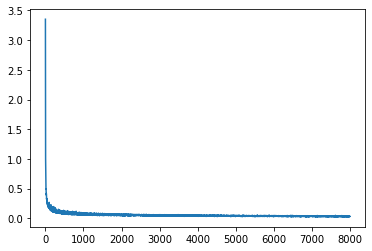

In [33]:
plt.plot(loss_hist[0:8000])

In [27]:
plt.rcParams['image.cmap']='jet'
unet_outlet.eval()
img = S.type(dtype).detach()
output = unet_outlet(img)

torch.Size([32, 3, 32, 32])
U0 is:  [0.         0.         0.         0.         0.35858586 0.35858586
 0.35858586 0.35858586 0.35858586 0.35858586 0.35858586 0.35858586
 0.35858586 0.35858586 0.35858586 0.35858586 0.35858586 0.35858586
 0.35858586 0.35858586 0.35858586 0.35858586 0.35858586 0.35858586
 0.35858586 0.35858586 0.35858586 0.35858586 0.         0.
 0.         0.        ]
V0 is:  [0.         0.         0.         0.         0.42424244 0.42424244
 0.42424244 0.42424244 0.42424244 0.42424244 0.42424244 0.42424244
 0.42424244 0.42424244 0.42424244 0.42424244 0.42424244 0.42424244
 0.42424244 0.42424244 0.42424244 0.42424244 0.42424244 0.42424244
 0.42424244 0.42424244 0.42424244 0.42424244 0.         0.
 0.         0.        ]


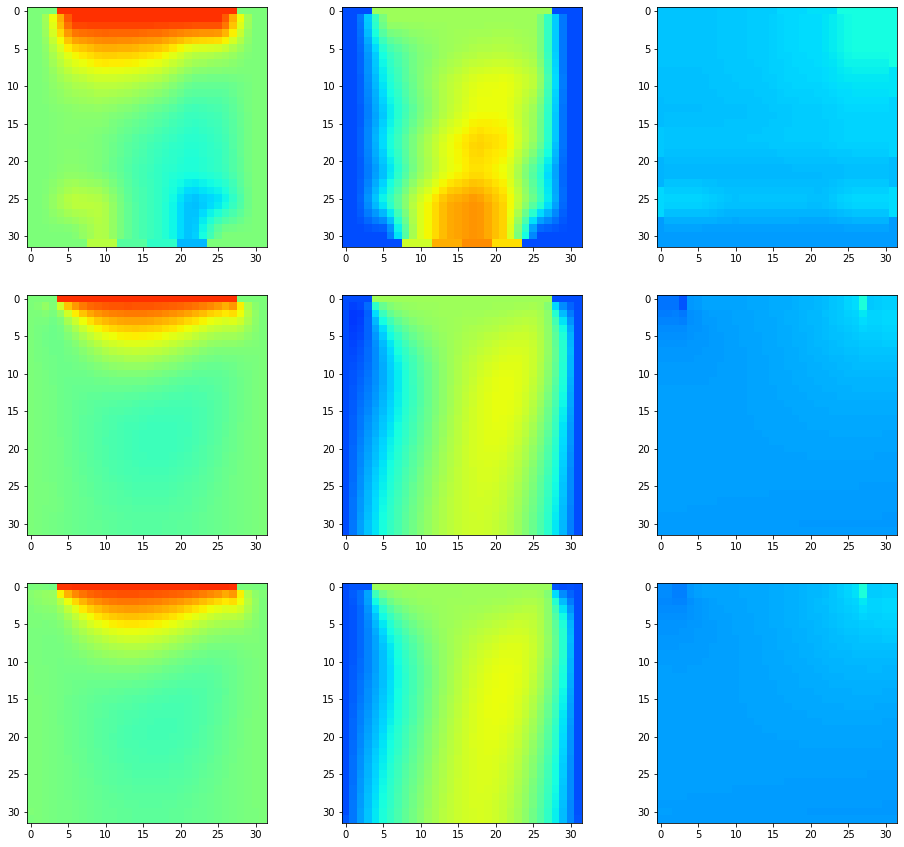

In [58]:
# plt.rcParams['image.cmap']='jet'
# S = torch.load('FlowData_UV_0331_warm_mixed32.pt')
# unet_outlet.eval()
# img = S.type(dtype).detach()
N = 10
# output = unet_outlet(img)



print(output.size())
UMAX, UMIN = 0.5, -0.5
VMAX, VMIN = 1.0, -0.25
PMAX, PMIN = 6.5, -2.5
print("U0 is: ", img[N,0,0,:].detach().cpu().numpy())
print("V0 is: ", img[N,1,0,:].detach().cpu().numpy())
u0_vector = img[N,0,0,:].detach().cpu().numpy()
v0_vector = img[N,1,0,:].detach().cpu().numpy()

size = 32
u = np.zeros((size, size))
v = np.zeros((size, size))
p = np.zeros((size, size)) 
L = 1
H = 1
dx = L / (size - 1)
dy = H / (size - 1)
CFL = 0.04
dt = CFL * min(dx , dy)
RE = 20
sol_u, sol_v, sol_p =solve_flow(5000, 32, 32, u, v, dt, dx, dy, p, u0=u0_vector, v0=v0_vector )
fig1, axes = plt.subplots(3, 3, figsize = (16,15))
axes[0,0].imshow(img[N,0,:,:].detach().cpu().numpy(), vmin=UMIN, vmax=UMAX )
axes[0,1].imshow(img[N,1,:,:].detach().cpu().numpy(), vmin=VMIN, vmax=VMAX)
axes[0,2].imshow(img[N,2,:,:].detach().cpu().numpy(), vmin=PMIN, vmax=PMAX)

axes[1,0].imshow(sol_u, vmin=UMIN, vmax=UMAX)
axes[1,1].imshow(sol_v, vmin=VMIN, vmax=VMAX)
axes[1,2].imshow(sol_p, vmin=PMIN, vmax=PMAX)


axes[2,0].imshow(output[N,0,:,:].detach().cpu().numpy(), vmin=UMIN, vmax=UMAX)
axes[2,1].imshow(output[N,1,:,:].detach().cpu().numpy(), vmin=VMIN, vmax=VMAX)
axes[2,2].imshow(output[N,2,:,:].detach().cpu().numpy(), vmin=PMIN, vmax=PMAX)


# print(get_loss(img,output))
# del img, output
# fig1.savefig("outlet_warm0406_success.png")

In [57]:
unet_outlet()

TypeError: forward() takes 2 positional arguments but 3 were given

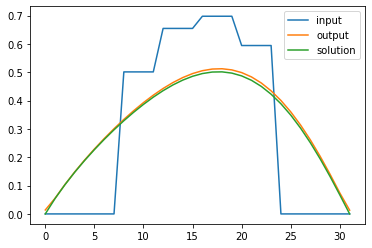

In [25]:

# S = torch.load('FlowData_UV_0324_warm_mixed32.pt')
# unet_outlet.eval()
img = S.type(dtype).detach()
N = 10
output = unet_outlet(img).detach()
plt.plot(img[N, 1, -1, :].cpu().numpy(), label="input" )
plt.plot(output[N, 1,-1, :].cpu().numpy(), label="output")
plt.plot(sol_v[-1, :], label="solution")
plt.legend()
plt.savefig("0406v-profile_outlet.png")

In [102]:
sol_u, sol_v, sol_p =solve_flow(5000, 32, 32, u, v, dt, dx, dy, p, u0=0.1, v0=0.5 )
sol_u.max()

0.16546998609001312

In [ ]:
plt.plot(img[N, 2, 0, :].cpu().numpy(), label="input" )
plt.plot(output[N, 2, 0, :].cpu().numpy(), label="output")
plt.plot(sol_p[0, :], label="solution")
plt.legend()
img[N, 1, 0, :].min()

In [65]:
UMAX, UMIN = 0.5, -0.114
VMAX, VMIN = 0.809, -0
PMAX, PMIN = 2.75, -0.187

get_factor = lambda M, m: ((M-m) / 2, -(M+m)/(M-m))
U_scale, U_base = get_factor(UMAX, UMIN)
V_scale, V_base = get_factor(VMAX, VMIN)
P_scale, P_base = get_factor(PMAX, PMIN)

In [71]:
P_scale

5.5

In [5]:
size = 32

size = 32
START_IN = 5
END_IN = 25
U0 = 0.25
V0 = 0.25
u0_vector = np.zeros((1,size))
v0_vector = np.zeros((1,size))

u0_vector[0, START_IN :END_IN ] = U0
v0_vector[0, START_IN :END_IN ] = V0
u = np.zeros((size, size))
v = np.zeros((size, size))
p = np.zeros((size, size)) 
L = 1 # dimensionless LX / LX
H = 1 # dimensionless LY / LX
dx = L / (size - 1)
dy = H / (size - 1)
CFL = 0.04
dt = CFL * min(dx , dy)
RE = 20
START_OUT = 22
END_OUT = 30


testUsol, testVsol, testPsol = solve_flow(2000, 32, 32, u, v, dt, dx, dy, p, u0=u0_vector, v0=v0_vector)

u = np.zeros((size, size))
v = np.zeros((size, size))
p = np.zeros((size, size)) 
iniU, iniV, iniP = solve_flow(2, 32, 32, u, v, dt, dx, dy, p, u0=u0_vector, v0=v0_vector)

warmS = torch.zeros(1, 3, 32, 32).type(dtype)
warmS[0,0,:,:] = torch.from_numpy(iniU)
warmS[0,1,:,:] = torch.from_numpy(iniV)
warmS[0,2,:,:] = torch.from_numpy(iniP)

testoutput = unet_outlet(warmS).type(dtype)


fig2, axes = plt.subplots(3, 3, figsize = (16,16))

UMAX, UMIN = 0.5, -0.5
VMAX, VMIN = 1.0, -0.25
PMAX, PMIN = 6.5, -2.5


axes[0,0].imshow(warmS[0,0,:,:].detach().cpu().numpy())
axes[0,0].set_title("X-Velocity") 
axes[0,1].imshow(warmS[0,1,:,:].detach().cpu().numpy())
axes[0,1].set_title("Y-Velocity")
axes[0,2].imshow(warmS[0,2,:,:].detach().cpu().numpy())
axes[0,2].set_title("Pressure") 

axes[1,0].imshow(testUsol, vmin=UMIN, vmax=UMAX)
axes[1,1].imshow(testVsol, vmin=VMIN, vmax=VMAX)
axes[1,2].imshow(testPsol, vmin=PMIN, vmax=PMAX)


axes[2,0].imshow(testoutput[0,0,:,:].detach().cpu().numpy(),  vmin=UMIN, vmax=UMAX)
axes[2,1].imshow(testoutput[0,1,:,:].detach().cpu().numpy(),  vmin=VMIN, vmax=VMAX)
axes[2,2].imshow(testoutput[0,2,:,:].detach().cpu().numpy(), vmin=PMIN, vmax=PMAX)


fig2.text(0.06, 0.25, 'Model Generation', fontsize=14, ha='center', va='center', rotation='vertical')
fig2.text(0.06, 0.5, 'FDM Solution', fontsize=14, ha='center', va='center', rotation='vertical')
fig2.text(0.06, 0.8, 'Initilization', fontsize=14, ha='center', va='center', rotation='vertical')
fig2.suptitle('Generation at u0={} v0={}'.format(u0,v0), fontsize=16)
# fig2.savefig('outlet_ini_test0304.png')

NameError: name 'dt' is not defined

In [24]:
# plt.plot(testoutput[0,2,-2,:].detach().cpu().numpy())
plt.plot(testoutput[0,1,-1,:].detach().cpu().numpy())

# plt.plot(testVsol[-2, :])

plt.plot(testVsol[-1, :])

plt.savefig("outlet0406_-1.png")

NameError: name 'testoutput' is not defined

In [69]:
u0 = 1.0
v0 = 0
u0_vector[0, 1:32] = u0  
v0_vector[0, 1:32] = v0  
testUsol, testVsol, testPsol = solve_flow(20, 32, 32, u, v, dt, dx, dy, p, u0=u0_vector, v0=v0_vector)
print(testUsol.max() )
print(testUsol.min() )

print(testVsol.max())
print(testVsol.min())

print(testPsol.max())
print(testPsol.min())

1.0
-0.07071140884612269
0.1778277347335323
-0.17045858454352653
2.4380334885218633
-2.4376387862148166
